### With MFCCs Feature Extraction

In [1]:
import os
import numpy as np
import librosa

# Load the dataset
data_path = "Dataset"  # Replace with the path to your dataset
labels = ["MR", "MS", "normal"]
X = []
y = []

for label in labels:
    folder_path = os.path.join(data_path, label)
    for file in os.listdir(folder_path):
        if file.endswith(".wav"):
            # Load the WAV file using librosa
            file_path = os.path.join(folder_path, file)
            y_data, sr = librosa.load(file_path, sr=None)
            
            # Extract MFCC features from the audio signal
            mfccs = librosa.feature.mfcc(y=y_data, sr=sr, n_mfcc=13)
            X.append(mfccs.T)
            y.append(labels.index(label))

# Determine the maximum sequence length
max_length = max([len(features) for features in X])

# Pad each sequence to the maximum length
X_padded = []

for features in X:
    pad_width = max_length - len(features)
    padded_features = np.pad(features, ((0, pad_width), (0, 0)), mode='constant')
    X_padded.append(padded_features)

# Convert the padded list to a numpy array
X = np.array(X_padded)
y = np.array(y)

# Split the dataset into training and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

C:\Users\Admin\anaconda3\envs\GPU_PhD\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Admin\anaconda3\envs\GPU_PhD\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
C:\Users\Admin\anaconda3\envs\GPU_PhD\lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-246-g3d31191b-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, LSTM, GRU, Dense, Bidirectional

# Simple RNN
model_simple_rnn = Sequential([
    SimpleRNN(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# LSTM
model_lstm = Sequential([
    LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# GRU
model_gru = Sequential([
    GRU(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Bidirectional LSTM
model_bidirectional_lstm = Sequential([
    Bidirectional(LSTM(64), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Stacked LSTM
model_stacked_lstm = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(64),
    Dense(3, activation='softmax')
])


In [3]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/10
10/10 [==============================] - 1s 44ms/step - loss: 0.9147 - accuracy: 0.5896 - val_loss: 0.8621 - val_accuracy: 0.5974
Epoch 2/10
10/10 [==============================] - 0s 28ms/step - loss: 0.7616 - accuracy: 0.6352 - val_loss: 0.7789 - val_accuracy: 0.5974
Epoch 3/10
10/10 [==============================] - 0s 28ms/step - loss: 0.6975 - accuracy: 0.7231 - val_loss: 0.8118 - val_accuracy: 0.6104
Epoch 4/10
10/10 [==============================] - 0s 29ms/step - loss: 0.6431 - accuracy: 0.7590 - val_loss: 0.7300 - val_accuracy: 0.6883
Epoch 5/10
10/10 [==============================] - 0s 28ms/step - loss: 0.6025 - accuracy: 0.7394 - val_loss: 0.7383 - val_accuracy: 0.5844
Epoch 6/10
10/10 [==============================] - 0s 31ms/step - loss: 0.5697 - accuracy: 0.7459 - val_loss: 0.6584 - val_accuracy: 0.7013
Epoch 7/10
10/10 [==============================] - 0s 32ms/step - loss: 0.5459 - accuracy: 0.7720 - val_loss: 0.6692 - val_accurac

In [4]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/50
10/10 [==============================] - 1s 48ms/step - loss: 0.4848 - accuracy: 0.7948 - val_loss: 0.6616 - val_accuracy: 0.6364
Epoch 2/50
10/10 [==============================] - 0s 34ms/step - loss: 0.4620 - accuracy: 0.8143 - val_loss: 0.5297 - val_accuracy: 0.7922
Epoch 3/50
10/10 [==============================] - 0s 35ms/step - loss: 0.4368 - accuracy: 0.8306 - val_loss: 0.5580 - val_accuracy: 0.7922
Epoch 4/50
10/10 [==============================] - 0s 33ms/step - loss: 0.4017 - accuracy: 0.8404 - val_loss: 0.5019 - val_accuracy: 0.7792
Epoch 5/50
10/10 [==============================] - 0s 34ms/step - loss: 0.3955 - accuracy: 0.8502 - val_loss: 0.5458 - val_accuracy: 0.7792
Epoch 6/50
10/10 [==============================] - 0s 32ms/step - loss: 0.3826 - accuracy: 0.8567 - val_loss: 0.4935 - val_accuracy: 0.8052
Epoch 7/50
10/10 [==============================] - 0s 30ms/step - loss: 0.3866 - accuracy: 0.8469 - val_loss: 0.5227 - val_accurac

Epoch 8/50
10/10 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.9935 - val_loss: 0.0424 - val_accuracy: 0.9870
Epoch 9/50
10/10 [==============================] - 0s 7ms/step - loss: 0.0374 - accuracy: 0.9935 - val_loss: 0.0394 - val_accuracy: 0.9870
Epoch 10/50
10/10 [==============================] - 0s 7ms/step - loss: 0.0366 - accuracy: 0.9967 - val_loss: 0.0506 - val_accuracy: 0.9740
Epoch 11/50
10/10 [==============================] - 0s 7ms/step - loss: 0.0389 - accuracy: 0.9935 - val_loss: 0.1183 - val_accuracy: 0.9740
Epoch 12/50
10/10 [==============================] - 0s 7ms/step - loss: 0.0442 - accuracy: 0.9870 - val_loss: 0.0561 - val_accuracy: 0.9870
Epoch 13/50
10/10 [==============================] - 0s 7ms/step - loss: 0.0338 - accuracy: 0.9870 - val_loss: 0.1210 - val_accuracy: 0.9610
Epoch 14/50
10/10 [==============================] - 0s 7ms/step - loss: 0.0512 - accuracy: 0.9870 - val_loss: 0.0573 - val_accuracy: 0.9870
Epoch 15/50
10/

10/10 [==============================] - 0s 10ms/step - loss: 0.0137 - accuracy: 0.9967 - val_loss: 0.1469 - val_accuracy: 0.9740
Epoch 23/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0083 - accuracy: 0.9967 - val_loss: 0.1530 - val_accuracy: 0.9740
Epoch 24/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.1523 - val_accuracy: 0.9740
Epoch 25/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 0.1622 - val_accuracy: 0.9740
Epoch 26/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0219 - accuracy: 0.9902 - val_loss: 0.1655 - val_accuracy: 0.9740
Epoch 27/50
10/10 [==============================] - 0s 10ms/step - loss: 0.1408 - accuracy: 0.9511 - val_loss: 0.1069 - val_accuracy: 0.9610
Epoch 28/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0675 - accuracy: 0.9739 - val_loss: 0.1525 - val_accuracy: 0.9740
Epoch 29/50
10/10 

Epoch 29/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0067 - accuracy: 0.9967 - val_loss: 0.0315 - val_accuracy: 0.9870
Epoch 30/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0049 - accuracy: 0.9967 - val_loss: 0.0467 - val_accuracy: 0.9870
Epoch 31/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0056 - accuracy: 0.9967 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 32/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0370 - accuracy: 0.9837 - val_loss: 0.5903 - val_accuracy: 0.8571
Epoch 33/50
10/10 [==============================] - 0s 10ms/step - loss: 0.1487 - accuracy: 0.9609 - val_loss: 0.2555 - val_accuracy: 0.9091
Epoch 34/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0604 - accuracy: 0.9837 - val_loss: 0.0543 - val_accuracy: 0.9870
Epoch 35/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0725 - accuracy: 0.9805 - val_loss: 0.0582 - val_accuracy: 0.9740
Epoch 

In [5]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/100
10/10 [==============================] - 1s 43ms/step - loss: 0.2584 - accuracy: 0.8860 - val_loss: 0.4661 - val_accuracy: 0.8052
Epoch 2/100
10/10 [==============================] - 0s 30ms/step - loss: 0.2330 - accuracy: 0.8958 - val_loss: 0.3962 - val_accuracy: 0.8442
Epoch 3/100
10/10 [==============================] - 0s 31ms/step - loss: 0.2366 - accuracy: 0.9055 - val_loss: 0.3737 - val_accuracy: 0.8312
Epoch 4/100
10/10 [==============================] - 0s 32ms/step - loss: 0.2158 - accuracy: 0.9055 - val_loss: 0.4169 - val_accuracy: 0.8442
Epoch 5/100
10/10 [==============================] - 0s 30ms/step - loss: 0.2040 - accuracy: 0.9055 - val_loss: 0.3567 - val_accuracy: 0.8571
Epoch 6/100
10/10 [==============================] - 0s 30ms/step - loss: 0.2014 - accuracy: 0.9121 - val_loss: 0.3748 - val_accuracy: 0.8442
Epoch 7/100
10/10 [==============================] - 0s 30ms/step - loss: 0.1892 - accuracy: 0.9153 - val_loss: 0.3801 - val_

10/10 [==============================] - 0s 7ms/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 0.0154 - val_accuracy: 1.0000
Epoch 15/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 16/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 17/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 0.0151 - val_accuracy: 1.0000
Epoch 18/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.0139 - val_accuracy: 1.0000
Epoch 19/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.0138 - val_accuracy: 1.0000
Epoch 20/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0152 - val_accuracy: 1.0000
Epoch 21/100
10/10 

10/10 [==============================] - 0s 7ms/step - loss: 0.0136 - accuracy: 0.9967 - val_loss: 0.2426 - val_accuracy: 0.9481
Epoch 27/100
10/10 [==============================] - 0s 6ms/step - loss: 0.0119 - accuracy: 0.9967 - val_loss: 0.2055 - val_accuracy: 0.9610
Epoch 28/100
10/10 [==============================] - 0s 6ms/step - loss: 0.0151 - accuracy: 0.9967 - val_loss: 0.2344 - val_accuracy: 0.9351
Epoch 29/100
10/10 [==============================] - 0s 6ms/step - loss: 0.0146 - accuracy: 0.9967 - val_loss: 0.2842 - val_accuracy: 0.9351
Epoch 30/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0103 - accuracy: 0.9967 - val_loss: 0.2477 - val_accuracy: 0.9351
Epoch 31/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0084 - accuracy: 0.9967 - val_loss: 0.2038 - val_accuracy: 0.9481
Epoch 32/100
10/10 [==============================] - 0s 7ms/step - loss: 0.0121 - accuracy: 0.9935 - val_loss: 0.3246 - val_accuracy: 0.9351
Epoch 33/100
10/10 

10/10 [==============================] - 0s 10ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.0230 - val_accuracy: 1.0000
Epoch 39/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0234 - val_accuracy: 1.0000
Epoch 40/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 41/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0220 - val_accuracy: 1.0000
Epoch 42/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0224 - val_accuracy: 1.0000
Epoch 43/100
10/10 [==============================] - 0s 10ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0227 - val_accuracy: 1.0000
Epoch 44/100
10/10 [==============================] - 0s 10ms/step - loss: 9.8511e-04 - accuracy: 1.0000 - val_loss: 0.0211 - val_accuracy: 1.0000
Epoch 45

Epoch 94/100
10/10 [==============================] - 0s 10ms/step - loss: 1.8188e-04 - accuracy: 1.0000 - val_loss: 0.0288 - val_accuracy: 0.9870
Epoch 95/100
10/10 [==============================] - 0s 10ms/step - loss: 1.7773e-04 - accuracy: 1.0000 - val_loss: 0.0291 - val_accuracy: 0.9870
Epoch 96/100
10/10 [==============================] - 0s 10ms/step - loss: 1.7504e-04 - accuracy: 1.0000 - val_loss: 0.0293 - val_accuracy: 0.9870
Epoch 97/100
10/10 [==============================] - 0s 10ms/step - loss: 1.7125e-04 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9870
Epoch 98/100
10/10 [==============================] - 0s 10ms/step - loss: 1.6792e-04 - accuracy: 1.0000 - val_loss: 0.0300 - val_accuracy: 0.9870
Epoch 99/100
10/10 [==============================] - 0s 10ms/step - loss: 1.6597e-04 - accuracy: 1.0000 - val_loss: 0.0302 - val_accuracy: 0.9870
Epoch 100/100
3/3 [==============================] - 0s 4ms/step - loss: 0.1656 - accuracy: 0.9688
Bidirectional LSTM 

In [6]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=150, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/150
10/10 [==============================] - 1s 42ms/step - loss: 0.1998 - accuracy: 0.9088 - val_loss: 0.4748 - val_accuracy: 0.8182
Epoch 2/150
10/10 [==============================] - 0s 29ms/step - loss: 0.1742 - accuracy: 0.9218 - val_loss: 0.4261 - val_accuracy: 0.8182
Epoch 3/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1725 - accuracy: 0.9251 - val_loss: 0.4597 - val_accuracy: 0.8442
Epoch 4/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1735 - accuracy: 0.9088 - val_loss: 0.4077 - val_accuracy: 0.8442
Epoch 5/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1472 - accuracy: 0.9316 - val_loss: 0.4300 - val_accuracy: 0.8442
Epoch 6/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1588 - accuracy: 0.9283 - val_loss: 0.4179 - val_accuracy: 0.8571
Epoch 7/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1501 - accuracy: 0.9349 - val_loss: 0.3005 - val_

10/10 [==============================] - 0s 29ms/step - loss: 0.1303 - accuracy: 0.9381 - val_loss: 0.4245 - val_accuracy: 0.8961
Epoch 116/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1213 - accuracy: 0.9446 - val_loss: 0.4191 - val_accuracy: 0.8831
Epoch 117/150
10/10 [==============================] - 0s 30ms/step - loss: 0.1052 - accuracy: 0.9446 - val_loss: 0.3844 - val_accuracy: 0.8961
Epoch 118/150
10/10 [==============================] - 0s 32ms/step - loss: 0.1010 - accuracy: 0.9544 - val_loss: 0.3905 - val_accuracy: 0.8961
Epoch 119/150
10/10 [==============================] - 0s 32ms/step - loss: 0.1014 - accuracy: 0.9544 - val_loss: 0.4318 - val_accuracy: 0.8831
Epoch 120/150
10/10 [==============================] - 0s 32ms/step - loss: 0.1029 - accuracy: 0.9511 - val_loss: 0.3478 - val_accuracy: 0.8831
Epoch 121/150
10/10 [==============================] - 0s 32ms/step - loss: 0.0987 - accuracy: 0.9414 - val_loss: 0.4305 - val_accuracy: 0.8961
Epoch 

10/10 [==============================] - 0s 7ms/step - loss: 7.4542e-05 - accuracy: 1.0000 - val_loss: 0.0281 - val_accuracy: 0.9870
Epoch 78/150
10/10 [==============================] - 0s 7ms/step - loss: 7.3412e-05 - accuracy: 1.0000 - val_loss: 0.0287 - val_accuracy: 0.9870
Epoch 79/150
10/10 [==============================] - 0s 7ms/step - loss: 7.2527e-05 - accuracy: 1.0000 - val_loss: 0.0291 - val_accuracy: 0.9870
Epoch 80/150
10/10 [==============================] - 0s 7ms/step - loss: 7.1361e-05 - accuracy: 1.0000 - val_loss: 0.0294 - val_accuracy: 0.9870
Epoch 81/150
10/10 [==============================] - 0s 7ms/step - loss: 7.0285e-05 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9870
Epoch 82/150
10/10 [==============================] - 0s 7ms/step - loss: 6.9339e-05 - accuracy: 1.0000 - val_loss: 0.0298 - val_accuracy: 0.9870
Epoch 83/150
10/10 [==============================] - 0s 7ms/step - loss: 6.8580e-05 - accuracy: 1.0000 - val_loss: 0.0306 - val_accuracy

Epoch 133/150
10/10 [==============================] - 0s 7ms/step - loss: 4.1044e-05 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9870
Epoch 134/150
10/10 [==============================] - 0s 7ms/step - loss: 4.0567e-05 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9870
Epoch 135/150
10/10 [==============================] - 0s 7ms/step - loss: 4.0215e-05 - accuracy: 1.0000 - val_loss: 0.0419 - val_accuracy: 0.9870
Epoch 136/150
10/10 [==============================] - 0s 7ms/step - loss: 3.9730e-05 - accuracy: 1.0000 - val_loss: 0.0418 - val_accuracy: 0.9870
Epoch 137/150
10/10 [==============================] - 0s 7ms/step - loss: 3.9342e-05 - accuracy: 1.0000 - val_loss: 0.0422 - val_accuracy: 0.9870
Epoch 138/150
10/10 [==============================] - 0s 7ms/step - loss: 3.8928e-05 - accuracy: 1.0000 - val_loss: 0.0424 - val_accuracy: 0.9870
Epoch 139/150
10/10 [==============================] - 0s 7ms/step - loss: 3.8514e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 39/150
10/10 [==============================] - 0s 6ms/step - loss: 4.5876e-04 - accuracy: 1.0000 - val_loss: 0.1779 - val_accuracy: 0.9610
Epoch 40/150
10/10 [==============================] - 0s 6ms/step - loss: 4.4142e-04 - accuracy: 1.0000 - val_loss: 0.1810 - val_accuracy: 0.9481
Epoch 41/150
10/10 [==============================] - 0s 6ms/step - loss: 4.2771e-04 - accuracy: 1.0000 - val_loss: 0.1832 - val_accuracy: 0.9481
Epoch 42/150
10/10 [==============================] - 0s 6ms/step - loss: 4.1664e-04 - accuracy: 1.0000 - val_loss: 0.1884 - val_accuracy: 0.9481
Epoch 43/150
10/10 [==============================] - 0s 6ms/step - loss: 4.0194e-04 - accuracy: 1.0000 - val_loss: 0.1904 - val_accuracy: 0.9481
Epoch 44/150
10/10 [==============================] - 0s 6ms/step - loss: 3.9172e-04 - accuracy: 1.0000 - val_loss: 0.1913 - val_accuracy: 0.9481
Epoch 45/150
10/10 [==============================] - 0s 6ms/step - loss: 3.8009e-04 - accuracy: 1.0000 - val_loss: 0.1939 -

3/3 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.9479
GRU Accuracy: 94.79%
Training Bidirectional LSTM...
Epoch 1/150
10/10 [==============================] - 2s 54ms/step - loss: 0.0846 - accuracy: 0.9837 - val_loss: 0.0277 - val_accuracy: 0.9870
Epoch 2/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0056 - accuracy: 0.9967 - val_loss: 0.0726 - val_accuracy: 0.9740
Epoch 3/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 0.0298 - val_accuracy: 0.9870
Epoch 4/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0329 - accuracy: 0.9772 - val_loss: 0.0440 - val_accuracy: 0.9870
Epoch 5/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0103 - accuracy: 0.9935 - val_loss: 0.0238 - val_accuracy: 0.9870
Epoch 6/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0170 - accuracy: 0.9967 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 7/150

Epoch 112/150
10/10 [==============================] - 0s 10ms/step - loss: 6.3890e-05 - accuracy: 1.0000 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 113/150
10/10 [==============================] - 0s 10ms/step - loss: 6.3228e-05 - accuracy: 1.0000 - val_loss: 0.0055 - val_accuracy: 1.0000
Epoch 114/150
10/10 [==============================] - 0s 10ms/step - loss: 6.2309e-05 - accuracy: 1.0000 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 115/150
10/10 [==============================] - 0s 10ms/step - loss: 6.1655e-05 - accuracy: 1.0000 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 116/150
10/10 [==============================] - 0s 10ms/step - loss: 6.0838e-05 - accuracy: 1.0000 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 117/150
10/10 [==============================] - 0s 10ms/step - loss: 5.9897e-05 - accuracy: 1.0000 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 118/150
10/10 [==============================] - 0s 10ms/step - loss: 5.9270e-05 - accuracy: 1.0000 - val_

Epoch 17/150
10/10 [==============================] - 0s 11ms/step - loss: 0.0077 - accuracy: 0.9967 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 18/150
10/10 [==============================] - 0s 11ms/step - loss: 0.0149 - accuracy: 0.9967 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 19/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0133 - accuracy: 0.9967 - val_loss: 0.0100 - val_accuracy: 1.0000
Epoch 20/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 21/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 22/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 23/150
10/10 [==============================] - 0s 10ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000

10/10 [==============================] - 0s 10ms/step - loss: 6.4961e-05 - accuracy: 1.0000 - val_loss: 1.1726e-04 - val_accuracy: 1.0000
Epoch 126/150
10/10 [==============================] - 0s 10ms/step - loss: 6.4191e-05 - accuracy: 1.0000 - val_loss: 1.1624e-04 - val_accuracy: 1.0000
Epoch 127/150
10/10 [==============================] - 0s 10ms/step - loss: 6.3516e-05 - accuracy: 1.0000 - val_loss: 1.1526e-04 - val_accuracy: 1.0000
Epoch 128/150
10/10 [==============================] - 0s 10ms/step - loss: 6.2766e-05 - accuracy: 1.0000 - val_loss: 1.1409e-04 - val_accuracy: 1.0000
Epoch 129/150
10/10 [==============================] - 0s 10ms/step - loss: 6.2125e-05 - accuracy: 1.0000 - val_loss: 1.1319e-04 - val_accuracy: 1.0000
Epoch 130/150
10/10 [==============================] - 0s 10ms/step - loss: 6.1354e-05 - accuracy: 1.0000 - val_loss: 1.1226e-04 - val_accuracy: 1.0000
Epoch 131/150
10/10 [==============================] - 0s 10ms/step - loss: 6.0762e-05 - accuracy: 1.0

In [7]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/200
10/10 [==============================] - 1s 71ms/step - loss: 0.1422 - accuracy: 0.9186 - val_loss: 0.3158 - val_accuracy: 0.9091
Epoch 2/200
10/10 [==============================] - 0s 29ms/step - loss: 0.1483 - accuracy: 0.9283 - val_loss: 0.5309 - val_accuracy: 0.8442
Epoch 3/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0998 - accuracy: 0.9414 - val_loss: 0.4807 - val_accuracy: 0.8442
Epoch 4/200
10/10 [==============================] - 0s 30ms/step - loss: 0.1291 - accuracy: 0.9479 - val_loss: 0.4634 - val_accuracy: 0.8701
Epoch 5/200
10/10 [==============================] - 0s 30ms/step - loss: 0.1075 - accuracy: 0.9446 - val_loss: 0.4413 - val_accuracy: 0.8831
Epoch 6/200
10/10 [==============================] - 0s 31ms/step - loss: 0.1036 - accuracy: 0.9544 - val_loss: 0.4676 - val_accuracy: 0.8571
Epoch 7/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0940 - accuracy: 0.9544 - val_loss: 0.3228 - val_

10/10 [==============================] - 0s 30ms/step - loss: 0.1128 - accuracy: 0.9446 - val_loss: 0.2364 - val_accuracy: 0.9221
Epoch 116/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0873 - accuracy: 0.9674 - val_loss: 0.2797 - val_accuracy: 0.9221
Epoch 117/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0824 - accuracy: 0.9674 - val_loss: 0.3186 - val_accuracy: 0.8961
Epoch 118/200
10/10 [==============================] - 0s 29ms/step - loss: 0.1329 - accuracy: 0.9381 - val_loss: 0.2756 - val_accuracy: 0.9221
Epoch 119/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0985 - accuracy: 0.9577 - val_loss: 0.2323 - val_accuracy: 0.9481
Epoch 120/200
10/10 [==============================] - 0s 30ms/step - loss: 0.1026 - accuracy: 0.9511 - val_loss: 0.2995 - val_accuracy: 0.9091
Epoch 121/200
10/10 [==============================] - 0s 29ms/step - loss: 0.0742 - accuracy: 0.9642 - val_loss: 0.2708 - val_accuracy: 0.8831
Epoch 

Epoch 172/200
10/10 [==============================] - 0s 29ms/step - loss: 0.0392 - accuracy: 0.9870 - val_loss: 0.3913 - val_accuracy: 0.8831
Epoch 173/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0371 - accuracy: 0.9837 - val_loss: 0.3365 - val_accuracy: 0.8831
Epoch 174/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0339 - accuracy: 0.9870 - val_loss: 0.3781 - val_accuracy: 0.8831
Epoch 175/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0344 - accuracy: 0.9805 - val_loss: 0.3278 - val_accuracy: 0.8701
Epoch 176/200
10/10 [==============================] - 0s 29ms/step - loss: 0.0374 - accuracy: 0.9870 - val_loss: 0.3098 - val_accuracy: 0.8831
Epoch 177/200
10/10 [==============================] - 0s 30ms/step - loss: 0.0633 - accuracy: 0.9707 - val_loss: 0.3341 - val_accuracy: 0.8961
Epoch 178/200
10/10 [==============================] - 0s 29ms/step - loss: 0.0592 - accuracy: 0.9707 - val_loss: 0.2997 - val_accuracy:

Epoch 28/200
10/10 [==============================] - 0s 7ms/step - loss: 1.6581e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 29/200
10/10 [==============================] - 0s 7ms/step - loss: 1.5890e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 30/200
10/10 [==============================] - 0s 7ms/step - loss: 1.5301e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 31/200
10/10 [==============================] - 0s 7ms/step - loss: 1.4814e-04 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 32/200
10/10 [==============================] - 0s 7ms/step - loss: 1.4250e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 33/200
10/10 [==============================] - 0s 7ms/step - loss: 1.3816e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 34/200
10/10 [==============================] - 0s 7ms/step - loss: 1.3363e-04 - accuracy: 1.0000 - val_loss: 0.0082 -

Epoch 140/200
10/10 [==============================] - 0s 7ms/step - loss: 2.7599e-05 - accuracy: 1.0000 - val_loss: 0.0137 - val_accuracy: 0.9870
Epoch 141/200
10/10 [==============================] - 0s 7ms/step - loss: 2.7335e-05 - accuracy: 1.0000 - val_loss: 0.0138 - val_accuracy: 0.9870
Epoch 142/200
10/10 [==============================] - 0s 7ms/step - loss: 2.7095e-05 - accuracy: 1.0000 - val_loss: 0.0139 - val_accuracy: 0.9870
Epoch 143/200
10/10 [==============================] - 0s 7ms/step - loss: 2.6876e-05 - accuracy: 1.0000 - val_loss: 0.0140 - val_accuracy: 0.9870
Epoch 144/200
10/10 [==============================] - 0s 7ms/step - loss: 2.6611e-05 - accuracy: 1.0000 - val_loss: 0.0138 - val_accuracy: 0.9870
Epoch 145/200
10/10 [==============================] - 0s 7ms/step - loss: 2.6342e-05 - accuracy: 1.0000 - val_loss: 0.0140 - val_accuracy: 0.9870
Epoch 146/200
10/10 [==============================] - 0s 7ms/step - loss: 2.6155e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 196/200
10/10 [==============================] - 0s 7ms/step - loss: 1.7327e-05 - accuracy: 1.0000 - val_loss: 0.0189 - val_accuracy: 0.9870
Epoch 197/200
10/10 [==============================] - 0s 7ms/step - loss: 1.7193e-05 - accuracy: 1.0000 - val_loss: 0.0190 - val_accuracy: 0.9870
Epoch 198/200
10/10 [==============================] - 0s 7ms/step - loss: 1.7063e-05 - accuracy: 1.0000 - val_loss: 0.0191 - val_accuracy: 0.9870
Epoch 199/200
10/10 [==============================] - 0s 7ms/step - loss: 1.6928e-05 - accuracy: 1.0000 - val_loss: 0.0192 - val_accuracy: 0.9870
Epoch 200/200
3/3 [==============================] - 0s 3ms/step - loss: 0.3130 - accuracy: 0.9583
LSTM Accuracy: 95.83%
Training GRU...
Epoch 1/200
10/10 [==============================] - 1s 29ms/step - loss: 0.0768 - accuracy: 0.9772 - val_loss: 0.5185 - val_accuracy: 0.9351
Epoch 2/200
10/10 [==============================] - 0s 6ms/step - loss: 0.1049 - accuracy: 0.9739 - val_loss: 0.4872 - val_accuracy:

10/10 [==============================] - 0s 6ms/step - loss: 6.5991e-05 - accuracy: 1.0000 - val_loss: 0.2940 - val_accuracy: 0.9610
Epoch 108/200
10/10 [==============================] - 0s 6ms/step - loss: 6.5230e-05 - accuracy: 1.0000 - val_loss: 0.2939 - val_accuracy: 0.9740
Epoch 109/200
10/10 [==============================] - 0s 6ms/step - loss: 6.4473e-05 - accuracy: 1.0000 - val_loss: 0.2881 - val_accuracy: 0.9740
Epoch 110/200
10/10 [==============================] - 0s 6ms/step - loss: 6.3631e-05 - accuracy: 1.0000 - val_loss: 0.2898 - val_accuracy: 0.9740
Epoch 111/200
10/10 [==============================] - 0s 6ms/step - loss: 6.2769e-05 - accuracy: 1.0000 - val_loss: 0.2936 - val_accuracy: 0.9740
Epoch 112/200
10/10 [==============================] - 0s 6ms/step - loss: 6.2051e-05 - accuracy: 1.0000 - val_loss: 0.2976 - val_accuracy: 0.9610
Epoch 113/200
10/10 [==============================] - 0s 6ms/step - loss: 6.1317e-05 - accuracy: 1.0000 - val_loss: 0.2977 - val_ac

Epoch 163/200
10/10 [==============================] - 0s 6ms/step - loss: 3.5807e-05 - accuracy: 1.0000 - val_loss: 0.3266 - val_accuracy: 0.9610
Epoch 164/200
10/10 [==============================] - 0s 6ms/step - loss: 3.5472e-05 - accuracy: 1.0000 - val_loss: 0.3283 - val_accuracy: 0.9610
Epoch 165/200
10/10 [==============================] - 0s 6ms/step - loss: 3.5067e-05 - accuracy: 1.0000 - val_loss: 0.3288 - val_accuracy: 0.9610
Epoch 166/200
10/10 [==============================] - 0s 6ms/step - loss: 3.4816e-05 - accuracy: 1.0000 - val_loss: 0.3280 - val_accuracy: 0.9610
Epoch 167/200
10/10 [==============================] - 0s 6ms/step - loss: 3.4466e-05 - accuracy: 1.0000 - val_loss: 0.3277 - val_accuracy: 0.9610
Epoch 168/200
10/10 [==============================] - 0s 6ms/step - loss: 3.4217e-05 - accuracy: 1.0000 - val_loss: 0.3304 - val_accuracy: 0.9610
Epoch 169/200
10/10 [==============================] - 0s 6ms/step - loss: 3.3821e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 1.4160e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 19/200
10/10 [==============================] - 0s 10ms/step - loss: 1.3368e-04 - accuracy: 1.0000 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 20/200
10/10 [==============================] - 0s 10ms/step - loss: 1.4199e-04 - accuracy: 1.0000 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 21/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2064e-04 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 22/200
10/10 [==============================] - 0s 10ms/step - loss: 1.1949e-04 - accuracy: 1.0000 - val_loss: 0.0067 - val_accuracy: 1.0000
Epoch 23/200
10/10 [==============================] - 0s 10ms/step - loss: 1.1481e-04 - accuracy: 1.0000 - val_loss: 0.0066 - val_accuracy: 1.0000
Epoch 24/200
10/10 [==============================] - 0s 10ms/step - loss: 1.1126e-04 - accuracy: 1.0000 - val_loss: 0.0067 - val_a

Epoch 74/200
10/10 [==============================] - 0s 10ms/step - loss: 4.2153e-05 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 75/200
10/10 [==============================] - 0s 10ms/step - loss: 4.1185e-05 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 76/200
10/10 [==============================] - 0s 10ms/step - loss: 4.0671e-05 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 77/200
10/10 [==============================] - 0s 10ms/step - loss: 3.9980e-05 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 78/200
10/10 [==============================] - 0s 10ms/step - loss: 3.9192e-05 - accuracy: 1.0000 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 79/200
10/10 [==============================] - 0s 10ms/step - loss: 3.8736e-05 - accuracy: 1.0000 - val_loss: 0.0091 - val_accuracy: 1.0000
Epoch 80/200
10/10 [==============================] - 0s 10ms/step - loss: 3.8278e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 1.3160e-05 - accuracy: 1.0000 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 185/200
10/10 [==============================] - 0s 10ms/step - loss: 1.3129e-05 - accuracy: 1.0000 - val_loss: 0.0085 - val_accuracy: 1.0000
Epoch 186/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2999e-05 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 187/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2959e-05 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 188/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2837e-05 - accuracy: 1.0000 - val_loss: 0.0079 - val_accuracy: 1.0000
Epoch 189/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2683e-05 - accuracy: 1.0000 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 190/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2609e-05 - accuracy: 1.0000 - val_loss: 0.0082 -

10/10 [==============================] - 0s 10ms/step - loss: 1.5019e-04 - accuracy: 1.0000 - val_loss: 0.0460 - val_accuracy: 0.9870
Epoch 40/200
10/10 [==============================] - 0s 10ms/step - loss: 1.4598e-04 - accuracy: 1.0000 - val_loss: 0.0465 - val_accuracy: 0.9870
Epoch 41/200
10/10 [==============================] - 0s 10ms/step - loss: 1.4119e-04 - accuracy: 1.0000 - val_loss: 0.0467 - val_accuracy: 0.9870
Epoch 42/200
10/10 [==============================] - 0s 10ms/step - loss: 1.3679e-04 - accuracy: 1.0000 - val_loss: 0.0467 - val_accuracy: 0.9870
Epoch 43/200
10/10 [==============================] - 0s 10ms/step - loss: 1.3352e-04 - accuracy: 1.0000 - val_loss: 0.0468 - val_accuracy: 0.9870
Epoch 44/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2963e-04 - accuracy: 1.0000 - val_loss: 0.0468 - val_accuracy: 0.9870
Epoch 45/200
10/10 [==============================] - 0s 10ms/step - loss: 1.2633e-04 - accuracy: 1.0000 - val_loss: 0.0465 - val_a

Epoch 95/200
10/10 [==============================] - 0s 10ms/step - loss: 4.9829e-05 - accuracy: 1.0000 - val_loss: 0.0575 - val_accuracy: 0.9870
Epoch 96/200
10/10 [==============================] - 0s 10ms/step - loss: 4.9206e-05 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9870
Epoch 97/200
10/10 [==============================] - 0s 10ms/step - loss: 4.8415e-05 - accuracy: 1.0000 - val_loss: 0.0582 - val_accuracy: 0.9870
Epoch 98/200
10/10 [==============================] - 0s 10ms/step - loss: 4.7941e-05 - accuracy: 1.0000 - val_loss: 0.0583 - val_accuracy: 0.9870
Epoch 99/200
10/10 [==============================] - 0s 10ms/step - loss: 4.7271e-05 - accuracy: 1.0000 - val_loss: 0.0582 - val_accuracy: 0.9870
Epoch 100/200
10/10 [==============================] - 0s 10ms/step - loss: 4.6723e-05 - accuracy: 1.0000 - val_loss: 0.0587 - val_accuracy: 0.9870
Epoch 101/200
10/10 [==============================] - 0s 10ms/step - loss: 4.6130e-05 - accuracy: 1.0000 - val_loss:

In [8]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/250
10/10 [==============================] - 1s 42ms/step - loss: 0.2349 - accuracy: 0.9023 - val_loss: 0.3937 - val_accuracy: 0.8701
Epoch 2/250
10/10 [==============================] - 0s 29ms/step - loss: 0.2149 - accuracy: 0.8860 - val_loss: 0.2812 - val_accuracy: 0.8831
Epoch 3/250
10/10 [==============================] - 0s 30ms/step - loss: 0.1872 - accuracy: 0.8990 - val_loss: 0.2671 - val_accuracy: 0.8831
Epoch 4/250
10/10 [==============================] - 0s 30ms/step - loss: 0.1699 - accuracy: 0.9055 - val_loss: 0.2815 - val_accuracy: 0.8701
Epoch 5/250
10/10 [==============================] - 0s 29ms/step - loss: 0.1365 - accuracy: 0.9446 - val_loss: 0.5210 - val_accuracy: 0.8831
Epoch 6/250
10/10 [==============================] - 0s 30ms/step - loss: 0.1315 - accuracy: 0.9479 - val_loss: 0.4519 - val_accuracy: 0.8831
Epoch 7/250
10/10 [==============================] - 0s 30ms/step - loss: 0.1142 - accuracy: 0.9577 - val_loss: 0.2845 - val_

10/10 [==============================] - 0s 29ms/step - loss: 0.0602 - accuracy: 0.9739 - val_loss: 0.3160 - val_accuracy: 0.8831
Epoch 116/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0468 - accuracy: 0.9805 - val_loss: 0.3869 - val_accuracy: 0.8831
Epoch 117/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0449 - accuracy: 0.9805 - val_loss: 0.2996 - val_accuracy: 0.9091
Epoch 118/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0271 - accuracy: 0.9902 - val_loss: 0.3463 - val_accuracy: 0.9091
Epoch 119/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0263 - accuracy: 0.9902 - val_loss: 0.3295 - val_accuracy: 0.8831
Epoch 120/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0246 - accuracy: 0.9870 - val_loss: 0.3471 - val_accuracy: 0.8961
Epoch 121/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0215 - accuracy: 0.9902 - val_loss: 0.3251 - val_accuracy: 0.8961
Epoch 

Epoch 172/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0782 - accuracy: 0.9642 - val_loss: 0.3823 - val_accuracy: 0.8701
Epoch 173/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0567 - accuracy: 0.9772 - val_loss: 0.3250 - val_accuracy: 0.9091
Epoch 174/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0767 - accuracy: 0.9674 - val_loss: 0.2806 - val_accuracy: 0.9091
Epoch 175/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0590 - accuracy: 0.9707 - val_loss: 0.3328 - val_accuracy: 0.8831
Epoch 176/250
10/10 [==============================] - 0s 30ms/step - loss: 0.0514 - accuracy: 0.9739 - val_loss: 0.3314 - val_accuracy: 0.9091
Epoch 177/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0524 - accuracy: 0.9739 - val_loss: 0.3332 - val_accuracy: 0.8961
Epoch 178/250
10/10 [==============================] - 0s 29ms/step - loss: 0.0418 - accuracy: 0.9837 - val_loss: 0.3726 - val_accuracy:

Epoch 229/250
10/10 [==============================] - 0s 30ms/step - loss: 0.0169 - accuracy: 0.9935 - val_loss: 0.3478 - val_accuracy: 0.8831
Epoch 230/250
10/10 [==============================] - 0s 31ms/step - loss: 0.0229 - accuracy: 0.9902 - val_loss: 0.3523 - val_accuracy: 0.8831
Epoch 231/250
10/10 [==============================] - 0s 30ms/step - loss: 0.0192 - accuracy: 0.9935 - val_loss: 0.3577 - val_accuracy: 0.8961
Epoch 232/250
10/10 [==============================] - 0s 30ms/step - loss: 0.0195 - accuracy: 0.9935 - val_loss: 0.3752 - val_accuracy: 0.8831
Epoch 233/250
10/10 [==============================] - 0s 30ms/step - loss: 0.0193 - accuracy: 0.9967 - val_loss: 0.3679 - val_accuracy: 0.8831
Epoch 234/250
10/10 [==============================] - 0s 31ms/step - loss: 0.0180 - accuracy: 0.9967 - val_loss: 0.3616 - val_accuracy: 0.8831
Epoch 235/250
10/10 [==============================] - 0s 31ms/step - loss: 0.0223 - accuracy: 0.9902 - val_loss: 0.3691 - val_accuracy:

Epoch 35/250
10/10 [==============================] - 0s 7ms/step - loss: 5.1302e-05 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 36/250
10/10 [==============================] - 0s 7ms/step - loss: 5.0166e-05 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 37/250
10/10 [==============================] - 0s 7ms/step - loss: 4.9049e-05 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 38/250
10/10 [==============================] - 0s 7ms/step - loss: 4.8015e-05 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 39/250
10/10 [==============================] - 0s 7ms/step - loss: 4.7084e-05 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 40/250
10/10 [==============================] - 0s 7ms/step - loss: 4.5841e-05 - accuracy: 1.0000 - val_loss: 0.0064 - val_accuracy: 1.0000
Epoch 41/250
10/10 [==============================] - 0s 7ms/step - loss: 4.4916e-05 - accuracy: 1.0000 - val_loss: 0.0064 -

Epoch 147/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2683e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 148/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2595e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 149/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2491e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 150/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2394e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 151/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2289e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 152/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2197e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 153/250
10/10 [==============================] - 0s 7ms/step - loss: 1.2110e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 203/250
10/10 [==============================] - 0s 8ms/step - loss: 8.4382e-06 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 204/250
10/10 [==============================] - 0s 7ms/step - loss: 8.3885e-06 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 205/250
10/10 [==============================] - 0s 7ms/step - loss: 8.3423e-06 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 206/250
10/10 [==============================] - 0s 7ms/step - loss: 8.2833e-06 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 207/250
10/10 [==============================] - 0s 7ms/step - loss: 8.2286e-06 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 208/250
10/10 [==============================] - 0s 7ms/step - loss: 8.1742e-06 - accuracy: 1.0000 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 209/250
10/10 [==============================] - 0s 7ms/step - loss: 8.1268e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 8.3385e-05 - accuracy: 1.0000 - val_loss: 0.3444 - val_accuracy: 0.9610
Epoch 65/250
10/10 [==============================] - 0s 7ms/step - loss: 8.1999e-05 - accuracy: 1.0000 - val_loss: 0.3449 - val_accuracy: 0.9610
Epoch 66/250
10/10 [==============================] - 0s 6ms/step - loss: 8.0645e-05 - accuracy: 1.0000 - val_loss: 0.3446 - val_accuracy: 0.9610
Epoch 67/250
10/10 [==============================] - 0s 6ms/step - loss: 7.9181e-05 - accuracy: 1.0000 - val_loss: 0.3451 - val_accuracy: 0.9610
Epoch 68/250
10/10 [==============================] - 0s 6ms/step - loss: 7.8225e-05 - accuracy: 1.0000 - val_loss: 0.3452 - val_accuracy: 0.9610
Epoch 69/250
10/10 [==============================] - 0s 6ms/step - loss: 7.6762e-05 - accuracy: 1.0000 - val_loss: 0.3452 - val_accuracy: 0.9610
Epoch 70/250
10/10 [==============================] - 0s 6ms/step - loss: 7.5699e-05 - accuracy: 1.0000 - val_loss: 0.3459 - val_accuracy

10/10 [==============================] - 0s 6ms/step - loss: 3.9098e-05 - accuracy: 1.0000 - val_loss: 0.3612 - val_accuracy: 0.9481
Epoch 121/250
10/10 [==============================] - 0s 6ms/step - loss: 3.8675e-05 - accuracy: 1.0000 - val_loss: 0.3618 - val_accuracy: 0.9481
Epoch 122/250
10/10 [==============================] - 0s 6ms/step - loss: 3.8221e-05 - accuracy: 1.0000 - val_loss: 0.3630 - val_accuracy: 0.9481
Epoch 123/250
10/10 [==============================] - 0s 6ms/step - loss: 3.7818e-05 - accuracy: 1.0000 - val_loss: 0.3628 - val_accuracy: 0.9481
Epoch 124/250
10/10 [==============================] - 0s 6ms/step - loss: 3.7410e-05 - accuracy: 1.0000 - val_loss: 0.3634 - val_accuracy: 0.9481
Epoch 125/250
10/10 [==============================] - 0s 7ms/step - loss: 3.6996e-05 - accuracy: 1.0000 - val_loss: 0.3636 - val_accuracy: 0.9481
Epoch 126/250
10/10 [==============================] - 0s 6ms/step - loss: 3.6629e-05 - accuracy: 1.0000 - val_loss: 0.3635 - val_ac

Epoch 176/250
10/10 [==============================] - 0s 6ms/step - loss: 2.2531e-05 - accuracy: 1.0000 - val_loss: 0.3738 - val_accuracy: 0.9351
Epoch 177/250
10/10 [==============================] - 0s 6ms/step - loss: 2.2338e-05 - accuracy: 1.0000 - val_loss: 0.3733 - val_accuracy: 0.9351
Epoch 178/250
10/10 [==============================] - 0s 6ms/step - loss: 2.2148e-05 - accuracy: 1.0000 - val_loss: 0.3732 - val_accuracy: 0.9351
Epoch 179/250
10/10 [==============================] - 0s 6ms/step - loss: 2.1957e-05 - accuracy: 1.0000 - val_loss: 0.3732 - val_accuracy: 0.9351
Epoch 180/250
10/10 [==============================] - 0s 6ms/step - loss: 2.1782e-05 - accuracy: 1.0000 - val_loss: 0.3745 - val_accuracy: 0.9351
Epoch 181/250
10/10 [==============================] - 0s 6ms/step - loss: 2.1574e-05 - accuracy: 1.0000 - val_loss: 0.3749 - val_accuracy: 0.9351
Epoch 182/250
10/10 [==============================] - 0s 6ms/step - loss: 2.1379e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 232/250
10/10 [==============================] - 0s 7ms/step - loss: 1.4357e-05 - accuracy: 1.0000 - val_loss: 0.3882 - val_accuracy: 0.9351
Epoch 233/250
10/10 [==============================] - 0s 7ms/step - loss: 1.4260e-05 - accuracy: 1.0000 - val_loss: 0.3879 - val_accuracy: 0.9351
Epoch 234/250
10/10 [==============================] - 0s 7ms/step - loss: 1.4153e-05 - accuracy: 1.0000 - val_loss: 0.3872 - val_accuracy: 0.9351
Epoch 235/250
10/10 [==============================] - 0s 7ms/step - loss: 1.4055e-05 - accuracy: 1.0000 - val_loss: 0.3871 - val_accuracy: 0.9351
Epoch 236/250
10/10 [==============================] - 0s 7ms/step - loss: 1.3951e-05 - accuracy: 1.0000 - val_loss: 0.3866 - val_accuracy: 0.9351
Epoch 237/250
10/10 [==============================] - 0s 7ms/step - loss: 1.3843e-05 - accuracy: 1.0000 - val_loss: 0.3869 - val_accuracy: 0.9351
Epoch 238/250
10/10 [==============================] - 0s 6ms/step - loss: 1.3755e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 38/250
10/10 [==============================] - 0s 9ms/step - loss: 6.8440e-04 - accuracy: 1.0000 - val_loss: 0.1962 - val_accuracy: 0.9481
Epoch 39/250
10/10 [==============================] - 0s 10ms/step - loss: 6.3326e-04 - accuracy: 1.0000 - val_loss: 0.1959 - val_accuracy: 0.9481
Epoch 40/250
10/10 [==============================] - 0s 9ms/step - loss: 5.9800e-04 - accuracy: 1.0000 - val_loss: 0.1954 - val_accuracy: 0.9481
Epoch 41/250
10/10 [==============================] - 0s 10ms/step - loss: 5.5636e-04 - accuracy: 1.0000 - val_loss: 0.1952 - val_accuracy: 0.9481
Epoch 42/250
10/10 [==============================] - 0s 9ms/step - loss: 5.2708e-04 - accuracy: 1.0000 - val_loss: 0.1955 - val_accuracy: 0.9481
Epoch 43/250
10/10 [==============================] - 0s 9ms/step - loss: 4.9655e-04 - accuracy: 1.0000 - val_loss: 0.1965 - val_accuracy: 0.9481
Epoch 44/250
10/10 [==============================] - 0s 9ms/step - loss: 4.6117e-04 - accuracy: 1.0000 - val_loss: 0.1970

Epoch 94/250
10/10 [==============================] - 0s 9ms/step - loss: 1.0721e-04 - accuracy: 1.0000 - val_loss: 0.1959 - val_accuracy: 0.9481
Epoch 95/250
10/10 [==============================] - 0s 9ms/step - loss: 1.0567e-04 - accuracy: 1.0000 - val_loss: 0.1961 - val_accuracy: 0.9481
Epoch 96/250
10/10 [==============================] - 0s 9ms/step - loss: 1.0364e-04 - accuracy: 1.0000 - val_loss: 0.1963 - val_accuracy: 0.9481
Epoch 97/250
10/10 [==============================] - 0s 9ms/step - loss: 1.0230e-04 - accuracy: 1.0000 - val_loss: 0.1965 - val_accuracy: 0.9481
Epoch 98/250
10/10 [==============================] - 0s 9ms/step - loss: 1.0061e-04 - accuracy: 1.0000 - val_loss: 0.1966 - val_accuracy: 0.9481
Epoch 99/250
10/10 [==============================] - 0s 9ms/step - loss: 9.9045e-05 - accuracy: 1.0000 - val_loss: 0.1971 - val_accuracy: 0.9481
Epoch 100/250
10/10 [==============================] - 0s 9ms/step - loss: 9.7697e-05 - accuracy: 1.0000 - val_loss: 0.1975 

10/10 [==============================] - 0s 9ms/step - loss: 2.9821e-05 - accuracy: 1.0000 - val_loss: 0.2137 - val_accuracy: 0.9481
Epoch 205/250
10/10 [==============================] - 0s 9ms/step - loss: 2.9662e-05 - accuracy: 1.0000 - val_loss: 0.2134 - val_accuracy: 0.9481
Epoch 206/250
10/10 [==============================] - 0s 10ms/step - loss: 2.9346e-05 - accuracy: 1.0000 - val_loss: 0.2138 - val_accuracy: 0.9481
Epoch 207/250
10/10 [==============================] - 0s 9ms/step - loss: 2.9091e-05 - accuracy: 1.0000 - val_loss: 0.2142 - val_accuracy: 0.9481
Epoch 208/250
10/10 [==============================] - 0s 9ms/step - loss: 2.8913e-05 - accuracy: 1.0000 - val_loss: 0.2140 - val_accuracy: 0.9481
Epoch 209/250
10/10 [==============================] - 0s 9ms/step - loss: 2.8706e-05 - accuracy: 1.0000 - val_loss: 0.2146 - val_accuracy: 0.9481
Epoch 210/250
10/10 [==============================] - 0s 9ms/step - loss: 2.8385e-05 - accuracy: 1.0000 - val_loss: 0.2148 - val_a

Epoch 9/250
10/10 [==============================] - 0s 10ms/step - loss: 8.0692e-04 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 10/250
10/10 [==============================] - 0s 10ms/step - loss: 4.7162e-04 - accuracy: 1.0000 - val_loss: 7.8373e-04 - val_accuracy: 1.0000
Epoch 11/250
10/10 [==============================] - 0s 10ms/step - loss: 3.4662e-04 - accuracy: 1.0000 - val_loss: 6.1576e-04 - val_accuracy: 1.0000
Epoch 12/250
10/10 [==============================] - 0s 10ms/step - loss: 2.5959e-04 - accuracy: 1.0000 - val_loss: 5.3225e-04 - val_accuracy: 1.0000
Epoch 13/250
10/10 [==============================] - 0s 10ms/step - loss: 2.1384e-04 - accuracy: 1.0000 - val_loss: 4.8077e-04 - val_accuracy: 1.0000
Epoch 14/250
10/10 [==============================] - 0s 10ms/step - loss: 1.8415e-04 - accuracy: 1.0000 - val_loss: 4.9488e-04 - val_accuracy: 1.0000
Epoch 15/250
10/10 [==============================] - 0s 10ms/step - loss: 1.6319e-04 - accuracy: 1

10/10 [==============================] - 0s 10ms/step - loss: 1.8336e-05 - accuracy: 1.0000 - val_loss: 1.0845e-04 - val_accuracy: 1.0000
Epoch 118/250
10/10 [==============================] - 0s 10ms/step - loss: 1.8192e-05 - accuracy: 1.0000 - val_loss: 1.0774e-04 - val_accuracy: 1.0000
Epoch 119/250
10/10 [==============================] - 0s 10ms/step - loss: 1.7999e-05 - accuracy: 1.0000 - val_loss: 1.0630e-04 - val_accuracy: 1.0000
Epoch 120/250
10/10 [==============================] - 0s 10ms/step - loss: 1.7833e-05 - accuracy: 1.0000 - val_loss: 1.0569e-04 - val_accuracy: 1.0000
Epoch 121/250
10/10 [==============================] - 0s 10ms/step - loss: 1.7674e-05 - accuracy: 1.0000 - val_loss: 1.0470e-04 - val_accuracy: 1.0000
Epoch 122/250
10/10 [==============================] - 0s 10ms/step - loss: 1.7536e-05 - accuracy: 1.0000 - val_loss: 1.0366e-04 - val_accuracy: 1.0000
Epoch 123/250
10/10 [==============================] - 0s 10ms/step - loss: 1.7360e-05 - accuracy: 1.0

10/10 [==============================] - 0s 10ms/step - loss: 1.1602e-05 - accuracy: 1.0000 - val_loss: 7.5698e-05 - val_accuracy: 1.0000
Epoch 172/250
10/10 [==============================] - 0s 10ms/step - loss: 1.1509e-05 - accuracy: 1.0000 - val_loss: 7.5262e-05 - val_accuracy: 1.0000
Epoch 173/250
10/10 [==============================] - 0s 10ms/step - loss: 1.1431e-05 - accuracy: 1.0000 - val_loss: 7.4948e-05 - val_accuracy: 1.0000
Epoch 174/250
10/10 [==============================] - 0s 10ms/step - loss: 1.1353e-05 - accuracy: 1.0000 - val_loss: 7.4205e-05 - val_accuracy: 1.0000
Epoch 175/250
10/10 [==============================] - 0s 10ms/step - loss: 1.1263e-05 - accuracy: 1.0000 - val_loss: 7.3904e-05 - val_accuracy: 1.0000
Epoch 176/250
10/10 [==============================] - 0s 10ms/step - loss: 1.1174e-05 - accuracy: 1.0000 - val_loss: 7.3445e-05 - val_accuracy: 1.0000
Epoch 177/250
10/10 [==============================] - 0s 10ms/step - loss: 1.1096e-05 - accuracy: 1.0

10/10 [==============================] - 0s 9ms/step - loss: 7.8480e-06 - accuracy: 1.0000 - val_loss: 5.8339e-05 - val_accuracy: 1.0000
Epoch 226/250
10/10 [==============================] - 0s 9ms/step - loss: 7.7870e-06 - accuracy: 1.0000 - val_loss: 5.8032e-05 - val_accuracy: 1.0000
Epoch 227/250
10/10 [==============================] - 0s 10ms/step - loss: 7.7292e-06 - accuracy: 1.0000 - val_loss: 5.7792e-05 - val_accuracy: 1.0000
Epoch 228/250
10/10 [==============================] - 0s 10ms/step - loss: 7.6768e-06 - accuracy: 1.0000 - val_loss: 5.7634e-05 - val_accuracy: 1.0000
Epoch 229/250
10/10 [==============================] - 0s 10ms/step - loss: 7.6298e-06 - accuracy: 1.0000 - val_loss: 5.7419e-05 - val_accuracy: 1.0000
Epoch 230/250
10/10 [==============================] - 0s 10ms/step - loss: 7.5793e-06 - accuracy: 1.0000 - val_loss: 5.7168e-05 - val_accuracy: 1.0000
Epoch 231/250
10/10 [==============================] - 0s 9ms/step - loss: 7.5250e-06 - accuracy: 1.0000

In [9]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=300, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/300
10/10 [==============================] - 1s 41ms/step - loss: 0.1469 - accuracy: 0.9446 - val_loss: 0.2660 - val_accuracy: 0.9221
Epoch 2/300
10/10 [==============================] - 0s 28ms/step - loss: 0.1020 - accuracy: 0.9511 - val_loss: 0.3447 - val_accuracy: 0.9221
Epoch 3/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0871 - accuracy: 0.9642 - val_loss: 0.3338 - val_accuracy: 0.8831
Epoch 4/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0605 - accuracy: 0.9707 - val_loss: 0.2854 - val_accuracy: 0.8961
Epoch 5/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0603 - accuracy: 0.9772 - val_loss: 0.4749 - val_accuracy: 0.8571
Epoch 6/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0872 - accuracy: 0.9544 - val_loss: 0.3537 - val_accuracy: 0.9091
Epoch 7/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0903 - accuracy: 0.9609 - val_loss: 0.4059 - val_

10/10 [==============================] - 0s 30ms/step - loss: 0.0315 - accuracy: 0.9837 - val_loss: 0.1953 - val_accuracy: 0.9221
Epoch 116/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0281 - accuracy: 0.9902 - val_loss: 0.2246 - val_accuracy: 0.8831
Epoch 117/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0349 - accuracy: 0.9772 - val_loss: 0.1725 - val_accuracy: 0.9221
Epoch 118/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0491 - accuracy: 0.9870 - val_loss: 0.3171 - val_accuracy: 0.9091
Epoch 119/300
10/10 [==============================] - 0s 31ms/step - loss: 0.0682 - accuracy: 0.9707 - val_loss: 0.3770 - val_accuracy: 0.8961
Epoch 120/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0659 - accuracy: 0.9674 - val_loss: 0.2842 - val_accuracy: 0.9091
Epoch 121/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0502 - accuracy: 0.9772 - val_loss: 0.1977 - val_accuracy: 0.9221
Epoch 

Epoch 172/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0480 - accuracy: 0.9772 - val_loss: 0.2622 - val_accuracy: 0.9091
Epoch 173/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0357 - accuracy: 0.9805 - val_loss: 0.2154 - val_accuracy: 0.9221
Epoch 174/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0453 - accuracy: 0.9805 - val_loss: 0.2513 - val_accuracy: 0.9091
Epoch 175/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0457 - accuracy: 0.9739 - val_loss: 0.2178 - val_accuracy: 0.9091
Epoch 176/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0278 - accuracy: 0.9870 - val_loss: 0.2951 - val_accuracy: 0.8961
Epoch 177/300
10/10 [==============================] - 0s 31ms/step - loss: 0.0303 - accuracy: 0.9870 - val_loss: 0.2172 - val_accuracy: 0.9091
Epoch 178/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0234 - accuracy: 0.9935 - val_loss: 0.2024 - val_accuracy:

Epoch 229/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0876 - accuracy: 0.9674 - val_loss: 0.4876 - val_accuracy: 0.8831
Epoch 230/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0841 - accuracy: 0.9739 - val_loss: 0.5458 - val_accuracy: 0.8701
Epoch 231/300
10/10 [==============================] - 0s 29ms/step - loss: 0.1432 - accuracy: 0.9577 - val_loss: 0.5944 - val_accuracy: 0.8571
Epoch 232/300
10/10 [==============================] - 0s 28ms/step - loss: 0.2881 - accuracy: 0.8958 - val_loss: 0.5595 - val_accuracy: 0.8571
Epoch 233/300
10/10 [==============================] - 0s 29ms/step - loss: 0.2226 - accuracy: 0.9186 - val_loss: 0.5347 - val_accuracy: 0.8442
Epoch 234/300
10/10 [==============================] - 0s 29ms/step - loss: 0.1296 - accuracy: 0.9446 - val_loss: 0.4252 - val_accuracy: 0.8961
Epoch 235/300
10/10 [==============================] - 0s 30ms/step - loss: 0.0825 - accuracy: 0.9674 - val_loss: 0.3290 - val_accuracy:

Epoch 286/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0458 - accuracy: 0.9805 - val_loss: 0.2217 - val_accuracy: 0.9221
Epoch 287/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0388 - accuracy: 0.9902 - val_loss: 0.3273 - val_accuracy: 0.8961
Epoch 288/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0417 - accuracy: 0.9837 - val_loss: 0.3932 - val_accuracy: 0.8831
Epoch 289/300
10/10 [==============================] - 0s 29ms/step - loss: 0.0345 - accuracy: 0.9837 - val_loss: 0.3173 - val_accuracy: 0.9221
Epoch 290/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0466 - accuracy: 0.9837 - val_loss: 0.3077 - val_accuracy: 0.9221
Epoch 291/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0463 - accuracy: 0.9870 - val_loss: 0.3704 - val_accuracy: 0.9221
Epoch 292/300
10/10 [==============================] - 0s 28ms/step - loss: 0.0355 - accuracy: 0.9870 - val_loss: 0.3095 - val_accuracy:

10/10 [==============================] - 0s 7ms/step - loss: 2.1060e-05 - accuracy: 1.0000 - val_loss: 0.0697 - val_accuracy: 0.9870
Epoch 98/300
10/10 [==============================] - 0s 7ms/step - loss: 2.0845e-05 - accuracy: 1.0000 - val_loss: 0.0697 - val_accuracy: 0.9870
Epoch 99/300
10/10 [==============================] - 0s 7ms/step - loss: 2.0674e-05 - accuracy: 1.0000 - val_loss: 0.0697 - val_accuracy: 0.9870
Epoch 100/300
10/10 [==============================] - 0s 7ms/step - loss: 2.0513e-05 - accuracy: 1.0000 - val_loss: 0.0697 - val_accuracy: 0.9870
Epoch 101/300
10/10 [==============================] - 0s 7ms/step - loss: 2.0334e-05 - accuracy: 1.0000 - val_loss: 0.0698 - val_accuracy: 0.9870
Epoch 102/300
10/10 [==============================] - 0s 7ms/step - loss: 2.0151e-05 - accuracy: 1.0000 - val_loss: 0.0698 - val_accuracy: 0.9870
Epoch 103/300
10/10 [==============================] - 0s 7ms/step - loss: 2.0006e-05 - accuracy: 1.0000 - val_loss: 0.0698 - val_accu

Epoch 153/300
10/10 [==============================] - 0s 7ms/step - loss: 1.4071e-05 - accuracy: 1.0000 - val_loss: 0.0715 - val_accuracy: 0.9870
Epoch 154/300
10/10 [==============================] - 0s 7ms/step - loss: 1.3982e-05 - accuracy: 1.0000 - val_loss: 0.0716 - val_accuracy: 0.9870
Epoch 155/300
10/10 [==============================] - 0s 7ms/step - loss: 1.3902e-05 - accuracy: 1.0000 - val_loss: 0.0717 - val_accuracy: 0.9870
Epoch 156/300
10/10 [==============================] - 0s 7ms/step - loss: 1.3798e-05 - accuracy: 1.0000 - val_loss: 0.0717 - val_accuracy: 0.9870
Epoch 157/300
10/10 [==============================] - 0s 7ms/step - loss: 1.3713e-05 - accuracy: 1.0000 - val_loss: 0.0717 - val_accuracy: 0.9870
Epoch 158/300
10/10 [==============================] - 0s 7ms/step - loss: 1.3631e-05 - accuracy: 1.0000 - val_loss: 0.0718 - val_accuracy: 0.9870
Epoch 159/300
10/10 [==============================] - 0s 7ms/step - loss: 1.3533e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 209/300
10/10 [==============================] - 0s 7ms/step - loss: 1.0282e-05 - accuracy: 1.0000 - val_loss: 0.0759 - val_accuracy: 0.9870
Epoch 210/300
10/10 [==============================] - 0s 7ms/step - loss: 1.0224e-05 - accuracy: 1.0000 - val_loss: 0.0759 - val_accuracy: 0.9870
Epoch 211/300
10/10 [==============================] - 0s 7ms/step - loss: 1.0169e-05 - accuracy: 1.0000 - val_loss: 0.0760 - val_accuracy: 0.9870
Epoch 212/300
10/10 [==============================] - 0s 7ms/step - loss: 1.0117e-05 - accuracy: 1.0000 - val_loss: 0.0761 - val_accuracy: 0.9870
Epoch 213/300
10/10 [==============================] - 0s 7ms/step - loss: 1.0064e-05 - accuracy: 1.0000 - val_loss: 0.0761 - val_accuracy: 0.9870
Epoch 214/300
10/10 [==============================] - 0s 7ms/step - loss: 1.0017e-05 - accuracy: 1.0000 - val_loss: 0.0763 - val_accuracy: 0.9870
Epoch 215/300
10/10 [==============================] - 0s 7ms/step - loss: 9.9644e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 265/300
10/10 [==============================] - 0s 7ms/step - loss: 7.8033e-06 - accuracy: 1.0000 - val_loss: 0.0799 - val_accuracy: 0.9870
Epoch 266/300
10/10 [==============================] - 0s 7ms/step - loss: 7.7680e-06 - accuracy: 1.0000 - val_loss: 0.0799 - val_accuracy: 0.9870
Epoch 267/300
10/10 [==============================] - 0s 7ms/step - loss: 7.7264e-06 - accuracy: 1.0000 - val_loss: 0.0799 - val_accuracy: 0.9870
Epoch 268/300
10/10 [==============================] - 0s 7ms/step - loss: 7.6977e-06 - accuracy: 1.0000 - val_loss: 0.0800 - val_accuracy: 0.9870
Epoch 269/300
10/10 [==============================] - 0s 7ms/step - loss: 7.6604e-06 - accuracy: 1.0000 - val_loss: 0.0800 - val_accuracy: 0.9870
Epoch 270/300
10/10 [==============================] - 0s 7ms/step - loss: 7.6290e-06 - accuracy: 1.0000 - val_loss: 0.0798 - val_accuracy: 0.9870
Epoch 271/300
10/10 [==============================] - 0s 7ms/step - loss: 7.5870e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 1.7042e-04 - accuracy: 1.0000 - val_loss: 0.2978 - val_accuracy: 0.9610
Epoch 77/300
10/10 [==============================] - 0s 7ms/step - loss: 1.6644e-04 - accuracy: 1.0000 - val_loss: 0.2989 - val_accuracy: 0.9610
Epoch 78/300
10/10 [==============================] - 0s 6ms/step - loss: 1.6250e-04 - accuracy: 1.0000 - val_loss: 0.2993 - val_accuracy: 0.9610
Epoch 79/300
10/10 [==============================] - 0s 7ms/step - loss: 1.5932e-04 - accuracy: 1.0000 - val_loss: 0.2998 - val_accuracy: 0.9610
Epoch 80/300
10/10 [==============================] - 0s 7ms/step - loss: 1.5614e-04 - accuracy: 1.0000 - val_loss: 0.3008 - val_accuracy: 0.9610
Epoch 81/300
10/10 [==============================] - 0s 6ms/step - loss: 1.5305e-04 - accuracy: 1.0000 - val_loss: 0.3022 - val_accuracy: 0.9610
Epoch 82/300
10/10 [==============================] - 0s 7ms/step - loss: 1.4959e-04 - accuracy: 1.0000 - val_loss: 0.3031 - val_accuracy

Epoch 132/300
10/10 [==============================] - 0s 6ms/step - loss: 6.9144e-05 - accuracy: 1.0000 - val_loss: 0.3347 - val_accuracy: 0.9610
Epoch 133/300
10/10 [==============================] - 0s 6ms/step - loss: 6.8297e-05 - accuracy: 1.0000 - val_loss: 0.3352 - val_accuracy: 0.9610
Epoch 134/300
10/10 [==============================] - 0s 7ms/step - loss: 6.7438e-05 - accuracy: 1.0000 - val_loss: 0.3358 - val_accuracy: 0.9610
Epoch 135/300
10/10 [==============================] - 0s 6ms/step - loss: 6.6600e-05 - accuracy: 1.0000 - val_loss: 0.3357 - val_accuracy: 0.9610
Epoch 136/300
10/10 [==============================] - 0s 7ms/step - loss: 6.5819e-05 - accuracy: 1.0000 - val_loss: 0.3361 - val_accuracy: 0.9610
Epoch 137/300
10/10 [==============================] - 0s 6ms/step - loss: 6.5024e-05 - accuracy: 1.0000 - val_loss: 0.3368 - val_accuracy: 0.9610
Epoch 138/300
10/10 [==============================] - 0s 6ms/step - loss: 6.4302e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 188/300
10/10 [==============================] - 0s 6ms/step - loss: 3.8673e-05 - accuracy: 1.0000 - val_loss: 0.3611 - val_accuracy: 0.9610
Epoch 189/300
10/10 [==============================] - 0s 6ms/step - loss: 3.8251e-05 - accuracy: 1.0000 - val_loss: 0.3603 - val_accuracy: 0.9610
Epoch 190/300
10/10 [==============================] - 0s 6ms/step - loss: 3.7937e-05 - accuracy: 1.0000 - val_loss: 0.3610 - val_accuracy: 0.9610
Epoch 191/300
10/10 [==============================] - 0s 6ms/step - loss: 3.7610e-05 - accuracy: 1.0000 - val_loss: 0.3616 - val_accuracy: 0.9610
Epoch 192/300
10/10 [==============================] - 0s 7ms/step - loss: 3.7274e-05 - accuracy: 1.0000 - val_loss: 0.3624 - val_accuracy: 0.9610
Epoch 193/300
10/10 [==============================] - 0s 6ms/step - loss: 3.7002e-05 - accuracy: 1.0000 - val_loss: 0.3627 - val_accuracy: 0.9610
Epoch 194/300
10/10 [==============================] - 0s 6ms/step - loss: 3.6649e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 244/300
10/10 [==============================] - 0s 6ms/step - loss: 2.4593e-05 - accuracy: 1.0000 - val_loss: 0.3839 - val_accuracy: 0.9610
Epoch 245/300
10/10 [==============================] - 0s 6ms/step - loss: 2.4424e-05 - accuracy: 1.0000 - val_loss: 0.3840 - val_accuracy: 0.9610
Epoch 246/300
10/10 [==============================] - 0s 6ms/step - loss: 2.4247e-05 - accuracy: 1.0000 - val_loss: 0.3844 - val_accuracy: 0.9610
Epoch 247/300
10/10 [==============================] - 0s 6ms/step - loss: 2.4074e-05 - accuracy: 1.0000 - val_loss: 0.3847 - val_accuracy: 0.9610
Epoch 248/300
10/10 [==============================] - 0s 6ms/step - loss: 2.3900e-05 - accuracy: 1.0000 - val_loss: 0.3848 - val_accuracy: 0.9610
Epoch 249/300
10/10 [==============================] - 0s 6ms/step - loss: 2.3777e-05 - accuracy: 1.0000 - val_loss: 0.3856 - val_accuracy: 0.9610
Epoch 250/300
10/10 [==============================] - 0s 6ms/step - loss: 2.3564e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 300/300
3/3 [==============================] - 0s 3ms/step - loss: 0.4706 - accuracy: 0.9375
GRU Accuracy: 93.75%
Training Bidirectional LSTM...
Epoch 1/300
10/10 [==============================] - 2s 51ms/step - loss: 0.0123 - accuracy: 0.9967 - val_loss: 0.2098 - val_accuracy: 0.9481
Epoch 2/300
10/10 [==============================] - 0s 10ms/step - loss: 0.0453 - accuracy: 0.9870 - val_loss: 0.2318 - val_accuracy: 0.9610
Epoch 3/300
10/10 [==============================] - 0s 9ms/step - loss: 0.0301 - accuracy: 0.9902 - val_loss: 0.1202 - val_accuracy: 0.9740
Epoch 4/300
10/10 [==============================] - 0s 10ms/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 0.0370 - val_accuracy: 0.9740
Epoch 5/300
10/10 [==============================] - 0s 10ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.0713 - val_accuracy: 0.9610
Epoch 6/300
10/10 [==============================] - 0s 10ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0531 - val_accuracy: 0.987

10/10 [==============================] - 0s 10ms/step - loss: 3.0792e-05 - accuracy: 1.0000 - val_loss: 0.0903 - val_accuracy: 0.9870
Epoch 56/300
10/10 [==============================] - 0s 10ms/step - loss: 3.0363e-05 - accuracy: 1.0000 - val_loss: 0.0903 - val_accuracy: 0.9870
Epoch 57/300
10/10 [==============================] - 0s 10ms/step - loss: 2.9848e-05 - accuracy: 1.0000 - val_loss: 0.0907 - val_accuracy: 0.9870
Epoch 58/300
10/10 [==============================] - 0s 11ms/step - loss: 2.9441e-05 - accuracy: 1.0000 - val_loss: 0.0905 - val_accuracy: 0.9870
Epoch 59/300
10/10 [==============================] - 0s 10ms/step - loss: 2.9017e-05 - accuracy: 1.0000 - val_loss: 0.0907 - val_accuracy: 0.9870
Epoch 60/300
10/10 [==============================] - 0s 10ms/step - loss: 2.8509e-05 - accuracy: 1.0000 - val_loss: 0.0908 - val_accuracy: 0.9870
Epoch 61/300
10/10 [==============================] - 0s 10ms/step - loss: 2.8263e-05 - accuracy: 1.0000 - val_loss: 0.0911 - val_a

Epoch 111/300
10/10 [==============================] - 0s 10ms/step - loss: 1.4783e-05 - accuracy: 1.0000 - val_loss: 0.0994 - val_accuracy: 0.9870
Epoch 112/300
10/10 [==============================] - 0s 10ms/step - loss: 1.4621e-05 - accuracy: 1.0000 - val_loss: 0.0997 - val_accuracy: 0.9870
Epoch 113/300
10/10 [==============================] - 0s 10ms/step - loss: 1.4466e-05 - accuracy: 1.0000 - val_loss: 0.0996 - val_accuracy: 0.9870
Epoch 114/300
10/10 [==============================] - 0s 10ms/step - loss: 1.4263e-05 - accuracy: 1.0000 - val_loss: 0.1005 - val_accuracy: 0.9870
Epoch 115/300
10/10 [==============================] - 0s 10ms/step - loss: 1.4164e-05 - accuracy: 1.0000 - val_loss: 0.1010 - val_accuracy: 0.9870
Epoch 116/300
10/10 [==============================] - 0s 10ms/step - loss: 1.3941e-05 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9870
Epoch 117/300
10/10 [==============================] - 0s 10ms/step - loss: 1.3841e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 10ms/step - loss: 5.9518e-06 - accuracy: 1.0000 - val_loss: 0.1194 - val_accuracy: 0.9740
Epoch 222/300
10/10 [==============================] - 0s 10ms/step - loss: 5.9829e-06 - accuracy: 1.0000 - val_loss: 0.1203 - val_accuracy: 0.9740
Epoch 223/300
10/10 [==============================] - 0s 10ms/step - loss: 5.8517e-06 - accuracy: 1.0000 - val_loss: 0.1200 - val_accuracy: 0.9740
Epoch 224/300
10/10 [==============================] - 0s 10ms/step - loss: 5.8307e-06 - accuracy: 1.0000 - val_loss: 0.1197 - val_accuracy: 0.9740
Epoch 225/300
10/10 [==============================] - 0s 10ms/step - loss: 5.7787e-06 - accuracy: 1.0000 - val_loss: 0.1203 - val_accuracy: 0.9740
Epoch 226/300
10/10 [==============================] - 0s 10ms/step - loss: 5.7290e-06 - accuracy: 1.0000 - val_loss: 0.1203 - val_accuracy: 0.9740
Epoch 227/300
10/10 [==============================] - 0s 10ms/step - loss: 5.7244e-06 - accuracy: 1.0000 - val_loss: 0.1209 -

10/10 [==============================] - 0s 10ms/step - loss: 8.5672e-05 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 32/300
10/10 [==============================] - 0s 10ms/step - loss: 8.3013e-05 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 33/300
10/10 [==============================] - 0s 10ms/step - loss: 8.0802e-05 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 34/300
10/10 [==============================] - 0s 10ms/step - loss: 7.8731e-05 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 35/300
10/10 [==============================] - 0s 10ms/step - loss: 7.6807e-05 - accuracy: 1.0000 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 36/300
10/10 [==============================] - 0s 11ms/step - loss: 7.4442e-05 - accuracy: 1.0000 - val_loss: 0.0041 - val_accuracy: 1.0000
Epoch 37/300
10/10 [==============================] - 0s 11ms/step - loss: 7.2386e-05 - accuracy: 1.0000 - val_loss: 0.0042 - val_a

Epoch 87/300
10/10 [==============================] - 0s 10ms/step - loss: 3.0261e-05 - accuracy: 1.0000 - val_loss: 0.0087 - val_accuracy: 1.0000
Epoch 88/300
10/10 [==============================] - 0s 10ms/step - loss: 2.9885e-05 - accuracy: 1.0000 - val_loss: 0.0088 - val_accuracy: 1.0000
Epoch 89/300
10/10 [==============================] - 0s 10ms/step - loss: 2.9507e-05 - accuracy: 1.0000 - val_loss: 0.0088 - val_accuracy: 1.0000
Epoch 90/300
10/10 [==============================] - 0s 10ms/step - loss: 2.9123e-05 - accuracy: 1.0000 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 91/300
10/10 [==============================] - 0s 10ms/step - loss: 2.8746e-05 - accuracy: 1.0000 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 92/300
10/10 [==============================] - 0s 10ms/step - loss: 2.8452e-05 - accuracy: 1.0000 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 93/300
10/10 [==============================] - 0s 10ms/step - loss: 2.8119e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 1.0971e-05 - accuracy: 1.0000 - val_loss: 0.0196 - val_accuracy: 0.9870
Epoch 198/300
10/10 [==============================] - 0s 10ms/step - loss: 1.0888e-05 - accuracy: 1.0000 - val_loss: 0.0198 - val_accuracy: 0.9870
Epoch 199/300
10/10 [==============================] - 0s 11ms/step - loss: 1.0813e-05 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9870
Epoch 200/300
10/10 [==============================] - 0s 11ms/step - loss: 1.0733e-05 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9870
Epoch 201/300
10/10 [==============================] - 0s 10ms/step - loss: 1.0664e-05 - accuracy: 1.0000 - val_loss: 0.0200 - val_accuracy: 0.9870
Epoch 202/300
10/10 [==============================] - 0s 11ms/step - loss: 1.0592e-05 - accuracy: 1.0000 - val_loss: 0.0201 - val_accuracy: 0.9870
Epoch 203/300
10/10 [==============================] - 0s 11ms/step - loss: 1.0517e-05 - accuracy: 1.0000 - val_loss: 0.0202 -

In [10]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=350, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/350
10/10 [==============================] - 1s 43ms/step - loss: 0.1366 - accuracy: 0.9479 - val_loss: 0.2230 - val_accuracy: 0.9481
Epoch 2/350
10/10 [==============================] - 0s 31ms/step - loss: 0.0948 - accuracy: 0.9642 - val_loss: 0.2692 - val_accuracy: 0.9221
Epoch 3/350
10/10 [==============================] - 0s 31ms/step - loss: 0.0485 - accuracy: 0.9805 - val_loss: 0.3892 - val_accuracy: 0.8831
Epoch 4/350
10/10 [==============================] - 0s 31ms/step - loss: 0.0570 - accuracy: 0.9707 - val_loss: 0.4447 - val_accuracy: 0.8701
Epoch 5/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0586 - accuracy: 0.9772 - val_loss: 0.3215 - val_accuracy: 0.9221
Epoch 6/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0565 - accuracy: 0.9739 - val_loss: 0.5306 - val_accuracy: 0.8961
Epoch 7/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0551 - accuracy: 0.9772 - val_loss: 0.3175 - val_

10/10 [==============================] - 0s 30ms/step - loss: 0.0160 - accuracy: 0.9935 - val_loss: 0.3135 - val_accuracy: 0.9091
Epoch 116/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0194 - accuracy: 0.9902 - val_loss: 0.2751 - val_accuracy: 0.9091
Epoch 117/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0280 - accuracy: 0.9902 - val_loss: 0.3149 - val_accuracy: 0.9091
Epoch 118/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0255 - accuracy: 0.9870 - val_loss: 0.3197 - val_accuracy: 0.9351
Epoch 119/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0436 - accuracy: 0.9739 - val_loss: 0.3980 - val_accuracy: 0.8571
Epoch 120/350
10/10 [==============================] - 0s 30ms/step - loss: 0.2026 - accuracy: 0.9446 - val_loss: 0.4045 - val_accuracy: 0.9091
Epoch 121/350
10/10 [==============================] - 0s 30ms/step - loss: 0.1932 - accuracy: 0.9349 - val_loss: 0.4046 - val_accuracy: 0.8701
Epoch 

Epoch 172/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0807 - accuracy: 0.9674 - val_loss: 0.5134 - val_accuracy: 0.8831
Epoch 173/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0538 - accuracy: 0.9805 - val_loss: 0.3606 - val_accuracy: 0.8961
Epoch 174/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0532 - accuracy: 0.9870 - val_loss: 0.5149 - val_accuracy: 0.8831
Epoch 175/350
10/10 [==============================] - 0s 29ms/step - loss: 0.0788 - accuracy: 0.9642 - val_loss: 0.4584 - val_accuracy: 0.8701
Epoch 176/350
10/10 [==============================] - 0s 29ms/step - loss: 0.0730 - accuracy: 0.9707 - val_loss: 0.5239 - val_accuracy: 0.8831
Epoch 177/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0495 - accuracy: 0.9739 - val_loss: 0.4479 - val_accuracy: 0.9091
Epoch 178/350
10/10 [==============================] - 0s 29ms/step - loss: 0.0307 - accuracy: 0.9935 - val_loss: 0.5088 - val_accuracy:

Epoch 229/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0652 - accuracy: 0.9739 - val_loss: 0.4262 - val_accuracy: 0.8961
Epoch 230/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0626 - accuracy: 0.9805 - val_loss: 0.4681 - val_accuracy: 0.8961
Epoch 231/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0727 - accuracy: 0.9642 - val_loss: 0.4275 - val_accuracy: 0.8831
Epoch 232/350
10/10 [==============================] - 0s 31ms/step - loss: 0.0605 - accuracy: 0.9805 - val_loss: 0.4577 - val_accuracy: 0.8961
Epoch 233/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0640 - accuracy: 0.9707 - val_loss: 0.4113 - val_accuracy: 0.8961
Epoch 234/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0507 - accuracy: 0.9772 - val_loss: 0.4601 - val_accuracy: 0.8831
Epoch 235/350
10/10 [==============================] - 0s 32ms/step - loss: 0.0892 - accuracy: 0.9642 - val_loss: 0.4621 - val_accuracy:

Epoch 286/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0640 - accuracy: 0.9739 - val_loss: 0.3146 - val_accuracy: 0.9221
Epoch 287/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0622 - accuracy: 0.9674 - val_loss: 0.3380 - val_accuracy: 0.9091
Epoch 288/350
10/10 [==============================] - 0s 32ms/step - loss: 0.0719 - accuracy: 0.9609 - val_loss: 0.3523 - val_accuracy: 0.8831
Epoch 289/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0598 - accuracy: 0.9674 - val_loss: 0.4783 - val_accuracy: 0.8571
Epoch 290/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0526 - accuracy: 0.9707 - val_loss: 0.4659 - val_accuracy: 0.8831
Epoch 291/350
10/10 [==============================] - 0s 32ms/step - loss: 0.0537 - accuracy: 0.9707 - val_loss: 0.4592 - val_accuracy: 0.8831
Epoch 292/350
10/10 [==============================] - 0s 31ms/step - loss: 0.0446 - accuracy: 0.9772 - val_loss: 0.4738 - val_accuracy:

Epoch 343/350
10/10 [==============================] - 0s 33ms/step - loss: 0.0153 - accuracy: 0.9935 - val_loss: 0.3844 - val_accuracy: 0.8701
Epoch 344/350
10/10 [==============================] - 0s 32ms/step - loss: 0.0155 - accuracy: 0.9935 - val_loss: 0.4581 - val_accuracy: 0.8442
Epoch 345/350
10/10 [==============================] - 0s 31ms/step - loss: 0.0254 - accuracy: 0.9870 - val_loss: 0.4157 - val_accuracy: 0.8961
Epoch 346/350
10/10 [==============================] - 0s 30ms/step - loss: 0.1110 - accuracy: 0.9577 - val_loss: 0.4005 - val_accuracy: 0.8831
Epoch 347/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0756 - accuracy: 0.9674 - val_loss: 0.4897 - val_accuracy: 0.8312
Epoch 348/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0432 - accuracy: 0.9772 - val_loss: 0.4272 - val_accuracy: 0.8831
Epoch 349/350
10/10 [==============================] - 0s 30ms/step - loss: 0.0471 - accuracy: 0.9837 - val_loss: 0.5037 - val_accuracy:

Epoch 49/350
10/10 [==============================] - 0s 7ms/step - loss: 1.4982e-04 - accuracy: 1.0000 - val_loss: 0.0714 - val_accuracy: 0.9870
Epoch 50/350
10/10 [==============================] - 0s 7ms/step - loss: 1.4540e-04 - accuracy: 1.0000 - val_loss: 0.0698 - val_accuracy: 0.9870
Epoch 51/350
10/10 [==============================] - 0s 7ms/step - loss: 1.4163e-04 - accuracy: 1.0000 - val_loss: 0.0693 - val_accuracy: 0.9870
Epoch 52/350
10/10 [==============================] - 0s 7ms/step - loss: 1.3725e-04 - accuracy: 1.0000 - val_loss: 0.0694 - val_accuracy: 0.9870
Epoch 53/350
10/10 [==============================] - 0s 7ms/step - loss: 1.3265e-04 - accuracy: 1.0000 - val_loss: 0.0694 - val_accuracy: 0.9870
Epoch 54/350
10/10 [==============================] - 0s 7ms/step - loss: 1.2915e-04 - accuracy: 1.0000 - val_loss: 0.0702 - val_accuracy: 0.9870
Epoch 55/350
10/10 [==============================] - 0s 7ms/step - loss: 1.2623e-04 - accuracy: 1.0000 - val_loss: 0.0690 -

10/10 [==============================] - 0s 7ms/step - loss: 5.1693e-05 - accuracy: 1.0000 - val_loss: 0.0584 - val_accuracy: 0.9740
Epoch 106/350
10/10 [==============================] - 0s 7ms/step - loss: 5.1035e-05 - accuracy: 1.0000 - val_loss: 0.0584 - val_accuracy: 0.9740
Epoch 107/350
10/10 [==============================] - 0s 7ms/step - loss: 5.0375e-05 - accuracy: 1.0000 - val_loss: 0.0583 - val_accuracy: 0.9740
Epoch 108/350
10/10 [==============================] - 0s 7ms/step - loss: 4.9824e-05 - accuracy: 1.0000 - val_loss: 0.0583 - val_accuracy: 0.9740
Epoch 109/350
10/10 [==============================] - 0s 7ms/step - loss: 4.9152e-05 - accuracy: 1.0000 - val_loss: 0.0584 - val_accuracy: 0.9740
Epoch 110/350
10/10 [==============================] - 0s 7ms/step - loss: 4.8516e-05 - accuracy: 1.0000 - val_loss: 0.0583 - val_accuracy: 0.9740
Epoch 111/350
10/10 [==============================] - 0s 7ms/step - loss: 4.7951e-05 - accuracy: 1.0000 - val_loss: 0.0584 - val_ac

Epoch 161/350
10/10 [==============================] - 0s 7ms/step - loss: 2.8072e-05 - accuracy: 1.0000 - val_loss: 0.0638 - val_accuracy: 0.9740
Epoch 162/350
10/10 [==============================] - 0s 7ms/step - loss: 2.7832e-05 - accuracy: 1.0000 - val_loss: 0.0639 - val_accuracy: 0.9740
Epoch 163/350
10/10 [==============================] - 0s 7ms/step - loss: 2.7622e-05 - accuracy: 1.0000 - val_loss: 0.0642 - val_accuracy: 0.9740
Epoch 164/350
10/10 [==============================] - 0s 7ms/step - loss: 2.7366e-05 - accuracy: 1.0000 - val_loss: 0.0645 - val_accuracy: 0.9740
Epoch 165/350
10/10 [==============================] - 0s 7ms/step - loss: 2.7087e-05 - accuracy: 1.0000 - val_loss: 0.0647 - val_accuracy: 0.9740
Epoch 166/350
10/10 [==============================] - 0s 7ms/step - loss: 2.6794e-05 - accuracy: 1.0000 - val_loss: 0.0647 - val_accuracy: 0.9740
Epoch 167/350
10/10 [==============================] - 0s 7ms/step - loss: 2.6596e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 217/350
10/10 [==============================] - 0s 7ms/step - loss: 1.7721e-05 - accuracy: 1.0000 - val_loss: 0.0729 - val_accuracy: 0.9740
Epoch 218/350
10/10 [==============================] - 0s 7ms/step - loss: 1.7532e-05 - accuracy: 1.0000 - val_loss: 0.0731 - val_accuracy: 0.9740
Epoch 219/350
10/10 [==============================] - 0s 7ms/step - loss: 1.7418e-05 - accuracy: 1.0000 - val_loss: 0.0733 - val_accuracy: 0.9740
Epoch 220/350
10/10 [==============================] - 0s 7ms/step - loss: 1.7285e-05 - accuracy: 1.0000 - val_loss: 0.0734 - val_accuracy: 0.9740
Epoch 221/350
10/10 [==============================] - 0s 7ms/step - loss: 1.7144e-05 - accuracy: 1.0000 - val_loss: 0.0737 - val_accuracy: 0.9740
Epoch 222/350
10/10 [==============================] - 0s 7ms/step - loss: 1.7035e-05 - accuracy: 1.0000 - val_loss: 0.0739 - val_accuracy: 0.9740
Epoch 223/350
10/10 [==============================] - 0s 7ms/step - loss: 1.6893e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 273/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1560e-05 - accuracy: 1.0000 - val_loss: 0.0826 - val_accuracy: 0.9740
Epoch 274/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1483e-05 - accuracy: 1.0000 - val_loss: 0.0828 - val_accuracy: 0.9740
Epoch 275/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1375e-05 - accuracy: 1.0000 - val_loss: 0.0830 - val_accuracy: 0.9740
Epoch 276/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1277e-05 - accuracy: 1.0000 - val_loss: 0.0831 - val_accuracy: 0.9740
Epoch 277/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1208e-05 - accuracy: 1.0000 - val_loss: 0.0832 - val_accuracy: 0.9740
Epoch 278/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1127e-05 - accuracy: 1.0000 - val_loss: 0.0832 - val_accuracy: 0.9740
Epoch 279/350
10/10 [==============================] - 0s 7ms/step - loss: 1.1069e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 329/350
10/10 [==============================] - 0s 7ms/step - loss: 8.0815e-06 - accuracy: 1.0000 - val_loss: 0.0919 - val_accuracy: 0.9740
Epoch 330/350
10/10 [==============================] - 0s 7ms/step - loss: 8.0349e-06 - accuracy: 1.0000 - val_loss: 0.0921 - val_accuracy: 0.9740
Epoch 331/350
10/10 [==============================] - 0s 7ms/step - loss: 7.9899e-06 - accuracy: 1.0000 - val_loss: 0.0923 - val_accuracy: 0.9740
Epoch 332/350
10/10 [==============================] - 0s 7ms/step - loss: 7.9604e-06 - accuracy: 1.0000 - val_loss: 0.0923 - val_accuracy: 0.9740
Epoch 333/350
10/10 [==============================] - 0s 7ms/step - loss: 7.8855e-06 - accuracy: 1.0000 - val_loss: 0.0927 - val_accuracy: 0.9740
Epoch 334/350
10/10 [==============================] - 0s 7ms/step - loss: 7.8350e-06 - accuracy: 1.0000 - val_loss: 0.0929 - val_accuracy: 0.9740
Epoch 335/350
10/10 [==============================] - 0s 7ms/step - loss: 7.7904e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 6ms/step - loss: 1.9853e-05 - accuracy: 1.0000 - val_loss: 0.3966 - val_accuracy: 0.9610
Epoch 91/350
10/10 [==============================] - 0s 7ms/step - loss: 1.9591e-05 - accuracy: 1.0000 - val_loss: 0.3957 - val_accuracy: 0.9610
Epoch 92/350
10/10 [==============================] - 0s 6ms/step - loss: 1.9304e-05 - accuracy: 1.0000 - val_loss: 0.3951 - val_accuracy: 0.9610
Epoch 93/350
10/10 [==============================] - 0s 7ms/step - loss: 1.9070e-05 - accuracy: 1.0000 - val_loss: 0.3938 - val_accuracy: 0.9610
Epoch 94/350
10/10 [==============================] - 0s 6ms/step - loss: 1.8858e-05 - accuracy: 1.0000 - val_loss: 0.3946 - val_accuracy: 0.9610
Epoch 95/350
10/10 [==============================] - 0s 7ms/step - loss: 1.8581e-05 - accuracy: 1.0000 - val_loss: 0.3944 - val_accuracy: 0.9610
Epoch 96/350
10/10 [==============================] - 0s 6ms/step - loss: 1.8228e-05 - accuracy: 1.0000 - val_loss: 0.3939 - val_accuracy

Epoch 146/350
10/10 [==============================] - 0s 6ms/step - loss: 1.0410e-05 - accuracy: 1.0000 - val_loss: 0.3706 - val_accuracy: 0.9610
Epoch 147/350
10/10 [==============================] - 0s 6ms/step - loss: 1.0330e-05 - accuracy: 1.0000 - val_loss: 0.3695 - val_accuracy: 0.9610
Epoch 148/350
10/10 [==============================] - 0s 6ms/step - loss: 1.0232e-05 - accuracy: 1.0000 - val_loss: 0.3690 - val_accuracy: 0.9610
Epoch 149/350
10/10 [==============================] - 0s 6ms/step - loss: 1.0133e-05 - accuracy: 1.0000 - val_loss: 0.3682 - val_accuracy: 0.9610
Epoch 150/350
10/10 [==============================] - 0s 6ms/step - loss: 1.0046e-05 - accuracy: 1.0000 - val_loss: 0.3683 - val_accuracy: 0.9610
Epoch 151/350
10/10 [==============================] - 0s 6ms/step - loss: 9.9537e-06 - accuracy: 1.0000 - val_loss: 0.3676 - val_accuracy: 0.9610
Epoch 152/350
10/10 [==============================] - 0s 7ms/step - loss: 9.8586e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 202/350
10/10 [==============================] - 0s 7ms/step - loss: 6.5668e-06 - accuracy: 1.0000 - val_loss: 0.3494 - val_accuracy: 0.9740
Epoch 203/350
10/10 [==============================] - 0s 6ms/step - loss: 6.5377e-06 - accuracy: 1.0000 - val_loss: 0.3488 - val_accuracy: 0.9740
Epoch 204/350
10/10 [==============================] - 0s 7ms/step - loss: 6.4802e-06 - accuracy: 1.0000 - val_loss: 0.3484 - val_accuracy: 0.9740
Epoch 205/350
10/10 [==============================] - 0s 7ms/step - loss: 6.4146e-06 - accuracy: 1.0000 - val_loss: 0.3482 - val_accuracy: 0.9740
Epoch 206/350
10/10 [==============================] - 0s 7ms/step - loss: 6.3668e-06 - accuracy: 1.0000 - val_loss: 0.3481 - val_accuracy: 0.9740
Epoch 207/350
10/10 [==============================] - 0s 6ms/step - loss: 6.3342e-06 - accuracy: 1.0000 - val_loss: 0.3482 - val_accuracy: 0.9740
Epoch 208/350
10/10 [==============================] - 0s 6ms/step - loss: 6.2966e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 258/350
10/10 [==============================] - 0s 7ms/step - loss: 4.4910e-06 - accuracy: 1.0000 - val_loss: 0.3483 - val_accuracy: 0.9740
Epoch 259/350
10/10 [==============================] - 0s 6ms/step - loss: 4.4654e-06 - accuracy: 1.0000 - val_loss: 0.3484 - val_accuracy: 0.9740
Epoch 260/350
10/10 [==============================] - 0s 6ms/step - loss: 4.4441e-06 - accuracy: 1.0000 - val_loss: 0.3483 - val_accuracy: 0.9740
Epoch 261/350
10/10 [==============================] - 0s 7ms/step - loss: 4.4114e-06 - accuracy: 1.0000 - val_loss: 0.3486 - val_accuracy: 0.9740
Epoch 262/350
10/10 [==============================] - 0s 6ms/step - loss: 4.3749e-06 - accuracy: 1.0000 - val_loss: 0.3487 - val_accuracy: 0.9740
Epoch 263/350
10/10 [==============================] - 0s 6ms/step - loss: 4.3548e-06 - accuracy: 1.0000 - val_loss: 0.3487 - val_accuracy: 0.9740
Epoch 264/350
10/10 [==============================] - 0s 6ms/step - loss: 4.3194e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 314/350
10/10 [==============================] - 0s 6ms/step - loss: 3.2306e-06 - accuracy: 1.0000 - val_loss: 0.3535 - val_accuracy: 0.9740
Epoch 315/350
10/10 [==============================] - 0s 6ms/step - loss: 3.2105e-06 - accuracy: 1.0000 - val_loss: 0.3535 - val_accuracy: 0.9740
Epoch 316/350
10/10 [==============================] - 0s 7ms/step - loss: 3.1926e-06 - accuracy: 1.0000 - val_loss: 0.3536 - val_accuracy: 0.9740
Epoch 317/350
10/10 [==============================] - 0s 7ms/step - loss: 3.1747e-06 - accuracy: 1.0000 - val_loss: 0.3537 - val_accuracy: 0.9740
Epoch 318/350
10/10 [==============================] - 0s 7ms/step - loss: 3.1584e-06 - accuracy: 1.0000 - val_loss: 0.3536 - val_accuracy: 0.9740
Epoch 319/350
10/10 [==============================] - 0s 7ms/step - loss: 3.1378e-06 - accuracy: 1.0000 - val_loss: 0.3537 - val_accuracy: 0.9740
Epoch 320/350
10/10 [==============================] - 0s 6ms/step - loss: 3.1196e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 19/350
10/10 [==============================] - 0s 10ms/step - loss: 6.7248e-05 - accuracy: 1.0000 - val_loss: 0.0976 - val_accuracy: 0.9870
Epoch 20/350
10/10 [==============================] - 0s 10ms/step - loss: 6.4068e-05 - accuracy: 1.0000 - val_loss: 0.0965 - val_accuracy: 0.9870
Epoch 21/350
10/10 [==============================] - 0s 10ms/step - loss: 6.1146e-05 - accuracy: 1.0000 - val_loss: 0.0961 - val_accuracy: 0.9870
Epoch 22/350
10/10 [==============================] - 0s 10ms/step - loss: 5.8586e-05 - accuracy: 1.0000 - val_loss: 0.0958 - val_accuracy: 0.9870
Epoch 23/350
10/10 [==============================] - 0s 10ms/step - loss: 5.5135e-05 - accuracy: 1.0000 - val_loss: 0.0968 - val_accuracy: 0.9870
Epoch 24/350
10/10 [==============================] - 0s 10ms/step - loss: 5.3278e-05 - accuracy: 1.0000 - val_loss: 0.0956 - val_accuracy: 0.9870
Epoch 25/350
10/10 [==============================] - 0s 10ms/step - loss: 5.0936e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 75/350
10/10 [==============================] - 0s 10ms/step - loss: 1.7473e-05 - accuracy: 1.0000 - val_loss: 0.0965 - val_accuracy: 0.9870
Epoch 76/350
10/10 [==============================] - 0s 10ms/step - loss: 1.7242e-05 - accuracy: 1.0000 - val_loss: 0.0949 - val_accuracy: 0.9870
Epoch 77/350
10/10 [==============================] - 0s 10ms/step - loss: 1.7036e-05 - accuracy: 1.0000 - val_loss: 0.0956 - val_accuracy: 0.9870
Epoch 78/350
10/10 [==============================] - 0s 10ms/step - loss: 1.6715e-05 - accuracy: 1.0000 - val_loss: 0.0882 - val_accuracy: 0.9870
Epoch 79/350
10/10 [==============================] - 0s 9ms/step - loss: 1.6458e-05 - accuracy: 1.0000 - val_loss: 0.0947 - val_accuracy: 0.9870
Epoch 80/350
10/10 [==============================] - 0s 9ms/step - loss: 1.6266e-05 - accuracy: 1.0000 - val_loss: 0.0957 - val_accuracy: 0.9870
Epoch 81/350
10/10 [==============================] - 0s 10ms/step - loss: 1.6018e-05 - accuracy: 1.0000 - val_loss: 0.0

10/10 [==============================] - 0s 10ms/step - loss: 6.1677e-06 - accuracy: 1.0000 - val_loss: 0.1050 - val_accuracy: 0.9870
Epoch 186/350
10/10 [==============================] - 0s 10ms/step - loss: 6.1335e-06 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9870
Epoch 187/350
10/10 [==============================] - 0s 10ms/step - loss: 6.0916e-06 - accuracy: 1.0000 - val_loss: 0.1051 - val_accuracy: 0.9870
Epoch 188/350
10/10 [==============================] - 0s 10ms/step - loss: 6.0368e-06 - accuracy: 1.0000 - val_loss: 0.1058 - val_accuracy: 0.9870
Epoch 189/350
10/10 [==============================] - 0s 10ms/step - loss: 6.0007e-06 - accuracy: 1.0000 - val_loss: 0.1058 - val_accuracy: 0.9870
Epoch 190/350
10/10 [==============================] - 0s 9ms/step - loss: 5.9631e-06 - accuracy: 1.0000 - val_loss: 0.1056 - val_accuracy: 0.9870
Epoch 191/350
10/10 [==============================] - 0s 10ms/step - loss: 5.9215e-06 - accuracy: 1.0000 - val_loss: 0.1056 - 

10/10 [==============================] - 0s 10ms/step - loss: 3.2663e-06 - accuracy: 1.0000 - val_loss: 0.1134 - val_accuracy: 0.9870
Epoch 296/350
10/10 [==============================] - 0s 10ms/step - loss: 3.2519e-06 - accuracy: 1.0000 - val_loss: 0.1136 - val_accuracy: 0.9870
Epoch 297/350
10/10 [==============================] - 0s 10ms/step - loss: 3.2360e-06 - accuracy: 1.0000 - val_loss: 0.1142 - val_accuracy: 0.9870
Epoch 298/350
10/10 [==============================] - 0s 10ms/step - loss: 3.2166e-06 - accuracy: 1.0000 - val_loss: 0.1144 - val_accuracy: 0.9870
Epoch 299/350
10/10 [==============================] - 0s 10ms/step - loss: 3.2015e-06 - accuracy: 1.0000 - val_loss: 0.1147 - val_accuracy: 0.9870
Epoch 300/350
10/10 [==============================] - 0s 10ms/step - loss: 3.1840e-06 - accuracy: 1.0000 - val_loss: 0.1139 - val_accuracy: 0.9870
Epoch 301/350
10/10 [==============================] - 0s 10ms/step - loss: 3.1704e-06 - accuracy: 1.0000 - val_loss: 0.1140 -

10/10 [==============================] - 0s 10ms/step - loss: 2.3385e-05 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 56/350
10/10 [==============================] - 0s 10ms/step - loss: 2.2943e-05 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 57/350
10/10 [==============================] - 0s 10ms/step - loss: 2.2574e-05 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 58/350
10/10 [==============================] - 0s 10ms/step - loss: 2.2141e-05 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 59/350
10/10 [==============================] - 0s 10ms/step - loss: 2.1739e-05 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 60/350
10/10 [==============================] - 0s 10ms/step - loss: 2.1360e-05 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 61/350
10/10 [==============================] - 0s 10ms/step - loss: 2.1096e-05 - accuracy: 1.0000 - val_loss: 0.0036 - val_a

Epoch 111/350
10/10 [==============================] - 0s 10ms/step - loss: 1.1204e-05 - accuracy: 1.0000 - val_loss: 0.0117 - val_accuracy: 0.9870
Epoch 112/350
10/10 [==============================] - 0s 10ms/step - loss: 1.1093e-05 - accuracy: 1.0000 - val_loss: 0.0118 - val_accuracy: 0.9870
Epoch 113/350
10/10 [==============================] - 0s 10ms/step - loss: 1.0988e-05 - accuracy: 1.0000 - val_loss: 0.0120 - val_accuracy: 0.9870
Epoch 114/350
10/10 [==============================] - 0s 10ms/step - loss: 1.0879e-05 - accuracy: 1.0000 - val_loss: 0.0121 - val_accuracy: 0.9870
Epoch 115/350
10/10 [==============================] - 0s 10ms/step - loss: 1.0781e-05 - accuracy: 1.0000 - val_loss: 0.0122 - val_accuracy: 0.9870
Epoch 116/350
10/10 [==============================] - 0s 10ms/step - loss: 1.0686e-05 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 0.9870
Epoch 117/350
10/10 [==============================] - 0s 10ms/step - loss: 1.0582e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 10ms/step - loss: 4.8696e-06 - accuracy: 1.0000 - val_loss: 0.0276 - val_accuracy: 0.9870
Epoch 222/350
10/10 [==============================] - 0s 10ms/step - loss: 4.8296e-06 - accuracy: 1.0000 - val_loss: 0.0276 - val_accuracy: 0.9870
Epoch 223/350
10/10 [==============================] - 0s 10ms/step - loss: 4.8025e-06 - accuracy: 1.0000 - val_loss: 0.0276 - val_accuracy: 0.9870
Epoch 224/350
10/10 [==============================] - 0s 10ms/step - loss: 4.7683e-06 - accuracy: 1.0000 - val_loss: 0.0277 - val_accuracy: 0.9870
Epoch 225/350
10/10 [==============================] - 0s 10ms/step - loss: 4.7403e-06 - accuracy: 1.0000 - val_loss: 0.0278 - val_accuracy: 0.9870
Epoch 226/350
10/10 [==============================] - 0s 10ms/step - loss: 4.7077e-06 - accuracy: 1.0000 - val_loss: 0.0278 - val_accuracy: 0.9870
Epoch 227/350
10/10 [==============================] - 0s 10ms/step - loss: 4.6786e-06 - accuracy: 1.0000 - val_loss: 0.0279 -

10/10 [==============================] - 0s 10ms/step - loss: 2.5764e-06 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 332/350
10/10 [==============================] - 0s 10ms/step - loss: 2.5608e-06 - accuracy: 1.0000 - val_loss: 0.0380 - val_accuracy: 0.9870
Epoch 333/350
10/10 [==============================] - 0s 10ms/step - loss: 2.5469e-06 - accuracy: 1.0000 - val_loss: 0.0381 - val_accuracy: 0.9870
Epoch 334/350
10/10 [==============================] - 0s 10ms/step - loss: 2.5344e-06 - accuracy: 1.0000 - val_loss: 0.0381 - val_accuracy: 0.9870
Epoch 335/350
10/10 [==============================] - 0s 10ms/step - loss: 2.5232e-06 - accuracy: 1.0000 - val_loss: 0.0381 - val_accuracy: 0.9870
Epoch 336/350
10/10 [==============================] - 0s 10ms/step - loss: 2.5104e-06 - accuracy: 1.0000 - val_loss: 0.0381 - val_accuracy: 0.9870
Epoch 337/350
10/10 [==============================] - 0s 10ms/step - loss: 2.4968e-06 - accuracy: 1.0000 - val_loss: 0.0382 -

In [11]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=400, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/400
10/10 [==============================] - 1s 42ms/step - loss: 0.0699 - accuracy: 0.9707 - val_loss: 0.3077 - val_accuracy: 0.9091
Epoch 2/400
10/10 [==============================] - 0s 29ms/step - loss: 0.0814 - accuracy: 0.9674 - val_loss: 0.4155 - val_accuracy: 0.8831
Epoch 3/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0726 - accuracy: 0.9739 - val_loss: 0.3888 - val_accuracy: 0.8831
Epoch 4/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0643 - accuracy: 0.9870 - val_loss: 0.3003 - val_accuracy: 0.9221
Epoch 5/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0449 - accuracy: 0.9772 - val_loss: 0.2227 - val_accuracy: 0.9351
Epoch 6/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0354 - accuracy: 0.9902 - val_loss: 0.2037 - val_accuracy: 0.9481
Epoch 7/400
10/10 [==============================] - 0s 29ms/step - loss: 0.0326 - accuracy: 0.9870 - val_loss: 0.3738 - val_

10/10 [==============================] - 0s 29ms/step - loss: 0.0189 - accuracy: 0.9935 - val_loss: 0.4410 - val_accuracy: 0.8831
Epoch 116/400
10/10 [==============================] - 0s 29ms/step - loss: 0.0184 - accuracy: 0.9870 - val_loss: 0.4864 - val_accuracy: 0.8831
Epoch 117/400
10/10 [==============================] - 0s 29ms/step - loss: 0.0160 - accuracy: 0.9935 - val_loss: 0.4617 - val_accuracy: 0.8831
Epoch 118/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0160 - accuracy: 0.9935 - val_loss: 0.4593 - val_accuracy: 0.8831
Epoch 119/400
10/10 [==============================] - 0s 33ms/step - loss: 0.0160 - accuracy: 0.9935 - val_loss: 0.4398 - val_accuracy: 0.8701
Epoch 120/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0159 - accuracy: 0.9935 - val_loss: 0.4063 - val_accuracy: 0.8701
Epoch 121/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0157 - accuracy: 0.9935 - val_loss: 0.3784 - val_accuracy: 0.8701
Epoch 

Epoch 172/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0481 - accuracy: 0.9805 - val_loss: 0.5136 - val_accuracy: 0.8831
Epoch 173/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0456 - accuracy: 0.9870 - val_loss: 0.5395 - val_accuracy: 0.8961
Epoch 174/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0609 - accuracy: 0.9674 - val_loss: 0.3954 - val_accuracy: 0.8961
Epoch 175/400
10/10 [==============================] - 0s 33ms/step - loss: 0.0801 - accuracy: 0.9609 - val_loss: 0.5882 - val_accuracy: 0.8571
Epoch 176/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0661 - accuracy: 0.9739 - val_loss: 0.3304 - val_accuracy: 0.9351
Epoch 177/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0575 - accuracy: 0.9805 - val_loss: 0.4018 - val_accuracy: 0.9091
Epoch 178/400
10/10 [==============================] - 0s 29ms/step - loss: 0.0540 - accuracy: 0.9805 - val_loss: 0.5462 - val_accuracy:

Epoch 229/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0175 - accuracy: 0.9935 - val_loss: 0.2022 - val_accuracy: 0.9221
Epoch 230/400
10/10 [==============================] - 0s 32ms/step - loss: 0.0171 - accuracy: 0.9935 - val_loss: 0.2082 - val_accuracy: 0.9221
Epoch 231/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0167 - accuracy: 0.9935 - val_loss: 0.2059 - val_accuracy: 0.9221
Epoch 232/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0168 - accuracy: 0.9935 - val_loss: 0.2143 - val_accuracy: 0.9221
Epoch 233/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0164 - accuracy: 0.9935 - val_loss: 0.2029 - val_accuracy: 0.9221
Epoch 234/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0166 - accuracy: 0.9935 - val_loss: 0.2180 - val_accuracy: 0.9221
Epoch 235/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0166 - accuracy: 0.9935 - val_loss: 0.2189 - val_accuracy:

Epoch 286/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0111 - accuracy: 0.9967 - val_loss: 0.2000 - val_accuracy: 0.9221
Epoch 287/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0112 - accuracy: 0.9967 - val_loss: 0.2089 - val_accuracy: 0.9091
Epoch 288/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0116 - accuracy: 0.9967 - val_loss: 0.1936 - val_accuracy: 0.9351
Epoch 289/400
10/10 [==============================] - 0s 31ms/step - loss: 0.0110 - accuracy: 0.9967 - val_loss: 0.1713 - val_accuracy: 0.9481
Epoch 290/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0111 - accuracy: 0.9967 - val_loss: 0.1857 - val_accuracy: 0.9351
Epoch 291/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0109 - accuracy: 0.9967 - val_loss: 0.1958 - val_accuracy: 0.9351
Epoch 292/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0106 - accuracy: 0.9967 - val_loss: 0.1938 - val_accuracy:

Epoch 343/400
10/10 [==============================] - 0s 29ms/step - loss: 0.0099 - accuracy: 0.9967 - val_loss: 0.2483 - val_accuracy: 0.9091
Epoch 344/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0093 - accuracy: 0.9967 - val_loss: 0.2656 - val_accuracy: 0.9091
Epoch 345/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0092 - accuracy: 0.9967 - val_loss: 0.2405 - val_accuracy: 0.9091
Epoch 346/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0097 - accuracy: 0.9967 - val_loss: 0.2644 - val_accuracy: 0.9091
Epoch 347/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0093 - accuracy: 0.9967 - val_loss: 0.2615 - val_accuracy: 0.9091
Epoch 348/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0090 - accuracy: 0.9967 - val_loss: 0.2363 - val_accuracy: 0.9091
Epoch 349/400
10/10 [==============================] - 0s 30ms/step - loss: 0.0093 - accuracy: 0.9967 - val_loss: 0.2507 - val_accuracy:

Epoch 400/400
3/3 [==============================] - 0s 8ms/step - loss: 0.4230 - accuracy: 0.9062
Simple RNN Accuracy: 90.62%
Training LSTM...
Epoch 1/400
10/10 [==============================] - 1s 34ms/step - loss: 0.0044 - accuracy: 0.9967 - val_loss: 0.1612 - val_accuracy: 0.9740
Epoch 2/400
10/10 [==============================] - 0s 7ms/step - loss: 0.0094 - accuracy: 0.9967 - val_loss: 0.0266 - val_accuracy: 0.9870
Epoch 3/400
10/10 [==============================] - 0s 7ms/step - loss: 0.0316 - accuracy: 0.9967 - val_loss: 0.0554 - val_accuracy: 0.9870
Epoch 4/400
10/10 [==============================] - 0s 7ms/step - loss: 0.0058 - accuracy: 0.9967 - val_loss: 0.1522 - val_accuracy: 0.9870
Epoch 5/400
10/10 [==============================] - 0s 7ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 0.1696 - val_accuracy: 0.9870
Epoch 6/400
10/10 [==============================] - 0s 7ms/step - loss: 5.5788e-04 - accuracy: 1.0000 - val_loss: 0.1437 - val_accuracy: 0.9870
Epoch

10/10 [==============================] - 0s 7ms/step - loss: 5.4668e-06 - accuracy: 1.0000 - val_loss: 0.1177 - val_accuracy: 0.9870
Epoch 112/400
10/10 [==============================] - 0s 7ms/step - loss: 5.3957e-06 - accuracy: 1.0000 - val_loss: 0.1177 - val_accuracy: 0.9870
Epoch 113/400
10/10 [==============================] - 0s 7ms/step - loss: 5.3382e-06 - accuracy: 1.0000 - val_loss: 0.1179 - val_accuracy: 0.9870
Epoch 114/400
10/10 [==============================] - 0s 7ms/step - loss: 5.2986e-06 - accuracy: 1.0000 - val_loss: 0.1170 - val_accuracy: 0.9870
Epoch 115/400
10/10 [==============================] - 0s 7ms/step - loss: 5.2466e-06 - accuracy: 1.0000 - val_loss: 0.1183 - val_accuracy: 0.9870
Epoch 116/400
10/10 [==============================] - 0s 7ms/step - loss: 5.1992e-06 - accuracy: 1.0000 - val_loss: 0.1174 - val_accuracy: 0.9870
Epoch 117/400
10/10 [==============================] - 0s 7ms/step - loss: 5.1394e-06 - accuracy: 1.0000 - val_loss: 0.1173 - val_ac

Epoch 167/400
10/10 [==============================] - 0s 8ms/step - loss: 3.2508e-06 - accuracy: 1.0000 - val_loss: 0.1133 - val_accuracy: 0.9870
Epoch 168/400
10/10 [==============================] - 0s 7ms/step - loss: 3.2291e-06 - accuracy: 1.0000 - val_loss: 0.1128 - val_accuracy: 0.9870
Epoch 169/400
10/10 [==============================] - 0s 7ms/step - loss: 3.2069e-06 - accuracy: 1.0000 - val_loss: 0.1125 - val_accuracy: 0.9870
Epoch 170/400
10/10 [==============================] - 0s 7ms/step - loss: 3.1833e-06 - accuracy: 1.0000 - val_loss: 0.1117 - val_accuracy: 0.9870
Epoch 171/400
10/10 [==============================] - 0s 8ms/step - loss: 3.1499e-06 - accuracy: 1.0000 - val_loss: 0.1140 - val_accuracy: 0.9870
Epoch 172/400
10/10 [==============================] - 0s 7ms/step - loss: 3.1324e-06 - accuracy: 1.0000 - val_loss: 0.1142 - val_accuracy: 0.9870
Epoch 173/400
10/10 [==============================] - 0s 7ms/step - loss: 3.1134e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 223/400
10/10 [==============================] - 0s 7ms/step - loss: 2.2219e-06 - accuracy: 1.0000 - val_loss: 0.1107 - val_accuracy: 0.9870
Epoch 224/400
10/10 [==============================] - 0s 7ms/step - loss: 2.2110e-06 - accuracy: 1.0000 - val_loss: 0.1105 - val_accuracy: 0.9870
Epoch 225/400
10/10 [==============================] - 0s 7ms/step - loss: 2.1986e-06 - accuracy: 1.0000 - val_loss: 0.1101 - val_accuracy: 0.9870
Epoch 226/400
10/10 [==============================] - 0s 7ms/step - loss: 2.1846e-06 - accuracy: 1.0000 - val_loss: 0.1098 - val_accuracy: 0.9870
Epoch 227/400
10/10 [==============================] - 0s 7ms/step - loss: 2.1721e-06 - accuracy: 1.0000 - val_loss: 0.1093 - val_accuracy: 0.9870
Epoch 228/400
10/10 [==============================] - 0s 7ms/step - loss: 2.1582e-06 - accuracy: 1.0000 - val_loss: 0.1097 - val_accuracy: 0.9870
Epoch 229/400
10/10 [==============================] - 0s 7ms/step - loss: 2.1465e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 279/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5808e-06 - accuracy: 1.0000 - val_loss: 0.1055 - val_accuracy: 0.9870
Epoch 280/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5699e-06 - accuracy: 1.0000 - val_loss: 0.1060 - val_accuracy: 0.9870
Epoch 281/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5649e-06 - accuracy: 1.0000 - val_loss: 0.1064 - val_accuracy: 0.9870
Epoch 282/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5571e-06 - accuracy: 1.0000 - val_loss: 0.1054 - val_accuracy: 0.9870
Epoch 283/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5470e-06 - accuracy: 1.0000 - val_loss: 0.1052 - val_accuracy: 0.9870
Epoch 284/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5388e-06 - accuracy: 1.0000 - val_loss: 0.1061 - val_accuracy: 0.9870
Epoch 285/400
10/10 [==============================] - 0s 7ms/step - loss: 1.5307e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 335/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1723e-06 - accuracy: 1.0000 - val_loss: 0.1063 - val_accuracy: 0.9870
Epoch 336/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1692e-06 - accuracy: 1.0000 - val_loss: 0.1060 - val_accuracy: 0.9870
Epoch 337/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1626e-06 - accuracy: 1.0000 - val_loss: 0.1050 - val_accuracy: 0.9870
Epoch 338/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1564e-06 - accuracy: 1.0000 - val_loss: 0.1052 - val_accuracy: 0.9870
Epoch 339/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1513e-06 - accuracy: 1.0000 - val_loss: 0.1062 - val_accuracy: 0.9870
Epoch 340/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1451e-06 - accuracy: 1.0000 - val_loss: 0.1059 - val_accuracy: 0.9870
Epoch 341/400
10/10 [==============================] - 0s 7ms/step - loss: 1.1389e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 391/400
10/10 [==============================] - 0s 8ms/step - loss: 8.9038e-07 - accuracy: 1.0000 - val_loss: 0.1039 - val_accuracy: 0.9870
Epoch 392/400
10/10 [==============================] - 0s 7ms/step - loss: 8.8649e-07 - accuracy: 1.0000 - val_loss: 0.1042 - val_accuracy: 0.9870
Epoch 393/400
10/10 [==============================] - 0s 7ms/step - loss: 8.8416e-07 - accuracy: 1.0000 - val_loss: 0.1063 - val_accuracy: 0.9870
Epoch 394/400
10/10 [==============================] - 0s 7ms/step - loss: 8.7950e-07 - accuracy: 1.0000 - val_loss: 0.1058 - val_accuracy: 0.9870
Epoch 395/400
10/10 [==============================] - 0s 7ms/step - loss: 8.7601e-07 - accuracy: 1.0000 - val_loss: 0.1062 - val_accuracy: 0.9870
Epoch 396/400
10/10 [==============================] - 0s 7ms/step - loss: 8.7174e-07 - accuracy: 1.0000 - val_loss: 0.1047 - val_accuracy: 0.9870
Epoch 397/400
10/10 [==============================] - 0s 7ms/step - loss: 8.6786e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 6.8825e-06 - accuracy: 1.0000 - val_loss: 0.5737 - val_accuracy: 0.9351
Epoch 103/400
10/10 [==============================] - 0s 6ms/step - loss: 6.8409e-06 - accuracy: 1.0000 - val_loss: 0.5732 - val_accuracy: 0.9351
Epoch 104/400
10/10 [==============================] - 0s 6ms/step - loss: 6.7955e-06 - accuracy: 1.0000 - val_loss: 0.5731 - val_accuracy: 0.9351
Epoch 105/400
10/10 [==============================] - 0s 6ms/step - loss: 6.7672e-06 - accuracy: 1.0000 - val_loss: 0.5730 - val_accuracy: 0.9351
Epoch 106/400
10/10 [==============================] - 0s 6ms/step - loss: 6.7280e-06 - accuracy: 1.0000 - val_loss: 0.5730 - val_accuracy: 0.9351
Epoch 107/400
10/10 [==============================] - 0s 6ms/step - loss: 6.6604e-06 - accuracy: 1.0000 - val_loss: 0.5715 - val_accuracy: 0.9351
Epoch 108/400
10/10 [==============================] - 0s 7ms/step - loss: 6.6154e-06 - accuracy: 1.0000 - val_loss: 0.5717 - val_ac

Epoch 158/400
10/10 [==============================] - 0s 7ms/step - loss: 5.2964e-06 - accuracy: 1.0000 - val_loss: 0.5590 - val_accuracy: 0.9351
Epoch 159/400
10/10 [==============================] - 0s 6ms/step - loss: 5.2738e-06 - accuracy: 1.0000 - val_loss: 0.5591 - val_accuracy: 0.9351
Epoch 160/400
10/10 [==============================] - 0s 7ms/step - loss: 5.2509e-06 - accuracy: 1.0000 - val_loss: 0.5590 - val_accuracy: 0.9351
Epoch 161/400
10/10 [==============================] - 0s 6ms/step - loss: 5.2315e-06 - accuracy: 1.0000 - val_loss: 0.5574 - val_accuracy: 0.9351
Epoch 162/400
10/10 [==============================] - 0s 6ms/step - loss: 5.2055e-06 - accuracy: 1.0000 - val_loss: 0.5573 - val_accuracy: 0.9351
Epoch 163/400
10/10 [==============================] - 0s 7ms/step - loss: 5.1896e-06 - accuracy: 1.0000 - val_loss: 0.5575 - val_accuracy: 0.9351
Epoch 164/400
10/10 [==============================] - 0s 6ms/step - loss: 5.1748e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 214/400
10/10 [==============================] - 0s 6ms/step - loss: 4.3676e-06 - accuracy: 1.0000 - val_loss: 0.5483 - val_accuracy: 0.9351
Epoch 215/400
10/10 [==============================] - 0s 6ms/step - loss: 4.3540e-06 - accuracy: 1.0000 - val_loss: 0.5481 - val_accuracy: 0.9351
Epoch 216/400
10/10 [==============================] - 0s 6ms/step - loss: 4.3416e-06 - accuracy: 1.0000 - val_loss: 0.5479 - val_accuracy: 0.9351
Epoch 217/400
10/10 [==============================] - 0s 6ms/step - loss: 4.3307e-06 - accuracy: 1.0000 - val_loss: 0.5473 - val_accuracy: 0.9351
Epoch 218/400
10/10 [==============================] - 0s 6ms/step - loss: 4.3136e-06 - accuracy: 1.0000 - val_loss: 0.5473 - val_accuracy: 0.9351
Epoch 219/400
10/10 [==============================] - 0s 7ms/step - loss: 4.2992e-06 - accuracy: 1.0000 - val_loss: 0.5469 - val_accuracy: 0.9351
Epoch 220/400
10/10 [==============================] - 0s 7ms/step - loss: 4.2822e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 270/400
10/10 [==============================] - 0s 7ms/step - loss: 3.6337e-06 - accuracy: 1.0000 - val_loss: 0.5357 - val_accuracy: 0.9351
Epoch 271/400
10/10 [==============================] - 0s 6ms/step - loss: 3.6255e-06 - accuracy: 1.0000 - val_loss: 0.5358 - val_accuracy: 0.9351
Epoch 272/400
10/10 [==============================] - 0s 7ms/step - loss: 3.6116e-06 - accuracy: 1.0000 - val_loss: 0.5358 - val_accuracy: 0.9351
Epoch 273/400
10/10 [==============================] - 0s 7ms/step - loss: 3.6003e-06 - accuracy: 1.0000 - val_loss: 0.5359 - val_accuracy: 0.9351
Epoch 274/400
10/10 [==============================] - 0s 7ms/step - loss: 3.5914e-06 - accuracy: 1.0000 - val_loss: 0.5356 - val_accuracy: 0.9351
Epoch 275/400
10/10 [==============================] - 0s 6ms/step - loss: 3.5813e-06 - accuracy: 1.0000 - val_loss: 0.5359 - val_accuracy: 0.9351
Epoch 276/400
10/10 [==============================] - 0s 6ms/step - loss: 3.5720e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 326/400
10/10 [==============================] - 0s 7ms/step - loss: 3.0466e-06 - accuracy: 1.0000 - val_loss: 0.5298 - val_accuracy: 0.9351
Epoch 327/400
10/10 [==============================] - 0s 6ms/step - loss: 3.0377e-06 - accuracy: 1.0000 - val_loss: 0.5296 - val_accuracy: 0.9351
Epoch 328/400
10/10 [==============================] - 0s 7ms/step - loss: 3.0272e-06 - accuracy: 1.0000 - val_loss: 0.5280 - val_accuracy: 0.9351
Epoch 329/400
10/10 [==============================] - 0s 6ms/step - loss: 3.0163e-06 - accuracy: 1.0000 - val_loss: 0.5278 - val_accuracy: 0.9351
Epoch 330/400
10/10 [==============================] - 0s 6ms/step - loss: 3.0085e-06 - accuracy: 1.0000 - val_loss: 0.5279 - val_accuracy: 0.9351
Epoch 331/400
10/10 [==============================] - 0s 7ms/step - loss: 3.0019e-06 - accuracy: 1.0000 - val_loss: 0.5273 - val_accuracy: 0.9351
Epoch 332/400
10/10 [==============================] - 0s 6ms/step - loss: 2.9907e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 382/400
10/10 [==============================] - 0s 7ms/step - loss: 2.5608e-06 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 0.9481
Epoch 383/400
10/10 [==============================] - 0s 7ms/step - loss: 2.5546e-06 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 0.9481
Epoch 384/400
10/10 [==============================] - 0s 7ms/step - loss: 2.5441e-06 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 0.9481
Epoch 385/400
10/10 [==============================] - 0s 7ms/step - loss: 2.5329e-06 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 0.9481
Epoch 386/400
10/10 [==============================] - 0s 6ms/step - loss: 2.5263e-06 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 0.9481
Epoch 387/400
10/10 [==============================] - 0s 6ms/step - loss: 2.5189e-06 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 0.9481
Epoch 388/400
10/10 [==============================] - 0s 6ms/step - loss: 2.5076e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 4.6313e-05 - accuracy: 1.0000 - val_loss: 0.0212 - val_accuracy: 0.9870
Epoch 38/400
10/10 [==============================] - 0s 10ms/step - loss: 4.5278e-05 - accuracy: 1.0000 - val_loss: 0.0212 - val_accuracy: 0.9870
Epoch 39/400
10/10 [==============================] - 0s 10ms/step - loss: 4.3995e-05 - accuracy: 1.0000 - val_loss: 0.0216 - val_accuracy: 0.9870
Epoch 40/400
10/10 [==============================] - 0s 10ms/step - loss: 4.2975e-05 - accuracy: 1.0000 - val_loss: 0.0216 - val_accuracy: 0.9870
Epoch 41/400
10/10 [==============================] - 0s 10ms/step - loss: 4.2295e-05 - accuracy: 1.0000 - val_loss: 0.0221 - val_accuracy: 0.9870
Epoch 42/400
10/10 [==============================] - 0s 10ms/step - loss: 4.1256e-05 - accuracy: 1.0000 - val_loss: 0.0222 - val_accuracy: 0.9870
Epoch 43/400
10/10 [==============================] - 0s 10ms/step - loss: 4.0541e-05 - accuracy: 1.0000 - val_loss: 0.0231 - val_a

Epoch 93/400
10/10 [==============================] - 0s 10ms/step - loss: 1.3689e-05 - accuracy: 1.0000 - val_loss: 0.0517 - val_accuracy: 0.9870
Epoch 94/400
10/10 [==============================] - 0s 10ms/step - loss: 1.3524e-05 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9870
Epoch 95/400
10/10 [==============================] - 0s 10ms/step - loss: 1.3342e-05 - accuracy: 1.0000 - val_loss: 0.0522 - val_accuracy: 0.9870
Epoch 96/400
10/10 [==============================] - 0s 10ms/step - loss: 1.3118e-05 - accuracy: 1.0000 - val_loss: 0.0529 - val_accuracy: 0.9870
Epoch 97/400
10/10 [==============================] - 0s 10ms/step - loss: 1.2983e-05 - accuracy: 1.0000 - val_loss: 0.0528 - val_accuracy: 0.9870
Epoch 98/400
10/10 [==============================] - 0s 10ms/step - loss: 1.2779e-05 - accuracy: 1.0000 - val_loss: 0.0531 - val_accuracy: 0.9870
Epoch 99/400
10/10 [==============================] - 0s 10ms/step - loss: 1.2591e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 4.8743e-06 - accuracy: 1.0000 - val_loss: 0.0795 - val_accuracy: 0.9870
Epoch 204/400
10/10 [==============================] - 0s 11ms/step - loss: 4.8510e-06 - accuracy: 1.0000 - val_loss: 0.0796 - val_accuracy: 0.9870
Epoch 205/400
10/10 [==============================] - 0s 11ms/step - loss: 4.8343e-06 - accuracy: 1.0000 - val_loss: 0.0797 - val_accuracy: 0.9870
Epoch 206/400
10/10 [==============================] - 0s 10ms/step - loss: 4.8071e-06 - accuracy: 1.0000 - val_loss: 0.0798 - val_accuracy: 0.9870
Epoch 207/400
10/10 [==============================] - 0s 10ms/step - loss: 4.7858e-06 - accuracy: 1.0000 - val_loss: 0.0798 - val_accuracy: 0.9870
Epoch 208/400
10/10 [==============================] - 0s 10ms/step - loss: 4.7648e-06 - accuracy: 1.0000 - val_loss: 0.0797 - val_accuracy: 0.9870
Epoch 209/400
10/10 [==============================] - 0s 11ms/step - loss: 4.7419e-06 - accuracy: 1.0000 - val_loss: 0.0797 -

10/10 [==============================] - 0s 10ms/step - loss: 3.1705e-06 - accuracy: 1.0000 - val_loss: 0.0909 - val_accuracy: 0.9870
Epoch 314/400
10/10 [==============================] - 0s 10ms/step - loss: 3.1573e-06 - accuracy: 1.0000 - val_loss: 0.0910 - val_accuracy: 0.9870
Epoch 315/400
10/10 [==============================] - 0s 10ms/step - loss: 3.1417e-06 - accuracy: 1.0000 - val_loss: 0.0911 - val_accuracy: 0.9870
Epoch 316/400
10/10 [==============================] - 0s 10ms/step - loss: 3.1332e-06 - accuracy: 1.0000 - val_loss: 0.0912 - val_accuracy: 0.9870
Epoch 317/400
10/10 [==============================] - 0s 10ms/step - loss: 3.1262e-06 - accuracy: 1.0000 - val_loss: 0.0913 - val_accuracy: 0.9870
Epoch 318/400
10/10 [==============================] - 0s 10ms/step - loss: 3.1118e-06 - accuracy: 1.0000 - val_loss: 0.0912 - val_accuracy: 0.9870
Epoch 319/400
10/10 [==============================] - 0s 10ms/step - loss: 3.1037e-06 - accuracy: 1.0000 - val_loss: 0.0912 -

Epoch 23/400
10/10 [==============================] - 0s 10ms/step - loss: 1.3486e-04 - accuracy: 1.0000 - val_loss: 0.0201 - val_accuracy: 0.9870
Epoch 24/400
10/10 [==============================] - 0s 10ms/step - loss: 1.2700e-04 - accuracy: 1.0000 - val_loss: 0.0204 - val_accuracy: 0.9870
Epoch 25/400
10/10 [==============================] - 0s 11ms/step - loss: 1.1957e-04 - accuracy: 1.0000 - val_loss: 0.0204 - val_accuracy: 0.9870
Epoch 26/400
10/10 [==============================] - 0s 10ms/step - loss: 1.1247e-04 - accuracy: 1.0000 - val_loss: 0.0206 - val_accuracy: 0.9870
Epoch 27/400
10/10 [==============================] - 0s 10ms/step - loss: 1.0676e-04 - accuracy: 1.0000 - val_loss: 0.0208 - val_accuracy: 0.9870
Epoch 28/400
10/10 [==============================] - 0s 10ms/step - loss: 1.0209e-04 - accuracy: 1.0000 - val_loss: 0.0213 - val_accuracy: 0.9870
Epoch 29/400
10/10 [==============================] - 0s 10ms/step - loss: 9.6882e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 79/400
10/10 [==============================] - 0s 10ms/step - loss: 2.7027e-05 - accuracy: 1.0000 - val_loss: 0.0315 - val_accuracy: 0.9870
Epoch 80/400
10/10 [==============================] - 0s 10ms/step - loss: 2.6548e-05 - accuracy: 1.0000 - val_loss: 0.0316 - val_accuracy: 0.9870
Epoch 81/400
10/10 [==============================] - 0s 10ms/step - loss: 2.6165e-05 - accuracy: 1.0000 - val_loss: 0.0320 - val_accuracy: 0.9870
Epoch 82/400
10/10 [==============================] - 0s 10ms/step - loss: 2.5892e-05 - accuracy: 1.0000 - val_loss: 0.0319 - val_accuracy: 0.9870
Epoch 83/400
10/10 [==============================] - 0s 10ms/step - loss: 2.5442e-05 - accuracy: 1.0000 - val_loss: 0.0319 - val_accuracy: 0.9870
Epoch 84/400
10/10 [==============================] - 0s 10ms/step - loss: 2.5075e-05 - accuracy: 1.0000 - val_loss: 0.0322 - val_accuracy: 0.9870
Epoch 85/400
10/10 [==============================] - 0s 10ms/step - loss: 2.4747e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 9.3647e-06 - accuracy: 1.0000 - val_loss: 0.0444 - val_accuracy: 0.9870
Epoch 190/400
10/10 [==============================] - 0s 10ms/step - loss: 9.3010e-06 - accuracy: 1.0000 - val_loss: 0.0445 - val_accuracy: 0.9870
Epoch 191/400
10/10 [==============================] - 0s 10ms/step - loss: 9.2366e-06 - accuracy: 1.0000 - val_loss: 0.0446 - val_accuracy: 0.9870
Epoch 192/400
10/10 [==============================] - 0s 10ms/step - loss: 9.1826e-06 - accuracy: 1.0000 - val_loss: 0.0447 - val_accuracy: 0.9870
Epoch 193/400
10/10 [==============================] - 0s 10ms/step - loss: 9.1150e-06 - accuracy: 1.0000 - val_loss: 0.0448 - val_accuracy: 0.9870
Epoch 194/400
10/10 [==============================] - 0s 10ms/step - loss: 9.0642e-06 - accuracy: 1.0000 - val_loss: 0.0448 - val_accuracy: 0.9870
Epoch 195/400
10/10 [==============================] - 0s 10ms/step - loss: 9.0005e-06 - accuracy: 1.0000 - val_loss: 0.0450 -

10/10 [==============================] - 0s 10ms/step - loss: 4.8285e-06 - accuracy: 1.0000 - val_loss: 0.0533 - val_accuracy: 0.9870
Epoch 300/400
10/10 [==============================] - 0s 10ms/step - loss: 4.8052e-06 - accuracy: 1.0000 - val_loss: 0.0535 - val_accuracy: 0.9870
Epoch 301/400
10/10 [==============================] - 0s 10ms/step - loss: 4.7772e-06 - accuracy: 1.0000 - val_loss: 0.0536 - val_accuracy: 0.9870
Epoch 302/400
10/10 [==============================] - 0s 10ms/step - loss: 4.7496e-06 - accuracy: 1.0000 - val_loss: 0.0536 - val_accuracy: 0.9870
Epoch 303/400
10/10 [==============================] - 0s 10ms/step - loss: 4.7287e-06 - accuracy: 1.0000 - val_loss: 0.0537 - val_accuracy: 0.9870
Epoch 304/400
10/10 [==============================] - 0s 10ms/step - loss: 4.7027e-06 - accuracy: 1.0000 - val_loss: 0.0537 - val_accuracy: 0.9870
Epoch 305/400
10/10 [==============================] - 0s 10ms/step - loss: 4.6766e-06 - accuracy: 1.0000 - val_loss: 0.0540 -

In [12]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=450, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/450
10/10 [==============================] - 1s 43ms/step - loss: 0.0682 - accuracy: 0.9837 - val_loss: 0.2642 - val_accuracy: 0.9091
Epoch 2/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0627 - accuracy: 0.9642 - val_loss: 0.1604 - val_accuracy: 0.9481
Epoch 3/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0337 - accuracy: 0.9902 - val_loss: 0.2098 - val_accuracy: 0.9481
Epoch 4/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0541 - accuracy: 0.9902 - val_loss: 0.1941 - val_accuracy: 0.9351
Epoch 5/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0290 - accuracy: 0.9870 - val_loss: 0.3283 - val_accuracy: 0.9351
Epoch 6/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0360 - accuracy: 0.9870 - val_loss: 0.3104 - val_accuracy: 0.9351
Epoch 7/450
10/10 [==============================] - 0s 32ms/step - loss: 0.0287 - accuracy: 0.9902 - val_loss: 0.2041 - val_

10/10 [==============================] - 0s 32ms/step - loss: 0.1364 - accuracy: 0.9283 - val_loss: 0.3958 - val_accuracy: 0.8831
Epoch 116/450
10/10 [==============================] - 0s 33ms/step - loss: 0.1305 - accuracy: 0.9316 - val_loss: 0.3990 - val_accuracy: 0.8831
Epoch 117/450
10/10 [==============================] - 0s 33ms/step - loss: 0.1250 - accuracy: 0.9381 - val_loss: 0.3834 - val_accuracy: 0.8961
Epoch 118/450
10/10 [==============================] - 0s 33ms/step - loss: 0.1310 - accuracy: 0.9283 - val_loss: 0.3942 - val_accuracy: 0.8701
Epoch 119/450
10/10 [==============================] - 0s 31ms/step - loss: 0.1200 - accuracy: 0.9349 - val_loss: 0.4343 - val_accuracy: 0.8571
Epoch 120/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1213 - accuracy: 0.9316 - val_loss: 0.4383 - val_accuracy: 0.8571
Epoch 121/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1213 - accuracy: 0.9316 - val_loss: 0.4507 - val_accuracy: 0.8701
Epoch 

Epoch 172/450
10/10 [==============================] - 0s 32ms/step - loss: 0.2862 - accuracy: 0.8860 - val_loss: 0.5624 - val_accuracy: 0.8442
Epoch 173/450
10/10 [==============================] - 0s 30ms/step - loss: 0.3171 - accuracy: 0.8762 - val_loss: 0.5990 - val_accuracy: 0.8442
Epoch 174/450
10/10 [==============================] - 0s 30ms/step - loss: 0.3215 - accuracy: 0.8730 - val_loss: 0.5962 - val_accuracy: 0.8312
Epoch 175/450
10/10 [==============================] - 0s 30ms/step - loss: 0.2922 - accuracy: 0.8925 - val_loss: 0.6101 - val_accuracy: 0.8182
Epoch 176/450
10/10 [==============================] - 0s 30ms/step - loss: 0.2342 - accuracy: 0.9023 - val_loss: 0.6033 - val_accuracy: 0.8182
Epoch 177/450
10/10 [==============================] - 0s 30ms/step - loss: 0.2205 - accuracy: 0.9023 - val_loss: 0.5755 - val_accuracy: 0.8442
Epoch 178/450
10/10 [==============================] - 0s 29ms/step - loss: 0.2160 - accuracy: 0.9055 - val_loss: 0.5721 - val_accuracy:

Epoch 229/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1252 - accuracy: 0.9381 - val_loss: 0.6616 - val_accuracy: 0.8182
Epoch 230/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1210 - accuracy: 0.9316 - val_loss: 0.6512 - val_accuracy: 0.8182
Epoch 231/450
10/10 [==============================] - 0s 31ms/step - loss: 0.1182 - accuracy: 0.9381 - val_loss: 0.6110 - val_accuracy: 0.8312
Epoch 232/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1297 - accuracy: 0.9349 - val_loss: 0.6635 - val_accuracy: 0.8312
Epoch 233/450
10/10 [==============================] - 0s 31ms/step - loss: 0.1311 - accuracy: 0.9414 - val_loss: 0.6512 - val_accuracy: 0.8571
Epoch 234/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1483 - accuracy: 0.9381 - val_loss: 0.6595 - val_accuracy: 0.8442
Epoch 235/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1339 - accuracy: 0.9381 - val_loss: 0.6447 - val_accuracy:

Epoch 286/450
10/10 [==============================] - 0s 29ms/step - loss: 0.1038 - accuracy: 0.9446 - val_loss: 0.6411 - val_accuracy: 0.8442
Epoch 287/450
10/10 [==============================] - 0s 29ms/step - loss: 0.1135 - accuracy: 0.9381 - val_loss: 0.6667 - val_accuracy: 0.8442
Epoch 288/450
10/10 [==============================] - 0s 29ms/step - loss: 0.1030 - accuracy: 0.9479 - val_loss: 0.6284 - val_accuracy: 0.8571
Epoch 289/450
10/10 [==============================] - 0s 29ms/step - loss: 0.1034 - accuracy: 0.9479 - val_loss: 0.6036 - val_accuracy: 0.8571
Epoch 290/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1022 - accuracy: 0.9479 - val_loss: 0.6705 - val_accuracy: 0.8571
Epoch 291/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0984 - accuracy: 0.9414 - val_loss: 0.6764 - val_accuracy: 0.8312
Epoch 292/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1122 - accuracy: 0.9479 - val_loss: 0.4655 - val_accuracy:

Epoch 343/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1611 - accuracy: 0.9088 - val_loss: 0.5830 - val_accuracy: 0.8312
Epoch 344/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1728 - accuracy: 0.9186 - val_loss: 0.5925 - val_accuracy: 0.8442
Epoch 345/450
10/10 [==============================] - 0s 29ms/step - loss: 0.2031 - accuracy: 0.9153 - val_loss: 0.5603 - val_accuracy: 0.8571
Epoch 346/450
10/10 [==============================] - 0s 30ms/step - loss: 0.2111 - accuracy: 0.9153 - val_loss: 0.5352 - val_accuracy: 0.8182
Epoch 347/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1892 - accuracy: 0.9121 - val_loss: 0.5889 - val_accuracy: 0.8571
Epoch 348/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1868 - accuracy: 0.9186 - val_loss: 0.5566 - val_accuracy: 0.8442
Epoch 349/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1654 - accuracy: 0.9283 - val_loss: 0.5929 - val_accuracy:

Epoch 400/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0845 - accuracy: 0.9674 - val_loss: 0.6150 - val_accuracy: 0.8701
Epoch 401/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0858 - accuracy: 0.9642 - val_loss: 0.6188 - val_accuracy: 0.8701
Epoch 402/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0862 - accuracy: 0.9642 - val_loss: 0.6363 - val_accuracy: 0.8701
Epoch 403/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0844 - accuracy: 0.9674 - val_loss: 0.6264 - val_accuracy: 0.8701
Epoch 404/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0933 - accuracy: 0.9642 - val_loss: 0.6038 - val_accuracy: 0.8701
Epoch 405/450
10/10 [==============================] - 0s 30ms/step - loss: 0.0900 - accuracy: 0.9577 - val_loss: 0.6167 - val_accuracy: 0.8701
Epoch 406/450
10/10 [==============================] - 0s 30ms/step - loss: 0.1308 - accuracy: 0.9577 - val_loss: 0.6265 - val_accuracy:

Epoch 6/450
10/10 [==============================] - 0s 7ms/step - loss: 2.8322e-04 - accuracy: 1.0000 - val_loss: 0.0624 - val_accuracy: 0.9870
Epoch 7/450
10/10 [==============================] - 0s 7ms/step - loss: 0.0352 - accuracy: 0.9935 - val_loss: 0.3163 - val_accuracy: 0.9610
Epoch 8/450
10/10 [==============================] - 0s 7ms/step - loss: 0.0702 - accuracy: 0.9772 - val_loss: 0.0923 - val_accuracy: 0.9610
Epoch 9/450
10/10 [==============================] - 0s 7ms/step - loss: 0.0281 - accuracy: 0.9935 - val_loss: 0.0881 - val_accuracy: 0.9740
Epoch 10/450
10/10 [==============================] - 0s 7ms/step - loss: 0.0346 - accuracy: 0.9870 - val_loss: 0.0469 - val_accuracy: 0.9870
Epoch 11/450
10/10 [==============================] - 0s 7ms/step - loss: 0.0105 - accuracy: 0.9935 - val_loss: 0.0478 - val_accuracy: 0.9740
Epoch 12/450
10/10 [==============================] - 0s 7ms/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 0.0949 - val_accuracy: 0.9740
Epoch 

10/10 [==============================] - 0s 7ms/step - loss: 1.4613e-05 - accuracy: 1.0000 - val_loss: 0.0237 - val_accuracy: 0.9740
Epoch 119/450
10/10 [==============================] - 0s 7ms/step - loss: 1.4510e-05 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9740
Epoch 120/450
10/10 [==============================] - 0s 7ms/step - loss: 1.4352e-05 - accuracy: 1.0000 - val_loss: 0.0240 - val_accuracy: 0.9740
Epoch 121/450
10/10 [==============================] - 0s 7ms/step - loss: 1.4218e-05 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9740
Epoch 122/450
10/10 [==============================] - 0s 7ms/step - loss: 1.4081e-05 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9740
Epoch 123/450
10/10 [==============================] - 0s 7ms/step - loss: 1.3944e-05 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9740
Epoch 124/450
10/10 [==============================] - 0s 7ms/step - loss: 1.3817e-05 - accuracy: 1.0000 - val_loss: 0.0235 - val_ac

Epoch 174/450
10/10 [==============================] - 0s 7ms/step - loss: 8.9494e-06 - accuracy: 1.0000 - val_loss: 0.0226 - val_accuracy: 0.9870
Epoch 175/450
10/10 [==============================] - 0s 7ms/step - loss: 8.8702e-06 - accuracy: 1.0000 - val_loss: 0.0227 - val_accuracy: 0.9870
Epoch 176/450
10/10 [==============================] - 0s 7ms/step - loss: 8.8213e-06 - accuracy: 1.0000 - val_loss: 0.0227 - val_accuracy: 0.9870
Epoch 177/450
10/10 [==============================] - 0s 7ms/step - loss: 8.7611e-06 - accuracy: 1.0000 - val_loss: 0.0226 - val_accuracy: 0.9870
Epoch 178/450
10/10 [==============================] - 0s 7ms/step - loss: 8.6932e-06 - accuracy: 1.0000 - val_loss: 0.0228 - val_accuracy: 0.9870
Epoch 179/450
10/10 [==============================] - 0s 7ms/step - loss: 8.6354e-06 - accuracy: 1.0000 - val_loss: 0.0229 - val_accuracy: 0.9870
Epoch 180/450
10/10 [==============================] - 0s 7ms/step - loss: 8.5682e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 230/450
10/10 [==============================] - 0s 7ms/step - loss: 6.0489e-06 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9870
Epoch 231/450
10/10 [==============================] - 0s 7ms/step - loss: 6.0000e-06 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9870
Epoch 232/450
10/10 [==============================] - 0s 7ms/step - loss: 5.9616e-06 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9870
Epoch 233/450
10/10 [==============================] - 0s 7ms/step - loss: 5.9301e-06 - accuracy: 1.0000 - val_loss: 0.0240 - val_accuracy: 0.9870
Epoch 234/450
10/10 [==============================] - 0s 7ms/step - loss: 5.8921e-06 - accuracy: 1.0000 - val_loss: 0.0241 - val_accuracy: 0.9870
Epoch 235/450
10/10 [==============================] - 0s 7ms/step - loss: 5.8571e-06 - accuracy: 1.0000 - val_loss: 0.0242 - val_accuracy: 0.9870
Epoch 236/450
10/10 [==============================] - 0s 7ms/step - loss: 5.8167e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 286/450
10/10 [==============================] - 0s 7ms/step - loss: 4.2630e-06 - accuracy: 1.0000 - val_loss: 0.0265 - val_accuracy: 0.9870
Epoch 287/450
10/10 [==============================] - 0s 7ms/step - loss: 4.2366e-06 - accuracy: 1.0000 - val_loss: 0.0266 - val_accuracy: 0.9870
Epoch 288/450
10/10 [==============================] - 0s 7ms/step - loss: 4.2101e-06 - accuracy: 1.0000 - val_loss: 0.0266 - val_accuracy: 0.9870
Epoch 289/450
10/10 [==============================] - 0s 7ms/step - loss: 4.1884e-06 - accuracy: 1.0000 - val_loss: 0.0267 - val_accuracy: 0.9870
Epoch 290/450
10/10 [==============================] - 0s 7ms/step - loss: 4.1643e-06 - accuracy: 1.0000 - val_loss: 0.0266 - val_accuracy: 0.9870
Epoch 291/450
10/10 [==============================] - 0s 7ms/step - loss: 4.1406e-06 - accuracy: 1.0000 - val_loss: 0.0267 - val_accuracy: 0.9870
Epoch 292/450
10/10 [==============================] - 0s 7ms/step - loss: 4.1158e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 342/450
10/10 [==============================] - 0s 7ms/step - loss: 3.1292e-06 - accuracy: 1.0000 - val_loss: 0.0313 - val_accuracy: 0.9870
Epoch 343/450
10/10 [==============================] - 0s 7ms/step - loss: 3.1129e-06 - accuracy: 1.0000 - val_loss: 0.0315 - val_accuracy: 0.9870
Epoch 344/450
10/10 [==============================] - 0s 7ms/step - loss: 3.0989e-06 - accuracy: 1.0000 - val_loss: 0.0316 - val_accuracy: 0.9870
Epoch 345/450
10/10 [==============================] - 0s 7ms/step - loss: 3.0799e-06 - accuracy: 1.0000 - val_loss: 0.0317 - val_accuracy: 0.9870
Epoch 346/450
10/10 [==============================] - 0s 7ms/step - loss: 3.0663e-06 - accuracy: 1.0000 - val_loss: 0.0319 - val_accuracy: 0.9870
Epoch 347/450
10/10 [==============================] - 0s 7ms/step - loss: 3.0473e-06 - accuracy: 1.0000 - val_loss: 0.0319 - val_accuracy: 0.9870
Epoch 348/450
10/10 [==============================] - 0s 7ms/step - loss: 3.0333e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 398/450
10/10 [==============================] - 0s 7ms/step - loss: 2.3569e-06 - accuracy: 1.0000 - val_loss: 0.0378 - val_accuracy: 0.9870
Epoch 399/450
10/10 [==============================] - 0s 7ms/step - loss: 2.3437e-06 - accuracy: 1.0000 - val_loss: 0.0380 - val_accuracy: 0.9870
Epoch 400/450
10/10 [==============================] - 0s 7ms/step - loss: 2.3317e-06 - accuracy: 1.0000 - val_loss: 0.0383 - val_accuracy: 0.9870
Epoch 401/450
10/10 [==============================] - 0s 7ms/step - loss: 2.3185e-06 - accuracy: 1.0000 - val_loss: 0.0384 - val_accuracy: 0.9870
Epoch 402/450
10/10 [==============================] - 0s 7ms/step - loss: 2.3103e-06 - accuracy: 1.0000 - val_loss: 0.0386 - val_accuracy: 0.9870
Epoch 403/450
10/10 [==============================] - 0s 7ms/step - loss: 2.3006e-06 - accuracy: 1.0000 - val_loss: 0.0387 - val_accuracy: 0.9870
Epoch 404/450
10/10 [==============================] - 0s 7ms/step - loss: 2.2855e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 3/450
10/10 [==============================] - 0s 6ms/step - loss: 0.2203 - accuracy: 0.9707 - val_loss: 0.7250 - val_accuracy: 0.9351
Epoch 4/450
10/10 [==============================] - 0s 6ms/step - loss: 0.1856 - accuracy: 0.9707 - val_loss: 0.4758 - val_accuracy: 0.9481
Epoch 5/450
10/10 [==============================] - 0s 6ms/step - loss: 0.0153 - accuracy: 0.9935 - val_loss: 0.4245 - val_accuracy: 0.9351
Epoch 6/450
10/10 [==============================] - 0s 6ms/step - loss: 0.0617 - accuracy: 0.9902 - val_loss: 0.6143 - val_accuracy: 0.9091
Epoch 7/450
10/10 [==============================] - 0s 6ms/step - loss: 0.0297 - accuracy: 0.9935 - val_loss: 0.2504 - val_accuracy: 0.9481
Epoch 8/450
10/10 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.9837 - val_loss: 0.2651 - val_accuracy: 0.9610
Epoch 9/450
10/10 [==============================] - 0s 6ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.3907 - val_accuracy: 0.9351
Epoch 10/450


10/10 [==============================] - 0s 6ms/step - loss: 2.9319e-05 - accuracy: 1.0000 - val_loss: 0.2320 - val_accuracy: 0.9740
Epoch 116/450
10/10 [==============================] - 0s 7ms/step - loss: 2.9075e-05 - accuracy: 1.0000 - val_loss: 0.2321 - val_accuracy: 0.9740
Epoch 117/450
10/10 [==============================] - 0s 6ms/step - loss: 2.8858e-05 - accuracy: 1.0000 - val_loss: 0.2323 - val_accuracy: 0.9740
Epoch 118/450
10/10 [==============================] - 0s 6ms/step - loss: 2.8592e-05 - accuracy: 1.0000 - val_loss: 0.2324 - val_accuracy: 0.9740
Epoch 119/450
10/10 [==============================] - 0s 6ms/step - loss: 2.8370e-05 - accuracy: 1.0000 - val_loss: 0.2328 - val_accuracy: 0.9740
Epoch 120/450
10/10 [==============================] - 0s 6ms/step - loss: 2.8139e-05 - accuracy: 1.0000 - val_loss: 0.2333 - val_accuracy: 0.9740
Epoch 121/450
10/10 [==============================] - 0s 6ms/step - loss: 2.7939e-05 - accuracy: 1.0000 - val_loss: 0.2333 - val_ac

Epoch 171/450
10/10 [==============================] - 0s 7ms/step - loss: 1.9352e-05 - accuracy: 1.0000 - val_loss: 0.2462 - val_accuracy: 0.9740
Epoch 172/450
10/10 [==============================] - 0s 7ms/step - loss: 1.9214e-05 - accuracy: 1.0000 - val_loss: 0.2464 - val_accuracy: 0.9740
Epoch 173/450
10/10 [==============================] - 0s 7ms/step - loss: 1.9100e-05 - accuracy: 1.0000 - val_loss: 0.2467 - val_accuracy: 0.9740
Epoch 174/450
10/10 [==============================] - 0s 7ms/step - loss: 1.8961e-05 - accuracy: 1.0000 - val_loss: 0.2469 - val_accuracy: 0.9740
Epoch 175/450
10/10 [==============================] - 0s 7ms/step - loss: 1.8836e-05 - accuracy: 1.0000 - val_loss: 0.2471 - val_accuracy: 0.9740
Epoch 176/450
10/10 [==============================] - 0s 7ms/step - loss: 1.8730e-05 - accuracy: 1.0000 - val_loss: 0.2471 - val_accuracy: 0.9740
Epoch 177/450
10/10 [==============================] - 0s 7ms/step - loss: 1.8615e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 227/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3699e-05 - accuracy: 1.0000 - val_loss: 0.2609 - val_accuracy: 0.9740
Epoch 228/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3628e-05 - accuracy: 1.0000 - val_loss: 0.2613 - val_accuracy: 0.9740
Epoch 229/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3516e-05 - accuracy: 1.0000 - val_loss: 0.2614 - val_accuracy: 0.9740
Epoch 230/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3430e-05 - accuracy: 1.0000 - val_loss: 0.2617 - val_accuracy: 0.9740
Epoch 231/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3342e-05 - accuracy: 1.0000 - val_loss: 0.2620 - val_accuracy: 0.9740
Epoch 232/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3279e-05 - accuracy: 1.0000 - val_loss: 0.2623 - val_accuracy: 0.9740
Epoch 233/450
10/10 [==============================] - 0s 6ms/step - loss: 1.3197e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 283/450
10/10 [==============================] - 0s 6ms/step - loss: 9.9853e-06 - accuracy: 1.0000 - val_loss: 0.2747 - val_accuracy: 0.9740
Epoch 284/450
10/10 [==============================] - 0s 6ms/step - loss: 9.9255e-06 - accuracy: 1.0000 - val_loss: 0.2750 - val_accuracy: 0.9740
Epoch 285/450
10/10 [==============================] - 0s 6ms/step - loss: 9.8773e-06 - accuracy: 1.0000 - val_loss: 0.2753 - val_accuracy: 0.9740
Epoch 286/450
10/10 [==============================] - 0s 6ms/step - loss: 9.8245e-06 - accuracy: 1.0000 - val_loss: 0.2755 - val_accuracy: 0.9740
Epoch 287/450
10/10 [==============================] - 0s 6ms/step - loss: 9.7729e-06 - accuracy: 1.0000 - val_loss: 0.2758 - val_accuracy: 0.9740
Epoch 288/450
10/10 [==============================] - 0s 6ms/step - loss: 9.7146e-06 - accuracy: 1.0000 - val_loss: 0.2761 - val_accuracy: 0.9740
Epoch 289/450
10/10 [==============================] - 0s 6ms/step - loss: 9.6638e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 339/450
10/10 [==============================] - 0s 8ms/step - loss: 7.4452e-06 - accuracy: 1.0000 - val_loss: 0.2877 - val_accuracy: 0.9740
Epoch 340/450
10/10 [==============================] - 0s 7ms/step - loss: 7.3974e-06 - accuracy: 1.0000 - val_loss: 0.2880 - val_accuracy: 0.9740
Epoch 341/450
10/10 [==============================] - 0s 7ms/step - loss: 7.3687e-06 - accuracy: 1.0000 - val_loss: 0.2882 - val_accuracy: 0.9740
Epoch 342/450
10/10 [==============================] - 0s 6ms/step - loss: 7.3298e-06 - accuracy: 1.0000 - val_loss: 0.2883 - val_accuracy: 0.9740
Epoch 343/450
10/10 [==============================] - 0s 6ms/step - loss: 7.2856e-06 - accuracy: 1.0000 - val_loss: 0.2886 - val_accuracy: 0.9740
Epoch 344/450
10/10 [==============================] - 0s 6ms/step - loss: 7.2510e-06 - accuracy: 1.0000 - val_loss: 0.2889 - val_accuracy: 0.9740
Epoch 345/450
10/10 [==============================] - 0s 6ms/step - loss: 7.2060e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 395/450
10/10 [==============================] - 0s 7ms/step - loss: 5.6113e-06 - accuracy: 1.0000 - val_loss: 0.2994 - val_accuracy: 0.9740
Epoch 396/450
10/10 [==============================] - 0s 6ms/step - loss: 5.5814e-06 - accuracy: 1.0000 - val_loss: 0.2996 - val_accuracy: 0.9740
Epoch 397/450
10/10 [==============================] - 0s 6ms/step - loss: 5.5581e-06 - accuracy: 1.0000 - val_loss: 0.2998 - val_accuracy: 0.9740
Epoch 398/450
10/10 [==============================] - 0s 6ms/step - loss: 5.5270e-06 - accuracy: 1.0000 - val_loss: 0.3001 - val_accuracy: 0.9740
Epoch 399/450
10/10 [==============================] - 0s 6ms/step - loss: 5.4983e-06 - accuracy: 1.0000 - val_loss: 0.3002 - val_accuracy: 0.9740
Epoch 400/450
10/10 [==============================] - 0s 6ms/step - loss: 5.4715e-06 - accuracy: 1.0000 - val_loss: 0.3004 - val_accuracy: 0.9740
Epoch 401/450
10/10 [==============================] - 0s 6ms/step - loss: 5.4412e-06 - accuracy: 1.0000 - val_loss: 0

3/3 [==============================] - 0s 3ms/step - loss: 0.4717 - accuracy: 0.9479
GRU Accuracy: 94.79%
Training Bidirectional LSTM...
Epoch 1/450
10/10 [==============================] - 2s 49ms/step - loss: 0.0250 - accuracy: 0.9967 - val_loss: 0.0838 - val_accuracy: 0.9740
Epoch 2/450
10/10 [==============================] - 0s 9ms/step - loss: 4.7244e-05 - accuracy: 1.0000 - val_loss: 0.1557 - val_accuracy: 0.9740
Epoch 3/450
10/10 [==============================] - 0s 9ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 4/450
10/10 [==============================] - 0s 10ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.2039 - val_accuracy: 0.9610
Epoch 5/450
10/10 [==============================] - 0s 9ms/step - loss: 0.0180 - accuracy: 0.9967 - val_loss: 0.0950 - val_accuracy: 0.9740
Epoch 6/450
10/10 [==============================] - 0s 9ms/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 0.0357 - val_accuracy: 0.9870
Epoch 7/450

Epoch 112/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4760e-05 - accuracy: 1.0000 - val_loss: 0.0424 - val_accuracy: 0.9740
Epoch 113/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4611e-05 - accuracy: 1.0000 - val_loss: 0.0427 - val_accuracy: 0.9740
Epoch 114/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4500e-05 - accuracy: 1.0000 - val_loss: 0.0428 - val_accuracy: 0.9740
Epoch 115/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4322e-05 - accuracy: 1.0000 - val_loss: 0.0429 - val_accuracy: 0.9740
Epoch 116/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4179e-05 - accuracy: 1.0000 - val_loss: 0.0427 - val_accuracy: 0.9740
Epoch 117/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4021e-05 - accuracy: 1.0000 - val_loss: 0.0433 - val_accuracy: 0.9740
Epoch 118/450
10/10 [==============================] - 0s 10ms/step - loss: 1.3867e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 10ms/step - loss: 5.6019e-06 - accuracy: 1.0000 - val_loss: 0.0492 - val_accuracy: 0.9740
Epoch 223/450
10/10 [==============================] - 0s 10ms/step - loss: 5.5708e-06 - accuracy: 1.0000 - val_loss: 0.0488 - val_accuracy: 0.9740
Epoch 224/450
10/10 [==============================] - 0s 10ms/step - loss: 5.5339e-06 - accuracy: 1.0000 - val_loss: 0.0488 - val_accuracy: 0.9740
Epoch 225/450
10/10 [==============================] - 0s 10ms/step - loss: 5.5122e-06 - accuracy: 1.0000 - val_loss: 0.0496 - val_accuracy: 0.9740
Epoch 226/450
10/10 [==============================] - 0s 10ms/step - loss: 5.4683e-06 - accuracy: 1.0000 - val_loss: 0.0500 - val_accuracy: 0.9740
Epoch 227/450
10/10 [==============================] - 0s 10ms/step - loss: 5.4302e-06 - accuracy: 1.0000 - val_loss: 0.0494 - val_accuracy: 0.9740
Epoch 228/450
10/10 [==============================] - 0s 10ms/step - loss: 5.4135e-06 - accuracy: 1.0000 - val_loss: 0.0486 -

10/10 [==============================] - 0s 10ms/step - loss: 2.9122e-06 - accuracy: 1.0000 - val_loss: 0.0474 - val_accuracy: 0.9740
Epoch 333/450
10/10 [==============================] - 0s 10ms/step - loss: 2.8963e-06 - accuracy: 1.0000 - val_loss: 0.0464 - val_accuracy: 0.9740
Epoch 334/450
10/10 [==============================] - 0s 10ms/step - loss: 2.8796e-06 - accuracy: 1.0000 - val_loss: 0.0476 - val_accuracy: 0.9740
Epoch 335/450
10/10 [==============================] - 0s 10ms/step - loss: 2.8687e-06 - accuracy: 1.0000 - val_loss: 0.0474 - val_accuracy: 0.9740
Epoch 336/450
10/10 [==============================] - 0s 10ms/step - loss: 2.8509e-06 - accuracy: 1.0000 - val_loss: 0.0475 - val_accuracy: 0.9740
Epoch 337/450
10/10 [==============================] - 0s 10ms/step - loss: 2.8326e-06 - accuracy: 1.0000 - val_loss: 0.0464 - val_accuracy: 0.9740
Epoch 338/450
10/10 [==============================] - 0s 10ms/step - loss: 2.8171e-06 - accuracy: 1.0000 - val_loss: 0.0470 -

10/10 [==============================] - 0s 9ms/step - loss: 1.6798e-06 - accuracy: 1.0000 - val_loss: 0.0427 - val_accuracy: 0.9740
Epoch 443/450
10/10 [==============================] - 0s 9ms/step - loss: 1.6716e-06 - accuracy: 1.0000 - val_loss: 0.0437 - val_accuracy: 0.9740
Epoch 444/450
10/10 [==============================] - 0s 9ms/step - loss: 1.6650e-06 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9740
Epoch 445/450
10/10 [==============================] - 0s 10ms/step - loss: 1.6569e-06 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9740
Epoch 446/450
10/10 [==============================] - 0s 10ms/step - loss: 1.6503e-06 - accuracy: 1.0000 - val_loss: 0.0439 - val_accuracy: 0.9740
Epoch 447/450
10/10 [==============================] - 0s 10ms/step - loss: 1.6448e-06 - accuracy: 1.0000 - val_loss: 0.0436 - val_accuracy: 0.9740
Epoch 448/450
10/10 [==============================] - 0s 9ms/step - loss: 1.6344e-06 - accuracy: 1.0000 - val_loss: 0.0419 - val

10/10 [==============================] - 0s 10ms/step - loss: 8.5610e-06 - accuracy: 1.0000 - val_loss: 0.0714 - val_accuracy: 0.9870
Epoch 48/450
10/10 [==============================] - 0s 10ms/step - loss: 8.3261e-06 - accuracy: 1.0000 - val_loss: 0.0726 - val_accuracy: 0.9870
Epoch 49/450
10/10 [==============================] - 0s 10ms/step - loss: 8.1961e-06 - accuracy: 1.0000 - val_loss: 0.0729 - val_accuracy: 0.9870
Epoch 50/450
10/10 [==============================] - 0s 10ms/step - loss: 8.0105e-06 - accuracy: 1.0000 - val_loss: 0.0733 - val_accuracy: 0.9870
Epoch 51/450
10/10 [==============================] - 0s 10ms/step - loss: 7.8793e-06 - accuracy: 1.0000 - val_loss: 0.0734 - val_accuracy: 0.9870
Epoch 52/450
10/10 [==============================] - 0s 10ms/step - loss: 7.7364e-06 - accuracy: 1.0000 - val_loss: 0.0737 - val_accuracy: 0.9870
Epoch 53/450
10/10 [==============================] - 0s 10ms/step - loss: 7.6071e-06 - accuracy: 1.0000 - val_loss: 0.0740 - val_a

Epoch 103/450
10/10 [==============================] - 0s 10ms/step - loss: 4.0853e-06 - accuracy: 1.0000 - val_loss: 0.0863 - val_accuracy: 0.9870
Epoch 104/450
10/10 [==============================] - 0s 10ms/step - loss: 4.0538e-06 - accuracy: 1.0000 - val_loss: 0.0864 - val_accuracy: 0.9870
Epoch 105/450
10/10 [==============================] - 0s 10ms/step - loss: 4.0332e-06 - accuracy: 1.0000 - val_loss: 0.0865 - val_accuracy: 0.9870
Epoch 106/450
10/10 [==============================] - 0s 10ms/step - loss: 4.0193e-06 - accuracy: 1.0000 - val_loss: 0.0866 - val_accuracy: 0.9870
Epoch 107/450
10/10 [==============================] - 0s 10ms/step - loss: 3.9901e-06 - accuracy: 1.0000 - val_loss: 0.0868 - val_accuracy: 0.9870
Epoch 108/450
10/10 [==============================] - 0s 10ms/step - loss: 3.9509e-06 - accuracy: 1.0000 - val_loss: 0.0869 - val_accuracy: 0.9870
Epoch 109/450
10/10 [==============================] - 0s 10ms/step - loss: 3.9529e-06 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 10ms/step - loss: 2.2572e-06 - accuracy: 1.0000 - val_loss: 0.1046 - val_accuracy: 0.9870
Epoch 214/450
10/10 [==============================] - 0s 10ms/step - loss: 2.2498e-06 - accuracy: 1.0000 - val_loss: 0.1046 - val_accuracy: 0.9870
Epoch 215/450
10/10 [==============================] - 0s 10ms/step - loss: 2.2405e-06 - accuracy: 1.0000 - val_loss: 0.1048 - val_accuracy: 0.9870
Epoch 216/450
10/10 [==============================] - 0s 10ms/step - loss: 2.2285e-06 - accuracy: 1.0000 - val_loss: 0.1049 - val_accuracy: 0.9870
Epoch 217/450
10/10 [==============================] - 0s 10ms/step - loss: 2.2191e-06 - accuracy: 1.0000 - val_loss: 0.1051 - val_accuracy: 0.9870
Epoch 218/450
10/10 [==============================] - 0s 10ms/step - loss: 2.2110e-06 - accuracy: 1.0000 - val_loss: 0.1051 - val_accuracy: 0.9870
Epoch 219/450
10/10 [==============================] - 0s 10ms/step - loss: 2.2055e-06 - accuracy: 1.0000 - val_loss: 0.1052 -

10/10 [==============================] - 0s 11ms/step - loss: 1.4565e-06 - accuracy: 1.0000 - val_loss: 0.1161 - val_accuracy: 0.9870
Epoch 324/450
10/10 [==============================] - 0s 11ms/step - loss: 1.4480e-06 - accuracy: 1.0000 - val_loss: 0.1161 - val_accuracy: 0.9870
Epoch 325/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4394e-06 - accuracy: 1.0000 - val_loss: 0.1163 - val_accuracy: 0.9870
Epoch 326/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4367e-06 - accuracy: 1.0000 - val_loss: 0.1164 - val_accuracy: 0.9870
Epoch 327/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4293e-06 - accuracy: 1.0000 - val_loss: 0.1164 - val_accuracy: 0.9870
Epoch 328/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4220e-06 - accuracy: 1.0000 - val_loss: 0.1165 - val_accuracy: 0.9870
Epoch 329/450
10/10 [==============================] - 0s 10ms/step - loss: 1.4181e-06 - accuracy: 1.0000 - val_loss: 0.1166 -

10/10 [==============================] - 0s 10ms/step - loss: 9.5872e-07 - accuracy: 1.0000 - val_loss: 0.1247 - val_accuracy: 0.9870
Epoch 434/450
10/10 [==============================] - 0s 10ms/step - loss: 9.5328e-07 - accuracy: 1.0000 - val_loss: 0.1248 - val_accuracy: 0.9870
Epoch 435/450
10/10 [==============================] - 0s 10ms/step - loss: 9.5018e-07 - accuracy: 1.0000 - val_loss: 0.1247 - val_accuracy: 0.9870
Epoch 436/450
10/10 [==============================] - 0s 10ms/step - loss: 9.4668e-07 - accuracy: 1.0000 - val_loss: 0.1250 - val_accuracy: 0.9870
Epoch 437/450
10/10 [==============================] - 0s 10ms/step - loss: 9.4319e-07 - accuracy: 1.0000 - val_loss: 0.1250 - val_accuracy: 0.9870
Epoch 438/450
10/10 [==============================] - 0s 10ms/step - loss: 9.4086e-07 - accuracy: 1.0000 - val_loss: 0.1256 - val_accuracy: 0.9870
Epoch 439/450
10/10 [==============================] - 0s 10ms/step - loss: 9.3891e-07 - accuracy: 1.0000 - val_loss: 0.1253 -

In [13]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/500
10/10 [==============================] - 1s 42ms/step - loss: 0.0968 - accuracy: 0.9511 - val_loss: 0.3605 - val_accuracy: 0.8961
Epoch 2/500
10/10 [==============================] - 0s 29ms/step - loss: 0.1052 - accuracy: 0.9544 - val_loss: 0.3441 - val_accuracy: 0.8961
Epoch 3/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0983 - accuracy: 0.9577 - val_loss: 0.3432 - val_accuracy: 0.8831
Epoch 4/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0822 - accuracy: 0.9642 - val_loss: 0.3704 - val_accuracy: 0.8831
Epoch 5/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0743 - accuracy: 0.9577 - val_loss: 0.3559 - val_accuracy: 0.8961
Epoch 6/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0733 - accuracy: 0.9674 - val_loss: 0.3425 - val_accuracy: 0.8961
Epoch 7/500
10/10 [==============================] - 0s 32ms/step - loss: 0.0835 - accuracy: 0.9642 - val_loss: 0.3427 - val_

10/10 [==============================] - 0s 34ms/step - loss: 0.0461 - accuracy: 0.9805 - val_loss: 0.3686 - val_accuracy: 0.8961
Epoch 116/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0440 - accuracy: 0.9805 - val_loss: 0.2798 - val_accuracy: 0.9221
Epoch 117/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0637 - accuracy: 0.9674 - val_loss: 0.6860 - val_accuracy: 0.8701
Epoch 118/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0568 - accuracy: 0.9772 - val_loss: 0.4956 - val_accuracy: 0.8961
Epoch 119/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0484 - accuracy: 0.9837 - val_loss: 0.5702 - val_accuracy: 0.8831
Epoch 120/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.5737 - val_accuracy: 0.8831
Epoch 121/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0402 - accuracy: 0.9870 - val_loss: 0.5597 - val_accuracy: 0.8831
Epoch 

Epoch 172/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0541 - accuracy: 0.9772 - val_loss: 0.4019 - val_accuracy: 0.8961
Epoch 173/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0455 - accuracy: 0.9805 - val_loss: 0.3819 - val_accuracy: 0.9091
Epoch 174/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0389 - accuracy: 0.9837 - val_loss: 0.4080 - val_accuracy: 0.8961
Epoch 175/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0354 - accuracy: 0.9870 - val_loss: 0.4157 - val_accuracy: 0.8961
Epoch 176/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0314 - accuracy: 0.9902 - val_loss: 0.4085 - val_accuracy: 0.8961
Epoch 177/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0307 - accuracy: 0.9935 - val_loss: 0.4253 - val_accuracy: 0.8961
Epoch 178/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0307 - accuracy: 0.9902 - val_loss: 0.2859 - val_accuracy:

Epoch 229/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0502 - accuracy: 0.9772 - val_loss: 0.2636 - val_accuracy: 0.9351
Epoch 230/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0392 - accuracy: 0.9739 - val_loss: 0.2636 - val_accuracy: 0.9351
Epoch 231/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0439 - accuracy: 0.9805 - val_loss: 0.3111 - val_accuracy: 0.9221
Epoch 232/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0384 - accuracy: 0.9772 - val_loss: 0.2825 - val_accuracy: 0.9221
Epoch 233/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0308 - accuracy: 0.9870 - val_loss: 0.3107 - val_accuracy: 0.9221
Epoch 234/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0304 - accuracy: 0.9837 - val_loss: 0.2874 - val_accuracy: 0.9221
Epoch 235/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0275 - accuracy: 0.9870 - val_loss: 0.2850 - val_accuracy:

Epoch 286/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0297 - accuracy: 0.9837 - val_loss: 0.3163 - val_accuracy: 0.9221
Epoch 287/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0299 - accuracy: 0.9902 - val_loss: 0.3295 - val_accuracy: 0.9091
Epoch 288/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0253 - accuracy: 0.9902 - val_loss: 0.3091 - val_accuracy: 0.9221
Epoch 289/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0327 - accuracy: 0.9902 - val_loss: 0.4251 - val_accuracy: 0.8831
Epoch 290/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0415 - accuracy: 0.9870 - val_loss: 0.3050 - val_accuracy: 0.9091
Epoch 291/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0490 - accuracy: 0.9805 - val_loss: 0.4257 - val_accuracy: 0.8961
Epoch 292/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0525 - accuracy: 0.9837 - val_loss: 0.3533 - val_accuracy:

Epoch 343/500
10/10 [==============================] - 0s 29ms/step - loss: 0.1198 - accuracy: 0.9544 - val_loss: 0.3861 - val_accuracy: 0.8831
Epoch 344/500
10/10 [==============================] - 0s 30ms/step - loss: 0.1785 - accuracy: 0.9577 - val_loss: 0.3702 - val_accuracy: 0.8831
Epoch 345/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0909 - accuracy: 0.9674 - val_loss: 0.3409 - val_accuracy: 0.9221
Epoch 346/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0980 - accuracy: 0.9739 - val_loss: 0.4552 - val_accuracy: 0.9091
Epoch 347/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0757 - accuracy: 0.9707 - val_loss: 0.5089 - val_accuracy: 0.8961
Epoch 348/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0620 - accuracy: 0.9772 - val_loss: 0.5277 - val_accuracy: 0.8961
Epoch 349/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0464 - accuracy: 0.9805 - val_loss: 0.5669 - val_accuracy:

Epoch 400/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0276 - accuracy: 0.9902 - val_loss: 0.4365 - val_accuracy: 0.9091
Epoch 401/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0265 - accuracy: 0.9902 - val_loss: 0.4366 - val_accuracy: 0.9091
Epoch 402/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0254 - accuracy: 0.9902 - val_loss: 0.4105 - val_accuracy: 0.8961
Epoch 403/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0254 - accuracy: 0.9902 - val_loss: 0.4163 - val_accuracy: 0.8961
Epoch 404/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0240 - accuracy: 0.9902 - val_loss: 0.4299 - val_accuracy: 0.8961
Epoch 405/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0241 - accuracy: 0.9902 - val_loss: 0.4197 - val_accuracy: 0.8961
Epoch 406/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0229 - accuracy: 0.9902 - val_loss: 0.4283 - val_accuracy:

Epoch 457/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0201 - accuracy: 0.9837 - val_loss: 0.5005 - val_accuracy: 0.8961
Epoch 458/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0193 - accuracy: 0.9870 - val_loss: 0.4791 - val_accuracy: 0.9091
Epoch 459/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0198 - accuracy: 0.9870 - val_loss: 0.5019 - val_accuracy: 0.8831
Epoch 460/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0184 - accuracy: 0.9935 - val_loss: 0.5216 - val_accuracy: 0.8961
Epoch 461/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0181 - accuracy: 0.9870 - val_loss: 0.4926 - val_accuracy: 0.8961
Epoch 462/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0182 - accuracy: 0.9870 - val_loss: 0.4891 - val_accuracy: 0.8961
Epoch 463/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0158 - accuracy: 0.9935 - val_loss: 0.4941 - val_accuracy:

Epoch 13/500
10/10 [==============================] - 0s 7ms/step - loss: 2.1779e-06 - accuracy: 1.0000 - val_loss: 0.0348 - val_accuracy: 0.9870
Epoch 14/500
10/10 [==============================] - 0s 7ms/step - loss: 1.8052e-06 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9870
Epoch 15/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6565e-06 - accuracy: 1.0000 - val_loss: 0.0433 - val_accuracy: 0.9870
Epoch 16/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6332e-06 - accuracy: 1.0000 - val_loss: 0.0434 - val_accuracy: 0.9870
Epoch 17/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6079e-06 - accuracy: 1.0000 - val_loss: 0.0437 - val_accuracy: 0.9870
Epoch 18/500
10/10 [==============================] - 0s 7ms/step - loss: 1.5843e-06 - accuracy: 1.0000 - val_loss: 0.0438 - val_accuracy: 0.9870
Epoch 19/500
10/10 [==============================] - 0s 7ms/step - loss: 1.5676e-06 - accuracy: 1.0000 - val_loss: 0.0440 -

10/10 [==============================] - 0s 7ms/step - loss: 4.8266e-07 - accuracy: 1.0000 - val_loss: 0.0636 - val_accuracy: 0.9870
Epoch 126/500
10/10 [==============================] - 0s 7ms/step - loss: 4.7916e-07 - accuracy: 1.0000 - val_loss: 0.0625 - val_accuracy: 0.9870
Epoch 127/500
10/10 [==============================] - 0s 7ms/step - loss: 4.7645e-07 - accuracy: 1.0000 - val_loss: 0.0629 - val_accuracy: 0.9870
Epoch 128/500
10/10 [==============================] - 0s 7ms/step - loss: 4.7334e-07 - accuracy: 1.0000 - val_loss: 0.0615 - val_accuracy: 0.9870
Epoch 129/500
10/10 [==============================] - 0s 7ms/step - loss: 4.7256e-07 - accuracy: 1.0000 - val_loss: 0.0621 - val_accuracy: 0.9870
Epoch 130/500
10/10 [==============================] - 0s 7ms/step - loss: 4.7101e-07 - accuracy: 1.0000 - val_loss: 0.0646 - val_accuracy: 0.9870
Epoch 131/500
10/10 [==============================] - 0s 7ms/step - loss: 4.6790e-07 - accuracy: 1.0000 - val_loss: 0.0658 - val_ac

Epoch 181/500
10/10 [==============================] - 0s 7ms/step - loss: 3.9219e-07 - accuracy: 1.0000 - val_loss: 0.0765 - val_accuracy: 0.9870
Epoch 182/500
10/10 [==============================] - 0s 7ms/step - loss: 3.9180e-07 - accuracy: 1.0000 - val_loss: 0.0762 - val_accuracy: 0.9870
Epoch 183/500
10/10 [==============================] - 0s 7ms/step - loss: 3.9024e-07 - accuracy: 1.0000 - val_loss: 0.0753 - val_accuracy: 0.9870
Epoch 184/500
10/10 [==============================] - 0s 7ms/step - loss: 3.8791e-07 - accuracy: 1.0000 - val_loss: 0.0752 - val_accuracy: 0.9870
Epoch 185/500
10/10 [==============================] - 0s 7ms/step - loss: 3.8675e-07 - accuracy: 1.0000 - val_loss: 0.0753 - val_accuracy: 0.9870
Epoch 186/500
10/10 [==============================] - 0s 7ms/step - loss: 3.8636e-07 - accuracy: 1.0000 - val_loss: 0.0754 - val_accuracy: 0.9870
Epoch 187/500
10/10 [==============================] - 0s 7ms/step - loss: 3.8558e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 237/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2734e-07 - accuracy: 1.0000 - val_loss: 0.0797 - val_accuracy: 0.9870
Epoch 238/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2695e-07 - accuracy: 1.0000 - val_loss: 0.0791 - val_accuracy: 0.9870
Epoch 239/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2540e-07 - accuracy: 1.0000 - val_loss: 0.0802 - val_accuracy: 0.9870
Epoch 240/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2579e-07 - accuracy: 1.0000 - val_loss: 0.0806 - val_accuracy: 0.9870
Epoch 241/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2579e-07 - accuracy: 1.0000 - val_loss: 0.0804 - val_accuracy: 0.9870
Epoch 242/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2423e-07 - accuracy: 1.0000 - val_loss: 0.0810 - val_accuracy: 0.9870
Epoch 243/500
10/10 [==============================] - 0s 7ms/step - loss: 3.2384e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 293/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7919e-07 - accuracy: 1.0000 - val_loss: 0.0846 - val_accuracy: 0.9870
Epoch 294/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7841e-07 - accuracy: 1.0000 - val_loss: 0.0847 - val_accuracy: 0.9870
Epoch 295/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7647e-07 - accuracy: 1.0000 - val_loss: 0.0848 - val_accuracy: 0.9870
Epoch 296/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7414e-07 - accuracy: 1.0000 - val_loss: 0.0850 - val_accuracy: 0.9870
Epoch 297/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7414e-07 - accuracy: 1.0000 - val_loss: 0.0840 - val_accuracy: 0.9870
Epoch 298/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7259e-07 - accuracy: 1.0000 - val_loss: 0.0856 - val_accuracy: 0.9870
Epoch 299/500
10/10 [==============================] - 0s 7ms/step - loss: 2.7298e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 349/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3609e-07 - accuracy: 1.0000 - val_loss: 0.0899 - val_accuracy: 0.9870
Epoch 350/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3570e-07 - accuracy: 1.0000 - val_loss: 0.0903 - val_accuracy: 0.9870
Epoch 351/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3453e-07 - accuracy: 1.0000 - val_loss: 0.0892 - val_accuracy: 0.9870
Epoch 352/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3337e-07 - accuracy: 1.0000 - val_loss: 0.0906 - val_accuracy: 0.9870
Epoch 353/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3298e-07 - accuracy: 1.0000 - val_loss: 0.0908 - val_accuracy: 0.9870
Epoch 354/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3259e-07 - accuracy: 1.0000 - val_loss: 0.0900 - val_accuracy: 0.9870
Epoch 355/500
10/10 [==============================] - 0s 7ms/step - loss: 2.3104e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 405/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9842e-07 - accuracy: 1.0000 - val_loss: 0.0939 - val_accuracy: 0.9870
Epoch 406/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9803e-07 - accuracy: 1.0000 - val_loss: 0.0949 - val_accuracy: 0.9870
Epoch 407/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9687e-07 - accuracy: 1.0000 - val_loss: 0.0940 - val_accuracy: 0.9870
Epoch 408/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9609e-07 - accuracy: 1.0000 - val_loss: 0.0950 - val_accuracy: 0.9870
Epoch 409/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9570e-07 - accuracy: 1.0000 - val_loss: 0.0937 - val_accuracy: 0.9870
Epoch 410/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9570e-07 - accuracy: 1.0000 - val_loss: 0.0930 - val_accuracy: 0.9870
Epoch 411/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9493e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 461/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6619e-07 - accuracy: 1.0000 - val_loss: 0.0996 - val_accuracy: 0.9870
Epoch 462/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6464e-07 - accuracy: 1.0000 - val_loss: 0.0989 - val_accuracy: 0.9870
Epoch 463/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6386e-07 - accuracy: 1.0000 - val_loss: 0.0992 - val_accuracy: 0.9870
Epoch 464/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6309e-07 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 465/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6192e-07 - accuracy: 1.0000 - val_loss: 0.0975 - val_accuracy: 0.9870
Epoch 466/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6231e-07 - accuracy: 1.0000 - val_loss: 0.0987 - val_accuracy: 0.9870
Epoch 467/500
10/10 [==============================] - 0s 7ms/step - loss: 1.6153e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 6ms/step - loss: 8.0950e-05 - accuracy: 1.0000 - val_loss: 0.2562 - val_accuracy: 0.9481
Epoch 73/500
10/10 [==============================] - 0s 6ms/step - loss: 8.0036e-05 - accuracy: 1.0000 - val_loss: 0.2556 - val_accuracy: 0.9481
Epoch 74/500
10/10 [==============================] - 0s 6ms/step - loss: 7.7830e-05 - accuracy: 1.0000 - val_loss: 0.2560 - val_accuracy: 0.9481
Epoch 75/500
10/10 [==============================] - 0s 6ms/step - loss: 7.6664e-05 - accuracy: 1.0000 - val_loss: 0.2570 - val_accuracy: 0.9481
Epoch 76/500
10/10 [==============================] - 0s 6ms/step - loss: 7.5272e-05 - accuracy: 1.0000 - val_loss: 0.2578 - val_accuracy: 0.9481
Epoch 77/500
10/10 [==============================] - 0s 7ms/step - loss: 7.4129e-05 - accuracy: 1.0000 - val_loss: 0.2568 - val_accuracy: 0.9481
Epoch 78/500
10/10 [==============================] - 0s 7ms/step - loss: 7.2604e-05 - accuracy: 1.0000 - val_loss: 0.2577 - val_accuracy

10/10 [==============================] - 0s 7ms/step - loss: 3.5994e-05 - accuracy: 1.0000 - val_loss: 0.2720 - val_accuracy: 0.9481
Epoch 129/500
10/10 [==============================] - 0s 7ms/step - loss: 3.5615e-05 - accuracy: 1.0000 - val_loss: 0.2721 - val_accuracy: 0.9481
Epoch 130/500
10/10 [==============================] - 0s 7ms/step - loss: 3.5078e-05 - accuracy: 1.0000 - val_loss: 0.2726 - val_accuracy: 0.9481
Epoch 131/500
10/10 [==============================] - 0s 7ms/step - loss: 3.4796e-05 - accuracy: 1.0000 - val_loss: 0.2729 - val_accuracy: 0.9481
Epoch 132/500
10/10 [==============================] - 0s 7ms/step - loss: 3.4301e-05 - accuracy: 1.0000 - val_loss: 0.2735 - val_accuracy: 0.9481
Epoch 133/500
10/10 [==============================] - 0s 7ms/step - loss: 3.3907e-05 - accuracy: 1.0000 - val_loss: 0.2743 - val_accuracy: 0.9481
Epoch 134/500
10/10 [==============================] - 0s 7ms/step - loss: 3.3549e-05 - accuracy: 1.0000 - val_loss: 0.2742 - val_ac

Epoch 184/500
10/10 [==============================] - 0s 6ms/step - loss: 2.0535e-05 - accuracy: 1.0000 - val_loss: 0.2886 - val_accuracy: 0.9481
Epoch 185/500
10/10 [==============================] - 0s 6ms/step - loss: 2.0387e-05 - accuracy: 1.0000 - val_loss: 0.2890 - val_accuracy: 0.9481
Epoch 186/500
10/10 [==============================] - 0s 6ms/step - loss: 2.0193e-05 - accuracy: 1.0000 - val_loss: 0.2891 - val_accuracy: 0.9481
Epoch 187/500
10/10 [==============================] - 0s 6ms/step - loss: 1.9982e-05 - accuracy: 1.0000 - val_loss: 0.2888 - val_accuracy: 0.9481
Epoch 188/500
10/10 [==============================] - 0s 6ms/step - loss: 1.9826e-05 - accuracy: 1.0000 - val_loss: 0.2893 - val_accuracy: 0.9481
Epoch 189/500
10/10 [==============================] - 0s 7ms/step - loss: 1.9665e-05 - accuracy: 1.0000 - val_loss: 0.2896 - val_accuracy: 0.9481
Epoch 190/500
10/10 [==============================] - 0s 6ms/step - loss: 1.9535e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 240/500
10/10 [==============================] - 0s 6ms/step - loss: 1.3114e-05 - accuracy: 1.0000 - val_loss: 0.3004 - val_accuracy: 0.9481
Epoch 241/500
10/10 [==============================] - 0s 6ms/step - loss: 1.3018e-05 - accuracy: 1.0000 - val_loss: 0.3007 - val_accuracy: 0.9481
Epoch 242/500
10/10 [==============================] - 0s 6ms/step - loss: 1.2910e-05 - accuracy: 1.0000 - val_loss: 0.3009 - val_accuracy: 0.9481
Epoch 243/500
10/10 [==============================] - 0s 6ms/step - loss: 1.2826e-05 - accuracy: 1.0000 - val_loss: 0.3001 - val_accuracy: 0.9481
Epoch 244/500
10/10 [==============================] - 0s 6ms/step - loss: 1.2711e-05 - accuracy: 1.0000 - val_loss: 0.3004 - val_accuracy: 0.9481
Epoch 245/500
10/10 [==============================] - 0s 6ms/step - loss: 1.2613e-05 - accuracy: 1.0000 - val_loss: 0.3006 - val_accuracy: 0.9481
Epoch 246/500
10/10 [==============================] - 0s 6ms/step - loss: 1.2531e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 296/500
10/10 [==============================] - 0s 6ms/step - loss: 8.8494e-06 - accuracy: 1.0000 - val_loss: 0.3079 - val_accuracy: 0.9610
Epoch 297/500
10/10 [==============================] - 0s 6ms/step - loss: 8.7958e-06 - accuracy: 1.0000 - val_loss: 0.3080 - val_accuracy: 0.9610
Epoch 298/500
10/10 [==============================] - 0s 6ms/step - loss: 8.7372e-06 - accuracy: 1.0000 - val_loss: 0.3082 - val_accuracy: 0.9610
Epoch 299/500
10/10 [==============================] - 0s 6ms/step - loss: 8.6786e-06 - accuracy: 1.0000 - val_loss: 0.3084 - val_accuracy: 0.9610
Epoch 300/500
10/10 [==============================] - 0s 6ms/step - loss: 8.6172e-06 - accuracy: 1.0000 - val_loss: 0.3085 - val_accuracy: 0.9610
Epoch 301/500
10/10 [==============================] - 0s 6ms/step - loss: 8.5691e-06 - accuracy: 1.0000 - val_loss: 0.3083 - val_accuracy: 0.9610
Epoch 302/500
10/10 [==============================] - 0s 6ms/step - loss: 8.5159e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 352/500
10/10 [==============================] - 0s 6ms/step - loss: 5.9797e-06 - accuracy: 1.0000 - val_loss: 0.3124 - val_accuracy: 0.9740
Epoch 353/500
10/10 [==============================] - 0s 6ms/step - loss: 5.9425e-06 - accuracy: 1.0000 - val_loss: 0.3125 - val_accuracy: 0.9740
Epoch 354/500
10/10 [==============================] - 0s 6ms/step - loss: 5.8994e-06 - accuracy: 1.0000 - val_loss: 0.3127 - val_accuracy: 0.9740
Epoch 355/500
10/10 [==============================] - 0s 6ms/step - loss: 5.8602e-06 - accuracy: 1.0000 - val_loss: 0.3128 - val_accuracy: 0.9740
Epoch 356/500
10/10 [==============================] - 0s 6ms/step - loss: 5.8306e-06 - accuracy: 1.0000 - val_loss: 0.3129 - val_accuracy: 0.9740
Epoch 357/500
10/10 [==============================] - 0s 6ms/step - loss: 5.7841e-06 - accuracy: 1.0000 - val_loss: 0.3130 - val_accuracy: 0.9740
Epoch 358/500
10/10 [==============================] - 0s 6ms/step - loss: 5.7503e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 408/500
10/10 [==============================] - 0s 7ms/step - loss: 4.2581e-06 - accuracy: 1.0000 - val_loss: 0.3177 - val_accuracy: 0.9740
Epoch 409/500
10/10 [==============================] - 0s 7ms/step - loss: 4.2398e-06 - accuracy: 1.0000 - val_loss: 0.3180 - val_accuracy: 0.9740
Epoch 410/500
10/10 [==============================] - 0s 6ms/step - loss: 4.2154e-06 - accuracy: 1.0000 - val_loss: 0.3181 - val_accuracy: 0.9740
Epoch 411/500
10/10 [==============================] - 0s 6ms/step - loss: 4.1925e-06 - accuracy: 1.0000 - val_loss: 0.3181 - val_accuracy: 0.9740
Epoch 412/500
10/10 [==============================] - 0s 6ms/step - loss: 4.1680e-06 - accuracy: 1.0000 - val_loss: 0.3179 - val_accuracy: 0.9740
Epoch 413/500
10/10 [==============================] - 0s 6ms/step - loss: 4.1466e-06 - accuracy: 1.0000 - val_loss: 0.3181 - val_accuracy: 0.9740
Epoch 414/500
10/10 [==============================] - 0s 6ms/step - loss: 4.1222e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 464/500
10/10 [==============================] - 0s 6ms/step - loss: 3.2132e-06 - accuracy: 1.0000 - val_loss: 0.3228 - val_accuracy: 0.9740
Epoch 465/500
10/10 [==============================] - 0s 6ms/step - loss: 3.1969e-06 - accuracy: 1.0000 - val_loss: 0.3229 - val_accuracy: 0.9740
Epoch 466/500
10/10 [==============================] - 0s 6ms/step - loss: 3.1821e-06 - accuracy: 1.0000 - val_loss: 0.3230 - val_accuracy: 0.9740
Epoch 467/500
10/10 [==============================] - 0s 6ms/step - loss: 3.1654e-06 - accuracy: 1.0000 - val_loss: 0.3232 - val_accuracy: 0.9740
Epoch 468/500
10/10 [==============================] - 0s 6ms/step - loss: 3.1526e-06 - accuracy: 1.0000 - val_loss: 0.3233 - val_accuracy: 0.9740
Epoch 469/500
10/10 [==============================] - 0s 6ms/step - loss: 3.1301e-06 - accuracy: 1.0000 - val_loss: 0.3234 - val_accuracy: 0.9740
Epoch 470/500
10/10 [==============================] - 0s 6ms/step - loss: 3.1169e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 19/500
10/10 [==============================] - 0s 10ms/step - loss: 4.6092e-05 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 20/500
10/10 [==============================] - 0s 10ms/step - loss: 4.3235e-05 - accuracy: 1.0000 - val_loss: 0.0070 - val_accuracy: 1.0000
Epoch 21/500
10/10 [==============================] - 0s 10ms/step - loss: 4.4167e-05 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 22/500
10/10 [==============================] - 0s 10ms/step - loss: 4.3170e-05 - accuracy: 1.0000 - val_loss: 0.0073 - val_accuracy: 1.0000
Epoch 23/500
10/10 [==============================] - 0s 10ms/step - loss: 4.0367e-05 - accuracy: 1.0000 - val_loss: 0.0078 - val_accuracy: 1.0000
Epoch 24/500
10/10 [==============================] - 0s 10ms/step - loss: 3.8070e-05 - accuracy: 1.0000 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 25/500
10/10 [==============================] - 0s 10ms/step - loss: 3.6303e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 75/500
10/10 [==============================] - 0s 10ms/step - loss: 1.1242e-05 - accuracy: 1.0000 - val_loss: 0.0179 - val_accuracy: 0.9870
Epoch 76/500
10/10 [==============================] - 0s 10ms/step - loss: 1.1123e-05 - accuracy: 1.0000 - val_loss: 0.0180 - val_accuracy: 0.9870
Epoch 77/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0944e-05 - accuracy: 1.0000 - val_loss: 0.0181 - val_accuracy: 0.9870
Epoch 78/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0861e-05 - accuracy: 1.0000 - val_loss: 0.0183 - val_accuracy: 0.9870
Epoch 79/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0682e-05 - accuracy: 1.0000 - val_loss: 0.0185 - val_accuracy: 0.9870
Epoch 80/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0569e-05 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 81/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0405e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 3.8478e-06 - accuracy: 1.0000 - val_loss: 0.0448 - val_accuracy: 0.9870
Epoch 186/500
10/10 [==============================] - 0s 10ms/step - loss: 3.8358e-06 - accuracy: 1.0000 - val_loss: 0.0448 - val_accuracy: 0.9870
Epoch 187/500
10/10 [==============================] - 0s 10ms/step - loss: 3.8004e-06 - accuracy: 1.0000 - val_loss: 0.0453 - val_accuracy: 0.9870
Epoch 188/500
10/10 [==============================] - 0s 10ms/step - loss: 3.7857e-06 - accuracy: 1.0000 - val_loss: 0.0439 - val_accuracy: 0.9870
Epoch 189/500
10/10 [==============================] - 0s 10ms/step - loss: 3.7469e-06 - accuracy: 1.0000 - val_loss: 0.0445 - val_accuracy: 0.9870
Epoch 190/500
10/10 [==============================] - 0s 10ms/step - loss: 3.7150e-06 - accuracy: 1.0000 - val_loss: 0.0449 - val_accuracy: 0.9870
Epoch 191/500
10/10 [==============================] - 0s 10ms/step - loss: 3.6886e-06 - accuracy: 1.0000 - val_loss: 0.0448 -

10/10 [==============================] - 0s 10ms/step - loss: 1.9725e-06 - accuracy: 1.0000 - val_loss: 0.0453 - val_accuracy: 0.9870
Epoch 296/500
10/10 [==============================] - 0s 10ms/step - loss: 1.9644e-06 - accuracy: 1.0000 - val_loss: 0.0454 - val_accuracy: 0.9870
Epoch 297/500
10/10 [==============================] - 0s 10ms/step - loss: 1.9562e-06 - accuracy: 1.0000 - val_loss: 0.0452 - val_accuracy: 0.9870
Epoch 298/500
10/10 [==============================] - 0s 10ms/step - loss: 1.9442e-06 - accuracy: 1.0000 - val_loss: 0.0450 - val_accuracy: 0.9870
Epoch 299/500
10/10 [==============================] - 0s 10ms/step - loss: 1.9345e-06 - accuracy: 1.0000 - val_loss: 0.0453 - val_accuracy: 0.9870
Epoch 300/500
10/10 [==============================] - 0s 10ms/step - loss: 1.9263e-06 - accuracy: 1.0000 - val_loss: 0.0451 - val_accuracy: 0.9870
Epoch 301/500
10/10 [==============================] - 0s 10ms/step - loss: 1.9178e-06 - accuracy: 1.0000 - val_loss: 0.0448 -

10/10 [==============================] - 0s 10ms/step - loss: 8.7600e-07 - accuracy: 1.0000 - val_loss: 0.0407 - val_accuracy: 0.9870
Epoch 406/500
10/10 [==============================] - 0s 10ms/step - loss: 8.7173e-07 - accuracy: 1.0000 - val_loss: 0.0408 - val_accuracy: 0.9870
Epoch 407/500
10/10 [==============================] - 0s 10ms/step - loss: 8.6901e-07 - accuracy: 1.0000 - val_loss: 0.0407 - val_accuracy: 0.9870
Epoch 408/500
10/10 [==============================] - 0s 10ms/step - loss: 8.6435e-07 - accuracy: 1.0000 - val_loss: 0.0409 - val_accuracy: 0.9870
Epoch 409/500
10/10 [==============================] - 0s 10ms/step - loss: 8.6047e-07 - accuracy: 1.0000 - val_loss: 0.0408 - val_accuracy: 0.9870
Epoch 410/500
10/10 [==============================] - 0s 10ms/step - loss: 8.5542e-07 - accuracy: 1.0000 - val_loss: 0.0408 - val_accuracy: 0.9870
Epoch 411/500
10/10 [==============================] - 0s 10ms/step - loss: 8.5270e-07 - accuracy: 1.0000 - val_loss: 0.0409 -

Epoch 15/500
10/10 [==============================] - 0s 10ms/step - loss: 2.6653e-05 - accuracy: 1.0000 - val_loss: 0.1186 - val_accuracy: 0.9870
Epoch 16/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5064e-05 - accuracy: 1.0000 - val_loss: 0.1183 - val_accuracy: 0.9870
Epoch 17/500
10/10 [==============================] - 0s 10ms/step - loss: 2.3826e-05 - accuracy: 1.0000 - val_loss: 0.1180 - val_accuracy: 0.9870
Epoch 18/500
10/10 [==============================] - 0s 10ms/step - loss: 2.2800e-05 - accuracy: 1.0000 - val_loss: 0.1176 - val_accuracy: 0.9870
Epoch 19/500
10/10 [==============================] - 0s 10ms/step - loss: 2.1750e-05 - accuracy: 1.0000 - val_loss: 0.1173 - val_accuracy: 0.9870
Epoch 20/500
10/10 [==============================] - 0s 10ms/step - loss: 2.0880e-05 - accuracy: 1.0000 - val_loss: 0.1171 - val_accuracy: 0.9870
Epoch 21/500
10/10 [==============================] - 0s 10ms/step - loss: 2.0235e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 71/500
10/10 [==============================] - 0s 10ms/step - loss: 6.8096e-06 - accuracy: 1.0000 - val_loss: 0.1064 - val_accuracy: 0.9870
Epoch 72/500
10/10 [==============================] - 0s 10ms/step - loss: 6.6768e-06 - accuracy: 1.0000 - val_loss: 0.1063 - val_accuracy: 0.9870
Epoch 73/500
10/10 [==============================] - 0s 10ms/step - loss: 6.5863e-06 - accuracy: 1.0000 - val_loss: 0.1062 - val_accuracy: 0.9870
Epoch 74/500
10/10 [==============================] - 0s 10ms/step - loss: 6.4862e-06 - accuracy: 1.0000 - val_loss: 0.1061 - val_accuracy: 0.9870
Epoch 75/500
10/10 [==============================] - 0s 10ms/step - loss: 6.4182e-06 - accuracy: 1.0000 - val_loss: 0.1060 - val_accuracy: 0.9870
Epoch 76/500
10/10 [==============================] - 0s 10ms/step - loss: 6.3227e-06 - accuracy: 1.0000 - val_loss: 0.1059 - val_accuracy: 0.9870
Epoch 77/500
10/10 [==============================] - 0s 10ms/step - loss: 6.2528e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 2.6063e-06 - accuracy: 1.0000 - val_loss: 0.0975 - val_accuracy: 0.9870
Epoch 182/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5946e-06 - accuracy: 1.0000 - val_loss: 0.0974 - val_accuracy: 0.9870
Epoch 183/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5779e-06 - accuracy: 1.0000 - val_loss: 0.0974 - val_accuracy: 0.9870
Epoch 184/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5670e-06 - accuracy: 1.0000 - val_loss: 0.0974 - val_accuracy: 0.9870
Epoch 185/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5531e-06 - accuracy: 1.0000 - val_loss: 0.0974 - val_accuracy: 0.9870
Epoch 186/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5383e-06 - accuracy: 1.0000 - val_loss: 0.0973 - val_accuracy: 0.9870
Epoch 187/500
10/10 [==============================] - 0s 10ms/step - loss: 2.5267e-06 - accuracy: 1.0000 - val_loss: 0.0973 -

10/10 [==============================] - 0s 10ms/step - loss: 1.5567e-06 - accuracy: 1.0000 - val_loss: 0.0943 - val_accuracy: 0.9870
Epoch 292/500
10/10 [==============================] - 0s 10ms/step - loss: 1.5489e-06 - accuracy: 1.0000 - val_loss: 0.0943 - val_accuracy: 0.9870
Epoch 293/500
10/10 [==============================] - 0s 10ms/step - loss: 1.5423e-06 - accuracy: 1.0000 - val_loss: 0.0943 - val_accuracy: 0.9870
Epoch 294/500
10/10 [==============================] - 0s 10ms/step - loss: 1.5338e-06 - accuracy: 1.0000 - val_loss: 0.0943 - val_accuracy: 0.9870
Epoch 295/500
10/10 [==============================] - 0s 10ms/step - loss: 1.5276e-06 - accuracy: 1.0000 - val_loss: 0.0943 - val_accuracy: 0.9870
Epoch 296/500
10/10 [==============================] - 0s 10ms/step - loss: 1.5206e-06 - accuracy: 1.0000 - val_loss: 0.0944 - val_accuracy: 0.9870
Epoch 297/500
10/10 [==============================] - 0s 10ms/step - loss: 1.5148e-06 - accuracy: 1.0000 - val_loss: 0.0944 -

10/10 [==============================] - 0s 10ms/step - loss: 1.0333e-06 - accuracy: 1.0000 - val_loss: 0.0946 - val_accuracy: 0.9870
Epoch 402/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0313e-06 - accuracy: 1.0000 - val_loss: 0.0946 - val_accuracy: 0.9870
Epoch 403/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0290e-06 - accuracy: 1.0000 - val_loss: 0.0947 - val_accuracy: 0.9870
Epoch 404/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0247e-06 - accuracy: 1.0000 - val_loss: 0.0946 - val_accuracy: 0.9870
Epoch 405/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0193e-06 - accuracy: 1.0000 - val_loss: 0.0947 - val_accuracy: 0.9870
Epoch 406/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0146e-06 - accuracy: 1.0000 - val_loss: 0.0947 - val_accuracy: 0.9870
Epoch 407/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0096e-06 - accuracy: 1.0000 - val_loss: 0.0947 -

In [14]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=550, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/550
10/10 [==============================] - 1s 42ms/step - loss: 0.0763 - accuracy: 0.9609 - val_loss: 0.3566 - val_accuracy: 0.8701
Epoch 2/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0720 - accuracy: 0.9837 - val_loss: 0.3311 - val_accuracy: 0.8571
Epoch 3/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0694 - accuracy: 0.9772 - val_loss: 0.3320 - val_accuracy: 0.8701
Epoch 4/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0379 - accuracy: 0.9870 - val_loss: 0.3576 - val_accuracy: 0.8701
Epoch 5/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0795 - accuracy: 0.9642 - val_loss: 0.3476 - val_accuracy: 0.8831
Epoch 6/550
10/10 [==============================] - 0s 31ms/step - loss: 0.0936 - accuracy: 0.9511 - val_loss: 0.3223 - val_accuracy: 0.8961
Epoch 7/550
10/10 [==============================] - 0s 33ms/step - loss: 0.0779 - accuracy: 0.9609 - val_loss: 0.6226 - val_

10/10 [==============================] - 0s 32ms/step - loss: 0.0801 - accuracy: 0.9674 - val_loss: 0.4566 - val_accuracy: 0.8961
Epoch 116/550
10/10 [==============================] - 0s 32ms/step - loss: 0.0958 - accuracy: 0.9642 - val_loss: 0.4896 - val_accuracy: 0.8831
Epoch 117/550
10/10 [==============================] - 0s 33ms/step - loss: 0.1114 - accuracy: 0.9446 - val_loss: 0.3674 - val_accuracy: 0.8831
Epoch 118/550
10/10 [==============================] - 0s 32ms/step - loss: 0.1427 - accuracy: 0.9479 - val_loss: 0.4746 - val_accuracy: 0.8831
Epoch 119/550
10/10 [==============================] - 0s 31ms/step - loss: 0.0891 - accuracy: 0.9577 - val_loss: 0.4129 - val_accuracy: 0.8831
Epoch 120/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0725 - accuracy: 0.9642 - val_loss: 0.4491 - val_accuracy: 0.8961
Epoch 121/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0612 - accuracy: 0.9707 - val_loss: 0.3513 - val_accuracy: 0.8961
Epoch 

Epoch 172/550
10/10 [==============================] - 0s 33ms/step - loss: 0.1187 - accuracy: 0.9446 - val_loss: 0.2513 - val_accuracy: 0.9610
Epoch 173/550
10/10 [==============================] - 0s 32ms/step - loss: 0.1329 - accuracy: 0.9479 - val_loss: 0.3544 - val_accuracy: 0.9351
Epoch 174/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1965 - accuracy: 0.9218 - val_loss: 0.3209 - val_accuracy: 0.8831
Epoch 175/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1711 - accuracy: 0.9218 - val_loss: 0.2544 - val_accuracy: 0.9481
Epoch 176/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1299 - accuracy: 0.9479 - val_loss: 0.3909 - val_accuracy: 0.9091
Epoch 177/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1325 - accuracy: 0.9479 - val_loss: 0.3269 - val_accuracy: 0.9221
Epoch 178/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1269 - accuracy: 0.9479 - val_loss: 0.3782 - val_accuracy:

Epoch 229/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0146 - accuracy: 0.9935 - val_loss: 0.4763 - val_accuracy: 0.8961
Epoch 230/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0151 - accuracy: 0.9935 - val_loss: 0.4655 - val_accuracy: 0.8961
Epoch 231/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0148 - accuracy: 0.9935 - val_loss: 0.4962 - val_accuracy: 0.8831
Epoch 232/550
10/10 [==============================] - 0s 29ms/step - loss: 0.0145 - accuracy: 0.9935 - val_loss: 0.4731 - val_accuracy: 0.8831
Epoch 233/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0141 - accuracy: 0.9935 - val_loss: 0.4752 - val_accuracy: 0.8961
Epoch 234/550
10/10 [==============================] - 0s 29ms/step - loss: 0.0147 - accuracy: 0.9935 - val_loss: 0.4781 - val_accuracy: 0.9091
Epoch 235/550
10/10 [==============================] - 0s 29ms/step - loss: 0.0138 - accuracy: 0.9935 - val_loss: 0.4766 - val_accuracy:

Epoch 286/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0282 - accuracy: 0.9870 - val_loss: 0.3236 - val_accuracy: 0.8961
Epoch 287/550
10/10 [==============================] - 0s 29ms/step - loss: 0.0448 - accuracy: 0.9805 - val_loss: 0.3354 - val_accuracy: 0.8831
Epoch 288/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0296 - accuracy: 0.9870 - val_loss: 0.3705 - val_accuracy: 0.8961
Epoch 289/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0332 - accuracy: 0.9837 - val_loss: 0.3599 - val_accuracy: 0.8961
Epoch 290/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0293 - accuracy: 0.9837 - val_loss: 0.3283 - val_accuracy: 0.8961
Epoch 291/550
10/10 [==============================] - 0s 31ms/step - loss: 0.0300 - accuracy: 0.9805 - val_loss: 0.3115 - val_accuracy: 0.8961
Epoch 292/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0308 - accuracy: 0.9805 - val_loss: 0.3126 - val_accuracy:

Epoch 343/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0249 - accuracy: 0.9837 - val_loss: 0.3182 - val_accuracy: 0.9351
Epoch 344/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1166 - accuracy: 0.9577 - val_loss: 0.5922 - val_accuracy: 0.8701
Epoch 345/550
10/10 [==============================] - 0s 29ms/step - loss: 0.2086 - accuracy: 0.9349 - val_loss: 0.4728 - val_accuracy: 0.8831
Epoch 346/550
10/10 [==============================] - 0s 29ms/step - loss: 0.3782 - accuracy: 0.9251 - val_loss: 1.5863 - val_accuracy: 0.7662
Epoch 347/550
10/10 [==============================] - 0s 30ms/step - loss: 0.6332 - accuracy: 0.8176 - val_loss: 0.6469 - val_accuracy: 0.8052
Epoch 348/550
10/10 [==============================] - 0s 29ms/step - loss: 0.5625 - accuracy: 0.8697 - val_loss: 0.7212 - val_accuracy: 0.7792
Epoch 349/550
10/10 [==============================] - 0s 30ms/step - loss: 0.5398 - accuracy: 0.8339 - val_loss: 1.1138 - val_accuracy:

Epoch 400/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1672 - accuracy: 0.9218 - val_loss: 0.3113 - val_accuracy: 0.8571
Epoch 401/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1890 - accuracy: 0.9153 - val_loss: 0.5127 - val_accuracy: 0.8052
Epoch 402/550
10/10 [==============================] - 0s 30ms/step - loss: 0.2301 - accuracy: 0.9023 - val_loss: 0.5766 - val_accuracy: 0.7922
Epoch 403/550
10/10 [==============================] - 0s 29ms/step - loss: 0.2210 - accuracy: 0.9153 - val_loss: 0.5770 - val_accuracy: 0.7922
Epoch 404/550
10/10 [==============================] - 0s 29ms/step - loss: 0.2459 - accuracy: 0.9023 - val_loss: 0.5603 - val_accuracy: 0.8052
Epoch 405/550
10/10 [==============================] - 0s 30ms/step - loss: 0.2131 - accuracy: 0.9153 - val_loss: 0.4902 - val_accuracy: 0.8052
Epoch 406/550
10/10 [==============================] - 0s 30ms/step - loss: 0.2067 - accuracy: 0.9153 - val_loss: 0.3615 - val_accuracy:

Epoch 457/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1476 - accuracy: 0.9316 - val_loss: 0.4306 - val_accuracy: 0.8571
Epoch 458/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1502 - accuracy: 0.9251 - val_loss: 0.4317 - val_accuracy: 0.8571
Epoch 459/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1489 - accuracy: 0.9153 - val_loss: 0.4303 - val_accuracy: 0.8442
Epoch 460/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1468 - accuracy: 0.9218 - val_loss: 0.4338 - val_accuracy: 0.8442
Epoch 461/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1442 - accuracy: 0.9251 - val_loss: 0.4303 - val_accuracy: 0.8571
Epoch 462/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1420 - accuracy: 0.9349 - val_loss: 0.4297 - val_accuracy: 0.8442
Epoch 463/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1430 - accuracy: 0.9316 - val_loss: 0.4373 - val_accuracy:

Epoch 514/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1065 - accuracy: 0.9381 - val_loss: 0.4603 - val_accuracy: 0.8442
Epoch 515/550
10/10 [==============================] - 0s 29ms/step - loss: 0.1048 - accuracy: 0.9414 - val_loss: 0.3940 - val_accuracy: 0.8701
Epoch 516/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0994 - accuracy: 0.9381 - val_loss: 0.4863 - val_accuracy: 0.8571
Epoch 517/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1001 - accuracy: 0.9414 - val_loss: 0.3538 - val_accuracy: 0.8961
Epoch 518/550
10/10 [==============================] - 0s 29ms/step - loss: 0.0979 - accuracy: 0.9446 - val_loss: 0.4301 - val_accuracy: 0.8831
Epoch 519/550
10/10 [==============================] - 0s 30ms/step - loss: 0.0980 - accuracy: 0.9446 - val_loss: 0.4120 - val_accuracy: 0.8831
Epoch 520/550
10/10 [==============================] - 0s 30ms/step - loss: 0.1383 - accuracy: 0.9414 - val_loss: 0.4249 - val_accuracy:

Epoch 20/550
10/10 [==============================] - 0s 7ms/step - loss: 4.2888e-05 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 21/550
10/10 [==============================] - 0s 7ms/step - loss: 3.7391e-05 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 22/550
10/10 [==============================] - 0s 7ms/step - loss: 3.5853e-05 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 23/550
10/10 [==============================] - 0s 7ms/step - loss: 3.2645e-05 - accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 24/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0919e-05 - accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 25/550
10/10 [==============================] - 0s 7ms/step - loss: 2.8623e-05 - accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 26/550
10/10 [==============================] - 0s 7ms/step - loss: 2.6876e-05 - accuracy: 1.0000 - val_loss: 0.0024 -

Epoch 132/550
10/10 [==============================] - 0s 7ms/step - loss: 4.1399e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 133/550
10/10 [==============================] - 0s 7ms/step - loss: 4.1177e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 134/550
10/10 [==============================] - 0s 7ms/step - loss: 4.0948e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 135/550
10/10 [==============================] - 0s 7ms/step - loss: 4.0681e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 136/550
10/10 [==============================] - 0s 7ms/step - loss: 4.0409e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 137/550
10/10 [==============================] - 0s 7ms/step - loss: 4.0199e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 138/550
10/10 [==============================] - 0s 7ms/step - loss: 3.9954e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 188/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0733e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 189/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0601e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 190/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0493e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 191/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0314e-06 - accuracy: 1.0000 - val_loss: 0.0022 - val_accuracy: 1.0000
Epoch 192/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0209e-06 - accuracy: 1.0000 - val_loss: 0.0022 - val_accuracy: 1.0000
Epoch 193/550
10/10 [==============================] - 0s 7ms/step - loss: 3.0019e-06 - accuracy: 1.0000 - val_loss: 0.0022 - val_accuracy: 1.0000
Epoch 194/550
10/10 [==============================] - 0s 7ms/step - loss: 2.9860e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 244/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3822e-06 - accuracy: 1.0000 - val_loss: 0.0021 - val_accuracy: 1.0000
Epoch 245/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3740e-06 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 246/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3632e-06 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 247/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3558e-06 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 248/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3449e-06 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 249/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3368e-06 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 250/550
10/10 [==============================] - 0s 7ms/step - loss: 2.3271e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 300/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8829e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 301/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8770e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 302/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8708e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 303/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8634e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 304/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8592e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 305/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8518e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 306/550
10/10 [==============================] - 0s 7ms/step - loss: 1.8394e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 356/550
10/10 [==============================] - 0s 7ms/step - loss: 1.5109e-06 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 357/550
10/10 [==============================] - 0s 7ms/step - loss: 1.5066e-06 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 358/550
10/10 [==============================] - 0s 7ms/step - loss: 1.4984e-06 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 359/550
10/10 [==============================] - 0s 7ms/step - loss: 1.4922e-06 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 360/550
10/10 [==============================] - 0s 7ms/step - loss: 1.4864e-06 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 361/550
10/10 [==============================] - 0s 7ms/step - loss: 1.4783e-06 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 362/550
10/10 [==============================] - 0s 7ms/step - loss: 1.4728e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 467/550
10/10 [==============================] - 0s 7ms/step - loss: 9.9949e-07 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 468/550
10/10 [==============================] - 0s 7ms/step - loss: 9.9560e-07 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 469/550
10/10 [==============================] - 0s 7ms/step - loss: 9.9250e-07 - accuracy: 1.0000 - val_loss: 9.9648e-04 - val_accuracy: 1.0000
Epoch 470/550
10/10 [==============================] - 0s 7ms/step - loss: 9.8939e-07 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 471/550
10/10 [==============================] - 0s 7ms/step - loss: 9.8551e-07 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 472/550
10/10 [==============================] - 0s 7ms/step - loss: 9.8163e-07 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 473/550
10/10 [==============================] - 0s 7ms/step - loss: 9.7580e-07 - accuracy: 1.0000 - val_los

10/10 [==============================] - 0s 6ms/step - loss: 2.6262e-05 - accuracy: 1.0000 - val_loss: 0.4455 - val_accuracy: 0.9351
Epoch 27/550
10/10 [==============================] - 0s 6ms/step - loss: 2.5502e-05 - accuracy: 1.0000 - val_loss: 0.4441 - val_accuracy: 0.9351
Epoch 28/550
10/10 [==============================] - 0s 6ms/step - loss: 2.4386e-05 - accuracy: 1.0000 - val_loss: 0.4427 - val_accuracy: 0.9351
Epoch 29/550
10/10 [==============================] - 0s 6ms/step - loss: 2.3609e-05 - accuracy: 1.0000 - val_loss: 0.4417 - val_accuracy: 0.9351
Epoch 30/550
10/10 [==============================] - 0s 6ms/step - loss: 2.2887e-05 - accuracy: 1.0000 - val_loss: 0.4408 - val_accuracy: 0.9351
Epoch 31/550
10/10 [==============================] - 0s 6ms/step - loss: 2.2084e-05 - accuracy: 1.0000 - val_loss: 0.4396 - val_accuracy: 0.9351
Epoch 32/550
10/10 [==============================] - 0s 6ms/step - loss: 2.1486e-05 - accuracy: 1.0000 - val_loss: 0.4386 - val_accuracy

Epoch 138/550
10/10 [==============================] - 0s 7ms/step - loss: 5.9688e-06 - accuracy: 1.0000 - val_loss: 0.4065 - val_accuracy: 0.9610
Epoch 139/550
10/10 [==============================] - 0s 7ms/step - loss: 5.9354e-06 - accuracy: 1.0000 - val_loss: 0.4065 - val_accuracy: 0.9610
Epoch 140/550
10/10 [==============================] - 0s 6ms/step - loss: 5.8842e-06 - accuracy: 1.0000 - val_loss: 0.4065 - val_accuracy: 0.9610
Epoch 141/550
10/10 [==============================] - 0s 6ms/step - loss: 5.8512e-06 - accuracy: 1.0000 - val_loss: 0.4063 - val_accuracy: 0.9610
Epoch 142/550
10/10 [==============================] - 0s 6ms/step - loss: 5.8186e-06 - accuracy: 1.0000 - val_loss: 0.4061 - val_accuracy: 0.9610
Epoch 143/550
10/10 [==============================] - 0s 6ms/step - loss: 5.7840e-06 - accuracy: 1.0000 - val_loss: 0.4062 - val_accuracy: 0.9610
Epoch 144/550
10/10 [==============================] - 0s 6ms/step - loss: 5.7456e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 194/550
10/10 [==============================] - 0s 7ms/step - loss: 4.3272e-06 - accuracy: 1.0000 - val_loss: 0.4105 - val_accuracy: 0.9481
Epoch 195/550
10/10 [==============================] - 0s 6ms/step - loss: 4.3089e-06 - accuracy: 1.0000 - val_loss: 0.4094 - val_accuracy: 0.9610
Epoch 196/550
10/10 [==============================] - 0s 6ms/step - loss: 4.2860e-06 - accuracy: 1.0000 - val_loss: 0.4099 - val_accuracy: 0.9481
Epoch 197/550
10/10 [==============================] - 0s 6ms/step - loss: 4.2600e-06 - accuracy: 1.0000 - val_loss: 0.4105 - val_accuracy: 0.9481
Epoch 198/550
10/10 [==============================] - 0s 6ms/step - loss: 4.2375e-06 - accuracy: 1.0000 - val_loss: 0.4107 - val_accuracy: 0.9481
Epoch 199/550
10/10 [==============================] - 0s 7ms/step - loss: 4.2188e-06 - accuracy: 1.0000 - val_loss: 0.4106 - val_accuracy: 0.9481
Epoch 200/550
10/10 [==============================] - 0s 6ms/step - loss: 4.2029e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 250/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2970e-06 - accuracy: 1.0000 - val_loss: 0.4054 - val_accuracy: 0.9610
Epoch 251/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2819e-06 - accuracy: 1.0000 - val_loss: 0.4078 - val_accuracy: 0.9481
Epoch 252/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2687e-06 - accuracy: 1.0000 - val_loss: 0.4106 - val_accuracy: 0.9481
Epoch 253/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2532e-06 - accuracy: 1.0000 - val_loss: 0.4073 - val_accuracy: 0.9481
Epoch 254/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2384e-06 - accuracy: 1.0000 - val_loss: 0.4080 - val_accuracy: 0.9481
Epoch 255/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2271e-06 - accuracy: 1.0000 - val_loss: 0.4077 - val_accuracy: 0.9481
Epoch 256/550
10/10 [==============================] - 0s 6ms/step - loss: 3.2120e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 306/550
10/10 [==============================] - 0s 6ms/step - loss: 2.5550e-06 - accuracy: 1.0000 - val_loss: 0.4047 - val_accuracy: 0.9481
Epoch 307/550
10/10 [==============================] - 0s 6ms/step - loss: 2.5410e-06 - accuracy: 1.0000 - val_loss: 0.4035 - val_accuracy: 0.9481
Epoch 308/550
10/10 [==============================] - 0s 7ms/step - loss: 2.5274e-06 - accuracy: 1.0000 - val_loss: 0.4047 - val_accuracy: 0.9481
Epoch 309/550
10/10 [==============================] - 0s 6ms/step - loss: 2.5177e-06 - accuracy: 1.0000 - val_loss: 0.4020 - val_accuracy: 0.9481
Epoch 310/550
10/10 [==============================] - 0s 6ms/step - loss: 2.5061e-06 - accuracy: 1.0000 - val_loss: 0.4052 - val_accuracy: 0.9481
Epoch 311/550
10/10 [==============================] - 0s 6ms/step - loss: 2.4968e-06 - accuracy: 1.0000 - val_loss: 0.4039 - val_accuracy: 0.9481
Epoch 312/550
10/10 [==============================] - 0s 6ms/step - loss: 2.4843e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 362/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9854e-06 - accuracy: 1.0000 - val_loss: 0.4055 - val_accuracy: 0.9481
Epoch 363/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9753e-06 - accuracy: 1.0000 - val_loss: 0.4022 - val_accuracy: 0.9481
Epoch 364/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9656e-06 - accuracy: 1.0000 - val_loss: 0.4003 - val_accuracy: 0.9481
Epoch 365/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9594e-06 - accuracy: 1.0000 - val_loss: 0.4033 - val_accuracy: 0.9481
Epoch 366/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9520e-06 - accuracy: 1.0000 - val_loss: 0.4011 - val_accuracy: 0.9481
Epoch 367/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9419e-06 - accuracy: 1.0000 - val_loss: 0.4013 - val_accuracy: 0.9481
Epoch 368/550
10/10 [==============================] - 0s 7ms/step - loss: 1.9349e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 418/550
10/10 [==============================] - 0s 7ms/step - loss: 1.5493e-06 - accuracy: 1.0000 - val_loss: 0.3984 - val_accuracy: 0.9481
Epoch 419/550
10/10 [==============================] - 0s 6ms/step - loss: 1.5431e-06 - accuracy: 1.0000 - val_loss: 0.3994 - val_accuracy: 0.9481
Epoch 420/550
10/10 [==============================] - 0s 6ms/step - loss: 1.5353e-06 - accuracy: 1.0000 - val_loss: 0.3996 - val_accuracy: 0.9481
Epoch 421/550
10/10 [==============================] - 0s 7ms/step - loss: 1.5276e-06 - accuracy: 1.0000 - val_loss: 0.3997 - val_accuracy: 0.9481
Epoch 422/550
10/10 [==============================] - 0s 6ms/step - loss: 1.5198e-06 - accuracy: 1.0000 - val_loss: 0.3988 - val_accuracy: 0.9481
Epoch 423/550
10/10 [==============================] - 0s 6ms/step - loss: 1.5140e-06 - accuracy: 1.0000 - val_loss: 0.3989 - val_accuracy: 0.9481
Epoch 424/550
10/10 [==============================] - 0s 6ms/step - loss: 1.5082e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 474/550
10/10 [==============================] - 0s 7ms/step - loss: 1.2146e-06 - accuracy: 1.0000 - val_loss: 0.3985 - val_accuracy: 0.9351
Epoch 475/550
10/10 [==============================] - 0s 6ms/step - loss: 1.2103e-06 - accuracy: 1.0000 - val_loss: 0.3986 - val_accuracy: 0.9351
Epoch 476/550
10/10 [==============================] - 0s 6ms/step - loss: 1.2049e-06 - accuracy: 1.0000 - val_loss: 0.3984 - val_accuracy: 0.9351
Epoch 477/550
10/10 [==============================] - 0s 6ms/step - loss: 1.2002e-06 - accuracy: 1.0000 - val_loss: 0.3981 - val_accuracy: 0.9351
Epoch 478/550
10/10 [==============================] - 0s 6ms/step - loss: 1.1929e-06 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 0.9351
Epoch 479/550
10/10 [==============================] - 0s 6ms/step - loss: 1.1890e-06 - accuracy: 1.0000 - val_loss: 0.3974 - val_accuracy: 0.9351
Epoch 480/550
10/10 [==============================] - 0s 6ms/step - loss: 1.1828e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 530/550
10/10 [==============================] - 0s 7ms/step - loss: 9.4474e-07 - accuracy: 1.0000 - val_loss: 0.4043 - val_accuracy: 0.9481
Epoch 531/550
10/10 [==============================] - 0s 7ms/step - loss: 9.4280e-07 - accuracy: 1.0000 - val_loss: 0.4047 - val_accuracy: 0.9481
Epoch 532/550
10/10 [==============================] - 0s 6ms/step - loss: 9.3697e-07 - accuracy: 1.0000 - val_loss: 0.4045 - val_accuracy: 0.9481
Epoch 533/550
10/10 [==============================] - 0s 6ms/step - loss: 9.3309e-07 - accuracy: 1.0000 - val_loss: 0.4049 - val_accuracy: 0.9481
Epoch 534/550
10/10 [==============================] - 0s 6ms/step - loss: 9.2882e-07 - accuracy: 1.0000 - val_loss: 0.4053 - val_accuracy: 0.9481
Epoch 535/550
10/10 [==============================] - 0s 7ms/step - loss: 9.2610e-07 - accuracy: 1.0000 - val_loss: 0.4059 - val_accuracy: 0.9481
Epoch 536/550
10/10 [==============================] - 0s 7ms/step - loss: 9.2299e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 1.2024e-05 - accuracy: 1.0000 - val_loss: 0.0341 - val_accuracy: 0.9740
Epoch 36/550
10/10 [==============================] - 0s 10ms/step - loss: 1.1674e-05 - accuracy: 1.0000 - val_loss: 0.0334 - val_accuracy: 0.9740
Epoch 37/550
10/10 [==============================] - 0s 10ms/step - loss: 1.1208e-05 - accuracy: 1.0000 - val_loss: 0.0328 - val_accuracy: 0.9740
Epoch 38/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0921e-05 - accuracy: 1.0000 - val_loss: 0.0325 - val_accuracy: 0.9740
Epoch 39/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0590e-05 - accuracy: 1.0000 - val_loss: 0.0314 - val_accuracy: 0.9740
Epoch 40/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0118e-05 - accuracy: 1.0000 - val_loss: 0.0308 - val_accuracy: 0.9740
Epoch 41/550
10/10 [==============================] - 0s 10ms/step - loss: 9.7757e-06 - accuracy: 1.0000 - val_loss: 0.0304 - val_a

Epoch 91/550
10/10 [==============================] - 0s 10ms/step - loss: 4.7382e-06 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9870
Epoch 92/550
10/10 [==============================] - 0s 10ms/step - loss: 4.7021e-06 - accuracy: 1.0000 - val_loss: 0.0216 - val_accuracy: 0.9870
Epoch 93/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6551e-06 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9870
Epoch 94/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6163e-06 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9870
Epoch 95/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5767e-06 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9870
Epoch 96/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5445e-06 - accuracy: 1.0000 - val_loss: 0.0214 - val_accuracy: 0.9870
Epoch 97/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5084e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 2.3006e-06 - accuracy: 1.0000 - val_loss: 0.0268 - val_accuracy: 0.9870
Epoch 202/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2871e-06 - accuracy: 1.0000 - val_loss: 0.0269 - val_accuracy: 0.9870
Epoch 203/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2723e-06 - accuracy: 1.0000 - val_loss: 0.0269 - val_accuracy: 0.9870
Epoch 204/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2626e-06 - accuracy: 1.0000 - val_loss: 0.0270 - val_accuracy: 0.9870
Epoch 205/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2552e-06 - accuracy: 1.0000 - val_loss: 0.0279 - val_accuracy: 0.9870
Epoch 206/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2381e-06 - accuracy: 1.0000 - val_loss: 0.0284 - val_accuracy: 0.9870
Epoch 207/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2242e-06 - accuracy: 1.0000 - val_loss: 0.0285 -

10/10 [==============================] - 0s 10ms/step - loss: 1.4091e-06 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9740
Epoch 312/550
10/10 [==============================] - 0s 10ms/step - loss: 1.4029e-06 - accuracy: 1.0000 - val_loss: 0.0411 - val_accuracy: 0.9740
Epoch 313/550
10/10 [==============================] - 0s 10ms/step - loss: 1.3971e-06 - accuracy: 1.0000 - val_loss: 0.0411 - val_accuracy: 0.9740
Epoch 314/550
10/10 [==============================] - 0s 10ms/step - loss: 1.3944e-06 - accuracy: 1.0000 - val_loss: 0.0408 - val_accuracy: 0.9740
Epoch 315/550
10/10 [==============================] - 0s 10ms/step - loss: 1.3835e-06 - accuracy: 1.0000 - val_loss: 0.0408 - val_accuracy: 0.9740
Epoch 316/550
10/10 [==============================] - 0s 10ms/step - loss: 1.3816e-06 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9740
Epoch 317/550
10/10 [==============================] - 0s 10ms/step - loss: 1.3769e-06 - accuracy: 1.0000 - val_loss: 0.0410 -

10/10 [==============================] - 0s 10ms/step - loss: 7.8010e-07 - accuracy: 1.0000 - val_loss: 0.0577 - val_accuracy: 0.9740
Epoch 422/550
10/10 [==============================] - 0s 10ms/step - loss: 7.8088e-07 - accuracy: 1.0000 - val_loss: 0.0588 - val_accuracy: 0.9740
Epoch 423/550
10/10 [==============================] - 0s 10ms/step - loss: 7.6767e-07 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9740
Epoch 424/550
10/10 [==============================] - 0s 10ms/step - loss: 7.7078e-07 - accuracy: 1.0000 - val_loss: 0.0617 - val_accuracy: 0.9740
Epoch 425/550
10/10 [==============================] - 0s 10ms/step - loss: 7.5991e-07 - accuracy: 1.0000 - val_loss: 0.0623 - val_accuracy: 0.9740
Epoch 426/550
10/10 [==============================] - 0s 10ms/step - loss: 7.6224e-07 - accuracy: 1.0000 - val_loss: 0.0635 - val_accuracy: 0.9740
Epoch 427/550
10/10 [==============================] - 0s 10ms/step - loss: 7.6729e-07 - accuracy: 1.0000 - val_loss: 0.0645 -

10/10 [==============================] - 0s 10ms/step - loss: 4.7489e-07 - accuracy: 1.0000 - val_loss: 0.0455 - val_accuracy: 0.9740
Epoch 532/550
10/10 [==============================] - 0s 10ms/step - loss: 4.7023e-07 - accuracy: 1.0000 - val_loss: 0.0450 - val_accuracy: 0.9740
Epoch 533/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6946e-07 - accuracy: 1.0000 - val_loss: 0.0459 - val_accuracy: 0.9740
Epoch 534/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6519e-07 - accuracy: 1.0000 - val_loss: 0.0469 - val_accuracy: 0.9740
Epoch 535/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6130e-07 - accuracy: 1.0000 - val_loss: 0.0490 - val_accuracy: 0.9740
Epoch 536/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5820e-07 - accuracy: 1.0000 - val_loss: 0.0493 - val_accuracy: 0.9740
Epoch 537/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5742e-07 - accuracy: 1.0000 - val_loss: 0.0494 -

Epoch 36/550
10/10 [==============================] - 0s 10ms/step - loss: 5.1293e-06 - accuracy: 1.0000 - val_loss: 0.1352 - val_accuracy: 0.9870
Epoch 37/550
10/10 [==============================] - 0s 10ms/step - loss: 5.0505e-06 - accuracy: 1.0000 - val_loss: 0.1353 - val_accuracy: 0.9870
Epoch 38/550
10/10 [==============================] - 0s 10ms/step - loss: 4.9748e-06 - accuracy: 1.0000 - val_loss: 0.1353 - val_accuracy: 0.9870
Epoch 39/550
10/10 [==============================] - 0s 10ms/step - loss: 4.8479e-06 - accuracy: 1.0000 - val_loss: 0.1353 - val_accuracy: 0.9870
Epoch 40/550
10/10 [==============================] - 0s 10ms/step - loss: 4.7582e-06 - accuracy: 1.0000 - val_loss: 0.1354 - val_accuracy: 0.9870
Epoch 41/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6693e-06 - accuracy: 1.0000 - val_loss: 0.1365 - val_accuracy: 0.9870
Epoch 42/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5653e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 92/550
10/10 [==============================] - 0s 10ms/step - loss: 2.3185e-06 - accuracy: 1.0000 - val_loss: 0.1416 - val_accuracy: 0.9870
Epoch 93/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2824e-06 - accuracy: 1.0000 - val_loss: 0.1438 - val_accuracy: 0.9870
Epoch 94/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2564e-06 - accuracy: 1.0000 - val_loss: 0.1438 - val_accuracy: 0.9870
Epoch 95/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2393e-06 - accuracy: 1.0000 - val_loss: 0.1439 - val_accuracy: 0.9870
Epoch 96/550
10/10 [==============================] - 0s 10ms/step - loss: 2.2133e-06 - accuracy: 1.0000 - val_loss: 0.1440 - val_accuracy: 0.9870
Epoch 97/550
10/10 [==============================] - 0s 10ms/step - loss: 2.1927e-06 - accuracy: 1.0000 - val_loss: 0.1442 - val_accuracy: 0.9870
Epoch 98/550
10/10 [==============================] - 0s 10ms/step - loss: 2.1748e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 1.1109e-06 - accuracy: 1.0000 - val_loss: 0.1773 - val_accuracy: 0.9740
Epoch 203/550
10/10 [==============================] - 0s 10ms/step - loss: 1.1063e-06 - accuracy: 1.0000 - val_loss: 0.1756 - val_accuracy: 0.9740
Epoch 204/550
10/10 [==============================] - 0s 10ms/step - loss: 1.1028e-06 - accuracy: 1.0000 - val_loss: 0.1801 - val_accuracy: 0.9740
Epoch 205/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0962e-06 - accuracy: 1.0000 - val_loss: 0.1794 - val_accuracy: 0.9740
Epoch 206/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0869e-06 - accuracy: 1.0000 - val_loss: 0.1743 - val_accuracy: 0.9740
Epoch 207/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0818e-06 - accuracy: 1.0000 - val_loss: 0.1777 - val_accuracy: 0.9740
Epoch 208/550
10/10 [==============================] - 0s 10ms/step - loss: 1.0764e-06 - accuracy: 1.0000 - val_loss: 0.1824 -

10/10 [==============================] - 0s 10ms/step - loss: 6.9545e-07 - accuracy: 1.0000 - val_loss: 0.1916 - val_accuracy: 0.9740
Epoch 313/550
10/10 [==============================] - 0s 10ms/step - loss: 6.9312e-07 - accuracy: 1.0000 - val_loss: 0.1913 - val_accuracy: 0.9740
Epoch 314/550
10/10 [==============================] - 0s 10ms/step - loss: 6.9196e-07 - accuracy: 1.0000 - val_loss: 0.1913 - val_accuracy: 0.9740
Epoch 315/550
10/10 [==============================] - 0s 11ms/step - loss: 6.8924e-07 - accuracy: 1.0000 - val_loss: 0.1916 - val_accuracy: 0.9740
Epoch 316/550
10/10 [==============================] - 0s 10ms/step - loss: 6.8535e-07 - accuracy: 1.0000 - val_loss: 0.1927 - val_accuracy: 0.9740
Epoch 317/550
10/10 [==============================] - 0s 10ms/step - loss: 6.8341e-07 - accuracy: 1.0000 - val_loss: 0.1922 - val_accuracy: 0.9740
Epoch 318/550
10/10 [==============================] - 0s 10ms/step - loss: 6.8108e-07 - accuracy: 1.0000 - val_loss: 0.1916 -

10/10 [==============================] - 0s 10ms/step - loss: 4.6829e-07 - accuracy: 1.0000 - val_loss: 0.1890 - val_accuracy: 0.9740
Epoch 423/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6558e-07 - accuracy: 1.0000 - val_loss: 0.1903 - val_accuracy: 0.9740
Epoch 424/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6441e-07 - accuracy: 1.0000 - val_loss: 0.1892 - val_accuracy: 0.9740
Epoch 425/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6325e-07 - accuracy: 1.0000 - val_loss: 0.1916 - val_accuracy: 0.9740
Epoch 426/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6169e-07 - accuracy: 1.0000 - val_loss: 0.1909 - val_accuracy: 0.9740
Epoch 427/550
10/10 [==============================] - 0s 10ms/step - loss: 4.6092e-07 - accuracy: 1.0000 - val_loss: 0.1915 - val_accuracy: 0.9740
Epoch 428/550
10/10 [==============================] - 0s 10ms/step - loss: 4.5936e-07 - accuracy: 1.0000 - val_loss: 0.1939 -

10/10 [==============================] - 0s 10ms/step - loss: 2.9783e-07 - accuracy: 1.0000 - val_loss: 0.1845 - val_accuracy: 0.9870
Epoch 533/550
10/10 [==============================] - 0s 10ms/step - loss: 2.9550e-07 - accuracy: 1.0000 - val_loss: 0.1842 - val_accuracy: 0.9870
Epoch 534/550
10/10 [==============================] - 0s 10ms/step - loss: 2.9472e-07 - accuracy: 1.0000 - val_loss: 0.1844 - val_accuracy: 0.9870
Epoch 535/550
10/10 [==============================] - 0s 10ms/step - loss: 2.9278e-07 - accuracy: 1.0000 - val_loss: 0.1852 - val_accuracy: 0.9870
Epoch 536/550
10/10 [==============================] - 0s 10ms/step - loss: 2.9084e-07 - accuracy: 1.0000 - val_loss: 0.1858 - val_accuracy: 0.9870
Epoch 537/550
10/10 [==============================] - 0s 10ms/step - loss: 2.9006e-07 - accuracy: 1.0000 - val_loss: 0.1858 - val_accuracy: 0.9870
Epoch 538/550
10/10 [==============================] - 0s 10ms/step - loss: 2.8929e-07 - accuracy: 1.0000 - val_loss: 0.1857 -

In [15]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=600, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/600
10/10 [==============================] - 1s 42ms/step - loss: 0.1459 - accuracy: 0.9251 - val_loss: 0.4777 - val_accuracy: 0.8312
Epoch 2/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1297 - accuracy: 0.9446 - val_loss: 0.4514 - val_accuracy: 0.8442
Epoch 3/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1132 - accuracy: 0.9446 - val_loss: 0.4565 - val_accuracy: 0.8571
Epoch 4/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1186 - accuracy: 0.9479 - val_loss: 0.3583 - val_accuracy: 0.8831
Epoch 5/600
10/10 [==============================] - 0s 30ms/step - loss: 0.0976 - accuracy: 0.9511 - val_loss: 0.3952 - val_accuracy: 0.8961
Epoch 6/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1171 - accuracy: 0.9511 - val_loss: 0.4613 - val_accuracy: 0.8701
Epoch 7/600
10/10 [==============================] - 0s 30ms/step - loss: 0.0870 - accuracy: 0.9511 - val_loss: 0.4474 - val_

10/10 [==============================] - 0s 29ms/step - loss: 0.1575 - accuracy: 0.9349 - val_loss: 0.4101 - val_accuracy: 0.8571
Epoch 116/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1456 - accuracy: 0.9316 - val_loss: 0.3588 - val_accuracy: 0.8442
Epoch 117/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1443 - accuracy: 0.9316 - val_loss: 0.3505 - val_accuracy: 0.8701
Epoch 118/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1419 - accuracy: 0.9283 - val_loss: 0.3585 - val_accuracy: 0.8701
Epoch 119/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1451 - accuracy: 0.9381 - val_loss: 0.3735 - val_accuracy: 0.8701
Epoch 120/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1394 - accuracy: 0.9381 - val_loss: 0.3508 - val_accuracy: 0.8701
Epoch 121/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1422 - accuracy: 0.9316 - val_loss: 0.3539 - val_accuracy: 0.8701
Epoch 

Epoch 172/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2026 - accuracy: 0.9121 - val_loss: 0.3687 - val_accuracy: 0.8831
Epoch 173/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1954 - accuracy: 0.9153 - val_loss: 0.3124 - val_accuracy: 0.8961
Epoch 174/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1708 - accuracy: 0.9088 - val_loss: 0.2643 - val_accuracy: 0.9091
Epoch 175/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1720 - accuracy: 0.9218 - val_loss: 0.3294 - val_accuracy: 0.8961
Epoch 176/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1766 - accuracy: 0.9153 - val_loss: 0.3695 - val_accuracy: 0.8831
Epoch 177/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1584 - accuracy: 0.9283 - val_loss: 0.3268 - val_accuracy: 0.8961
Epoch 178/600
10/10 [==============================] - 0s 33ms/step - loss: 0.1621 - accuracy: 0.9186 - val_loss: 0.3874 - val_accuracy:

Epoch 229/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1322 - accuracy: 0.9381 - val_loss: 0.6221 - val_accuracy: 0.8701
Epoch 230/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1341 - accuracy: 0.9316 - val_loss: 0.6332 - val_accuracy: 0.8701
Epoch 231/600
10/10 [==============================] - 0s 32ms/step - loss: 0.1402 - accuracy: 0.9251 - val_loss: 0.6484 - val_accuracy: 0.8442
Epoch 232/600
10/10 [==============================] - 0s 32ms/step - loss: 0.3312 - accuracy: 0.8730 - val_loss: 0.5677 - val_accuracy: 0.8442
Epoch 233/600
10/10 [==============================] - 0s 32ms/step - loss: 0.3094 - accuracy: 0.8730 - val_loss: 0.9533 - val_accuracy: 0.7922
Epoch 234/600
10/10 [==============================] - 0s 38ms/step - loss: 0.3416 - accuracy: 0.8795 - val_loss: 0.5790 - val_accuracy: 0.8442
Epoch 235/600
10/10 [==============================] - 0s 32ms/step - loss: 0.2456 - accuracy: 0.9055 - val_loss: 0.5362 - val_accuracy:

Epoch 286/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1291 - accuracy: 0.9283 - val_loss: 0.3265 - val_accuracy: 0.8831
Epoch 287/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1267 - accuracy: 0.9283 - val_loss: 0.3309 - val_accuracy: 0.8831
Epoch 288/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1260 - accuracy: 0.9251 - val_loss: 0.3295 - val_accuracy: 0.8831
Epoch 289/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1245 - accuracy: 0.9251 - val_loss: 0.3243 - val_accuracy: 0.8831
Epoch 290/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1255 - accuracy: 0.9251 - val_loss: 0.3364 - val_accuracy: 0.8831
Epoch 291/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1370 - accuracy: 0.9283 - val_loss: 0.3335 - val_accuracy: 0.8831
Epoch 292/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1401 - accuracy: 0.9251 - val_loss: 0.3225 - val_accuracy:

Epoch 343/600
10/10 [==============================] - 0s 30ms/step - loss: 0.1078 - accuracy: 0.9349 - val_loss: 0.3593 - val_accuracy: 0.8831
Epoch 344/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1024 - accuracy: 0.9349 - val_loss: 0.3613 - val_accuracy: 0.8831
Epoch 345/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1046 - accuracy: 0.9316 - val_loss: 0.3537 - val_accuracy: 0.8831
Epoch 346/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1029 - accuracy: 0.9218 - val_loss: 0.3567 - val_accuracy: 0.8831
Epoch 347/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1151 - accuracy: 0.9381 - val_loss: 0.3543 - val_accuracy: 0.8831
Epoch 348/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1191 - accuracy: 0.9283 - val_loss: 0.3492 - val_accuracy: 0.8831
Epoch 349/600
10/10 [==============================] - 0s 29ms/step - loss: 0.1115 - accuracy: 0.9349 - val_loss: 0.3541 - val_accuracy:

Epoch 400/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2731 - accuracy: 0.8860 - val_loss: 0.4604 - val_accuracy: 0.8442
Epoch 401/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2389 - accuracy: 0.8990 - val_loss: 0.4498 - val_accuracy: 0.8571
Epoch 402/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2301 - accuracy: 0.8990 - val_loss: 0.4526 - val_accuracy: 0.8571
Epoch 403/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2274 - accuracy: 0.8925 - val_loss: 0.4639 - val_accuracy: 0.8571
Epoch 404/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2269 - accuracy: 0.8990 - val_loss: 0.4786 - val_accuracy: 0.8571
Epoch 405/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2248 - accuracy: 0.8925 - val_loss: 0.4845 - val_accuracy: 0.8442
Epoch 406/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2214 - accuracy: 0.8860 - val_loss: 0.4652 - val_accuracy:

Epoch 457/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2535 - accuracy: 0.8893 - val_loss: 0.5108 - val_accuracy: 0.8182
Epoch 458/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2339 - accuracy: 0.8860 - val_loss: 0.5210 - val_accuracy: 0.8182
Epoch 459/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2414 - accuracy: 0.8893 - val_loss: 0.5045 - val_accuracy: 0.8182
Epoch 460/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2317 - accuracy: 0.8925 - val_loss: 0.5061 - val_accuracy: 0.8312
Epoch 461/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2291 - accuracy: 0.8925 - val_loss: 0.4969 - val_accuracy: 0.8182
Epoch 462/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2301 - accuracy: 0.8893 - val_loss: 0.5001 - val_accuracy: 0.8182
Epoch 463/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2357 - accuracy: 0.8762 - val_loss: 0.4945 - val_accuracy:

Epoch 514/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2170 - accuracy: 0.8860 - val_loss: 0.4591 - val_accuracy: 0.8831
Epoch 515/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2151 - accuracy: 0.8925 - val_loss: 0.4506 - val_accuracy: 0.8701
Epoch 516/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2155 - accuracy: 0.8827 - val_loss: 0.4562 - val_accuracy: 0.8442
Epoch 517/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2175 - accuracy: 0.8827 - val_loss: 0.4570 - val_accuracy: 0.8442
Epoch 518/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2178 - accuracy: 0.8925 - val_loss: 0.4576 - val_accuracy: 0.8831
Epoch 519/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2151 - accuracy: 0.8925 - val_loss: 0.4531 - val_accuracy: 0.8571
Epoch 520/600
10/10 [==============================] - 0s 30ms/step - loss: 0.2158 - accuracy: 0.8925 - val_loss: 0.4588 - val_accuracy:

Epoch 571/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2366 - accuracy: 0.8893 - val_loss: 0.4161 - val_accuracy: 0.8571
Epoch 572/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2365 - accuracy: 0.8860 - val_loss: 0.4171 - val_accuracy: 0.8442
Epoch 573/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2403 - accuracy: 0.8893 - val_loss: 0.4262 - val_accuracy: 0.8442
Epoch 574/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2375 - accuracy: 0.8893 - val_loss: 0.4170 - val_accuracy: 0.8571
Epoch 575/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2377 - accuracy: 0.8893 - val_loss: 0.4222 - val_accuracy: 0.8571
Epoch 576/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2384 - accuracy: 0.8860 - val_loss: 0.4231 - val_accuracy: 0.8571
Epoch 577/600
10/10 [==============================] - 0s 29ms/step - loss: 0.2373 - accuracy: 0.8795 - val_loss: 0.4205 - val_accuracy:

Epoch 27/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6633e-06 - accuracy: 1.0000 - val_loss: 0.1157 - val_accuracy: 0.9870
Epoch 28/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6400e-06 - accuracy: 1.0000 - val_loss: 0.1154 - val_accuracy: 0.9870
Epoch 29/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6256e-06 - accuracy: 1.0000 - val_loss: 0.1151 - val_accuracy: 0.9870
Epoch 30/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6082e-06 - accuracy: 1.0000 - val_loss: 0.1147 - val_accuracy: 0.9870
Epoch 31/600
10/10 [==============================] - 0s 7ms/step - loss: 2.5934e-06 - accuracy: 1.0000 - val_loss: 0.1144 - val_accuracy: 0.9870
Epoch 32/600
10/10 [==============================] - 0s 7ms/step - loss: 2.5709e-06 - accuracy: 1.0000 - val_loss: 0.1143 - val_accuracy: 0.9870
Epoch 33/600
10/10 [==============================] - 0s 7ms/step - loss: 2.5449e-06 - accuracy: 1.0000 - val_loss: 0.1141 -

Epoch 139/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4472e-06 - accuracy: 1.0000 - val_loss: 0.0830 - val_accuracy: 0.9870
Epoch 140/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4429e-06 - accuracy: 1.0000 - val_loss: 0.0826 - val_accuracy: 0.9870
Epoch 141/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4355e-06 - accuracy: 1.0000 - val_loss: 0.0824 - val_accuracy: 0.9870
Epoch 142/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4317e-06 - accuracy: 1.0000 - val_loss: 0.0823 - val_accuracy: 0.9870
Epoch 143/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4254e-06 - accuracy: 1.0000 - val_loss: 0.0820 - val_accuracy: 0.9870
Epoch 144/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4219e-06 - accuracy: 1.0000 - val_loss: 0.0819 - val_accuracy: 0.9870
Epoch 145/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4126e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 195/600
10/10 [==============================] - 0s 7ms/step - loss: 1.1226e-06 - accuracy: 1.0000 - val_loss: 0.0702 - val_accuracy: 0.9870
Epoch 196/600
10/10 [==============================] - 0s 7ms/step - loss: 1.1175e-06 - accuracy: 1.0000 - val_loss: 0.0701 - val_accuracy: 0.9870
Epoch 197/600
10/10 [==============================] - 0s 7ms/step - loss: 1.1140e-06 - accuracy: 1.0000 - val_loss: 0.0699 - val_accuracy: 0.9870
Epoch 198/600
10/10 [==============================] - 0s 7ms/step - loss: 1.1094e-06 - accuracy: 1.0000 - val_loss: 0.0699 - val_accuracy: 0.9870
Epoch 199/600
10/10 [==============================] - 0s 7ms/step - loss: 1.1032e-06 - accuracy: 1.0000 - val_loss: 0.0698 - val_accuracy: 0.9870
Epoch 200/600
10/10 [==============================] - 0s 7ms/step - loss: 1.0985e-06 - accuracy: 1.0000 - val_loss: 0.0697 - val_accuracy: 0.9870
Epoch 201/600
10/10 [==============================] - 0s 7ms/step - loss: 1.0958e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 251/600
10/10 [==============================] - 0s 7ms/step - loss: 8.7795e-07 - accuracy: 1.0000 - val_loss: 0.0656 - val_accuracy: 0.9870
Epoch 252/600
10/10 [==============================] - 0s 7ms/step - loss: 8.7290e-07 - accuracy: 1.0000 - val_loss: 0.0654 - val_accuracy: 0.9870
Epoch 253/600
10/10 [==============================] - 0s 7ms/step - loss: 8.6863e-07 - accuracy: 1.0000 - val_loss: 0.0650 - val_accuracy: 0.9870
Epoch 254/600
10/10 [==============================] - 0s 7ms/step - loss: 8.6552e-07 - accuracy: 1.0000 - val_loss: 0.0650 - val_accuracy: 0.9870
Epoch 255/600
10/10 [==============================] - 0s 7ms/step - loss: 8.6319e-07 - accuracy: 1.0000 - val_loss: 0.0649 - val_accuracy: 0.9870
Epoch 256/600
10/10 [==============================] - 0s 7ms/step - loss: 8.6086e-07 - accuracy: 1.0000 - val_loss: 0.0648 - val_accuracy: 0.9870
Epoch 257/600
10/10 [==============================] - 0s 7ms/step - loss: 8.5620e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 307/600
10/10 [==============================] - 0s 7ms/step - loss: 6.9700e-07 - accuracy: 1.0000 - val_loss: 0.0639 - val_accuracy: 0.9870
Epoch 308/600
10/10 [==============================] - 0s 7ms/step - loss: 6.9389e-07 - accuracy: 1.0000 - val_loss: 0.0639 - val_accuracy: 0.9870
Epoch 309/600
10/10 [==============================] - 0s 7ms/step - loss: 6.8962e-07 - accuracy: 1.0000 - val_loss: 0.0640 - val_accuracy: 0.9870
Epoch 310/600
10/10 [==============================] - 0s 7ms/step - loss: 6.8691e-07 - accuracy: 1.0000 - val_loss: 0.0637 - val_accuracy: 0.9870
Epoch 311/600
10/10 [==============================] - 0s 7ms/step - loss: 6.8496e-07 - accuracy: 1.0000 - val_loss: 0.0639 - val_accuracy: 0.9870
Epoch 312/600
10/10 [==============================] - 0s 7ms/step - loss: 6.8147e-07 - accuracy: 1.0000 - val_loss: 0.0639 - val_accuracy: 0.9870
Epoch 313/600
10/10 [==============================] - 0s 7ms/step - loss: 6.7914e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 363/600
10/10 [==============================] - 0s 7ms/step - loss: 5.4789e-07 - accuracy: 1.0000 - val_loss: 0.0650 - val_accuracy: 0.9870
Epoch 364/600
10/10 [==============================] - 0s 7ms/step - loss: 5.4479e-07 - accuracy: 1.0000 - val_loss: 0.0653 - val_accuracy: 0.9870
Epoch 365/600
10/10 [==============================] - 0s 7ms/step - loss: 5.4285e-07 - accuracy: 1.0000 - val_loss: 0.0655 - val_accuracy: 0.9870
Epoch 366/600
10/10 [==============================] - 0s 7ms/step - loss: 5.4168e-07 - accuracy: 1.0000 - val_loss: 0.0656 - val_accuracy: 0.9870
Epoch 367/600
10/10 [==============================] - 0s 7ms/step - loss: 5.3896e-07 - accuracy: 1.0000 - val_loss: 0.0657 - val_accuracy: 0.9870
Epoch 368/600
10/10 [==============================] - 0s 7ms/step - loss: 5.3625e-07 - accuracy: 1.0000 - val_loss: 0.0653 - val_accuracy: 0.9870
Epoch 369/600
10/10 [==============================] - 0s 7ms/step - loss: 5.3430e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 419/600
10/10 [==============================] - 0s 7ms/step - loss: 4.2946e-07 - accuracy: 1.0000 - val_loss: 0.0682 - val_accuracy: 0.9870
Epoch 420/600
10/10 [==============================] - 0s 7ms/step - loss: 4.2558e-07 - accuracy: 1.0000 - val_loss: 0.0683 - val_accuracy: 0.9870
Epoch 421/600
10/10 [==============================] - 0s 7ms/step - loss: 4.2480e-07 - accuracy: 1.0000 - val_loss: 0.0684 - val_accuracy: 0.9870
Epoch 422/600
10/10 [==============================] - 0s 7ms/step - loss: 4.2286e-07 - accuracy: 1.0000 - val_loss: 0.0684 - val_accuracy: 0.9870
Epoch 423/600
10/10 [==============================] - 0s 7ms/step - loss: 4.2131e-07 - accuracy: 1.0000 - val_loss: 0.0684 - val_accuracy: 0.9870
Epoch 424/600
10/10 [==============================] - 0s 7ms/step - loss: 4.2092e-07 - accuracy: 1.0000 - val_loss: 0.0685 - val_accuracy: 0.9870
Epoch 425/600
10/10 [==============================] - 0s 7ms/step - loss: 4.1937e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 475/600
10/10 [==============================] - 0s 7ms/step - loss: 3.4248e-07 - accuracy: 1.0000 - val_loss: 0.0724 - val_accuracy: 0.9870
Epoch 476/600
10/10 [==============================] - 0s 7ms/step - loss: 3.4132e-07 - accuracy: 1.0000 - val_loss: 0.0725 - val_accuracy: 0.9870
Epoch 477/600
10/10 [==============================] - 0s 7ms/step - loss: 3.4093e-07 - accuracy: 1.0000 - val_loss: 0.0726 - val_accuracy: 0.9870
Epoch 478/600
10/10 [==============================] - 0s 7ms/step - loss: 3.3976e-07 - accuracy: 1.0000 - val_loss: 0.0726 - val_accuracy: 0.9870
Epoch 479/600
10/10 [==============================] - 0s 7ms/step - loss: 3.3899e-07 - accuracy: 1.0000 - val_loss: 0.0724 - val_accuracy: 0.9870
Epoch 480/600
10/10 [==============================] - 0s 7ms/step - loss: 3.3782e-07 - accuracy: 1.0000 - val_loss: 0.0724 - val_accuracy: 0.9870
Epoch 481/600
10/10 [==============================] - 0s 7ms/step - loss: 3.3666e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 531/600
10/10 [==============================] - 0s 7ms/step - loss: 2.7181e-07 - accuracy: 1.0000 - val_loss: 0.0730 - val_accuracy: 0.9870
Epoch 532/600
10/10 [==============================] - 0s 7ms/step - loss: 2.7142e-07 - accuracy: 1.0000 - val_loss: 0.0732 - val_accuracy: 0.9870
Epoch 533/600
10/10 [==============================] - 0s 7ms/step - loss: 2.7104e-07 - accuracy: 1.0000 - val_loss: 0.0731 - val_accuracy: 0.9870
Epoch 534/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6987e-07 - accuracy: 1.0000 - val_loss: 0.0732 - val_accuracy: 0.9870
Epoch 535/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6948e-07 - accuracy: 1.0000 - val_loss: 0.0731 - val_accuracy: 0.9870
Epoch 536/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6909e-07 - accuracy: 1.0000 - val_loss: 0.0732 - val_accuracy: 0.9870
Epoch 537/600
10/10 [==============================] - 0s 7ms/step - loss: 2.6793e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 587/600
10/10 [==============================] - 0s 7ms/step - loss: 2.2094e-07 - accuracy: 1.0000 - val_loss: 0.0723 - val_accuracy: 0.9870
Epoch 588/600
10/10 [==============================] - 0s 7ms/step - loss: 2.1784e-07 - accuracy: 1.0000 - val_loss: 0.0723 - val_accuracy: 0.9870
Epoch 589/600
10/10 [==============================] - 0s 7ms/step - loss: 2.1628e-07 - accuracy: 1.0000 - val_loss: 0.0723 - val_accuracy: 0.9870
Epoch 590/600
10/10 [==============================] - 0s 7ms/step - loss: 2.1667e-07 - accuracy: 1.0000 - val_loss: 0.0721 - val_accuracy: 0.9870
Epoch 591/600
10/10 [==============================] - 0s 7ms/step - loss: 2.1473e-07 - accuracy: 1.0000 - val_loss: 0.0712 - val_accuracy: 0.9870
Epoch 592/600
10/10 [==============================] - 0s 7ms/step - loss: 2.1395e-07 - accuracy: 1.0000 - val_loss: 0.0714 - val_accuracy: 0.9870
Epoch 593/600
10/10 [==============================] - 0s 7ms/step - loss: 2.1163e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 7.9343e-06 - accuracy: 1.0000 - val_loss: 0.3016 - val_accuracy: 0.9481
Epoch 99/600
10/10 [==============================] - 0s 7ms/step - loss: 7.8656e-06 - accuracy: 1.0000 - val_loss: 0.3015 - val_accuracy: 0.9481
Epoch 100/600
10/10 [==============================] - 0s 7ms/step - loss: 7.7696e-06 - accuracy: 1.0000 - val_loss: 0.3009 - val_accuracy: 0.9481
Epoch 101/600
10/10 [==============================] - 0s 7ms/step - loss: 7.6974e-06 - accuracy: 1.0000 - val_loss: 0.3009 - val_accuracy: 0.9481
Epoch 102/600
10/10 [==============================] - 0s 7ms/step - loss: 7.7339e-06 - accuracy: 1.0000 - val_loss: 0.3018 - val_accuracy: 0.9610
Epoch 103/600
10/10 [==============================] - 0s 7ms/step - loss: 7.6101e-06 - accuracy: 1.0000 - val_loss: 0.2964 - val_accuracy: 0.9610
Epoch 104/600
10/10 [==============================] - 0s 7ms/step - loss: 7.6691e-06 - accuracy: 1.0000 - val_loss: 0.3003 - val_acc

Epoch 154/600
10/10 [==============================] - 0s 6ms/step - loss: 5.1302e-06 - accuracy: 1.0000 - val_loss: 0.2890 - val_accuracy: 0.9610
Epoch 155/600
10/10 [==============================] - 0s 6ms/step - loss: 5.0913e-06 - accuracy: 1.0000 - val_loss: 0.2895 - val_accuracy: 0.9610
Epoch 156/600
10/10 [==============================] - 0s 6ms/step - loss: 5.0521e-06 - accuracy: 1.0000 - val_loss: 0.2904 - val_accuracy: 0.9610
Epoch 157/600
10/10 [==============================] - 0s 6ms/step - loss: 5.0370e-06 - accuracy: 1.0000 - val_loss: 0.2905 - val_accuracy: 0.9610
Epoch 158/600
10/10 [==============================] - 0s 6ms/step - loss: 5.0102e-06 - accuracy: 1.0000 - val_loss: 0.2906 - val_accuracy: 0.9610
Epoch 159/600
10/10 [==============================] - 0s 6ms/step - loss: 4.9690e-06 - accuracy: 1.0000 - val_loss: 0.2895 - val_accuracy: 0.9610
Epoch 160/600
10/10 [==============================] - 0s 6ms/step - loss: 4.9368e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 210/600
10/10 [==============================] - 0s 6ms/step - loss: 3.7160e-06 - accuracy: 1.0000 - val_loss: 0.2862 - val_accuracy: 0.9610
Epoch 211/600
10/10 [==============================] - 0s 6ms/step - loss: 3.6904e-06 - accuracy: 1.0000 - val_loss: 0.2842 - val_accuracy: 0.9610
Epoch 212/600
10/10 [==============================] - 0s 6ms/step - loss: 3.6500e-06 - accuracy: 1.0000 - val_loss: 0.2850 - val_accuracy: 0.9610
Epoch 213/600
10/10 [==============================] - 0s 6ms/step - loss: 3.6356e-06 - accuracy: 1.0000 - val_loss: 0.2843 - val_accuracy: 0.9610
Epoch 214/600
10/10 [==============================] - 0s 6ms/step - loss: 3.6154e-06 - accuracy: 1.0000 - val_loss: 0.2849 - val_accuracy: 0.9610
Epoch 215/600
10/10 [==============================] - 0s 6ms/step - loss: 3.5984e-06 - accuracy: 1.0000 - val_loss: 0.2847 - val_accuracy: 0.9610
Epoch 216/600
10/10 [==============================] - 0s 6ms/step - loss: 3.5813e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 266/600
10/10 [==============================] - 0s 6ms/step - loss: 2.8066e-06 - accuracy: 1.0000 - val_loss: 0.2830 - val_accuracy: 0.9610
Epoch 267/600
10/10 [==============================] - 0s 6ms/step - loss: 2.7934e-06 - accuracy: 1.0000 - val_loss: 0.2834 - val_accuracy: 0.9610
Epoch 268/600
10/10 [==============================] - 0s 7ms/step - loss: 2.7783e-06 - accuracy: 1.0000 - val_loss: 0.2837 - val_accuracy: 0.9610
Epoch 269/600
10/10 [==============================] - 0s 6ms/step - loss: 2.7655e-06 - accuracy: 1.0000 - val_loss: 0.2836 - val_accuracy: 0.9610
Epoch 270/600
10/10 [==============================] - 0s 6ms/step - loss: 2.7589e-06 - accuracy: 1.0000 - val_loss: 0.2832 - val_accuracy: 0.9610
Epoch 271/600
10/10 [==============================] - 0s 6ms/step - loss: 2.7437e-06 - accuracy: 1.0000 - val_loss: 0.2827 - val_accuracy: 0.9610
Epoch 272/600
10/10 [==============================] - 0s 6ms/step - loss: 2.7336e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 322/600
10/10 [==============================] - 0s 6ms/step - loss: 2.2044e-06 - accuracy: 1.0000 - val_loss: 0.2840 - val_accuracy: 0.9740
Epoch 323/600
10/10 [==============================] - 0s 6ms/step - loss: 2.1962e-06 - accuracy: 1.0000 - val_loss: 0.2838 - val_accuracy: 0.9740
Epoch 324/600
10/10 [==============================] - 0s 6ms/step - loss: 2.1854e-06 - accuracy: 1.0000 - val_loss: 0.2842 - val_accuracy: 0.9740
Epoch 325/600
10/10 [==============================] - 0s 6ms/step - loss: 2.1768e-06 - accuracy: 1.0000 - val_loss: 0.2841 - val_accuracy: 0.9740
Epoch 326/600
10/10 [==============================] - 0s 6ms/step - loss: 2.1710e-06 - accuracy: 1.0000 - val_loss: 0.2836 - val_accuracy: 0.9740
Epoch 327/600
10/10 [==============================] - 0s 6ms/step - loss: 2.1578e-06 - accuracy: 1.0000 - val_loss: 0.2841 - val_accuracy: 0.9740
Epoch 328/600
10/10 [==============================] - 0s 6ms/step - loss: 2.1492e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 378/600
10/10 [==============================] - 0s 6ms/step - loss: 1.7675e-06 - accuracy: 1.0000 - val_loss: 0.2862 - val_accuracy: 0.9740
Epoch 379/600
10/10 [==============================] - 0s 6ms/step - loss: 1.7613e-06 - accuracy: 1.0000 - val_loss: 0.2862 - val_accuracy: 0.9740
Epoch 380/600
10/10 [==============================] - 0s 6ms/step - loss: 1.7524e-06 - accuracy: 1.0000 - val_loss: 0.2861 - val_accuracy: 0.9740
Epoch 381/600
10/10 [==============================] - 0s 6ms/step - loss: 1.7466e-06 - accuracy: 1.0000 - val_loss: 0.2860 - val_accuracy: 0.9740
Epoch 382/600
10/10 [==============================] - 0s 6ms/step - loss: 1.7384e-06 - accuracy: 1.0000 - val_loss: 0.2861 - val_accuracy: 0.9740
Epoch 383/600
10/10 [==============================] - 0s 6ms/step - loss: 1.7318e-06 - accuracy: 1.0000 - val_loss: 0.2861 - val_accuracy: 0.9740
Epoch 384/600
10/10 [==============================] - 0s 7ms/step - loss: 1.7256e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 434/600
10/10 [==============================] - 0s 7ms/step - loss: 1.4328e-06 - accuracy: 1.0000 - val_loss: 0.2895 - val_accuracy: 0.9740
Epoch 435/600
10/10 [==============================] - 0s 6ms/step - loss: 1.4247e-06 - accuracy: 1.0000 - val_loss: 0.2896 - val_accuracy: 0.9740
Epoch 436/600
10/10 [==============================] - 0s 6ms/step - loss: 1.4196e-06 - accuracy: 1.0000 - val_loss: 0.2897 - val_accuracy: 0.9740
Epoch 437/600
10/10 [==============================] - 0s 6ms/step - loss: 1.4142e-06 - accuracy: 1.0000 - val_loss: 0.2896 - val_accuracy: 0.9740
Epoch 438/600
10/10 [==============================] - 0s 6ms/step - loss: 1.4088e-06 - accuracy: 1.0000 - val_loss: 0.2897 - val_accuracy: 0.9740
Epoch 439/600
10/10 [==============================] - 0s 6ms/step - loss: 1.4053e-06 - accuracy: 1.0000 - val_loss: 0.2898 - val_accuracy: 0.9740
Epoch 440/600
10/10 [==============================] - 0s 7ms/step - loss: 1.3994e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 490/600
10/10 [==============================] - 0s 6ms/step - loss: 1.1715e-06 - accuracy: 1.0000 - val_loss: 0.2939 - val_accuracy: 0.9740
Epoch 491/600
10/10 [==============================] - 0s 6ms/step - loss: 1.1672e-06 - accuracy: 1.0000 - val_loss: 0.2941 - val_accuracy: 0.9740
Epoch 492/600
10/10 [==============================] - 0s 6ms/step - loss: 1.1653e-06 - accuracy: 1.0000 - val_loss: 0.2941 - val_accuracy: 0.9740
Epoch 493/600
10/10 [==============================] - 0s 7ms/step - loss: 1.1610e-06 - accuracy: 1.0000 - val_loss: 0.2946 - val_accuracy: 0.9740
Epoch 494/600
10/10 [==============================] - 0s 6ms/step - loss: 1.1552e-06 - accuracy: 1.0000 - val_loss: 0.2945 - val_accuracy: 0.9740
Epoch 495/600
10/10 [==============================] - 0s 6ms/step - loss: 1.1513e-06 - accuracy: 1.0000 - val_loss: 0.2947 - val_accuracy: 0.9740
Epoch 496/600
10/10 [==============================] - 0s 6ms/step - loss: 1.1490e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 546/600
10/10 [==============================] - 0s 6ms/step - loss: 9.5716e-07 - accuracy: 1.0000 - val_loss: 0.3000 - val_accuracy: 0.9740
Epoch 547/600
10/10 [==============================] - 0s 6ms/step - loss: 9.5561e-07 - accuracy: 1.0000 - val_loss: 0.3003 - val_accuracy: 0.9740
Epoch 548/600
10/10 [==============================] - 0s 6ms/step - loss: 9.5173e-07 - accuracy: 1.0000 - val_loss: 0.3004 - val_accuracy: 0.9740
Epoch 549/600
10/10 [==============================] - 0s 6ms/step - loss: 9.4862e-07 - accuracy: 1.0000 - val_loss: 0.3005 - val_accuracy: 0.9740
Epoch 550/600
10/10 [==============================] - 0s 6ms/step - loss: 9.4551e-07 - accuracy: 1.0000 - val_loss: 0.3003 - val_accuracy: 0.9740
Epoch 551/600
10/10 [==============================] - 0s 6ms/step - loss: 9.4163e-07 - accuracy: 1.0000 - val_loss: 0.3004 - val_accuracy: 0.9740
Epoch 552/600
10/10 [==============================] - 0s 6ms/step - loss: 9.3814e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 1/600
10/10 [==============================] - 2s 50ms/step - loss: 1.2441e-06 - accuracy: 1.0000 - val_loss: 0.0340 - val_accuracy: 0.9870
Epoch 2/600
10/10 [==============================] - 0s 9ms/step - loss: 0.0026 - accuracy: 0.9967 - val_loss: 0.1196 - val_accuracy: 0.9740
Epoch 3/600
10/10 [==============================] - 0s 9ms/step - loss: 9.0098e-05 - accuracy: 1.0000 - val_loss: 0.0950 - val_accuracy: 0.9740
Epoch 4/600
10/10 [==============================] - 0s 10ms/step - loss: 2.1439e-04 - accuracy: 1.0000 - val_loss: 0.0686 - val_accuracy: 0.9870
Epoch 5/600
10/10 [==============================] - 0s 10ms/step - loss: 1.9276e-04 - accuracy: 1.0000 - val_loss: 0.0150 - val_accuracy: 1.0000
Epoch 6/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0199e-04 - accuracy: 1.0000 - val_loss: 0.0110 - val_accuracy: 1.0000
Epoch 7/600
10/10 [==============================] - 0s 10ms/step - loss: 3.7928e-05 - accuracy: 1.0000 - val_loss: 0.0121 - val_a

Epoch 57/600
10/10 [==============================] - 0s 10ms/step - loss: 2.3406e-06 - accuracy: 1.0000 - val_loss: 0.0128 - val_accuracy: 1.0000
Epoch 58/600
10/10 [==============================] - 0s 10ms/step - loss: 2.3053e-06 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 59/600
10/10 [==============================] - 0s 10ms/step - loss: 2.2657e-06 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 60/600
10/10 [==============================] - 0s 10ms/step - loss: 2.2245e-06 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 61/600
10/10 [==============================] - 0s 10ms/step - loss: 2.1927e-06 - accuracy: 1.0000 - val_loss: 0.0126 - val_accuracy: 1.0000
Epoch 62/600
10/10 [==============================] - 0s 9ms/step - loss: 2.1585e-06 - accuracy: 1.0000 - val_loss: 0.0127 - val_accuracy: 1.0000
Epoch 63/600
10/10 [==============================] - 0s 10ms/step - loss: 2.1274e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 5.9682e-07 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 168/600
10/10 [==============================] - 0s 10ms/step - loss: 5.9293e-07 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 169/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8750e-07 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 170/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8362e-07 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 171/600
10/10 [==============================] - 0s 10ms/step - loss: 5.7701e-07 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 172/600
10/10 [==============================] - 0s 10ms/step - loss: 5.7352e-07 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 173/600
10/10 [==============================] - 0s 10ms/step - loss: 5.6692e-07 - accuracy: 1.0000 - val_loss: 0.0187 -

10/10 [==============================] - 0s 10ms/step - loss: 2.8657e-07 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 278/600
10/10 [==============================] - 0s 10ms/step - loss: 2.8385e-07 - accuracy: 1.0000 - val_loss: 0.0220 - val_accuracy: 0.9870
Epoch 279/600
10/10 [==============================] - 0s 10ms/step - loss: 2.8346e-07 - accuracy: 1.0000 - val_loss: 0.0220 - val_accuracy: 0.9870
Epoch 280/600
10/10 [==============================] - 0s 10ms/step - loss: 2.8230e-07 - accuracy: 1.0000 - val_loss: 0.0220 - val_accuracy: 0.9870
Epoch 281/600
10/10 [==============================] - 0s 10ms/step - loss: 2.8113e-07 - accuracy: 1.0000 - val_loss: 0.0220 - val_accuracy: 0.9870
Epoch 282/600
10/10 [==============================] - 0s 10ms/step - loss: 2.7997e-07 - accuracy: 1.0000 - val_loss: 0.0221 - val_accuracy: 0.9870
Epoch 283/600
10/10 [==============================] - 0s 10ms/step - loss: 2.7880e-07 - accuracy: 1.0000 - val_loss: 0.0221 -

10/10 [==============================] - 0s 10ms/step - loss: 1.7279e-07 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9870
Epoch 388/600
10/10 [==============================] - 0s 10ms/step - loss: 1.7241e-07 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9870
Epoch 389/600
10/10 [==============================] - 0s 10ms/step - loss: 1.7085e-07 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9870
Epoch 390/600
10/10 [==============================] - 0s 10ms/step - loss: 1.7085e-07 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9870
Epoch 391/600
10/10 [==============================] - 0s 10ms/step - loss: 1.7046e-07 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9870
Epoch 392/600
10/10 [==============================] - 0s 10ms/step - loss: 1.6930e-07 - accuracy: 1.0000 - val_loss: 0.0235 - val_accuracy: 0.9870
Epoch 393/600
10/10 [==============================] - 0s 10ms/step - loss: 1.6813e-07 - accuracy: 1.0000 - val_loss: 0.0235 -

10/10 [==============================] - 0s 10ms/step - loss: 1.0717e-07 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9870
Epoch 498/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0601e-07 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9870
Epoch 499/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0562e-07 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9870
Epoch 500/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0523e-07 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9870
Epoch 501/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0484e-07 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9870
Epoch 502/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0484e-07 - accuracy: 1.0000 - val_loss: 0.0238 - val_accuracy: 0.9870
Epoch 503/600
10/10 [==============================] - 0s 10ms/step - loss: 1.0407e-07 - accuracy: 1.0000 - val_loss: 0.0238 -

Epoch 7/600
10/10 [==============================] - 0s 11ms/step - loss: 1.0509e-04 - accuracy: 1.0000 - val_loss: 0.1273 - val_accuracy: 0.9870
Epoch 8/600
10/10 [==============================] - 0s 11ms/step - loss: 2.2451e-04 - accuracy: 1.0000 - val_loss: 0.1314 - val_accuracy: 0.9870
Epoch 9/600
10/10 [==============================] - 0s 11ms/step - loss: 3.4205e-05 - accuracy: 1.0000 - val_loss: 0.1348 - val_accuracy: 0.9870
Epoch 10/600
10/10 [==============================] - 0s 11ms/step - loss: 2.1054e-05 - accuracy: 1.0000 - val_loss: 0.1367 - val_accuracy: 0.9870
Epoch 11/600
10/10 [==============================] - 0s 11ms/step - loss: 1.5504e-05 - accuracy: 1.0000 - val_loss: 0.1377 - val_accuracy: 0.9870
Epoch 12/600
10/10 [==============================] - 0s 11ms/step - loss: 1.3334e-05 - accuracy: 1.0000 - val_loss: 0.1381 - val_accuracy: 0.9870
Epoch 13/600
10/10 [==============================] - 0s 10ms/step - loss: 1.2288e-05 - accuracy: 1.0000 - val_loss: 0.13

Epoch 63/600
10/10 [==============================] - 0s 10ms/step - loss: 2.8442e-06 - accuracy: 1.0000 - val_loss: 0.1459 - val_accuracy: 0.9870
Epoch 64/600
10/10 [==============================] - 0s 10ms/step - loss: 2.8112e-06 - accuracy: 1.0000 - val_loss: 0.1459 - val_accuracy: 0.9870
Epoch 65/600
10/10 [==============================] - 0s 10ms/step - loss: 2.7763e-06 - accuracy: 1.0000 - val_loss: 0.1460 - val_accuracy: 0.9870
Epoch 66/600
10/10 [==============================] - 0s 10ms/step - loss: 2.7406e-06 - accuracy: 1.0000 - val_loss: 0.1461 - val_accuracy: 0.9870
Epoch 67/600
10/10 [==============================] - 0s 10ms/step - loss: 2.6928e-06 - accuracy: 1.0000 - val_loss: 0.1462 - val_accuracy: 0.9870
Epoch 68/600
10/10 [==============================] - 0s 10ms/step - loss: 2.6598e-06 - accuracy: 1.0000 - val_loss: 0.1462 - val_accuracy: 0.9870
Epoch 69/600
10/10 [==============================] - 0s 10ms/step - loss: 2.6206e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 11ms/step - loss: 1.1571e-06 - accuracy: 1.0000 - val_loss: 0.1524 - val_accuracy: 0.9870
Epoch 174/600
10/10 [==============================] - 0s 10ms/step - loss: 1.1533e-06 - accuracy: 1.0000 - val_loss: 0.1524 - val_accuracy: 0.9870
Epoch 175/600
10/10 [==============================] - 0s 10ms/step - loss: 1.1474e-06 - accuracy: 1.0000 - val_loss: 0.1525 - val_accuracy: 0.9870
Epoch 176/600
10/10 [==============================] - 0s 11ms/step - loss: 1.1416e-06 - accuracy: 1.0000 - val_loss: 0.1526 - val_accuracy: 0.9870
Epoch 177/600
10/10 [==============================] - 0s 10ms/step - loss: 1.1346e-06 - accuracy: 1.0000 - val_loss: 0.1526 - val_accuracy: 0.9870
Epoch 178/600
10/10 [==============================] - 0s 11ms/step - loss: 1.1249e-06 - accuracy: 1.0000 - val_loss: 0.1526 - val_accuracy: 0.9870
Epoch 179/600
10/10 [==============================] - 0s 11ms/step - loss: 1.1175e-06 - accuracy: 1.0000 - val_loss: 0.1527 -

10/10 [==============================] - 0s 10ms/step - loss: 5.9216e-07 - accuracy: 1.0000 - val_loss: 0.1505 - val_accuracy: 0.9870
Epoch 284/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8905e-07 - accuracy: 1.0000 - val_loss: 0.1506 - val_accuracy: 0.9870
Epoch 285/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8711e-07 - accuracy: 1.0000 - val_loss: 0.1506 - val_accuracy: 0.9870
Epoch 286/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8439e-07 - accuracy: 1.0000 - val_loss: 0.1507 - val_accuracy: 0.9870
Epoch 287/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8207e-07 - accuracy: 1.0000 - val_loss: 0.1508 - val_accuracy: 0.9870
Epoch 288/600
10/10 [==============================] - 0s 10ms/step - loss: 5.8090e-07 - accuracy: 1.0000 - val_loss: 0.1508 - val_accuracy: 0.9870
Epoch 289/600
10/10 [==============================] - 0s 10ms/step - loss: 5.7896e-07 - accuracy: 1.0000 - val_loss: 0.1508 -

10/10 [==============================] - 0s 10ms/step - loss: 3.9374e-07 - accuracy: 1.0000 - val_loss: 0.1552 - val_accuracy: 0.9870
Epoch 394/600
10/10 [==============================] - 0s 10ms/step - loss: 3.9063e-07 - accuracy: 1.0000 - val_loss: 0.1552 - val_accuracy: 0.9870
Epoch 395/600
10/10 [==============================] - 0s 10ms/step - loss: 3.8908e-07 - accuracy: 1.0000 - val_loss: 0.1553 - val_accuracy: 0.9870
Epoch 396/600
10/10 [==============================] - 0s 10ms/step - loss: 3.8714e-07 - accuracy: 1.0000 - val_loss: 0.1562 - val_accuracy: 0.9870
Epoch 397/600
10/10 [==============================] - 0s 10ms/step - loss: 3.8520e-07 - accuracy: 1.0000 - val_loss: 0.1565 - val_accuracy: 0.9870
Epoch 398/600
10/10 [==============================] - 0s 10ms/step - loss: 3.8326e-07 - accuracy: 1.0000 - val_loss: 0.1565 - val_accuracy: 0.9870
Epoch 399/600
10/10 [==============================] - 0s 10ms/step - loss: 3.8170e-07 - accuracy: 1.0000 - val_loss: 0.1565 -

10/10 [==============================] - 0s 10ms/step - loss: 2.6288e-07 - accuracy: 1.0000 - val_loss: 0.1626 - val_accuracy: 0.9870
Epoch 504/600
10/10 [==============================] - 0s 10ms/step - loss: 2.6249e-07 - accuracy: 1.0000 - val_loss: 0.1627 - val_accuracy: 0.9870
Epoch 505/600
10/10 [==============================] - 0s 10ms/step - loss: 2.5939e-07 - accuracy: 1.0000 - val_loss: 0.1627 - val_accuracy: 0.9870
Epoch 506/600
10/10 [==============================] - 0s 10ms/step - loss: 2.5783e-07 - accuracy: 1.0000 - val_loss: 0.1627 - val_accuracy: 0.9870
Epoch 507/600
10/10 [==============================] - 0s 10ms/step - loss: 2.5745e-07 - accuracy: 1.0000 - val_loss: 0.1628 - val_accuracy: 0.9870
Epoch 508/600
10/10 [==============================] - 0s 10ms/step - loss: 2.5589e-07 - accuracy: 1.0000 - val_loss: 0.1629 - val_accuracy: 0.9870
Epoch 509/600
10/10 [==============================] - 0s 10ms/step - loss: 2.5550e-07 - accuracy: 1.0000 - val_loss: 0.1629 -

In [16]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=700, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/700
10/10 [==============================] - 1s 41ms/step - loss: 0.2844 - accuracy: 0.8762 - val_loss: 0.4189 - val_accuracy: 0.8571
Epoch 2/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2841 - accuracy: 0.8730 - val_loss: 0.4483 - val_accuracy: 0.8701
Epoch 3/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2366 - accuracy: 0.9055 - val_loss: 0.4685 - val_accuracy: 0.8442
Epoch 4/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2488 - accuracy: 0.8827 - val_loss: 0.4034 - val_accuracy: 0.8701
Epoch 5/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2283 - accuracy: 0.8925 - val_loss: 0.4414 - val_accuracy: 0.8571
Epoch 6/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2336 - accuracy: 0.8860 - val_loss: 0.4220 - val_accuracy: 0.8312
Epoch 7/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2204 - accuracy: 0.8990 - val_loss: 0.3830 - val_

10/10 [==============================] - 0s 28ms/step - loss: 0.1452 - accuracy: 0.9349 - val_loss: 0.3248 - val_accuracy: 0.8831
Epoch 116/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1496 - accuracy: 0.9316 - val_loss: 0.3151 - val_accuracy: 0.8831
Epoch 117/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1523 - accuracy: 0.9283 - val_loss: 0.3062 - val_accuracy: 0.8961
Epoch 118/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1481 - accuracy: 0.9381 - val_loss: 0.3370 - val_accuracy: 0.8831
Epoch 119/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1619 - accuracy: 0.9283 - val_loss: 0.3193 - val_accuracy: 0.8831
Epoch 120/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1583 - accuracy: 0.9186 - val_loss: 0.3212 - val_accuracy: 0.8831
Epoch 121/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1495 - accuracy: 0.9349 - val_loss: 0.3233 - val_accuracy: 0.8831
Epoch 

Epoch 172/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1293 - accuracy: 0.9414 - val_loss: 0.3447 - val_accuracy: 0.8701
Epoch 173/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1337 - accuracy: 0.9381 - val_loss: 0.3559 - val_accuracy: 0.8701
Epoch 174/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1293 - accuracy: 0.9446 - val_loss: 0.3615 - val_accuracy: 0.8701
Epoch 175/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1491 - accuracy: 0.9381 - val_loss: 0.3441 - val_accuracy: 0.8701
Epoch 176/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1393 - accuracy: 0.9349 - val_loss: 0.3256 - val_accuracy: 0.8701
Epoch 177/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1368 - accuracy: 0.9381 - val_loss: 0.3221 - val_accuracy: 0.8831
Epoch 178/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1539 - accuracy: 0.9251 - val_loss: 0.3150 - val_accuracy:

Epoch 229/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1849 - accuracy: 0.9121 - val_loss: 0.3883 - val_accuracy: 0.8442
Epoch 230/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1605 - accuracy: 0.9251 - val_loss: 0.3980 - val_accuracy: 0.8571
Epoch 231/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1549 - accuracy: 0.9283 - val_loss: 0.3995 - val_accuracy: 0.8571
Epoch 232/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1526 - accuracy: 0.9316 - val_loss: 0.3944 - val_accuracy: 0.8571
Epoch 233/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1518 - accuracy: 0.9316 - val_loss: 0.4083 - val_accuracy: 0.8442
Epoch 234/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1501 - accuracy: 0.9283 - val_loss: 0.4054 - val_accuracy: 0.8442
Epoch 235/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1446 - accuracy: 0.9349 - val_loss: 0.3690 - val_accuracy:

Epoch 286/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1333 - accuracy: 0.9349 - val_loss: 0.4069 - val_accuracy: 0.8442
Epoch 287/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1339 - accuracy: 0.9283 - val_loss: 0.4148 - val_accuracy: 0.8442
Epoch 288/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1365 - accuracy: 0.9251 - val_loss: 0.4205 - val_accuracy: 0.8571
Epoch 289/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1356 - accuracy: 0.9283 - val_loss: 0.4078 - val_accuracy: 0.8182
Epoch 290/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1352 - accuracy: 0.9251 - val_loss: 0.3986 - val_accuracy: 0.8442
Epoch 291/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1365 - accuracy: 0.9349 - val_loss: 0.3951 - val_accuracy: 0.8571
Epoch 292/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1344 - accuracy: 0.9316 - val_loss: 0.3711 - val_accuracy:

Epoch 343/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2516 - accuracy: 0.8925 - val_loss: 0.3994 - val_accuracy: 0.8701
Epoch 344/700
10/10 [==============================] - 0s 27ms/step - loss: 0.2534 - accuracy: 0.8990 - val_loss: 0.4108 - val_accuracy: 0.8571
Epoch 345/700
10/10 [==============================] - 0s 27ms/step - loss: 0.2632 - accuracy: 0.8958 - val_loss: 0.3347 - val_accuracy: 0.8571
Epoch 346/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2307 - accuracy: 0.8893 - val_loss: 0.4597 - val_accuracy: 0.8312
Epoch 347/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2876 - accuracy: 0.8795 - val_loss: 0.3486 - val_accuracy: 0.8571
Epoch 348/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2279 - accuracy: 0.8990 - val_loss: 0.3407 - val_accuracy: 0.8571
Epoch 349/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1963 - accuracy: 0.9055 - val_loss: 0.3562 - val_accuracy:

Epoch 400/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2016 - accuracy: 0.9186 - val_loss: 0.4336 - val_accuracy: 0.8182
Epoch 401/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1992 - accuracy: 0.9121 - val_loss: 0.4332 - val_accuracy: 0.8182
Epoch 402/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1979 - accuracy: 0.9186 - val_loss: 0.4302 - val_accuracy: 0.8182
Epoch 403/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1969 - accuracy: 0.9153 - val_loss: 0.4378 - val_accuracy: 0.8182
Epoch 404/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1957 - accuracy: 0.9186 - val_loss: 0.4431 - val_accuracy: 0.8182
Epoch 405/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1972 - accuracy: 0.9186 - val_loss: 0.4319 - val_accuracy: 0.8312
Epoch 406/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1967 - accuracy: 0.9153 - val_loss: 0.4375 - val_accuracy:

Epoch 457/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1850 - accuracy: 0.9283 - val_loss: 0.4725 - val_accuracy: 0.8312
Epoch 458/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1872 - accuracy: 0.9316 - val_loss: 0.4709 - val_accuracy: 0.8442
Epoch 459/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1864 - accuracy: 0.9251 - val_loss: 0.4913 - val_accuracy: 0.8312
Epoch 460/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1854 - accuracy: 0.9283 - val_loss: 0.4656 - val_accuracy: 0.8442
Epoch 461/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1866 - accuracy: 0.9316 - val_loss: 0.4670 - val_accuracy: 0.8442
Epoch 462/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1830 - accuracy: 0.9316 - val_loss: 0.4769 - val_accuracy: 0.8312
Epoch 463/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1934 - accuracy: 0.9251 - val_loss: 0.5081 - val_accuracy:

Epoch 514/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1861 - accuracy: 0.9218 - val_loss: 0.4964 - val_accuracy: 0.8312
Epoch 515/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1928 - accuracy: 0.9186 - val_loss: 0.5081 - val_accuracy: 0.8182
Epoch 516/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1862 - accuracy: 0.9251 - val_loss: 0.5262 - val_accuracy: 0.8312
Epoch 517/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1894 - accuracy: 0.9186 - val_loss: 0.4746 - val_accuracy: 0.8442
Epoch 518/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1886 - accuracy: 0.9218 - val_loss: 0.5117 - val_accuracy: 0.8312
Epoch 519/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1878 - accuracy: 0.9186 - val_loss: 0.5186 - val_accuracy: 0.8312
Epoch 520/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1872 - accuracy: 0.9251 - val_loss: 0.5384 - val_accuracy:

Epoch 571/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1639 - accuracy: 0.9121 - val_loss: 0.4402 - val_accuracy: 0.8182
Epoch 572/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1632 - accuracy: 0.9218 - val_loss: 0.4693 - val_accuracy: 0.8182
Epoch 573/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1854 - accuracy: 0.9186 - val_loss: 0.4879 - val_accuracy: 0.8312
Epoch 574/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2077 - accuracy: 0.9121 - val_loss: 0.5384 - val_accuracy: 0.8571
Epoch 575/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1963 - accuracy: 0.9251 - val_loss: 0.5793 - val_accuracy: 0.8312
Epoch 576/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1967 - accuracy: 0.9153 - val_loss: 0.5474 - val_accuracy: 0.8312
Epoch 577/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1783 - accuracy: 0.9218 - val_loss: 0.4864 - val_accuracy:

Epoch 628/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1554 - accuracy: 0.9218 - val_loss: 0.4590 - val_accuracy: 0.8571
Epoch 629/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1571 - accuracy: 0.9186 - val_loss: 0.4856 - val_accuracy: 0.8182
Epoch 630/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1448 - accuracy: 0.9316 - val_loss: 0.4468 - val_accuracy: 0.8701
Epoch 631/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1566 - accuracy: 0.9283 - val_loss: 0.4503 - val_accuracy: 0.8571
Epoch 632/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1518 - accuracy: 0.9316 - val_loss: 0.4559 - val_accuracy: 0.8571
Epoch 633/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1494 - accuracy: 0.9218 - val_loss: 0.4480 - val_accuracy: 0.8442
Epoch 634/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1491 - accuracy: 0.9251 - val_loss: 0.4446 - val_accuracy:

Epoch 685/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1128 - accuracy: 0.9414 - val_loss: 0.4804 - val_accuracy: 0.8701
Epoch 686/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1143 - accuracy: 0.9544 - val_loss: 0.4608 - val_accuracy: 0.8571
Epoch 687/700
10/10 [==============================] - 0s 27ms/step - loss: 0.1630 - accuracy: 0.9316 - val_loss: 0.5316 - val_accuracy: 0.8701
Epoch 688/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2069 - accuracy: 0.9283 - val_loss: 0.4756 - val_accuracy: 0.8701
Epoch 689/700
10/10 [==============================] - 0s 28ms/step - loss: 0.2154 - accuracy: 0.9153 - val_loss: 0.5149 - val_accuracy: 0.8571
Epoch 690/700
10/10 [==============================] - 0s 28ms/step - loss: 0.1307 - accuracy: 0.9446 - val_loss: 0.4832 - val_accuracy: 0.8571
Epoch 691/700
10/10 [==============================] - 0s 28ms/step - loss: 0.0989 - accuracy: 0.9479 - val_loss: 0.4586 - val_accuracy:

Epoch 41/700
10/10 [==============================] - 0s 7ms/step - loss: 8.2605e-06 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 42/700
10/10 [==============================] - 0s 7ms/step - loss: 8.0924e-06 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 43/700
10/10 [==============================] - 0s 7ms/step - loss: 7.8855e-06 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 44/700
10/10 [==============================] - 0s 7ms/step - loss: 7.6658e-06 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 45/700
10/10 [==============================] - 0s 7ms/step - loss: 7.5043e-06 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 46/700
10/10 [==============================] - 0s 7ms/step - loss: 7.3463e-06 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 47/700
10/10 [==============================] - 0s 7ms/step - loss: 7.1565e-06 - accuracy: 1.0000 - val_loss: 0.0014 -

Epoch 153/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0894e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 154/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0707e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 155/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0572e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 156/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0486e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 157/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0327e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 158/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0218e-06 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 159/700
10/10 [==============================] - 0s 7ms/step - loss: 2.0086e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 209/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4619e-06 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 210/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4534e-06 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 211/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4487e-06 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 212/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4398e-06 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 213/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4336e-06 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 214/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4227e-06 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 215/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4142e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 265/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0849e-06 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 266/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0795e-06 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 267/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0740e-06 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 268/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0663e-06 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 269/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0624e-06 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 270/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0577e-06 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 271/700
10/10 [==============================] - 0s 7ms/step - loss: 1.0519e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 321/700
10/10 [==============================] - 0s 7ms/step - loss: 8.1892e-07 - accuracy: 1.0000 - val_loss: 0.0044 - val_accuracy: 1.0000
Epoch 322/700
10/10 [==============================] - 0s 7ms/step - loss: 8.1698e-07 - accuracy: 1.0000 - val_loss: 0.0044 - val_accuracy: 1.0000
Epoch 323/700
10/10 [==============================] - 0s 7ms/step - loss: 8.1232e-07 - accuracy: 1.0000 - val_loss: 0.0044 - val_accuracy: 1.0000
Epoch 324/700
10/10 [==============================] - 0s 7ms/step - loss: 8.0961e-07 - accuracy: 1.0000 - val_loss: 0.0044 - val_accuracy: 1.0000
Epoch 325/700
10/10 [==============================] - 0s 7ms/step - loss: 8.0650e-07 - accuracy: 1.0000 - val_loss: 0.0044 - val_accuracy: 1.0000
Epoch 326/700
10/10 [==============================] - 0s 7ms/step - loss: 8.0223e-07 - accuracy: 1.0000 - val_loss: 0.0045 - val_accuracy: 1.0000
Epoch 327/700
10/10 [==============================] - 0s 7ms/step - loss: 7.9951e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 377/700
10/10 [==============================] - 0s 7ms/step - loss: 6.3332e-07 - accuracy: 1.0000 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 378/700
10/10 [==============================] - 0s 7ms/step - loss: 6.2944e-07 - accuracy: 1.0000 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 379/700
10/10 [==============================] - 0s 7ms/step - loss: 6.2594e-07 - accuracy: 1.0000 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 380/700
10/10 [==============================] - 0s 7ms/step - loss: 6.2439e-07 - accuracy: 1.0000 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 381/700
10/10 [==============================] - 0s 7ms/step - loss: 6.2245e-07 - accuracy: 1.0000 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 382/700
10/10 [==============================] - 0s 7ms/step - loss: 6.1818e-07 - accuracy: 1.0000 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 383/700
10/10 [==============================] - 0s 7ms/step - loss: 6.1507e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 433/700
10/10 [==============================] - 0s 7ms/step - loss: 4.9431e-07 - accuracy: 1.0000 - val_loss: 0.0073 - val_accuracy: 1.0000
Epoch 434/700
10/10 [==============================] - 0s 7ms/step - loss: 4.9353e-07 - accuracy: 1.0000 - val_loss: 0.0073 - val_accuracy: 1.0000
Epoch 435/700
10/10 [==============================] - 0s 7ms/step - loss: 4.9198e-07 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 436/700
10/10 [==============================] - 0s 7ms/step - loss: 4.8965e-07 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 437/700
10/10 [==============================] - 0s 7ms/step - loss: 4.8654e-07 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 438/700
10/10 [==============================] - 0s 7ms/step - loss: 4.8499e-07 - accuracy: 1.0000 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 439/700
10/10 [==============================] - 0s 7ms/step - loss: 4.8305e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 489/700
10/10 [==============================] - 0s 7ms/step - loss: 3.9024e-07 - accuracy: 1.0000 - val_loss: 0.0096 - val_accuracy: 1.0000
Epoch 490/700
10/10 [==============================] - 0s 7ms/step - loss: 3.8869e-07 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 491/700
10/10 [==============================] - 0s 7ms/step - loss: 3.8753e-07 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 492/700
10/10 [==============================] - 0s 7ms/step - loss: 3.8675e-07 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 493/700
10/10 [==============================] - 0s 7ms/step - loss: 3.8520e-07 - accuracy: 1.0000 - val_loss: 0.0098 - val_accuracy: 1.0000
Epoch 494/700
10/10 [==============================] - 0s 7ms/step - loss: 3.8325e-07 - accuracy: 1.0000 - val_loss: 0.0098 - val_accuracy: 1.0000
Epoch 495/700
10/10 [==============================] - 0s 7ms/step - loss: 3.8131e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 545/700
10/10 [==============================] - 0s 7ms/step - loss: 3.1103e-07 - accuracy: 1.0000 - val_loss: 0.0126 - val_accuracy: 0.9870
Epoch 546/700
10/10 [==============================] - 0s 7ms/step - loss: 3.0909e-07 - accuracy: 1.0000 - val_loss: 0.0128 - val_accuracy: 0.9870
Epoch 547/700
10/10 [==============================] - 0s 7ms/step - loss: 3.0676e-07 - accuracy: 1.0000 - val_loss: 0.0128 - val_accuracy: 0.9870
Epoch 548/700
10/10 [==============================] - 0s 7ms/step - loss: 3.0598e-07 - accuracy: 1.0000 - val_loss: 0.0128 - val_accuracy: 0.9870
Epoch 549/700
10/10 [==============================] - 0s 7ms/step - loss: 3.0598e-07 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9870
Epoch 550/700
10/10 [==============================] - 0s 7ms/step - loss: 3.0326e-07 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9870
Epoch 551/700
10/10 [==============================] - 0s 7ms/step - loss: 3.0171e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 601/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4618e-07 - accuracy: 1.0000 - val_loss: 0.0166 - val_accuracy: 0.9870
Epoch 602/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4580e-07 - accuracy: 1.0000 - val_loss: 0.0166 - val_accuracy: 0.9870
Epoch 603/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4463e-07 - accuracy: 1.0000 - val_loss: 0.0167 - val_accuracy: 0.9870
Epoch 604/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4347e-07 - accuracy: 1.0000 - val_loss: 0.0168 - val_accuracy: 0.9870
Epoch 605/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4269e-07 - accuracy: 1.0000 - val_loss: 0.0168 - val_accuracy: 0.9870
Epoch 606/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4114e-07 - accuracy: 1.0000 - val_loss: 0.0170 - val_accuracy: 0.9870
Epoch 607/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4036e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 657/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9376e-07 - accuracy: 1.0000 - val_loss: 0.0214 - val_accuracy: 0.9870
Epoch 658/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9221e-07 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9870
Epoch 659/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9143e-07 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9870
Epoch 660/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9143e-07 - accuracy: 1.0000 - val_loss: 0.0215 - val_accuracy: 0.9870
Epoch 661/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9105e-07 - accuracy: 1.0000 - val_loss: 0.0216 - val_accuracy: 0.9870
Epoch 662/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9066e-07 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9870
Epoch 663/700
10/10 [==============================] - 0s 7ms/step - loss: 1.8988e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 6ms/step - loss: 2.1887e-05 - accuracy: 1.0000 - val_loss: 0.2617 - val_accuracy: 0.9481
Epoch 69/700
10/10 [==============================] - 0s 7ms/step - loss: 2.1621e-05 - accuracy: 1.0000 - val_loss: 0.2611 - val_accuracy: 0.9481
Epoch 70/700
10/10 [==============================] - 0s 6ms/step - loss: 2.1368e-05 - accuracy: 1.0000 - val_loss: 0.2609 - val_accuracy: 0.9481
Epoch 71/700
10/10 [==============================] - 0s 6ms/step - loss: 2.1107e-05 - accuracy: 1.0000 - val_loss: 0.2610 - val_accuracy: 0.9481
Epoch 72/700
10/10 [==============================] - 0s 6ms/step - loss: 2.0869e-05 - accuracy: 1.0000 - val_loss: 0.2602 - val_accuracy: 0.9481
Epoch 73/700
10/10 [==============================] - 0s 6ms/step - loss: 2.0621e-05 - accuracy: 1.0000 - val_loss: 0.2602 - val_accuracy: 0.9481
Epoch 74/700
10/10 [==============================] - 0s 6ms/step - loss: 2.0376e-05 - accuracy: 1.0000 - val_loss: 0.2588 - val_accuracy

10/10 [==============================] - 0s 6ms/step - loss: 1.2649e-05 - accuracy: 1.0000 - val_loss: 0.2479 - val_accuracy: 0.9481
Epoch 125/700
10/10 [==============================] - 0s 6ms/step - loss: 1.2545e-05 - accuracy: 1.0000 - val_loss: 0.2478 - val_accuracy: 0.9481
Epoch 126/700
10/10 [==============================] - 0s 6ms/step - loss: 1.2456e-05 - accuracy: 1.0000 - val_loss: 0.2473 - val_accuracy: 0.9481
Epoch 127/700
10/10 [==============================] - 0s 6ms/step - loss: 1.2360e-05 - accuracy: 1.0000 - val_loss: 0.2470 - val_accuracy: 0.9481
Epoch 128/700
10/10 [==============================] - 0s 6ms/step - loss: 1.2272e-05 - accuracy: 1.0000 - val_loss: 0.2471 - val_accuracy: 0.9481
Epoch 129/700
10/10 [==============================] - 0s 6ms/step - loss: 1.2181e-05 - accuracy: 1.0000 - val_loss: 0.2474 - val_accuracy: 0.9481
Epoch 130/700
10/10 [==============================] - 0s 7ms/step - loss: 1.2089e-05 - accuracy: 1.0000 - val_loss: 0.2475 - val_ac

Epoch 180/700
10/10 [==============================] - 0s 7ms/step - loss: 8.4759e-06 - accuracy: 1.0000 - val_loss: 0.2485 - val_accuracy: 0.9610
Epoch 181/700
10/10 [==============================] - 0s 6ms/step - loss: 8.4130e-06 - accuracy: 1.0000 - val_loss: 0.2479 - val_accuracy: 0.9610
Epoch 182/700
10/10 [==============================] - 0s 6ms/step - loss: 8.3505e-06 - accuracy: 1.0000 - val_loss: 0.2479 - val_accuracy: 0.9610
Epoch 183/700
10/10 [==============================] - 0s 6ms/step - loss: 8.2632e-06 - accuracy: 1.0000 - val_loss: 0.2480 - val_accuracy: 0.9610
Epoch 184/700
10/10 [==============================] - 0s 6ms/step - loss: 8.1836e-06 - accuracy: 1.0000 - val_loss: 0.2478 - val_accuracy: 0.9610
Epoch 185/700
10/10 [==============================] - 0s 6ms/step - loss: 8.0162e-06 - accuracy: 1.0000 - val_loss: 0.2470 - val_accuracy: 0.9610
Epoch 186/700
10/10 [==============================] - 0s 6ms/step - loss: 7.8062e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 236/700
10/10 [==============================] - 0s 7ms/step - loss: 5.7002e-06 - accuracy: 1.0000 - val_loss: 0.2473 - val_accuracy: 0.9610
Epoch 237/700
10/10 [==============================] - 0s 6ms/step - loss: 5.6679e-06 - accuracy: 1.0000 - val_loss: 0.2474 - val_accuracy: 0.9610
Epoch 238/700
10/10 [==============================] - 0s 6ms/step - loss: 5.6392e-06 - accuracy: 1.0000 - val_loss: 0.2476 - val_accuracy: 0.9610
Epoch 239/700
10/10 [==============================] - 0s 6ms/step - loss: 5.6140e-06 - accuracy: 1.0000 - val_loss: 0.2479 - val_accuracy: 0.9610
Epoch 240/700
10/10 [==============================] - 0s 6ms/step - loss: 5.5790e-06 - accuracy: 1.0000 - val_loss: 0.2478 - val_accuracy: 0.9610
Epoch 241/700
10/10 [==============================] - 0s 7ms/step - loss: 5.5511e-06 - accuracy: 1.0000 - val_loss: 0.2482 - val_accuracy: 0.9610
Epoch 242/700
10/10 [==============================] - 0s 7ms/step - loss: 5.5126e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 292/700
10/10 [==============================] - 0s 7ms/step - loss: 4.2554e-06 - accuracy: 1.0000 - val_loss: 0.2473 - val_accuracy: 0.9610
Epoch 293/700
10/10 [==============================] - 0s 6ms/step - loss: 4.2336e-06 - accuracy: 1.0000 - val_loss: 0.2474 - val_accuracy: 0.9610
Epoch 294/700
10/10 [==============================] - 0s 6ms/step - loss: 4.2165e-06 - accuracy: 1.0000 - val_loss: 0.2477 - val_accuracy: 0.9610
Epoch 295/700
10/10 [==============================] - 0s 6ms/step - loss: 4.1924e-06 - accuracy: 1.0000 - val_loss: 0.2478 - val_accuracy: 0.9610
Epoch 296/700
10/10 [==============================] - 0s 6ms/step - loss: 4.1734e-06 - accuracy: 1.0000 - val_loss: 0.2479 - val_accuracy: 0.9610
Epoch 297/700
10/10 [==============================] - 0s 6ms/step - loss: 4.1548e-06 - accuracy: 1.0000 - val_loss: 0.2481 - val_accuracy: 0.9610
Epoch 298/700
10/10 [==============================] - 0s 7ms/step - loss: 4.1342e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 348/700
10/10 [==============================] - 0s 7ms/step - loss: 3.2341e-06 - accuracy: 1.0000 - val_loss: 0.2550 - val_accuracy: 0.9610
Epoch 349/700
10/10 [==============================] - 0s 6ms/step - loss: 3.2260e-06 - accuracy: 1.0000 - val_loss: 0.2547 - val_accuracy: 0.9610
Epoch 350/700
10/10 [==============================] - 0s 6ms/step - loss: 3.2124e-06 - accuracy: 1.0000 - val_loss: 0.2550 - val_accuracy: 0.9610
Epoch 351/700
10/10 [==============================] - 0s 6ms/step - loss: 3.1922e-06 - accuracy: 1.0000 - val_loss: 0.2553 - val_accuracy: 0.9610
Epoch 352/700
10/10 [==============================] - 0s 6ms/step - loss: 3.1786e-06 - accuracy: 1.0000 - val_loss: 0.2553 - val_accuracy: 0.9610
Epoch 353/700
10/10 [==============================] - 0s 6ms/step - loss: 3.1646e-06 - accuracy: 1.0000 - val_loss: 0.2554 - val_accuracy: 0.9610
Epoch 354/700
10/10 [==============================] - 0s 6ms/step - loss: 3.1398e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 404/700
10/10 [==============================] - 0s 7ms/step - loss: 2.4812e-06 - accuracy: 1.0000 - val_loss: 0.2619 - val_accuracy: 0.9610
Epoch 405/700
10/10 [==============================] - 0s 6ms/step - loss: 2.4746e-06 - accuracy: 1.0000 - val_loss: 0.2622 - val_accuracy: 0.9610
Epoch 406/700
10/10 [==============================] - 0s 6ms/step - loss: 2.4700e-06 - accuracy: 1.0000 - val_loss: 0.2626 - val_accuracy: 0.9610
Epoch 407/700
10/10 [==============================] - 0s 6ms/step - loss: 2.4486e-06 - accuracy: 1.0000 - val_loss: 0.2628 - val_accuracy: 0.9610
Epoch 408/700
10/10 [==============================] - 0s 6ms/step - loss: 2.4544e-06 - accuracy: 1.0000 - val_loss: 0.2614 - val_accuracy: 0.9610
Epoch 409/700
10/10 [==============================] - 0s 6ms/step - loss: 2.4218e-06 - accuracy: 1.0000 - val_loss: 0.2615 - val_accuracy: 0.9610
Epoch 410/700
10/10 [==============================] - 0s 6ms/step - loss: 2.4047e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 460/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9299e-06 - accuracy: 1.0000 - val_loss: 0.2680 - val_accuracy: 0.9610
Epoch 461/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9306e-06 - accuracy: 1.0000 - val_loss: 0.2682 - val_accuracy: 0.9610
Epoch 462/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9104e-06 - accuracy: 1.0000 - val_loss: 0.2684 - val_accuracy: 0.9610
Epoch 463/700
10/10 [==============================] - 0s 7ms/step - loss: 1.9011e-06 - accuracy: 1.0000 - val_loss: 0.2685 - val_accuracy: 0.9610
Epoch 464/700
10/10 [==============================] - 0s 7ms/step - loss: 1.8941e-06 - accuracy: 1.0000 - val_loss: 0.2686 - val_accuracy: 0.9610
Epoch 465/700
10/10 [==============================] - 0s 7ms/step - loss: 1.8910e-06 - accuracy: 1.0000 - val_loss: 0.2688 - val_accuracy: 0.9610
Epoch 466/700
10/10 [==============================] - 0s 7ms/step - loss: 1.8751e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 516/700
10/10 [==============================] - 0s 6ms/step - loss: 1.5004e-06 - accuracy: 1.0000 - val_loss: 0.2746 - val_accuracy: 0.9610
Epoch 517/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4915e-06 - accuracy: 1.0000 - val_loss: 0.2749 - val_accuracy: 0.9610
Epoch 518/700
10/10 [==============================] - 0s 6ms/step - loss: 1.4876e-06 - accuracy: 1.0000 - val_loss: 0.2751 - val_accuracy: 0.9610
Epoch 519/700
10/10 [==============================] - 0s 6ms/step - loss: 1.4837e-06 - accuracy: 1.0000 - val_loss: 0.2753 - val_accuracy: 0.9610
Epoch 520/700
10/10 [==============================] - 0s 6ms/step - loss: 1.4748e-06 - accuracy: 1.0000 - val_loss: 0.2754 - val_accuracy: 0.9610
Epoch 521/700
10/10 [==============================] - 0s 6ms/step - loss: 1.4686e-06 - accuracy: 1.0000 - val_loss: 0.2759 - val_accuracy: 0.9610
Epoch 522/700
10/10 [==============================] - 0s 7ms/step - loss: 1.4588e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 572/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1727e-06 - accuracy: 1.0000 - val_loss: 0.2800 - val_accuracy: 0.9610
Epoch 573/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1680e-06 - accuracy: 1.0000 - val_loss: 0.2803 - val_accuracy: 0.9610
Epoch 574/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1649e-06 - accuracy: 1.0000 - val_loss: 0.2804 - val_accuracy: 0.9610
Epoch 575/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1602e-06 - accuracy: 1.0000 - val_loss: 0.2798 - val_accuracy: 0.9610
Epoch 576/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1560e-06 - accuracy: 1.0000 - val_loss: 0.2800 - val_accuracy: 0.9610
Epoch 577/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1502e-06 - accuracy: 1.0000 - val_loss: 0.2803 - val_accuracy: 0.9610
Epoch 578/700
10/10 [==============================] - 0s 6ms/step - loss: 1.1467e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 628/700
10/10 [==============================] - 0s 6ms/step - loss: 9.2494e-07 - accuracy: 1.0000 - val_loss: 0.2824 - val_accuracy: 0.9610
Epoch 629/700
10/10 [==============================] - 0s 6ms/step - loss: 9.2144e-07 - accuracy: 1.0000 - val_loss: 0.2825 - val_accuracy: 0.9610
Epoch 630/700
10/10 [==============================] - 0s 6ms/step - loss: 9.1950e-07 - accuracy: 1.0000 - val_loss: 0.2826 - val_accuracy: 0.9610
Epoch 631/700
10/10 [==============================] - 0s 7ms/step - loss: 9.1368e-07 - accuracy: 1.0000 - val_loss: 0.2830 - val_accuracy: 0.9610
Epoch 632/700
10/10 [==============================] - 0s 7ms/step - loss: 9.1057e-07 - accuracy: 1.0000 - val_loss: 0.2831 - val_accuracy: 0.9610
Epoch 633/700
10/10 [==============================] - 0s 7ms/step - loss: 9.0630e-07 - accuracy: 1.0000 - val_loss: 0.2833 - val_accuracy: 0.9610
Epoch 634/700
10/10 [==============================] - 0s 7ms/step - loss: 8.9931e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 684/700
10/10 [==============================] - 0s 6ms/step - loss: 7.3195e-07 - accuracy: 1.0000 - val_loss: 0.2895 - val_accuracy: 0.9610
Epoch 685/700
10/10 [==============================] - 0s 6ms/step - loss: 7.2962e-07 - accuracy: 1.0000 - val_loss: 0.2897 - val_accuracy: 0.9610
Epoch 686/700
10/10 [==============================] - 0s 6ms/step - loss: 7.2690e-07 - accuracy: 1.0000 - val_loss: 0.2896 - val_accuracy: 0.9610
Epoch 687/700
10/10 [==============================] - 0s 6ms/step - loss: 7.2302e-07 - accuracy: 1.0000 - val_loss: 0.2900 - val_accuracy: 0.9610
Epoch 688/700
10/10 [==============================] - 0s 6ms/step - loss: 7.1836e-07 - accuracy: 1.0000 - val_loss: 0.2903 - val_accuracy: 0.9610
Epoch 689/700
10/10 [==============================] - 0s 6ms/step - loss: 7.1642e-07 - accuracy: 1.0000 - val_loss: 0.2905 - val_accuracy: 0.9610
Epoch 690/700
10/10 [==============================] - 0s 6ms/step - loss: 7.1098e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 95/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0355e-05 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9870
Epoch 96/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0274e-05 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9870
Epoch 97/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0152e-05 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9870
Epoch 98/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0099e-05 - accuracy: 1.0000 - val_loss: 0.0411 - val_accuracy: 0.9870
Epoch 99/700
10/10 [==============================] - 0s 10ms/step - loss: 9.9816e-06 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9870
Epoch 100/700
10/10 [==============================] - 0s 10ms/step - loss: 9.8806e-06 - accuracy: 1.0000 - val_loss: 0.0410 - val_accuracy: 0.9870
Epoch 101/700
10/10 [==============================] - 0s 10ms/step - loss: 9.7723e-06 - accuracy: 1.0000 - val_loss:

10/10 [==============================] - 0s 10ms/step - loss: 4.3958e-06 - accuracy: 1.0000 - val_loss: 0.0420 - val_accuracy: 0.9870
Epoch 206/700
10/10 [==============================] - 0s 10ms/step - loss: 4.3729e-06 - accuracy: 1.0000 - val_loss: 0.0420 - val_accuracy: 0.9870
Epoch 207/700
10/10 [==============================] - 0s 10ms/step - loss: 4.3489e-06 - accuracy: 1.0000 - val_loss: 0.0421 - val_accuracy: 0.9870
Epoch 208/700
10/10 [==============================] - 0s 10ms/step - loss: 4.3267e-06 - accuracy: 1.0000 - val_loss: 0.0421 - val_accuracy: 0.9870
Epoch 209/700
10/10 [==============================] - 0s 10ms/step - loss: 4.3073e-06 - accuracy: 1.0000 - val_loss: 0.0421 - val_accuracy: 0.9870
Epoch 210/700
10/10 [==============================] - 0s 10ms/step - loss: 4.2852e-06 - accuracy: 1.0000 - val_loss: 0.0421 - val_accuracy: 0.9870
Epoch 211/700
10/10 [==============================] - 0s 10ms/step - loss: 4.2596e-06 - accuracy: 1.0000 - val_loss: 0.0421 -

10/10 [==============================] - 0s 10ms/step - loss: 2.3337e-06 - accuracy: 1.0000 - val_loss: 0.0396 - val_accuracy: 0.9870
Epoch 316/700
10/10 [==============================] - 0s 10ms/step - loss: 2.3174e-06 - accuracy: 1.0000 - val_loss: 0.0398 - val_accuracy: 0.9870
Epoch 317/700
10/10 [==============================] - 0s 10ms/step - loss: 2.3022e-06 - accuracy: 1.0000 - val_loss: 0.0393 - val_accuracy: 0.9870
Epoch 318/700
10/10 [==============================] - 0s 10ms/step - loss: 2.2875e-06 - accuracy: 1.0000 - val_loss: 0.0393 - val_accuracy: 0.9870
Epoch 319/700
10/10 [==============================] - 0s 10ms/step - loss: 2.2712e-06 - accuracy: 1.0000 - val_loss: 0.0392 - val_accuracy: 0.9870
Epoch 320/700
10/10 [==============================] - 0s 10ms/step - loss: 2.2607e-06 - accuracy: 1.0000 - val_loss: 0.0395 - val_accuracy: 0.9870
Epoch 321/700
10/10 [==============================] - 0s 10ms/step - loss: 2.2436e-06 - accuracy: 1.0000 - val_loss: 0.0390 -

10/10 [==============================] - 0s 10ms/step - loss: 1.3183e-06 - accuracy: 1.0000 - val_loss: 0.0399 - val_accuracy: 0.9870
Epoch 426/700
10/10 [==============================] - 0s 10ms/step - loss: 1.3062e-06 - accuracy: 1.0000 - val_loss: 0.0398 - val_accuracy: 0.9870
Epoch 427/700
10/10 [==============================] - 0s 10ms/step - loss: 1.2985e-06 - accuracy: 1.0000 - val_loss: 0.0398 - val_accuracy: 0.9870
Epoch 428/700
10/10 [==============================] - 0s 10ms/step - loss: 1.2888e-06 - accuracy: 1.0000 - val_loss: 0.0398 - val_accuracy: 0.9870
Epoch 429/700
10/10 [==============================] - 0s 10ms/step - loss: 1.2880e-06 - accuracy: 1.0000 - val_loss: 0.0399 - val_accuracy: 0.9870
Epoch 430/700
10/10 [==============================] - 0s 10ms/step - loss: 1.2791e-06 - accuracy: 1.0000 - val_loss: 0.0398 - val_accuracy: 0.9870
Epoch 431/700
10/10 [==============================] - 0s 10ms/step - loss: 1.2705e-06 - accuracy: 1.0000 - val_loss: 0.0399 -

10/10 [==============================] - 0s 10ms/step - loss: 7.9485e-07 - accuracy: 1.0000 - val_loss: 0.0437 - val_accuracy: 0.9870
Epoch 536/700
10/10 [==============================] - 0s 10ms/step - loss: 7.9097e-07 - accuracy: 1.0000 - val_loss: 0.0441 - val_accuracy: 0.9870
Epoch 537/700
10/10 [==============================] - 0s 10ms/step - loss: 7.8631e-07 - accuracy: 1.0000 - val_loss: 0.0440 - val_accuracy: 0.9870
Epoch 538/700
10/10 [==============================] - 0s 10ms/step - loss: 7.8398e-07 - accuracy: 1.0000 - val_loss: 0.0438 - val_accuracy: 0.9870
Epoch 539/700
10/10 [==============================] - 0s 10ms/step - loss: 7.8553e-07 - accuracy: 1.0000 - val_loss: 0.0442 - val_accuracy: 0.9870
Epoch 540/700
10/10 [==============================] - 0s 10ms/step - loss: 7.7466e-07 - accuracy: 1.0000 - val_loss: 0.0440 - val_accuracy: 0.9870
Epoch 541/700
10/10 [==============================] - 0s 10ms/step - loss: 7.7233e-07 - accuracy: 1.0000 - val_loss: 0.0441 -

10/10 [==============================] - 0s 10ms/step - loss: 4.9819e-07 - accuracy: 1.0000 - val_loss: 0.0477 - val_accuracy: 0.9740
Epoch 646/700
10/10 [==============================] - 0s 9ms/step - loss: 4.9780e-07 - accuracy: 1.0000 - val_loss: 0.0470 - val_accuracy: 0.9740
Epoch 647/700
10/10 [==============================] - 0s 10ms/step - loss: 4.9742e-07 - accuracy: 1.0000 - val_loss: 0.0488 - val_accuracy: 0.9740
Epoch 648/700
10/10 [==============================] - 0s 10ms/step - loss: 4.9392e-07 - accuracy: 1.0000 - val_loss: 0.0482 - val_accuracy: 0.9740
Epoch 649/700
10/10 [==============================] - 0s 10ms/step - loss: 4.8771e-07 - accuracy: 1.0000 - val_loss: 0.0477 - val_accuracy: 0.9740
Epoch 650/700
10/10 [==============================] - 0s 11ms/step - loss: 4.8732e-07 - accuracy: 1.0000 - val_loss: 0.0476 - val_accuracy: 0.9740
Epoch 651/700
10/10 [==============================] - 0s 10ms/step - loss: 4.8810e-07 - accuracy: 1.0000 - val_loss: 0.0473 - 

Epoch 54/700
10/10 [==============================] - 0s 10ms/step - loss: 4.8484e-06 - accuracy: 1.0000 - val_loss: 5.8823e-04 - val_accuracy: 1.0000
Epoch 55/700
10/10 [==============================] - 0s 10ms/step - loss: 4.7747e-06 - accuracy: 1.0000 - val_loss: 5.8767e-04 - val_accuracy: 1.0000
Epoch 56/700
10/10 [==============================] - 0s 10ms/step - loss: 4.7048e-06 - accuracy: 1.0000 - val_loss: 5.8544e-04 - val_accuracy: 1.0000
Epoch 57/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6660e-06 - accuracy: 1.0000 - val_loss: 5.8378e-04 - val_accuracy: 1.0000
Epoch 58/700
10/10 [==============================] - 0s 10ms/step - loss: 4.5930e-06 - accuracy: 1.0000 - val_loss: 5.8214e-04 - val_accuracy: 1.0000
Epoch 59/700
10/10 [==============================] - 0s 10ms/step - loss: 4.5375e-06 - accuracy: 1.0000 - val_loss: 5.7915e-04 - val_accuracy: 1.0000
Epoch 60/700
10/10 [==============================] - 0s 10ms/step - loss: 4.4742e-06 - accura

Epoch 162/700
10/10 [==============================] - 0s 10ms/step - loss: 1.9578e-06 - accuracy: 1.0000 - val_loss: 7.1029e-04 - val_accuracy: 1.0000
Epoch 163/700
10/10 [==============================] - 0s 10ms/step - loss: 1.9477e-06 - accuracy: 1.0000 - val_loss: 7.1127e-04 - val_accuracy: 1.0000
Epoch 164/700
10/10 [==============================] - 0s 10ms/step - loss: 1.9364e-06 - accuracy: 1.0000 - val_loss: 7.1107e-04 - val_accuracy: 1.0000
Epoch 165/700
10/10 [==============================] - 0s 10ms/step - loss: 1.9232e-06 - accuracy: 1.0000 - val_loss: 7.1171e-04 - val_accuracy: 1.0000
Epoch 166/700
10/10 [==============================] - 0s 10ms/step - loss: 1.9131e-06 - accuracy: 1.0000 - val_loss: 7.1671e-04 - val_accuracy: 1.0000
Epoch 167/700
10/10 [==============================] - 0s 10ms/step - loss: 1.9050e-06 - accuracy: 1.0000 - val_loss: 7.1699e-04 - val_accuracy: 1.0000
Epoch 168/700
10/10 [==============================] - 0s 10ms/step - loss: 1.8941e-06 -

Epoch 216/700
10/10 [==============================] - 0s 10ms/step - loss: 1.5272e-06 - accuracy: 1.0000 - val_loss: 8.2489e-04 - val_accuracy: 1.0000
Epoch 217/700
10/10 [==============================] - 0s 10ms/step - loss: 1.5214e-06 - accuracy: 1.0000 - val_loss: 8.2767e-04 - val_accuracy: 1.0000
Epoch 218/700
10/10 [==============================] - 0s 10ms/step - loss: 1.5167e-06 - accuracy: 1.0000 - val_loss: 8.2936e-04 - val_accuracy: 1.0000
Epoch 219/700
10/10 [==============================] - 0s 10ms/step - loss: 1.5085e-06 - accuracy: 1.0000 - val_loss: 8.3137e-04 - val_accuracy: 1.0000
Epoch 220/700
10/10 [==============================] - 0s 10ms/step - loss: 1.5023e-06 - accuracy: 1.0000 - val_loss: 8.3439e-04 - val_accuracy: 1.0000
Epoch 221/700
10/10 [==============================] - 0s 10ms/step - loss: 1.4950e-06 - accuracy: 1.0000 - val_loss: 8.3762e-04 - val_accuracy: 1.0000
Epoch 222/700
10/10 [==============================] - 0s 10ms/step - loss: 1.4907e-06 -

10/10 [==============================] - 0s 10ms/step - loss: 1.0212e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 326/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0181e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 327/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0135e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 328/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0104e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 329/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0088e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 330/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0053e-06 - accuracy: 1.0000 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 331/700
10/10 [==============================] - 0s 10ms/step - loss: 1.0018e-06 - accuracy: 1.0000 - val_loss: 0.0015 -

10/10 [==============================] - 0s 10ms/step - loss: 7.0593e-07 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 436/700
10/10 [==============================] - 0s 10ms/step - loss: 7.0205e-07 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 437/700
10/10 [==============================] - 0s 10ms/step - loss: 7.0011e-07 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 438/700
10/10 [==============================] - 0s 10ms/step - loss: 6.9894e-07 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 439/700
10/10 [==============================] - 0s 10ms/step - loss: 6.9351e-07 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 440/700
10/10 [==============================] - 0s 10ms/step - loss: 6.9157e-07 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 441/700
10/10 [==============================] - 0s 10ms/step - loss: 6.8768e-07 - accuracy: 1.0000 - val_loss: 0.0031 -

10/10 [==============================] - 0s 10ms/step - loss: 4.7295e-07 - accuracy: 1.0000 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 546/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6985e-07 - accuracy: 1.0000 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 547/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6829e-07 - accuracy: 1.0000 - val_loss: 0.0059 - val_accuracy: 1.0000
Epoch 548/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6519e-07 - accuracy: 1.0000 - val_loss: 0.0059 - val_accuracy: 1.0000
Epoch 549/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6402e-07 - accuracy: 1.0000 - val_loss: 0.0059 - val_accuracy: 1.0000
Epoch 550/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6286e-07 - accuracy: 1.0000 - val_loss: 0.0059 - val_accuracy: 1.0000
Epoch 551/700
10/10 [==============================] - 0s 10ms/step - loss: 4.6169e-07 - accuracy: 1.0000 - val_loss: 0.0065 -

10/10 [==============================] - 0s 10ms/step - loss: 3.2850e-07 - accuracy: 1.0000 - val_loss: 0.0110 - val_accuracy: 0.9870
Epoch 656/700
10/10 [==============================] - 0s 11ms/step - loss: 3.2850e-07 - accuracy: 1.0000 - val_loss: 0.0110 - val_accuracy: 0.9870
Epoch 657/700
10/10 [==============================] - 0s 11ms/step - loss: 3.2812e-07 - accuracy: 1.0000 - val_loss: 0.0110 - val_accuracy: 0.9870
Epoch 658/700
10/10 [==============================] - 0s 11ms/step - loss: 3.2656e-07 - accuracy: 1.0000 - val_loss: 0.0110 - val_accuracy: 0.9870
Epoch 659/700
10/10 [==============================] - 0s 11ms/step - loss: 3.2656e-07 - accuracy: 1.0000 - val_loss: 0.0111 - val_accuracy: 0.9870
Epoch 660/700
10/10 [==============================] - 0s 10ms/step - loss: 3.2579e-07 - accuracy: 1.0000 - val_loss: 0.0116 - val_accuracy: 0.9870
Epoch 661/700
10/10 [==============================] - 0s 10ms/step - loss: 3.2423e-07 - accuracy: 1.0000 - val_loss: 0.0116 -

In [17]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=800, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/800
10/10 [==============================] - 1s 49ms/step - loss: 0.1468 - accuracy: 0.9414 - val_loss: 0.5600 - val_accuracy: 0.8701
Epoch 2/800
10/10 [==============================] - 0s 34ms/step - loss: 0.1090 - accuracy: 0.9446 - val_loss: 0.5361 - val_accuracy: 0.8571
Epoch 3/800
10/10 [==============================] - 0s 34ms/step - loss: 0.1101 - accuracy: 0.9446 - val_loss: 0.4665 - val_accuracy: 0.8831
Epoch 4/800
10/10 [==============================] - 0s 34ms/step - loss: 0.0970 - accuracy: 0.9577 - val_loss: 0.3923 - val_accuracy: 0.9221
Epoch 5/800
10/10 [==============================] - 0s 36ms/step - loss: 0.1094 - accuracy: 0.9544 - val_loss: 0.3918 - val_accuracy: 0.9091
Epoch 6/800
10/10 [==============================] - 0s 37ms/step - loss: 0.1305 - accuracy: 0.9479 - val_loss: 0.3573 - val_accuracy: 0.9091
Epoch 7/800
10/10 [==============================] - 0s 37ms/step - loss: 0.1148 - accuracy: 0.9577 - val_loss: 0.3599 - val_

10/10 [==============================] - 0s 30ms/step - loss: 0.0726 - accuracy: 0.9642 - val_loss: 0.4254 - val_accuracy: 0.8961
Epoch 116/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0726 - accuracy: 0.9609 - val_loss: 0.4527 - val_accuracy: 0.8961
Epoch 117/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0725 - accuracy: 0.9609 - val_loss: 0.4494 - val_accuracy: 0.8961
Epoch 118/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0719 - accuracy: 0.9642 - val_loss: 0.4191 - val_accuracy: 0.8961
Epoch 119/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0709 - accuracy: 0.9642 - val_loss: 0.4490 - val_accuracy: 0.8961
Epoch 120/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0723 - accuracy: 0.9544 - val_loss: 0.4481 - val_accuracy: 0.8961
Epoch 121/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0710 - accuracy: 0.9642 - val_loss: 0.4452 - val_accuracy: 0.8961
Epoch 

Epoch 172/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0729 - accuracy: 0.9609 - val_loss: 0.4868 - val_accuracy: 0.8961
Epoch 173/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0706 - accuracy: 0.9577 - val_loss: 0.4400 - val_accuracy: 0.8961
Epoch 174/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0703 - accuracy: 0.9577 - val_loss: 0.4630 - val_accuracy: 0.8961
Epoch 175/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0702 - accuracy: 0.9642 - val_loss: 0.4636 - val_accuracy: 0.8961
Epoch 176/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0697 - accuracy: 0.9609 - val_loss: 0.4625 - val_accuracy: 0.8961
Epoch 177/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0718 - accuracy: 0.9577 - val_loss: 0.4639 - val_accuracy: 0.8961
Epoch 178/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0702 - accuracy: 0.9642 - val_loss: 0.4650 - val_accuracy:

Epoch 229/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0686 - accuracy: 0.9642 - val_loss: 0.4917 - val_accuracy: 0.8961
Epoch 230/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0704 - accuracy: 0.9609 - val_loss: 0.4720 - val_accuracy: 0.8961
Epoch 231/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0699 - accuracy: 0.9609 - val_loss: 0.4893 - val_accuracy: 0.8961
Epoch 232/800
10/10 [==============================] - 0s 31ms/step - loss: 0.0698 - accuracy: 0.9642 - val_loss: 0.5056 - val_accuracy: 0.8961
Epoch 233/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0704 - accuracy: 0.9577 - val_loss: 0.4869 - val_accuracy: 0.8961
Epoch 234/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0700 - accuracy: 0.9609 - val_loss: 0.4801 - val_accuracy: 0.8961
Epoch 235/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0698 - accuracy: 0.9642 - val_loss: 0.4872 - val_accuracy:

Epoch 286/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0686 - accuracy: 0.9544 - val_loss: 0.4976 - val_accuracy: 0.8831
Epoch 287/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0693 - accuracy: 0.9642 - val_loss: 0.5181 - val_accuracy: 0.8831
Epoch 288/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0691 - accuracy: 0.9609 - val_loss: 0.5048 - val_accuracy: 0.8701
Epoch 289/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0680 - accuracy: 0.9674 - val_loss: 0.4824 - val_accuracy: 0.8961
Epoch 290/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0693 - accuracy: 0.9577 - val_loss: 0.4935 - val_accuracy: 0.8961
Epoch 291/800
10/10 [==============================] - 0s 29ms/step - loss: 0.0696 - accuracy: 0.9609 - val_loss: 0.5274 - val_accuracy: 0.8831
Epoch 292/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0685 - accuracy: 0.9609 - val_loss: 0.5149 - val_accuracy:

Epoch 343/800
10/10 [==============================] - 0s 31ms/step - loss: 0.0679 - accuracy: 0.9642 - val_loss: 0.5074 - val_accuracy: 0.8831
Epoch 344/800
10/10 [==============================] - 0s 31ms/step - loss: 0.0698 - accuracy: 0.9577 - val_loss: 0.5019 - val_accuracy: 0.8831
Epoch 345/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0688 - accuracy: 0.9642 - val_loss: 0.5107 - val_accuracy: 0.8831
Epoch 346/800
10/10 [==============================] - 0s 31ms/step - loss: 0.0682 - accuracy: 0.9642 - val_loss: 0.5373 - val_accuracy: 0.8831
Epoch 347/800
10/10 [==============================] - 0s 31ms/step - loss: 0.0696 - accuracy: 0.9609 - val_loss: 0.5124 - val_accuracy: 0.8831
Epoch 348/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0695 - accuracy: 0.9609 - val_loss: 0.5226 - val_accuracy: 0.8831
Epoch 349/800
10/10 [==============================] - 0s 30ms/step - loss: 0.0680 - accuracy: 0.9609 - val_loss: 0.5024 - val_accuracy:

Epoch 400/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2584 - accuracy: 0.8990 - val_loss: 0.4822 - val_accuracy: 0.8442
Epoch 401/800
10/10 [==============================] - 0s 29ms/step - loss: 0.2365 - accuracy: 0.8990 - val_loss: 0.4956 - val_accuracy: 0.8442
Epoch 402/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2681 - accuracy: 0.8860 - val_loss: 0.4448 - val_accuracy: 0.8312
Epoch 403/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2433 - accuracy: 0.8827 - val_loss: 0.4559 - val_accuracy: 0.8182
Epoch 404/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2415 - accuracy: 0.8990 - val_loss: 0.4535 - val_accuracy: 0.8312
Epoch 405/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2268 - accuracy: 0.8990 - val_loss: 0.4502 - val_accuracy: 0.8312
Epoch 406/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2159 - accuracy: 0.9055 - val_loss: 0.3893 - val_accuracy:

Epoch 457/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1927 - accuracy: 0.9055 - val_loss: 0.4209 - val_accuracy: 0.8442
Epoch 458/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1931 - accuracy: 0.9055 - val_loss: 0.4753 - val_accuracy: 0.8312
Epoch 459/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1924 - accuracy: 0.9055 - val_loss: 0.4472 - val_accuracy: 0.8571
Epoch 460/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1915 - accuracy: 0.9088 - val_loss: 0.4559 - val_accuracy: 0.8571
Epoch 461/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1904 - accuracy: 0.9088 - val_loss: 0.4501 - val_accuracy: 0.8571
Epoch 462/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1918 - accuracy: 0.9088 - val_loss: 0.4530 - val_accuracy: 0.8571
Epoch 463/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1906 - accuracy: 0.8990 - val_loss: 0.4610 - val_accuracy:

Epoch 514/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1958 - accuracy: 0.9088 - val_loss: 0.4533 - val_accuracy: 0.8442
Epoch 515/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2026 - accuracy: 0.8893 - val_loss: 0.4481 - val_accuracy: 0.8571
Epoch 516/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1829 - accuracy: 0.9153 - val_loss: 0.3499 - val_accuracy: 0.8571
Epoch 517/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2417 - accuracy: 0.9023 - val_loss: 0.3699 - val_accuracy: 0.8442
Epoch 518/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2177 - accuracy: 0.9055 - val_loss: 0.3769 - val_accuracy: 0.8442
Epoch 519/800
10/10 [==============================] - 0s 29ms/step - loss: 0.2089 - accuracy: 0.9023 - val_loss: 0.3768 - val_accuracy: 0.8442
Epoch 520/800
10/10 [==============================] - 0s 30ms/step - loss: 0.2145 - accuracy: 0.9088 - val_loss: 0.4320 - val_accuracy:

Epoch 571/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1757 - accuracy: 0.9121 - val_loss: 0.4324 - val_accuracy: 0.8571
Epoch 572/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1766 - accuracy: 0.9121 - val_loss: 0.4367 - val_accuracy: 0.8571
Epoch 573/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1748 - accuracy: 0.9121 - val_loss: 0.4345 - val_accuracy: 0.8571
Epoch 574/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1749 - accuracy: 0.9186 - val_loss: 0.4386 - val_accuracy: 0.8571
Epoch 575/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1755 - accuracy: 0.9121 - val_loss: 0.4381 - val_accuracy: 0.8571
Epoch 576/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1761 - accuracy: 0.9153 - val_loss: 0.4355 - val_accuracy: 0.8571
Epoch 577/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1745 - accuracy: 0.9088 - val_loss: 0.4352 - val_accuracy:

Epoch 628/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1509 - accuracy: 0.9283 - val_loss: 0.4338 - val_accuracy: 0.8571
Epoch 629/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1502 - accuracy: 0.9283 - val_loss: 0.4367 - val_accuracy: 0.8442
Epoch 630/800
10/10 [==============================] - 0s 29ms/step - loss: 0.1504 - accuracy: 0.9316 - val_loss: 0.4426 - val_accuracy: 0.8571
Epoch 631/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1498 - accuracy: 0.9316 - val_loss: 0.4440 - val_accuracy: 0.8571
Epoch 632/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1499 - accuracy: 0.9283 - val_loss: 0.4448 - val_accuracy: 0.8571
Epoch 633/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1500 - accuracy: 0.9218 - val_loss: 0.4457 - val_accuracy: 0.8571
Epoch 634/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1497 - accuracy: 0.9283 - val_loss: 0.4483 - val_accuracy:

Epoch 685/800
10/10 [==============================] - 0s 31ms/step - loss: 0.1490 - accuracy: 0.9316 - val_loss: 0.4751 - val_accuracy: 0.8571
Epoch 686/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1494 - accuracy: 0.9316 - val_loss: 0.4796 - val_accuracy: 0.8571
Epoch 687/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1488 - accuracy: 0.9283 - val_loss: 0.4861 - val_accuracy: 0.8571
Epoch 688/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1497 - accuracy: 0.9316 - val_loss: 0.4949 - val_accuracy: 0.8442
Epoch 689/800
10/10 [==============================] - 0s 34ms/step - loss: 0.1492 - accuracy: 0.9316 - val_loss: 0.4981 - val_accuracy: 0.8442
Epoch 690/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1493 - accuracy: 0.9283 - val_loss: 0.4912 - val_accuracy: 0.8571
Epoch 691/800
10/10 [==============================] - 0s 32ms/step - loss: 0.1499 - accuracy: 0.9218 - val_loss: 0.4848 - val_accuracy:

Epoch 742/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1487 - accuracy: 0.9316 - val_loss: 0.4715 - val_accuracy: 0.8571
Epoch 743/800
10/10 [==============================] - 0s 33ms/step - loss: 0.1488 - accuracy: 0.9283 - val_loss: 0.4737 - val_accuracy: 0.8571
Epoch 744/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1489 - accuracy: 0.9316 - val_loss: 0.4755 - val_accuracy: 0.8571
Epoch 745/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1486 - accuracy: 0.9251 - val_loss: 0.4758 - val_accuracy: 0.8571
Epoch 746/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1496 - accuracy: 0.9316 - val_loss: 0.4781 - val_accuracy: 0.8571
Epoch 747/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1492 - accuracy: 0.9251 - val_loss: 0.4744 - val_accuracy: 0.8571
Epoch 748/800
10/10 [==============================] - 0s 31ms/step - loss: 0.1497 - accuracy: 0.9218 - val_loss: 0.4761 - val_accuracy:

Epoch 799/800
10/10 [==============================] - 0s 30ms/step - loss: 0.1484 - accuracy: 0.9283 - val_loss: 0.4846 - val_accuracy: 0.8571
Epoch 800/800
3/3 [==============================] - 0s 8ms/step - loss: 0.6224 - accuracy: 0.8021
Simple RNN Accuracy: 80.21%
Training LSTM...
Epoch 1/800
10/10 [==============================] - 1s 32ms/step - loss: 1.4678e-07 - accuracy: 1.0000 - val_loss: 0.0608 - val_accuracy: 0.9870
Epoch 2/800
10/10 [==============================] - 0s 7ms/step - loss: 1.0368e-07 - accuracy: 1.0000 - val_loss: 0.0169 - val_accuracy: 0.9870
Epoch 3/800
10/10 [==============================] - 0s 7ms/step - loss: 8.0379e-08 - accuracy: 1.0000 - val_loss: 8.3974e-04 - val_accuracy: 1.0000
Epoch 4/800
10/10 [==============================] - 0s 7ms/step - loss: 5.2809e-08 - accuracy: 1.0000 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 5/800
10/10 [==============================] - 0s 7ms/step - loss: 5.5527e-08 - accuracy: 1.0000 - val_loss: 0.1123 - val

10/10 [==============================] - 0s 7ms/step - loss: 4.9717e-06 - accuracy: 1.0000 - val_loss: 0.0260 - val_accuracy: 0.9870
Epoch 111/800
10/10 [==============================] - 0s 7ms/step - loss: 4.9336e-06 - accuracy: 1.0000 - val_loss: 0.0257 - val_accuracy: 0.9870
Epoch 112/800
10/10 [==============================] - 0s 7ms/step - loss: 4.8793e-06 - accuracy: 1.0000 - val_loss: 0.0258 - val_accuracy: 0.9870
Epoch 113/800
10/10 [==============================] - 0s 7ms/step - loss: 4.8214e-06 - accuracy: 1.0000 - val_loss: 0.0271 - val_accuracy: 0.9870
Epoch 114/800
10/10 [==============================] - 0s 7ms/step - loss: 4.7779e-06 - accuracy: 1.0000 - val_loss: 0.0255 - val_accuracy: 0.9870
Epoch 115/800
10/10 [==============================] - 0s 7ms/step - loss: 4.7352e-06 - accuracy: 1.0000 - val_loss: 0.0280 - val_accuracy: 0.9870
Epoch 116/800
10/10 [==============================] - 0s 7ms/step - loss: 4.6976e-06 - accuracy: 1.0000 - val_loss: 0.0294 - val_ac

Epoch 166/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1898e-06 - accuracy: 1.0000 - val_loss: 0.0223 - val_accuracy: 0.9870
Epoch 167/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1650e-06 - accuracy: 1.0000 - val_loss: 0.0220 - val_accuracy: 0.9870
Epoch 168/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1429e-06 - accuracy: 1.0000 - val_loss: 0.0225 - val_accuracy: 0.9870
Epoch 169/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1215e-06 - accuracy: 1.0000 - val_loss: 0.0236 - val_accuracy: 0.9870
Epoch 170/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1009e-06 - accuracy: 1.0000 - val_loss: 0.0222 - val_accuracy: 0.9870
Epoch 171/800
10/10 [==============================] - 0s 7ms/step - loss: 3.0831e-06 - accuracy: 1.0000 - val_loss: 0.0208 - val_accuracy: 0.9870
Epoch 172/800
10/10 [==============================] - 0s 7ms/step - loss: 3.0633e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 222/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2723e-06 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 223/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2568e-06 - accuracy: 1.0000 - val_loss: 0.0188 - val_accuracy: 0.9870
Epoch 224/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2471e-06 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 225/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2327e-06 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 226/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2215e-06 - accuracy: 1.0000 - val_loss: 0.0175 - val_accuracy: 0.9870
Epoch 227/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2094e-06 - accuracy: 1.0000 - val_loss: 0.0176 - val_accuracy: 0.9870
Epoch 228/800
10/10 [==============================] - 0s 7ms/step - loss: 2.1989e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 278/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6674e-06 - accuracy: 1.0000 - val_loss: 0.0204 - val_accuracy: 0.9870
Epoch 279/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6588e-06 - accuracy: 1.0000 - val_loss: 0.0181 - val_accuracy: 0.9870
Epoch 280/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6479e-06 - accuracy: 1.0000 - val_loss: 0.0170 - val_accuracy: 0.9870
Epoch 281/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6402e-06 - accuracy: 1.0000 - val_loss: 0.0157 - val_accuracy: 0.9870
Epoch 282/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6320e-06 - accuracy: 1.0000 - val_loss: 0.0171 - val_accuracy: 0.9870
Epoch 283/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6227e-06 - accuracy: 1.0000 - val_loss: 0.0148 - val_accuracy: 0.9870
Epoch 284/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6134e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 334/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2437e-06 - accuracy: 1.0000 - val_loss: 0.0125 - val_accuracy: 0.9870
Epoch 335/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2371e-06 - accuracy: 1.0000 - val_loss: 0.0143 - val_accuracy: 0.9870
Epoch 336/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2321e-06 - accuracy: 1.0000 - val_loss: 0.0135 - val_accuracy: 0.9870
Epoch 337/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2239e-06 - accuracy: 1.0000 - val_loss: 0.0135 - val_accuracy: 0.9870
Epoch 338/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2197e-06 - accuracy: 1.0000 - val_loss: 0.0099 - val_accuracy: 0.9870
Epoch 339/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2084e-06 - accuracy: 1.0000 - val_loss: 0.0111 - val_accuracy: 0.9870
Epoch 340/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2080e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 390/800
10/10 [==============================] - 0s 7ms/step - loss: 9.4979e-07 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 0.9870
Epoch 391/800
10/10 [==============================] - 0s 7ms/step - loss: 9.4590e-07 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 392/800
10/10 [==============================] - 0s 7ms/step - loss: 9.4202e-07 - accuracy: 1.0000 - val_loss: 0.0087 - val_accuracy: 1.0000
Epoch 393/800
10/10 [==============================] - 0s 7ms/step - loss: 9.3775e-07 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 394/800
10/10 [==============================] - 0s 7ms/step - loss: 9.3348e-07 - accuracy: 1.0000 - val_loss: 0.0094 - val_accuracy: 1.0000
Epoch 395/800
10/10 [==============================] - 0s 7ms/step - loss: 9.3115e-07 - accuracy: 1.0000 - val_loss: 0.0106 - val_accuracy: 0.9870
Epoch 396/800
10/10 [==============================] - 0s 7ms/step - loss: 9.2649e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 446/800
10/10 [==============================] - 0s 7ms/step - loss: 7.3234e-07 - accuracy: 1.0000 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 447/800
10/10 [==============================] - 0s 7ms/step - loss: 7.2884e-07 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 448/800
10/10 [==============================] - 0s 7ms/step - loss: 7.2379e-07 - accuracy: 1.0000 - val_loss: 0.0058 - val_accuracy: 1.0000
Epoch 449/800
10/10 [==============================] - 0s 7ms/step - loss: 7.2069e-07 - accuracy: 1.0000 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 450/800
10/10 [==============================] - 0s 7ms/step - loss: 7.1952e-07 - accuracy: 1.0000 - val_loss: 0.0048 - val_accuracy: 1.0000
Epoch 451/800
10/10 [==============================] - 0s 7ms/step - loss: 7.1525e-07 - accuracy: 1.0000 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 452/800
10/10 [==============================] - 0s 7ms/step - loss: 7.1409e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 502/800
10/10 [==============================] - 0s 7ms/step - loss: 5.7275e-07 - accuracy: 1.0000 - val_loss: 0.0046 - val_accuracy: 1.0000
Epoch 503/800
10/10 [==============================] - 0s 7ms/step - loss: 5.7042e-07 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 504/800
10/10 [==============================] - 0s 7ms/step - loss: 5.6809e-07 - accuracy: 1.0000 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 505/800
10/10 [==============================] - 0s 7ms/step - loss: 5.6653e-07 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 506/800
10/10 [==============================] - 0s 7ms/step - loss: 5.6382e-07 - accuracy: 1.0000 - val_loss: 0.0058 - val_accuracy: 1.0000
Epoch 507/800
10/10 [==============================] - 0s 7ms/step - loss: 5.6032e-07 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 508/800
10/10 [==============================] - 0s 7ms/step - loss: 5.5721e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 558/800
10/10 [==============================] - 0s 7ms/step - loss: 4.4499e-07 - accuracy: 1.0000 - val_loss: 0.0027 - val_accuracy: 1.0000
Epoch 559/800
10/10 [==============================] - 0s 7ms/step - loss: 4.4344e-07 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 560/800
10/10 [==============================] - 0s 7ms/step - loss: 4.4034e-07 - accuracy: 1.0000 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 561/800
10/10 [==============================] - 0s 7ms/step - loss: 4.3878e-07 - accuracy: 1.0000 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 562/800
10/10 [==============================] - 0s 7ms/step - loss: 4.3762e-07 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 563/800
10/10 [==============================] - 0s 7ms/step - loss: 4.3645e-07 - accuracy: 1.0000 - val_loss: 0.0027 - val_accuracy: 1.0000
Epoch 564/800
10/10 [==============================] - 0s 7ms/step - loss: 4.3296e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 2.7647e-07 - accuracy: 1.0000 - val_loss: 6.6190e-04 - val_accuracy: 1.0000
Epoch 668/800
10/10 [==============================] - 0s 7ms/step - loss: 2.7570e-07 - accuracy: 1.0000 - val_loss: 6.4828e-04 - val_accuracy: 1.0000
Epoch 669/800
10/10 [==============================] - 0s 7ms/step - loss: 2.7337e-07 - accuracy: 1.0000 - val_loss: 6.5118e-04 - val_accuracy: 1.0000
Epoch 670/800
10/10 [==============================] - 0s 7ms/step - loss: 2.7220e-07 - accuracy: 1.0000 - val_loss: 6.2649e-04 - val_accuracy: 1.0000
Epoch 671/800
10/10 [==============================] - 0s 7ms/step - loss: 2.7181e-07 - accuracy: 1.0000 - val_loss: 7.3454e-04 - val_accuracy: 1.0000
Epoch 672/800
10/10 [==============================] - 0s 7ms/step - loss: 2.7104e-07 - accuracy: 1.0000 - val_loss: 6.9527e-04 - val_accuracy: 1.0000
Epoch 673/800
10/10 [==============================] - 0s 7ms/step - loss: 2.6948e-07 - accuracy: 1.0000 - v

10/10 [==============================] - 0s 7ms/step - loss: 1.6658e-07 - accuracy: 1.0000 - val_loss: 4.9662e-04 - val_accuracy: 1.0000
Epoch 776/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6503e-07 - accuracy: 1.0000 - val_loss: 4.9454e-04 - val_accuracy: 1.0000
Epoch 777/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6386e-07 - accuracy: 1.0000 - val_loss: 4.9404e-04 - val_accuracy: 1.0000
Epoch 778/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6309e-07 - accuracy: 1.0000 - val_loss: 4.9317e-04 - val_accuracy: 1.0000
Epoch 779/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6309e-07 - accuracy: 1.0000 - val_loss: 4.9240e-04 - val_accuracy: 1.0000
Epoch 780/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6270e-07 - accuracy: 1.0000 - val_loss: 4.9221e-04 - val_accuracy: 1.0000
Epoch 781/800
10/10 [==============================] - 0s 7ms/step - loss: 1.6037e-07 - accuracy: 1.0000 - v

Epoch 30/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4900e-05 - accuracy: 1.0000 - val_loss: 0.4125 - val_accuracy: 0.9351
Epoch 31/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4425e-05 - accuracy: 1.0000 - val_loss: 0.4123 - val_accuracy: 0.9351
Epoch 32/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4101e-05 - accuracy: 1.0000 - val_loss: 0.4114 - val_accuracy: 0.9351
Epoch 33/800
10/10 [==============================] - 0s 7ms/step - loss: 1.3774e-05 - accuracy: 1.0000 - val_loss: 0.4098 - val_accuracy: 0.9351
Epoch 34/800
10/10 [==============================] - 0s 7ms/step - loss: 1.3429e-05 - accuracy: 1.0000 - val_loss: 0.4087 - val_accuracy: 0.9351
Epoch 35/800
10/10 [==============================] - 0s 7ms/step - loss: 1.3206e-05 - accuracy: 1.0000 - val_loss: 0.4081 - val_accuracy: 0.9351
Epoch 36/800
10/10 [==============================] - 0s 7ms/step - loss: 1.2846e-05 - accuracy: 1.0000 - val_loss: 0.4075 -

Epoch 142/800
10/10 [==============================] - 0s 7ms/step - loss: 4.1742e-06 - accuracy: 1.0000 - val_loss: 0.3859 - val_accuracy: 0.9351
Epoch 143/800
10/10 [==============================] - 0s 6ms/step - loss: 4.1509e-06 - accuracy: 1.0000 - val_loss: 0.3858 - val_accuracy: 0.9351
Epoch 144/800
10/10 [==============================] - 0s 6ms/step - loss: 4.1268e-06 - accuracy: 1.0000 - val_loss: 0.3855 - val_accuracy: 0.9351
Epoch 145/800
10/10 [==============================] - 0s 6ms/step - loss: 4.1008e-06 - accuracy: 1.0000 - val_loss: 0.3860 - val_accuracy: 0.9351
Epoch 146/800
10/10 [==============================] - 0s 7ms/step - loss: 4.0720e-06 - accuracy: 1.0000 - val_loss: 0.3861 - val_accuracy: 0.9351
Epoch 147/800
10/10 [==============================] - 0s 7ms/step - loss: 4.0456e-06 - accuracy: 1.0000 - val_loss: 0.3858 - val_accuracy: 0.9351
Epoch 148/800
10/10 [==============================] - 0s 7ms/step - loss: 4.0305e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 198/800
10/10 [==============================] - 0s 7ms/step - loss: 2.9895e-06 - accuracy: 1.0000 - val_loss: 0.3812 - val_accuracy: 0.9351
Epoch 199/800
10/10 [==============================] - 0s 6ms/step - loss: 2.9794e-06 - accuracy: 1.0000 - val_loss: 0.3812 - val_accuracy: 0.9351
Epoch 200/800
10/10 [==============================] - 0s 6ms/step - loss: 2.9670e-06 - accuracy: 1.0000 - val_loss: 0.3811 - val_accuracy: 0.9351
Epoch 201/800
10/10 [==============================] - 0s 6ms/step - loss: 2.9507e-06 - accuracy: 1.0000 - val_loss: 0.3814 - val_accuracy: 0.9351
Epoch 202/800
10/10 [==============================] - 0s 7ms/step - loss: 2.9320e-06 - accuracy: 1.0000 - val_loss: 0.3812 - val_accuracy: 0.9351
Epoch 203/800
10/10 [==============================] - 0s 6ms/step - loss: 2.9200e-06 - accuracy: 1.0000 - val_loss: 0.3812 - val_accuracy: 0.9351
Epoch 204/800
10/10 [==============================] - 0s 7ms/step - loss: 2.9056e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 254/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2867e-06 - accuracy: 1.0000 - val_loss: 0.3782 - val_accuracy: 0.9351
Epoch 255/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2762e-06 - accuracy: 1.0000 - val_loss: 0.3781 - val_accuracy: 0.9351
Epoch 256/800
10/10 [==============================] - 0s 6ms/step - loss: 2.2595e-06 - accuracy: 1.0000 - val_loss: 0.3780 - val_accuracy: 0.9351
Epoch 257/800
10/10 [==============================] - 0s 6ms/step - loss: 2.2440e-06 - accuracy: 1.0000 - val_loss: 0.3779 - val_accuracy: 0.9351
Epoch 258/800
10/10 [==============================] - 0s 6ms/step - loss: 2.2366e-06 - accuracy: 1.0000 - val_loss: 0.3780 - val_accuracy: 0.9351
Epoch 259/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2285e-06 - accuracy: 1.0000 - val_loss: 0.3770 - val_accuracy: 0.9351
Epoch 260/800
10/10 [==============================] - 0s 7ms/step - loss: 2.2168e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 310/800
10/10 [==============================] - 0s 7ms/step - loss: 1.8060e-06 - accuracy: 1.0000 - val_loss: 0.3738 - val_accuracy: 0.9351
Epoch 311/800
10/10 [==============================] - 0s 7ms/step - loss: 1.8009e-06 - accuracy: 1.0000 - val_loss: 0.3738 - val_accuracy: 0.9351
Epoch 312/800
10/10 [==============================] - 0s 7ms/step - loss: 1.7920e-06 - accuracy: 1.0000 - val_loss: 0.3740 - val_accuracy: 0.9351
Epoch 313/800
10/10 [==============================] - 0s 7ms/step - loss: 1.7850e-06 - accuracy: 1.0000 - val_loss: 0.3744 - val_accuracy: 0.9351
Epoch 314/800
10/10 [==============================] - 0s 7ms/step - loss: 1.7788e-06 - accuracy: 1.0000 - val_loss: 0.3744 - val_accuracy: 0.9351
Epoch 315/800
10/10 [==============================] - 0s 7ms/step - loss: 1.7761e-06 - accuracy: 1.0000 - val_loss: 0.3744 - val_accuracy: 0.9351
Epoch 316/800
10/10 [==============================] - 0s 7ms/step - loss: 1.7699e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 366/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4620e-06 - accuracy: 1.0000 - val_loss: 0.3732 - val_accuracy: 0.9351
Epoch 367/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4554e-06 - accuracy: 1.0000 - val_loss: 0.3733 - val_accuracy: 0.9351
Epoch 368/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4495e-06 - accuracy: 1.0000 - val_loss: 0.3734 - val_accuracy: 0.9351
Epoch 369/800
10/10 [==============================] - 0s 6ms/step - loss: 1.4464e-06 - accuracy: 1.0000 - val_loss: 0.3735 - val_accuracy: 0.9351
Epoch 370/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4402e-06 - accuracy: 1.0000 - val_loss: 0.3736 - val_accuracy: 0.9351
Epoch 371/800
10/10 [==============================] - 0s 6ms/step - loss: 1.4344e-06 - accuracy: 1.0000 - val_loss: 0.3739 - val_accuracy: 0.9351
Epoch 372/800
10/10 [==============================] - 0s 7ms/step - loss: 1.4289e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 422/800
10/10 [==============================] - 0s 6ms/step - loss: 1.2010e-06 - accuracy: 1.0000 - val_loss: 0.3744 - val_accuracy: 0.9351
Epoch 423/800
10/10 [==============================] - 0s 6ms/step - loss: 1.1964e-06 - accuracy: 1.0000 - val_loss: 0.3746 - val_accuracy: 0.9351
Epoch 424/800
10/10 [==============================] - 0s 7ms/step - loss: 1.1933e-06 - accuracy: 1.0000 - val_loss: 0.3746 - val_accuracy: 0.9351
Epoch 425/800
10/10 [==============================] - 0s 7ms/step - loss: 1.1898e-06 - accuracy: 1.0000 - val_loss: 0.3738 - val_accuracy: 0.9351
Epoch 426/800
10/10 [==============================] - 0s 6ms/step - loss: 1.1847e-06 - accuracy: 1.0000 - val_loss: 0.3739 - val_accuracy: 0.9351
Epoch 427/800
10/10 [==============================] - 0s 7ms/step - loss: 1.1781e-06 - accuracy: 1.0000 - val_loss: 0.3735 - val_accuracy: 0.9351
Epoch 428/800
10/10 [==============================] - 0s 7ms/step - loss: 1.1715e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 478/800
10/10 [==============================] - 0s 7ms/step - loss: 9.8046e-07 - accuracy: 1.0000 - val_loss: 0.3765 - val_accuracy: 0.9351
Epoch 479/800
10/10 [==============================] - 0s 6ms/step - loss: 9.7541e-07 - accuracy: 1.0000 - val_loss: 0.3766 - val_accuracy: 0.9351
Epoch 480/800
10/10 [==============================] - 0s 6ms/step - loss: 9.6998e-07 - accuracy: 1.0000 - val_loss: 0.3767 - val_accuracy: 0.9351
Epoch 481/800
10/10 [==============================] - 0s 7ms/step - loss: 9.6687e-07 - accuracy: 1.0000 - val_loss: 0.3767 - val_accuracy: 0.9351
Epoch 482/800
10/10 [==============================] - 0s 7ms/step - loss: 9.6454e-07 - accuracy: 1.0000 - val_loss: 0.3768 - val_accuracy: 0.9351
Epoch 483/800
10/10 [==============================] - 0s 7ms/step - loss: 9.6221e-07 - accuracy: 1.0000 - val_loss: 0.3769 - val_accuracy: 0.9351
Epoch 484/800
10/10 [==============================] - 0s 6ms/step - loss: 9.5949e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 534/800
10/10 [==============================] - 0s 7ms/step - loss: 8.0262e-07 - accuracy: 1.0000 - val_loss: 0.3803 - val_accuracy: 0.9481
Epoch 535/800
10/10 [==============================] - 0s 6ms/step - loss: 8.0029e-07 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 0.9481
Epoch 536/800
10/10 [==============================] - 0s 6ms/step - loss: 7.9796e-07 - accuracy: 1.0000 - val_loss: 0.3804 - val_accuracy: 0.9481
Epoch 537/800
10/10 [==============================] - 0s 6ms/step - loss: 7.9602e-07 - accuracy: 1.0000 - val_loss: 0.3806 - val_accuracy: 0.9481
Epoch 538/800
10/10 [==============================] - 0s 7ms/step - loss: 7.9252e-07 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 0.9481
Epoch 539/800
10/10 [==============================] - 0s 6ms/step - loss: 7.8709e-07 - accuracy: 1.0000 - val_loss: 0.3800 - val_accuracy: 0.9481
Epoch 540/800
10/10 [==============================] - 0s 6ms/step - loss: 7.8476e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 590/800
10/10 [==============================] - 0s 7ms/step - loss: 6.4614e-07 - accuracy: 1.0000 - val_loss: 0.3848 - val_accuracy: 0.9481
Epoch 591/800
10/10 [==============================] - 0s 7ms/step - loss: 6.4381e-07 - accuracy: 1.0000 - val_loss: 0.3847 - val_accuracy: 0.9481
Epoch 592/800
10/10 [==============================] - 0s 7ms/step - loss: 6.4070e-07 - accuracy: 1.0000 - val_loss: 0.3849 - val_accuracy: 0.9481
Epoch 593/800
10/10 [==============================] - 0s 6ms/step - loss: 6.3876e-07 - accuracy: 1.0000 - val_loss: 0.3854 - val_accuracy: 0.9481
Epoch 594/800
10/10 [==============================] - 0s 6ms/step - loss: 6.3565e-07 - accuracy: 1.0000 - val_loss: 0.3856 - val_accuracy: 0.9481
Epoch 595/800
10/10 [==============================] - 0s 6ms/step - loss: 6.3254e-07 - accuracy: 1.0000 - val_loss: 0.3858 - val_accuracy: 0.9481
Epoch 596/800
10/10 [==============================] - 0s 7ms/step - loss: 6.3099e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 646/800
10/10 [==============================] - 0s 6ms/step - loss: 5.2188e-07 - accuracy: 1.0000 - val_loss: 0.3919 - val_accuracy: 0.9481
Epoch 647/800
10/10 [==============================] - 0s 7ms/step - loss: 5.1994e-07 - accuracy: 1.0000 - val_loss: 0.3921 - val_accuracy: 0.9481
Epoch 648/800
10/10 [==============================] - 0s 6ms/step - loss: 5.1605e-07 - accuracy: 1.0000 - val_loss: 0.3924 - val_accuracy: 0.9481
Epoch 649/800
10/10 [==============================] - 0s 6ms/step - loss: 5.1528e-07 - accuracy: 1.0000 - val_loss: 0.3926 - val_accuracy: 0.9481
Epoch 650/800
10/10 [==============================] - 0s 6ms/step - loss: 5.1372e-07 - accuracy: 1.0000 - val_loss: 0.3928 - val_accuracy: 0.9481
Epoch 651/800
10/10 [==============================] - 0s 6ms/step - loss: 5.1256e-07 - accuracy: 1.0000 - val_loss: 0.3927 - val_accuracy: 0.9481
Epoch 652/800
10/10 [==============================] - 0s 7ms/step - loss: 5.0906e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 702/800
10/10 [==============================] - 0s 6ms/step - loss: 4.1859e-07 - accuracy: 1.0000 - val_loss: 0.3991 - val_accuracy: 0.9481
Epoch 703/800
10/10 [==============================] - 0s 7ms/step - loss: 4.1432e-07 - accuracy: 1.0000 - val_loss: 0.3993 - val_accuracy: 0.9481
Epoch 704/800
10/10 [==============================] - 0s 7ms/step - loss: 4.1199e-07 - accuracy: 1.0000 - val_loss: 0.3996 - val_accuracy: 0.9481
Epoch 705/800
10/10 [==============================] - 0s 7ms/step - loss: 4.1005e-07 - accuracy: 1.0000 - val_loss: 0.3998 - val_accuracy: 0.9481
Epoch 706/800
10/10 [==============================] - 0s 6ms/step - loss: 4.0849e-07 - accuracy: 1.0000 - val_loss: 0.4000 - val_accuracy: 0.9481
Epoch 707/800
10/10 [==============================] - 0s 6ms/step - loss: 4.0733e-07 - accuracy: 1.0000 - val_loss: 0.4002 - val_accuracy: 0.9481
Epoch 708/800
10/10 [==============================] - 0s 6ms/step - loss: 4.0578e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 758/800
10/10 [==============================] - 0s 6ms/step - loss: 3.1802e-07 - accuracy: 1.0000 - val_loss: 0.4083 - val_accuracy: 0.9481
Epoch 759/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1724e-07 - accuracy: 1.0000 - val_loss: 0.4085 - val_accuracy: 0.9481
Epoch 760/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1647e-07 - accuracy: 1.0000 - val_loss: 0.4086 - val_accuracy: 0.9481
Epoch 761/800
10/10 [==============================] - 0s 6ms/step - loss: 3.1491e-07 - accuracy: 1.0000 - val_loss: 0.4088 - val_accuracy: 0.9481
Epoch 762/800
10/10 [==============================] - 0s 6ms/step - loss: 3.1336e-07 - accuracy: 1.0000 - val_loss: 0.4087 - val_accuracy: 0.9481
Epoch 763/800
10/10 [==============================] - 0s 6ms/step - loss: 3.1142e-07 - accuracy: 1.0000 - val_loss: 0.4093 - val_accuracy: 0.9481
Epoch 764/800
10/10 [==============================] - 0s 7ms/step - loss: 3.1103e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 13/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0048 - accuracy: 0.9967 - val_loss: 0.0847 - val_accuracy: 0.9740
Epoch 14/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0834 - val_accuracy: 0.9740
Epoch 15/800
10/10 [==============================] - 0s 10ms/step - loss: 9.1330e-04 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9740
Epoch 16/800
10/10 [==============================] - 0s 10ms/step - loss: 3.0162e-04 - accuracy: 1.0000 - val_loss: 0.1007 - val_accuracy: 0.9740
Epoch 17/800
10/10 [==============================] - 0s 10ms/step - loss: 3.2897e-04 - accuracy: 1.0000 - val_loss: 0.0953 - val_accuracy: 0.9740
Epoch 18/800
10/10 [==============================] - 0s 10ms/step - loss: 2.4619e-04 - accuracy: 1.0000 - val_loss: 0.0927 - val_accuracy: 0.9740
Epoch 19/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9171e-04 - accuracy: 1.0000 - val_loss: 0.0862 - 

Epoch 69/800
10/10 [==============================] - 0s 10ms/step - loss: 2.0075e-05 - accuracy: 1.0000 - val_loss: 0.0572 - val_accuracy: 0.9740
Epoch 70/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9537e-05 - accuracy: 1.0000 - val_loss: 0.0571 - val_accuracy: 0.9740
Epoch 71/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9119e-05 - accuracy: 1.0000 - val_loss: 0.0570 - val_accuracy: 0.9740
Epoch 72/800
10/10 [==============================] - 0s 10ms/step - loss: 1.8789e-05 - accuracy: 1.0000 - val_loss: 0.0569 - val_accuracy: 0.9740
Epoch 73/800
10/10 [==============================] - 0s 10ms/step - loss: 1.8428e-05 - accuracy: 1.0000 - val_loss: 0.0567 - val_accuracy: 0.9740
Epoch 74/800
10/10 [==============================] - 0s 10ms/step - loss: 1.8134e-05 - accuracy: 1.0000 - val_loss: 0.0565 - val_accuracy: 0.9740
Epoch 75/800
10/10 [==============================] - 0s 10ms/step - loss: 1.7686e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 4.8175e-06 - accuracy: 1.0000 - val_loss: 0.0428 - val_accuracy: 0.9870
Epoch 180/800
10/10 [==============================] - 0s 10ms/step - loss: 4.7627e-06 - accuracy: 1.0000 - val_loss: 0.0426 - val_accuracy: 0.9870
Epoch 181/800
10/10 [==============================] - 0s 10ms/step - loss: 4.7285e-06 - accuracy: 1.0000 - val_loss: 0.0425 - val_accuracy: 0.9870
Epoch 182/800
10/10 [==============================] - 0s 10ms/step - loss: 4.6792e-06 - accuracy: 1.0000 - val_loss: 0.0425 - val_accuracy: 0.9870
Epoch 183/800
10/10 [==============================] - 0s 10ms/step - loss: 4.6443e-06 - accuracy: 1.0000 - val_loss: 0.0424 - val_accuracy: 0.9870
Epoch 184/800
10/10 [==============================] - 0s 10ms/step - loss: 4.5950e-06 - accuracy: 1.0000 - val_loss: 0.0423 - val_accuracy: 0.9870
Epoch 185/800
10/10 [==============================] - 0s 10ms/step - loss: 4.5589e-06 - accuracy: 1.0000 - val_loss: 0.0422 -

10/10 [==============================] - 0s 10ms/step - loss: 2.1846e-06 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 290/800
10/10 [==============================] - 0s 10ms/step - loss: 2.1698e-06 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 291/800
10/10 [==============================] - 0s 10ms/step - loss: 2.1605e-06 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 292/800
10/10 [==============================] - 0s 10ms/step - loss: 2.1461e-06 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 293/800
10/10 [==============================] - 0s 10ms/step - loss: 2.1372e-06 - accuracy: 1.0000 - val_loss: 0.0380 - val_accuracy: 0.9870
Epoch 294/800
10/10 [==============================] - 0s 10ms/step - loss: 2.1236e-06 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 295/800
10/10 [==============================] - 0s 10ms/step - loss: 2.1119e-06 - accuracy: 1.0000 - val_loss: 0.0380 -

10/10 [==============================] - 0s 10ms/step - loss: 1.2577e-06 - accuracy: 1.0000 - val_loss: 0.0328 - val_accuracy: 0.9870
Epoch 400/800
10/10 [==============================] - 0s 10ms/step - loss: 1.2538e-06 - accuracy: 1.0000 - val_loss: 0.0327 - val_accuracy: 0.9870
Epoch 401/800
10/10 [==============================] - 0s 10ms/step - loss: 1.2464e-06 - accuracy: 1.0000 - val_loss: 0.0326 - val_accuracy: 0.9870
Epoch 402/800
10/10 [==============================] - 0s 10ms/step - loss: 1.2410e-06 - accuracy: 1.0000 - val_loss: 0.0326 - val_accuracy: 0.9870
Epoch 403/800
10/10 [==============================] - 0s 10ms/step - loss: 1.2360e-06 - accuracy: 1.0000 - val_loss: 0.0325 - val_accuracy: 0.9870
Epoch 404/800
10/10 [==============================] - 0s 10ms/step - loss: 1.2286e-06 - accuracy: 1.0000 - val_loss: 0.0325 - val_accuracy: 0.9870
Epoch 405/800
10/10 [==============================] - 0s 10ms/step - loss: 1.2247e-06 - accuracy: 1.0000 - val_loss: 0.0325 -

10/10 [==============================] - 0s 10ms/step - loss: 7.8709e-07 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9740
Epoch 510/800
10/10 [==============================] - 0s 10ms/step - loss: 7.8398e-07 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9740
Epoch 511/800
10/10 [==============================] - 0s 10ms/step - loss: 7.8049e-07 - accuracy: 1.0000 - val_loss: 0.0297 - val_accuracy: 0.9740
Epoch 512/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7777e-07 - accuracy: 1.0000 - val_loss: 0.0297 - val_accuracy: 0.9740
Epoch 513/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7544e-07 - accuracy: 1.0000 - val_loss: 0.0295 - val_accuracy: 0.9740
Epoch 514/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7194e-07 - accuracy: 1.0000 - val_loss: 0.0295 - val_accuracy: 0.9740
Epoch 515/800
10/10 [==============================] - 0s 10ms/step - loss: 7.6767e-07 - accuracy: 1.0000 - val_loss: 0.0293 -

10/10 [==============================] - 0s 10ms/step - loss: 4.9276e-07 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9740
Epoch 620/800
10/10 [==============================] - 0s 10ms/step - loss: 4.8848e-07 - accuracy: 1.0000 - val_loss: 0.0294 - val_accuracy: 0.9740
Epoch 621/800
10/10 [==============================] - 0s 10ms/step - loss: 4.8771e-07 - accuracy: 1.0000 - val_loss: 0.0295 - val_accuracy: 0.9740
Epoch 622/800
10/10 [==============================] - 0s 10ms/step - loss: 4.8615e-07 - accuracy: 1.0000 - val_loss: 0.0299 - val_accuracy: 0.9740
Epoch 623/800
10/10 [==============================] - 0s 10ms/step - loss: 4.8538e-07 - accuracy: 1.0000 - val_loss: 0.0302 - val_accuracy: 0.9740
Epoch 624/800
10/10 [==============================] - 0s 10ms/step - loss: 4.8305e-07 - accuracy: 1.0000 - val_loss: 0.0296 - val_accuracy: 0.9740
Epoch 625/800
10/10 [==============================] - 0s 9ms/step - loss: 4.8072e-07 - accuracy: 1.0000 - val_loss: 0.0296 - 

10/10 [==============================] - 0s 10ms/step - loss: 2.9860e-07 - accuracy: 1.0000 - val_loss: 0.0333 - val_accuracy: 0.9740
Epoch 730/800
10/10 [==============================] - 0s 10ms/step - loss: 2.9705e-07 - accuracy: 1.0000 - val_loss: 0.0323 - val_accuracy: 0.9870
Epoch 731/800
10/10 [==============================] - 0s 10ms/step - loss: 2.9666e-07 - accuracy: 1.0000 - val_loss: 0.0335 - val_accuracy: 0.9740
Epoch 732/800
10/10 [==============================] - 0s 10ms/step - loss: 2.9550e-07 - accuracy: 1.0000 - val_loss: 0.0339 - val_accuracy: 0.9740
Epoch 733/800
10/10 [==============================] - 0s 10ms/step - loss: 2.9433e-07 - accuracy: 1.0000 - val_loss: 0.0333 - val_accuracy: 0.9740
Epoch 734/800
10/10 [==============================] - 0s 10ms/step - loss: 2.9239e-07 - accuracy: 1.0000 - val_loss: 0.0339 - val_accuracy: 0.9740
Epoch 735/800
10/10 [==============================] - 0s 10ms/step - loss: 2.9200e-07 - accuracy: 1.0000 - val_loss: 0.0325 -

Epoch 39/800
10/10 [==============================] - 0s 10ms/step - loss: 7.3778e-09 - accuracy: 1.0000 - val_loss: 0.0110 - val_accuracy: 0.9870
Epoch 40/800
10/10 [==============================] - 0s 10ms/step - loss: 6.9895e-09 - accuracy: 1.0000 - val_loss: 0.0099 - val_accuracy: 0.9870
Epoch 41/800
10/10 [==============================] - 0s 10ms/step - loss: 6.6012e-09 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 0.9870
Epoch 42/800
10/10 [==============================] - 0s 10ms/step - loss: 6.6012e-09 - accuracy: 1.0000 - val_loss: 0.0079 - val_accuracy: 1.0000
Epoch 43/800
10/10 [==============================] - 0s 10ms/step - loss: 6.6012e-09 - accuracy: 1.0000 - val_loss: 0.0072 - val_accuracy: 1.0000
Epoch 44/800
10/10 [==============================] - 0s 10ms/step - loss: 6.6012e-09 - accuracy: 1.0000 - val_loss: 0.0067 - val_accuracy: 1.0000
Epoch 45/800
10/10 [==============================] - 0s 10ms/step - loss: 6.2129e-09 - accuracy: 1.0000 - val_loss: 0

Epoch 95/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 96/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 97/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 98/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 99/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 100/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 101/800
10/10 [==============================] - 0s 10ms/step - loss: 1.9415e-09 - accuracy: 1.0000 - val_loss:

10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 206/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 207/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 208/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 209/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 210/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 211/800
10/10 [==============================] - 0s 10ms/step - loss: 7.7661e-10 - accuracy: 1.0000 - val_loss: 0.0026 -

10/10 [==============================] - 0s 10ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 316/800
10/10 [==============================] - 0s 10ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 317/800
10/10 [==============================] - 0s 11ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 318/800
10/10 [==============================] - 0s 11ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 319/800
10/10 [==============================] - 0s 10ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 320/800
10/10 [==============================] - 0s 10ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 321/800
10/10 [==============================] - 0s 10ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.0033 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 426/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 427/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 428/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 429/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 430/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 431/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0085 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0072 - val_accuracy: 1.0000
Epoch 536/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 537/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 538/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 539/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0072 - val_accuracy: 1.0000
Epoch 540/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 541/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0073 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 646/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0052 - val_accuracy: 1.0000
Epoch 647/800
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0052 - val_accuracy: 1.0000
Epoch 648/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0052 - val_accuracy: 1.0000
Epoch 649/800
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 650/800
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0052 - val_accuracy: 1.0000
Epoch 651/800
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0052 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 756/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 757/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 758/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 759/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 760/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 761/800
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 -

In [18]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=900, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/900
10/10 [==============================] - 1s 47ms/step - loss: 0.1818 - accuracy: 0.9218 - val_loss: 0.4444 - val_accuracy: 0.8571
Epoch 2/900
10/10 [==============================] - 0s 34ms/step - loss: 0.1839 - accuracy: 0.9251 - val_loss: 0.3894 - val_accuracy: 0.8571
Epoch 3/900
10/10 [==============================] - 0s 32ms/step - loss: 0.2120 - accuracy: 0.9251 - val_loss: 0.4492 - val_accuracy: 0.8442
Epoch 4/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1774 - accuracy: 0.9283 - val_loss: 0.4489 - val_accuracy: 0.8442
Epoch 5/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1661 - accuracy: 0.9283 - val_loss: 0.4606 - val_accuracy: 0.8312
Epoch 6/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1772 - accuracy: 0.9218 - val_loss: 0.4687 - val_accuracy: 0.8182
Epoch 7/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1725 - accuracy: 0.9251 - val_loss: 0.3569 - val_

10/10 [==============================] - 0s 29ms/step - loss: 0.1562 - accuracy: 0.9283 - val_loss: 0.3438 - val_accuracy: 0.8701
Epoch 116/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1562 - accuracy: 0.9283 - val_loss: 0.3341 - val_accuracy: 0.8701
Epoch 117/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1563 - accuracy: 0.9153 - val_loss: 0.3309 - val_accuracy: 0.8701
Epoch 118/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1552 - accuracy: 0.9283 - val_loss: 0.3293 - val_accuracy: 0.8701
Epoch 119/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1563 - accuracy: 0.9218 - val_loss: 0.3333 - val_accuracy: 0.8701
Epoch 120/900
10/10 [==============================] - 0s 31ms/step - loss: 0.1548 - accuracy: 0.9283 - val_loss: 0.3315 - val_accuracy: 0.8701
Epoch 121/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1549 - accuracy: 0.9251 - val_loss: 0.3337 - val_accuracy: 0.8701
Epoch 

Epoch 172/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1552 - accuracy: 0.9186 - val_loss: 0.3231 - val_accuracy: 0.8701
Epoch 173/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1548 - accuracy: 0.9283 - val_loss: 0.3221 - val_accuracy: 0.8701
Epoch 174/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1557 - accuracy: 0.9218 - val_loss: 0.3221 - val_accuracy: 0.8701
Epoch 175/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1546 - accuracy: 0.9218 - val_loss: 0.3265 - val_accuracy: 0.8701
Epoch 176/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1551 - accuracy: 0.9283 - val_loss: 0.3216 - val_accuracy: 0.8701
Epoch 177/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1567 - accuracy: 0.9218 - val_loss: 0.3169 - val_accuracy: 0.8701
Epoch 178/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1567 - accuracy: 0.9186 - val_loss: 0.3424 - val_accuracy:

Epoch 229/900
10/10 [==============================] - 0s 31ms/step - loss: 0.1929 - accuracy: 0.9088 - val_loss: 0.3567 - val_accuracy: 0.8571
Epoch 230/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1900 - accuracy: 0.9088 - val_loss: 0.3596 - val_accuracy: 0.8571
Epoch 231/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1861 - accuracy: 0.9055 - val_loss: 0.3614 - val_accuracy: 0.8571
Epoch 232/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1824 - accuracy: 0.9153 - val_loss: 0.3605 - val_accuracy: 0.8571
Epoch 233/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1808 - accuracy: 0.9186 - val_loss: 0.3637 - val_accuracy: 0.8442
Epoch 234/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1799 - accuracy: 0.9153 - val_loss: 0.3621 - val_accuracy: 0.8571
Epoch 235/900
10/10 [==============================] - 0s 31ms/step - loss: 0.1775 - accuracy: 0.9023 - val_loss: 0.3592 - val_accuracy:

Epoch 286/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1629 - accuracy: 0.9316 - val_loss: 0.5677 - val_accuracy: 0.8442
Epoch 287/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1645 - accuracy: 0.9316 - val_loss: 0.5721 - val_accuracy: 0.8442
Epoch 288/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1672 - accuracy: 0.9316 - val_loss: 0.5638 - val_accuracy: 0.8442
Epoch 289/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1623 - accuracy: 0.9316 - val_loss: 0.5623 - val_accuracy: 0.8442
Epoch 290/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1615 - accuracy: 0.9316 - val_loss: 0.5654 - val_accuracy: 0.8442
Epoch 291/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1608 - accuracy: 0.9283 - val_loss: 0.5674 - val_accuracy: 0.8442
Epoch 292/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1604 - accuracy: 0.9218 - val_loss: 0.5698 - val_accuracy:

Epoch 343/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1576 - accuracy: 0.9316 - val_loss: 0.4682 - val_accuracy: 0.8571
Epoch 344/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1558 - accuracy: 0.9316 - val_loss: 0.4869 - val_accuracy: 0.8571
Epoch 345/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1568 - accuracy: 0.9316 - val_loss: 0.4638 - val_accuracy: 0.8571
Epoch 346/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1562 - accuracy: 0.9283 - val_loss: 0.4018 - val_accuracy: 0.8571
Epoch 347/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1556 - accuracy: 0.9316 - val_loss: 0.4387 - val_accuracy: 0.8571
Epoch 348/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1606 - accuracy: 0.9251 - val_loss: 0.4565 - val_accuracy: 0.8571
Epoch 349/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1621 - accuracy: 0.9283 - val_loss: 0.4868 - val_accuracy:

Epoch 400/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1877 - accuracy: 0.9186 - val_loss: 0.3496 - val_accuracy: 0.8571
Epoch 401/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1906 - accuracy: 0.9121 - val_loss: 0.3413 - val_accuracy: 0.8571
Epoch 402/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1859 - accuracy: 0.9153 - val_loss: 0.3027 - val_accuracy: 0.8571
Epoch 403/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1870 - accuracy: 0.9186 - val_loss: 0.2890 - val_accuracy: 0.8571
Epoch 404/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1856 - accuracy: 0.9153 - val_loss: 0.3158 - val_accuracy: 0.8571
Epoch 405/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1997 - accuracy: 0.9121 - val_loss: 0.3215 - val_accuracy: 0.8571
Epoch 406/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2028 - accuracy: 0.9153 - val_loss: 0.3469 - val_accuracy:

Epoch 457/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2573 - accuracy: 0.8827 - val_loss: 0.5080 - val_accuracy: 0.8182
Epoch 458/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2588 - accuracy: 0.8697 - val_loss: 0.4815 - val_accuracy: 0.8312
Epoch 459/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2451 - accuracy: 0.8730 - val_loss: 0.5100 - val_accuracy: 0.8182
Epoch 460/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2465 - accuracy: 0.8664 - val_loss: 0.4825 - val_accuracy: 0.8312
Epoch 461/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2419 - accuracy: 0.8730 - val_loss: 0.4797 - val_accuracy: 0.8182
Epoch 462/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2478 - accuracy: 0.8697 - val_loss: 0.4952 - val_accuracy: 0.8182
Epoch 463/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2412 - accuracy: 0.8795 - val_loss: 0.4769 - val_accuracy:

Epoch 514/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2117 - accuracy: 0.9023 - val_loss: 0.3343 - val_accuracy: 0.8831
Epoch 515/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2327 - accuracy: 0.8990 - val_loss: 0.3755 - val_accuracy: 0.8831
Epoch 516/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2625 - accuracy: 0.8860 - val_loss: 0.3788 - val_accuracy: 0.8442
Epoch 517/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2394 - accuracy: 0.8860 - val_loss: 0.3903 - val_accuracy: 0.8442
Epoch 518/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2276 - accuracy: 0.8893 - val_loss: 0.3860 - val_accuracy: 0.8442
Epoch 519/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2281 - accuracy: 0.8795 - val_loss: 0.3918 - val_accuracy: 0.8312
Epoch 520/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2297 - accuracy: 0.8990 - val_loss: 0.4081 - val_accuracy:

Epoch 571/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1603 - accuracy: 0.9251 - val_loss: 0.2910 - val_accuracy: 0.8961
Epoch 572/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1591 - accuracy: 0.9251 - val_loss: 0.2903 - val_accuracy: 0.8961
Epoch 573/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1614 - accuracy: 0.9186 - val_loss: 0.2912 - val_accuracy: 0.8961
Epoch 574/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1610 - accuracy: 0.9218 - val_loss: 0.2906 - val_accuracy: 0.8961
Epoch 575/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1595 - accuracy: 0.9251 - val_loss: 0.2910 - val_accuracy: 0.8961
Epoch 576/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1597 - accuracy: 0.9251 - val_loss: 0.2923 - val_accuracy: 0.8961
Epoch 577/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1587 - accuracy: 0.9251 - val_loss: 0.2918 - val_accuracy:

Epoch 628/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1666 - accuracy: 0.9316 - val_loss: 0.2915 - val_accuracy: 0.8831
Epoch 629/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1645 - accuracy: 0.9316 - val_loss: 0.2883 - val_accuracy: 0.8831
Epoch 630/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1726 - accuracy: 0.9316 - val_loss: 0.3277 - val_accuracy: 0.8701
Epoch 631/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1695 - accuracy: 0.9316 - val_loss: 0.3266 - val_accuracy: 0.8701
Epoch 632/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1671 - accuracy: 0.9316 - val_loss: 0.3243 - val_accuracy: 0.8701
Epoch 633/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1640 - accuracy: 0.9316 - val_loss: 0.3139 - val_accuracy: 0.8701
Epoch 634/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1635 - accuracy: 0.9316 - val_loss: 0.3086 - val_accuracy:

Epoch 685/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1903 - accuracy: 0.9153 - val_loss: 0.4205 - val_accuracy: 0.8571
Epoch 686/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2008 - accuracy: 0.9186 - val_loss: 0.4297 - val_accuracy: 0.8442
Epoch 687/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1699 - accuracy: 0.9121 - val_loss: 0.4524 - val_accuracy: 0.8442
Epoch 688/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1793 - accuracy: 0.9218 - val_loss: 0.4528 - val_accuracy: 0.8182
Epoch 689/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1960 - accuracy: 0.9186 - val_loss: 0.4246 - val_accuracy: 0.8571
Epoch 690/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1799 - accuracy: 0.9218 - val_loss: 0.4534 - val_accuracy: 0.8571
Epoch 691/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1842 - accuracy: 0.9251 - val_loss: 0.4295 - val_accuracy:

Epoch 742/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1973 - accuracy: 0.9088 - val_loss: 0.5333 - val_accuracy: 0.8182
Epoch 743/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1925 - accuracy: 0.9121 - val_loss: 0.4964 - val_accuracy: 0.8312
Epoch 744/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1933 - accuracy: 0.9121 - val_loss: 0.5034 - val_accuracy: 0.8312
Epoch 745/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1954 - accuracy: 0.9121 - val_loss: 0.5600 - val_accuracy: 0.8052
Epoch 746/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1924 - accuracy: 0.9088 - val_loss: 0.5538 - val_accuracy: 0.8182
Epoch 747/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1932 - accuracy: 0.9055 - val_loss: 0.4937 - val_accuracy: 0.8312
Epoch 748/900
10/10 [==============================] - 0s 33ms/step - loss: 0.1942 - accuracy: 0.9088 - val_loss: 0.5049 - val_accuracy:

Epoch 799/900
10/10 [==============================] - 0s 33ms/step - loss: 0.2735 - accuracy: 0.8893 - val_loss: 0.4356 - val_accuracy: 0.8442
Epoch 800/900
10/10 [==============================] - 0s 33ms/step - loss: 0.2630 - accuracy: 0.8893 - val_loss: 0.4084 - val_accuracy: 0.8571
Epoch 801/900
10/10 [==============================] - 0s 33ms/step - loss: 0.2602 - accuracy: 0.8860 - val_loss: 0.3897 - val_accuracy: 0.8182
Epoch 802/900
10/10 [==============================] - 0s 31ms/step - loss: 0.2524 - accuracy: 0.8893 - val_loss: 0.4165 - val_accuracy: 0.8182
Epoch 803/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2487 - accuracy: 0.8893 - val_loss: 0.4240 - val_accuracy: 0.8312
Epoch 804/900
10/10 [==============================] - 0s 30ms/step - loss: 0.2376 - accuracy: 0.9023 - val_loss: 0.4284 - val_accuracy: 0.8312
Epoch 805/900
10/10 [==============================] - 0s 29ms/step - loss: 0.2325 - accuracy: 0.8990 - val_loss: 0.4438 - val_accuracy:

Epoch 856/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1799 - accuracy: 0.9153 - val_loss: 0.3858 - val_accuracy: 0.8442
Epoch 857/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1787 - accuracy: 0.9153 - val_loss: 0.3893 - val_accuracy: 0.8442
Epoch 858/900
10/10 [==============================] - 0s 29ms/step - loss: 0.1774 - accuracy: 0.9153 - val_loss: 0.3845 - val_accuracy: 0.8442
Epoch 859/900
10/10 [==============================] - 0s 31ms/step - loss: 0.1777 - accuracy: 0.9186 - val_loss: 0.3934 - val_accuracy: 0.8442
Epoch 860/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1751 - accuracy: 0.9186 - val_loss: 0.3959 - val_accuracy: 0.8442
Epoch 861/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1783 - accuracy: 0.9186 - val_loss: 0.3967 - val_accuracy: 0.8442
Epoch 862/900
10/10 [==============================] - 0s 30ms/step - loss: 0.1769 - accuracy: 0.9186 - val_loss: 0.3821 - val_accuracy:

10/10 [==============================] - 0s 7ms/step - loss: 1.4952e-04 - accuracy: 1.0000 - val_loss: 0.0173 - val_accuracy: 0.9870
Epoch 13/900
10/10 [==============================] - 0s 7ms/step - loss: 9.4867e-05 - accuracy: 1.0000 - val_loss: 0.0230 - val_accuracy: 0.9870
Epoch 14/900
10/10 [==============================] - 0s 7ms/step - loss: 9.3419e-05 - accuracy: 1.0000 - val_loss: 0.0234 - val_accuracy: 0.9870
Epoch 15/900
10/10 [==============================] - 0s 7ms/step - loss: 6.7171e-05 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 16/900
10/10 [==============================] - 0s 7ms/step - loss: 5.3296e-05 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9870
Epoch 17/900
10/10 [==============================] - 0s 7ms/step - loss: 3.5918e-05 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 18/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0606e-05 - accuracy: 1.0000 - val_loss: 0.0179 - val_accuracy

10/10 [==============================] - 0s 7ms/step - loss: 3.1657e-06 - accuracy: 1.0000 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 125/900
10/10 [==============================] - 0s 7ms/step - loss: 3.1412e-06 - accuracy: 1.0000 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 126/900
10/10 [==============================] - 0s 7ms/step - loss: 3.1245e-06 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 127/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0978e-06 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 128/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0807e-06 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 129/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0531e-06 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 130/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0368e-06 - accuracy: 1.0000 - val_loss: 0.0093 - val_ac

Epoch 180/900
10/10 [==============================] - 0s 7ms/step - loss: 2.2257e-06 - accuracy: 1.0000 - val_loss: 0.0101 - val_accuracy: 1.0000
Epoch 181/900
10/10 [==============================] - 0s 7ms/step - loss: 2.2121e-06 - accuracy: 1.0000 - val_loss: 0.0101 - val_accuracy: 1.0000
Epoch 182/900
10/10 [==============================] - 0s 7ms/step - loss: 2.2016e-06 - accuracy: 1.0000 - val_loss: 0.0102 - val_accuracy: 1.0000
Epoch 183/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1923e-06 - accuracy: 1.0000 - val_loss: 0.0102 - val_accuracy: 1.0000
Epoch 184/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1713e-06 - accuracy: 1.0000 - val_loss: 0.0103 - val_accuracy: 1.0000
Epoch 185/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1612e-06 - accuracy: 1.0000 - val_loss: 0.0103 - val_accuracy: 1.0000
Epoch 186/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1484e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 236/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6607e-06 - accuracy: 1.0000 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 237/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6541e-06 - accuracy: 1.0000 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 238/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6444e-06 - accuracy: 1.0000 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 239/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6386e-06 - accuracy: 1.0000 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 240/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6312e-06 - accuracy: 1.0000 - val_loss: 0.0115 - val_accuracy: 1.0000
Epoch 241/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6223e-06 - accuracy: 1.0000 - val_loss: 0.0115 - val_accuracy: 1.0000
Epoch 242/900
10/10 [==============================] - 0s 7ms/step - loss: 1.6134e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 292/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2798e-06 - accuracy: 1.0000 - val_loss: 0.0123 - val_accuracy: 0.9870
Epoch 293/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2732e-06 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 0.9870
Epoch 294/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2674e-06 - accuracy: 1.0000 - val_loss: 0.0124 - val_accuracy: 0.9870
Epoch 295/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2616e-06 - accuracy: 1.0000 - val_loss: 0.0125 - val_accuracy: 0.9870
Epoch 296/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2558e-06 - accuracy: 1.0000 - val_loss: 0.0125 - val_accuracy: 0.9870
Epoch 297/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2495e-06 - accuracy: 1.0000 - val_loss: 0.0126 - val_accuracy: 0.9870
Epoch 298/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2437e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 348/900
10/10 [==============================] - 0s 7ms/step - loss: 1.0006e-06 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9870
Epoch 349/900
10/10 [==============================] - 0s 7ms/step - loss: 9.9638e-07 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9870
Epoch 350/900
10/10 [==============================] - 0s 7ms/step - loss: 9.9133e-07 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9870
Epoch 351/900
10/10 [==============================] - 0s 7ms/step - loss: 9.8745e-07 - accuracy: 1.0000 - val_loss: 0.0130 - val_accuracy: 0.9870
Epoch 352/900
10/10 [==============================] - 0s 7ms/step - loss: 9.8279e-07 - accuracy: 1.0000 - val_loss: 0.0131 - val_accuracy: 0.9870
Epoch 353/900
10/10 [==============================] - 0s 7ms/step - loss: 9.7774e-07 - accuracy: 1.0000 - val_loss: 0.0131 - val_accuracy: 0.9870
Epoch 354/900
10/10 [==============================] - 0s 7ms/step - loss: 9.7425e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 404/900
10/10 [==============================] - 0s 7ms/step - loss: 7.8553e-07 - accuracy: 1.0000 - val_loss: 0.0137 - val_accuracy: 0.9870
Epoch 405/900
10/10 [==============================] - 0s 7ms/step - loss: 7.8514e-07 - accuracy: 1.0000 - val_loss: 0.0137 - val_accuracy: 0.9870
Epoch 406/900
10/10 [==============================] - 0s 7ms/step - loss: 7.7971e-07 - accuracy: 1.0000 - val_loss: 0.0137 - val_accuracy: 0.9870
Epoch 407/900
10/10 [==============================] - 0s 7ms/step - loss: 7.7660e-07 - accuracy: 1.0000 - val_loss: 0.0137 - val_accuracy: 0.9870
Epoch 408/900
10/10 [==============================] - 0s 7ms/step - loss: 7.7350e-07 - accuracy: 1.0000 - val_loss: 0.0137 - val_accuracy: 0.9870
Epoch 409/900
10/10 [==============================] - 0s 7ms/step - loss: 7.7078e-07 - accuracy: 1.0000 - val_loss: 0.0136 - val_accuracy: 0.9870
Epoch 410/900
10/10 [==============================] - 0s 7ms/step - loss: 7.6767e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 460/900
10/10 [==============================] - 0s 7ms/step - loss: 6.2361e-07 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9870
Epoch 461/900
10/10 [==============================] - 0s 7ms/step - loss: 6.2206e-07 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9870
Epoch 462/900
10/10 [==============================] - 0s 7ms/step - loss: 6.1934e-07 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9870
Epoch 463/900
10/10 [==============================] - 0s 7ms/step - loss: 6.1274e-07 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9870
Epoch 464/900
10/10 [==============================] - 0s 7ms/step - loss: 6.1041e-07 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9870
Epoch 465/900
10/10 [==============================] - 0s 7ms/step - loss: 6.0692e-07 - accuracy: 1.0000 - val_loss: 0.0146 - val_accuracy: 0.9870
Epoch 466/900
10/10 [==============================] - 0s 7ms/step - loss: 6.0536e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 516/900
10/10 [==============================] - 0s 7ms/step - loss: 4.9159e-07 - accuracy: 1.0000 - val_loss: 0.0154 - val_accuracy: 0.9870
Epoch 517/900
10/10 [==============================] - 0s 7ms/step - loss: 4.9043e-07 - accuracy: 1.0000 - val_loss: 0.0155 - val_accuracy: 0.9870
Epoch 518/900
10/10 [==============================] - 0s 7ms/step - loss: 4.8848e-07 - accuracy: 1.0000 - val_loss: 0.0155 - val_accuracy: 0.9870
Epoch 519/900
10/10 [==============================] - 0s 7ms/step - loss: 4.8615e-07 - accuracy: 1.0000 - val_loss: 0.0155 - val_accuracy: 0.9870
Epoch 520/900
10/10 [==============================] - 0s 7ms/step - loss: 4.8344e-07 - accuracy: 1.0000 - val_loss: 0.0155 - val_accuracy: 0.9870
Epoch 521/900
10/10 [==============================] - 0s 7ms/step - loss: 4.8149e-07 - accuracy: 1.0000 - val_loss: 0.0155 - val_accuracy: 0.9870
Epoch 522/900
10/10 [==============================] - 0s 7ms/step - loss: 4.7878e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 572/900
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-07 - accuracy: 1.0000 - val_loss: 0.0162 - val_accuracy: 0.9870
Epoch 573/900
10/10 [==============================] - 0s 7ms/step - loss: 3.8636e-07 - accuracy: 1.0000 - val_loss: 0.0163 - val_accuracy: 0.9870
Epoch 574/900
10/10 [==============================] - 0s 7ms/step - loss: 3.8442e-07 - accuracy: 1.0000 - val_loss: 0.0163 - val_accuracy: 0.9870
Epoch 575/900
10/10 [==============================] - 0s 7ms/step - loss: 3.8325e-07 - accuracy: 1.0000 - val_loss: 0.0163 - val_accuracy: 0.9870
Epoch 576/900
10/10 [==============================] - 0s 7ms/step - loss: 3.8248e-07 - accuracy: 1.0000 - val_loss: 0.0163 - val_accuracy: 0.9870
Epoch 577/900
10/10 [==============================] - 0s 7ms/step - loss: 3.7937e-07 - accuracy: 1.0000 - val_loss: 0.0164 - val_accuracy: 0.9870
Epoch 578/900
10/10 [==============================] - 0s 7ms/step - loss: 3.7860e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 628/900
10/10 [==============================] - 0s 7ms/step - loss: 3.1064e-07 - accuracy: 1.0000 - val_loss: 0.0173 - val_accuracy: 0.9870
Epoch 629/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0909e-07 - accuracy: 1.0000 - val_loss: 0.0173 - val_accuracy: 0.9870
Epoch 630/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0754e-07 - accuracy: 1.0000 - val_loss: 0.0173 - val_accuracy: 0.9870
Epoch 631/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0521e-07 - accuracy: 1.0000 - val_loss: 0.0174 - val_accuracy: 0.9870
Epoch 632/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0365e-07 - accuracy: 1.0000 - val_loss: 0.0174 - val_accuracy: 0.9870
Epoch 633/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0288e-07 - accuracy: 1.0000 - val_loss: 0.0174 - val_accuracy: 0.9870
Epoch 634/900
10/10 [==============================] - 0s 7ms/step - loss: 3.0210e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 684/900
10/10 [==============================] - 0s 7ms/step - loss: 2.4424e-07 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 685/900
10/10 [==============================] - 0s 7ms/step - loss: 2.4269e-07 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 686/900
10/10 [==============================] - 0s 7ms/step - loss: 2.4114e-07 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 687/900
10/10 [==============================] - 0s 7ms/step - loss: 2.3997e-07 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 688/900
10/10 [==============================] - 0s 7ms/step - loss: 2.3881e-07 - accuracy: 1.0000 - val_loss: 0.0186 - val_accuracy: 0.9870
Epoch 689/900
10/10 [==============================] - 0s 7ms/step - loss: 2.3764e-07 - accuracy: 1.0000 - val_loss: 0.0187 - val_accuracy: 0.9870
Epoch 690/900
10/10 [==============================] - 0s 7ms/step - loss: 2.3686e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 740/900
10/10 [==============================] - 0s 7ms/step - loss: 1.9143e-07 - accuracy: 1.0000 - val_loss: 0.0197 - val_accuracy: 0.9870
Epoch 741/900
10/10 [==============================] - 0s 7ms/step - loss: 1.9066e-07 - accuracy: 1.0000 - val_loss: 0.0198 - val_accuracy: 0.9870
Epoch 742/900
10/10 [==============================] - 0s 7ms/step - loss: 1.9105e-07 - accuracy: 1.0000 - val_loss: 0.0198 - val_accuracy: 0.9870
Epoch 743/900
10/10 [==============================] - 0s 7ms/step - loss: 1.8988e-07 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9870
Epoch 744/900
10/10 [==============================] - 0s 7ms/step - loss: 1.9027e-07 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9870
Epoch 745/900
10/10 [==============================] - 0s 7ms/step - loss: 1.8794e-07 - accuracy: 1.0000 - val_loss: 0.0199 - val_accuracy: 0.9870
Epoch 746/900
10/10 [==============================] - 0s 7ms/step - loss: 1.8794e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 796/900
10/10 [==============================] - 0s 7ms/step - loss: 1.5299e-07 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9870
Epoch 797/900
10/10 [==============================] - 0s 7ms/step - loss: 1.5299e-07 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9870
Epoch 798/900
10/10 [==============================] - 0s 7ms/step - loss: 1.5260e-07 - accuracy: 1.0000 - val_loss: 0.0217 - val_accuracy: 0.9870
Epoch 799/900
10/10 [==============================] - 0s 7ms/step - loss: 1.5144e-07 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 800/900
10/10 [==============================] - 0s 7ms/step - loss: 1.5105e-07 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 801/900
10/10 [==============================] - 0s 7ms/step - loss: 1.4872e-07 - accuracy: 1.0000 - val_loss: 0.0219 - val_accuracy: 0.9870
Epoch 802/900
10/10 [==============================] - 0s 7ms/step - loss: 1.4833e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 852/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2465e-07 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9870
Epoch 853/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2348e-07 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9870
Epoch 854/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2348e-07 - accuracy: 1.0000 - val_loss: 0.0240 - val_accuracy: 0.9870
Epoch 855/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2309e-07 - accuracy: 1.0000 - val_loss: 0.0241 - val_accuracy: 0.9870
Epoch 856/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2232e-07 - accuracy: 1.0000 - val_loss: 0.0241 - val_accuracy: 0.9870
Epoch 857/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2193e-07 - accuracy: 1.0000 - val_loss: 0.0242 - val_accuracy: 0.9870
Epoch 858/900
10/10 [==============================] - 0s 7ms/step - loss: 1.2115e-07 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 1.0555e-05 - accuracy: 1.0000 - val_loss: 0.5582 - val_accuracy: 0.9481
Epoch 64/900
10/10 [==============================] - 0s 6ms/step - loss: 1.0452e-05 - accuracy: 1.0000 - val_loss: 0.5579 - val_accuracy: 0.9481
Epoch 65/900
10/10 [==============================] - 0s 7ms/step - loss: 1.0309e-05 - accuracy: 1.0000 - val_loss: 0.5576 - val_accuracy: 0.9481
Epoch 66/900
10/10 [==============================] - 0s 6ms/step - loss: 1.0155e-05 - accuracy: 1.0000 - val_loss: 0.5571 - val_accuracy: 0.9481
Epoch 67/900
10/10 [==============================] - 0s 6ms/step - loss: 1.0029e-05 - accuracy: 1.0000 - val_loss: 0.5568 - val_accuracy: 0.9481
Epoch 68/900
10/10 [==============================] - 0s 6ms/step - loss: 9.8827e-06 - accuracy: 1.0000 - val_loss: 0.5566 - val_accuracy: 0.9481
Epoch 69/900
10/10 [==============================] - 0s 7ms/step - loss: 9.7561e-06 - accuracy: 1.0000 - val_loss: 0.5563 - val_accuracy

10/10 [==============================] - 0s 7ms/step - loss: 6.0097e-06 - accuracy: 1.0000 - val_loss: 0.5432 - val_accuracy: 0.9481
Epoch 120/900
10/10 [==============================] - 0s 6ms/step - loss: 5.9767e-06 - accuracy: 1.0000 - val_loss: 0.5433 - val_accuracy: 0.9481
Epoch 121/900
10/10 [==============================] - 0s 6ms/step - loss: 5.9169e-06 - accuracy: 1.0000 - val_loss: 0.5429 - val_accuracy: 0.9481
Epoch 122/900
10/10 [==============================] - 0s 7ms/step - loss: 5.8727e-06 - accuracy: 1.0000 - val_loss: 0.5426 - val_accuracy: 0.9481
Epoch 123/900
10/10 [==============================] - 0s 7ms/step - loss: 5.8098e-06 - accuracy: 1.0000 - val_loss: 0.5423 - val_accuracy: 0.9481
Epoch 124/900
10/10 [==============================] - 0s 6ms/step - loss: 5.7609e-06 - accuracy: 1.0000 - val_loss: 0.5423 - val_accuracy: 0.9481
Epoch 125/900
10/10 [==============================] - 0s 7ms/step - loss: 5.7158e-06 - accuracy: 1.0000 - val_loss: 0.5422 - val_ac

Epoch 175/900
10/10 [==============================] - 0s 6ms/step - loss: 4.0875e-06 - accuracy: 1.0000 - val_loss: 0.5375 - val_accuracy: 0.9610
Epoch 176/900
10/10 [==============================] - 0s 7ms/step - loss: 4.0545e-06 - accuracy: 1.0000 - val_loss: 0.5375 - val_accuracy: 0.9610
Epoch 177/900
10/10 [==============================] - 0s 7ms/step - loss: 4.0366e-06 - accuracy: 1.0000 - val_loss: 0.5374 - val_accuracy: 0.9610
Epoch 178/900
10/10 [==============================] - 0s 7ms/step - loss: 4.0153e-06 - accuracy: 1.0000 - val_loss: 0.5372 - val_accuracy: 0.9610
Epoch 179/900
10/10 [==============================] - 0s 6ms/step - loss: 3.9908e-06 - accuracy: 1.0000 - val_loss: 0.5372 - val_accuracy: 0.9610
Epoch 180/900
10/10 [==============================] - 0s 6ms/step - loss: 3.9590e-06 - accuracy: 1.0000 - val_loss: 0.5371 - val_accuracy: 0.9610
Epoch 181/900
10/10 [==============================] - 0s 7ms/step - loss: 3.9419e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 231/900
10/10 [==============================] - 0s 7ms/step - loss: 2.9553e-06 - accuracy: 1.0000 - val_loss: 0.5355 - val_accuracy: 0.9610
Epoch 232/900
10/10 [==============================] - 0s 7ms/step - loss: 2.9328e-06 - accuracy: 1.0000 - val_loss: 0.5355 - val_accuracy: 0.9610
Epoch 233/900
10/10 [==============================] - 0s 6ms/step - loss: 2.9169e-06 - accuracy: 1.0000 - val_loss: 0.5354 - val_accuracy: 0.9610
Epoch 234/900
10/10 [==============================] - 0s 6ms/step - loss: 2.9040e-06 - accuracy: 1.0000 - val_loss: 0.5354 - val_accuracy: 0.9610
Epoch 235/900
10/10 [==============================] - 0s 6ms/step - loss: 2.8846e-06 - accuracy: 1.0000 - val_loss: 0.5354 - val_accuracy: 0.9610
Epoch 236/900
10/10 [==============================] - 0s 6ms/step - loss: 2.8741e-06 - accuracy: 1.0000 - val_loss: 0.5356 - val_accuracy: 0.9610
Epoch 237/900
10/10 [==============================] - 0s 7ms/step - loss: 2.8602e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 287/900
10/10 [==============================] - 0s 7ms/step - loss: 2.2230e-06 - accuracy: 1.0000 - val_loss: 0.5361 - val_accuracy: 0.9610
Epoch 288/900
10/10 [==============================] - 0s 7ms/step - loss: 2.2110e-06 - accuracy: 1.0000 - val_loss: 0.5358 - val_accuracy: 0.9610
Epoch 289/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1954e-06 - accuracy: 1.0000 - val_loss: 0.5359 - val_accuracy: 0.9610
Epoch 290/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1830e-06 - accuracy: 1.0000 - val_loss: 0.5356 - val_accuracy: 0.9610
Epoch 291/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1745e-06 - accuracy: 1.0000 - val_loss: 0.5360 - val_accuracy: 0.9610
Epoch 292/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1601e-06 - accuracy: 1.0000 - val_loss: 0.5363 - val_accuracy: 0.9610
Epoch 293/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1531e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 343/900
10/10 [==============================] - 0s 7ms/step - loss: 1.7272e-06 - accuracy: 1.0000 - val_loss: 0.5378 - val_accuracy: 0.9610
Epoch 344/900
10/10 [==============================] - 0s 7ms/step - loss: 1.7229e-06 - accuracy: 1.0000 - val_loss: 0.5377 - val_accuracy: 0.9610
Epoch 345/900
10/10 [==============================] - 0s 6ms/step - loss: 1.7171e-06 - accuracy: 1.0000 - val_loss: 0.5378 - val_accuracy: 0.9610
Epoch 346/900
10/10 [==============================] - 0s 7ms/step - loss: 1.7089e-06 - accuracy: 1.0000 - val_loss: 0.5376 - val_accuracy: 0.9610
Epoch 347/900
10/10 [==============================] - 0s 6ms/step - loss: 1.7011e-06 - accuracy: 1.0000 - val_loss: 0.5376 - val_accuracy: 0.9610
Epoch 348/900
10/10 [==============================] - 0s 6ms/step - loss: 1.6949e-06 - accuracy: 1.0000 - val_loss: 0.5376 - val_accuracy: 0.9610
Epoch 349/900
10/10 [==============================] - 0s 6ms/step - loss: 1.6891e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 399/900
10/10 [==============================] - 0s 6ms/step - loss: 1.3827e-06 - accuracy: 1.0000 - val_loss: 0.5404 - val_accuracy: 0.9610
Epoch 400/900
10/10 [==============================] - 0s 6ms/step - loss: 1.3757e-06 - accuracy: 1.0000 - val_loss: 0.5405 - val_accuracy: 0.9610
Epoch 401/900
10/10 [==============================] - 0s 6ms/step - loss: 1.3703e-06 - accuracy: 1.0000 - val_loss: 0.5404 - val_accuracy: 0.9610
Epoch 402/900
10/10 [==============================] - 0s 7ms/step - loss: 1.3657e-06 - accuracy: 1.0000 - val_loss: 0.5404 - val_accuracy: 0.9610
Epoch 403/900
10/10 [==============================] - 0s 7ms/step - loss: 1.3598e-06 - accuracy: 1.0000 - val_loss: 0.5405 - val_accuracy: 0.9610
Epoch 404/900
10/10 [==============================] - 0s 6ms/step - loss: 1.3536e-06 - accuracy: 1.0000 - val_loss: 0.5404 - val_accuracy: 0.9610
Epoch 405/900
10/10 [==============================] - 0s 6ms/step - loss: 1.3505e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 455/900
10/10 [==============================] - 0s 6ms/step - loss: 1.1187e-06 - accuracy: 1.0000 - val_loss: 0.5424 - val_accuracy: 0.9610
Epoch 456/900
10/10 [==============================] - 0s 6ms/step - loss: 1.1171e-06 - accuracy: 1.0000 - val_loss: 0.5422 - val_accuracy: 0.9610
Epoch 457/900
10/10 [==============================] - 0s 6ms/step - loss: 1.1105e-06 - accuracy: 1.0000 - val_loss: 0.5422 - val_accuracy: 0.9610
Epoch 458/900
10/10 [==============================] - 0s 6ms/step - loss: 1.1070e-06 - accuracy: 1.0000 - val_loss: 0.5425 - val_accuracy: 0.9610
Epoch 459/900
10/10 [==============================] - 0s 7ms/step - loss: 1.1032e-06 - accuracy: 1.0000 - val_loss: 0.5422 - val_accuracy: 0.9610
Epoch 460/900
10/10 [==============================] - 0s 6ms/step - loss: 1.0973e-06 - accuracy: 1.0000 - val_loss: 0.5423 - val_accuracy: 0.9610
Epoch 461/900
10/10 [==============================] - 0s 6ms/step - loss: 1.0942e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 511/900
10/10 [==============================] - 0s 7ms/step - loss: 8.9931e-07 - accuracy: 1.0000 - val_loss: 0.5449 - val_accuracy: 0.9610
Epoch 512/900
10/10 [==============================] - 0s 7ms/step - loss: 8.9309e-07 - accuracy: 1.0000 - val_loss: 0.5449 - val_accuracy: 0.9610
Epoch 513/900
10/10 [==============================] - 0s 7ms/step - loss: 8.9115e-07 - accuracy: 1.0000 - val_loss: 0.5450 - val_accuracy: 0.9610
Epoch 514/900
10/10 [==============================] - 0s 7ms/step - loss: 8.8921e-07 - accuracy: 1.0000 - val_loss: 0.5453 - val_accuracy: 0.9610
Epoch 515/900
10/10 [==============================] - 0s 7ms/step - loss: 8.8533e-07 - accuracy: 1.0000 - val_loss: 0.5454 - val_accuracy: 0.9610
Epoch 516/900
10/10 [==============================] - 0s 7ms/step - loss: 8.8261e-07 - accuracy: 1.0000 - val_loss: 0.5454 - val_accuracy: 0.9610
Epoch 517/900
10/10 [==============================] - 0s 7ms/step - loss: 8.7873e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 567/900
10/10 [==============================] - 0s 7ms/step - loss: 7.2807e-07 - accuracy: 1.0000 - val_loss: 0.5483 - val_accuracy: 0.9610
Epoch 568/900
10/10 [==============================] - 0s 7ms/step - loss: 7.2496e-07 - accuracy: 1.0000 - val_loss: 0.5485 - val_accuracy: 0.9610
Epoch 569/900
10/10 [==============================] - 0s 7ms/step - loss: 7.2147e-07 - accuracy: 1.0000 - val_loss: 0.5487 - val_accuracy: 0.9610
Epoch 570/900
10/10 [==============================] - 0s 7ms/step - loss: 7.1719e-07 - accuracy: 1.0000 - val_loss: 0.5487 - val_accuracy: 0.9610
Epoch 571/900
10/10 [==============================] - 0s 7ms/step - loss: 7.1448e-07 - accuracy: 1.0000 - val_loss: 0.5485 - val_accuracy: 0.9610
Epoch 572/900
10/10 [==============================] - 0s 7ms/step - loss: 7.1370e-07 - accuracy: 1.0000 - val_loss: 0.5486 - val_accuracy: 0.9610
Epoch 573/900
10/10 [==============================] - 0s 6ms/step - loss: 7.0943e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 623/900
10/10 [==============================] - 0s 7ms/step - loss: 5.8595e-07 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 0.9610
Epoch 624/900
10/10 [==============================] - 0s 6ms/step - loss: 5.8323e-07 - accuracy: 1.0000 - val_loss: 0.5508 - val_accuracy: 0.9610
Epoch 625/900
10/10 [==============================] - 0s 6ms/step - loss: 5.7974e-07 - accuracy: 1.0000 - val_loss: 0.5508 - val_accuracy: 0.9610
Epoch 626/900
10/10 [==============================] - 0s 7ms/step - loss: 5.7779e-07 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 0.9610
Epoch 627/900
10/10 [==============================] - 0s 7ms/step - loss: 5.7585e-07 - accuracy: 1.0000 - val_loss: 0.5509 - val_accuracy: 0.9610
Epoch 628/900
10/10 [==============================] - 0s 6ms/step - loss: 5.7275e-07 - accuracy: 1.0000 - val_loss: 0.5509 - val_accuracy: 0.9610
Epoch 629/900
10/10 [==============================] - 0s 6ms/step - loss: 5.7391e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 679/900
10/10 [==============================] - 0s 7ms/step - loss: 4.6713e-07 - accuracy: 1.0000 - val_loss: 0.5544 - val_accuracy: 0.9610
Epoch 680/900
10/10 [==============================] - 0s 7ms/step - loss: 4.6402e-07 - accuracy: 1.0000 - val_loss: 0.5543 - val_accuracy: 0.9610
Epoch 681/900
10/10 [==============================] - 0s 7ms/step - loss: 4.6286e-07 - accuracy: 1.0000 - val_loss: 0.5546 - val_accuracy: 0.9610
Epoch 682/900
10/10 [==============================] - 0s 7ms/step - loss: 4.6092e-07 - accuracy: 1.0000 - val_loss: 0.5545 - val_accuracy: 0.9610
Epoch 683/900
10/10 [==============================] - 0s 7ms/step - loss: 4.6014e-07 - accuracy: 1.0000 - val_loss: 0.5543 - val_accuracy: 0.9610
Epoch 684/900
10/10 [==============================] - 0s 6ms/step - loss: 4.5975e-07 - accuracy: 1.0000 - val_loss: 0.5541 - val_accuracy: 0.9610
Epoch 685/900
10/10 [==============================] - 0s 7ms/step - loss: 4.5742e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 735/900
10/10 [==============================] - 0s 6ms/step - loss: 3.7083e-07 - accuracy: 1.0000 - val_loss: 0.5567 - val_accuracy: 0.9610
Epoch 736/900
10/10 [==============================] - 0s 7ms/step - loss: 3.6966e-07 - accuracy: 1.0000 - val_loss: 0.5564 - val_accuracy: 0.9610
Epoch 737/900
10/10 [==============================] - 0s 6ms/step - loss: 3.6889e-07 - accuracy: 1.0000 - val_loss: 0.5569 - val_accuracy: 0.9610
Epoch 738/900
10/10 [==============================] - 0s 7ms/step - loss: 3.6850e-07 - accuracy: 1.0000 - val_loss: 0.5562 - val_accuracy: 0.9610
Epoch 739/900
10/10 [==============================] - 0s 6ms/step - loss: 3.6656e-07 - accuracy: 1.0000 - val_loss: 0.5560 - val_accuracy: 0.9610
Epoch 740/900
10/10 [==============================] - 0s 7ms/step - loss: 3.6539e-07 - accuracy: 1.0000 - val_loss: 0.5562 - val_accuracy: 0.9610
Epoch 741/900
10/10 [==============================] - 0s 7ms/step - loss: 3.6345e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 791/900
10/10 [==============================] - 0s 6ms/step - loss: 2.9589e-07 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 0.9610
Epoch 792/900
10/10 [==============================] - 0s 6ms/step - loss: 2.9511e-07 - accuracy: 1.0000 - val_loss: 0.5596 - val_accuracy: 0.9610
Epoch 793/900
10/10 [==============================] - 0s 6ms/step - loss: 2.9356e-07 - accuracy: 1.0000 - val_loss: 0.5597 - val_accuracy: 0.9610
Epoch 794/900
10/10 [==============================] - 0s 7ms/step - loss: 2.9123e-07 - accuracy: 1.0000 - val_loss: 0.5596 - val_accuracy: 0.9610
Epoch 795/900
10/10 [==============================] - 0s 7ms/step - loss: 2.9006e-07 - accuracy: 1.0000 - val_loss: 0.5596 - val_accuracy: 0.9610
Epoch 796/900
10/10 [==============================] - 0s 7ms/step - loss: 2.8929e-07 - accuracy: 1.0000 - val_loss: 0.5598 - val_accuracy: 0.9610
Epoch 797/900
10/10 [==============================] - 0s 7ms/step - loss: 2.8734e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 847/900
10/10 [==============================] - 0s 6ms/step - loss: 2.2017e-07 - accuracy: 1.0000 - val_loss: 0.5600 - val_accuracy: 0.9610
Epoch 848/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1823e-07 - accuracy: 1.0000 - val_loss: 0.5599 - val_accuracy: 0.9610
Epoch 849/900
10/10 [==============================] - 0s 6ms/step - loss: 2.1745e-07 - accuracy: 1.0000 - val_loss: 0.5600 - val_accuracy: 0.9610
Epoch 850/900
10/10 [==============================] - 0s 6ms/step - loss: 2.1590e-07 - accuracy: 1.0000 - val_loss: 0.5604 - val_accuracy: 0.9610
Epoch 851/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1434e-07 - accuracy: 1.0000 - val_loss: 0.5599 - val_accuracy: 0.9610
Epoch 852/900
10/10 [==============================] - 0s 7ms/step - loss: 2.1318e-07 - accuracy: 1.0000 - val_loss: 0.5601 - val_accuracy: 0.9610
Epoch 853/900
10/10 [==============================] - 0s 6ms/step - loss: 2.1240e-07 - accuracy: 1.0000 - val_loss: 0

Epoch 2/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 3/900
10/10 [==============================] - 0s 9ms/step - loss: 1.3838e-05 - accuracy: 1.0000 - val_loss: 0.1099 - val_accuracy: 0.9481
Epoch 4/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0314 - accuracy: 0.9902 - val_loss: 0.0116 - val_accuracy: 1.0000
Epoch 5/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.0340 - val_accuracy: 0.9870
Epoch 6/900
10/10 [==============================] - 0s 10ms/step - loss: 4.1513e-04 - accuracy: 1.0000 - val_loss: 0.0341 - val_accuracy: 0.9870
Epoch 7/900
10/10 [==============================] - 0s 9ms/step - loss: 0.0323 - accuracy: 0.9935 - val_loss: 0.0361 - val_accuracy: 0.9870
Epoch 8/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0046 - accuracy: 0.9967 - val_loss: 0.0790 - val_accuracy: 0.9740


Epoch 58/900
10/10 [==============================] - 0s 10ms/step - loss: 7.2512e-06 - accuracy: 1.0000 - val_loss: 0.0696 - val_accuracy: 0.9740
Epoch 59/900
10/10 [==============================] - 0s 10ms/step - loss: 7.0986e-06 - accuracy: 1.0000 - val_loss: 0.0710 - val_accuracy: 0.9740
Epoch 60/900
10/10 [==============================] - 0s 10ms/step - loss: 6.9787e-06 - accuracy: 1.0000 - val_loss: 0.0710 - val_accuracy: 0.9740
Epoch 61/900
10/10 [==============================] - 0s 10ms/step - loss: 6.8315e-06 - accuracy: 1.0000 - val_loss: 0.0716 - val_accuracy: 0.9740
Epoch 62/900
10/10 [==============================] - 0s 10ms/step - loss: 6.7189e-06 - accuracy: 1.0000 - val_loss: 0.0717 - val_accuracy: 0.9740
Epoch 63/900
10/10 [==============================] - 0s 10ms/step - loss: 6.6098e-06 - accuracy: 1.0000 - val_loss: 0.0715 - val_accuracy: 0.9740
Epoch 64/900
10/10 [==============================] - 0s 10ms/step - loss: 6.6125e-06 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 10ms/step - loss: 1.7198e-06 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 169/900
10/10 [==============================] - 0s 10ms/step - loss: 1.7066e-06 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 170/900
10/10 [==============================] - 0s 10ms/step - loss: 1.6914e-06 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 171/900
10/10 [==============================] - 0s 10ms/step - loss: 1.6732e-06 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 172/900
10/10 [==============================] - 0s 10ms/step - loss: 1.6658e-06 - accuracy: 1.0000 - val_loss: 0.0593 - val_accuracy: 0.9870
Epoch 173/900
10/10 [==============================] - 0s 10ms/step - loss: 1.6522e-06 - accuracy: 1.0000 - val_loss: 0.0593 - val_accuracy: 0.9870
Epoch 174/900
10/10 [==============================] - 0s 10ms/step - loss: 1.6378e-06 - accuracy: 1.0000 - val_loss: 0.0593 -

10/10 [==============================] - 0s 10ms/step - loss: 8.1815e-07 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 279/900
10/10 [==============================] - 0s 10ms/step - loss: 8.1466e-07 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 280/900
10/10 [==============================] - 0s 10ms/step - loss: 8.0844e-07 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 281/900
10/10 [==============================] - 0s 10ms/step - loss: 8.0340e-07 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 282/900
10/10 [==============================] - 0s 10ms/step - loss: 8.0029e-07 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 283/900
10/10 [==============================] - 0s 10ms/step - loss: 7.9602e-07 - accuracy: 1.0000 - val_loss: 0.0592 - val_accuracy: 0.9870
Epoch 284/900
10/10 [==============================] - 0s 10ms/step - loss: 7.9136e-07 - accuracy: 1.0000 - val_loss: 0.0592 -

10/10 [==============================] - 0s 10ms/step - loss: 4.8033e-07 - accuracy: 1.0000 - val_loss: 0.0580 - val_accuracy: 0.9870
Epoch 389/900
10/10 [==============================] - 0s 10ms/step - loss: 4.7917e-07 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9870
Epoch 390/900
10/10 [==============================] - 0s 10ms/step - loss: 4.7722e-07 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9870
Epoch 391/900
10/10 [==============================] - 0s 10ms/step - loss: 4.7567e-07 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9870
Epoch 392/900
10/10 [==============================] - 0s 10ms/step - loss: 4.7451e-07 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9870
Epoch 393/900
10/10 [==============================] - 0s 10ms/step - loss: 4.7101e-07 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9870
Epoch 394/900
10/10 [==============================] - 0s 10ms/step - loss: 4.7023e-07 - accuracy: 1.0000 - val_loss: 0.0578 -

10/10 [==============================] - 0s 10ms/step - loss: 3.0365e-07 - accuracy: 1.0000 - val_loss: 0.0716 - val_accuracy: 0.9740
Epoch 499/900
10/10 [==============================] - 0s 10ms/step - loss: 3.0249e-07 - accuracy: 1.0000 - val_loss: 0.0715 - val_accuracy: 0.9740
Epoch 500/900
10/10 [==============================] - 0s 10ms/step - loss: 3.0210e-07 - accuracy: 1.0000 - val_loss: 0.0715 - val_accuracy: 0.9740
Epoch 501/900
10/10 [==============================] - 0s 9ms/step - loss: 3.0055e-07 - accuracy: 1.0000 - val_loss: 0.0714 - val_accuracy: 0.9740
Epoch 502/900
10/10 [==============================] - 0s 10ms/step - loss: 2.9938e-07 - accuracy: 1.0000 - val_loss: 0.0713 - val_accuracy: 0.9740
Epoch 503/900
10/10 [==============================] - 0s 10ms/step - loss: 2.9744e-07 - accuracy: 1.0000 - val_loss: 0.0715 - val_accuracy: 0.9740
Epoch 504/900
10/10 [==============================] - 0s 10ms/step - loss: 2.9550e-07 - accuracy: 1.0000 - val_loss: 0.0715 - 

10/10 [==============================] - 0s 10ms/step - loss: 2.1163e-07 - accuracy: 1.0000 - val_loss: 0.0689 - val_accuracy: 0.9740
Epoch 609/900
10/10 [==============================] - 0s 10ms/step - loss: 2.1085e-07 - accuracy: 1.0000 - val_loss: 0.0659 - val_accuracy: 0.9740
Epoch 610/900
10/10 [==============================] - 0s 10ms/step - loss: 2.1007e-07 - accuracy: 1.0000 - val_loss: 0.0667 - val_accuracy: 0.9740
Epoch 611/900
10/10 [==============================] - 0s 10ms/step - loss: 2.1046e-07 - accuracy: 1.0000 - val_loss: 0.0671 - val_accuracy: 0.9740
Epoch 612/900
10/10 [==============================] - 0s 10ms/step - loss: 2.0968e-07 - accuracy: 1.0000 - val_loss: 0.0674 - val_accuracy: 0.9740
Epoch 613/900
10/10 [==============================] - 0s 10ms/step - loss: 2.0852e-07 - accuracy: 1.0000 - val_loss: 0.0680 - val_accuracy: 0.9740
Epoch 614/900
10/10 [==============================] - 0s 10ms/step - loss: 2.0852e-07 - accuracy: 1.0000 - val_loss: 0.0655 -

10/10 [==============================] - 0s 10ms/step - loss: 1.5183e-07 - accuracy: 1.0000 - val_loss: 0.0522 - val_accuracy: 0.9870
Epoch 719/900
10/10 [==============================] - 0s 10ms/step - loss: 1.5260e-07 - accuracy: 1.0000 - val_loss: 0.0520 - val_accuracy: 0.9870
Epoch 720/900
10/10 [==============================] - 0s 10ms/step - loss: 1.5221e-07 - accuracy: 1.0000 - val_loss: 0.0522 - val_accuracy: 0.9870
Epoch 721/900
10/10 [==============================] - 0s 10ms/step - loss: 1.5260e-07 - accuracy: 1.0000 - val_loss: 0.0518 - val_accuracy: 0.9870
Epoch 722/900
10/10 [==============================] - 0s 10ms/step - loss: 1.5338e-07 - accuracy: 1.0000 - val_loss: 0.0517 - val_accuracy: 0.9870
Epoch 723/900
10/10 [==============================] - 0s 10ms/step - loss: 1.5183e-07 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9870
Epoch 724/900
10/10 [==============================] - 0s 10ms/step - loss: 1.5027e-07 - accuracy: 1.0000 - val_loss: 0.0522 -

10/10 [==============================] - 0s 10ms/step - loss: 1.1105e-07 - accuracy: 1.0000 - val_loss: 0.0499 - val_accuracy: 0.9870
Epoch 829/900
10/10 [==============================] - 0s 10ms/step - loss: 1.1144e-07 - accuracy: 1.0000 - val_loss: 0.0499 - val_accuracy: 0.9870
Epoch 830/900
10/10 [==============================] - 0s 10ms/step - loss: 1.1067e-07 - accuracy: 1.0000 - val_loss: 0.0500 - val_accuracy: 0.9870
Epoch 831/900
10/10 [==============================] - 0s 10ms/step - loss: 1.1028e-07 - accuracy: 1.0000 - val_loss: 0.0499 - val_accuracy: 0.9870
Epoch 832/900
10/10 [==============================] - 0s 10ms/step - loss: 1.0950e-07 - accuracy: 1.0000 - val_loss: 0.0499 - val_accuracy: 0.9870
Epoch 833/900
10/10 [==============================] - 0s 10ms/step - loss: 1.0834e-07 - accuracy: 1.0000 - val_loss: 0.0498 - val_accuracy: 0.9870
Epoch 834/900
10/10 [==============================] - 0s 10ms/step - loss: 1.0872e-07 - accuracy: 1.0000 - val_loss: 0.0498 -

Epoch 38/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 39/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 40/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 41/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 42/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 43/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 44/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0

Epoch 94/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 95/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 96/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 97/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 98/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 99/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 100/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 205/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 206/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 207/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 208/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 209/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 210/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0023 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 315/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 316/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 317/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 318/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 319/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 320/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 425/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 426/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 427/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 428/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 429/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 430/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 535/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 536/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 537/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 538/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 539/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 540/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 645/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 646/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 647/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 648/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 649/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 650/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 755/900
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 756/900
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 757/900
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 758/900
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 759/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 760/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 865/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 866/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 867/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 868/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 869/900
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 870/900
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 -

In [19]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/1000
10/10 [==============================] - 1s 42ms/step - loss: 0.2141 - accuracy: 0.8860 - val_loss: 0.4366 - val_accuracy: 0.8312
Epoch 2/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1905 - accuracy: 0.9153 - val_loss: 0.6517 - val_accuracy: 0.7922
Epoch 3/1000
10/10 [==============================] - 0s 32ms/step - loss: 0.1790 - accuracy: 0.9088 - val_loss: 0.5304 - val_accuracy: 0.8182
Epoch 4/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1790 - accuracy: 0.9186 - val_loss: 0.5784 - val_accuracy: 0.8571
Epoch 5/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1767 - accuracy: 0.9088 - val_loss: 0.5655 - val_accuracy: 0.8442
Epoch 6/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1783 - accuracy: 0.9218 - val_loss: 0.3992 - val_accuracy: 0.8571
Epoch 7/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1624 - accuracy: 0.9283 - val_loss: 0.3563

Epoch 58/1000
10/10 [==============================] - 0s 32ms/step - loss: 0.1591 - accuracy: 0.9316 - val_loss: 0.4141 - val_accuracy: 0.8571
Epoch 59/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1534 - accuracy: 0.9349 - val_loss: 0.4150 - val_accuracy: 0.8571
Epoch 60/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1526 - accuracy: 0.9349 - val_loss: 0.4102 - val_accuracy: 0.8571
Epoch 61/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1545 - accuracy: 0.9349 - val_loss: 0.4167 - val_accuracy: 0.8442
Epoch 62/1000
10/10 [==============================] - 0s 31ms/step - loss: 0.1514 - accuracy: 0.9349 - val_loss: 0.4278 - val_accuracy: 0.8571
Epoch 63/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1484 - accuracy: 0.9349 - val_loss: 0.4288 - val_accuracy: 0.8571
Epoch 64/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1499 - accuracy: 0.9349 - val_loss: 0.4286 - val_accuracy:

Epoch 115/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1695 - accuracy: 0.9218 - val_loss: 0.4565 - val_accuracy: 0.8571
Epoch 116/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1669 - accuracy: 0.9283 - val_loss: 0.4487 - val_accuracy: 0.8442
Epoch 117/1000
10/10 [==============================] - 0s 31ms/step - loss: 0.1650 - accuracy: 0.9283 - val_loss: 0.3847 - val_accuracy: 0.8831
Epoch 118/1000
10/10 [==============================] - 0s 31ms/step - loss: 0.1606 - accuracy: 0.9218 - val_loss: 0.3913 - val_accuracy: 0.8831
Epoch 119/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1720 - accuracy: 0.9153 - val_loss: 0.3844 - val_accuracy: 0.8831
Epoch 120/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1561 - accuracy: 0.9251 - val_loss: 0.3794 - val_accuracy: 0.8831
Epoch 121/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1566 - accuracy: 0.9283 - val_loss: 0.3709 - val_ac

10/10 [==============================] - 0s 30ms/step - loss: 0.1426 - accuracy: 0.9316 - val_loss: 0.3765 - val_accuracy: 0.8701
Epoch 228/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1430 - accuracy: 0.9316 - val_loss: 0.3774 - val_accuracy: 0.8701
Epoch 229/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1420 - accuracy: 0.9381 - val_loss: 0.3796 - val_accuracy: 0.8701
Epoch 230/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1429 - accuracy: 0.9316 - val_loss: 0.3848 - val_accuracy: 0.8701
Epoch 231/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1422 - accuracy: 0.9283 - val_loss: 0.3800 - val_accuracy: 0.8701
Epoch 232/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1420 - accuracy: 0.9381 - val_loss: 0.3802 - val_accuracy: 0.8701
Epoch 233/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.1423 - accuracy: 0.9316 - val_loss: 0.3823 - val_accuracy: 0.8701


10/10 [==============================] - 0s 30ms/step - loss: 0.1487 - accuracy: 0.9414 - val_loss: 0.4119 - val_accuracy: 0.8831
Epoch 340/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1487 - accuracy: 0.9381 - val_loss: 0.4165 - val_accuracy: 0.8831
Epoch 341/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1477 - accuracy: 0.9414 - val_loss: 0.4197 - val_accuracy: 0.8831
Epoch 342/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.1431 - accuracy: 0.9414 - val_loss: 0.4657 - val_accuracy: 0.8701
Epoch 343/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2884 - accuracy: 0.9088 - val_loss: 0.4354 - val_accuracy: 0.8701
Epoch 344/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.3578 - accuracy: 0.9055 - val_loss: 0.4097 - val_accuracy: 0.9091
Epoch 345/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.3027 - accuracy: 0.8860 - val_loss: 0.4154 - val_accuracy: 0.8701


10/10 [==============================] - 0s 29ms/step - loss: 0.1770 - accuracy: 0.9153 - val_loss: 0.5606 - val_accuracy: 0.8182
Epoch 452/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.1779 - accuracy: 0.9186 - val_loss: 0.5834 - val_accuracy: 0.8052
Epoch 453/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1776 - accuracy: 0.9186 - val_loss: 0.5741 - val_accuracy: 0.8182
Epoch 454/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.1793 - accuracy: 0.8958 - val_loss: 0.5595 - val_accuracy: 0.7922
Epoch 455/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.1782 - accuracy: 0.9153 - val_loss: 0.5562 - val_accuracy: 0.8052
Epoch 456/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.1754 - accuracy: 0.9186 - val_loss: 0.5517 - val_accuracy: 0.8052
Epoch 457/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.1752 - accuracy: 0.9023 - val_loss: 0.5632 - val_accuracy: 0.7922


10/10 [==============================] - 0s 30ms/step - loss: 0.2312 - accuracy: 0.9055 - val_loss: 0.6728 - val_accuracy: 0.8312
Epoch 564/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2267 - accuracy: 0.9055 - val_loss: 0.6922 - val_accuracy: 0.8312
Epoch 565/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2247 - accuracy: 0.9055 - val_loss: 0.6767 - val_accuracy: 0.8312
Epoch 566/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2226 - accuracy: 0.9023 - val_loss: 0.6724 - val_accuracy: 0.8312
Epoch 567/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2247 - accuracy: 0.9055 - val_loss: 0.6787 - val_accuracy: 0.8312
Epoch 568/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2235 - accuracy: 0.9055 - val_loss: 0.6739 - val_accuracy: 0.8312
Epoch 569/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2225 - accuracy: 0.9055 - val_loss: 0.6820 - val_accuracy: 0.8312


10/10 [==============================] - 0s 30ms/step - loss: 0.2113 - accuracy: 0.9088 - val_loss: 0.5865 - val_accuracy: 0.8312
Epoch 676/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2101 - accuracy: 0.9055 - val_loss: 0.5846 - val_accuracy: 0.8312
Epoch 677/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2109 - accuracy: 0.9088 - val_loss: 0.5860 - val_accuracy: 0.8312
Epoch 678/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2118 - accuracy: 0.9088 - val_loss: 0.5866 - val_accuracy: 0.8312
Epoch 679/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2121 - accuracy: 0.9055 - val_loss: 0.5848 - val_accuracy: 0.8312
Epoch 680/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2100 - accuracy: 0.9088 - val_loss: 0.5882 - val_accuracy: 0.8312
Epoch 681/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2105 - accuracy: 0.9055 - val_loss: 0.5894 - val_accuracy: 0.8312


10/10 [==============================] - 0s 30ms/step - loss: 0.2159 - accuracy: 0.9055 - val_loss: 0.5861 - val_accuracy: 0.8442
Epoch 788/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2184 - accuracy: 0.9055 - val_loss: 0.6002 - val_accuracy: 0.8442
Epoch 789/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2141 - accuracy: 0.9055 - val_loss: 0.5968 - val_accuracy: 0.8442
Epoch 790/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2135 - accuracy: 0.9055 - val_loss: 0.5988 - val_accuracy: 0.8442
Epoch 791/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2129 - accuracy: 0.9088 - val_loss: 0.6034 - val_accuracy: 0.8442
Epoch 792/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2113 - accuracy: 0.9088 - val_loss: 0.6032 - val_accuracy: 0.8442
Epoch 793/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2126 - accuracy: 0.9088 - val_loss: 0.6989 - val_accuracy: 0.8442


10/10 [==============================] - 0s 29ms/step - loss: 0.2104 - accuracy: 0.9088 - val_loss: 0.6878 - val_accuracy: 0.8442
Epoch 900/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2097 - accuracy: 0.9088 - val_loss: 0.6904 - val_accuracy: 0.8442
Epoch 901/1000
10/10 [==============================] - 0s 29ms/step - loss: 0.2096 - accuracy: 0.9088 - val_loss: 0.6857 - val_accuracy: 0.8442
Epoch 902/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2098 - accuracy: 0.9088 - val_loss: 0.6877 - val_accuracy: 0.8442
Epoch 903/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2090 - accuracy: 0.9088 - val_loss: 0.6935 - val_accuracy: 0.8442
Epoch 904/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2108 - accuracy: 0.9088 - val_loss: 0.6899 - val_accuracy: 0.8442
Epoch 905/1000
10/10 [==============================] - 0s 30ms/step - loss: 0.2089 - accuracy: 0.9088 - val_loss: 0.6945 - val_accuracy: 0.8442


10/10 [==============================] - 0s 7ms/step - loss: 1.9027e-08 - accuracy: 1.0000 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 11/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6697e-08 - accuracy: 1.0000 - val_loss: 0.0183 - val_accuracy: 0.9870
Epoch 12/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5144e-08 - accuracy: 1.0000 - val_loss: 0.0259 - val_accuracy: 0.9870
Epoch 13/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5144e-08 - accuracy: 1.0000 - val_loss: 0.0290 - val_accuracy: 0.9870
Epoch 14/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.4756e-08 - accuracy: 1.0000 - val_loss: 0.0267 - val_accuracy: 0.9870
Epoch 15/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.3979e-08 - accuracy: 1.0000 - val_loss: 0.0241 - val_accuracy: 0.9870
Epoch 16/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.3202e-08 - accuracy: 1.0000 - val_loss: 0.0233 - val_ac

Epoch 66/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-09 - accuracy: 1.0000 - val_loss: 0.0914 - val_accuracy: 0.9870
Epoch 67/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.4947e-09 - accuracy: 1.0000 - val_loss: 0.0901 - val_accuracy: 0.9870
Epoch 68/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.4947e-09 - accuracy: 1.0000 - val_loss: 0.0955 - val_accuracy: 0.9870
Epoch 69/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-09 - accuracy: 1.0000 - val_loss: 0.1092 - val_accuracy: 0.9740
Epoch 70/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.4947e-09 - accuracy: 1.0000 - val_loss: 0.1021 - val_accuracy: 0.9740
Epoch 71/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.4947e-09 - accuracy: 1.0000 - val_loss: 0.1092 - val_accuracy: 0.9740
Epoch 72/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.4947e-09 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1810 - val_accuracy: 0.9740
Epoch 177/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1800 - val_accuracy: 0.9740
Epoch 178/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1803 - val_accuracy: 0.9740
Epoch 179/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1787 - val_accuracy: 0.9740
Epoch 180/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1750 - val_accuracy: 0.9740
Epoch 181/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1687 - val_accuracy: 0.9740
Epoch 182/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.1760 - 

10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2126 - val_accuracy: 0.9740
Epoch 287/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2120 - val_accuracy: 0.9740
Epoch 288/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2130 - val_accuracy: 0.9740
Epoch 289/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2149 - val_accuracy: 0.9740
Epoch 290/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2119 - val_accuracy: 0.9740
Epoch 291/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2097 - val_accuracy: 0.9740
Epoch 292/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2125 - 

10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2339 - val_accuracy: 0.9740
Epoch 397/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2303 - val_accuracy: 0.9740
Epoch 398/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2301 - val_accuracy: 0.9740
Epoch 399/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2285 - val_accuracy: 0.9740
Epoch 400/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2268 - val_accuracy: 0.9740
Epoch 401/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2265 - val_accuracy: 0.9740
Epoch 402/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8830e-10 - accuracy: 1.0000 - val_loss: 0.2232 - 

10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2210 - val_accuracy: 0.9740
Epoch 507/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2156 - val_accuracy: 0.9740
Epoch 508/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2182 - val_accuracy: 0.9740
Epoch 509/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2283 - val_accuracy: 0.9740
Epoch 510/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2297 - val_accuracy: 0.9740
Epoch 511/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2274 - val_accuracy: 0.9740
Epoch 512/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2248 - 

10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2377 - val_accuracy: 0.9740
Epoch 617/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2353 - val_accuracy: 0.9740
Epoch 618/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2390 - val_accuracy: 0.9740
Epoch 619/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2365 - val_accuracy: 0.9740
Epoch 620/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2338 - val_accuracy: 0.9740
Epoch 621/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2349 - val_accuracy: 0.9740
Epoch 622/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2365 - 

10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2425 - val_accuracy: 0.9740
Epoch 727/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2426 - val_accuracy: 0.9740
Epoch 728/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2413 - val_accuracy: 0.9740
Epoch 729/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2400 - val_accuracy: 0.9740
Epoch 730/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2389 - val_accuracy: 0.9740
Epoch 731/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2466 - val_accuracy: 0.9740
Epoch 732/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2432 - 

10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.2337 - val_accuracy: 0.9740
Epoch 837/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3017 - val_accuracy: 0.9740
Epoch 838/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3238 - val_accuracy: 0.9740
Epoch 839/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3234 - val_accuracy: 0.9740
Epoch 840/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3162 - val_accuracy: 0.9740
Epoch 841/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3190 - val_accuracy: 0.9740
Epoch 842/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3152 - 

10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3241 - val_accuracy: 0.9740
Epoch 947/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3299 - val_accuracy: 0.9740
Epoch 948/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3260 - val_accuracy: 0.9740
Epoch 949/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3267 - val_accuracy: 0.9740
Epoch 950/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3289 - val_accuracy: 0.9740
Epoch 951/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3292 - val_accuracy: 0.9740
Epoch 952/1000
10/10 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.3278 - 

10/10 [==============================] - 0s 6ms/step - loss: 2.3089e-05 - accuracy: 1.0000 - val_loss: 0.3979 - val_accuracy: 0.9481
Epoch 57/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.2722e-05 - accuracy: 1.0000 - val_loss: 0.3974 - val_accuracy: 0.9481
Epoch 58/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.2494e-05 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 0.9481
Epoch 59/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.2028e-05 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 0.9481
Epoch 60/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1793e-05 - accuracy: 1.0000 - val_loss: 0.3962 - val_accuracy: 0.9481
Epoch 61/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1464e-05 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 0.9481
Epoch 62/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.1060e-05 - accuracy: 1.0000 - val_loss: 0.3949 - val_ac

Epoch 112/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.2740e-05 - accuracy: 1.0000 - val_loss: 0.3879 - val_accuracy: 0.9481
Epoch 113/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.2645e-05 - accuracy: 1.0000 - val_loss: 0.3877 - val_accuracy: 0.9481
Epoch 114/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.2511e-05 - accuracy: 1.0000 - val_loss: 0.3874 - val_accuracy: 0.9481
Epoch 115/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.2414e-05 - accuracy: 1.0000 - val_loss: 0.3872 - val_accuracy: 0.9481
Epoch 116/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.2314e-05 - accuracy: 1.0000 - val_loss: 0.3871 - val_accuracy: 0.9481
Epoch 117/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.2202e-05 - accuracy: 1.0000 - val_loss: 0.3867 - val_accuracy: 0.9481
Epoch 118/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.2136e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 6ms/step - loss: 6.3042e-06 - accuracy: 1.0000 - val_loss: 0.3826 - val_accuracy: 0.9481
Epoch 223/1000
10/10 [==============================] - 0s 6ms/step - loss: 6.2607e-06 - accuracy: 1.0000 - val_loss: 0.3826 - val_accuracy: 0.9481
Epoch 224/1000
10/10 [==============================] - 0s 6ms/step - loss: 6.2246e-06 - accuracy: 1.0000 - val_loss: 0.3828 - val_accuracy: 0.9481
Epoch 225/1000
10/10 [==============================] - 0s 6ms/step - loss: 6.1928e-06 - accuracy: 1.0000 - val_loss: 0.3826 - val_accuracy: 0.9481
Epoch 226/1000
10/10 [==============================] - 0s 7ms/step - loss: 6.1493e-06 - accuracy: 1.0000 - val_loss: 0.3835 - val_accuracy: 0.9481
Epoch 227/1000
10/10 [==============================] - 0s 6ms/step - loss: 6.1116e-06 - accuracy: 1.0000 - val_loss: 0.3836 - val_accuracy: 0.9481
Epoch 228/1000
10/10 [==============================] - 0s 6ms/step - loss: 6.0918e-06 - accuracy: 1.0000 - val_loss: 0.3838 - 

10/10 [==============================] - 0s 6ms/step - loss: 3.6189e-06 - accuracy: 1.0000 - val_loss: 0.3941 - val_accuracy: 0.9481
Epoch 333/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.6010e-06 - accuracy: 1.0000 - val_loss: 0.3944 - val_accuracy: 0.9481
Epoch 334/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.5851e-06 - accuracy: 1.0000 - val_loss: 0.3942 - val_accuracy: 0.9481
Epoch 335/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.5696e-06 - accuracy: 1.0000 - val_loss: 0.3943 - val_accuracy: 0.9481
Epoch 336/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.5467e-06 - accuracy: 1.0000 - val_loss: 0.3945 - val_accuracy: 0.9481
Epoch 337/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.5350e-06 - accuracy: 1.0000 - val_loss: 0.3947 - val_accuracy: 0.9481
Epoch 338/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.5199e-06 - accuracy: 1.0000 - val_loss: 0.3946 - 

10/10 [==============================] - 0s 6ms/step - loss: 2.2005e-06 - accuracy: 1.0000 - val_loss: 0.4096 - val_accuracy: 0.9481
Epoch 443/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1919e-06 - accuracy: 1.0000 - val_loss: 0.4098 - val_accuracy: 0.9481
Epoch 444/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1822e-06 - accuracy: 1.0000 - val_loss: 0.4100 - val_accuracy: 0.9481
Epoch 445/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1760e-06 - accuracy: 1.0000 - val_loss: 0.4100 - val_accuracy: 0.9481
Epoch 446/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1679e-06 - accuracy: 1.0000 - val_loss: 0.4105 - val_accuracy: 0.9481
Epoch 447/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1554e-06 - accuracy: 1.0000 - val_loss: 0.4112 - val_accuracy: 0.9481
Epoch 448/1000
10/10 [==============================] - 0s 6ms/step - loss: 2.1481e-06 - accuracy: 1.0000 - val_loss: 0.4120 - 

10/10 [==============================] - 0s 6ms/step - loss: 1.3835e-06 - accuracy: 1.0000 - val_loss: 0.4316 - val_accuracy: 0.9481
Epoch 553/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.3757e-06 - accuracy: 1.0000 - val_loss: 0.4317 - val_accuracy: 0.9481
Epoch 554/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.3707e-06 - accuracy: 1.0000 - val_loss: 0.4318 - val_accuracy: 0.9481
Epoch 555/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.3633e-06 - accuracy: 1.0000 - val_loss: 0.4320 - val_accuracy: 0.9481
Epoch 556/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.3583e-06 - accuracy: 1.0000 - val_loss: 0.4320 - val_accuracy: 0.9481
Epoch 557/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.3501e-06 - accuracy: 1.0000 - val_loss: 0.4321 - val_accuracy: 0.9481
Epoch 558/1000
10/10 [==============================] - 0s 6ms/step - loss: 1.3455e-06 - accuracy: 1.0000 - val_loss: 0.4332 - 

10/10 [==============================] - 0s 7ms/step - loss: 8.8067e-07 - accuracy: 1.0000 - val_loss: 0.4547 - val_accuracy: 0.9481
Epoch 663/1000
10/10 [==============================] - 0s 6ms/step - loss: 8.7639e-07 - accuracy: 1.0000 - val_loss: 0.4548 - val_accuracy: 0.9481
Epoch 664/1000
10/10 [==============================] - 0s 6ms/step - loss: 8.7290e-07 - accuracy: 1.0000 - val_loss: 0.4546 - val_accuracy: 0.9481
Epoch 665/1000
10/10 [==============================] - 0s 6ms/step - loss: 8.6902e-07 - accuracy: 1.0000 - val_loss: 0.4558 - val_accuracy: 0.9481
Epoch 666/1000
10/10 [==============================] - 0s 6ms/step - loss: 8.6591e-07 - accuracy: 1.0000 - val_loss: 0.4559 - val_accuracy: 0.9481
Epoch 667/1000
10/10 [==============================] - 0s 6ms/step - loss: 8.6358e-07 - accuracy: 1.0000 - val_loss: 0.4560 - val_accuracy: 0.9481
Epoch 668/1000
10/10 [==============================] - 0s 7ms/step - loss: 8.6009e-07 - accuracy: 1.0000 - val_loss: 0.4559 - 

10/10 [==============================] - 0s 6ms/step - loss: 5.5566e-07 - accuracy: 1.0000 - val_loss: 0.4798 - val_accuracy: 0.9610
Epoch 773/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.5255e-07 - accuracy: 1.0000 - val_loss: 0.4800 - val_accuracy: 0.9610
Epoch 774/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.5100e-07 - accuracy: 1.0000 - val_loss: 0.4801 - val_accuracy: 0.9610
Epoch 775/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.4673e-07 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 0.9610
Epoch 776/1000
10/10 [==============================] - 0s 6ms/step - loss: 5.4518e-07 - accuracy: 1.0000 - val_loss: 0.4815 - val_accuracy: 0.9610
Epoch 777/1000
10/10 [==============================] - 0s 6ms/step - loss: 5.4207e-07 - accuracy: 1.0000 - val_loss: 0.4816 - val_accuracy: 0.9610
Epoch 778/1000
10/10 [==============================] - 0s 6ms/step - loss: 5.3974e-07 - accuracy: 1.0000 - val_loss: 0.4817 - 

10/10 [==============================] - 0s 7ms/step - loss: 3.3122e-07 - accuracy: 1.0000 - val_loss: 0.5046 - val_accuracy: 0.9610
Epoch 883/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.3045e-07 - accuracy: 1.0000 - val_loss: 0.5049 - val_accuracy: 0.9610
Epoch 884/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.2967e-07 - accuracy: 1.0000 - val_loss: 0.5049 - val_accuracy: 0.9610
Epoch 885/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.2812e-07 - accuracy: 1.0000 - val_loss: 0.5054 - val_accuracy: 0.9610
Epoch 886/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.2695e-07 - accuracy: 1.0000 - val_loss: 0.5057 - val_accuracy: 0.9610
Epoch 887/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.2540e-07 - accuracy: 1.0000 - val_loss: 0.5062 - val_accuracy: 0.9610
Epoch 888/1000
10/10 [==============================] - 0s 6ms/step - loss: 3.2501e-07 - accuracy: 1.0000 - val_loss: 0.5058 - 

10/10 [==============================] - 0s 7ms/step - loss: 2.0114e-07 - accuracy: 1.0000 - val_loss: 0.5297 - val_accuracy: 0.9610
Epoch 993/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.9998e-07 - accuracy: 1.0000 - val_loss: 0.5299 - val_accuracy: 0.9610
Epoch 994/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.9959e-07 - accuracy: 1.0000 - val_loss: 0.5304 - val_accuracy: 0.9610
Epoch 995/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.9765e-07 - accuracy: 1.0000 - val_loss: 0.5306 - val_accuracy: 0.9610
Epoch 996/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.9648e-07 - accuracy: 1.0000 - val_loss: 0.5309 - val_accuracy: 0.9610
Epoch 997/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.9648e-07 - accuracy: 1.0000 - val_loss: 0.5306 - val_accuracy: 0.9610
Epoch 998/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.9454e-07 - accuracy: 1.0000 - val_loss: 0.5309 - 

Epoch 47/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3803e-05 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9870
Epoch 48/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3355e-05 - accuracy: 1.0000 - val_loss: 0.0381 - val_accuracy: 0.9870
Epoch 49/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.2509e-05 - accuracy: 1.0000 - val_loss: 0.0383 - val_accuracy: 0.9870
Epoch 50/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.2046e-05 - accuracy: 1.0000 - val_loss: 0.0384 - val_accuracy: 0.9870
Epoch 51/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1657e-05 - accuracy: 1.0000 - val_loss: 0.0386 - val_accuracy: 0.9870
Epoch 52/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1417e-05 - accuracy: 1.0000 - val_loss: 0.0388 - val_accuracy: 0.9870
Epoch 53/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1110e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 10ms/step - loss: 2.0758e-06 - accuracy: 1.0000 - val_loss: 0.0464 - val_accuracy: 0.9870
Epoch 158/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0560e-06 - accuracy: 1.0000 - val_loss: 0.0464 - val_accuracy: 0.9870
Epoch 159/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0479e-06 - accuracy: 1.0000 - val_loss: 0.0466 - val_accuracy: 0.9870
Epoch 160/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0320e-06 - accuracy: 1.0000 - val_loss: 0.0467 - val_accuracy: 0.9870
Epoch 161/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0013e-06 - accuracy: 1.0000 - val_loss: 0.0469 - val_accuracy: 0.9870
Epoch 162/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.9889e-06 - accuracy: 1.0000 - val_loss: 0.0469 - val_accuracy: 0.9870
Epoch 163/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.9710e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.3680e-06 - accuracy: 1.0000 - val_loss: 0.0493 - val_accuracy: 0.9870
Epoch 213/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3594e-06 - accuracy: 1.0000 - val_loss: 0.0493 - val_accuracy: 0.9870
Epoch 214/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3521e-06 - accuracy: 1.0000 - val_loss: 0.0494 - val_accuracy: 0.9870
Epoch 215/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3420e-06 - accuracy: 1.0000 - val_loss: 0.0493 - val_accuracy: 0.9870
Epoch 216/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3334e-06 - accuracy: 1.0000 - val_loss: 0.0494 - val_accuracy: 0.9870
Epoch 217/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3272e-06 - accuracy: 1.0000 - val_loss: 0.0494 - val_accuracy: 0.9870
Epoch 218/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.3206e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 9.7658e-07 - accuracy: 1.0000 - val_loss: 0.0506 - val_accuracy: 0.9870
Epoch 268/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.6687e-07 - accuracy: 1.0000 - val_loss: 0.0506 - val_accuracy: 0.9870
Epoch 269/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.5794e-07 - accuracy: 1.0000 - val_loss: 0.0506 - val_accuracy: 0.9870
Epoch 270/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.5017e-07 - accuracy: 1.0000 - val_loss: 0.0506 - val_accuracy: 0.9870
Epoch 271/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.4590e-07 - accuracy: 1.0000 - val_loss: 0.0507 - val_accuracy: 0.9870
Epoch 272/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.4163e-07 - accuracy: 1.0000 - val_loss: 0.0507 - val_accuracy: 0.9870
Epoch 273/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.3386e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 7.1797e-07 - accuracy: 1.0000 - val_loss: 0.0512 - val_accuracy: 0.9870
Epoch 323/1000
10/10 [==============================] - 0s 10ms/step - loss: 7.1370e-07 - accuracy: 1.0000 - val_loss: 0.0512 - val_accuracy: 0.9870
Epoch 324/1000
10/10 [==============================] - 0s 10ms/step - loss: 7.1486e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 325/1000
10/10 [==============================] - 0s 10ms/step - loss: 7.0904e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 326/1000
10/10 [==============================] - 0s 10ms/step - loss: 7.0205e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 327/1000
10/10 [==============================] - 0s 10ms/step - loss: 6.9817e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 328/1000
10/10 [==============================] - 0s 10ms/step - loss: 6.9933e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 5.5294e-07 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9870
Epoch 378/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.5178e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 379/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.5294e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 380/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.4479e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 381/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.4401e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 382/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.4401e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 383/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.4129e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 4.3606e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 433/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.3373e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 434/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.3102e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 435/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.3218e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 436/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.3024e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 437/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.2636e-07 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9870
Epoch 438/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.2441e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 3.5180e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 488/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.5219e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 489/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.4481e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 490/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.4404e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 491/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.4442e-07 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9870
Epoch 492/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.4287e-07 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9870
Epoch 493/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.4054e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 2.8191e-07 - accuracy: 1.0000 - val_loss: 0.0516 - val_accuracy: 0.9870
Epoch 543/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.8074e-07 - accuracy: 1.0000 - val_loss: 0.0516 - val_accuracy: 0.9870
Epoch 544/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.7919e-07 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9870
Epoch 545/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.7802e-07 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9870
Epoch 546/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.7686e-07 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9870
Epoch 547/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.7686e-07 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9870
Epoch 548/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.7608e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.8367e-07 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9870
Epoch 653/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.8056e-07 - accuracy: 1.0000 - val_loss: 0.0518 - val_accuracy: 0.9870
Epoch 654/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.8017e-07 - accuracy: 1.0000 - val_loss: 0.0518 - val_accuracy: 0.9870
Epoch 655/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.7978e-07 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9870
Epoch 656/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.7901e-07 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9870
Epoch 657/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.7823e-07 - accuracy: 1.0000 - val_loss: 0.0518 - val_accuracy: 0.9870
Epoch 658/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.7668e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.4678e-07 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9870
Epoch 708/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4523e-07 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9870
Epoch 709/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4445e-07 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9870
Epoch 710/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4328e-07 - accuracy: 1.0000 - val_loss: 0.0523 - val_accuracy: 0.9870
Epoch 711/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4290e-07 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9870
Epoch 712/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4367e-07 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9870
Epoch 713/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4328e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.1921e-07 - accuracy: 1.0000 - val_loss: 0.0528 - val_accuracy: 0.9870
Epoch 763/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1766e-07 - accuracy: 1.0000 - val_loss: 0.0528 - val_accuracy: 0.9870
Epoch 764/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1688e-07 - accuracy: 1.0000 - val_loss: 0.0529 - val_accuracy: 0.9870
Epoch 765/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1649e-07 - accuracy: 1.0000 - val_loss: 0.0528 - val_accuracy: 0.9870
Epoch 766/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1533e-07 - accuracy: 1.0000 - val_loss: 0.0528 - val_accuracy: 0.9870
Epoch 767/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1494e-07 - accuracy: 1.0000 - val_loss: 0.0528 - val_accuracy: 0.9870
Epoch 768/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1571e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 9.0863e-08 - accuracy: 1.0000 - val_loss: 0.0535 - val_accuracy: 0.9870
Epoch 818/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.0086e-08 - accuracy: 1.0000 - val_loss: 0.0535 - val_accuracy: 0.9870
Epoch 819/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.0086e-08 - accuracy: 1.0000 - val_loss: 0.0535 - val_accuracy: 0.9870
Epoch 820/1000
10/10 [==============================] - 0s 10ms/step - loss: 8.9310e-08 - accuracy: 1.0000 - val_loss: 0.0536 - val_accuracy: 0.9870
Epoch 821/1000
10/10 [==============================] - 0s 10ms/step - loss: 8.8922e-08 - accuracy: 1.0000 - val_loss: 0.0536 - val_accuracy: 0.9870
Epoch 822/1000
10/10 [==============================] - 0s 10ms/step - loss: 8.9698e-08 - accuracy: 1.0000 - val_loss: 0.0536 - val_accuracy: 0.9870
Epoch 823/1000
10/10 [==============================] - 0s 10ms/step - loss: 8.8922e-08 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 5.7469e-08 - accuracy: 1.0000 - val_loss: 0.0547 - val_accuracy: 0.9870
Epoch 928/1000
10/10 [==============================] - 0s 9ms/step - loss: 5.6692e-08 - accuracy: 1.0000 - val_loss: 0.0548 - val_accuracy: 0.9870
Epoch 929/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.6692e-08 - accuracy: 1.0000 - val_loss: 0.0550 - val_accuracy: 0.9870
Epoch 930/1000
10/10 [==============================] - 0s 9ms/step - loss: 5.6692e-08 - accuracy: 1.0000 - val_loss: 0.0550 - val_accuracy: 0.9870
Epoch 931/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.6304e-08 - accuracy: 1.0000 - val_loss: 0.0549 - val_accuracy: 0.9870
Epoch 932/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.6304e-08 - accuracy: 1.0000 - val_loss: 0.0548 - val_accuracy: 0.9870
Epoch 933/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.5916e-08 - accuracy: 1.0000 - val_loss: 0.05

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 37/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 38/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 39/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 40/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 41/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 42/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 -

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 147/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 148/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 149/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 150/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 151/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 152/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 202/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 203/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 204/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 205/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 206/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 207/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 257/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 258/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 259/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 260/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 261/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 262/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 312/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 313/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 314/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 315/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 316/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 317/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 367/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 368/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 369/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 370/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 371/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 372/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 422/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 423/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 424/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 425/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 426/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 427/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 477/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 478/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 479/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 480/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 481/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 482/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 532/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 533/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 534/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 535/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 536/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 537/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 587/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 588/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 589/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 590/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 591/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 592/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 642/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 643/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 644/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 645/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 646/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 647/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 697/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0031 - val_accuracy: 1.0000
Epoch 698/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 699/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 700/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 701/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 702/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 752/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 753/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 754/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 755/1000
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 756/1000
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 757/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 807/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 808/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 809/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 810/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 811/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 812/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 862/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 863/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 864/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 865/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 866/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 867/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 917/1000
10/10 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 918/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 919/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 920/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 921/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0042 - val_accuracy: 1.0000
Epoch 922/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 972/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 973/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 974/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 975/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 976/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 977/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

In [20]:
def transformer_encoder(inputs, embed_size, num_heads, ff_dim, dropout=0):
    # Project inputs to embed_size before feeding to the attention mechanism
    x = Dense(embed_size)(inputs)

    # MultiHead Self Attention
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=embed_size, value_dim=embed_size)(x, x)
    attn_output = Dropout(dropout)(attn_output)
    
    # Project to the same dimension for the addition operation
    proj1 = Dense(embed_size)(x)
    
    out1 = LayerNormalization(epsilon=1e-6)(proj1 + attn_output)

    # Feed-forward part
    ff_output = Dense(ff_dim, activation='relu')(out1)
    ff_output = Dense(embed_size)(ff_output)
    ff_output = Dropout(dropout)(ff_output)
    
    proj2 = Dense(embed_size)(out1)
    
    out2 = LayerNormalization(epsilon=1e-6)(proj2 + ff_output)

    return out2


In [21]:
import os
import numpy as np
import librosa
import tensorflow as tf
from tensorflow.keras.layers import LayerNormalization, Dropout, Dense, Input
from tensorflow.keras.layers import MultiHeadAttention, GlobalAveragePooling1D
from sklearn.model_selection import train_test_split

# 1. Data Loading and Preprocessing

data_path = "Dataset"  # Replace with the path to your dataset
labels = ["MR", "MS", "normal"]
X = []
y = []

for label in labels:
    folder_path = os.path.join(data_path, label)
    for file in os.listdir(folder_path):
        if file.endswith(".wav"):
            # Load the WAV file using librosa
            file_path = os.path.join(folder_path, file)
            y_data, sr = librosa.load(file_path, sr=None)
            
            # Extract MFCC features from the audio signal
            mfccs = librosa.feature.mfcc(y=y_data, sr=sr, n_mfcc=13)
            X.append(mfccs.T)
            y.append(labels.index(label))

max_length = max([len(features) for features in X])
X_padded = [np.pad(features, ((0, max_length - len(features)), (0, 0)), mode='constant') for features in X]
X = np.array(X_padded)
y = np.array(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Model Definition


def build_transformer(input_shape, embed_size=64, num_heads=4, ff_dim=128, dropout=0.1, num_blocks=2):
    inputs = Input(shape=input_shape)
    x = inputs
    for _ in range(num_blocks):
        x = transformer_encoder(x, embed_size, num_heads, ff_dim, dropout)
    x = GlobalAveragePooling1D()(x)
    outputs = Dense(len(labels), activation='softmax')(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

model_transformer = build_transformer(input_shape=(X_train.shape[1], X_train.shape[2]))

# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/10
10/10 [==============================] - 2s 43ms/step - loss: 1.2352 - accuracy: 0.3485 - val_loss: 1.1230 - val_accuracy: 0.4286
Epoch 2/10
10/10 [==============================] - 0s 15ms/step - loss: 1.0054 - accuracy: 0.5147 - val_loss: 0.9745 - val_accuracy: 0.5714
Epoch 3/10
10/10 [==============================] - 0s 15ms/step - loss: 0.8331 - accuracy: 0.7068 - val_loss: 0.6757 - val_accuracy: 0.7273
Epoch 4/10
10/10 [==============================] - 0s 15ms/step - loss: 0.6613 - accuracy: 0.7199 - val_loss: 1.0251 - val_accuracy: 0.5455
Epoch 5/10
10/10 [==============================] - 0s 15ms/step - loss: 0.6148 - accuracy: 0.7459 - val_loss: 0.6537 - val_accuracy: 0.7532
Epoch 6/10
10/10 [==============================] - 0s 15ms/step - loss: 0.4992 - accuracy: 0.8176 - val_loss: 0.4806 - val_accuracy: 0.8571
Epoch 7/10
10/10 [==============================] - 0s 16ms/step - loss: 0.3863 - accuracy: 0.8632 - val_loss: 0.5195 - val_accuracy: 0.7403
Epoch 8/10
10

In [22]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/50
10/10 [==============================] - 2s 43ms/step - loss: 0.6377 - accuracy: 0.7720 - val_loss: 0.4751 - val_accuracy: 0.8182
Epoch 2/50
10/10 [==============================] - 0s 15ms/step - loss: 0.4197 - accuracy: 0.8534 - val_loss: 0.4401 - val_accuracy: 0.8442
Epoch 3/50
10/10 [==============================] - 0s 15ms/step - loss: 0.3103 - accuracy: 0.8990 - val_loss: 0.2857 - val_accuracy: 0.9351
Epoch 4/50
10/10 [==============================] - 0s 16ms/step - loss: 0.2356 - accuracy: 0.9218 - val_loss: 0.3046 - val_accuracy: 0.8961
Epoch 5/50
10/10 [==============================] - 0s 16ms/step - loss: 0.1955 - accuracy: 0.9479 - val_loss: 0.1774 - val_accuracy: 0.9481
Epoch 6/50
10/10 [==============================] - 0s 17ms/step - loss: 0.2030 - accuracy: 0.9446 - val_loss: 0.1508 - val_accuracy: 0.9610
Epoch 7/50
10/10 [==============================] - 0s 16ms/step - loss: 0.1612 - accuracy: 0.9609 - val_loss: 0.1250 - val_accuracy: 0.9610
Epoch 8/50
10

In [23]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/100
10/10 [==============================] - 2s 43ms/step - loss: 0.2693 - accuracy: 0.9153 - val_loss: 0.3897 - val_accuracy: 0.8442
Epoch 2/100
10/10 [==============================] - 0s 16ms/step - loss: 0.1590 - accuracy: 0.9414 - val_loss: 0.1774 - val_accuracy: 0.9740
Epoch 3/100
10/10 [==============================] - 0s 15ms/step - loss: 0.1095 - accuracy: 0.9739 - val_loss: 0.0882 - val_accuracy: 0.9870
Epoch 4/100
10/10 [==============================] - 0s 15ms/step - loss: 0.0537 - accuracy: 0.9935 - val_loss: 0.0817 - val_accuracy: 0.9870
Epoch 5/100
10/10 [==============================] - 0s 16ms/step - loss: 0.0439 - accuracy: 0.9935 - val_loss: 0.0765 - val_accuracy: 0.9870
Epoch 6/100
10/10 [==============================] - 0s 16ms/step - loss: 0.0519 - accuracy: 0.9805 - val_loss: 0.0781 - val_accuracy: 0.9740
Epoch 7/100
10/10 [==============================] - 0s 15ms/step - loss: 0.0448 - accuracy: 0.9870 - val_loss: 0.0654 - val_accuracy: 0.9870
Epoch 

In [24]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=150, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/150
10/10 [==============================] - 2s 43ms/step - loss: 0.0599 - accuracy: 0.9805 - val_loss: 0.2424 - val_accuracy: 0.9481
Epoch 2/150
10/10 [==============================] - 0s 15ms/step - loss: 0.0735 - accuracy: 0.9772 - val_loss: 0.1598 - val_accuracy: 0.9481
Epoch 3/150
10/10 [==============================] - 0s 15ms/step - loss: 0.0444 - accuracy: 0.9870 - val_loss: 0.2348 - val_accuracy: 0.9481
Epoch 4/150
10/10 [==============================] - 0s 15ms/step - loss: 0.0183 - accuracy: 0.9967 - val_loss: 0.1456 - val_accuracy: 0.9481
Epoch 5/150
10/10 [==============================] - 0s 16ms/step - loss: 0.0515 - accuracy: 0.9837 - val_loss: 0.2028 - val_accuracy: 0.9481
Epoch 6/150
10/10 [==============================] - 0s 16ms/step - loss: 0.0520 - accuracy: 0.9837 - val_loss: 0.1428 - val_accuracy: 0.9740
Epoch 7/150
10/10 [==============================] - 0s 15ms/step - loss: 0.0185 - accuracy: 0.9967 - val_loss: 0.1474 - val_accuracy: 0.9481
Epoch 

Epoch 113/150
10/10 [==============================] - 0s 15ms/step - loss: 4.4885e-05 - accuracy: 1.0000 - val_loss: 0.1440 - val_accuracy: 0.9610
Epoch 114/150
10/10 [==============================] - 0s 15ms/step - loss: 4.8387e-05 - accuracy: 1.0000 - val_loss: 0.1439 - val_accuracy: 0.9610
Epoch 115/150
10/10 [==============================] - 0s 15ms/step - loss: 4.7017e-05 - accuracy: 1.0000 - val_loss: 0.1438 - val_accuracy: 0.9610
Epoch 116/150
10/10 [==============================] - 0s 15ms/step - loss: 4.3122e-05 - accuracy: 1.0000 - val_loss: 0.1438 - val_accuracy: 0.9610
Epoch 117/150
10/10 [==============================] - 0s 15ms/step - loss: 4.0075e-05 - accuracy: 1.0000 - val_loss: 0.1435 - val_accuracy: 0.9610
Epoch 118/150
10/10 [==============================] - 0s 15ms/step - loss: 4.2600e-05 - accuracy: 1.0000 - val_loss: 0.1435 - val_accuracy: 0.9610
Epoch 119/150
10/10 [==============================] - 0s 16ms/step - loss: 4.5091e-05 - accuracy: 1.0000 - val_

In [25]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/200
10/10 [==============================] - 2s 44ms/step - loss: 0.2120 - accuracy: 0.9544 - val_loss: 0.1338 - val_accuracy: 0.9610
Epoch 2/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0524 - accuracy: 0.9902 - val_loss: 0.1270 - val_accuracy: 0.9610
Epoch 3/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0215 - accuracy: 0.9870 - val_loss: 0.3523 - val_accuracy: 0.9351
Epoch 4/200
10/10 [==============================] - 0s 16ms/step - loss: 0.0107 - accuracy: 0.9935 - val_loss: 0.2558 - val_accuracy: 0.9481
Epoch 5/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.1455 - val_accuracy: 0.9610
Epoch 6/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.1018 - val_accuracy: 0.9610
Epoch 7/200
10/10 [==============================] - 0s 15ms/step - loss: 0.0036 - accuracy: 0.9967 - val_loss: 0.0916 - val_accuracy: 0.9610
Epoch 

10/10 [==============================] - 0s 15ms/step - loss: 1.0044e-04 - accuracy: 1.0000 - val_loss: 0.1304 - val_accuracy: 0.9610
Epoch 58/200
10/10 [==============================] - 0s 15ms/step - loss: 9.7781e-05 - accuracy: 1.0000 - val_loss: 0.1306 - val_accuracy: 0.9610
Epoch 59/200
10/10 [==============================] - 0s 15ms/step - loss: 1.0560e-04 - accuracy: 1.0000 - val_loss: 0.1303 - val_accuracy: 0.9610
Epoch 60/200
10/10 [==============================] - 0s 15ms/step - loss: 9.9518e-05 - accuracy: 1.0000 - val_loss: 0.1299 - val_accuracy: 0.9610
Epoch 61/200
10/10 [==============================] - 0s 15ms/step - loss: 1.0631e-04 - accuracy: 1.0000 - val_loss: 0.1294 - val_accuracy: 0.9610
Epoch 62/200
10/10 [==============================] - 0s 15ms/step - loss: 9.7621e-05 - accuracy: 1.0000 - val_loss: 0.1289 - val_accuracy: 0.9610
Epoch 63/200
10/10 [==============================] - 0s 15ms/step - loss: 9.6792e-05 - accuracy: 1.0000 - val_loss: 0.1292 - val_a

Epoch 113/200
10/10 [==============================] - 0s 15ms/step - loss: 5.9359e-05 - accuracy: 1.0000 - val_loss: 0.1335 - val_accuracy: 0.9740
Epoch 114/200
10/10 [==============================] - 0s 15ms/step - loss: 5.2254e-05 - accuracy: 1.0000 - val_loss: 0.1336 - val_accuracy: 0.9740
Epoch 115/200
10/10 [==============================] - 0s 15ms/step - loss: 5.2272e-05 - accuracy: 1.0000 - val_loss: 0.1339 - val_accuracy: 0.9740
Epoch 116/200
10/10 [==============================] - 0s 15ms/step - loss: 4.7890e-05 - accuracy: 1.0000 - val_loss: 0.1338 - val_accuracy: 0.9740
Epoch 117/200
10/10 [==============================] - 0s 15ms/step - loss: 4.9663e-05 - accuracy: 1.0000 - val_loss: 0.1339 - val_accuracy: 0.9740
Epoch 118/200
10/10 [==============================] - 0s 15ms/step - loss: 7.0624e-05 - accuracy: 1.0000 - val_loss: 0.1343 - val_accuracy: 0.9740
Epoch 119/200
10/10 [==============================] - 0s 15ms/step - loss: 5.0929e-05 - accuracy: 1.0000 - val_

In [26]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/250
10/10 [==============================] - 2s 44ms/step - loss: 0.1419 - accuracy: 0.9479 - val_loss: 0.1939 - val_accuracy: 0.9610
Epoch 2/250
10/10 [==============================] - 0s 15ms/step - loss: 0.0465 - accuracy: 0.9902 - val_loss: 0.0639 - val_accuracy: 0.9870
Epoch 3/250
10/10 [==============================] - 0s 16ms/step - loss: 0.0087 - accuracy: 0.9967 - val_loss: 0.1422 - val_accuracy: 0.9740
Epoch 4/250
10/10 [==============================] - 0s 16ms/step - loss: 0.0057 - accuracy: 0.9967 - val_loss: 0.4228 - val_accuracy: 0.9091
Epoch 5/250
10/10 [==============================] - 0s 16ms/step - loss: 0.0226 - accuracy: 0.9902 - val_loss: 0.1844 - val_accuracy: 0.9481
Epoch 6/250
10/10 [==============================] - 0s 15ms/step - loss: 0.1110 - accuracy: 0.9772 - val_loss: 0.2550 - val_accuracy: 0.9610
Epoch 7/250
10/10 [==============================] - 0s 16ms/step - loss: 0.0719 - accuracy: 0.9739 - val_loss: 0.4925 - val_accuracy: 0.8961
Epoch 

Epoch 113/250
10/10 [==============================] - 0s 15ms/step - loss: 3.7860e-05 - accuracy: 1.0000 - val_loss: 0.1268 - val_accuracy: 0.9481
Epoch 114/250
10/10 [==============================] - 0s 15ms/step - loss: 4.1704e-05 - accuracy: 1.0000 - val_loss: 0.1269 - val_accuracy: 0.9481
Epoch 115/250
10/10 [==============================] - 0s 15ms/step - loss: 4.0169e-05 - accuracy: 1.0000 - val_loss: 0.1268 - val_accuracy: 0.9481
Epoch 116/250
10/10 [==============================] - 0s 15ms/step - loss: 4.5190e-05 - accuracy: 1.0000 - val_loss: 0.1269 - val_accuracy: 0.9481
Epoch 117/250
10/10 [==============================] - 0s 16ms/step - loss: 3.5157e-05 - accuracy: 1.0000 - val_loss: 0.1271 - val_accuracy: 0.9481
Epoch 118/250
10/10 [==============================] - 0s 15ms/step - loss: 3.9082e-05 - accuracy: 1.0000 - val_loss: 0.1270 - val_accuracy: 0.9481
Epoch 119/250
10/10 [==============================] - 0s 15ms/step - loss: 4.2688e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 15ms/step - loss: 1.3991e-05 - accuracy: 1.0000 - val_loss: 0.1276 - val_accuracy: 0.9481
Epoch 224/250
10/10 [==============================] - 0s 15ms/step - loss: 1.4192e-05 - accuracy: 1.0000 - val_loss: 0.1276 - val_accuracy: 0.9481
Epoch 225/250
10/10 [==============================] - 0s 15ms/step - loss: 1.3563e-05 - accuracy: 1.0000 - val_loss: 0.1277 - val_accuracy: 0.9481
Epoch 226/250
10/10 [==============================] - 0s 15ms/step - loss: 1.4093e-05 - accuracy: 1.0000 - val_loss: 0.1277 - val_accuracy: 0.9481
Epoch 227/250
10/10 [==============================] - 0s 15ms/step - loss: 1.3842e-05 - accuracy: 1.0000 - val_loss: 0.1278 - val_accuracy: 0.9481
Epoch 228/250
10/10 [==============================] - 0s 15ms/step - loss: 1.1890e-05 - accuracy: 1.0000 - val_loss: 0.1278 - val_accuracy: 0.9481
Epoch 229/250
10/10 [==============================] - 0s 15ms/step - loss: 1.3162e-05 - accuracy: 1.0000 - val_loss: 0.1278 -

In [27]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=300, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/300
10/10 [==============================] - 2s 43ms/step - loss: 0.0140 - accuracy: 0.9935 - val_loss: 0.1315 - val_accuracy: 0.9740
Epoch 2/300
10/10 [==============================] - 0s 15ms/step - loss: 0.0726 - accuracy: 0.9902 - val_loss: 0.2828 - val_accuracy: 0.9481
Epoch 3/300
10/10 [==============================] - 0s 15ms/step - loss: 0.0536 - accuracy: 0.9870 - val_loss: 0.2480 - val_accuracy: 0.9481
Epoch 4/300
10/10 [==============================] - 0s 15ms/step - loss: 0.1144 - accuracy: 0.9739 - val_loss: 0.4689 - val_accuracy: 0.8701
Epoch 5/300
10/10 [==============================] - 0s 15ms/step - loss: 0.0912 - accuracy: 0.9772 - val_loss: 0.0539 - val_accuracy: 0.9870
Epoch 6/300
10/10 [==============================] - 0s 16ms/step - loss: 0.0118 - accuracy: 0.9967 - val_loss: 0.2045 - val_accuracy: 0.9481
Epoch 7/300
10/10 [==============================] - 0s 15ms/step - loss: 0.0175 - accuracy: 0.9967 - val_loss: 0.1586 - val_accuracy: 0.9610
Epoch 

10/10 [==============================] - 0s 15ms/step - loss: 3.8783e-05 - accuracy: 1.0000 - val_loss: 0.1593 - val_accuracy: 0.9740
Epoch 58/300
10/10 [==============================] - 0s 15ms/step - loss: 4.9491e-05 - accuracy: 1.0000 - val_loss: 0.1595 - val_accuracy: 0.9740
Epoch 59/300
10/10 [==============================] - 0s 15ms/step - loss: 3.5512e-05 - accuracy: 1.0000 - val_loss: 0.1596 - val_accuracy: 0.9740
Epoch 60/300
10/10 [==============================] - 0s 15ms/step - loss: 4.2121e-05 - accuracy: 1.0000 - val_loss: 0.1600 - val_accuracy: 0.9740
Epoch 61/300
10/10 [==============================] - 0s 16ms/step - loss: 4.3883e-05 - accuracy: 1.0000 - val_loss: 0.1603 - val_accuracy: 0.9740
Epoch 62/300
10/10 [==============================] - 0s 15ms/step - loss: 3.4797e-05 - accuracy: 1.0000 - val_loss: 0.1605 - val_accuracy: 0.9740
Epoch 63/300
10/10 [==============================] - 0s 15ms/step - loss: 4.3008e-05 - accuracy: 1.0000 - val_loss: 0.1611 - val_a

Epoch 113/300
10/10 [==============================] - 0s 15ms/step - loss: 1.9055e-05 - accuracy: 1.0000 - val_loss: 0.1780 - val_accuracy: 0.9740
Epoch 114/300
10/10 [==============================] - 0s 15ms/step - loss: 1.4915e-05 - accuracy: 1.0000 - val_loss: 0.1785 - val_accuracy: 0.9740
Epoch 115/300
10/10 [==============================] - 0s 15ms/step - loss: 2.2897e-05 - accuracy: 1.0000 - val_loss: 0.1789 - val_accuracy: 0.9740
Epoch 116/300
10/10 [==============================] - 0s 15ms/step - loss: 1.8725e-05 - accuracy: 1.0000 - val_loss: 0.1793 - val_accuracy: 0.9740
Epoch 117/300
10/10 [==============================] - 0s 15ms/step - loss: 1.5088e-05 - accuracy: 1.0000 - val_loss: 0.1794 - val_accuracy: 0.9740
Epoch 118/300
10/10 [==============================] - 0s 15ms/step - loss: 1.6236e-05 - accuracy: 1.0000 - val_loss: 0.1796 - val_accuracy: 0.9740
Epoch 119/300
10/10 [==============================] - 0s 15ms/step - loss: 1.7464e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 15ms/step - loss: 5.1682e-06 - accuracy: 1.0000 - val_loss: 0.2006 - val_accuracy: 0.9740
Epoch 224/300
10/10 [==============================] - 0s 15ms/step - loss: 5.1931e-06 - accuracy: 1.0000 - val_loss: 0.2006 - val_accuracy: 0.9740
Epoch 225/300
10/10 [==============================] - 0s 15ms/step - loss: 4.9713e-06 - accuracy: 1.0000 - val_loss: 0.2007 - val_accuracy: 0.9740
Epoch 226/300
10/10 [==============================] - 0s 15ms/step - loss: 5.1595e-06 - accuracy: 1.0000 - val_loss: 0.2009 - val_accuracy: 0.9740
Epoch 227/300
10/10 [==============================] - 0s 15ms/step - loss: 5.2989e-06 - accuracy: 1.0000 - val_loss: 0.2011 - val_accuracy: 0.9740
Epoch 228/300
10/10 [==============================] - 0s 15ms/step - loss: 6.2483e-06 - accuracy: 1.0000 - val_loss: 0.2012 - val_accuracy: 0.9740
Epoch 229/300
10/10 [==============================] - 0s 15ms/step - loss: 5.7820e-06 - accuracy: 1.0000 - val_loss: 0.2014 -

In [28]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=350, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/350
10/10 [==============================] - 2s 42ms/step - loss: 0.0082 - accuracy: 0.9967 - val_loss: 0.2019 - val_accuracy: 0.9610
Epoch 2/350
10/10 [==============================] - 0s 15ms/step - loss: 0.0493 - accuracy: 0.9870 - val_loss: 0.3868 - val_accuracy: 0.9481
Epoch 3/350
10/10 [==============================] - 0s 15ms/step - loss: 0.1035 - accuracy: 0.9837 - val_loss: 0.2024 - val_accuracy: 0.9740
Epoch 4/350
10/10 [==============================] - 0s 15ms/step - loss: 0.0125 - accuracy: 0.9967 - val_loss: 0.2634 - val_accuracy: 0.9481
Epoch 5/350
10/10 [==============================] - 0s 15ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.2221 - val_accuracy: 0.9610
Epoch 6/350
10/10 [==============================] - 0s 15ms/step - loss: 1.9104e-04 - accuracy: 1.0000 - val_loss: 0.2215 - val_accuracy: 0.9610
Epoch 7/350
10/10 [==============================] - 0s 15ms/step - loss: 3.9661e-04 - accuracy: 1.0000 - val_loss: 0.2265 - val_accuracy: 0.948

Epoch 57/350
10/10 [==============================] - 0s 17ms/step - loss: 2.4247e-05 - accuracy: 1.0000 - val_loss: 0.2136 - val_accuracy: 0.9610
Epoch 58/350
10/10 [==============================] - 0s 16ms/step - loss: 2.2366e-05 - accuracy: 1.0000 - val_loss: 0.2129 - val_accuracy: 0.9610
Epoch 59/350
10/10 [==============================] - 0s 15ms/step - loss: 2.4537e-05 - accuracy: 1.0000 - val_loss: 0.2128 - val_accuracy: 0.9610
Epoch 60/350
10/10 [==============================] - 0s 15ms/step - loss: 2.2866e-05 - accuracy: 1.0000 - val_loss: 0.2128 - val_accuracy: 0.9610
Epoch 61/350
10/10 [==============================] - 0s 15ms/step - loss: 2.2530e-05 - accuracy: 1.0000 - val_loss: 0.2128 - val_accuracy: 0.9610
Epoch 62/350
10/10 [==============================] - 0s 16ms/step - loss: 2.7181e-05 - accuracy: 1.0000 - val_loss: 0.2130 - val_accuracy: 0.9610
Epoch 63/350
10/10 [==============================] - 0s 16ms/step - loss: 2.3249e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 15ms/step - loss: 6.8797e-06 - accuracy: 1.0000 - val_loss: 0.1956 - val_accuracy: 0.9610
Epoch 168/350
10/10 [==============================] - 0s 15ms/step - loss: 6.8566e-06 - accuracy: 1.0000 - val_loss: 0.1954 - val_accuracy: 0.9610
Epoch 169/350
10/10 [==============================] - 0s 15ms/step - loss: 8.3145e-06 - accuracy: 1.0000 - val_loss: 0.1955 - val_accuracy: 0.9610
Epoch 170/350
10/10 [==============================] - 0s 15ms/step - loss: 6.0525e-06 - accuracy: 1.0000 - val_loss: 0.1949 - val_accuracy: 0.9610
Epoch 171/350
10/10 [==============================] - 0s 16ms/step - loss: 7.4058e-06 - accuracy: 1.0000 - val_loss: 0.1949 - val_accuracy: 0.9610
Epoch 172/350
10/10 [==============================] - 0s 15ms/step - loss: 6.9777e-06 - accuracy: 1.0000 - val_loss: 0.1950 - val_accuracy: 0.9610
Epoch 173/350
10/10 [==============================] - 0s 15ms/step - loss: 6.1551e-06 - accuracy: 1.0000 - val_loss: 0.1948 -

10/10 [==============================] - 0s 16ms/step - loss: 3.0186e-06 - accuracy: 1.0000 - val_loss: 0.1694 - val_accuracy: 0.9610
Epoch 278/350
10/10 [==============================] - 0s 16ms/step - loss: 2.3271e-06 - accuracy: 1.0000 - val_loss: 0.1700 - val_accuracy: 0.9610
Epoch 279/350
10/10 [==============================] - 0s 16ms/step - loss: 3.0857e-06 - accuracy: 1.0000 - val_loss: 0.1697 - val_accuracy: 0.9610
Epoch 280/350
10/10 [==============================] - 0s 16ms/step - loss: 2.8221e-06 - accuracy: 1.0000 - val_loss: 0.1697 - val_accuracy: 0.9610
Epoch 281/350
10/10 [==============================] - 0s 16ms/step - loss: 2.7752e-06 - accuracy: 1.0000 - val_loss: 0.1694 - val_accuracy: 0.9610
Epoch 282/350
10/10 [==============================] - 0s 16ms/step - loss: 2.4960e-06 - accuracy: 1.0000 - val_loss: 0.1694 - val_accuracy: 0.9610
Epoch 283/350
10/10 [==============================] - 0s 16ms/step - loss: 2.2195e-06 - accuracy: 1.0000 - val_loss: 0.1699 -

In [29]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=400, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/400
10/10 [==============================] - 2s 44ms/step - loss: 8.4830e-06 - accuracy: 1.0000 - val_loss: 0.2177 - val_accuracy: 0.9740
Epoch 2/400
10/10 [==============================] - 0s 17ms/step - loss: 0.0741 - accuracy: 0.9935 - val_loss: 0.6258 - val_accuracy: 0.9091
Epoch 3/400
10/10 [==============================] - 0s 17ms/step - loss: 0.1741 - accuracy: 0.9674 - val_loss: 0.3071 - val_accuracy: 0.9610
Epoch 4/400
10/10 [==============================] - 0s 17ms/step - loss: 0.0634 - accuracy: 0.9935 - val_loss: 0.3059 - val_accuracy: 0.9481
Epoch 5/400
10/10 [==============================] - 0s 17ms/step - loss: 0.1402 - accuracy: 0.9870 - val_loss: 0.7696 - val_accuracy: 0.9091
Epoch 6/400
10/10 [==============================] - 0s 17ms/step - loss: 0.0679 - accuracy: 0.9870 - val_loss: 0.5012 - val_accuracy: 0.9351
Epoch 7/400
10/10 [==============================] - 0s 17ms/step - loss: 0.0403 - accuracy: 0.9805 - val_loss: 0.4251 - val_accuracy: 0.9351
Ep

Epoch 113/400
10/10 [==============================] - 0s 16ms/step - loss: 4.0659e-05 - accuracy: 1.0000 - val_loss: 0.3021 - val_accuracy: 0.9610
Epoch 114/400
10/10 [==============================] - 0s 16ms/step - loss: 4.2087e-05 - accuracy: 1.0000 - val_loss: 0.3022 - val_accuracy: 0.9610
Epoch 115/400
10/10 [==============================] - 0s 16ms/step - loss: 4.5973e-05 - accuracy: 1.0000 - val_loss: 0.3022 - val_accuracy: 0.9610
Epoch 116/400
10/10 [==============================] - 0s 15ms/step - loss: 4.5395e-05 - accuracy: 1.0000 - val_loss: 0.3019 - val_accuracy: 0.9610
Epoch 117/400
10/10 [==============================] - 0s 15ms/step - loss: 5.3528e-05 - accuracy: 1.0000 - val_loss: 0.3021 - val_accuracy: 0.9610
Epoch 118/400
10/10 [==============================] - 0s 15ms/step - loss: 4.2171e-05 - accuracy: 1.0000 - val_loss: 0.3027 - val_accuracy: 0.9610
Epoch 119/400
10/10 [==============================] - 0s 15ms/step - loss: 5.0627e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 15ms/step - loss: 1.6709e-05 - accuracy: 1.0000 - val_loss: 0.3116 - val_accuracy: 0.9610
Epoch 224/400
10/10 [==============================] - 0s 15ms/step - loss: 1.6029e-05 - accuracy: 1.0000 - val_loss: 0.3115 - val_accuracy: 0.9610
Epoch 225/400
10/10 [==============================] - 0s 15ms/step - loss: 1.4766e-05 - accuracy: 1.0000 - val_loss: 0.3115 - val_accuracy: 0.9610
Epoch 226/400
10/10 [==============================] - 0s 15ms/step - loss: 1.5464e-05 - accuracy: 1.0000 - val_loss: 0.3116 - val_accuracy: 0.9610
Epoch 227/400
10/10 [==============================] - 0s 15ms/step - loss: 1.4857e-05 - accuracy: 1.0000 - val_loss: 0.3111 - val_accuracy: 0.9610
Epoch 228/400
10/10 [==============================] - 0s 16ms/step - loss: 1.6520e-05 - accuracy: 1.0000 - val_loss: 0.3109 - val_accuracy: 0.9610
Epoch 229/400
10/10 [==============================] - 0s 15ms/step - loss: 1.5553e-05 - accuracy: 1.0000 - val_loss: 0.3109 -

10/10 [==============================] - 0s 15ms/step - loss: 6.5127e-06 - accuracy: 1.0000 - val_loss: 0.3235 - val_accuracy: 0.9610
Epoch 334/400
10/10 [==============================] - 0s 15ms/step - loss: 6.7639e-06 - accuracy: 1.0000 - val_loss: 0.3237 - val_accuracy: 0.9610
Epoch 335/400
10/10 [==============================] - 0s 15ms/step - loss: 7.4248e-06 - accuracy: 1.0000 - val_loss: 0.3239 - val_accuracy: 0.9610
Epoch 336/400
10/10 [==============================] - 0s 15ms/step - loss: 5.4093e-06 - accuracy: 1.0000 - val_loss: 0.3240 - val_accuracy: 0.9610
Epoch 337/400
10/10 [==============================] - 0s 15ms/step - loss: 6.3986e-06 - accuracy: 1.0000 - val_loss: 0.3240 - val_accuracy: 0.9610
Epoch 338/400
10/10 [==============================] - 0s 15ms/step - loss: 6.5251e-06 - accuracy: 1.0000 - val_loss: 0.3241 - val_accuracy: 0.9610
Epoch 339/400
10/10 [==============================] - 0s 15ms/step - loss: 7.8699e-06 - accuracy: 1.0000 - val_loss: 0.3245 -

In [30]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=450, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/450
10/10 [==============================] - 2s 43ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 0.3968 - val_accuracy: 0.9610
Epoch 2/450
10/10 [==============================] - 0s 15ms/step - loss: 0.1493 - accuracy: 0.9805 - val_loss: 0.4312 - val_accuracy: 0.9221
Epoch 3/450
10/10 [==============================] - 0s 15ms/step - loss: 0.0873 - accuracy: 0.9739 - val_loss: 0.3262 - val_accuracy: 0.9351
Epoch 4/450
10/10 [==============================] - 0s 15ms/step - loss: 0.0505 - accuracy: 0.9805 - val_loss: 0.4300 - val_accuracy: 0.9481
Epoch 5/450
10/10 [==============================] - 0s 15ms/step - loss: 0.0428 - accuracy: 0.9837 - val_loss: 0.4144 - val_accuracy: 0.9481
Epoch 6/450
10/10 [==============================] - 0s 15ms/step - loss: 0.0301 - accuracy: 0.9967 - val_loss: 0.3975 - val_accuracy: 0.9610
Epoch 7/450
10/10 [==============================] - 0s 15ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.4113 - val_accuracy: 0.9610
Epoch 

Epoch 57/450
10/10 [==============================] - 0s 15ms/step - loss: 3.2781e-05 - accuracy: 1.0000 - val_loss: 0.3708 - val_accuracy: 0.9481
Epoch 58/450
10/10 [==============================] - 0s 15ms/step - loss: 3.4213e-05 - accuracy: 1.0000 - val_loss: 0.3709 - val_accuracy: 0.9481
Epoch 59/450
10/10 [==============================] - 0s 15ms/step - loss: 3.8994e-05 - accuracy: 1.0000 - val_loss: 0.3709 - val_accuracy: 0.9481
Epoch 60/450
10/10 [==============================] - 0s 15ms/step - loss: 3.1771e-05 - accuracy: 1.0000 - val_loss: 0.3710 - val_accuracy: 0.9481
Epoch 61/450
10/10 [==============================] - 0s 15ms/step - loss: 2.8621e-05 - accuracy: 1.0000 - val_loss: 0.3711 - val_accuracy: 0.9481
Epoch 62/450
10/10 [==============================] - 0s 15ms/step - loss: 3.1485e-05 - accuracy: 1.0000 - val_loss: 0.3711 - val_accuracy: 0.9481
Epoch 63/450
10/10 [==============================] - 0s 15ms/step - loss: 2.6657e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 15ms/step - loss: 1.0475e-05 - accuracy: 1.0000 - val_loss: 0.3960 - val_accuracy: 0.9481
Epoch 168/450
10/10 [==============================] - 0s 15ms/step - loss: 9.7372e-06 - accuracy: 1.0000 - val_loss: 0.3962 - val_accuracy: 0.9481
Epoch 169/450
10/10 [==============================] - 0s 15ms/step - loss: 8.6383e-06 - accuracy: 1.0000 - val_loss: 0.3965 - val_accuracy: 0.9481
Epoch 170/450
10/10 [==============================] - 0s 15ms/step - loss: 8.5126e-06 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 0.9481
Epoch 171/450
10/10 [==============================] - 0s 15ms/step - loss: 9.6982e-06 - accuracy: 1.0000 - val_loss: 0.3969 - val_accuracy: 0.9481
Epoch 172/450
10/10 [==============================] - 0s 15ms/step - loss: 1.0068e-05 - accuracy: 1.0000 - val_loss: 0.3972 - val_accuracy: 0.9481
Epoch 173/450
10/10 [==============================] - 0s 15ms/step - loss: 1.1046e-05 - accuracy: 1.0000 - val_loss: 0.3974 -

10/10 [==============================] - 0s 15ms/step - loss: 4.8699e-06 - accuracy: 1.0000 - val_loss: 0.4158 - val_accuracy: 0.9481
Epoch 278/450
10/10 [==============================] - 0s 15ms/step - loss: 5.3893e-06 - accuracy: 1.0000 - val_loss: 0.4160 - val_accuracy: 0.9481
Epoch 279/450
10/10 [==============================] - 0s 15ms/step - loss: 5.1009e-06 - accuracy: 1.0000 - val_loss: 0.4162 - val_accuracy: 0.9481
Epoch 280/450
10/10 [==============================] - 0s 15ms/step - loss: 5.3637e-06 - accuracy: 1.0000 - val_loss: 0.4163 - val_accuracy: 0.9481
Epoch 281/450
10/10 [==============================] - 0s 15ms/step - loss: 4.6556e-06 - accuracy: 1.0000 - val_loss: 0.4163 - val_accuracy: 0.9481
Epoch 282/450
10/10 [==============================] - 0s 15ms/step - loss: 4.6358e-06 - accuracy: 1.0000 - val_loss: 0.4164 - val_accuracy: 0.9481
Epoch 283/450
10/10 [==============================] - 0s 15ms/step - loss: 4.6214e-06 - accuracy: 1.0000 - val_loss: 0.4166 -

10/10 [==============================] - 0s 15ms/step - loss: 2.5430e-06 - accuracy: 1.0000 - val_loss: 0.4283 - val_accuracy: 0.9481
Epoch 388/450
10/10 [==============================] - 0s 15ms/step - loss: 2.5255e-06 - accuracy: 1.0000 - val_loss: 0.4284 - val_accuracy: 0.9481
Epoch 389/450
10/10 [==============================] - 0s 15ms/step - loss: 2.3803e-06 - accuracy: 1.0000 - val_loss: 0.4284 - val_accuracy: 0.9481
Epoch 390/450
10/10 [==============================] - 0s 15ms/step - loss: 2.7208e-06 - accuracy: 1.0000 - val_loss: 0.4285 - val_accuracy: 0.9481
Epoch 391/450
10/10 [==============================] - 0s 15ms/step - loss: 3.2034e-06 - accuracy: 1.0000 - val_loss: 0.4286 - val_accuracy: 0.9481
Epoch 392/450
10/10 [==============================] - 0s 15ms/step - loss: 2.3442e-06 - accuracy: 1.0000 - val_loss: 0.4288 - val_accuracy: 0.9481
Epoch 393/450
10/10 [==============================] - 0s 15ms/step - loss: 2.5779e-06 - accuracy: 1.0000 - val_loss: 0.4287 -

In [31]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/500
10/10 [==============================] - 2s 43ms/step - loss: 1.7723e-04 - accuracy: 1.0000 - val_loss: 0.5065 - val_accuracy: 0.9481
Epoch 2/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0557 - accuracy: 0.9935 - val_loss: 0.5372 - val_accuracy: 0.9610
Epoch 3/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0439 - accuracy: 0.9902 - val_loss: 0.3997 - val_accuracy: 0.9481
Epoch 4/500
10/10 [==============================] - 0s 16ms/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 0.3677 - val_accuracy: 0.9481
Epoch 5/500
10/10 [==============================] - 0s 15ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.3564 - val_accuracy: 0.9481
Epoch 6/500
10/10 [==============================] - 0s 16ms/step - loss: 7.0300e-04 - accuracy: 1.0000 - val_loss: 0.3294 - val_accuracy: 0.9481
Epoch 7/500
10/10 [==============================] - 0s 15ms/step - loss: 3.5138e-04 - accuracy: 1.0000 - val_loss: 0.3183 - val_accuracy: 0

Epoch 57/500
10/10 [==============================] - 0s 15ms/step - loss: 1.1916e-05 - accuracy: 1.0000 - val_loss: 0.3322 - val_accuracy: 0.9481
Epoch 58/500
10/10 [==============================] - 0s 15ms/step - loss: 1.1431e-05 - accuracy: 1.0000 - val_loss: 0.3329 - val_accuracy: 0.9481
Epoch 59/500
10/10 [==============================] - 0s 15ms/step - loss: 9.7874e-06 - accuracy: 1.0000 - val_loss: 0.3335 - val_accuracy: 0.9481
Epoch 60/500
10/10 [==============================] - 0s 15ms/step - loss: 1.2438e-05 - accuracy: 1.0000 - val_loss: 0.3345 - val_accuracy: 0.9481
Epoch 61/500
10/10 [==============================] - 0s 15ms/step - loss: 1.1491e-05 - accuracy: 1.0000 - val_loss: 0.3352 - val_accuracy: 0.9481
Epoch 62/500
10/10 [==============================] - 0s 15ms/step - loss: 1.0906e-05 - accuracy: 1.0000 - val_loss: 0.3355 - val_accuracy: 0.9481
Epoch 63/500
10/10 [==============================] - 0s 15ms/step - loss: 1.1672e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 15ms/step - loss: 3.6930e-06 - accuracy: 1.0000 - val_loss: 0.3609 - val_accuracy: 0.9481
Epoch 168/500
10/10 [==============================] - 0s 15ms/step - loss: 3.2993e-06 - accuracy: 1.0000 - val_loss: 0.3610 - val_accuracy: 0.9481
Epoch 169/500
10/10 [==============================] - 0s 15ms/step - loss: 3.3960e-06 - accuracy: 1.0000 - val_loss: 0.3614 - val_accuracy: 0.9481
Epoch 170/500
10/10 [==============================] - 0s 15ms/step - loss: 2.9918e-06 - accuracy: 1.0000 - val_loss: 0.3616 - val_accuracy: 0.9481
Epoch 171/500
10/10 [==============================] - 0s 15ms/step - loss: 2.8245e-06 - accuracy: 1.0000 - val_loss: 0.3616 - val_accuracy: 0.9481
Epoch 172/500
10/10 [==============================] - 0s 15ms/step - loss: 3.5373e-06 - accuracy: 1.0000 - val_loss: 0.3618 - val_accuracy: 0.9481
Epoch 173/500
10/10 [==============================] - 0s 15ms/step - loss: 3.4745e-06 - accuracy: 1.0000 - val_loss: 0.3622 -

10/10 [==============================] - 0s 15ms/step - loss: 1.5151e-06 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 0.9481
Epoch 278/500
10/10 [==============================] - 0s 15ms/step - loss: 1.3862e-06 - accuracy: 1.0000 - val_loss: 0.3806 - val_accuracy: 0.9481
Epoch 279/500
10/10 [==============================] - 0s 15ms/step - loss: 1.7310e-06 - accuracy: 1.0000 - val_loss: 0.3808 - val_accuracy: 0.9481
Epoch 280/500
10/10 [==============================] - 0s 15ms/step - loss: 1.5481e-06 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 0.9481
Epoch 281/500
10/10 [==============================] - 0s 15ms/step - loss: 1.3913e-06 - accuracy: 1.0000 - val_loss: 0.3804 - val_accuracy: 0.9481
Epoch 282/500
10/10 [==============================] - 0s 15ms/step - loss: 1.1835e-06 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 0.9481
Epoch 283/500
10/10 [==============================] - 0s 15ms/step - loss: 1.4266e-06 - accuracy: 1.0000 - val_loss: 0.3807 -

10/10 [==============================] - 0s 15ms/step - loss: 7.5098e-07 - accuracy: 1.0000 - val_loss: 0.3972 - val_accuracy: 0.9481
Epoch 388/500
10/10 [==============================] - 0s 15ms/step - loss: 6.4225e-07 - accuracy: 1.0000 - val_loss: 0.3975 - val_accuracy: 0.9481
Epoch 389/500
10/10 [==============================] - 0s 15ms/step - loss: 7.7699e-07 - accuracy: 1.0000 - val_loss: 0.3976 - val_accuracy: 0.9481
Epoch 390/500
10/10 [==============================] - 0s 16ms/step - loss: 6.5934e-07 - accuracy: 1.0000 - val_loss: 0.3975 - val_accuracy: 0.9481
Epoch 391/500
10/10 [==============================] - 0s 16ms/step - loss: 6.8924e-07 - accuracy: 1.0000 - val_loss: 0.3976 - val_accuracy: 0.9481
Epoch 392/500
10/10 [==============================] - 0s 16ms/step - loss: 7.3428e-07 - accuracy: 1.0000 - val_loss: 0.3978 - val_accuracy: 0.9481
Epoch 393/500
10/10 [==============================] - 0s 16ms/step - loss: 6.7565e-07 - accuracy: 1.0000 - val_loss: 0.3978 -

10/10 [==============================] - 0s 16ms/step - loss: 3.6656e-07 - accuracy: 1.0000 - val_loss: 0.4121 - val_accuracy: 0.9481
Epoch 498/500
10/10 [==============================] - 0s 17ms/step - loss: 3.8597e-07 - accuracy: 1.0000 - val_loss: 0.4127 - val_accuracy: 0.9481
Epoch 499/500
10/10 [==============================] - 0s 16ms/step - loss: 4.1354e-07 - accuracy: 1.0000 - val_loss: 0.4128 - val_accuracy: 0.9481
Epoch 500/500
3/3 [==============================] - 0s 7ms/step - loss: 0.2110 - accuracy: 0.9792
Transformer Accuracy: 97.92%


In [32]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=550, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/550
10/10 [==============================] - 2s 43ms/step - loss: 4.4888e-07 - accuracy: 1.0000 - val_loss: 0.4285 - val_accuracy: 0.9610
Epoch 2/550
10/10 [==============================] - 0s 15ms/step - loss: 2.1609e-05 - accuracy: 1.0000 - val_loss: 0.6408 - val_accuracy: 0.9351
Epoch 3/550
10/10 [==============================] - 0s 16ms/step - loss: 0.1139 - accuracy: 0.9707 - val_loss: 0.5049 - val_accuracy: 0.9610
Epoch 4/550
10/10 [==============================] - 0s 16ms/step - loss: 0.0198 - accuracy: 0.9902 - val_loss: 0.6491 - val_accuracy: 0.9481
Epoch 5/550
10/10 [==============================] - 0s 16ms/step - loss: 0.0281 - accuracy: 0.9902 - val_loss: 0.6151 - val_accuracy: 0.9481
Epoch 6/550
10/10 [==============================] - 0s 16ms/step - loss: 0.0195 - accuracy: 0.9902 - val_loss: 0.7086 - val_accuracy: 0.9481
Epoch 7/550
10/10 [==============================] - 0s 16ms/step - loss: 0.0222 - accuracy: 0.9935 - val_loss: 0.6884 - val_accuracy: 0.935

Epoch 113/550
10/10 [==============================] - 0s 15ms/step - loss: 4.5388e-05 - accuracy: 1.0000 - val_loss: 0.5475 - val_accuracy: 0.9481
Epoch 114/550
10/10 [==============================] - 0s 15ms/step - loss: 5.2510e-05 - accuracy: 1.0000 - val_loss: 0.5478 - val_accuracy: 0.9481
Epoch 115/550
10/10 [==============================] - 0s 15ms/step - loss: 6.2776e-05 - accuracy: 1.0000 - val_loss: 0.5493 - val_accuracy: 0.9481
Epoch 116/550
10/10 [==============================] - 0s 15ms/step - loss: 5.1005e-05 - accuracy: 1.0000 - val_loss: 0.5498 - val_accuracy: 0.9481
Epoch 117/550
10/10 [==============================] - 0s 16ms/step - loss: 4.8743e-05 - accuracy: 1.0000 - val_loss: 0.5499 - val_accuracy: 0.9481
Epoch 118/550
10/10 [==============================] - 0s 15ms/step - loss: 4.5541e-05 - accuracy: 1.0000 - val_loss: 0.5500 - val_accuracy: 0.9481
Epoch 119/550
10/10 [==============================] - 0s 15ms/step - loss: 4.3827e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 16ms/step - loss: 1.2525e-05 - accuracy: 1.0000 - val_loss: 0.5663 - val_accuracy: 0.9481
Epoch 224/550
10/10 [==============================] - 0s 15ms/step - loss: 1.2386e-05 - accuracy: 1.0000 - val_loss: 0.5664 - val_accuracy: 0.9481
Epoch 225/550
10/10 [==============================] - 0s 16ms/step - loss: 1.1360e-05 - accuracy: 1.0000 - val_loss: 0.5664 - val_accuracy: 0.9481
Epoch 226/550
10/10 [==============================] - 0s 15ms/step - loss: 1.3091e-05 - accuracy: 1.0000 - val_loss: 0.5662 - val_accuracy: 0.9481
Epoch 227/550
10/10 [==============================] - 0s 15ms/step - loss: 1.1799e-05 - accuracy: 1.0000 - val_loss: 0.5662 - val_accuracy: 0.9481
Epoch 228/550
10/10 [==============================] - 0s 15ms/step - loss: 1.1870e-05 - accuracy: 1.0000 - val_loss: 0.5663 - val_accuracy: 0.9481
Epoch 229/550
10/10 [==============================] - 0s 15ms/step - loss: 1.0772e-05 - accuracy: 1.0000 - val_loss: 0.5666 -

10/10 [==============================] - 0s 15ms/step - loss: 4.7110e-06 - accuracy: 1.0000 - val_loss: 0.5792 - val_accuracy: 0.9481
Epoch 334/550
10/10 [==============================] - 0s 15ms/step - loss: 4.3978e-06 - accuracy: 1.0000 - val_loss: 0.5793 - val_accuracy: 0.9481
Epoch 335/550
10/10 [==============================] - 0s 15ms/step - loss: 4.8159e-06 - accuracy: 1.0000 - val_loss: 0.5794 - val_accuracy: 0.9481
Epoch 336/550
10/10 [==============================] - 0s 15ms/step - loss: 4.6716e-06 - accuracy: 1.0000 - val_loss: 0.5796 - val_accuracy: 0.9481
Epoch 337/550
10/10 [==============================] - 0s 15ms/step - loss: 5.1941e-06 - accuracy: 1.0000 - val_loss: 0.5797 - val_accuracy: 0.9481
Epoch 338/550
10/10 [==============================] - 0s 15ms/step - loss: 5.0109e-06 - accuracy: 1.0000 - val_loss: 0.5797 - val_accuracy: 0.9481
Epoch 339/550
10/10 [==============================] - 0s 15ms/step - loss: 1.1423e-05 - accuracy: 1.0000 - val_loss: 0.5810 -

10/10 [==============================] - 0s 15ms/step - loss: 2.5779e-06 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 0.9481
Epoch 444/550
10/10 [==============================] - 0s 15ms/step - loss: 1.9431e-06 - accuracy: 1.0000 - val_loss: 0.5917 - val_accuracy: 0.9481
Epoch 445/550
10/10 [==============================] - 0s 15ms/step - loss: 1.7501e-06 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 0.9481
Epoch 446/550
10/10 [==============================] - 0s 15ms/step - loss: 2.1943e-06 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 0.9481
Epoch 447/550
10/10 [==============================] - 0s 15ms/step - loss: 2.0498e-06 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 0.9481
Epoch 448/550
10/10 [==============================] - 0s 15ms/step - loss: 1.7376e-06 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 0.9481
Epoch 449/550
10/10 [==============================] - 0s 15ms/step - loss: 2.2797e-06 - accuracy: 1.0000 - val_loss: 0.5916 -

In [33]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=600, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/600
10/10 [==============================] - 2s 43ms/step - loss: 3.5228e-05 - accuracy: 1.0000 - val_loss: 0.5809 - val_accuracy: 0.9351
Epoch 2/600
10/10 [==============================] - 0s 15ms/step - loss: 0.0372 - accuracy: 0.9935 - val_loss: 0.4925 - val_accuracy: 0.9481
Epoch 3/600
10/10 [==============================] - 0s 15ms/step - loss: 0.0218 - accuracy: 0.9902 - val_loss: 0.4130 - val_accuracy: 0.9221
Epoch 4/600
10/10 [==============================] - 0s 15ms/step - loss: 0.0289 - accuracy: 0.9935 - val_loss: 0.4900 - val_accuracy: 0.9351
Epoch 5/600
10/10 [==============================] - 0s 15ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 0.5631 - val_accuracy: 0.9481
Epoch 6/600
10/10 [==============================] - 0s 15ms/step - loss: 4.5492e-04 - accuracy: 1.0000 - val_loss: 0.5366 - val_accuracy: 0.9351
Epoch 7/600
10/10 [==============================] - 0s 16ms/step - loss: 6.3101e-04 - accuracy: 1.0000 - val_loss: 0.5129 - val_accuracy: 0

Epoch 57/600
10/10 [==============================] - 0s 16ms/step - loss: 1.5481e-05 - accuracy: 1.0000 - val_loss: 0.6518 - val_accuracy: 0.9351
Epoch 58/600
10/10 [==============================] - 0s 16ms/step - loss: 2.1039e-05 - accuracy: 1.0000 - val_loss: 0.6520 - val_accuracy: 0.9351
Epoch 59/600
10/10 [==============================] - 0s 16ms/step - loss: 1.4410e-05 - accuracy: 1.0000 - val_loss: 0.6521 - val_accuracy: 0.9351
Epoch 60/600
10/10 [==============================] - 0s 16ms/step - loss: 1.2092e-05 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 0.9351
Epoch 61/600
10/10 [==============================] - 0s 16ms/step - loss: 1.3962e-05 - accuracy: 1.0000 - val_loss: 0.6546 - val_accuracy: 0.9351
Epoch 62/600
10/10 [==============================] - 0s 16ms/step - loss: 1.2215e-05 - accuracy: 1.0000 - val_loss: 0.6553 - val_accuracy: 0.9351
Epoch 63/600
10/10 [==============================] - 0s 15ms/step - loss: 1.5067e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 16ms/step - loss: 2.7359e-06 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.9351
Epoch 168/600
10/10 [==============================] - 0s 15ms/step - loss: 2.7270e-06 - accuracy: 1.0000 - val_loss: 0.7494 - val_accuracy: 0.9351
Epoch 169/600
10/10 [==============================] - 0s 16ms/step - loss: 3.0170e-06 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.9351
Epoch 170/600
10/10 [==============================] - 0s 15ms/step - loss: 2.4789e-06 - accuracy: 1.0000 - val_loss: 0.7506 - val_accuracy: 0.9351
Epoch 171/600
10/10 [==============================] - 0s 15ms/step - loss: 2.7922e-06 - accuracy: 1.0000 - val_loss: 0.7511 - val_accuracy: 0.9351
Epoch 172/600
10/10 [==============================] - 0s 15ms/step - loss: 2.8935e-06 - accuracy: 1.0000 - val_loss: 0.7514 - val_accuracy: 0.9351
Epoch 173/600
10/10 [==============================] - 0s 15ms/step - loss: 3.1172e-06 - accuracy: 1.0000 - val_loss: 0.7521 -

10/10 [==============================] - 0s 15ms/step - loss: 1.1688e-06 - accuracy: 1.0000 - val_loss: 0.7896 - val_accuracy: 0.9351
Epoch 278/600
10/10 [==============================] - 0s 15ms/step - loss: 1.3190e-06 - accuracy: 1.0000 - val_loss: 0.7905 - val_accuracy: 0.9351
Epoch 279/600
10/10 [==============================] - 0s 15ms/step - loss: 8.6397e-07 - accuracy: 1.0000 - val_loss: 0.7908 - val_accuracy: 0.9351
Epoch 280/600
10/10 [==============================] - 0s 15ms/step - loss: 1.4021e-06 - accuracy: 1.0000 - val_loss: 0.7914 - val_accuracy: 0.9351
Epoch 281/600
10/10 [==============================] - 0s 15ms/step - loss: 1.1913e-06 - accuracy: 1.0000 - val_loss: 0.7914 - val_accuracy: 0.9351
Epoch 282/600
10/10 [==============================] - 0s 15ms/step - loss: 1.1098e-06 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.9351
Epoch 283/600
10/10 [==============================] - 0s 15ms/step - loss: 1.2231e-06 - accuracy: 1.0000 - val_loss: 0.7918 -

10/10 [==============================] - 0s 15ms/step - loss: 5.4246e-07 - accuracy: 1.0000 - val_loss: 0.8181 - val_accuracy: 0.9351
Epoch 388/600
10/10 [==============================] - 0s 15ms/step - loss: 5.7624e-07 - accuracy: 1.0000 - val_loss: 0.8185 - val_accuracy: 0.9351
Epoch 389/600
10/10 [==============================] - 0s 15ms/step - loss: 5.7508e-07 - accuracy: 1.0000 - val_loss: 0.8187 - val_accuracy: 0.9351
Epoch 390/600
10/10 [==============================] - 0s 15ms/step - loss: 5.8517e-07 - accuracy: 1.0000 - val_loss: 0.8185 - val_accuracy: 0.9351
Epoch 391/600
10/10 [==============================] - 0s 15ms/step - loss: 6.1585e-07 - accuracy: 1.0000 - val_loss: 0.8188 - val_accuracy: 0.9351
Epoch 392/600
10/10 [==============================] - 0s 15ms/step - loss: 4.8266e-07 - accuracy: 1.0000 - val_loss: 0.8186 - val_accuracy: 0.9351
Epoch 393/600
10/10 [==============================] - 0s 15ms/step - loss: 5.0518e-07 - accuracy: 1.0000 - val_loss: 0.8184 -

10/10 [==============================] - 0s 15ms/step - loss: 2.7181e-07 - accuracy: 1.0000 - val_loss: 0.8343 - val_accuracy: 0.9351
Epoch 498/600
10/10 [==============================] - 0s 15ms/step - loss: 2.5279e-07 - accuracy: 1.0000 - val_loss: 0.8341 - val_accuracy: 0.9351
Epoch 499/600
10/10 [==============================] - 0s 15ms/step - loss: 2.6948e-07 - accuracy: 1.0000 - val_loss: 0.8344 - val_accuracy: 0.9351
Epoch 500/600
10/10 [==============================] - 0s 15ms/step - loss: 2.5162e-07 - accuracy: 1.0000 - val_loss: 0.8342 - val_accuracy: 0.9351
Epoch 501/600
10/10 [==============================] - 0s 15ms/step - loss: 3.2695e-07 - accuracy: 1.0000 - val_loss: 0.8348 - val_accuracy: 0.9351
Epoch 502/600
10/10 [==============================] - 0s 15ms/step - loss: 3.3355e-07 - accuracy: 1.0000 - val_loss: 0.8345 - val_accuracy: 0.9351
Epoch 503/600
10/10 [==============================] - 0s 15ms/step - loss: 2.7142e-07 - accuracy: 1.0000 - val_loss: 0.8345 -

In [34]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=700, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/700
10/10 [==============================] - 3s 42ms/step - loss: 5.0933e-05 - accuracy: 1.0000 - val_loss: 0.9068 - val_accuracy: 0.9221
Epoch 2/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0307 - accuracy: 0.9935 - val_loss: 0.7275 - val_accuracy: 0.9221
Epoch 3/700
10/10 [==============================] - 0s 15ms/step - loss: 0.3341 - accuracy: 0.9707 - val_loss: 1.5250 - val_accuracy: 0.8182
Epoch 4/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0626 - accuracy: 0.9870 - val_loss: 0.3936 - val_accuracy: 0.9481
Epoch 5/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0113 - accuracy: 0.9935 - val_loss: 0.3850 - val_accuracy: 0.9351
Epoch 6/700
10/10 [==============================] - 0s 16ms/step - loss: 0.0198 - accuracy: 0.9935 - val_loss: 0.4174 - val_accuracy: 0.9351
Epoch 7/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 0.4274 - val_accuracy: 0.9351
Ep

Epoch 57/700
10/10 [==============================] - 0s 15ms/step - loss: 1.6469e-05 - accuracy: 1.0000 - val_loss: 0.5161 - val_accuracy: 0.9221
Epoch 58/700
10/10 [==============================] - 0s 15ms/step - loss: 1.3356e-05 - accuracy: 1.0000 - val_loss: 0.5150 - val_accuracy: 0.9221
Epoch 59/700
10/10 [==============================] - 0s 15ms/step - loss: 1.0493e-05 - accuracy: 1.0000 - val_loss: 0.5144 - val_accuracy: 0.9221
Epoch 60/700
10/10 [==============================] - 0s 15ms/step - loss: 1.9723e-05 - accuracy: 1.0000 - val_loss: 0.5150 - val_accuracy: 0.9221
Epoch 61/700
10/10 [==============================] - 0s 15ms/step - loss: 7.4916e-05 - accuracy: 1.0000 - val_loss: 0.5457 - val_accuracy: 0.9221
Epoch 62/700
10/10 [==============================] - 0s 15ms/step - loss: 1.3450e-05 - accuracy: 1.0000 - val_loss: 0.5568 - val_accuracy: 0.9221
Epoch 63/700
10/10 [==============================] - 0s 15ms/step - loss: 1.4377e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 169/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.4162 - val_accuracy: 0.9481
Epoch 170/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.4168 - val_accuracy: 0.9481
Epoch 171/700
10/10 [==============================] - 0s 15ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.4178 - val_accuracy: 0.9481
Epoch 172/700
10/10 [==============================] - 0s 16ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.4195 - val_accuracy: 0.9481
Epoch 173/700
10/10 [==============================] - 0s 16ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.4206 - val_accuracy: 0.9481
Epoch 174/700
10/10 [==============================] - 0s 16ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.4187 - val_accuracy: 0.9481
Epoch 175/700
10/10 [==============================] - 0s 16ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.4173 - val_accuracy:

Epoch 225/700
10/10 [==============================] - 0s 15ms/step - loss: 2.6402e-04 - accuracy: 1.0000 - val_loss: 0.4220 - val_accuracy: 0.9610
Epoch 226/700
10/10 [==============================] - 0s 15ms/step - loss: 3.6868e-04 - accuracy: 1.0000 - val_loss: 0.4216 - val_accuracy: 0.9610
Epoch 227/700
10/10 [==============================] - 0s 15ms/step - loss: 4.0694e-04 - accuracy: 1.0000 - val_loss: 0.4221 - val_accuracy: 0.9610
Epoch 228/700
10/10 [==============================] - 0s 15ms/step - loss: 2.5687e-04 - accuracy: 1.0000 - val_loss: 0.4219 - val_accuracy: 0.9610
Epoch 229/700
10/10 [==============================] - 0s 15ms/step - loss: 2.1670e-04 - accuracy: 1.0000 - val_loss: 0.4209 - val_accuracy: 0.9610
Epoch 230/700
10/10 [==============================] - 0s 15ms/step - loss: 2.2959e-04 - accuracy: 1.0000 - val_loss: 0.4205 - val_accuracy: 0.9610
Epoch 231/700
10/10 [==============================] - 0s 15ms/step - loss: 2.3464e-04 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 15ms/step - loss: 3.3095e-05 - accuracy: 1.0000 - val_loss: 0.4509 - val_accuracy: 0.9610
Epoch 336/700
10/10 [==============================] - 0s 15ms/step - loss: 3.8446e-05 - accuracy: 1.0000 - val_loss: 0.4514 - val_accuracy: 0.9610
Epoch 337/700
10/10 [==============================] - 0s 16ms/step - loss: 2.7005e-05 - accuracy: 1.0000 - val_loss: 0.4514 - val_accuracy: 0.9610
Epoch 338/700
10/10 [==============================] - 0s 15ms/step - loss: 4.5443e-05 - accuracy: 1.0000 - val_loss: 0.4518 - val_accuracy: 0.9610
Epoch 339/700
10/10 [==============================] - 0s 15ms/step - loss: 3.1274e-05 - accuracy: 1.0000 - val_loss: 0.4525 - val_accuracy: 0.9610
Epoch 340/700
10/10 [==============================] - 0s 15ms/step - loss: 2.9165e-05 - accuracy: 1.0000 - val_loss: 0.4536 - val_accuracy: 0.9610
Epoch 341/700
10/10 [==============================] - 0s 15ms/step - loss: 3.4193e-05 - accuracy: 1.0000 - val_loss: 0.4542 -

10/10 [==============================] - 0s 15ms/step - loss: 9.2087e-06 - accuracy: 1.0000 - val_loss: 0.4786 - val_accuracy: 0.9740
Epoch 446/700
10/10 [==============================] - 0s 15ms/step - loss: 9.4389e-06 - accuracy: 1.0000 - val_loss: 0.4788 - val_accuracy: 0.9740
Epoch 447/700
10/10 [==============================] - 0s 15ms/step - loss: 1.1392e-05 - accuracy: 1.0000 - val_loss: 0.4786 - val_accuracy: 0.9740
Epoch 448/700
10/10 [==============================] - 0s 16ms/step - loss: 1.7028e-05 - accuracy: 1.0000 - val_loss: 0.4789 - val_accuracy: 0.9740
Epoch 449/700
10/10 [==============================] - 0s 15ms/step - loss: 1.0264e-05 - accuracy: 1.0000 - val_loss: 0.4789 - val_accuracy: 0.9740
Epoch 450/700
10/10 [==============================] - 0s 15ms/step - loss: 1.0710e-05 - accuracy: 1.0000 - val_loss: 0.4790 - val_accuracy: 0.9740
Epoch 451/700
10/10 [==============================] - 0s 15ms/step - loss: 1.6098e-05 - accuracy: 1.0000 - val_loss: 0.4799 -

10/10 [==============================] - 0s 15ms/step - loss: 5.4621e-06 - accuracy: 1.0000 - val_loss: 0.4985 - val_accuracy: 0.9740
Epoch 556/700
10/10 [==============================] - 0s 15ms/step - loss: 6.8799e-06 - accuracy: 1.0000 - val_loss: 0.4991 - val_accuracy: 0.9740
Epoch 557/700
10/10 [==============================] - 0s 15ms/step - loss: 6.5882e-06 - accuracy: 1.0000 - val_loss: 0.4998 - val_accuracy: 0.9740
Epoch 558/700
10/10 [==============================] - 0s 15ms/step - loss: 5.7564e-06 - accuracy: 1.0000 - val_loss: 0.5003 - val_accuracy: 0.9740
Epoch 559/700
10/10 [==============================] - 0s 15ms/step - loss: 5.9645e-06 - accuracy: 1.0000 - val_loss: 0.5006 - val_accuracy: 0.9740
Epoch 560/700
10/10 [==============================] - 0s 15ms/step - loss: 5.8215e-06 - accuracy: 1.0000 - val_loss: 0.5005 - val_accuracy: 0.9740
Epoch 561/700
10/10 [==============================] - 0s 15ms/step - loss: 4.8754e-06 - accuracy: 1.0000 - val_loss: 0.5004 -

10/10 [==============================] - 0s 15ms/step - loss: 3.1770e-06 - accuracy: 1.0000 - val_loss: 0.5172 - val_accuracy: 0.9740
Epoch 666/700
10/10 [==============================] - 0s 15ms/step - loss: 3.3145e-06 - accuracy: 1.0000 - val_loss: 0.5178 - val_accuracy: 0.9740
Epoch 667/700
10/10 [==============================] - 0s 15ms/step - loss: 2.7907e-06 - accuracy: 1.0000 - val_loss: 0.5181 - val_accuracy: 0.9740
Epoch 668/700
10/10 [==============================] - 0s 15ms/step - loss: 2.7942e-06 - accuracy: 1.0000 - val_loss: 0.5180 - val_accuracy: 0.9740
Epoch 669/700
10/10 [==============================] - 0s 15ms/step - loss: 2.8878e-06 - accuracy: 1.0000 - val_loss: 0.5182 - val_accuracy: 0.9740
Epoch 670/700
10/10 [==============================] - 0s 15ms/step - loss: 3.0842e-06 - accuracy: 1.0000 - val_loss: 0.5182 - val_accuracy: 0.9740
Epoch 671/700
10/10 [==============================] - 0s 15ms/step - loss: 2.4735e-06 - accuracy: 1.0000 - val_loss: 0.5182 -

In [35]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=800, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/800
10/10 [==============================] - 2s 43ms/step - loss: 0.0126 - accuracy: 0.9935 - val_loss: 0.9540 - val_accuracy: 0.9091
Epoch 2/800
10/10 [==============================] - 0s 16ms/step - loss: 0.0960 - accuracy: 0.9837 - val_loss: 0.6766 - val_accuracy: 0.9221
Epoch 3/800
10/10 [==============================] - 0s 16ms/step - loss: 0.0047 - accuracy: 0.9967 - val_loss: 0.6208 - val_accuracy: 0.9221
Epoch 4/800
10/10 [==============================] - 0s 16ms/step - loss: 0.0877 - accuracy: 0.9902 - val_loss: 0.5548 - val_accuracy: 0.9351
Epoch 5/800
10/10 [==============================] - 0s 15ms/step - loss: 0.0617 - accuracy: 0.9935 - val_loss: 0.5040 - val_accuracy: 0.9740
Epoch 6/800
10/10 [==============================] - 0s 15ms/step - loss: 0.0189 - accuracy: 0.9935 - val_loss: 0.5233 - val_accuracy: 0.9610
Epoch 7/800
10/10 [==============================] - 0s 15ms/step - loss: 0.0218 - accuracy: 0.9967 - val_loss: 0.4669 - val_accuracy: 0.9610
Epoch 

Epoch 113/800
10/10 [==============================] - 0s 15ms/step - loss: 2.2400e-05 - accuracy: 1.0000 - val_loss: 0.5763 - val_accuracy: 0.9481
Epoch 114/800
10/10 [==============================] - 0s 15ms/step - loss: 2.1701e-05 - accuracy: 1.0000 - val_loss: 0.5762 - val_accuracy: 0.9481
Epoch 115/800
10/10 [==============================] - 0s 15ms/step - loss: 2.0131e-05 - accuracy: 1.0000 - val_loss: 0.5762 - val_accuracy: 0.9481
Epoch 116/800
10/10 [==============================] - 0s 15ms/step - loss: 2.5521e-05 - accuracy: 1.0000 - val_loss: 0.5751 - val_accuracy: 0.9481
Epoch 117/800
10/10 [==============================] - 0s 15ms/step - loss: 1.8380e-05 - accuracy: 1.0000 - val_loss: 0.5746 - val_accuracy: 0.9481
Epoch 118/800
10/10 [==============================] - 0s 15ms/step - loss: 1.7150e-05 - accuracy: 1.0000 - val_loss: 0.5733 - val_accuracy: 0.9481
Epoch 119/800
10/10 [==============================] - 0s 15ms/step - loss: 2.1925e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 15ms/step - loss: 7.4706e-06 - accuracy: 1.0000 - val_loss: 0.6010 - val_accuracy: 0.9481
Epoch 224/800
10/10 [==============================] - 0s 15ms/step - loss: 5.4906e-06 - accuracy: 1.0000 - val_loss: 0.6017 - val_accuracy: 0.9481
Epoch 225/800
10/10 [==============================] - 0s 15ms/step - loss: 6.5537e-06 - accuracy: 1.0000 - val_loss: 0.6016 - val_accuracy: 0.9481
Epoch 226/800
10/10 [==============================] - 0s 15ms/step - loss: 6.5909e-06 - accuracy: 1.0000 - val_loss: 0.6021 - val_accuracy: 0.9481
Epoch 227/800
10/10 [==============================] - 0s 15ms/step - loss: 8.1582e-06 - accuracy: 1.0000 - val_loss: 0.6019 - val_accuracy: 0.9481
Epoch 228/800
10/10 [==============================] - 0s 15ms/step - loss: 7.6333e-06 - accuracy: 1.0000 - val_loss: 0.6011 - val_accuracy: 0.9481
Epoch 229/800
10/10 [==============================] - 0s 15ms/step - loss: 6.1700e-06 - accuracy: 1.0000 - val_loss: 0.6018 -

10/10 [==============================] - 0s 15ms/step - loss: 2.8465e-06 - accuracy: 1.0000 - val_loss: 0.6183 - val_accuracy: 0.9351
Epoch 334/800
10/10 [==============================] - 0s 15ms/step - loss: 5.0037e-06 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 0.9351
Epoch 335/800
10/10 [==============================] - 0s 15ms/step - loss: 2.7619e-06 - accuracy: 1.0000 - val_loss: 0.6183 - val_accuracy: 0.9481
Epoch 336/800
10/10 [==============================] - 0s 15ms/step - loss: 2.2541e-06 - accuracy: 1.0000 - val_loss: 0.6188 - val_accuracy: 0.9481
Epoch 337/800
10/10 [==============================] - 0s 15ms/step - loss: 2.6245e-06 - accuracy: 1.0000 - val_loss: 0.6191 - val_accuracy: 0.9351
Epoch 338/800
10/10 [==============================] - 0s 15ms/step - loss: 2.5146e-06 - accuracy: 1.0000 - val_loss: 0.6192 - val_accuracy: 0.9351
Epoch 339/800
10/10 [==============================] - 0s 15ms/step - loss: 2.7716e-06 - accuracy: 1.0000 - val_loss: 0.6191 -

10/10 [==============================] - 0s 15ms/step - loss: 1.1773e-06 - accuracy: 1.0000 - val_loss: 0.6358 - val_accuracy: 0.9351
Epoch 444/800
10/10 [==============================] - 0s 15ms/step - loss: 1.3171e-06 - accuracy: 1.0000 - val_loss: 0.6361 - val_accuracy: 0.9351
Epoch 445/800
10/10 [==============================] - 0s 15ms/step - loss: 1.4821e-06 - accuracy: 1.0000 - val_loss: 0.6360 - val_accuracy: 0.9351
Epoch 446/800
10/10 [==============================] - 0s 15ms/step - loss: 1.2760e-06 - accuracy: 1.0000 - val_loss: 0.6357 - val_accuracy: 0.9351
Epoch 447/800
10/10 [==============================] - 0s 15ms/step - loss: 1.2717e-06 - accuracy: 1.0000 - val_loss: 0.6357 - val_accuracy: 0.9351
Epoch 448/800
10/10 [==============================] - 0s 15ms/step - loss: 1.0570e-06 - accuracy: 1.0000 - val_loss: 0.6356 - val_accuracy: 0.9351
Epoch 449/800
10/10 [==============================] - 0s 15ms/step - loss: 1.3222e-06 - accuracy: 1.0000 - val_loss: 0.6354 -

10/10 [==============================] - 0s 15ms/step - loss: 8.5426e-07 - accuracy: 1.0000 - val_loss: 0.6498 - val_accuracy: 0.9351
Epoch 554/800
10/10 [==============================] - 0s 15ms/step - loss: 6.3449e-07 - accuracy: 1.0000 - val_loss: 0.6501 - val_accuracy: 0.9351
Epoch 555/800
10/10 [==============================] - 0s 15ms/step - loss: 5.5644e-07 - accuracy: 1.0000 - val_loss: 0.6499 - val_accuracy: 0.9351
Epoch 556/800
10/10 [==============================] - 0s 15ms/step - loss: 6.0303e-07 - accuracy: 1.0000 - val_loss: 0.6497 - val_accuracy: 0.9351
Epoch 557/800
10/10 [==============================] - 0s 15ms/step - loss: 7.0166e-07 - accuracy: 1.0000 - val_loss: 0.6502 - val_accuracy: 0.9351
Epoch 558/800
10/10 [==============================] - 0s 15ms/step - loss: 7.2651e-07 - accuracy: 1.0000 - val_loss: 0.6505 - val_accuracy: 0.9351
Epoch 559/800
10/10 [==============================] - 0s 16ms/step - loss: 5.8478e-07 - accuracy: 1.0000 - val_loss: 0.6506 -

10/10 [==============================] - 0s 15ms/step - loss: 3.6811e-07 - accuracy: 1.0000 - val_loss: 0.6614 - val_accuracy: 0.9351
Epoch 664/800
10/10 [==============================] - 0s 15ms/step - loss: 5.1450e-07 - accuracy: 1.0000 - val_loss: 0.6625 - val_accuracy: 0.9351
Epoch 665/800
10/10 [==============================] - 0s 15ms/step - loss: 6.4340e-07 - accuracy: 1.0000 - val_loss: 0.6650 - val_accuracy: 0.9351
Epoch 666/800
10/10 [==============================] - 0s 15ms/step - loss: 2.7220e-07 - accuracy: 1.0000 - val_loss: 0.6786 - val_accuracy: 0.9351
Epoch 667/800
10/10 [==============================] - 0s 15ms/step - loss: 3.3045e-07 - accuracy: 1.0000 - val_loss: 0.6829 - val_accuracy: 0.9351
Epoch 668/800
10/10 [==============================] - 0s 15ms/step - loss: 3.0404e-07 - accuracy: 1.0000 - val_loss: 0.6839 - val_accuracy: 0.9351
Epoch 669/800
10/10 [==============================] - 0s 15ms/step - loss: 3.4675e-07 - accuracy: 1.0000 - val_loss: 0.6829 -

10/10 [==============================] - 0s 15ms/step - loss: 1.8134e-07 - accuracy: 1.0000 - val_loss: 0.6729 - val_accuracy: 0.9351
Epoch 774/800
10/10 [==============================] - 0s 15ms/step - loss: 1.8677e-07 - accuracy: 1.0000 - val_loss: 0.6731 - val_accuracy: 0.9351
Epoch 775/800
10/10 [==============================] - 0s 15ms/step - loss: 1.6581e-07 - accuracy: 1.0000 - val_loss: 0.6743 - val_accuracy: 0.9351
Epoch 776/800
10/10 [==============================] - 0s 15ms/step - loss: 2.3415e-07 - accuracy: 1.0000 - val_loss: 0.6752 - val_accuracy: 0.9351
Epoch 777/800
10/10 [==============================] - 0s 15ms/step - loss: 1.6425e-07 - accuracy: 1.0000 - val_loss: 0.6754 - val_accuracy: 0.9351
Epoch 778/800
10/10 [==============================] - 0s 15ms/step - loss: 1.9920e-07 - accuracy: 1.0000 - val_loss: 0.6759 - val_accuracy: 0.9351
Epoch 779/800
10/10 [==============================] - 0s 15ms/step - loss: 1.7396e-07 - accuracy: 1.0000 - val_loss: 0.6774 -

In [36]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=900, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/900
10/10 [==============================] - 2s 43ms/step - loss: 1.5654e-06 - accuracy: 1.0000 - val_loss: 0.7175 - val_accuracy: 0.9481
Epoch 2/900
10/10 [==============================] - 0s 15ms/step - loss: 8.2412e-04 - accuracy: 1.0000 - val_loss: 0.6928 - val_accuracy: 0.9481
Epoch 3/900
10/10 [==============================] - 0s 15ms/step - loss: 0.0370 - accuracy: 0.9902 - val_loss: 0.8584 - val_accuracy: 0.9481
Epoch 4/900
10/10 [==============================] - 0s 16ms/step - loss: 0.1519 - accuracy: 0.9805 - val_loss: 0.8454 - val_accuracy: 0.9351
Epoch 5/900
10/10 [==============================] - 0s 15ms/step - loss: 0.0101 - accuracy: 0.9935 - val_loss: 0.5360 - val_accuracy: 0.9481
Epoch 6/900
10/10 [==============================] - 0s 15ms/step - loss: 0.0241 - accuracy: 0.9967 - val_loss: 0.5669 - val_accuracy: 0.9481
Epoch 7/900
10/10 [==============================] - 0s 15ms/step - loss: 0.0639 - accuracy: 0.9870 - val_loss: 0.5284 - val_accuracy: 0.935

10/10 [==============================] - 0s 15ms/step - loss: 3.2004e-05 - accuracy: 1.0000 - val_loss: 0.4137 - val_accuracy: 0.9740
Epoch 58/900
10/10 [==============================] - 0s 15ms/step - loss: 3.7996e-05 - accuracy: 1.0000 - val_loss: 0.4146 - val_accuracy: 0.9740
Epoch 59/900
10/10 [==============================] - 0s 15ms/step - loss: 4.3523e-05 - accuracy: 1.0000 - val_loss: 0.4160 - val_accuracy: 0.9740
Epoch 60/900
10/10 [==============================] - 0s 15ms/step - loss: 2.9850e-05 - accuracy: 1.0000 - val_loss: 0.4182 - val_accuracy: 0.9740
Epoch 61/900
10/10 [==============================] - 0s 15ms/step - loss: 3.7826e-05 - accuracy: 1.0000 - val_loss: 0.4202 - val_accuracy: 0.9610
Epoch 62/900
10/10 [==============================] - 0s 15ms/step - loss: 3.0471e-05 - accuracy: 1.0000 - val_loss: 0.4220 - val_accuracy: 0.9610
Epoch 63/900
10/10 [==============================] - 0s 15ms/step - loss: 3.6464e-05 - accuracy: 1.0000 - val_loss: 0.4229 - val_a

Epoch 113/900
10/10 [==============================] - 0s 15ms/step - loss: 1.2858e-05 - accuracy: 1.0000 - val_loss: 0.4537 - val_accuracy: 0.9481
Epoch 114/900
10/10 [==============================] - 0s 15ms/step - loss: 1.1007e-05 - accuracy: 1.0000 - val_loss: 0.4542 - val_accuracy: 0.9481
Epoch 115/900
10/10 [==============================] - 0s 15ms/step - loss: 1.5324e-05 - accuracy: 1.0000 - val_loss: 0.4543 - val_accuracy: 0.9481
Epoch 116/900
10/10 [==============================] - 0s 15ms/step - loss: 1.6464e-05 - accuracy: 1.0000 - val_loss: 0.4548 - val_accuracy: 0.9481
Epoch 117/900
10/10 [==============================] - 0s 15ms/step - loss: 1.4800e-05 - accuracy: 1.0000 - val_loss: 0.4555 - val_accuracy: 0.9481
Epoch 118/900
10/10 [==============================] - 0s 15ms/step - loss: 1.0849e-05 - accuracy: 1.0000 - val_loss: 0.4560 - val_accuracy: 0.9481
Epoch 119/900
10/10 [==============================] - 0s 15ms/step - loss: 1.2209e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 15ms/step - loss: 3.9345e-06 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 0.9481
Epoch 224/900
10/10 [==============================] - 0s 15ms/step - loss: 4.3437e-06 - accuracy: 1.0000 - val_loss: 0.5051 - val_accuracy: 0.9481
Epoch 225/900
10/10 [==============================] - 0s 15ms/step - loss: 5.7810e-06 - accuracy: 1.0000 - val_loss: 0.5058 - val_accuracy: 0.9481
Epoch 226/900
10/10 [==============================] - 0s 15ms/step - loss: 4.4655e-06 - accuracy: 1.0000 - val_loss: 0.5064 - val_accuracy: 0.9481
Epoch 227/900
10/10 [==============================] - 0s 15ms/step - loss: 4.3581e-06 - accuracy: 1.0000 - val_loss: 0.5062 - val_accuracy: 0.9481
Epoch 228/900
10/10 [==============================] - 0s 15ms/step - loss: 4.6944e-06 - accuracy: 1.0000 - val_loss: 0.5063 - val_accuracy: 0.9481
Epoch 229/900
10/10 [==============================] - 0s 15ms/step - loss: 5.0268e-06 - accuracy: 1.0000 - val_loss: 0.5064 -

10/10 [==============================] - 0s 15ms/step - loss: 2.0184e-06 - accuracy: 1.0000 - val_loss: 0.5287 - val_accuracy: 0.9481
Epoch 334/900
10/10 [==============================] - 0s 15ms/step - loss: 2.4036e-06 - accuracy: 1.0000 - val_loss: 0.5289 - val_accuracy: 0.9481
Epoch 335/900
10/10 [==============================] - 0s 16ms/step - loss: 2.3911e-06 - accuracy: 1.0000 - val_loss: 0.5297 - val_accuracy: 0.9481
Epoch 336/900
10/10 [==============================] - 0s 16ms/step - loss: 2.0898e-06 - accuracy: 1.0000 - val_loss: 0.5302 - val_accuracy: 0.9481
Epoch 337/900
10/10 [==============================] - 0s 17ms/step - loss: 2.1015e-06 - accuracy: 1.0000 - val_loss: 0.5303 - val_accuracy: 0.9481
Epoch 338/900
10/10 [==============================] - 0s 17ms/step - loss: 2.0168e-06 - accuracy: 1.0000 - val_loss: 0.5302 - val_accuracy: 0.9481
Epoch 339/900
10/10 [==============================] - 0s 16ms/step - loss: 2.1418e-06 - accuracy: 1.0000 - val_loss: 0.5303 -

10/10 [==============================] - 0s 17ms/step - loss: 9.7852e-07 - accuracy: 1.0000 - val_loss: 0.5519 - val_accuracy: 0.9481
Epoch 444/900
10/10 [==============================] - 0s 16ms/step - loss: 1.2379e-06 - accuracy: 1.0000 - val_loss: 0.5524 - val_accuracy: 0.9481
Epoch 445/900
10/10 [==============================] - 0s 16ms/step - loss: 1.9539e-06 - accuracy: 1.0000 - val_loss: 0.5524 - val_accuracy: 0.9481
Epoch 446/900
10/10 [==============================] - 0s 16ms/step - loss: 1.2418e-06 - accuracy: 1.0000 - val_loss: 0.5521 - val_accuracy: 0.9481
Epoch 447/900
10/10 [==============================] - 0s 16ms/step - loss: 1.4157e-06 - accuracy: 1.0000 - val_loss: 0.5522 - val_accuracy: 0.9481
Epoch 448/900
10/10 [==============================] - 0s 17ms/step - loss: 1.2573e-06 - accuracy: 1.0000 - val_loss: 0.5523 - val_accuracy: 0.9481
Epoch 449/900
10/10 [==============================] - 0s 16ms/step - loss: 1.1622e-06 - accuracy: 1.0000 - val_loss: 0.5529 -

10/10 [==============================] - 0s 16ms/step - loss: 5.7003e-07 - accuracy: 1.0000 - val_loss: 0.5778 - val_accuracy: 0.9481
Epoch 554/900
10/10 [==============================] - 0s 16ms/step - loss: 8.1038e-07 - accuracy: 1.0000 - val_loss: 0.5784 - val_accuracy: 0.9481
Epoch 555/900
10/10 [==============================] - 0s 16ms/step - loss: 8.0067e-07 - accuracy: 1.0000 - val_loss: 0.5788 - val_accuracy: 0.9481
Epoch 556/900
10/10 [==============================] - 0s 15ms/step - loss: 5.0790e-07 - accuracy: 1.0000 - val_loss: 0.5787 - val_accuracy: 0.9481
Epoch 557/900
10/10 [==============================] - 0s 15ms/step - loss: 9.6648e-07 - accuracy: 1.0000 - val_loss: 0.5792 - val_accuracy: 0.9481
Epoch 558/900
10/10 [==============================] - 0s 15ms/step - loss: 7.7194e-07 - accuracy: 1.0000 - val_loss: 0.5793 - val_accuracy: 0.9481
Epoch 559/900
10/10 [==============================] - 0s 15ms/step - loss: 9.5948e-07 - accuracy: 1.0000 - val_loss: 0.5799 -

10/10 [==============================] - 0s 15ms/step - loss: 3.8597e-07 - accuracy: 1.0000 - val_loss: 0.5873 - val_accuracy: 0.9481
Epoch 664/900
10/10 [==============================] - 0s 15ms/step - loss: 4.6130e-07 - accuracy: 1.0000 - val_loss: 0.5874 - val_accuracy: 0.9481
Epoch 665/900
10/10 [==============================] - 0s 15ms/step - loss: 3.2850e-07 - accuracy: 1.0000 - val_loss: 0.5873 - val_accuracy: 0.9481
Epoch 666/900
10/10 [==============================] - 0s 15ms/step - loss: 2.9472e-07 - accuracy: 1.0000 - val_loss: 0.5875 - val_accuracy: 0.9481
Epoch 667/900
10/10 [==============================] - 0s 16ms/step - loss: 5.5760e-07 - accuracy: 1.0000 - val_loss: 0.5876 - val_accuracy: 0.9481
Epoch 668/900
10/10 [==============================] - 0s 15ms/step - loss: 3.9413e-07 - accuracy: 1.0000 - val_loss: 0.5879 - val_accuracy: 0.9481
Epoch 669/900
10/10 [==============================] - 0s 15ms/step - loss: 4.5975e-07 - accuracy: 1.0000 - val_loss: 0.5879 -

10/10 [==============================] - 0s 15ms/step - loss: 1.9532e-07 - accuracy: 1.0000 - val_loss: 0.6074 - val_accuracy: 0.9481
Epoch 774/900
10/10 [==============================] - 0s 15ms/step - loss: 2.0541e-07 - accuracy: 1.0000 - val_loss: 0.6078 - val_accuracy: 0.9481
Epoch 775/900
10/10 [==============================] - 0s 15ms/step - loss: 2.2755e-07 - accuracy: 1.0000 - val_loss: 0.6080 - val_accuracy: 0.9481
Epoch 776/900
10/10 [==============================] - 0s 15ms/step - loss: 2.5395e-07 - accuracy: 1.0000 - val_loss: 0.6084 - val_accuracy: 0.9481
Epoch 777/900
10/10 [==============================] - 0s 15ms/step - loss: 2.3182e-07 - accuracy: 1.0000 - val_loss: 0.6087 - val_accuracy: 0.9481
Epoch 778/900
10/10 [==============================] - 0s 15ms/step - loss: 1.9066e-07 - accuracy: 1.0000 - val_loss: 0.6091 - val_accuracy: 0.9481
Epoch 779/900
10/10 [==============================] - 0s 15ms/step - loss: 1.8211e-07 - accuracy: 1.0000 - val_loss: 0.6093 -

10/10 [==============================] - 0s 15ms/step - loss: 1.2659e-07 - accuracy: 1.0000 - val_loss: 0.6212 - val_accuracy: 0.9481
Epoch 884/900
10/10 [==============================] - 0s 15ms/step - loss: 1.3629e-07 - accuracy: 1.0000 - val_loss: 0.6211 - val_accuracy: 0.9481
Epoch 885/900
10/10 [==============================] - 0s 15ms/step - loss: 1.2115e-07 - accuracy: 1.0000 - val_loss: 0.6211 - val_accuracy: 0.9481
Epoch 886/900
10/10 [==============================] - 0s 15ms/step - loss: 1.1416e-07 - accuracy: 1.0000 - val_loss: 0.6212 - val_accuracy: 0.9481
Epoch 887/900
10/10 [==============================] - 0s 15ms/step - loss: 5.3039e-07 - accuracy: 1.0000 - val_loss: 0.6225 - val_accuracy: 0.9481
Epoch 888/900
10/10 [==============================] - 0s 15ms/step - loss: 1.5183e-07 - accuracy: 1.0000 - val_loss: 0.6790 - val_accuracy: 0.9351
Epoch 889/900
10/10 [==============================] - 0s 15ms/step - loss: 1.4988e-07 - accuracy: 1.0000 - val_loss: 0.7049 -

In [37]:
# 3. Model Training

model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_transformer.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.2)

# 4. Model Evaluation

loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

Epoch 1/1000
10/10 [==============================] - 2s 43ms/step - loss: 1.3940e-07 - accuracy: 1.0000 - val_loss: 0.6877 - val_accuracy: 0.9351
Epoch 2/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.3202e-07 - accuracy: 1.0000 - val_loss: 0.6074 - val_accuracy: 0.9481
Epoch 3/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.3609e-07 - accuracy: 1.0000 - val_loss: 0.8256 - val_accuracy: 0.9481
Epoch 4/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.2041e-06 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 0.9481
Epoch 5/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.2597e-06 - accuracy: 1.0000 - val_loss: 0.7608 - val_accuracy: 0.9481
Epoch 6/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.3821e-05 - accuracy: 1.0000 - val_loss: 0.3462 - val_accuracy: 0.9740
Epoch 7/1000
10/10 [==============================] - 0s 16ms/step - loss: 0.1056 - accuracy: 0.9837 - val_loss: 0.444

10/10 [==============================] - 0s 15ms/step - loss: 2.3500e-05 - accuracy: 1.0000 - val_loss: 0.4253 - val_accuracy: 0.9740
Epoch 112/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.8943e-05 - accuracy: 1.0000 - val_loss: 0.4260 - val_accuracy: 0.9740
Epoch 113/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0629e-05 - accuracy: 1.0000 - val_loss: 0.4266 - val_accuracy: 0.9740
Epoch 114/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0882e-05 - accuracy: 1.0000 - val_loss: 0.4275 - val_accuracy: 0.9740
Epoch 115/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.1796e-05 - accuracy: 1.0000 - val_loss: 0.4280 - val_accuracy: 0.9740
Epoch 116/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.7350e-05 - accuracy: 1.0000 - val_loss: 0.4286 - val_accuracy: 0.9740
Epoch 117/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.1322e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 16ms/step - loss: 1.0623e-05 - accuracy: 1.0000 - val_loss: 0.4452 - val_accuracy: 0.9740
Epoch 167/1000
10/10 [==============================] - 0s 16ms/step - loss: 9.9555e-06 - accuracy: 1.0000 - val_loss: 0.4456 - val_accuracy: 0.9740
Epoch 168/1000
10/10 [==============================] - 0s 16ms/step - loss: 1.0189e-05 - accuracy: 1.0000 - val_loss: 0.4459 - val_accuracy: 0.9740
Epoch 169/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.8724e-06 - accuracy: 1.0000 - val_loss: 0.4461 - val_accuracy: 0.9610
Epoch 170/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.0090e-06 - accuracy: 1.0000 - val_loss: 0.4466 - val_accuracy: 0.9610
Epoch 171/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.6192e-06 - accuracy: 1.0000 - val_loss: 0.4469 - val_accuracy: 0.9610
Epoch 172/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.1238e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 6.3342e-06 - accuracy: 1.0000 - val_loss: 0.4656 - val_accuracy: 0.9610
Epoch 222/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.0336e-06 - accuracy: 1.0000 - val_loss: 0.4659 - val_accuracy: 0.9610
Epoch 223/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.4483e-06 - accuracy: 1.0000 - val_loss: 0.4666 - val_accuracy: 0.9610
Epoch 224/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.0162e-06 - accuracy: 1.0000 - val_loss: 0.4671 - val_accuracy: 0.9610
Epoch 225/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.3664e-06 - accuracy: 1.0000 - val_loss: 0.4675 - val_accuracy: 0.9610
Epoch 226/1000
10/10 [==============================] - 0s 15ms/step - loss: 5.7293e-06 - accuracy: 1.0000 - val_loss: 0.4679 - val_accuracy: 0.9610
Epoch 227/1000
10/10 [==============================] - 0s 16ms/step - loss: 5.2645e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 16ms/step - loss: 5.4135e-06 - accuracy: 1.0000 - val_loss: 0.4851 - val_accuracy: 0.9740
Epoch 277/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.4037e-06 - accuracy: 1.0000 - val_loss: 0.4854 - val_accuracy: 0.9740
Epoch 278/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.7471e-06 - accuracy: 1.0000 - val_loss: 0.4860 - val_accuracy: 0.9740
Epoch 279/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.8701e-06 - accuracy: 1.0000 - val_loss: 0.4862 - val_accuracy: 0.9740
Epoch 280/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.5391e-06 - accuracy: 1.0000 - val_loss: 0.4866 - val_accuracy: 0.9740
Epoch 281/1000
10/10 [==============================] - 0s 16ms/step - loss: 3.9734e-06 - accuracy: 1.0000 - val_loss: 0.4869 - val_accuracy: 0.9740
Epoch 282/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.2786e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 2.8241e-06 - accuracy: 1.0000 - val_loss: 0.5058 - val_accuracy: 0.9610
Epoch 332/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.4512e-06 - accuracy: 1.0000 - val_loss: 0.5062 - val_accuracy: 0.9610
Epoch 333/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.6890e-06 - accuracy: 1.0000 - val_loss: 0.5064 - val_accuracy: 0.9610
Epoch 334/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.6839e-06 - accuracy: 1.0000 - val_loss: 0.5067 - val_accuracy: 0.9610
Epoch 335/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.1273e-06 - accuracy: 1.0000 - val_loss: 0.5071 - val_accuracy: 0.9610
Epoch 336/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.2609e-06 - accuracy: 1.0000 - val_loss: 0.5076 - val_accuracy: 0.9610
Epoch 337/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.6606e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 2.4828e-06 - accuracy: 1.0000 - val_loss: 0.5260 - val_accuracy: 0.9610
Epoch 387/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.4788e-06 - accuracy: 1.0000 - val_loss: 0.5267 - val_accuracy: 0.9610
Epoch 388/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.2304e-06 - accuracy: 1.0000 - val_loss: 0.5269 - val_accuracy: 0.9610
Epoch 389/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.5107e-06 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 0.9610
Epoch 390/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.5065e-06 - accuracy: 1.0000 - val_loss: 0.5280 - val_accuracy: 0.9610
Epoch 391/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.1605e-06 - accuracy: 1.0000 - val_loss: 0.5285 - val_accuracy: 0.9610
Epoch 392/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.8221e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 2.0793e-06 - accuracy: 1.0000 - val_loss: 0.5403 - val_accuracy: 0.9610
Epoch 442/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.6899e-06 - accuracy: 1.0000 - val_loss: 0.5406 - val_accuracy: 0.9610
Epoch 443/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.7427e-06 - accuracy: 1.0000 - val_loss: 0.5410 - val_accuracy: 0.9610
Epoch 444/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0719e-06 - accuracy: 1.0000 - val_loss: 0.5416 - val_accuracy: 0.9610
Epoch 445/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0378e-06 - accuracy: 1.0000 - val_loss: 0.5424 - val_accuracy: 0.9610
Epoch 446/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.8561e-06 - accuracy: 1.0000 - val_loss: 0.5434 - val_accuracy: 0.9610
Epoch 447/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.5470e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 1.3090e-06 - accuracy: 1.0000 - val_loss: 0.5583 - val_accuracy: 0.9610
Epoch 497/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.5326e-06 - accuracy: 1.0000 - val_loss: 0.5585 - val_accuracy: 0.9610
Epoch 498/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.0519e-06 - accuracy: 1.0000 - val_loss: 0.5586 - val_accuracy: 0.9610
Epoch 499/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.3175e-06 - accuracy: 1.0000 - val_loss: 0.5587 - val_accuracy: 0.9610
Epoch 500/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.4779e-06 - accuracy: 1.0000 - val_loss: 0.5590 - val_accuracy: 0.9610
Epoch 501/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.4336e-06 - accuracy: 1.0000 - val_loss: 0.5598 - val_accuracy: 0.9610
Epoch 502/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.2612e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 7.3933e-07 - accuracy: 1.0000 - val_loss: 0.5733 - val_accuracy: 0.9610
Epoch 552/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.0589e-06 - accuracy: 1.0000 - val_loss: 0.5734 - val_accuracy: 0.9610
Epoch 553/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.0456e-07 - accuracy: 1.0000 - val_loss: 0.5734 - val_accuracy: 0.9610
Epoch 554/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.8163e-07 - accuracy: 1.0000 - val_loss: 0.5734 - val_accuracy: 0.9610
Epoch 555/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.4434e-07 - accuracy: 1.0000 - val_loss: 0.5737 - val_accuracy: 0.9610
Epoch 556/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.1598e-06 - accuracy: 1.0000 - val_loss: 0.5731 - val_accuracy: 0.9610
Epoch 557/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.5388e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 6.6827e-07 - accuracy: 1.0000 - val_loss: 0.5853 - val_accuracy: 0.9610
Epoch 607/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.6337e-07 - accuracy: 1.0000 - val_loss: 0.5856 - val_accuracy: 0.9610
Epoch 608/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.3058e-07 - accuracy: 1.0000 - val_loss: 0.5859 - val_accuracy: 0.9610
Epoch 609/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.1893e-07 - accuracy: 1.0000 - val_loss: 0.5862 - val_accuracy: 0.9610
Epoch 610/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.8613e-07 - accuracy: 1.0000 - val_loss: 0.5872 - val_accuracy: 0.9610
Epoch 611/1000
10/10 [==============================] - 0s 15ms/step - loss: 7.7039e-07 - accuracy: 1.0000 - val_loss: 0.5877 - val_accuracy: 0.9610
Epoch 612/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.6671e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 5.3663e-07 - accuracy: 1.0000 - val_loss: 0.6039 - val_accuracy: 0.9610
Epoch 662/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.7914e-07 - accuracy: 1.0000 - val_loss: 0.6047 - val_accuracy: 0.9610
Epoch 663/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.9509e-07 - accuracy: 1.0000 - val_loss: 0.6050 - val_accuracy: 0.9610
Epoch 664/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.9120e-07 - accuracy: 1.0000 - val_loss: 0.6051 - val_accuracy: 0.9610
Epoch 665/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.0006e-07 - accuracy: 1.0000 - val_loss: 0.6031 - val_accuracy: 0.9610
Epoch 666/1000
10/10 [==============================] - 0s 15ms/step - loss: 5.5061e-07 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 0.9610
Epoch 667/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.3876e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 6.0381e-07 - accuracy: 1.0000 - val_loss: 0.6557 - val_accuracy: 0.9481
Epoch 717/1000
10/10 [==============================] - 0s 15ms/step - loss: 6.8574e-07 - accuracy: 1.0000 - val_loss: 0.6544 - val_accuracy: 0.9481
Epoch 718/1000
10/10 [==============================] - 0s 15ms/step - loss: 7.7271e-07 - accuracy: 1.0000 - val_loss: 0.6533 - val_accuracy: 0.9610
Epoch 719/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.2412e-07 - accuracy: 1.0000 - val_loss: 0.6474 - val_accuracy: 0.9610
Epoch 720/1000
10/10 [==============================] - 0s 15ms/step - loss: 4.4927e-07 - accuracy: 1.0000 - val_loss: 0.6446 - val_accuracy: 0.9610
Epoch 721/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.8636e-07 - accuracy: 1.0000 - val_loss: 0.6440 - val_accuracy: 0.9610
Epoch 722/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.9024e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 16ms/step - loss: 4.0383e-07 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 0.9610
Epoch 772/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.5102e-07 - accuracy: 1.0000 - val_loss: 0.6553 - val_accuracy: 0.9610
Epoch 773/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.7083e-07 - accuracy: 1.0000 - val_loss: 0.6555 - val_accuracy: 0.9610
Epoch 774/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.3122e-07 - accuracy: 1.0000 - val_loss: 0.6551 - val_accuracy: 0.9610
Epoch 775/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.3337e-07 - accuracy: 1.0000 - val_loss: 0.6552 - val_accuracy: 0.9610
Epoch 776/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.5201e-07 - accuracy: 1.0000 - val_loss: 0.6552 - val_accuracy: 0.9610
Epoch 777/1000
10/10 [==============================] - 0s 15ms/step - loss: 3.0792e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 2.3803e-07 - accuracy: 1.0000 - val_loss: 0.6669 - val_accuracy: 0.9610
Epoch 827/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0347e-07 - accuracy: 1.0000 - val_loss: 0.6671 - val_accuracy: 0.9610
Epoch 828/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0774e-07 - accuracy: 1.0000 - val_loss: 0.6673 - val_accuracy: 0.9610
Epoch 829/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.2871e-07 - accuracy: 1.0000 - val_loss: 0.6677 - val_accuracy: 0.9610
Epoch 830/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.3415e-07 - accuracy: 1.0000 - val_loss: 0.6683 - val_accuracy: 0.9610
Epoch 831/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.1046e-07 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 0.9610
Epoch 832/1000
10/10 [==============================] - 0s 15ms/step - loss: 2.0502e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 16ms/step - loss: 1.6464e-07 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 0.9610
Epoch 882/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.5726e-07 - accuracy: 1.0000 - val_loss: 0.6776 - val_accuracy: 0.9610
Epoch 883/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.9260e-07 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 0.9610
Epoch 884/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.6503e-07 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 0.9610
Epoch 885/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.8949e-07 - accuracy: 1.0000 - val_loss: 0.6774 - val_accuracy: 0.9610
Epoch 886/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.4484e-07 - accuracy: 1.0000 - val_loss: 0.6776 - val_accuracy: 0.9610
Epoch 887/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.8716e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 1.3435e-07 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 0.9610
Epoch 937/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.0950e-07 - accuracy: 1.0000 - val_loss: 0.6890 - val_accuracy: 0.9610
Epoch 938/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.3785e-07 - accuracy: 1.0000 - val_loss: 0.6890 - val_accuracy: 0.9610
Epoch 939/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.3668e-07 - accuracy: 1.0000 - val_loss: 0.6895 - val_accuracy: 0.9610
Epoch 940/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.4095e-07 - accuracy: 1.0000 - val_loss: 0.6902 - val_accuracy: 0.9610
Epoch 941/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.3940e-07 - accuracy: 1.0000 - val_loss: 0.6906 - val_accuracy: 0.9610
Epoch 942/1000
10/10 [==============================] - 0s 15ms/step - loss: 1.0212e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 15ms/step - loss: 9.3193e-08 - accuracy: 1.0000 - val_loss: 0.7067 - val_accuracy: 0.9610
Epoch 992/1000
10/10 [==============================] - 0s 15ms/step - loss: 7.2224e-08 - accuracy: 1.0000 - val_loss: 0.7068 - val_accuracy: 0.9610
Epoch 993/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.9310e-08 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.9610
Epoch 994/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.1251e-08 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.9610
Epoch 995/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.5815e-08 - accuracy: 1.0000 - val_loss: 0.7074 - val_accuracy: 0.9610
Epoch 996/1000
10/10 [==============================] - 0s 15ms/step - loss: 9.9017e-08 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.9610
Epoch 997/1000
10/10 [==============================] - 0s 15ms/step - loss: 8.5038e-08 - accuracy: 1.0000 - val_loss: 0.

Training Simple RNN...
3/3 [==============================] - 0s 8ms/step - loss: 0.5193 - accuracy: 0.9271
Simple RNN Accuracy: 92.71%
Training LSTM...
3/3 [==============================] - 0s 4ms/step - loss: 0.1820 - accuracy: 0.9792
LSTM Accuracy: 97.92%
Training GRU...
3/3 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.9271
GRU Accuracy: 92.71%
Training Bidirectional LSTM...
3/3 [==============================] - 0s 5ms/step - loss: 0.4557 - accuracy: 0.9167
Bidirectional LSTM Accuracy: 91.67%
Training Stacked LSTM...
3/3 [==============================] - 0s 6ms/step - loss: 0.2577 - accuracy: 0.9479
Stacked LSTM Accuracy: 94.79%


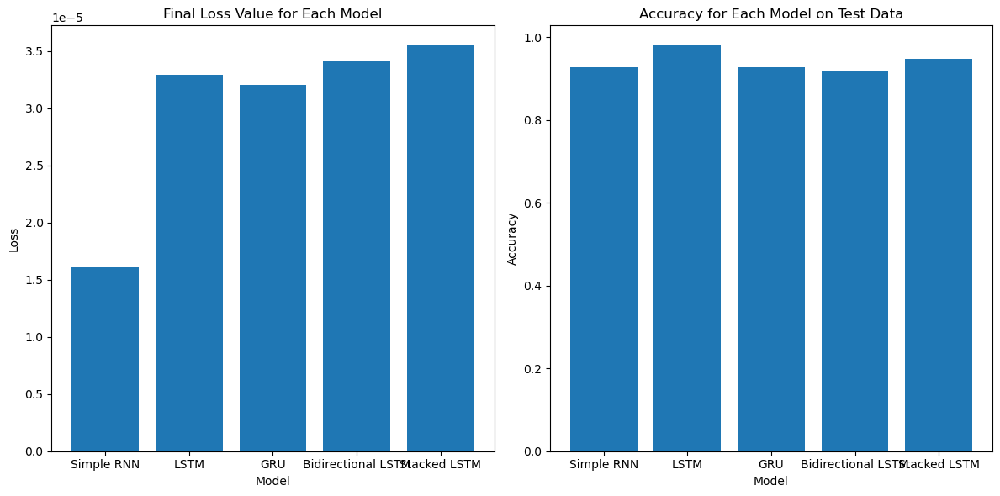

In [62]:
import matplotlib.pyplot as plt

# Your code for training and evaluation goes here...

# Lists to store loss and accuracy values for each model
loss_values = []
accuracy_values = []

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=0)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")
    
    # Store the final loss and accuracy values
    loss_values.append(history.history['loss'][-1])
    accuracy_values.append(accuracy)

# Plot loss values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(model_names, loss_values)
plt.title('Final Loss Value for Each Model')
plt.xlabel('Model')
plt.ylabel('Loss')

# Plot accuracy values
plt.subplot(1, 2, 2)
plt.bar(model_names, accuracy_values)
plt.title('Accuracy for Each Model on Test Data')
plt.xlabel('Model')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()


Training Simple RNN...
3/3 [==============================] - 0s 8ms/step - loss: 0.5669 - accuracy: 0.8958
Simple RNN Accuracy: 89.58%
Training LSTM...
3/3 [==============================] - 0s 4ms/step - loss: 0.2836 - accuracy: 0.9583
LSTM Accuracy: 95.83%
Training GRU...
3/3 [==============================] - 0s 3ms/step - loss: 0.8787 - accuracy: 0.9062
GRU Accuracy: 90.62%
Training Bidirectional LSTM...
3/3 [==============================] - 0s 5ms/step - loss: 0.3373 - accuracy: 0.9479
Bidirectional LSTM Accuracy: 94.79%
Training Stacked LSTM...
3/3 [==============================] - 0s 5ms/step - loss: 0.2683 - accuracy: 0.9375
Stacked LSTM Accuracy: 93.75%


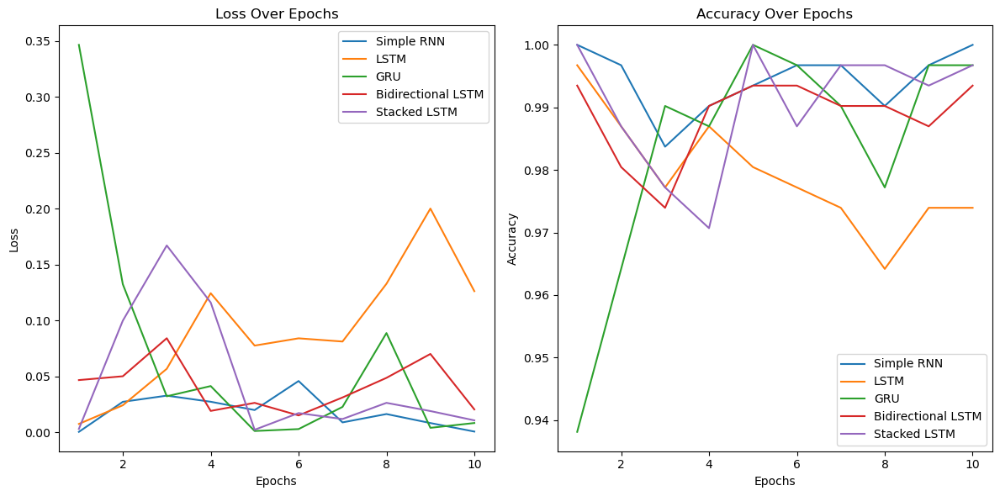

In [64]:
import matplotlib.pyplot as plt
import numpy as np

models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]
# Initialize lists to store loss and accuracy values for each model
loss_values = []
accuracy_values = []

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2, verbose=0)
    
    # Evaluate the model
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")
    
    # Store loss and accuracy values
    loss_values.append(history.history['loss'])
    accuracy_values.append(history.history['accuracy'])

# Plot loss values for all models
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for i in range(len(models)):
    plt.plot(np.arange(1, 11), loss_values[i], label=model_names[i])
    plt.title('Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

# Plot accuracy values for all models
plt.subplot(1, 2, 2)
for i in range(len(models)):
    plt.plot(np.arange(1, 11), accuracy_values[i], label=model_names[i])
    plt.title('Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

plt.tight_layout()
plt.show()

In [70]:
# Create a simple RNN model
model_simple_rnn = Sequential([
    SimpleRNN(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Model Training
model_simple_rnn.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_simple_rnn = model_simple_rnn.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

Epoch 1/100
10/10 [==============================] - 1s 47ms/step - loss: 0.9921 - accuracy: 0.5668 - val_loss: 0.8826 - val_accuracy: 0.6364
Epoch 2/100
10/10 [==============================] - 0s 31ms/step - loss: 0.6917 - accuracy: 0.8176 - val_loss: 0.6169 - val_accuracy: 0.8182
Epoch 3/100
10/10 [==============================] - 0s 35ms/step - loss: 0.4864 - accuracy: 0.8697 - val_loss: 0.4886 - val_accuracy: 0.8312
Epoch 4/100
10/10 [==============================] - 0s 36ms/step - loss: 0.3707 - accuracy: 0.8990 - val_loss: 0.4105 - val_accuracy: 0.8312
Epoch 5/100
10/10 [==============================] - 0s 37ms/step - loss: 0.3263 - accuracy: 0.8827 - val_loss: 0.4462 - val_accuracy: 0.8312
Epoch 6/100
10/10 [==============================] - 0s 35ms/step - loss: 0.2830 - accuracy: 0.9055 - val_loss: 0.3492 - val_accuracy: 0.8571
Epoch 7/100
10/10 [==============================] - 0s 35ms/step - loss: 0.2151 - accuracy: 0.9316 - val_loss: 0.3442 - val_accuracy: 0.8312
Epoch 

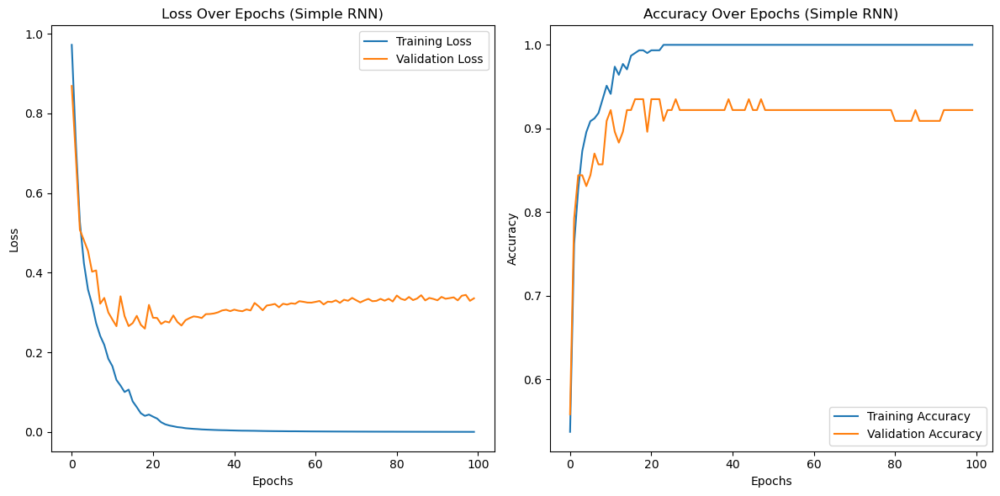

In [69]:
# Plot loss and accuracy over epochs
plt.figure(figsize=(12, 6))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history_simple_rnn.history['loss'], label='Training Loss')
plt.plot(history_simple_rnn.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs (Simple RNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history_simple_rnn.history['accuracy'], label='Training Accuracy')
plt.plot(history_simple_rnn.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs (Simple RNN)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/100
10/10 [==============================] - 1s 42ms/step - loss: 0.9109 - accuracy: 0.5863 - val_loss: 0.8683 - val_accuracy: 0.5455
Epoch 2/100
10/10 [==============================] - 0s 30ms/step - loss: 0.6992 - accuracy: 0.7264 - val_loss: 0.7949 - val_accuracy: 0.6364
Epoch 3/100
10/10 [==============================] - 0s 30ms/step - loss: 0.6099 - accuracy: 0.7915 - val_loss: 0.7250 - val_accuracy: 0.7273
Epoch 4/100
10/10 [==============================] - 0s 30ms/step - loss: 0.5314 - accuracy: 0.8306 - val_loss: 0.6849 - val_accuracy: 0.7403
Epoch 5/100
10/10 [==============================] - 0s 32ms/step - loss: 0.4674 - accuracy: 0.8371 - val_loss: 0.6086 - val_accuracy: 0.7922
Epoch 6/100
10/10 [==============================] - 0s 31ms/step - loss: 0.4504 - accuracy: 0.8436 - val_loss: 0.5883 - val_accuracy: 0.7922
Epoch 7/100
10/10 [==============================] - 0s 30ms/step - loss: 0.4124 - accuracy: 0.8567 - val_loss: 0.5558 - val_accuracy: 0.8052
Epoch 

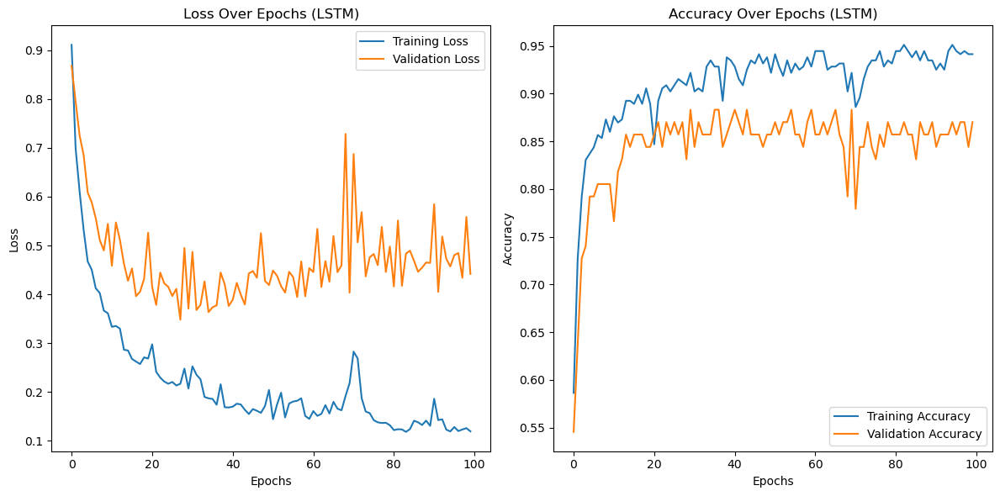

In [41]:
# Create a LSTM model
model_lstm = Sequential([
    SimpleRNN(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Model Training
model_lstm.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_lstm = model_lstm.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# Model Evaluation
loss, accuracy = model_lstm.evaluate(X_test, y_test)
print(f"Simple LSTM Accuracy: {accuracy * 100:.2f}%")


# Plot loss and accuracy over epochs
plt.figure(figsize=(12, 6))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history_lstm.history['loss'], label='Training Loss')
plt.plot(history_lstm.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs (LSTM)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history_lstm.history['accuracy'], label='Training Accuracy')
plt.plot(history_lstm.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs (LSTM)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/100
10/10 [==============================] - 1s 42ms/step - loss: 0.9384 - accuracy: 0.5831 - val_loss: 0.9216 - val_accuracy: 0.5584
Epoch 2/100
10/10 [==============================] - 0s 30ms/step - loss: 0.7548 - accuracy: 0.6906 - val_loss: 0.8225 - val_accuracy: 0.6104
Epoch 3/100
10/10 [==============================] - 0s 30ms/step - loss: 0.6582 - accuracy: 0.7427 - val_loss: 0.8480 - val_accuracy: 0.5974
Epoch 4/100
10/10 [==============================] - 0s 30ms/step - loss: 0.6254 - accuracy: 0.7427 - val_loss: 0.7639 - val_accuracy: 0.6623
Epoch 5/100
10/10 [==============================] - 0s 30ms/step - loss: 0.6151 - accuracy: 0.7264 - val_loss: 0.7924 - val_accuracy: 0.6364
Epoch 6/100
10/10 [==============================] - 0s 29ms/step - loss: 0.5664 - accuracy: 0.7459 - val_loss: 0.7779 - val_accuracy: 0.6364
Epoch 7/100
10/10 [==============================] - 0s 30ms/step - loss: 0.5454 - accuracy: 0.7687 - val_loss: 0.7242 - val_accuracy: 0.6234
Epoch 

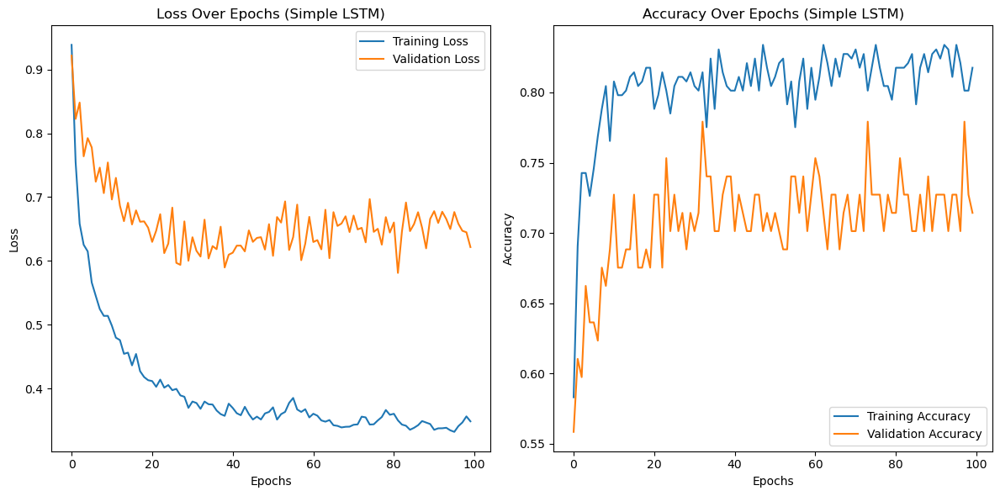

In [42]:
# Create a GRU model
model_gru = Sequential([
    SimpleRNN(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Model Training
model_gru.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_gru = model_gru.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# Model Evaluation
loss, accuracy = model_gru.evaluate(X_test, y_test)
print(f"Simple LSTM Accuracy: {accuracy * 100:.2f}%")


# Plot loss and accuracy over epochs
plt.figure(figsize=(12, 6))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history_gru.history['loss'], label='Training Loss')
plt.plot(history_gru.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs (Simple LSTM)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history_gru.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs (Simple LSTM)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/100
10/10 [==============================] - 2s 51ms/step - loss: 1.0515 - accuracy: 0.4886 - val_loss: 0.9206 - val_accuracy: 0.6494
Epoch 2/100
10/10 [==============================] - 0s 10ms/step - loss: 0.8442 - accuracy: 0.6710 - val_loss: 0.7634 - val_accuracy: 0.7532
Epoch 3/100
10/10 [==============================] - 0s 10ms/step - loss: 0.6568 - accuracy: 0.8632 - val_loss: 0.5625 - val_accuracy: 0.8831
Epoch 4/100
10/10 [==============================] - 0s 10ms/step - loss: 0.4842 - accuracy: 0.8762 - val_loss: 0.4108 - val_accuracy: 0.8442
Epoch 5/100
10/10 [==============================] - 0s 10ms/step - loss: 0.3406 - accuracy: 0.8860 - val_loss: 0.2495 - val_accuracy: 0.9221
Epoch 6/100
10/10 [==============================] - 0s 10ms/step - loss: 0.2285 - accuracy: 0.9316 - val_loss: 0.1909 - val_accuracy: 0.9351
Epoch 7/100
10/10 [==============================] - 0s 10ms/step - loss: 0.1838 - accuracy: 0.9414 - val_loss: 0.1243 - val_accuracy: 0.9740
Epoch 

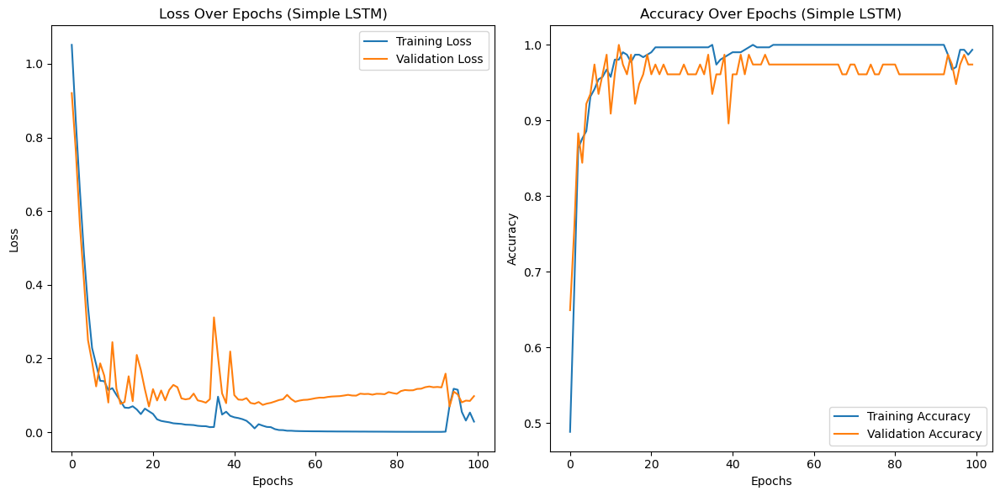

In [43]:
# Create a  Bi_LSTM model
model_bidirectional_lstm = Sequential([
    Bidirectional(LSTM(64), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Model Training
model_bidirectional_lstm.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_bidirectional_lstm = model_bidirectional_lstm.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# Model Evaluation
loss, accuracy = model_bidirectional_lstm.evaluate(X_test, y_test)
print(f"Simple LSTM Accuracy: {accuracy * 100:.2f}%")


# Plot loss and accuracy over epochs
plt.figure(figsize=(12, 6))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history_bidirectional_lstm.history['loss'], label='Training Loss')
plt.plot(history_bidirectional_lstm.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs (Simple LSTM)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history_bidirectional_lstm.history['accuracy'], label='Training Accuracy')
plt.plot(history_bidirectional_lstm.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs (Simple LSTM)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/100
10/10 [==============================] - 2s 42ms/step - loss: 1.1300e-07 - accuracy: 1.0000 - val_loss: 0.7314 - val_accuracy: 0.9610
Epoch 2/100
10/10 [==============================] - 0s 15ms/step - loss: 2.3842e-07 - accuracy: 1.0000 - val_loss: 0.7820 - val_accuracy: 0.9481
Epoch 3/100
10/10 [==============================] - 0s 15ms/step - loss: 5.4633e-07 - accuracy: 1.0000 - val_loss: 0.8045 - val_accuracy: 0.9610
Epoch 4/100
10/10 [==============================] - 0s 15ms/step - loss: 1.3601e-06 - accuracy: 1.0000 - val_loss: 0.8238 - val_accuracy: 0.9481
Epoch 5/100
10/10 [==============================] - 0s 15ms/step - loss: 1.9629e-05 - accuracy: 1.0000 - val_loss: 1.1837 - val_accuracy: 0.9091
Epoch 6/100
10/10 [==============================] - 0s 15ms/step - loss: 0.0034 - accuracy: 1.0000 - val_loss: 1.5064 - val_accuracy: 0.8961
Epoch 7/100
10/10 [==============================] - 0s 15ms/step - loss: 0.0964 - accuracy: 0.9837 - val_loss: 0.8337 - val_acc

Epoch 57/100
10/10 [==============================] - 0s 15ms/step - loss: 3.6544e-05 - accuracy: 1.0000 - val_loss: 0.6465 - val_accuracy: 0.9481
Epoch 58/100
10/10 [==============================] - 0s 15ms/step - loss: 3.9069e-05 - accuracy: 1.0000 - val_loss: 0.6472 - val_accuracy: 0.9481
Epoch 59/100
10/10 [==============================] - 0s 15ms/step - loss: 2.9905e-05 - accuracy: 1.0000 - val_loss: 0.6473 - val_accuracy: 0.9481
Epoch 60/100
10/10 [==============================] - 0s 15ms/step - loss: 3.1708e-05 - accuracy: 1.0000 - val_loss: 0.6480 - val_accuracy: 0.9481
Epoch 61/100
10/10 [==============================] - 0s 15ms/step - loss: 4.7048e-05 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 0.9481
Epoch 62/100
10/10 [==============================] - 0s 15ms/step - loss: 2.4744e-05 - accuracy: 1.0000 - val_loss: 0.6494 - val_accuracy: 0.9351
Epoch 63/100
10/10 [==============================] - 0s 15ms/step - loss: 3.1704e-05 - accuracy: 1.0000 - val_loss: 0

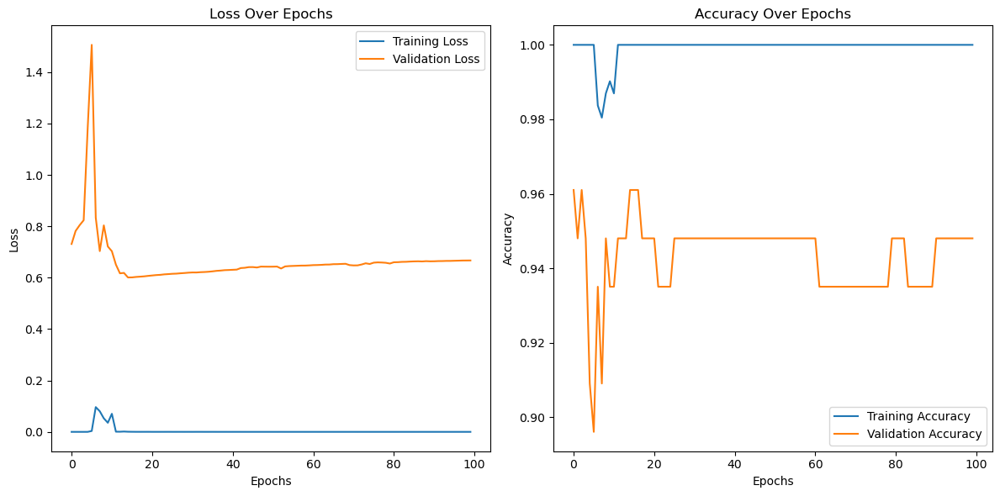

In [44]:
# Transformer
# Model Training
model_transformer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model_transformer.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# Model Evaluation
loss, accuracy = model_transformer.evaluate(X_test, y_test)
print(f"Transformer Accuracy: {accuracy * 100:.2f}%")

# Plot loss and accuracy over epochs
plt.figure(figsize=(12, 6))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

### With Mel-spectrogram Feature

In [45]:
import os
import numpy as np
import librosa

# Load the dataset
data_path = "Dataset"  # Replace with the path to your dataset
labels = ["MR", "MS", "normal"]
X = []
y = []

for label in labels:
    folder_path = os.path.join(data_path, label)
    for file in os.listdir(folder_path):
        if file.endswith(".wav"):
            # Load the WAV file using librosa
            file_path = os.path.join(folder_path, file)
            y_data, sr = librosa.load(file_path, sr=None)
            
            # Extract Mel-spectrogram features from the audio signal
            mel_spectrogram = librosa.feature.melspectrogram(y=y_data, sr=sr, n_mels=128)  # Adjust n_mels as needed
            log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
            
            X.append(log_mel_spectrogram.T)
            y.append(labels.index(label))

# Determine the maximum sequence length
max_length = max([len(features) for features in X])

# Pad each sequence to the maximum length
X_padded = []

for features in X:
    pad_width = max_length - len(features)
    padded_features = np.pad(features, ((0, pad_width), (0, 0)), mode='constant')
    X_padded.append(padded_features)

# Convert the padded list to a numpy array
X = np.array(X_padded)
y = np.array(y)

# Split the dataset into training and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [46]:
# Simple RNN
model_simple_rnn = Sequential([
    SimpleRNN(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# LSTM
model_lstm = Sequential([
    LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# GRU
model_gru = Sequential([
    GRU(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Bidirectional LSTM
model_bidirectional_lstm = Sequential([
    Bidirectional(LSTM(64), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Stacked LSTM
model_stacked_lstm = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(64),
    Dense(3, activation='softmax')
])

In [47]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/10
10/10 [==============================] - 1s 43ms/step - loss: 0.9758 - accuracy: 0.4853 - val_loss: 0.8782 - val_accuracy: 0.5584
Epoch 2/10
10/10 [==============================] - 0s 29ms/step - loss: 0.7796 - accuracy: 0.6808 - val_loss: 0.8235 - val_accuracy: 0.5844
Epoch 3/10
10/10 [==============================] - 0s 30ms/step - loss: 0.7013 - accuracy: 0.6775 - val_loss: 0.7776 - val_accuracy: 0.6104
Epoch 4/10
10/10 [==============================] - 0s 30ms/step - loss: 0.6590 - accuracy: 0.7264 - val_loss: 0.7598 - val_accuracy: 0.6234
Epoch 5/10
10/10 [==============================] - 0s 29ms/step - loss: 0.6083 - accuracy: 0.7394 - val_loss: 0.7162 - val_accuracy: 0.6364
Epoch 6/10
10/10 [==============================] - 0s 29ms/step - loss: 0.5976 - accuracy: 0.7687 - val_loss: 0.7376 - val_accuracy: 0.6364
Epoch 7/10
10/10 [==============================] - 0s 30ms/step - loss: 0.5751 - accuracy: 0.7362 - val_loss: 0.7018 - val_accurac

In [48]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/100
10/10 [==============================] - 1s 48ms/step - loss: 0.5616 - accuracy: 0.7427 - val_loss: 0.6593 - val_accuracy: 0.6883
Epoch 2/100
10/10 [==============================] - 0s 35ms/step - loss: 0.5242 - accuracy: 0.7590 - val_loss: 0.7040 - val_accuracy: 0.6753
Epoch 3/100
10/10 [==============================] - 0s 34ms/step - loss: 0.5137 - accuracy: 0.8013 - val_loss: 0.6366 - val_accuracy: 0.6623
Epoch 4/100
10/10 [==============================] - 0s 35ms/step - loss: 0.4758 - accuracy: 0.8046 - val_loss: 0.6193 - val_accuracy: 0.7532
Epoch 5/100
10/10 [==============================] - 0s 34ms/step - loss: 0.4631 - accuracy: 0.8371 - val_loss: 0.6239 - val_accuracy: 0.7662
Epoch 6/100
10/10 [==============================] - 0s 35ms/step - loss: 0.4752 - accuracy: 0.8143 - val_loss: 0.5696 - val_accuracy: 0.7792
Epoch 7/100
10/10 [==============================] - 0s 34ms/step - loss: 0.4480 - accuracy: 0.8208 - val_loss: 0.6144 - val_

10/10 [==============================] - 0s 11ms/step - loss: 0.0981 - accuracy: 0.9739 - val_loss: 0.1730 - val_accuracy: 0.9481
Epoch 15/100
10/10 [==============================] - 0s 11ms/step - loss: 0.0862 - accuracy: 0.9772 - val_loss: 0.1384 - val_accuracy: 0.9610
Epoch 16/100
10/10 [==============================] - 0s 11ms/step - loss: 0.0879 - accuracy: 0.9772 - val_loss: 0.1872 - val_accuracy: 0.9610
Epoch 17/100
10/10 [==============================] - 0s 11ms/step - loss: 0.1095 - accuracy: 0.9642 - val_loss: 0.1548 - val_accuracy: 0.9610
Epoch 18/100
10/10 [==============================] - 0s 11ms/step - loss: 0.2394 - accuracy: 0.9218 - val_loss: 0.1847 - val_accuracy: 0.9351
Epoch 19/100
10/10 [==============================] - 0s 11ms/step - loss: 0.2734 - accuracy: 0.8664 - val_loss: 0.2703 - val_accuracy: 0.8961
Epoch 20/100
10/10 [==============================] - 0s 11ms/step - loss: 0.1899 - accuracy: 0.9283 - val_loss: 0.1810 - val_accuracy: 0.9481
Epoch 21/100

Epoch 28/100
10/10 [==============================] - 0s 7ms/step - loss: 0.5014 - accuracy: 0.7883 - val_loss: 0.6829 - val_accuracy: 0.6494
Epoch 29/100
10/10 [==============================] - 0s 8ms/step - loss: 0.4994 - accuracy: 0.7915 - val_loss: 0.6882 - val_accuracy: 0.6494
Epoch 30/100
10/10 [==============================] - 0s 8ms/step - loss: 0.4901 - accuracy: 0.7980 - val_loss: 0.7101 - val_accuracy: 0.6364
Epoch 31/100
10/10 [==============================] - 0s 8ms/step - loss: 0.5280 - accuracy: 0.7850 - val_loss: 0.7046 - val_accuracy: 0.6364
Epoch 32/100
10/10 [==============================] - 0s 7ms/step - loss: 0.5900 - accuracy: 0.7557 - val_loss: 0.7627 - val_accuracy: 0.6364
Epoch 33/100
10/10 [==============================] - 0s 8ms/step - loss: 0.6523 - accuracy: 0.7264 - val_loss: 0.8363 - val_accuracy: 0.6883
Epoch 34/100
10/10 [==============================] - 0s 8ms/step - loss: 0.5797 - accuracy: 0.7622 - val_loss: 0.7756 - val_accuracy: 0.6104
Epoch 

Epoch 86/100
10/10 [==============================] - 0s 8ms/step - loss: 0.3878 - accuracy: 0.8664 - val_loss: 0.4543 - val_accuracy: 0.8571
Epoch 87/100
10/10 [==============================] - 0s 8ms/step - loss: 0.4071 - accuracy: 0.8502 - val_loss: 0.4913 - val_accuracy: 0.7922
Epoch 88/100
10/10 [==============================] - 0s 8ms/step - loss: 0.4069 - accuracy: 0.8339 - val_loss: 0.4363 - val_accuracy: 0.8571
Epoch 89/100
10/10 [==============================] - 0s 8ms/step - loss: 0.4129 - accuracy: 0.8469 - val_loss: 0.5301 - val_accuracy: 0.7792
Epoch 90/100
10/10 [==============================] - 0s 8ms/step - loss: 0.4048 - accuracy: 0.8371 - val_loss: 0.5201 - val_accuracy: 0.7922
Epoch 91/100
10/10 [==============================] - 0s 7ms/step - loss: 0.3741 - accuracy: 0.8404 - val_loss: 0.4416 - val_accuracy: 0.8442
Epoch 92/100
10/10 [==============================] - 0s 8ms/step - loss: 0.3626 - accuracy: 0.8730 - val_loss: 0.5628 - val_accuracy: 0.7922
Epoch 

10/10 [==============================] - 0s 13ms/step - loss: 0.1462 - accuracy: 0.9349 - val_loss: 0.0844 - val_accuracy: 0.9610
Epoch 100/100
3/3 [==============================] - 0s 6ms/step - loss: 0.2106 - accuracy: 0.9167
Bidirectional LSTM Accuracy: 91.67%
Training Stacked LSTM...
Epoch 1/100
10/10 [==============================] - 2s 52ms/step - loss: 0.4325 - accuracy: 0.8795 - val_loss: 0.3639 - val_accuracy: 0.8442
Epoch 2/100
10/10 [==============================] - 0s 11ms/step - loss: 0.2072 - accuracy: 0.9349 - val_loss: 0.2429 - val_accuracy: 0.9481
Epoch 3/100
10/10 [==============================] - 0s 12ms/step - loss: 0.1480 - accuracy: 0.9544 - val_loss: 0.1380 - val_accuracy: 0.9481
Epoch 4/100
10/10 [==============================] - 0s 12ms/step - loss: 0.1152 - accuracy: 0.9642 - val_loss: 0.1664 - val_accuracy: 0.9610
Epoch 5/100
10/10 [==============================] - 0s 11ms/step - loss: 0.1560 - accuracy: 0.9511 - val_loss: 0.4973 - val_accuracy: 0.8701


In [49]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/250
10/10 [==============================] - 1s 47ms/step - loss: 0.5009 - accuracy: 0.7622 - val_loss: 0.5208 - val_accuracy: 0.7922
Epoch 2/250
10/10 [==============================] - 0s 39ms/step - loss: 0.4879 - accuracy: 0.7948 - val_loss: 0.7580 - val_accuracy: 0.6494
Epoch 3/250
10/10 [==============================] - 0s 39ms/step - loss: 0.4522 - accuracy: 0.7687 - val_loss: 0.5063 - val_accuracy: 0.8182
Epoch 4/250
10/10 [==============================] - 0s 39ms/step - loss: 0.3818 - accuracy: 0.8306 - val_loss: 0.5415 - val_accuracy: 0.7273
Epoch 5/250
10/10 [==============================] - 0s 38ms/step - loss: 0.3458 - accuracy: 0.8436 - val_loss: 0.4751 - val_accuracy: 0.8182
Epoch 6/250
10/10 [==============================] - 0s 39ms/step - loss: 0.3890 - accuracy: 0.8404 - val_loss: 0.5761 - val_accuracy: 0.7532
Epoch 7/250
10/10 [==============================] - 0s 34ms/step - loss: 0.3528 - accuracy: 0.8534 - val_loss: 0.5004 - val_

10/10 [==============================] - 0s 34ms/step - loss: 0.4736 - accuracy: 0.7785 - val_loss: 0.7050 - val_accuracy: 0.6494
Epoch 116/250
10/10 [==============================] - 0s 35ms/step - loss: 0.4716 - accuracy: 0.7785 - val_loss: 0.7178 - val_accuracy: 0.6494
Epoch 117/250
10/10 [==============================] - 0s 37ms/step - loss: 0.4746 - accuracy: 0.7524 - val_loss: 0.7028 - val_accuracy: 0.6494
Epoch 118/250
10/10 [==============================] - 0s 38ms/step - loss: 0.4728 - accuracy: 0.7752 - val_loss: 0.7089 - val_accuracy: 0.6494
Epoch 119/250
10/10 [==============================] - 0s 36ms/step - loss: 0.4715 - accuracy: 0.7785 - val_loss: 0.7019 - val_accuracy: 0.6494
Epoch 120/250
10/10 [==============================] - 0s 36ms/step - loss: 0.4712 - accuracy: 0.7590 - val_loss: 0.7147 - val_accuracy: 0.6494
Epoch 121/250
10/10 [==============================] - 0s 35ms/step - loss: 0.4727 - accuracy: 0.7687 - val_loss: 0.7182 - val_accuracy: 0.6494
Epoch 

Epoch 172/250
10/10 [==============================] - 0s 35ms/step - loss: 0.3713 - accuracy: 0.8339 - val_loss: 0.5984 - val_accuracy: 0.7922
Epoch 173/250
10/10 [==============================] - 0s 34ms/step - loss: 0.3754 - accuracy: 0.8469 - val_loss: 0.5353 - val_accuracy: 0.8312
Epoch 174/250
10/10 [==============================] - 0s 34ms/step - loss: 0.3892 - accuracy: 0.8241 - val_loss: 0.7211 - val_accuracy: 0.6883
Epoch 175/250
10/10 [==============================] - 0s 34ms/step - loss: 0.5549 - accuracy: 0.7362 - val_loss: 0.6888 - val_accuracy: 0.7143
Epoch 176/250
10/10 [==============================] - 0s 34ms/step - loss: 0.4555 - accuracy: 0.7785 - val_loss: 0.6275 - val_accuracy: 0.7013
Epoch 177/250
10/10 [==============================] - 0s 34ms/step - loss: 0.4020 - accuracy: 0.8143 - val_loss: 0.6073 - val_accuracy: 0.6883
Epoch 178/250
10/10 [==============================] - 0s 35ms/step - loss: 0.3744 - accuracy: 0.8176 - val_loss: 0.6028 - val_accuracy:

Epoch 229/250
10/10 [==============================] - 0s 34ms/step - loss: 0.4608 - accuracy: 0.7818 - val_loss: 0.7102 - val_accuracy: 0.6494
Epoch 230/250
10/10 [==============================] - 0s 34ms/step - loss: 0.4676 - accuracy: 0.7818 - val_loss: 0.7321 - val_accuracy: 0.6494
Epoch 231/250
10/10 [==============================] - 0s 34ms/step - loss: 0.4574 - accuracy: 0.7752 - val_loss: 0.7133 - val_accuracy: 0.6494
Epoch 232/250
10/10 [==============================] - 0s 38ms/step - loss: 0.4600 - accuracy: 0.7720 - val_loss: 0.7265 - val_accuracy: 0.6494
Epoch 233/250
10/10 [==============================] - 0s 38ms/step - loss: 0.4571 - accuracy: 0.7818 - val_loss: 0.7273 - val_accuracy: 0.6494
Epoch 234/250
10/10 [==============================] - 0s 38ms/step - loss: 0.4591 - accuracy: 0.7655 - val_loss: 0.7234 - val_accuracy: 0.6494
Epoch 235/250
10/10 [==============================] - 0s 37ms/step - loss: 0.4620 - accuracy: 0.7818 - val_loss: 0.7230 - val_accuracy:

10/10 [==============================] - 0s 11ms/step - loss: 0.0158 - accuracy: 0.9902 - val_loss: 0.1142 - val_accuracy: 0.9870
Epoch 93/250
10/10 [==============================] - 0s 12ms/step - loss: 0.0161 - accuracy: 0.9935 - val_loss: 0.1178 - val_accuracy: 0.9870
Epoch 94/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0156 - accuracy: 0.9935 - val_loss: 0.1126 - val_accuracy: 0.9870
Epoch 95/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0158 - accuracy: 0.9935 - val_loss: 0.1074 - val_accuracy: 0.9740
Epoch 96/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0154 - accuracy: 1.0000 - val_loss: 0.1172 - val_accuracy: 0.9870
Epoch 97/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0170 - accuracy: 0.9935 - val_loss: 0.1224 - val_accuracy: 0.9740
Epoch 98/250
10/10 [==============================] - 0s 12ms/step - loss: 0.0212 - accuracy: 0.9967 - val_loss: 0.0960 - val_accuracy: 0.9740
Epoch 99/250

10/10 [==============================] - 0s 10ms/step - loss: 0.0474 - accuracy: 0.9870 - val_loss: 0.1326 - val_accuracy: 0.9610
Epoch 150/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0501 - accuracy: 0.9870 - val_loss: 0.1389 - val_accuracy: 0.9610
Epoch 151/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0501 - accuracy: 0.9870 - val_loss: 0.1349 - val_accuracy: 0.9610
Epoch 152/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0471 - accuracy: 0.9870 - val_loss: 0.1328 - val_accuracy: 0.9610
Epoch 153/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0476 - accuracy: 0.9870 - val_loss: 0.1462 - val_accuracy: 0.9610
Epoch 154/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0509 - accuracy: 0.9870 - val_loss: 0.1398 - val_accuracy: 0.9610
Epoch 155/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0482 - accuracy: 0.9870 - val_loss: 0.1467 - val_accuracy: 0.9610
Epoch 

10/10 [==============================] - 0s 10ms/step - loss: 0.0976 - accuracy: 0.9739 - val_loss: 0.1308 - val_accuracy: 0.9481
Epoch 207/250
10/10 [==============================] - 0s 10ms/step - loss: 0.1455 - accuracy: 0.9511 - val_loss: 0.1137 - val_accuracy: 0.9740
Epoch 208/250
10/10 [==============================] - 0s 10ms/step - loss: 0.1313 - accuracy: 0.9609 - val_loss: 0.2187 - val_accuracy: 0.9351
Epoch 209/250
10/10 [==============================] - 0s 9ms/step - loss: 0.1422 - accuracy: 0.9511 - val_loss: 0.1482 - val_accuracy: 0.9481
Epoch 210/250
10/10 [==============================] - 0s 10ms/step - loss: 0.1607 - accuracy: 0.9479 - val_loss: 0.1121 - val_accuracy: 0.9610
Epoch 211/250
10/10 [==============================] - 0s 10ms/step - loss: 0.1055 - accuracy: 0.9707 - val_loss: 0.1334 - val_accuracy: 0.9610
Epoch 212/250
10/10 [==============================] - 0s 10ms/step - loss: 0.0676 - accuracy: 0.9870 - val_loss: 0.1311 - val_accuracy: 0.9610
Epoch 2

10/10 [==============================] - 0s 10ms/step - loss: 0.3452 - accuracy: 0.8534 - val_loss: 0.3927 - val_accuracy: 0.8571
Epoch 70/250
10/10 [==============================] - 0s 10ms/step - loss: 0.2919 - accuracy: 0.8860 - val_loss: 0.3486 - val_accuracy: 0.8571
Epoch 71/250
10/10 [==============================] - 0s 9ms/step - loss: 0.3074 - accuracy: 0.8632 - val_loss: 0.4095 - val_accuracy: 0.8442
Epoch 72/250
10/10 [==============================] - 0s 10ms/step - loss: 0.3269 - accuracy: 0.8534 - val_loss: 0.3221 - val_accuracy: 0.8571
Epoch 73/250
10/10 [==============================] - 0s 10ms/step - loss: 0.3096 - accuracy: 0.8762 - val_loss: 0.3231 - val_accuracy: 0.8701
Epoch 74/250
10/10 [==============================] - 0s 9ms/step - loss: 0.3011 - accuracy: 0.8730 - val_loss: 0.3744 - val_accuracy: 0.8571
Epoch 75/250
10/10 [==============================] - 0s 10ms/step - loss: 0.2915 - accuracy: 0.8697 - val_loss: 0.3188 - val_accuracy: 0.8701
Epoch 76/250
1

10/10 [==============================] - 0s 10ms/step - loss: 0.2698 - accuracy: 0.8730 - val_loss: 0.3754 - val_accuracy: 0.8312
Epoch 184/250
10/10 [==============================] - 0s 9ms/step - loss: 0.2677 - accuracy: 0.8762 - val_loss: 0.3815 - val_accuracy: 0.7922
Epoch 185/250
10/10 [==============================] - 0s 9ms/step - loss: 0.2640 - accuracy: 0.8827 - val_loss: 0.3550 - val_accuracy: 0.8571
Epoch 186/250
10/10 [==============================] - 0s 9ms/step - loss: 0.2642 - accuracy: 0.9055 - val_loss: 0.4175 - val_accuracy: 0.8182
Epoch 187/250
10/10 [==============================] - 0s 10ms/step - loss: 0.3149 - accuracy: 0.8664 - val_loss: 0.4456 - val_accuracy: 0.8312
Epoch 188/250
10/10 [==============================] - 0s 10ms/step - loss: 0.2819 - accuracy: 0.8664 - val_loss: 0.3882 - val_accuracy: 0.8052
Epoch 189/250
10/10 [==============================] - 0s 9ms/step - loss: 0.3657 - accuracy: 0.8567 - val_loss: 0.4395 - val_accuracy: 0.8312
Epoch 190/

10/10 [==============================] - 0s 14ms/step - loss: 0.0088 - accuracy: 0.9935 - val_loss: 0.0399 - val_accuracy: 0.9740
Epoch 47/250
10/10 [==============================] - 0s 13ms/step - loss: 0.0086 - accuracy: 0.9935 - val_loss: 0.0379 - val_accuracy: 0.9740
Epoch 48/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0091 - accuracy: 0.9935 - val_loss: 0.0339 - val_accuracy: 0.9870
Epoch 49/250
10/10 [==============================] - 0s 13ms/step - loss: 0.0086 - accuracy: 0.9935 - val_loss: 0.0337 - val_accuracy: 0.9740
Epoch 50/250
10/10 [==============================] - 0s 13ms/step - loss: 0.0079 - accuracy: 0.9935 - val_loss: 0.0360 - val_accuracy: 0.9740
Epoch 51/250
10/10 [==============================] - 0s 13ms/step - loss: 0.0095 - accuracy: 0.9967 - val_loss: 0.0376 - val_accuracy: 0.9740
Epoch 52/250
10/10 [==============================] - 0s 13ms/step - loss: 0.0086 - accuracy: 0.9935 - val_loss: 0.0329 - val_accuracy: 0.9740
Epoch 53/250

10/10 [==============================] - 0s 14ms/step - loss: 2.6482e-04 - accuracy: 1.0000 - val_loss: 0.1027 - val_accuracy: 0.9740
Epoch 159/250
10/10 [==============================] - 0s 14ms/step - loss: 2.6070e-04 - accuracy: 1.0000 - val_loss: 0.1035 - val_accuracy: 0.9740
Epoch 160/250
10/10 [==============================] - 0s 14ms/step - loss: 2.5686e-04 - accuracy: 1.0000 - val_loss: 0.1060 - val_accuracy: 0.9740
Epoch 161/250
10/10 [==============================] - 0s 14ms/step - loss: 2.5181e-04 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9740
Epoch 162/250
10/10 [==============================] - 0s 14ms/step - loss: 2.5058e-04 - accuracy: 1.0000 - val_loss: 0.1088 - val_accuracy: 0.9740
Epoch 163/250
10/10 [==============================] - 0s 14ms/step - loss: 2.4528e-04 - accuracy: 1.0000 - val_loss: 0.1077 - val_accuracy: 0.9740
Epoch 164/250
10/10 [==============================] - 0s 14ms/step - loss: 2.4090e-04 - accuracy: 1.0000 - val_loss: 0.1075 -

10/10 [==============================] - 0s 14ms/step - loss: 0.0431 - accuracy: 0.9870 - val_loss: 0.0440 - val_accuracy: 0.9870
Epoch 19/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0275 - accuracy: 0.9935 - val_loss: 0.0343 - val_accuracy: 0.9870
Epoch 20/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0248 - accuracy: 0.9935 - val_loss: 0.0137 - val_accuracy: 1.0000
Epoch 21/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0215 - accuracy: 0.9967 - val_loss: 0.0266 - val_accuracy: 0.9870
Epoch 22/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0201 - accuracy: 0.9967 - val_loss: 0.0292 - val_accuracy: 0.9870
Epoch 23/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0185 - accuracy: 0.9967 - val_loss: 0.0331 - val_accuracy: 0.9870
Epoch 24/250
10/10 [==============================] - 0s 13ms/step - loss: 0.0183 - accuracy: 0.9967 - val_loss: 0.0334 - val_accuracy: 0.9870
Epoch 25/250

10/10 [==============================] - 0s 14ms/step - loss: 0.0179 - accuracy: 0.9967 - val_loss: 0.0406 - val_accuracy: 0.9870
Epoch 133/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0165 - accuracy: 0.9967 - val_loss: 0.0431 - val_accuracy: 0.9870
Epoch 134/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0142 - accuracy: 0.9967 - val_loss: 0.0413 - val_accuracy: 0.9870
Epoch 135/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0139 - accuracy: 0.9967 - val_loss: 0.0392 - val_accuracy: 0.9870
Epoch 136/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0132 - accuracy: 0.9967 - val_loss: 0.0401 - val_accuracy: 0.9870
Epoch 137/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0114 - accuracy: 0.9967 - val_loss: 0.0369 - val_accuracy: 0.9870
Epoch 138/250
10/10 [==============================] - 0s 14ms/step - loss: 0.0168 - accuracy: 0.9935 - val_loss: 0.0361 - val_accuracy: 0.9870
Epoch 

10/10 [==============================] - 0s 13ms/step - loss: 1.7798e-04 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9740
Epoch 244/250
10/10 [==============================] - 0s 13ms/step - loss: 1.7532e-04 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9740
Epoch 245/250
10/10 [==============================] - 0s 13ms/step - loss: 1.7272e-04 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9740
Epoch 246/250
10/10 [==============================] - 0s 13ms/step - loss: 1.7094e-04 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9740
Epoch 247/250
10/10 [==============================] - 0s 13ms/step - loss: 1.6885e-04 - accuracy: 1.0000 - val_loss: 0.0515 - val_accuracy: 0.9740
Epoch 248/250
10/10 [==============================] - 0s 13ms/step - loss: 1.6659e-04 - accuracy: 1.0000 - val_loss: 0.0516 - val_accuracy: 0.9740
Epoch 249/250
10/10 [==============================] - 0s 13ms/step - loss: 1.6466e-04 - accuracy: 1.0000 - val_loss: 0.0517 -

In [50]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/500
10/10 [==============================] - 1s 53ms/step - loss: 0.4873 - accuracy: 0.7720 - val_loss: 0.7247 - val_accuracy: 0.6494
Epoch 2/500
10/10 [==============================] - 0s 40ms/step - loss: 0.4762 - accuracy: 0.7818 - val_loss: 0.7250 - val_accuracy: 0.6494
Epoch 3/500
10/10 [==============================] - 0s 36ms/step - loss: 0.4814 - accuracy: 0.7687 - val_loss: 0.7319 - val_accuracy: 0.6494
Epoch 4/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4795 - accuracy: 0.7687 - val_loss: 0.7176 - val_accuracy: 0.6494
Epoch 5/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4807 - accuracy: 0.7752 - val_loss: 0.7038 - val_accuracy: 0.6494
Epoch 6/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4798 - accuracy: 0.7524 - val_loss: 0.7118 - val_accuracy: 0.6494
Epoch 7/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4820 - accuracy: 0.7655 - val_loss: 0.7137 - val_

10/10 [==============================] - 0s 35ms/step - loss: 0.4757 - accuracy: 0.7752 - val_loss: 0.7178 - val_accuracy: 0.6494
Epoch 116/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4782 - accuracy: 0.7752 - val_loss: 0.7094 - val_accuracy: 0.6494
Epoch 117/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4743 - accuracy: 0.7752 - val_loss: 0.7097 - val_accuracy: 0.6494
Epoch 118/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4784 - accuracy: 0.7492 - val_loss: 0.7135 - val_accuracy: 0.6494
Epoch 119/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4758 - accuracy: 0.7785 - val_loss: 0.7129 - val_accuracy: 0.6494
Epoch 120/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4773 - accuracy: 0.7752 - val_loss: 0.7140 - val_accuracy: 0.6494
Epoch 121/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4775 - accuracy: 0.7752 - val_loss: 0.7197 - val_accuracy: 0.6494
Epoch 

Epoch 172/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4772 - accuracy: 0.7752 - val_loss: 0.7265 - val_accuracy: 0.6494
Epoch 173/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4781 - accuracy: 0.7752 - val_loss: 0.7074 - val_accuracy: 0.6494
Epoch 174/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4752 - accuracy: 0.7752 - val_loss: 0.7169 - val_accuracy: 0.6494
Epoch 175/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4761 - accuracy: 0.7752 - val_loss: 0.7135 - val_accuracy: 0.6494
Epoch 176/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4754 - accuracy: 0.7752 - val_loss: 0.7163 - val_accuracy: 0.6494
Epoch 177/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4771 - accuracy: 0.7720 - val_loss: 0.7127 - val_accuracy: 0.6494
Epoch 178/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4760 - accuracy: 0.7752 - val_loss: 0.7098 - val_accuracy:

Epoch 229/500
10/10 [==============================] - 0s 39ms/step - loss: 0.4743 - accuracy: 0.7752 - val_loss: 0.7147 - val_accuracy: 0.6494
Epoch 230/500
10/10 [==============================] - 0s 39ms/step - loss: 0.4747 - accuracy: 0.7752 - val_loss: 0.7084 - val_accuracy: 0.6494
Epoch 231/500
10/10 [==============================] - 0s 38ms/step - loss: 0.4745 - accuracy: 0.7752 - val_loss: 0.7088 - val_accuracy: 0.6494
Epoch 232/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4741 - accuracy: 0.7752 - val_loss: 0.7171 - val_accuracy: 0.6494
Epoch 233/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4746 - accuracy: 0.7752 - val_loss: 0.7197 - val_accuracy: 0.6494
Epoch 234/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4750 - accuracy: 0.7752 - val_loss: 0.7161 - val_accuracy: 0.6494
Epoch 235/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4753 - accuracy: 0.7557 - val_loss: 0.7152 - val_accuracy:

Epoch 286/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4763 - accuracy: 0.7752 - val_loss: 0.7186 - val_accuracy: 0.6494
Epoch 287/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4764 - accuracy: 0.7752 - val_loss: 0.7302 - val_accuracy: 0.6494
Epoch 288/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4737 - accuracy: 0.7752 - val_loss: 0.7129 - val_accuracy: 0.6494
Epoch 289/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4746 - accuracy: 0.7622 - val_loss: 0.7173 - val_accuracy: 0.6494
Epoch 290/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4758 - accuracy: 0.7720 - val_loss: 0.7057 - val_accuracy: 0.6494
Epoch 291/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4792 - accuracy: 0.7752 - val_loss: 0.7193 - val_accuracy: 0.6494
Epoch 292/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4753 - accuracy: 0.7752 - val_loss: 0.7095 - val_accuracy:

Epoch 343/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4757 - accuracy: 0.7752 - val_loss: 0.7195 - val_accuracy: 0.6494
Epoch 344/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4748 - accuracy: 0.7752 - val_loss: 0.7206 - val_accuracy: 0.6494
Epoch 345/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4744 - accuracy: 0.7655 - val_loss: 0.7169 - val_accuracy: 0.6494
Epoch 346/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4741 - accuracy: 0.7655 - val_loss: 0.7135 - val_accuracy: 0.6494
Epoch 347/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4749 - accuracy: 0.7752 - val_loss: 0.7085 - val_accuracy: 0.6494
Epoch 348/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4738 - accuracy: 0.7752 - val_loss: 0.7230 - val_accuracy: 0.6494
Epoch 349/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4755 - accuracy: 0.7752 - val_loss: 0.7252 - val_accuracy:

Epoch 400/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4743 - accuracy: 0.7752 - val_loss: 0.7268 - val_accuracy: 0.6494
Epoch 401/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4739 - accuracy: 0.7752 - val_loss: 0.7207 - val_accuracy: 0.6494
Epoch 402/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4740 - accuracy: 0.7752 - val_loss: 0.7164 - val_accuracy: 0.6494
Epoch 403/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4745 - accuracy: 0.7752 - val_loss: 0.7127 - val_accuracy: 0.6494
Epoch 404/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4741 - accuracy: 0.7752 - val_loss: 0.7210 - val_accuracy: 0.6494
Epoch 405/500
10/10 [==============================] - 0s 34ms/step - loss: 0.4730 - accuracy: 0.7752 - val_loss: 0.7185 - val_accuracy: 0.6494
Epoch 406/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4745 - accuracy: 0.7752 - val_loss: 0.7105 - val_accuracy:

Epoch 457/500
10/10 [==============================] - 0s 38ms/step - loss: 0.4742 - accuracy: 0.7752 - val_loss: 0.7117 - val_accuracy: 0.6494
Epoch 458/500
10/10 [==============================] - 0s 39ms/step - loss: 0.4757 - accuracy: 0.7752 - val_loss: 0.7218 - val_accuracy: 0.6494
Epoch 459/500
10/10 [==============================] - 0s 39ms/step - loss: 0.4755 - accuracy: 0.7752 - val_loss: 0.7153 - val_accuracy: 0.6494
Epoch 460/500
10/10 [==============================] - 0s 36ms/step - loss: 0.4730 - accuracy: 0.7752 - val_loss: 0.7203 - val_accuracy: 0.6494
Epoch 461/500
10/10 [==============================] - 0s 36ms/step - loss: 0.4742 - accuracy: 0.7752 - val_loss: 0.7239 - val_accuracy: 0.6494
Epoch 462/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4733 - accuracy: 0.7752 - val_loss: 0.7265 - val_accuracy: 0.6494
Epoch 463/500
10/10 [==============================] - 0s 35ms/step - loss: 0.4744 - accuracy: 0.7752 - val_loss: 0.7215 - val_accuracy:

Epoch 71/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0367 - accuracy: 0.9870 - val_loss: 0.1651 - val_accuracy: 0.9610
Epoch 72/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0364 - accuracy: 0.9870 - val_loss: 0.1625 - val_accuracy: 0.9610
Epoch 73/500
10/10 [==============================] - 0s 9ms/step - loss: 0.0384 - accuracy: 0.9870 - val_loss: 0.1666 - val_accuracy: 0.9610
Epoch 74/500
10/10 [==============================] - 0s 9ms/step - loss: 0.0355 - accuracy: 0.9870 - val_loss: 0.1634 - val_accuracy: 0.9610
Epoch 75/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0367 - accuracy: 0.9870 - val_loss: 0.1644 - val_accuracy: 0.9610
Epoch 76/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0363 - accuracy: 0.9870 - val_loss: 0.1667 - val_accuracy: 0.9610
Epoch 77/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0359 - accuracy: 0.9870 - val_loss: 0.1698 - val_accuracy: 0.9610
Epoch 

10/10 [==============================] - 0s 8ms/step - loss: 0.0241 - accuracy: 0.9870 - val_loss: 0.1855 - val_accuracy: 0.9610
Epoch 186/500
10/10 [==============================] - 0s 9ms/step - loss: 0.0225 - accuracy: 0.9837 - val_loss: 0.1837 - val_accuracy: 0.9610
Epoch 187/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0228 - accuracy: 0.9837 - val_loss: 0.1835 - val_accuracy: 0.9481
Epoch 188/500
10/10 [==============================] - 0s 9ms/step - loss: 0.0239 - accuracy: 0.9870 - val_loss: 0.1854 - val_accuracy: 0.9610
Epoch 189/500
10/10 [==============================] - 0s 9ms/step - loss: 0.0239 - accuracy: 0.9902 - val_loss: 0.1867 - val_accuracy: 0.9610
Epoch 190/500
10/10 [==============================] - 0s 9ms/step - loss: 0.0231 - accuracy: 0.9902 - val_loss: 0.1843 - val_accuracy: 0.9610
Epoch 191/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0235 - accuracy: 0.9837 - val_loss: 0.1841 - val_accuracy: 0.9610
Epoch 192/500

10/10 [==============================] - 0s 8ms/step - loss: 0.0224 - accuracy: 0.9902 - val_loss: 0.1592 - val_accuracy: 0.9610
Epoch 300/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0219 - accuracy: 0.9902 - val_loss: 0.1595 - val_accuracy: 0.9610
Epoch 301/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0241 - accuracy: 0.9870 - val_loss: 0.1610 - val_accuracy: 0.9610
Epoch 302/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0224 - accuracy: 0.9902 - val_loss: 0.1594 - val_accuracy: 0.9610
Epoch 303/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0235 - accuracy: 0.9902 - val_loss: 0.1617 - val_accuracy: 0.9610
Epoch 304/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0228 - accuracy: 0.9902 - val_loss: 0.1586 - val_accuracy: 0.9610
Epoch 305/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0218 - accuracy: 0.9902 - val_loss: 0.1591 - val_accuracy: 0.9610
Epoch 306/500

10/10 [==============================] - 0s 8ms/step - loss: 0.0545 - accuracy: 0.9772 - val_loss: 0.1231 - val_accuracy: 0.9610
Epoch 414/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0438 - accuracy: 0.9870 - val_loss: 0.1585 - val_accuracy: 0.9610
Epoch 415/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0369 - accuracy: 0.9870 - val_loss: 0.1344 - val_accuracy: 0.9610
Epoch 416/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0241 - accuracy: 0.9902 - val_loss: 0.1504 - val_accuracy: 0.9610
Epoch 417/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0240 - accuracy: 0.9837 - val_loss: 0.1568 - val_accuracy: 0.9481
Epoch 418/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0234 - accuracy: 0.9837 - val_loss: 0.1514 - val_accuracy: 0.9610
Epoch 419/500
10/10 [==============================] - 0s 8ms/step - loss: 0.0226 - accuracy: 0.9902 - val_loss: 0.1466 - val_accuracy: 0.9610
Epoch 420/500

10/10 [==============================] - 0s 10ms/step - loss: 0.2452 - accuracy: 0.8990 - val_loss: 0.3372 - val_accuracy: 0.8701
Epoch 27/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2332 - accuracy: 0.8925 - val_loss: 0.3359 - val_accuracy: 0.8571
Epoch 28/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2296 - accuracy: 0.9023 - val_loss: 0.3373 - val_accuracy: 0.8571
Epoch 29/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2336 - accuracy: 0.8925 - val_loss: 0.3454 - val_accuracy: 0.8571
Epoch 30/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2348 - accuracy: 0.8925 - val_loss: 0.3499 - val_accuracy: 0.8571
Epoch 31/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2400 - accuracy: 0.8860 - val_loss: 0.4680 - val_accuracy: 0.8182
Epoch 32/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2850 - accuracy: 0.8762 - val_loss: 0.4182 - val_accuracy: 0.8442
Epoch 33/500
10

10/10 [==============================] - 0s 9ms/step - loss: 0.2258 - accuracy: 0.8990 - val_loss: 0.3442 - val_accuracy: 0.8571
Epoch 141/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2255 - accuracy: 0.9023 - val_loss: 0.3421 - val_accuracy: 0.8571
Epoch 142/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2267 - accuracy: 0.8860 - val_loss: 0.3406 - val_accuracy: 0.8571
Epoch 143/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2390 - accuracy: 0.8925 - val_loss: 0.4266 - val_accuracy: 0.8312
Epoch 144/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2878 - accuracy: 0.8795 - val_loss: 0.4308 - val_accuracy: 0.8312
Epoch 145/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2674 - accuracy: 0.8925 - val_loss: 0.3610 - val_accuracy: 0.8571
Epoch 146/500
10/10 [==============================] - 0s 9ms/step - loss: 0.3353 - accuracy: 0.8762 - val_loss: 0.3905 - val_accuracy: 0.8571
Epoch 147

10/10 [==============================] - 0s 10ms/step - loss: 0.2244 - accuracy: 0.8958 - val_loss: 0.4075 - val_accuracy: 0.8571
Epoch 255/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2256 - accuracy: 0.8860 - val_loss: 0.4084 - val_accuracy: 0.8701
Epoch 256/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2245 - accuracy: 0.8860 - val_loss: 0.4032 - val_accuracy: 0.8571
Epoch 257/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2246 - accuracy: 0.8925 - val_loss: 0.4029 - val_accuracy: 0.8571
Epoch 258/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2229 - accuracy: 0.8958 - val_loss: 0.3976 - val_accuracy: 0.8571
Epoch 259/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2234 - accuracy: 0.8860 - val_loss: 0.3995 - val_accuracy: 0.8571
Epoch 260/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2227 - accuracy: 0.8958 - val_loss: 0.4031 - val_accuracy: 0.8571
Epoch 26

10/10 [==============================] - 0s 10ms/step - loss: 0.2212 - accuracy: 0.8958 - val_loss: 0.4874 - val_accuracy: 0.8442
Epoch 369/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2215 - accuracy: 0.8990 - val_loss: 0.4917 - val_accuracy: 0.8442
Epoch 370/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2228 - accuracy: 0.8958 - val_loss: 0.4864 - val_accuracy: 0.8442
Epoch 371/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2221 - accuracy: 0.8925 - val_loss: 0.4847 - val_accuracy: 0.8442
Epoch 372/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2231 - accuracy: 0.8990 - val_loss: 0.4905 - val_accuracy: 0.8442
Epoch 373/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2225 - accuracy: 0.8827 - val_loss: 0.4949 - val_accuracy: 0.8442
Epoch 374/500
10/10 [==============================] - 0s 11ms/step - loss: 0.2243 - accuracy: 0.8925 - val_loss: 0.4902 - val_accuracy: 0.8442
Epoch 37

10/10 [==============================] - 0s 10ms/step - loss: 0.2217 - accuracy: 0.8958 - val_loss: 0.5076 - val_accuracy: 0.8312
Epoch 426/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2233 - accuracy: 0.8893 - val_loss: 0.5206 - val_accuracy: 0.8442
Epoch 427/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2222 - accuracy: 0.8990 - val_loss: 0.5210 - val_accuracy: 0.8442
Epoch 428/500
10/10 [==============================] - 0s 10ms/step - loss: 0.2206 - accuracy: 0.8990 - val_loss: 0.5152 - val_accuracy: 0.8442
Epoch 429/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2218 - accuracy: 0.8958 - val_loss: 0.5151 - val_accuracy: 0.8312
Epoch 430/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2203 - accuracy: 0.8958 - val_loss: 0.5230 - val_accuracy: 0.8442
Epoch 431/500
10/10 [==============================] - 0s 9ms/step - loss: 0.2213 - accuracy: 0.8925 - val_loss: 0.5228 - val_accuracy: 0.8442
Epoch 432

Epoch 38/500
10/10 [==============================] - 0s 14ms/step - loss: 4.3784e-04 - accuracy: 1.0000 - val_loss: 0.0721 - val_accuracy: 0.9870
Epoch 39/500
10/10 [==============================] - 0s 13ms/step - loss: 4.1861e-04 - accuracy: 1.0000 - val_loss: 0.0716 - val_accuracy: 0.9870
Epoch 40/500
10/10 [==============================] - 0s 13ms/step - loss: 4.1046e-04 - accuracy: 1.0000 - val_loss: 0.0713 - val_accuracy: 0.9870
Epoch 41/500
10/10 [==============================] - 0s 13ms/step - loss: 4.0119e-04 - accuracy: 1.0000 - val_loss: 0.0712 - val_accuracy: 0.9870
Epoch 42/500
10/10 [==============================] - 0s 13ms/step - loss: 3.9507e-04 - accuracy: 1.0000 - val_loss: 0.0711 - val_accuracy: 0.9870
Epoch 43/500
10/10 [==============================] - 0s 13ms/step - loss: 3.8846e-04 - accuracy: 1.0000 - val_loss: 0.0705 - val_accuracy: 0.9870
Epoch 44/500
10/10 [==============================] - 0s 13ms/step - loss: 3.7944e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 94/500
10/10 [==============================] - 0s 13ms/step - loss: 1.7018e-04 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9870
Epoch 95/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6801e-04 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9870
Epoch 96/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6594e-04 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9870
Epoch 97/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6424e-04 - accuracy: 1.0000 - val_loss: 0.0604 - val_accuracy: 0.9870
Epoch 98/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6223e-04 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9870
Epoch 99/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6036e-04 - accuracy: 1.0000 - val_loss: 0.0601 - val_accuracy: 0.9870
Epoch 100/500
10/10 [==============================] - 0s 13ms/step - loss: 1.5887e-04 - accuracy: 1.0000 - val_loss: 

10/10 [==============================] - 0s 13ms/step - loss: 5.8905e-05 - accuracy: 1.0000 - val_loss: 0.0468 - val_accuracy: 0.9870
Epoch 205/500
10/10 [==============================] - 0s 13ms/step - loss: 5.8765e-05 - accuracy: 1.0000 - val_loss: 0.0467 - val_accuracy: 0.9870
Epoch 206/500
10/10 [==============================] - 0s 13ms/step - loss: 5.8047e-05 - accuracy: 1.0000 - val_loss: 0.0467 - val_accuracy: 0.9870
Epoch 207/500
10/10 [==============================] - 0s 13ms/step - loss: 5.7628e-05 - accuracy: 1.0000 - val_loss: 0.0465 - val_accuracy: 0.9870
Epoch 208/500
10/10 [==============================] - 0s 13ms/step - loss: 5.7185e-05 - accuracy: 1.0000 - val_loss: 0.0463 - val_accuracy: 0.9870
Epoch 209/500
10/10 [==============================] - 0s 13ms/step - loss: 5.6593e-05 - accuracy: 1.0000 - val_loss: 0.0462 - val_accuracy: 0.9870
Epoch 210/500
10/10 [==============================] - 0s 13ms/step - loss: 5.6230e-05 - accuracy: 1.0000 - val_loss: 0.0461 -

10/10 [==============================] - 0s 13ms/step - loss: 2.6250e-05 - accuracy: 1.0000 - val_loss: 0.0305 - val_accuracy: 0.9870
Epoch 315/500
10/10 [==============================] - 0s 13ms/step - loss: 2.6021e-05 - accuracy: 1.0000 - val_loss: 0.0304 - val_accuracy: 0.9870
Epoch 316/500
10/10 [==============================] - 0s 13ms/step - loss: 2.5967e-05 - accuracy: 1.0000 - val_loss: 0.0302 - val_accuracy: 0.9870
Epoch 317/500
10/10 [==============================] - 0s 13ms/step - loss: 2.5877e-05 - accuracy: 1.0000 - val_loss: 0.0300 - val_accuracy: 0.9870
Epoch 318/500
10/10 [==============================] - 0s 13ms/step - loss: 2.5830e-05 - accuracy: 1.0000 - val_loss: 0.0301 - val_accuracy: 0.9870
Epoch 319/500
10/10 [==============================] - 0s 13ms/step - loss: 2.5461e-05 - accuracy: 1.0000 - val_loss: 0.0302 - val_accuracy: 0.9870
Epoch 320/500
10/10 [==============================] - 0s 14ms/step - loss: 2.5249e-05 - accuracy: 1.0000 - val_loss: 0.0301 -

10/10 [==============================] - 0s 13ms/step - loss: 1.3392e-05 - accuracy: 1.0000 - val_loss: 0.0173 - val_accuracy: 0.9870
Epoch 425/500
10/10 [==============================] - 0s 13ms/step - loss: 1.3323e-05 - accuracy: 1.0000 - val_loss: 0.0171 - val_accuracy: 0.9870
Epoch 426/500
10/10 [==============================] - 0s 13ms/step - loss: 1.3251e-05 - accuracy: 1.0000 - val_loss: 0.0171 - val_accuracy: 0.9870
Epoch 427/500
10/10 [==============================] - 0s 13ms/step - loss: 1.3156e-05 - accuracy: 1.0000 - val_loss: 0.0168 - val_accuracy: 0.9870
Epoch 428/500
10/10 [==============================] - 0s 13ms/step - loss: 1.3057e-05 - accuracy: 1.0000 - val_loss: 0.0168 - val_accuracy: 0.9870
Epoch 429/500
10/10 [==============================] - 0s 13ms/step - loss: 1.2986e-05 - accuracy: 1.0000 - val_loss: 0.0169 - val_accuracy: 0.9870
Epoch 430/500
10/10 [==============================] - 0s 13ms/step - loss: 1.2924e-05 - accuracy: 1.0000 - val_loss: 0.0169 -

10/10 [==============================] - 0s 13ms/step - loss: 1.8237e-04 - accuracy: 1.0000 - val_loss: 0.0566 - val_accuracy: 0.9870
Epoch 35/500
10/10 [==============================] - 0s 13ms/step - loss: 1.7850e-04 - accuracy: 1.0000 - val_loss: 0.0562 - val_accuracy: 0.9870
Epoch 36/500
10/10 [==============================] - 0s 13ms/step - loss: 1.7573e-04 - accuracy: 1.0000 - val_loss: 0.0561 - val_accuracy: 0.9870
Epoch 37/500
10/10 [==============================] - 0s 13ms/step - loss: 1.7144e-04 - accuracy: 1.0000 - val_loss: 0.0559 - val_accuracy: 0.9870
Epoch 38/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6772e-04 - accuracy: 1.0000 - val_loss: 0.0557 - val_accuracy: 0.9870
Epoch 39/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6534e-04 - accuracy: 1.0000 - val_loss: 0.0557 - val_accuracy: 0.9870
Epoch 40/500
10/10 [==============================] - 0s 13ms/step - loss: 1.6161e-04 - accuracy: 1.0000 - val_loss: 0.0555 - val_a

Epoch 90/500
10/10 [==============================] - 0s 13ms/step - loss: 7.3759e-05 - accuracy: 1.0000 - val_loss: 0.0548 - val_accuracy: 0.9870
Epoch 91/500
10/10 [==============================] - 0s 13ms/step - loss: 7.2386e-05 - accuracy: 1.0000 - val_loss: 0.0548 - val_accuracy: 0.9870
Epoch 92/500
10/10 [==============================] - 0s 13ms/step - loss: 7.1431e-05 - accuracy: 1.0000 - val_loss: 0.0547 - val_accuracy: 0.9870
Epoch 93/500
10/10 [==============================] - 0s 13ms/step - loss: 7.0570e-05 - accuracy: 1.0000 - val_loss: 0.0548 - val_accuracy: 0.9870
Epoch 94/500
10/10 [==============================] - 0s 13ms/step - loss: 6.9581e-05 - accuracy: 1.0000 - val_loss: 0.0549 - val_accuracy: 0.9870
Epoch 95/500
10/10 [==============================] - 0s 13ms/step - loss: 6.8612e-05 - accuracy: 1.0000 - val_loss: 0.0550 - val_accuracy: 0.9870
Epoch 96/500
10/10 [==============================] - 0s 13ms/step - loss: 6.7967e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 13ms/step - loss: 2.3060e-05 - accuracy: 1.0000 - val_loss: 0.0600 - val_accuracy: 0.9870
Epoch 201/500
10/10 [==============================] - 0s 13ms/step - loss: 2.2814e-05 - accuracy: 1.0000 - val_loss: 0.0600 - val_accuracy: 0.9870
Epoch 202/500
10/10 [==============================] - 0s 13ms/step - loss: 2.2685e-05 - accuracy: 1.0000 - val_loss: 0.0600 - val_accuracy: 0.9870
Epoch 203/500
10/10 [==============================] - 0s 13ms/step - loss: 2.2428e-05 - accuracy: 1.0000 - val_loss: 0.0601 - val_accuracy: 0.9870
Epoch 204/500
10/10 [==============================] - 0s 13ms/step - loss: 2.2245e-05 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9870
Epoch 205/500
10/10 [==============================] - 0s 13ms/step - loss: 2.2103e-05 - accuracy: 1.0000 - val_loss: 0.0602 - val_accuracy: 0.9870
Epoch 206/500
10/10 [==============================] - 0s 13ms/step - loss: 2.1814e-05 - accuracy: 1.0000 - val_loss: 0.0603 -

10/10 [==============================] - 0s 13ms/step - loss: 9.8019e-06 - accuracy: 1.0000 - val_loss: 0.0646 - val_accuracy: 0.9870
Epoch 311/500
10/10 [==============================] - 0s 13ms/step - loss: 9.7417e-06 - accuracy: 1.0000 - val_loss: 0.0646 - val_accuracy: 0.9870
Epoch 312/500
10/10 [==============================] - 0s 13ms/step - loss: 9.6614e-06 - accuracy: 1.0000 - val_loss: 0.0646 - val_accuracy: 0.9870
Epoch 313/500
10/10 [==============================] - 0s 13ms/step - loss: 9.6024e-06 - accuracy: 1.0000 - val_loss: 0.0647 - val_accuracy: 0.9870
Epoch 314/500
10/10 [==============================] - 0s 13ms/step - loss: 9.5321e-06 - accuracy: 1.0000 - val_loss: 0.0648 - val_accuracy: 0.9870
Epoch 315/500
10/10 [==============================] - 0s 13ms/step - loss: 9.4759e-06 - accuracy: 1.0000 - val_loss: 0.0648 - val_accuracy: 0.9870
Epoch 316/500
10/10 [==============================] - 0s 13ms/step - loss: 9.3998e-06 - accuracy: 1.0000 - val_loss: 0.0649 -

10/10 [==============================] - 0s 13ms/step - loss: 4.7572e-06 - accuracy: 1.0000 - val_loss: 0.0693 - val_accuracy: 0.9870
Epoch 421/500
10/10 [==============================] - 0s 13ms/step - loss: 4.7254e-06 - accuracy: 1.0000 - val_loss: 0.0693 - val_accuracy: 0.9870
Epoch 422/500
10/10 [==============================] - 0s 13ms/step - loss: 4.7126e-06 - accuracy: 1.0000 - val_loss: 0.0694 - val_accuracy: 0.9870
Epoch 423/500
10/10 [==============================] - 0s 13ms/step - loss: 4.6687e-06 - accuracy: 1.0000 - val_loss: 0.0695 - val_accuracy: 0.9870
Epoch 424/500
10/10 [==============================] - 0s 13ms/step - loss: 4.6412e-06 - accuracy: 1.0000 - val_loss: 0.0695 - val_accuracy: 0.9870
Epoch 425/500
10/10 [==============================] - 0s 13ms/step - loss: 4.6156e-06 - accuracy: 1.0000 - val_loss: 0.0694 - val_accuracy: 0.9870
Epoch 426/500
10/10 [==============================] - 0s 13ms/step - loss: 4.5744e-06 - accuracy: 1.0000 - val_loss: 0.0695 -

In [51]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=750, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/750
10/10 [==============================] - 1s 46ms/step - loss: 0.4832 - accuracy: 0.7752 - val_loss: 0.7168 - val_accuracy: 0.6494
Epoch 2/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4755 - accuracy: 0.7752 - val_loss: 0.7284 - val_accuracy: 0.6494
Epoch 3/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4740 - accuracy: 0.7687 - val_loss: 0.7208 - val_accuracy: 0.6494
Epoch 4/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4740 - accuracy: 0.7720 - val_loss: 0.7167 - val_accuracy: 0.6494
Epoch 5/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4746 - accuracy: 0.7752 - val_loss: 0.7232 - val_accuracy: 0.6494
Epoch 6/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4725 - accuracy: 0.7752 - val_loss: 0.7161 - val_accuracy: 0.6494
Epoch 7/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4739 - accuracy: 0.7752 - val_loss: 0.7143 - val_

10/10 [==============================] - 0s 32ms/step - loss: 0.4726 - accuracy: 0.7752 - val_loss: 0.7199 - val_accuracy: 0.6494
Epoch 116/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4733 - accuracy: 0.7752 - val_loss: 0.7213 - val_accuracy: 0.6494
Epoch 117/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4732 - accuracy: 0.7752 - val_loss: 0.7252 - val_accuracy: 0.6494
Epoch 118/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4738 - accuracy: 0.7752 - val_loss: 0.7201 - val_accuracy: 0.6494
Epoch 119/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4733 - accuracy: 0.7752 - val_loss: 0.7199 - val_accuracy: 0.6494
Epoch 120/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7242 - val_accuracy: 0.6494
Epoch 121/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4735 - accuracy: 0.7752 - val_loss: 0.7343 - val_accuracy: 0.6494
Epoch 

Epoch 172/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7207 - val_accuracy: 0.6494
Epoch 173/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4736 - accuracy: 0.7752 - val_loss: 0.7229 - val_accuracy: 0.6494
Epoch 174/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4745 - accuracy: 0.7557 - val_loss: 0.7236 - val_accuracy: 0.6494
Epoch 175/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4746 - accuracy: 0.7752 - val_loss: 0.7221 - val_accuracy: 0.6494
Epoch 176/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4734 - accuracy: 0.7752 - val_loss: 0.7196 - val_accuracy: 0.6494
Epoch 177/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4736 - accuracy: 0.7752 - val_loss: 0.7261 - val_accuracy: 0.6494
Epoch 178/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4727 - accuracy: 0.7752 - val_loss: 0.7200 - val_accuracy:

Epoch 229/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7222 - val_accuracy: 0.6494
Epoch 230/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4752 - accuracy: 0.7752 - val_loss: 0.7376 - val_accuracy: 0.6494
Epoch 231/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4766 - accuracy: 0.7752 - val_loss: 0.7198 - val_accuracy: 0.6494
Epoch 232/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4726 - accuracy: 0.7752 - val_loss: 0.7235 - val_accuracy: 0.6494
Epoch 233/750
10/10 [==============================] - 0s 36ms/step - loss: 0.4731 - accuracy: 0.7752 - val_loss: 0.7306 - val_accuracy: 0.6494
Epoch 234/750
10/10 [==============================] - 0s 37ms/step - loss: 0.4756 - accuracy: 0.7752 - val_loss: 0.7202 - val_accuracy: 0.6494
Epoch 235/750
10/10 [==============================] - 0s 36ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7310 - val_accuracy:

Epoch 286/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4734 - accuracy: 0.7752 - val_loss: 0.7277 - val_accuracy: 0.6494
Epoch 287/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4727 - accuracy: 0.7752 - val_loss: 0.7293 - val_accuracy: 0.6494
Epoch 288/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7328 - val_accuracy: 0.6494
Epoch 289/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4729 - accuracy: 0.7752 - val_loss: 0.7323 - val_accuracy: 0.6494
Epoch 290/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4736 - accuracy: 0.7752 - val_loss: 0.7242 - val_accuracy: 0.6494
Epoch 291/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4726 - accuracy: 0.7752 - val_loss: 0.7288 - val_accuracy: 0.6494
Epoch 292/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7238 - val_accuracy:

Epoch 343/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7325 - val_accuracy: 0.6494
Epoch 344/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7358 - val_accuracy: 0.6494
Epoch 345/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4727 - accuracy: 0.7752 - val_loss: 0.7309 - val_accuracy: 0.6494
Epoch 346/750
10/10 [==============================] - 0s 36ms/step - loss: 0.4738 - accuracy: 0.7752 - val_loss: 0.7358 - val_accuracy: 0.6494
Epoch 347/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4735 - accuracy: 0.7752 - val_loss: 0.7257 - val_accuracy: 0.6494
Epoch 348/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4740 - accuracy: 0.7622 - val_loss: 0.7247 - val_accuracy: 0.6494
Epoch 349/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7255 - val_accuracy:

Epoch 400/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7252 - val_accuracy: 0.6494
Epoch 401/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4714 - accuracy: 0.7752 - val_loss: 0.7269 - val_accuracy: 0.6494
Epoch 402/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4726 - accuracy: 0.7752 - val_loss: 0.7289 - val_accuracy: 0.6494
Epoch 403/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4728 - accuracy: 0.7752 - val_loss: 0.7338 - val_accuracy: 0.6494
Epoch 404/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4721 - accuracy: 0.7752 - val_loss: 0.7278 - val_accuracy: 0.6494
Epoch 405/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4737 - accuracy: 0.7752 - val_loss: 0.7316 - val_accuracy: 0.6494
Epoch 406/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4725 - accuracy: 0.7752 - val_loss: 0.7300 - val_accuracy:

Epoch 457/750
10/10 [==============================] - 0s 36ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7259 - val_accuracy: 0.6494
Epoch 458/750
10/10 [==============================] - 0s 35ms/step - loss: 0.4721 - accuracy: 0.7752 - val_loss: 0.7318 - val_accuracy: 0.6494
Epoch 459/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7308 - val_accuracy: 0.6494
Epoch 460/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7338 - val_accuracy: 0.6494
Epoch 461/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4734 - accuracy: 0.7752 - val_loss: 0.7380 - val_accuracy: 0.6494
Epoch 462/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4726 - accuracy: 0.7752 - val_loss: 0.7312 - val_accuracy: 0.6494
Epoch 463/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7283 - val_accuracy:

Epoch 514/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7345 - val_accuracy: 0.6494
Epoch 515/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4721 - accuracy: 0.7752 - val_loss: 0.7316 - val_accuracy: 0.6494
Epoch 516/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7321 - val_accuracy: 0.6494
Epoch 517/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7320 - val_accuracy: 0.6494
Epoch 518/750
10/10 [==============================] - 0s 37ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7321 - val_accuracy: 0.6494
Epoch 519/750
10/10 [==============================] - 0s 38ms/step - loss: 0.4725 - accuracy: 0.7752 - val_loss: 0.7360 - val_accuracy: 0.6494
Epoch 520/750
10/10 [==============================] - 0s 37ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7348 - val_accuracy:

Epoch 571/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7344 - val_accuracy: 0.6494
Epoch 572/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4717 - accuracy: 0.7752 - val_loss: 0.7336 - val_accuracy: 0.6494
Epoch 573/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4742 - accuracy: 0.7752 - val_loss: 0.7267 - val_accuracy: 0.6494
Epoch 574/750
10/10 [==============================] - 0s 34ms/step - loss: 0.4721 - accuracy: 0.7752 - val_loss: 0.7291 - val_accuracy: 0.6494
Epoch 575/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7332 - val_accuracy: 0.6494
Epoch 576/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7325 - val_accuracy: 0.6494
Epoch 577/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7344 - val_accuracy:

Epoch 628/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4721 - accuracy: 0.7752 - val_loss: 0.7345 - val_accuracy: 0.6494
Epoch 629/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7319 - val_accuracy: 0.6494
Epoch 630/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4725 - accuracy: 0.7752 - val_loss: 0.7299 - val_accuracy: 0.6494
Epoch 631/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7322 - val_accuracy: 0.6494
Epoch 632/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4713 - accuracy: 0.7752 - val_loss: 0.7355 - val_accuracy: 0.6494
Epoch 633/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7331 - val_accuracy: 0.6494
Epoch 634/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7367 - val_accuracy:

Epoch 685/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7300 - val_accuracy: 0.6494
Epoch 686/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7398 - val_accuracy: 0.6494
Epoch 687/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7326 - val_accuracy: 0.6494
Epoch 688/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7325 - val_accuracy: 0.6494
Epoch 689/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7286 - val_accuracy: 0.6494
Epoch 690/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7310 - val_accuracy: 0.6494
Epoch 691/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7282 - val_accuracy:

Epoch 742/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7353 - val_accuracy: 0.6494
Epoch 743/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4739 - accuracy: 0.7752 - val_loss: 0.7421 - val_accuracy: 0.6494
Epoch 744/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7407 - val_accuracy: 0.6494
Epoch 745/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7313 - val_accuracy: 0.6494
Epoch 746/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7321 - val_accuracy: 0.6494
Epoch 747/750
10/10 [==============================] - 0s 32ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7303 - val_accuracy: 0.6494
Epoch 748/750
10/10 [==============================] - 0s 33ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7315 - val_accuracy:

10/10 [==============================] - 0s 9ms/step - loss: 0.0184 - accuracy: 0.9902 - val_loss: 0.1241 - val_accuracy: 0.9740
Epoch 106/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0190 - accuracy: 0.9902 - val_loss: 0.1262 - val_accuracy: 0.9740
Epoch 107/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0185 - accuracy: 0.9935 - val_loss: 0.1258 - val_accuracy: 0.9740
Epoch 108/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0182 - accuracy: 0.9935 - val_loss: 0.1253 - val_accuracy: 0.9740
Epoch 109/750
10/10 [==============================] - 0s 8ms/step - loss: 0.0181 - accuracy: 0.9935 - val_loss: 0.1246 - val_accuracy: 0.9740
Epoch 110/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0186 - accuracy: 0.9902 - val_loss: 0.1225 - val_accuracy: 0.9610
Epoch 111/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0184 - accuracy: 0.9902 - val_loss: 0.1239 - val_accuracy: 0.9610
Epoch 112/7

10/10 [==============================] - 0s 9ms/step - loss: 0.0988 - accuracy: 0.9739 - val_loss: 0.1254 - val_accuracy: 0.9610
Epoch 220/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0948 - accuracy: 0.9772 - val_loss: 0.1078 - val_accuracy: 0.9610
Epoch 221/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0953 - accuracy: 0.9674 - val_loss: 0.1014 - val_accuracy: 0.9610
Epoch 222/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0847 - accuracy: 0.9707 - val_loss: 0.1196 - val_accuracy: 0.9481
Epoch 223/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0776 - accuracy: 0.9805 - val_loss: 0.0978 - val_accuracy: 0.9610
Epoch 224/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0814 - accuracy: 0.9772 - val_loss: 0.1148 - val_accuracy: 0.9610
Epoch 225/750
10/10 [==============================] - 0s 9ms/step - loss: 0.1053 - accuracy: 0.9674 - val_loss: 0.1138 - val_accuracy: 0.9610
Epoch 226/75

10/10 [==============================] - 0s 9ms/step - loss: 0.0614 - accuracy: 0.9805 - val_loss: 0.0707 - val_accuracy: 0.9740
Epoch 334/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0585 - accuracy: 0.9837 - val_loss: 0.0716 - val_accuracy: 0.9740
Epoch 335/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0569 - accuracy: 0.9837 - val_loss: 0.0744 - val_accuracy: 0.9740
Epoch 336/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0565 - accuracy: 0.9837 - val_loss: 0.0759 - val_accuracy: 0.9740
Epoch 337/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0567 - accuracy: 0.9837 - val_loss: 0.0783 - val_accuracy: 0.9740
Epoch 338/750
10/10 [==============================] - 0s 8ms/step - loss: 0.0565 - accuracy: 0.9837 - val_loss: 0.0937 - val_accuracy: 0.9610
Epoch 339/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0553 - accuracy: 0.9837 - val_loss: 0.0750 - val_accuracy: 0.9740
Epoch 340/7

10/10 [==============================] - 0s 9ms/step - loss: 0.0527 - accuracy: 0.9837 - val_loss: 0.0782 - val_accuracy: 0.9740
Epoch 448/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0545 - accuracy: 0.9837 - val_loss: 0.0765 - val_accuracy: 0.9740
Epoch 449/750
10/10 [==============================] - 0s 8ms/step - loss: 0.0542 - accuracy: 0.9837 - val_loss: 0.0938 - val_accuracy: 0.9610
Epoch 450/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0542 - accuracy: 0.9837 - val_loss: 0.0892 - val_accuracy: 0.9610
Epoch 451/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0532 - accuracy: 0.9837 - val_loss: 0.0711 - val_accuracy: 0.9740
Epoch 452/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0531 - accuracy: 0.9837 - val_loss: 0.0725 - val_accuracy: 0.9740
Epoch 453/750
10/10 [==============================] - 0s 8ms/step - loss: 0.0529 - accuracy: 0.9837 - val_loss: 0.0790 - val_accuracy: 0.9740
Epoch 454/7

10/10 [==============================] - 0s 8ms/step - loss: 0.0727 - accuracy: 0.9805 - val_loss: 0.0731 - val_accuracy: 0.9740
Epoch 562/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0676 - accuracy: 0.9772 - val_loss: 0.0867 - val_accuracy: 0.9740
Epoch 563/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0731 - accuracy: 0.9739 - val_loss: 0.0736 - val_accuracy: 0.9740
Epoch 564/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0611 - accuracy: 0.9805 - val_loss: 0.0816 - val_accuracy: 0.9740
Epoch 565/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0668 - accuracy: 0.9837 - val_loss: 0.0743 - val_accuracy: 0.9740
Epoch 566/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0632 - accuracy: 0.9837 - val_loss: 0.0710 - val_accuracy: 0.9740
Epoch 567/750
10/10 [==============================] - 0s 10ms/step - loss: 0.0623 - accuracy: 0.9805 - val_loss: 0.0717 - val_accuracy: 0.9740
Epoch 56

10/10 [==============================] - 0s 8ms/step - loss: 0.0570 - accuracy: 0.9837 - val_loss: 0.0744 - val_accuracy: 0.9740
Epoch 676/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0570 - accuracy: 0.9837 - val_loss: 0.0751 - val_accuracy: 0.9740
Epoch 677/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0761 - accuracy: 0.9739 - val_loss: 0.0771 - val_accuracy: 0.9740
Epoch 678/750
10/10 [==============================] - 0s 8ms/step - loss: 0.0610 - accuracy: 0.9837 - val_loss: 0.0756 - val_accuracy: 0.9740
Epoch 679/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0757 - accuracy: 0.9772 - val_loss: 0.1156 - val_accuracy: 0.9610
Epoch 680/750
10/10 [==============================] - 0s 9ms/step - loss: 0.0699 - accuracy: 0.9772 - val_loss: 0.1261 - val_accuracy: 0.9610
Epoch 681/750
10/10 [==============================] - 0s 8ms/step - loss: 0.0603 - accuracy: 0.9805 - val_loss: 0.1279 - val_accuracy: 0.9610
Epoch 682/750

Epoch 39/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2227 - accuracy: 0.8925 - val_loss: 0.4402 - val_accuracy: 0.8571
Epoch 40/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2221 - accuracy: 0.8958 - val_loss: 0.4387 - val_accuracy: 0.8701
Epoch 41/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2216 - accuracy: 0.8958 - val_loss: 0.4384 - val_accuracy: 0.8571
Epoch 42/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2210 - accuracy: 0.8958 - val_loss: 0.4417 - val_accuracy: 0.8701
Epoch 43/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2225 - accuracy: 0.8893 - val_loss: 0.4451 - val_accuracy: 0.8701
Epoch 44/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2210 - accuracy: 0.8958 - val_loss: 0.4406 - val_accuracy: 0.8571
Epoch 45/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2208 - accuracy: 0.8958 - val_loss: 0.4412 - val_accuracy: 0.8571
Epoch

10/10 [==============================] - 0s 11ms/step - loss: 0.2193 - accuracy: 0.9023 - val_loss: 0.4489 - val_accuracy: 0.8571
Epoch 154/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2207 - accuracy: 0.8958 - val_loss: 0.4609 - val_accuracy: 0.8701
Epoch 155/750
10/10 [==============================] - 0s 11ms/step - loss: 0.2195 - accuracy: 0.8925 - val_loss: 0.4510 - val_accuracy: 0.8701
Epoch 156/750
10/10 [==============================] - 0s 11ms/step - loss: 0.2190 - accuracy: 0.8893 - val_loss: 0.4467 - val_accuracy: 0.8701
Epoch 157/750
10/10 [==============================] - 0s 11ms/step - loss: 0.2215 - accuracy: 0.8925 - val_loss: 0.4450 - val_accuracy: 0.8701
Epoch 158/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2204 - accuracy: 0.8958 - val_loss: 0.4530 - val_accuracy: 0.8571
Epoch 159/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2183 - accuracy: 0.8958 - val_loss: 0.4461 - val_accuracy: 0.8701
Epoch 

10/10 [==============================] - 0s 10ms/step - loss: 0.2643 - accuracy: 0.8860 - val_loss: 0.3647 - val_accuracy: 0.8442
Epoch 268/750
10/10 [==============================] - 0s 11ms/step - loss: 0.2630 - accuracy: 0.8860 - val_loss: 0.3661 - val_accuracy: 0.8442
Epoch 269/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2603 - accuracy: 0.8860 - val_loss: 0.3717 - val_accuracy: 0.8442
Epoch 270/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2586 - accuracy: 0.8860 - val_loss: 0.3712 - val_accuracy: 0.8442
Epoch 271/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2602 - accuracy: 0.8860 - val_loss: 0.3624 - val_accuracy: 0.8442
Epoch 272/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2632 - accuracy: 0.8827 - val_loss: 0.3663 - val_accuracy: 0.8571
Epoch 273/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2721 - accuracy: 0.8795 - val_loss: 0.3630 - val_accuracy: 0.8571
Epoch 2

10/10 [==============================] - 0s 9ms/step - loss: 0.2293 - accuracy: 0.8730 - val_loss: 0.4063 - val_accuracy: 0.8442
Epoch 382/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2296 - accuracy: 0.8925 - val_loss: 0.4025 - val_accuracy: 0.8701
Epoch 383/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2306 - accuracy: 0.8893 - val_loss: 0.4024 - val_accuracy: 0.8701
Epoch 384/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2297 - accuracy: 0.8925 - val_loss: 0.4086 - val_accuracy: 0.8571
Epoch 385/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2286 - accuracy: 0.8827 - val_loss: 0.4029 - val_accuracy: 0.8571
Epoch 386/750
10/10 [==============================] - 0s 9ms/step - loss: 0.2298 - accuracy: 0.8893 - val_loss: 0.4171 - val_accuracy: 0.8442
Epoch 387/750
10/10 [==============================] - 0s 10ms/step - loss: 0.2303 - accuracy: 0.8697 - val_loss: 0.4149 - val_accuracy: 0.8571
Epoch 388/75

10/10 [==============================] - 0s 9ms/step - loss: 0.4511 - accuracy: 0.7915 - val_loss: 0.6183 - val_accuracy: 0.6883
Epoch 496/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4511 - accuracy: 0.7915 - val_loss: 0.5769 - val_accuracy: 0.6883
Epoch 497/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4500 - accuracy: 0.7915 - val_loss: 0.6187 - val_accuracy: 0.6883
Epoch 498/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4506 - accuracy: 0.7915 - val_loss: 0.6162 - val_accuracy: 0.6883
Epoch 499/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4471 - accuracy: 0.7915 - val_loss: 0.5870 - val_accuracy: 0.6883
Epoch 500/750
10/10 [==============================] - 0s 10ms/step - loss: 0.4492 - accuracy: 0.7915 - val_loss: 0.5940 - val_accuracy: 0.6883
Epoch 501/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4565 - accuracy: 0.7915 - val_loss: 0.6075 - val_accuracy: 0.6883
Epoch 502/75

10/10 [==============================] - 0s 10ms/step - loss: 0.4388 - accuracy: 0.7915 - val_loss: 0.5948 - val_accuracy: 0.6883
Epoch 610/750
10/10 [==============================] - 0s 10ms/step - loss: 0.4397 - accuracy: 0.7915 - val_loss: 0.5961 - val_accuracy: 0.6883
Epoch 611/750
10/10 [==============================] - 0s 10ms/step - loss: 0.4429 - accuracy: 0.7818 - val_loss: 0.6052 - val_accuracy: 0.6883
Epoch 612/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4405 - accuracy: 0.7915 - val_loss: 0.6030 - val_accuracy: 0.6883
Epoch 613/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4412 - accuracy: 0.7915 - val_loss: 0.6189 - val_accuracy: 0.6883
Epoch 614/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4399 - accuracy: 0.7915 - val_loss: 0.6010 - val_accuracy: 0.6883
Epoch 615/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4392 - accuracy: 0.7915 - val_loss: 0.5999 - val_accuracy: 0.6883
Epoch 616/

10/10 [==============================] - 0s 10ms/step - loss: 0.4378 - accuracy: 0.7915 - val_loss: 0.6067 - val_accuracy: 0.6883
Epoch 724/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4418 - accuracy: 0.7752 - val_loss: 0.6101 - val_accuracy: 0.6883
Epoch 725/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4369 - accuracy: 0.7915 - val_loss: 0.6196 - val_accuracy: 0.6883
Epoch 726/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4384 - accuracy: 0.7915 - val_loss: 0.6159 - val_accuracy: 0.6883
Epoch 727/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4383 - accuracy: 0.7915 - val_loss: 0.6108 - val_accuracy: 0.6883
Epoch 728/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4383 - accuracy: 0.7818 - val_loss: 0.6125 - val_accuracy: 0.6883
Epoch 729/750
10/10 [==============================] - 0s 9ms/step - loss: 0.4403 - accuracy: 0.7850 - val_loss: 0.5987 - val_accuracy: 0.6883
Epoch 730/75

Epoch 29/750
10/10 [==============================] - 0s 12ms/step - loss: 1.7257e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 30/750
10/10 [==============================] - 0s 13ms/step - loss: 1.6681e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 31/750
10/10 [==============================] - 0s 12ms/step - loss: 1.6258e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 32/750
10/10 [==============================] - 0s 12ms/step - loss: 1.5880e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 33/750
10/10 [==============================] - 0s 14ms/step - loss: 1.5507e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 34/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5048e-04 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 35/750
10/10 [==============================] - 0s 13ms/step - loss: 1.4814e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 85/750
10/10 [==============================] - 0s 12ms/step - loss: 6.7043e-05 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 86/750
10/10 [==============================] - 0s 13ms/step - loss: 6.6132e-05 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 87/750
10/10 [==============================] - 0s 13ms/step - loss: 6.4826e-05 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 88/750
10/10 [==============================] - 0s 13ms/step - loss: 6.4071e-05 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 89/750
10/10 [==============================] - 0s 13ms/step - loss: 6.2810e-05 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 90/750
10/10 [==============================] - 0s 13ms/step - loss: 6.1722e-05 - accuracy: 1.0000 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 91/750
10/10 [==============================] - 0s 12ms/step - loss: 6.0671e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 13ms/step - loss: 2.2948e-05 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 196/750
10/10 [==============================] - 0s 13ms/step - loss: 2.2836e-05 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 197/750
10/10 [==============================] - 0s 13ms/step - loss: 2.2692e-05 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 198/750
10/10 [==============================] - 0s 12ms/step - loss: 2.2585e-05 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 199/750
10/10 [==============================] - 0s 13ms/step - loss: 2.2494e-05 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 200/750
10/10 [==============================] - 0s 12ms/step - loss: 2.2328e-05 - accuracy: 1.0000 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 201/750
10/10 [==============================] - 0s 12ms/step - loss: 2.2227e-05 - accuracy: 1.0000 - val_loss: 0.0097 -

10/10 [==============================] - 0s 12ms/step - loss: 1.3433e-05 - accuracy: 1.0000 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 306/750
10/10 [==============================] - 0s 13ms/step - loss: 1.3381e-05 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 307/750
10/10 [==============================] - 0s 13ms/step - loss: 1.3324e-05 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 308/750
10/10 [==============================] - 0s 12ms/step - loss: 1.3265e-05 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 309/750
10/10 [==============================] - 0s 13ms/step - loss: 1.3209e-05 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 310/750
10/10 [==============================] - 0s 12ms/step - loss: 1.3156e-05 - accuracy: 1.0000 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 311/750
10/10 [==============================] - 0s 12ms/step - loss: 1.3099e-05 - accuracy: 1.0000 - val_loss: 0.0082 -

10/10 [==============================] - 0s 13ms/step - loss: 8.5203e-06 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 416/750
10/10 [==============================] - 0s 12ms/step - loss: 8.4893e-06 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 417/750
10/10 [==============================] - 0s 12ms/step - loss: 8.4532e-06 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 418/750
10/10 [==============================] - 0s 13ms/step - loss: 8.4163e-06 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 419/750
10/10 [==============================] - 0s 12ms/step - loss: 8.3817e-06 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 420/750
10/10 [==============================] - 0s 11ms/step - loss: 8.3530e-06 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 421/750
10/10 [==============================] - 0s 13ms/step - loss: 8.3317e-06 - accuracy: 1.0000 - val_loss: 0.0065 -

10/10 [==============================] - 0s 13ms/step - loss: 5.4616e-06 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 526/750
10/10 [==============================] - 0s 12ms/step - loss: 5.4333e-06 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 527/750
10/10 [==============================] - 0s 12ms/step - loss: 5.4158e-06 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 528/750
10/10 [==============================] - 0s 13ms/step - loss: 5.3921e-06 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 529/750
10/10 [==============================] - 0s 12ms/step - loss: 5.3665e-06 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 530/750
10/10 [==============================] - 0s 12ms/step - loss: 5.3417e-06 - accuracy: 1.0000 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 531/750
10/10 [==============================] - 0s 12ms/step - loss: 5.3203e-06 - accuracy: 1.0000 - val_loss: 0.0071 -

10/10 [==============================] - 0s 12ms/step - loss: 3.4535e-06 - accuracy: 1.0000 - val_loss: 0.0079 - val_accuracy: 1.0000
Epoch 636/750
10/10 [==============================] - 0s 13ms/step - loss: 3.4422e-06 - accuracy: 1.0000 - val_loss: 0.0079 - val_accuracy: 1.0000
Epoch 637/750
10/10 [==============================] - 0s 13ms/step - loss: 3.4263e-06 - accuracy: 1.0000 - val_loss: 0.0079 - val_accuracy: 1.0000
Epoch 638/750
10/10 [==============================] - 0s 12ms/step - loss: 3.4080e-06 - accuracy: 1.0000 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 639/750
10/10 [==============================] - 0s 12ms/step - loss: 3.3972e-06 - accuracy: 1.0000 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 640/750
10/10 [==============================] - 0s 12ms/step - loss: 3.3875e-06 - accuracy: 1.0000 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 641/750
10/10 [==============================] - 0s 13ms/step - loss: 3.3731e-06 - accuracy: 1.0000 - val_loss: 0.0080 -

10/10 [==============================] - 0s 12ms/step - loss: 2.1376e-06 - accuracy: 1.0000 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 746/750
10/10 [==============================] - 0s 12ms/step - loss: 2.1286e-06 - accuracy: 1.0000 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 747/750
10/10 [==============================] - 0s 12ms/step - loss: 2.1224e-06 - accuracy: 1.0000 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 748/750
10/10 [==============================] - 0s 12ms/step - loss: 2.1127e-06 - accuracy: 1.0000 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 749/750
10/10 [==============================] - 0s 12ms/step - loss: 2.1038e-06 - accuracy: 1.0000 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 750/750
3/3 [==============================] - 0s 6ms/step - loss: 0.0464 - accuracy: 0.9792
Bidirectional LSTM Accuracy: 97.92%
Training Stacked LSTM...
Epoch 1/750
10/10 [==============================] - 2s 55ms/step - loss: 0.1400 - accuracy: 0.9642 - val_loss: 0.

Epoch 106/750
10/10 [==============================] - 0s 13ms/step - loss: 4.0265e-05 - accuracy: 1.0000 - val_loss: 0.0792 - val_accuracy: 0.9870
Epoch 107/750
10/10 [==============================] - 0s 13ms/step - loss: 3.9721e-05 - accuracy: 1.0000 - val_loss: 0.0791 - val_accuracy: 0.9870
Epoch 108/750
10/10 [==============================] - 0s 13ms/step - loss: 3.9316e-05 - accuracy: 1.0000 - val_loss: 0.0790 - val_accuracy: 0.9870
Epoch 109/750
10/10 [==============================] - 0s 13ms/step - loss: 3.8820e-05 - accuracy: 1.0000 - val_loss: 0.0790 - val_accuracy: 0.9870
Epoch 110/750
10/10 [==============================] - 0s 13ms/step - loss: 3.8397e-05 - accuracy: 1.0000 - val_loss: 0.0790 - val_accuracy: 0.9870
Epoch 111/750
10/10 [==============================] - 0s 13ms/step - loss: 3.7997e-05 - accuracy: 1.0000 - val_loss: 0.0789 - val_accuracy: 0.9870
Epoch 112/750
10/10 [==============================] - 0s 13ms/step - loss: 3.7587e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 13ms/step - loss: 1.5686e-05 - accuracy: 1.0000 - val_loss: 0.0742 - val_accuracy: 0.9870
Epoch 217/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5598e-05 - accuracy: 1.0000 - val_loss: 0.0742 - val_accuracy: 0.9870
Epoch 218/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5490e-05 - accuracy: 1.0000 - val_loss: 0.0742 - val_accuracy: 0.9870
Epoch 219/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5384e-05 - accuracy: 1.0000 - val_loss: 0.0742 - val_accuracy: 0.9870
Epoch 220/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5292e-05 - accuracy: 1.0000 - val_loss: 0.0742 - val_accuracy: 0.9870
Epoch 221/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5191e-05 - accuracy: 1.0000 - val_loss: 0.0742 - val_accuracy: 0.9870
Epoch 222/750
10/10 [==============================] - 0s 13ms/step - loss: 1.5095e-05 - accuracy: 1.0000 - val_loss: 0.0742 -

10/10 [==============================] - 0s 13ms/step - loss: 8.4191e-06 - accuracy: 1.0000 - val_loss: 0.0746 - val_accuracy: 0.9870
Epoch 327/750
10/10 [==============================] - 0s 13ms/step - loss: 8.3768e-06 - accuracy: 1.0000 - val_loss: 0.0746 - val_accuracy: 0.9870
Epoch 328/750
10/10 [==============================] - 0s 13ms/step - loss: 8.3399e-06 - accuracy: 1.0000 - val_loss: 0.0747 - val_accuracy: 0.9870
Epoch 329/750
10/10 [==============================] - 0s 13ms/step - loss: 8.3011e-06 - accuracy: 1.0000 - val_loss: 0.0747 - val_accuracy: 0.9870
Epoch 330/750
10/10 [==============================] - 0s 13ms/step - loss: 8.2650e-06 - accuracy: 1.0000 - val_loss: 0.0748 - val_accuracy: 0.9870
Epoch 331/750
10/10 [==============================] - 0s 13ms/step - loss: 8.2227e-06 - accuracy: 1.0000 - val_loss: 0.0747 - val_accuracy: 0.9870
Epoch 332/750
10/10 [==============================] - 0s 13ms/step - loss: 8.1722e-06 - accuracy: 1.0000 - val_loss: 0.0747 -

10/10 [==============================] - 0s 13ms/step - loss: 5.0292e-06 - accuracy: 1.0000 - val_loss: 0.0786 - val_accuracy: 0.9870
Epoch 437/750
10/10 [==============================] - 0s 13ms/step - loss: 5.0005e-06 - accuracy: 1.0000 - val_loss: 0.0784 - val_accuracy: 0.9870
Epoch 438/750
10/10 [==============================] - 0s 13ms/step - loss: 4.9752e-06 - accuracy: 1.0000 - val_loss: 0.0784 - val_accuracy: 0.9870
Epoch 439/750
10/10 [==============================] - 0s 13ms/step - loss: 4.9527e-06 - accuracy: 1.0000 - val_loss: 0.0785 - val_accuracy: 0.9870
Epoch 440/750
10/10 [==============================] - 0s 13ms/step - loss: 4.9313e-06 - accuracy: 1.0000 - val_loss: 0.0785 - val_accuracy: 0.9870
Epoch 441/750
10/10 [==============================] - 0s 13ms/step - loss: 4.9081e-06 - accuracy: 1.0000 - val_loss: 0.0786 - val_accuracy: 0.9870
Epoch 442/750
10/10 [==============================] - 0s 13ms/step - loss: 4.8925e-06 - accuracy: 1.0000 - val_loss: 0.0788 -

10/10 [==============================] - 0s 13ms/step - loss: 3.1186e-06 - accuracy: 1.0000 - val_loss: 0.0848 - val_accuracy: 0.9870
Epoch 547/750
10/10 [==============================] - 0s 13ms/step - loss: 3.1027e-06 - accuracy: 1.0000 - val_loss: 0.0848 - val_accuracy: 0.9870
Epoch 548/750
10/10 [==============================] - 0s 13ms/step - loss: 3.0903e-06 - accuracy: 1.0000 - val_loss: 0.0848 - val_accuracy: 0.9870
Epoch 549/750
10/10 [==============================] - 0s 13ms/step - loss: 3.0759e-06 - accuracy: 1.0000 - val_loss: 0.0849 - val_accuracy: 0.9870
Epoch 550/750
10/10 [==============================] - 0s 13ms/step - loss: 3.0654e-06 - accuracy: 1.0000 - val_loss: 0.0850 - val_accuracy: 0.9870
Epoch 551/750
10/10 [==============================] - 0s 13ms/step - loss: 3.0515e-06 - accuracy: 1.0000 - val_loss: 0.0850 - val_accuracy: 0.9870
Epoch 552/750
10/10 [==============================] - 0s 13ms/step - loss: 3.0418e-06 - accuracy: 1.0000 - val_loss: 0.0852 -

10/10 [==============================] - 0s 14ms/step - loss: 1.9515e-06 - accuracy: 1.0000 - val_loss: 0.0932 - val_accuracy: 0.9870
Epoch 657/750
10/10 [==============================] - 0s 14ms/step - loss: 1.9395e-06 - accuracy: 1.0000 - val_loss: 0.0934 - val_accuracy: 0.9870
Epoch 658/750
10/10 [==============================] - 0s 13ms/step - loss: 1.9317e-06 - accuracy: 1.0000 - val_loss: 0.0934 - val_accuracy: 0.9870
Epoch 659/750
10/10 [==============================] - 0s 13ms/step - loss: 1.9212e-06 - accuracy: 1.0000 - val_loss: 0.0936 - val_accuracy: 0.9870
Epoch 660/750
10/10 [==============================] - 0s 13ms/step - loss: 1.9119e-06 - accuracy: 1.0000 - val_loss: 0.0935 - val_accuracy: 0.9870
Epoch 661/750
10/10 [==============================] - 0s 13ms/step - loss: 1.9053e-06 - accuracy: 1.0000 - val_loss: 0.0937 - val_accuracy: 0.9870
Epoch 662/750
10/10 [==============================] - 0s 13ms/step - loss: 1.8983e-06 - accuracy: 1.0000 - val_loss: 0.0938 -

In [52]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/1000
10/10 [==============================] - 1s 48ms/step - loss: 0.4747 - accuracy: 0.7752 - val_loss: 0.7306 - val_accuracy: 0.6494
Epoch 2/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4726 - accuracy: 0.7752 - val_loss: 0.7290 - val_accuracy: 0.6494
Epoch 3/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7360 - val_accuracy: 0.6494
Epoch 4/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7396 - val_accuracy: 0.6494
Epoch 5/1000
10/10 [==============================] - 0s 38ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7335 - val_accuracy: 0.6494
Epoch 6/1000
10/10 [==============================] - 0s 39ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7305 - val_accuracy: 0.6494
Epoch 7/1000
10/10 [==============================] - 0s 38ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7299

Epoch 58/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7377 - val_accuracy: 0.6494
Epoch 59/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4717 - accuracy: 0.7752 - val_loss: 0.7349 - val_accuracy: 0.6494
Epoch 60/1000
10/10 [==============================] - 0s 36ms/step - loss: 0.4738 - accuracy: 0.7752 - val_loss: 0.7364 - val_accuracy: 0.6494
Epoch 61/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7357 - val_accuracy: 0.6494
Epoch 62/1000
10/10 [==============================] - 0s 36ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7333 - val_accuracy: 0.6494
Epoch 63/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4736 - accuracy: 0.7752 - val_loss: 0.7244 - val_accuracy: 0.6494
Epoch 64/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7319 - val_accuracy:

Epoch 115/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4717 - accuracy: 0.7752 - val_loss: 0.7354 - val_accuracy: 0.6494
Epoch 116/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7357 - val_accuracy: 0.6494
Epoch 117/1000
10/10 [==============================] - 0s 36ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7310 - val_accuracy: 0.6494
Epoch 118/1000
10/10 [==============================] - 0s 36ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7319 - val_accuracy: 0.6494
Epoch 119/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4717 - accuracy: 0.7752 - val_loss: 0.7319 - val_accuracy: 0.6494
Epoch 120/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7337 - val_accuracy: 0.6494
Epoch 121/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4724 - accuracy: 0.7752 - val_loss: 0.7295 - val_ac

10/10 [==============================] - 0s 36ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7339 - val_accuracy: 0.6494
Epoch 228/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7337 - val_accuracy: 0.6494
Epoch 229/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4717 - accuracy: 0.7752 - val_loss: 0.7313 - val_accuracy: 0.6494
Epoch 230/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4727 - accuracy: 0.7752 - val_loss: 0.7328 - val_accuracy: 0.6494
Epoch 231/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7324 - val_accuracy: 0.6494
Epoch 232/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7295 - val_accuracy: 0.6494
Epoch 233/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7349 - val_accuracy: 0.6494


10/10 [==============================] - 0s 35ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7341 - val_accuracy: 0.6494
Epoch 340/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7326 - val_accuracy: 0.6494
Epoch 341/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7347 - val_accuracy: 0.6494
Epoch 342/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4719 - accuracy: 0.7752 - val_loss: 0.7365 - val_accuracy: 0.6494
Epoch 343/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4711 - accuracy: 0.7752 - val_loss: 0.7329 - val_accuracy: 0.6494
Epoch 344/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7296 - val_accuracy: 0.6494
Epoch 345/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4711 - accuracy: 0.7752 - val_loss: 0.7309 - val_accuracy: 0.6494


10/10 [==============================] - 0s 34ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7327 - val_accuracy: 0.6494
Epoch 452/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7327 - val_accuracy: 0.6494
Epoch 453/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7352 - val_accuracy: 0.6494
Epoch 454/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4721 - accuracy: 0.7752 - val_loss: 0.7406 - val_accuracy: 0.6494
Epoch 455/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4709 - accuracy: 0.7752 - val_loss: 0.7383 - val_accuracy: 0.6494
Epoch 456/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7361 - val_accuracy: 0.6494
Epoch 457/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7315 - val_accuracy: 0.6494


10/10 [==============================] - 0s 35ms/step - loss: 0.4712 - accuracy: 0.7752 - val_loss: 0.7374 - val_accuracy: 0.6494
Epoch 564/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7342 - val_accuracy: 0.6494
Epoch 565/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7340 - val_accuracy: 0.6494
Epoch 566/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4711 - accuracy: 0.7752 - val_loss: 0.7375 - val_accuracy: 0.6494
Epoch 567/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7358 - val_accuracy: 0.6494
Epoch 568/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4714 - accuracy: 0.7752 - val_loss: 0.7369 - val_accuracy: 0.6494
Epoch 569/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4711 - accuracy: 0.7752 - val_loss: 0.7377 - val_accuracy: 0.6494


10/10 [==============================] - 0s 34ms/step - loss: 0.4716 - accuracy: 0.7752 - val_loss: 0.7327 - val_accuracy: 0.6494
Epoch 676/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4709 - accuracy: 0.7752 - val_loss: 0.7377 - val_accuracy: 0.6494
Epoch 677/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4722 - accuracy: 0.7752 - val_loss: 0.7429 - val_accuracy: 0.6494
Epoch 678/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4715 - accuracy: 0.7752 - val_loss: 0.7387 - val_accuracy: 0.6494
Epoch 679/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4706 - accuracy: 0.7752 - val_loss: 0.7331 - val_accuracy: 0.6494
Epoch 680/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4711 - accuracy: 0.7752 - val_loss: 0.7283 - val_accuracy: 0.6494
Epoch 681/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4708 - accuracy: 0.7752 - val_loss: 0.7299 - val_accuracy: 0.6494


10/10 [==============================] - 0s 39ms/step - loss: 0.4717 - accuracy: 0.7752 - val_loss: 0.7415 - val_accuracy: 0.6494
Epoch 788/1000
10/10 [==============================] - 0s 39ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7353 - val_accuracy: 0.6494
Epoch 789/1000
10/10 [==============================] - 0s 39ms/step - loss: 0.4723 - accuracy: 0.7752 - val_loss: 0.7387 - val_accuracy: 0.6494
Epoch 790/1000
10/10 [==============================] - 0s 39ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7414 - val_accuracy: 0.6494
Epoch 791/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7342 - val_accuracy: 0.6494
Epoch 792/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4714 - accuracy: 0.7752 - val_loss: 0.7328 - val_accuracy: 0.6494
Epoch 793/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4708 - accuracy: 0.7752 - val_loss: 0.7334 - val_accuracy: 0.6494


10/10 [==============================] - 0s 34ms/step - loss: 0.4708 - accuracy: 0.7752 - val_loss: 0.7371 - val_accuracy: 0.6494
Epoch 900/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7370 - val_accuracy: 0.6494
Epoch 901/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4720 - accuracy: 0.7752 - val_loss: 0.7346 - val_accuracy: 0.6494
Epoch 902/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7347 - val_accuracy: 0.6494
Epoch 903/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4718 - accuracy: 0.7752 - val_loss: 0.7365 - val_accuracy: 0.6494
Epoch 904/1000
10/10 [==============================] - 0s 35ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7342 - val_accuracy: 0.6494
Epoch 905/1000
10/10 [==============================] - 0s 34ms/step - loss: 0.4710 - accuracy: 0.7752 - val_loss: 0.7349 - val_accuracy: 0.6494


Epoch 11/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0430 - accuracy: 0.9870 - val_loss: 0.0696 - val_accuracy: 0.9740
Epoch 12/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0419 - accuracy: 0.9870 - val_loss: 0.0701 - val_accuracy: 0.9740
Epoch 13/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0426 - accuracy: 0.9870 - val_loss: 0.0716 - val_accuracy: 0.9740
Epoch 14/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0421 - accuracy: 0.9870 - val_loss: 0.0694 - val_accuracy: 0.9740
Epoch 15/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0416 - accuracy: 0.9870 - val_loss: 0.0692 - val_accuracy: 0.9740
Epoch 16/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0421 - accuracy: 0.9870 - val_loss: 0.0692 - val_accuracy: 0.9740
Epoch 17/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0420 - accuracy: 0.9870 - val_loss: 0.0691 - val_accuracy: 0.9740

10/10 [==============================] - 0s 9ms/step - loss: 0.0414 - accuracy: 0.9870 - val_loss: 0.0698 - val_accuracy: 0.9740
Epoch 126/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0415 - accuracy: 0.9870 - val_loss: 0.0710 - val_accuracy: 0.9740
Epoch 127/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0702 - val_accuracy: 0.9740
Epoch 128/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0417 - accuracy: 0.9870 - val_loss: 0.0714 - val_accuracy: 0.9740
Epoch 129/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0685 - val_accuracy: 0.9740
Epoch 130/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0415 - accuracy: 0.9870 - val_loss: 0.0672 - val_accuracy: 0.9740
Epoch 131/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0413 - accuracy: 0.9870 - val_loss: 0.0695 - val_accuracy: 0.9740
Epoch 1

Epoch 182/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0707 - val_accuracy: 0.9740
Epoch 183/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0695 - val_accuracy: 0.9740
Epoch 184/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0414 - accuracy: 0.9870 - val_loss: 0.0712 - val_accuracy: 0.9740
Epoch 185/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy: 0.9740
Epoch 186/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0418 - accuracy: 0.9870 - val_loss: 0.0671 - val_accuracy: 0.9740
Epoch 187/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy: 0.9740
Epoch 188/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0711 - val_accur

Epoch 239/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0418 - accuracy: 0.9870 - val_loss: 0.0692 - val_accuracy: 0.9740
Epoch 240/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0417 - accuracy: 0.9870 - val_loss: 0.0722 - val_accuracy: 0.9740
Epoch 241/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0413 - accuracy: 0.9870 - val_loss: 0.0696 - val_accuracy: 0.9740
Epoch 242/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0697 - val_accuracy: 0.9740
Epoch 243/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0414 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy: 0.9740
Epoch 244/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0409 - accuracy: 0.9870 - val_loss: 0.0704 - val_accuracy: 0.9740
Epoch 245/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0413 - accuracy: 0.9870 - val_loss: 0.0691 - val_accuracy

Epoch 296/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0680 - val_accuracy: 0.9740
Epoch 297/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0688 - val_accuracy: 0.9740
Epoch 298/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0705 - val_accuracy: 0.9740
Epoch 299/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0699 - val_accuracy: 0.9740
Epoch 300/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0683 - val_accuracy: 0.9740
Epoch 301/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0689 - val_accuracy: 0.9740
Epoch 302/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0694 - val_accuracy

Epoch 353/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0414 - accuracy: 0.9870 - val_loss: 0.0677 - val_accuracy: 0.9740
Epoch 354/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy: 0.9740
Epoch 355/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0676 - val_accuracy: 0.9740
Epoch 356/1000
10/10 [==============================] - 0s 11ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0692 - val_accuracy: 0.9740
Epoch 357/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0697 - val_accuracy: 0.9740
Epoch 358/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0704 - val_accuracy: 0.9740
Epoch 359/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0695 - val_accurac

Epoch 410/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0692 - val_accuracy: 0.9740
Epoch 411/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0694 - val_accuracy: 0.9740
Epoch 412/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0422 - accuracy: 0.9870 - val_loss: 0.0724 - val_accuracy: 0.9740
Epoch 413/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0403 - accuracy: 0.9870 - val_loss: 0.0688 - val_accuracy: 0.9740
Epoch 414/1000
10/10 [==============================] - 0s 11ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0671 - val_accuracy: 0.9740
Epoch 415/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0679 - val_accuracy: 0.9740
Epoch 416/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0705 - val_accu

Epoch 467/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0422 - accuracy: 0.9870 - val_loss: 0.0736 - val_accuracy: 0.9740
Epoch 468/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0702 - val_accuracy: 0.9740
Epoch 469/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy: 0.9740
Epoch 470/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0676 - val_accuracy: 0.9740
Epoch 471/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0681 - val_accuracy: 0.9740
Epoch 472/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0686 - val_accuracy: 0.9740
Epoch 473/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0413 - accuracy: 0.9870 - val_loss: 0.0699 - val_accuracy

Epoch 524/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0675 - val_accuracy: 0.9740
Epoch 525/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0694 - val_accuracy: 0.9740
Epoch 526/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0700 - val_accuracy: 0.9740
Epoch 527/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0680 - val_accuracy: 0.9740
Epoch 528/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0409 - accuracy: 0.9870 - val_loss: 0.0686 - val_accuracy: 0.9740
Epoch 529/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0682 - val_accuracy: 0.9740
Epoch 530/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy

Epoch 581/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0706 - val_accuracy: 0.9740
Epoch 582/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0690 - val_accuracy: 0.9740
Epoch 583/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0691 - val_accuracy: 0.9740
Epoch 584/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0409 - accuracy: 0.9870 - val_loss: 0.0690 - val_accuracy: 0.9740
Epoch 585/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0693 - val_accuracy: 0.9740
Epoch 586/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0706 - val_accuracy: 0.9740
Epoch 587/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0698 - val_accurac

Epoch 638/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0700 - val_accuracy: 0.9740
Epoch 639/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0403 - accuracy: 0.9870 - val_loss: 0.0695 - val_accuracy: 0.9740
Epoch 640/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0419 - accuracy: 0.9870 - val_loss: 0.0668 - val_accuracy: 0.9740
Epoch 641/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0686 - val_accuracy: 0.9740
Epoch 642/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.0702 - val_accuracy: 0.9740
Epoch 643/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.0687 - val_accuracy: 0.9740
Epoch 644/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0682 - val_accuracy:

Epoch 695/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0694 - val_accuracy: 0.9740
Epoch 696/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.0690 - val_accuracy: 0.9740
Epoch 697/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0690 - val_accuracy: 0.9740
Epoch 698/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0703 - val_accuracy: 0.9740
Epoch 699/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0708 - val_accuracy: 0.9740
Epoch 700/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0680 - val_accuracy: 0.9740
Epoch 701/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0408 - accuracy: 0.9870 - val_loss: 0.0686 - val_accuracy

Epoch 752/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0682 - val_accuracy: 0.9740
Epoch 753/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0686 - val_accuracy: 0.9740
Epoch 754/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0409 - accuracy: 0.9870 - val_loss: 0.0684 - val_accuracy: 0.9740
Epoch 755/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0699 - val_accuracy: 0.9740
Epoch 756/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0695 - val_accuracy: 0.9740
Epoch 757/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0679 - val_accuracy: 0.9740
Epoch 758/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.0689 - val_accuracy

Epoch 809/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0410 - accuracy: 0.9870 - val_loss: 0.0663 - val_accuracy: 0.9740
Epoch 810/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0406 - accuracy: 0.9870 - val_loss: 0.0670 - val_accuracy: 0.9740
Epoch 811/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0404 - accuracy: 0.9870 - val_loss: 0.0674 - val_accuracy: 0.9740
Epoch 812/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0683 - val_accuracy: 0.9740
Epoch 813/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0693 - val_accuracy: 0.9740
Epoch 814/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0411 - accuracy: 0.9870 - val_loss: 0.0689 - val_accuracy: 0.9740
Epoch 815/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0407 - accuracy: 0.9870 - val_loss: 0.0688 - val_accurac

Epoch 866/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0405 - accuracy: 0.9870 - val_loss: 0.0664 - val_accuracy: 0.9740
Epoch 867/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0421 - accuracy: 0.9870 - val_loss: 0.0694 - val_accuracy: 0.9740
Epoch 868/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0413 - accuracy: 0.9870 - val_loss: 0.0672 - val_accuracy: 0.9740
Epoch 869/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.9614 - accuracy: 0.7818 - val_loss: 1.2502 - val_accuracy: 0.7403
Epoch 870/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.8762 - val_loss: 0.2275 - val_accuracy: 0.9221
Epoch 871/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.4500 - accuracy: 0.9121 - val_loss: 0.3665 - val_accuracy: 0.9091
Epoch 872/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.5447 - accuracy: 0.8306 - val_loss: 0.2729 - val_accuracy:

Epoch 923/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0471 - accuracy: 0.9870 - val_loss: 0.0706 - val_accuracy: 0.9740
Epoch 924/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0471 - accuracy: 0.9837 - val_loss: 0.0705 - val_accuracy: 0.9740
Epoch 925/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0464 - accuracy: 0.9837 - val_loss: 0.0710 - val_accuracy: 0.9740
Epoch 926/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0465 - accuracy: 0.9870 - val_loss: 0.0706 - val_accuracy: 0.9740
Epoch 927/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0462 - accuracy: 0.9870 - val_loss: 0.0690 - val_accuracy: 0.9740
Epoch 928/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0458 - accuracy: 0.9870 - val_loss: 0.0688 - val_accuracy: 0.9740
Epoch 929/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0456 - accuracy: 0.9870 - val_loss: 0.0702 - val_accuracy

Epoch 980/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0417 - accuracy: 0.9870 - val_loss: 0.0674 - val_accuracy: 0.9740
Epoch 981/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0417 - accuracy: 0.9870 - val_loss: 0.0684 - val_accuracy: 0.9740
Epoch 982/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0418 - accuracy: 0.9870 - val_loss: 0.0677 - val_accuracy: 0.9740
Epoch 983/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.0419 - accuracy: 0.9870 - val_loss: 0.0692 - val_accuracy: 0.9740
Epoch 984/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.0416 - accuracy: 0.9870 - val_loss: 0.0686 - val_accuracy: 0.9740
Epoch 985/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0417 - accuracy: 0.9870 - val_loss: 0.0675 - val_accuracy: 0.9740
Epoch 986/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.0416 - accuracy: 0.9870 - val_loss: 0.0679 - val_accuracy

10/10 [==============================] - 0s 9ms/step - loss: 0.3034 - accuracy: 0.8534 - val_loss: 0.4934 - val_accuracy: 0.7792
Epoch 94/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3084 - accuracy: 0.8469 - val_loss: 0.5524 - val_accuracy: 0.7662
Epoch 95/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.3045 - accuracy: 0.8469 - val_loss: 0.5146 - val_accuracy: 0.7662
Epoch 96/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3102 - accuracy: 0.8534 - val_loss: 0.4918 - val_accuracy: 0.7662
Epoch 97/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3012 - accuracy: 0.8469 - val_loss: 0.5126 - val_accuracy: 0.7662
Epoch 98/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3258 - accuracy: 0.8534 - val_loss: 0.5368 - val_accuracy: 0.7662
Epoch 99/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3323 - accuracy: 0.8436 - val_loss: 0.6014 - val_accuracy: 0.7532
Epoch 100/10

Epoch 150/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3054 - accuracy: 0.8534 - val_loss: 0.5292 - val_accuracy: 0.7662
Epoch 151/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3000 - accuracy: 0.8469 - val_loss: 0.5211 - val_accuracy: 0.7662
Epoch 152/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2978 - accuracy: 0.8469 - val_loss: 0.5081 - val_accuracy: 0.7792
Epoch 153/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2976 - accuracy: 0.8502 - val_loss: 0.5488 - val_accuracy: 0.7662
Epoch 154/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3134 - accuracy: 0.8567 - val_loss: 0.5391 - val_accuracy: 0.7662
Epoch 155/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2899 - accuracy: 0.8599 - val_loss: 0.5722 - val_accuracy: 0.7662
Epoch 156/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3059 - accuracy: 0.8599 - val_loss: 0.5383 - val_accuracy:

Epoch 207/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2822 - accuracy: 0.8599 - val_loss: 0.5595 - val_accuracy: 0.7532
Epoch 208/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.2803 - accuracy: 0.8632 - val_loss: 0.5685 - val_accuracy: 0.7532
Epoch 209/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2808 - accuracy: 0.8632 - val_loss: 0.5707 - val_accuracy: 0.7532
Epoch 210/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2815 - accuracy: 0.8632 - val_loss: 0.5677 - val_accuracy: 0.7532
Epoch 211/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2802 - accuracy: 0.8632 - val_loss: 0.5601 - val_accuracy: 0.7532
Epoch 212/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2804 - accuracy: 0.8502 - val_loss: 0.5627 - val_accuracy: 0.7532
Epoch 213/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.2812 - accuracy: 0.8567 - val_loss: 0.5681 - val_accurac

Epoch 264/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2796 - accuracy: 0.8632 - val_loss: 0.5831 - val_accuracy: 0.7532
Epoch 265/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2801 - accuracy: 0.8599 - val_loss: 0.5818 - val_accuracy: 0.7532
Epoch 266/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2817 - accuracy: 0.8632 - val_loss: 0.5634 - val_accuracy: 0.7532
Epoch 267/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2824 - accuracy: 0.8502 - val_loss: 0.5895 - val_accuracy: 0.7532
Epoch 268/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2805 - accuracy: 0.8534 - val_loss: 0.5747 - val_accuracy: 0.7532
Epoch 269/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2833 - accuracy: 0.8632 - val_loss: 0.5868 - val_accuracy: 0.7532
Epoch 270/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2806 - accuracy: 0.8599 - val_loss: 0.5783 - val_accuracy:

Epoch 321/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2795 - accuracy: 0.8632 - val_loss: 0.5848 - val_accuracy: 0.7532
Epoch 322/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2798 - accuracy: 0.8632 - val_loss: 0.5847 - val_accuracy: 0.7532
Epoch 323/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2789 - accuracy: 0.8632 - val_loss: 0.5861 - val_accuracy: 0.7662
Epoch 324/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2804 - accuracy: 0.8632 - val_loss: 0.5885 - val_accuracy: 0.7662
Epoch 325/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2812 - accuracy: 0.8599 - val_loss: 0.5846 - val_accuracy: 0.7532
Epoch 326/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2788 - accuracy: 0.8599 - val_loss: 0.5874 - val_accuracy: 0.7532
Epoch 327/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2789 - accuracy: 0.8632 - val_loss: 0.5773 - val_accuracy:

Epoch 378/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.3027 - accuracy: 0.8534 - val_loss: 0.5848 - val_accuracy: 0.7662
Epoch 379/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2901 - accuracy: 0.8567 - val_loss: 0.5708 - val_accuracy: 0.7662
Epoch 380/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2861 - accuracy: 0.8599 - val_loss: 0.5699 - val_accuracy: 0.7532
Epoch 381/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2832 - accuracy: 0.8632 - val_loss: 0.5555 - val_accuracy: 0.7532
Epoch 382/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2821 - accuracy: 0.8632 - val_loss: 0.5608 - val_accuracy: 0.7532
Epoch 383/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2811 - accuracy: 0.8632 - val_loss: 0.5588 - val_accuracy: 0.7532
Epoch 384/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2803 - accuracy: 0.8599 - val_loss: 0.5731 - val_accuracy

Epoch 435/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3327 - accuracy: 0.8306 - val_loss: 0.5494 - val_accuracy: 0.7662
Epoch 436/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3063 - accuracy: 0.8469 - val_loss: 0.5327 - val_accuracy: 0.7662
Epoch 437/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3016 - accuracy: 0.8534 - val_loss: 0.5371 - val_accuracy: 0.7662
Epoch 438/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2981 - accuracy: 0.8534 - val_loss: 0.5698 - val_accuracy: 0.7662
Epoch 439/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.2929 - accuracy: 0.8599 - val_loss: 0.6288 - val_accuracy: 0.7662
Epoch 440/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2868 - accuracy: 0.8599 - val_loss: 0.6020 - val_accuracy: 0.7662
Epoch 441/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2838 - accuracy: 0.8567 - val_loss: 0.5888 - val_accuracy

Epoch 492/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.3001 - accuracy: 0.8502 - val_loss: 0.5260 - val_accuracy: 0.7662
Epoch 493/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2999 - accuracy: 0.8534 - val_loss: 0.5169 - val_accuracy: 0.7792
Epoch 494/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2903 - accuracy: 0.8599 - val_loss: 0.5401 - val_accuracy: 0.7662
Epoch 495/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.2819 - accuracy: 0.8632 - val_loss: 0.5468 - val_accuracy: 0.7662
Epoch 496/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2940 - accuracy: 0.8567 - val_loss: 0.5879 - val_accuracy: 0.7532
Epoch 497/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3259 - accuracy: 0.8502 - val_loss: 0.6031 - val_accuracy: 0.7532
Epoch 498/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3278 - accuracy: 0.8469 - val_loss: 0.5532 - val_accurac

Epoch 549/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2782 - accuracy: 0.8599 - val_loss: 0.5693 - val_accuracy: 0.7532
Epoch 550/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2785 - accuracy: 0.8632 - val_loss: 0.5696 - val_accuracy: 0.7532
Epoch 551/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2792 - accuracy: 0.8599 - val_loss: 0.5763 - val_accuracy: 0.7532
Epoch 552/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2797 - accuracy: 0.8436 - val_loss: 0.5884 - val_accuracy: 0.7532
Epoch 553/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2804 - accuracy: 0.8632 - val_loss: 0.5799 - val_accuracy: 0.7532
Epoch 554/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2798 - accuracy: 0.8632 - val_loss: 0.5783 - val_accuracy: 0.7532
Epoch 555/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2788 - accuracy: 0.8567 - val_loss: 0.5881 - val_accuracy:

Epoch 606/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2783 - accuracy: 0.8697 - val_loss: 0.6992 - val_accuracy: 0.7532
Epoch 607/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2794 - accuracy: 0.8599 - val_loss: 0.6564 - val_accuracy: 0.7532
Epoch 608/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.2786 - accuracy: 0.8632 - val_loss: 0.5555 - val_accuracy: 0.7532
Epoch 609/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2792 - accuracy: 0.8632 - val_loss: 0.5285 - val_accuracy: 0.7532
Epoch 610/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2800 - accuracy: 0.8469 - val_loss: 0.5203 - val_accuracy: 0.7792
Epoch 611/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2791 - accuracy: 0.8632 - val_loss: 0.5177 - val_accuracy: 0.7662
Epoch 612/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2812 - accuracy: 0.8632 - val_loss: 0.5310 - val_accuracy

Epoch 663/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.3072 - accuracy: 0.8534 - val_loss: 0.5537 - val_accuracy: 0.7532
Epoch 664/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3075 - accuracy: 0.8534 - val_loss: 0.5128 - val_accuracy: 0.7662
Epoch 665/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3073 - accuracy: 0.8534 - val_loss: 0.5121 - val_accuracy: 0.7662
Epoch 666/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3078 - accuracy: 0.8371 - val_loss: 0.5249 - val_accuracy: 0.7662
Epoch 667/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3080 - accuracy: 0.8502 - val_loss: 0.5119 - val_accuracy: 0.7662
Epoch 668/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3048 - accuracy: 0.8534 - val_loss: 0.5104 - val_accuracy: 0.7662
Epoch 669/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3040 - accuracy: 0.8534 - val_loss: 0.5254 - val_accuracy

Epoch 720/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2824 - accuracy: 0.8371 - val_loss: 0.5134 - val_accuracy: 0.7662
Epoch 721/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2827 - accuracy: 0.8599 - val_loss: 0.5550 - val_accuracy: 0.7532
Epoch 722/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2802 - accuracy: 0.8632 - val_loss: 0.6800 - val_accuracy: 0.7532
Epoch 723/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2780 - accuracy: 0.8632 - val_loss: 0.7096 - val_accuracy: 0.7532
Epoch 724/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2818 - accuracy: 0.8469 - val_loss: 0.5137 - val_accuracy: 0.7792
Epoch 725/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2829 - accuracy: 0.8534 - val_loss: 0.5015 - val_accuracy: 0.7662
Epoch 726/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2802 - accuracy: 0.8632 - val_loss: 0.5978 - val_accuracy:

Epoch 777/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3133 - accuracy: 0.8502 - val_loss: 0.5484 - val_accuracy: 0.7662
Epoch 778/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2911 - accuracy: 0.8632 - val_loss: 0.6035 - val_accuracy: 0.7662
Epoch 779/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3091 - accuracy: 0.8567 - val_loss: 0.7417 - val_accuracy: 0.7662
Epoch 780/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.3013 - accuracy: 0.8534 - val_loss: 0.7491 - val_accuracy: 0.7662
Epoch 781/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2864 - accuracy: 0.8567 - val_loss: 0.7365 - val_accuracy: 0.7532
Epoch 782/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2823 - accuracy: 0.8632 - val_loss: 0.7148 - val_accuracy: 0.7532
Epoch 783/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2799 - accuracy: 0.8632 - val_loss: 0.7200 - val_accuracy:

Epoch 834/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3080 - accuracy: 0.8534 - val_loss: 0.5436 - val_accuracy: 0.7662
Epoch 835/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.3055 - accuracy: 0.8534 - val_loss: 0.5443 - val_accuracy: 0.7662
Epoch 836/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3039 - accuracy: 0.8534 - val_loss: 0.5507 - val_accuracy: 0.7662
Epoch 837/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3032 - accuracy: 0.8534 - val_loss: 0.5458 - val_accuracy: 0.7662
Epoch 838/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3061 - accuracy: 0.8534 - val_loss: 0.5385 - val_accuracy: 0.7662
Epoch 839/1000
10/10 [==============================] - 0s 10ms/step - loss: 0.3051 - accuracy: 0.8534 - val_loss: 0.5351 - val_accuracy: 0.7662
Epoch 840/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.3036 - accuracy: 0.8534 - val_loss: 0.5418 - val_accurac

Epoch 891/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2781 - accuracy: 0.8632 - val_loss: 0.6872 - val_accuracy: 0.7532
Epoch 892/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2793 - accuracy: 0.8599 - val_loss: 0.6891 - val_accuracy: 0.7532
Epoch 893/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2793 - accuracy: 0.8599 - val_loss: 0.6966 - val_accuracy: 0.7532
Epoch 894/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2787 - accuracy: 0.8632 - val_loss: 0.7021 - val_accuracy: 0.7532
Epoch 895/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2795 - accuracy: 0.8632 - val_loss: 0.7207 - val_accuracy: 0.7532
Epoch 896/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2799 - accuracy: 0.8632 - val_loss: 0.7102 - val_accuracy: 0.7532
Epoch 897/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2788 - accuracy: 0.8632 - val_loss: 0.7130 - val_accuracy:

Epoch 948/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2802 - accuracy: 0.8567 - val_loss: 0.6683 - val_accuracy: 0.7532
Epoch 949/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2790 - accuracy: 0.8632 - val_loss: 0.6682 - val_accuracy: 0.7532
Epoch 950/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2791 - accuracy: 0.8599 - val_loss: 0.6830 - val_accuracy: 0.7532
Epoch 951/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2780 - accuracy: 0.8632 - val_loss: 0.6887 - val_accuracy: 0.7532
Epoch 952/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2789 - accuracy: 0.8599 - val_loss: 0.6858 - val_accuracy: 0.7532
Epoch 953/1000
10/10 [==============================] - 0s 8ms/step - loss: 0.2791 - accuracy: 0.8599 - val_loss: 0.7004 - val_accuracy: 0.7532
Epoch 954/1000
10/10 [==============================] - 0s 9ms/step - loss: 0.2785 - accuracy: 0.8632 - val_loss: 0.6867 - val_accuracy:

Epoch 4/1000
10/10 [==============================] - 0s 12ms/step - loss: 0.1084 - accuracy: 0.9870 - val_loss: 0.2234 - val_accuracy: 0.9610
Epoch 5/1000
10/10 [==============================] - 0s 12ms/step - loss: 0.2746 - accuracy: 0.9479 - val_loss: 0.1696 - val_accuracy: 0.9351
Epoch 6/1000
10/10 [==============================] - 0s 12ms/step - loss: 0.0951 - accuracy: 0.9772 - val_loss: 0.0859 - val_accuracy: 0.9870
Epoch 7/1000
10/10 [==============================] - 0s 12ms/step - loss: 0.0497 - accuracy: 0.9902 - val_loss: 0.1128 - val_accuracy: 0.9870
Epoch 8/1000
10/10 [==============================] - 0s 13ms/step - loss: 0.0329 - accuracy: 0.9902 - val_loss: 0.1266 - val_accuracy: 0.9870
Epoch 9/1000
10/10 [==============================] - 0s 13ms/step - loss: 0.0242 - accuracy: 0.9935 - val_loss: 0.1208 - val_accuracy: 0.9870
Epoch 10/1000
10/10 [==============================] - 0s 13ms/step - loss: 0.0120 - accuracy: 0.9967 - val_loss: 0.1083 - val_accuracy: 0.987

Epoch 61/1000
10/10 [==============================] - 0s 12ms/step - loss: 2.1013e-04 - accuracy: 1.0000 - val_loss: 0.1046 - val_accuracy: 0.9870
Epoch 62/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.8833e-04 - accuracy: 1.0000 - val_loss: 0.1045 - val_accuracy: 0.9870
Epoch 63/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.7852e-04 - accuracy: 1.0000 - val_loss: 0.1048 - val_accuracy: 0.9870
Epoch 64/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.6861e-04 - accuracy: 1.0000 - val_loss: 0.1044 - val_accuracy: 0.9870
Epoch 65/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.5741e-04 - accuracy: 1.0000 - val_loss: 0.1039 - val_accuracy: 0.9870
Epoch 66/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.5160e-04 - accuracy: 1.0000 - val_loss: 0.1038 - val_accuracy: 0.9870
Epoch 67/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.4571e-04 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 12ms/step - loss: 3.6974e-05 - accuracy: 1.0000 - val_loss: 0.1207 - val_accuracy: 0.9870
Epoch 172/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.6668e-05 - accuracy: 1.0000 - val_loss: 0.1200 - val_accuracy: 0.9870
Epoch 173/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.6359e-05 - accuracy: 1.0000 - val_loss: 0.1209 - val_accuracy: 0.9870
Epoch 174/1000
10/10 [==============================] - 0s 13ms/step - loss: 3.6178e-05 - accuracy: 1.0000 - val_loss: 0.1212 - val_accuracy: 0.9870
Epoch 175/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.5794e-05 - accuracy: 1.0000 - val_loss: 0.1197 - val_accuracy: 0.9870
Epoch 176/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.5638e-05 - accuracy: 1.0000 - val_loss: 0.1205 - val_accuracy: 0.9870
Epoch 177/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.5432e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 2.4896e-05 - accuracy: 1.0000 - val_loss: 0.1261 - val_accuracy: 0.9870
Epoch 227/1000
10/10 [==============================] - 0s 12ms/step - loss: 2.4755e-05 - accuracy: 1.0000 - val_loss: 0.1266 - val_accuracy: 0.9870
Epoch 228/1000
10/10 [==============================] - 0s 12ms/step - loss: 2.4630e-05 - accuracy: 1.0000 - val_loss: 0.1248 - val_accuracy: 0.9870
Epoch 229/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.4478e-05 - accuracy: 1.0000 - val_loss: 0.1254 - val_accuracy: 0.9870
Epoch 230/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.4224e-05 - accuracy: 1.0000 - val_loss: 0.1270 - val_accuracy: 0.9870
Epoch 231/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.4032e-05 - accuracy: 1.0000 - val_loss: 0.1255 - val_accuracy: 0.9870
Epoch 232/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.3890e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 1.7569e-05 - accuracy: 1.0000 - val_loss: 0.1307 - val_accuracy: 0.9870
Epoch 282/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.7473e-05 - accuracy: 1.0000 - val_loss: 0.1308 - val_accuracy: 0.9870
Epoch 283/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.7381e-05 - accuracy: 1.0000 - val_loss: 0.1305 - val_accuracy: 0.9870
Epoch 284/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.7287e-05 - accuracy: 1.0000 - val_loss: 0.1309 - val_accuracy: 0.9870
Epoch 285/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.7181e-05 - accuracy: 1.0000 - val_loss: 0.1310 - val_accuracy: 0.9870
Epoch 286/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.7071e-05 - accuracy: 1.0000 - val_loss: 0.1309 - val_accuracy: 0.9870
Epoch 287/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.7005e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 1.2859e-05 - accuracy: 1.0000 - val_loss: 0.1349 - val_accuracy: 0.9870
Epoch 337/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2783e-05 - accuracy: 1.0000 - val_loss: 0.1350 - val_accuracy: 0.9870
Epoch 338/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2714e-05 - accuracy: 1.0000 - val_loss: 0.1352 - val_accuracy: 0.9870
Epoch 339/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2643e-05 - accuracy: 1.0000 - val_loss: 0.1360 - val_accuracy: 0.9870
Epoch 340/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.2571e-05 - accuracy: 1.0000 - val_loss: 0.1358 - val_accuracy: 0.9870
Epoch 341/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2495e-05 - accuracy: 1.0000 - val_loss: 0.1356 - val_accuracy: 0.9870
Epoch 342/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.2429e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 9.5875e-06 - accuracy: 1.0000 - val_loss: 0.1395 - val_accuracy: 0.9870
Epoch 392/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.5440e-06 - accuracy: 1.0000 - val_loss: 0.1397 - val_accuracy: 0.9870
Epoch 393/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.4877e-06 - accuracy: 1.0000 - val_loss: 0.1395 - val_accuracy: 0.9870
Epoch 394/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.4528e-06 - accuracy: 1.0000 - val_loss: 0.1393 - val_accuracy: 0.9870
Epoch 395/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.4109e-06 - accuracy: 1.0000 - val_loss: 0.1389 - val_accuracy: 0.9870
Epoch 396/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.3748e-06 - accuracy: 1.0000 - val_loss: 0.1405 - val_accuracy: 0.9870
Epoch 397/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.2851e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 7.2361e-06 - accuracy: 1.0000 - val_loss: 0.1437 - val_accuracy: 0.9870
Epoch 447/1000
10/10 [==============================] - 0s 13ms/step - loss: 7.1985e-06 - accuracy: 1.0000 - val_loss: 0.1440 - val_accuracy: 0.9870
Epoch 448/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.1550e-06 - accuracy: 1.0000 - val_loss: 0.1432 - val_accuracy: 0.9870
Epoch 449/1000
10/10 [==============================] - 0s 13ms/step - loss: 7.1193e-06 - accuracy: 1.0000 - val_loss: 0.1424 - val_accuracy: 0.9870
Epoch 450/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.0797e-06 - accuracy: 1.0000 - val_loss: 0.1437 - val_accuracy: 0.9870
Epoch 451/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.0509e-06 - accuracy: 1.0000 - val_loss: 0.1437 - val_accuracy: 0.9870
Epoch 452/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.0102e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 5.5345e-06 - accuracy: 1.0000 - val_loss: 0.1464 - val_accuracy: 0.9870
Epoch 502/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.5030e-06 - accuracy: 1.0000 - val_loss: 0.1464 - val_accuracy: 0.9870
Epoch 503/1000
10/10 [==============================] - 0s 13ms/step - loss: 5.4712e-06 - accuracy: 1.0000 - val_loss: 0.1465 - val_accuracy: 0.9870
Epoch 504/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.4483e-06 - accuracy: 1.0000 - val_loss: 0.1462 - val_accuracy: 0.9870
Epoch 505/1000
10/10 [==============================] - 0s 13ms/step - loss: 5.4215e-06 - accuracy: 1.0000 - val_loss: 0.1456 - val_accuracy: 0.9870
Epoch 506/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.4017e-06 - accuracy: 1.0000 - val_loss: 0.1463 - val_accuracy: 0.9870
Epoch 507/1000
10/10 [==============================] - 0s 13ms/step - loss: 5.3706e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 4.2366e-06 - accuracy: 1.0000 - val_loss: 0.1496 - val_accuracy: 0.9870
Epoch 557/1000
10/10 [==============================] - 0s 13ms/step - loss: 4.2268e-06 - accuracy: 1.0000 - val_loss: 0.1498 - val_accuracy: 0.9870
Epoch 558/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.2028e-06 - accuracy: 1.0000 - val_loss: 0.1493 - val_accuracy: 0.9870
Epoch 559/1000
10/10 [==============================] - 0s 13ms/step - loss: 4.1740e-06 - accuracy: 1.0000 - val_loss: 0.1509 - val_accuracy: 0.9870
Epoch 560/1000
10/10 [==============================] - 0s 13ms/step - loss: 4.1535e-06 - accuracy: 1.0000 - val_loss: 0.1501 - val_accuracy: 0.9870
Epoch 561/1000
10/10 [==============================] - 0s 13ms/step - loss: 4.1306e-06 - accuracy: 1.0000 - val_loss: 0.1498 - val_accuracy: 0.9870
Epoch 562/1000
10/10 [==============================] - 0s 13ms/step - loss: 4.1209e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 3.2834e-06 - accuracy: 1.0000 - val_loss: 0.1532 - val_accuracy: 0.9870
Epoch 612/1000
10/10 [==============================] - 0s 13ms/step - loss: 3.2806e-06 - accuracy: 1.0000 - val_loss: 0.1525 - val_accuracy: 0.9870
Epoch 613/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.2566e-06 - accuracy: 1.0000 - val_loss: 0.1546 - val_accuracy: 0.9870
Epoch 614/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.2407e-06 - accuracy: 1.0000 - val_loss: 0.1543 - val_accuracy: 0.9870
Epoch 615/1000
10/10 [==============================] - 0s 13ms/step - loss: 3.2302e-06 - accuracy: 1.0000 - val_loss: 0.1532 - val_accuracy: 0.9870
Epoch 616/1000
10/10 [==============================] - 0s 13ms/step - loss: 3.2150e-06 - accuracy: 1.0000 - val_loss: 0.1536 - val_accuracy: 0.9870
Epoch 617/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.2007e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 2.5627e-06 - accuracy: 1.0000 - val_loss: 0.1567 - val_accuracy: 0.9870
Epoch 667/1000
10/10 [==============================] - 0s 14ms/step - loss: 2.5546e-06 - accuracy: 1.0000 - val_loss: 0.1568 - val_accuracy: 0.9870
Epoch 668/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.5464e-06 - accuracy: 1.0000 - val_loss: 0.1579 - val_accuracy: 0.9870
Epoch 669/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.5352e-06 - accuracy: 1.0000 - val_loss: 0.1570 - val_accuracy: 0.9870
Epoch 670/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.5243e-06 - accuracy: 1.0000 - val_loss: 0.1567 - val_accuracy: 0.9870
Epoch 671/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.5103e-06 - accuracy: 1.0000 - val_loss: 0.1578 - val_accuracy: 0.9870
Epoch 672/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.4975e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 2.0125e-06 - accuracy: 1.0000 - val_loss: 0.1607 - val_accuracy: 0.9870
Epoch 722/1000
10/10 [==============================] - 0s 12ms/step - loss: 2.0040e-06 - accuracy: 1.0000 - val_loss: 0.1602 - val_accuracy: 0.9870
Epoch 723/1000
10/10 [==============================] - 0s 13ms/step - loss: 2.0009e-06 - accuracy: 1.0000 - val_loss: 0.1599 - val_accuracy: 0.9870
Epoch 724/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.9861e-06 - accuracy: 1.0000 - val_loss: 0.1606 - val_accuracy: 0.9870
Epoch 725/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.9780e-06 - accuracy: 1.0000 - val_loss: 0.1607 - val_accuracy: 0.9870
Epoch 726/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.9721e-06 - accuracy: 1.0000 - val_loss: 0.1613 - val_accuracy: 0.9870
Epoch 727/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.9586e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 1.5858e-06 - accuracy: 1.0000 - val_loss: 0.1631 - val_accuracy: 0.9870
Epoch 777/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.5804e-06 - accuracy: 1.0000 - val_loss: 0.1631 - val_accuracy: 0.9870
Epoch 778/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.5765e-06 - accuracy: 1.0000 - val_loss: 0.1637 - val_accuracy: 0.9870
Epoch 779/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.5730e-06 - accuracy: 1.0000 - val_loss: 0.1631 - val_accuracy: 0.9870
Epoch 780/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.5578e-06 - accuracy: 1.0000 - val_loss: 0.1637 - val_accuracy: 0.9870
Epoch 781/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.5509e-06 - accuracy: 1.0000 - val_loss: 0.1632 - val_accuracy: 0.9870
Epoch 782/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.5450e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 13ms/step - loss: 1.2596e-06 - accuracy: 1.0000 - val_loss: 0.1665 - val_accuracy: 0.9870
Epoch 832/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2519e-06 - accuracy: 1.0000 - val_loss: 0.1665 - val_accuracy: 0.9870
Epoch 833/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.2480e-06 - accuracy: 1.0000 - val_loss: 0.1663 - val_accuracy: 0.9870
Epoch 834/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2433e-06 - accuracy: 1.0000 - val_loss: 0.1668 - val_accuracy: 0.9870
Epoch 835/1000
10/10 [==============================] - 0s 13ms/step - loss: 1.2391e-06 - accuracy: 1.0000 - val_loss: 0.1668 - val_accuracy: 0.9870
Epoch 836/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2325e-06 - accuracy: 1.0000 - val_loss: 0.1668 - val_accuracy: 0.9870
Epoch 837/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.2270e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 9.8822e-07 - accuracy: 1.0000 - val_loss: 0.1697 - val_accuracy: 0.9870
Epoch 887/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.8356e-07 - accuracy: 1.0000 - val_loss: 0.1697 - val_accuracy: 0.9870
Epoch 888/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.7890e-07 - accuracy: 1.0000 - val_loss: 0.1696 - val_accuracy: 0.9870
Epoch 889/1000
10/10 [==============================] - 0s 13ms/step - loss: 9.7541e-07 - accuracy: 1.0000 - val_loss: 0.1693 - val_accuracy: 0.9870
Epoch 890/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.6958e-07 - accuracy: 1.0000 - val_loss: 0.1702 - val_accuracy: 0.9870
Epoch 891/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.6687e-07 - accuracy: 1.0000 - val_loss: 0.1698 - val_accuracy: 0.9870
Epoch 892/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.6415e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 7.7427e-07 - accuracy: 1.0000 - val_loss: 0.1720 - val_accuracy: 0.9870
Epoch 942/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.7272e-07 - accuracy: 1.0000 - val_loss: 0.1716 - val_accuracy: 0.9870
Epoch 943/1000
10/10 [==============================] - 0s 13ms/step - loss: 7.6806e-07 - accuracy: 1.0000 - val_loss: 0.1734 - val_accuracy: 0.9870
Epoch 944/1000
10/10 [==============================] - 0s 13ms/step - loss: 7.6573e-07 - accuracy: 1.0000 - val_loss: 0.1730 - val_accuracy: 0.9870
Epoch 945/1000
10/10 [==============================] - 0s 13ms/step - loss: 7.6185e-07 - accuracy: 1.0000 - val_loss: 0.1725 - val_accuracy: 0.9870
Epoch 946/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.5719e-07 - accuracy: 1.0000 - val_loss: 0.1721 - val_accuracy: 0.9870
Epoch 947/1000
10/10 [==============================] - 0s 13ms/step - loss: 7.5680e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 6.1546e-07 - accuracy: 1.0000 - val_loss: 0.1758 - val_accuracy: 0.9870
Epoch 997/1000
10/10 [==============================] - 0s 13ms/step - loss: 6.1041e-07 - accuracy: 1.0000 - val_loss: 0.1758 - val_accuracy: 0.9870
Epoch 998/1000
10/10 [==============================] - 0s 13ms/step - loss: 6.0381e-07 - accuracy: 1.0000 - val_loss: 0.1754 - val_accuracy: 0.9870
Epoch 999/1000
10/10 [==============================] - 0s 12ms/step - loss: 6.0264e-07 - accuracy: 1.0000 - val_loss: 0.1748 - val_accuracy: 0.9870
Epoch 1000/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2345 - accuracy: 0.9792
Bidirectional LSTM Accuracy: 97.92%
Training Stacked LSTM...
Epoch 1/1000
10/10 [==============================] - 2s 52ms/step - loss: 0.2465 - accuracy: 0.9577 - val_loss: 0.1485 - val_accuracy: 0.9351
Epoch 2/1000
10/10 [==============================] - 0s 11ms/step - loss: 0.1900 - accuracy: 0.9739 - val_loss: 0

10/10 [==============================] - 0s 11ms/step - loss: 1.1705e-05 - accuracy: 1.0000 - val_loss: 0.1070 - val_accuracy: 0.9870
Epoch 106/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1635e-05 - accuracy: 1.0000 - val_loss: 0.1070 - val_accuracy: 0.9870
Epoch 107/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1567e-05 - accuracy: 1.0000 - val_loss: 0.1067 - val_accuracy: 0.9870
Epoch 108/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1497e-05 - accuracy: 1.0000 - val_loss: 0.1066 - val_accuracy: 0.9870
Epoch 109/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1423e-05 - accuracy: 1.0000 - val_loss: 0.1063 - val_accuracy: 0.9870
Epoch 110/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1369e-05 - accuracy: 1.0000 - val_loss: 0.1058 - val_accuracy: 0.9870
Epoch 111/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1249e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 8.3911e-06 - accuracy: 1.0000 - val_loss: 0.1006 - val_accuracy: 0.9870
Epoch 161/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.3484e-06 - accuracy: 1.0000 - val_loss: 0.1005 - val_accuracy: 0.9870
Epoch 162/1000
10/10 [==============================] - 0s 12ms/step - loss: 8.3030e-06 - accuracy: 1.0000 - val_loss: 0.1005 - val_accuracy: 0.9870
Epoch 163/1000
10/10 [==============================] - 0s 12ms/step - loss: 8.2482e-06 - accuracy: 1.0000 - val_loss: 0.1004 - val_accuracy: 0.9870
Epoch 164/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.2071e-06 - accuracy: 1.0000 - val_loss: 0.1003 - val_accuracy: 0.9870
Epoch 165/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.1624e-06 - accuracy: 1.0000 - val_loss: 0.1003 - val_accuracy: 0.9870
Epoch 166/1000
10/10 [==============================] - 0s 12ms/step - loss: 8.1236e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 6.2921e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 216/1000
10/10 [==============================] - 0s 12ms/step - loss: 6.2614e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 217/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.2269e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 218/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.1966e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 219/1000
10/10 [==============================] - 0s 12ms/step - loss: 6.1597e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 220/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.1322e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 221/1000
10/10 [==============================] - 0s 12ms/step - loss: 6.1007e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 4.8448e-06 - accuracy: 1.0000 - val_loss: 0.0983 - val_accuracy: 0.9870
Epoch 271/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.8242e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 272/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.8017e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 273/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.7858e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 274/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.7602e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 275/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.7427e-06 - accuracy: 1.0000 - val_loss: 0.0983 - val_accuracy: 0.9870
Epoch 276/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.7272e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 3.8517e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 326/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.8400e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 327/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.8272e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 328/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.8097e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 329/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.7934e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 330/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.7814e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 331/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.7655e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 3.1284e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 381/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.1152e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 382/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.1047e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 383/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.0930e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 384/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.0775e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 385/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.0705e-06 - accuracy: 1.0000 - val_loss: 0.0981 - val_accuracy: 0.9870
Epoch 386/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.0581e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 2.5502e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 436/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.5394e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 437/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.5320e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 438/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.5231e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 439/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.5141e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 440/1000
10/10 [==============================] - 0s 12ms/step - loss: 2.5044e-06 - accuracy: 1.0000 - val_loss: 0.0982 - val_accuracy: 0.9870
Epoch 441/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.4959e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 2.1162e-06 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 491/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1092e-06 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 492/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1010e-06 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 493/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.0971e-06 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 494/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.0898e-06 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 495/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.0820e-06 - accuracy: 1.0000 - val_loss: 0.0985 - val_accuracy: 0.9870
Epoch 496/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.0750e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.7512e-06 - accuracy: 1.0000 - val_loss: 0.0987 - val_accuracy: 0.9870
Epoch 546/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7485e-06 - accuracy: 1.0000 - val_loss: 0.0987 - val_accuracy: 0.9870
Epoch 547/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7395e-06 - accuracy: 1.0000 - val_loss: 0.0987 - val_accuracy: 0.9870
Epoch 548/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7372e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 549/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7298e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 550/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.7240e-06 - accuracy: 1.0000 - val_loss: 0.0988 - val_accuracy: 0.9870
Epoch 551/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7186e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.4635e-06 - accuracy: 1.0000 - val_loss: 0.0992 - val_accuracy: 0.9870
Epoch 601/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4576e-06 - accuracy: 1.0000 - val_loss: 0.0993 - val_accuracy: 0.9870
Epoch 602/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4522e-06 - accuracy: 1.0000 - val_loss: 0.0992 - val_accuracy: 0.9870
Epoch 603/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4464e-06 - accuracy: 1.0000 - val_loss: 0.0993 - val_accuracy: 0.9870
Epoch 604/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4398e-06 - accuracy: 1.0000 - val_loss: 0.0993 - val_accuracy: 0.9870
Epoch 605/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4359e-06 - accuracy: 1.0000 - val_loss: 0.0993 - val_accuracy: 0.9870
Epoch 606/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4297e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.1901e-06 - accuracy: 1.0000 - val_loss: 0.0998 - val_accuracy: 0.9870
Epoch 656/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1866e-06 - accuracy: 1.0000 - val_loss: 0.0998 - val_accuracy: 0.9870
Epoch 657/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1827e-06 - accuracy: 1.0000 - val_loss: 0.0998 - val_accuracy: 0.9870
Epoch 658/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1785e-06 - accuracy: 1.0000 - val_loss: 0.0998 - val_accuracy: 0.9870
Epoch 659/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1746e-06 - accuracy: 1.0000 - val_loss: 0.0998 - val_accuracy: 0.9870
Epoch 660/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1715e-06 - accuracy: 1.0000 - val_loss: 0.0998 - val_accuracy: 0.9870
Epoch 661/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1668e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 9.9792e-07 - accuracy: 1.0000 - val_loss: 0.1006 - val_accuracy: 0.9870
Epoch 711/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.9597e-07 - accuracy: 1.0000 - val_loss: 0.1006 - val_accuracy: 0.9870
Epoch 712/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.9170e-07 - accuracy: 1.0000 - val_loss: 0.1006 - val_accuracy: 0.9870
Epoch 713/1000
10/10 [==============================] - 0s 12ms/step - loss: 9.8898e-07 - accuracy: 1.0000 - val_loss: 0.1006 - val_accuracy: 0.9870
Epoch 714/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.8588e-07 - accuracy: 1.0000 - val_loss: 0.1006 - val_accuracy: 0.9870
Epoch 715/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.8394e-07 - accuracy: 1.0000 - val_loss: 0.1007 - val_accuracy: 0.9870
Epoch 716/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.8200e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 8.1464e-07 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9870
Epoch 766/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.0998e-07 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9870
Epoch 767/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.0765e-07 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9870
Epoch 768/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.0494e-07 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9870
Epoch 769/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.0144e-07 - accuracy: 1.0000 - val_loss: 0.1012 - val_accuracy: 0.9870
Epoch 770/1000
10/10 [==============================] - 0s 12ms/step - loss: 7.9911e-07 - accuracy: 1.0000 - val_loss: 0.1013 - val_accuracy: 0.9870
Epoch 771/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.9717e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 6.6748e-07 - accuracy: 1.0000 - val_loss: 0.1023 - val_accuracy: 0.9870
Epoch 821/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.6321e-07 - accuracy: 1.0000 - val_loss: 0.1023 - val_accuracy: 0.9870
Epoch 822/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.6243e-07 - accuracy: 1.0000 - val_loss: 0.1023 - val_accuracy: 0.9870
Epoch 823/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.5816e-07 - accuracy: 1.0000 - val_loss: 0.1024 - val_accuracy: 0.9870
Epoch 824/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.5661e-07 - accuracy: 1.0000 - val_loss: 0.1024 - val_accuracy: 0.9870
Epoch 825/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.5350e-07 - accuracy: 1.0000 - val_loss: 0.1024 - val_accuracy: 0.9870
Epoch 826/1000
10/10 [==============================] - 0s 12ms/step - loss: 6.5079e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 5.3857e-07 - accuracy: 1.0000 - val_loss: 0.1038 - val_accuracy: 0.9870
Epoch 876/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.3624e-07 - accuracy: 1.0000 - val_loss: 0.1039 - val_accuracy: 0.9870
Epoch 877/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.3469e-07 - accuracy: 1.0000 - val_loss: 0.1039 - val_accuracy: 0.9870
Epoch 878/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.3158e-07 - accuracy: 1.0000 - val_loss: 0.1040 - val_accuracy: 0.9870
Epoch 879/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.2964e-07 - accuracy: 1.0000 - val_loss: 0.1040 - val_accuracy: 0.9870
Epoch 880/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.2731e-07 - accuracy: 1.0000 - val_loss: 0.1040 - val_accuracy: 0.9870
Epoch 881/1000
10/10 [==============================] - 0s 12ms/step - loss: 5.2537e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 4.3878e-07 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9870
Epoch 931/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.3761e-07 - accuracy: 1.0000 - val_loss: 0.1056 - val_accuracy: 0.9870
Epoch 932/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.3451e-07 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9870
Epoch 933/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.3373e-07 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9870
Epoch 934/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.3179e-07 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9870
Epoch 935/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.3024e-07 - accuracy: 1.0000 - val_loss: 0.1057 - val_accuracy: 0.9870
Epoch 936/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.2907e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 3.4947e-07 - accuracy: 1.0000 - val_loss: 0.1075 - val_accuracy: 0.9870
Epoch 986/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.4869e-07 - accuracy: 1.0000 - val_loss: 0.1075 - val_accuracy: 0.9870
Epoch 987/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.4792e-07 - accuracy: 1.0000 - val_loss: 0.1075 - val_accuracy: 0.9870
Epoch 988/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.4559e-07 - accuracy: 1.0000 - val_loss: 0.1076 - val_accuracy: 0.9870
Epoch 989/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.4442e-07 - accuracy: 1.0000 - val_loss: 0.1076 - val_accuracy: 0.9870
Epoch 990/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.4442e-07 - accuracy: 1.0000 - val_loss: 0.1076 - val_accuracy: 0.9870
Epoch 991/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.4248e-07 - accuracy: 1.0000 - val_loss: 0.

### With Chroma Feature

In [71]:
import os
import librosa
import numpy as np
from sklearn.model_selection import train_test_split

# Load the dataset
data_path = "Dataset"  # Replace with the path to your dataset
labels = ["MR", "MS", "normal"]
X = []
y = []

for label in labels:
    folder_path = os.path.join(data_path, label)
    for file in os.listdir(folder_path):
        if file.endswith(".wav"):
            # Load the WAV file using librosa
            file_path = os.path.join(folder_path, file)
            y_data, sr = librosa.load(file_path, sr=None)
            
            # Extract Chroma features from the audio signal
            chroma_features = librosa.feature.chroma_stft(y=y_data, sr=sr)
            
            X.append(chroma_features.T)
            y.append(labels.index(label))

# Determine the maximum sequence length
max_length = max([len(features) for features in X])

# Pad each sequence to the maximum length
X_padded = []

for features in X:
    pad_width = max_length - len(features)
    padded_features = np.pad(features, ((0, pad_width), (0, 0)), mode='constant')
    X_padded.append(padded_features)

# Convert the padded list to a numpy array
X = np.array(X_padded)
y = np.array(y)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [80]:
# Simple RNN
model_simple_rnn = Sequential([
    SimpleRNN(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# LSTM
model_lstm = Sequential([
    LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# GRU
model_gru = Sequential([
    GRU(64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Bidirectional LSTM
model_bidirectional_lstm = Sequential([
    Bidirectional(LSTM(64), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(3, activation='softmax')
])

# Stacked LSTM
model_stacked_lstm = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(64),
    Dense(3, activation='softmax')
])

In [81]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/10
10/10 [==============================] - 1s 48ms/step - loss: 0.9470 - accuracy: 0.6156 - val_loss: 0.7519 - val_accuracy: 0.8182
Epoch 2/10
10/10 [==============================] - 0s 33ms/step - loss: 0.6214 - accuracy: 0.8241 - val_loss: 0.5932 - val_accuracy: 0.7792
Epoch 3/10
10/10 [==============================] - 0s 33ms/step - loss: 0.4520 - accuracy: 0.8404 - val_loss: 0.4963 - val_accuracy: 0.8052
Epoch 4/10
10/10 [==============================] - 0s 33ms/step - loss: 0.3562 - accuracy: 0.8860 - val_loss: 0.4509 - val_accuracy: 0.8052
Epoch 5/10
10/10 [==============================] - 0s 35ms/step - loss: 0.2937 - accuracy: 0.8925 - val_loss: 0.4518 - val_accuracy: 0.8182
Epoch 6/10
10/10 [==============================] - 0s 34ms/step - loss: 0.2984 - accuracy: 0.8893 - val_loss: 0.4373 - val_accuracy: 0.8312
Epoch 7/10
10/10 [==============================] - 0s 33ms/step - loss: 0.2497 - accuracy: 0.9088 - val_loss: 0.4039 - val_accurac

In [56]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/250
10/10 [==============================] - 1s 45ms/step - loss: 0.2086 - accuracy: 0.9218 - val_loss: 0.3832 - val_accuracy: 0.8442
Epoch 2/250
10/10 [==============================] - 0s 31ms/step - loss: 0.1540 - accuracy: 0.9674 - val_loss: 0.3137 - val_accuracy: 0.8831
Epoch 3/250
10/10 [==============================] - 0s 32ms/step - loss: 0.1486 - accuracy: 0.9609 - val_loss: 0.3903 - val_accuracy: 0.8701
Epoch 4/250
10/10 [==============================] - 0s 32ms/step - loss: 0.1209 - accuracy: 0.9707 - val_loss: 0.3173 - val_accuracy: 0.8961
Epoch 5/250
10/10 [==============================] - 0s 32ms/step - loss: 0.1105 - accuracy: 0.9707 - val_loss: 0.2818 - val_accuracy: 0.9091
Epoch 6/250
10/10 [==============================] - 0s 32ms/step - loss: 0.0858 - accuracy: 0.9805 - val_loss: 0.3032 - val_accuracy: 0.9221
Epoch 7/250
10/10 [==============================] - 0s 32ms/step - loss: 0.0842 - accuracy: 0.9739 - val_loss: 0.3087 - val_

Epoch 114/250
10/10 [==============================] - 0s 31ms/step - loss: 4.0075e-04 - accuracy: 1.0000 - val_loss: 0.3403 - val_accuracy: 0.9221
Epoch 115/250
10/10 [==============================] - 0s 31ms/step - loss: 3.9370e-04 - accuracy: 1.0000 - val_loss: 0.3426 - val_accuracy: 0.9221
Epoch 116/250
10/10 [==============================] - 0s 32ms/step - loss: 3.9232e-04 - accuracy: 1.0000 - val_loss: 0.3393 - val_accuracy: 0.9221
Epoch 117/250
10/10 [==============================] - 0s 31ms/step - loss: 3.8508e-04 - accuracy: 1.0000 - val_loss: 0.3429 - val_accuracy: 0.9221
Epoch 118/250
10/10 [==============================] - 0s 31ms/step - loss: 3.7715e-04 - accuracy: 1.0000 - val_loss: 0.3408 - val_accuracy: 0.9221
Epoch 119/250
10/10 [==============================] - 0s 31ms/step - loss: 3.6925e-04 - accuracy: 1.0000 - val_loss: 0.3411 - val_accuracy: 0.9221
Epoch 120/250
10/10 [==============================] - 0s 31ms/step - loss: 3.6418e-04 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 32ms/step - loss: 1.0577e-04 - accuracy: 1.0000 - val_loss: 0.3568 - val_accuracy: 0.9351
Epoch 225/250
10/10 [==============================] - 0s 31ms/step - loss: 1.0491e-04 - accuracy: 1.0000 - val_loss: 0.3574 - val_accuracy: 0.9351
Epoch 226/250
10/10 [==============================] - 0s 32ms/step - loss: 1.0379e-04 - accuracy: 1.0000 - val_loss: 0.3569 - val_accuracy: 0.9351
Epoch 227/250
10/10 [==============================] - 0s 32ms/step - loss: 1.0297e-04 - accuracy: 1.0000 - val_loss: 0.3573 - val_accuracy: 0.9351
Epoch 228/250
10/10 [==============================] - 0s 31ms/step - loss: 1.0205e-04 - accuracy: 1.0000 - val_loss: 0.3548 - val_accuracy: 0.9351
Epoch 229/250
10/10 [==============================] - 0s 35ms/step - loss: 1.0100e-04 - accuracy: 1.0000 - val_loss: 0.3574 - val_accuracy: 0.9351
Epoch 230/250
10/10 [==============================] - 0s 36ms/step - loss: 9.9763e-05 - accuracy: 1.0000 - val_loss: 0.3604 -

Epoch 30/250
10/10 [==============================] - 0s 7ms/step - loss: 0.2528 - accuracy: 0.9055 - val_loss: 0.2528 - val_accuracy: 0.9221
Epoch 31/250
10/10 [==============================] - 0s 7ms/step - loss: 0.2566 - accuracy: 0.9153 - val_loss: 0.2877 - val_accuracy: 0.9091
Epoch 32/250
10/10 [==============================] - 0s 8ms/step - loss: 0.2403 - accuracy: 0.9186 - val_loss: 0.2079 - val_accuracy: 0.9481
Epoch 33/250
10/10 [==============================] - 0s 7ms/step - loss: 0.2350 - accuracy: 0.9251 - val_loss: 0.2293 - val_accuracy: 0.9351
Epoch 34/250
10/10 [==============================] - 0s 8ms/step - loss: 0.2197 - accuracy: 0.9186 - val_loss: 0.2181 - val_accuracy: 0.9221
Epoch 35/250
10/10 [==============================] - 0s 7ms/step - loss: 0.2646 - accuracy: 0.9055 - val_loss: 0.2031 - val_accuracy: 0.9351
Epoch 36/250
10/10 [==============================] - 0s 7ms/step - loss: 0.2756 - accuracy: 0.8795 - val_loss: 0.3746 - val_accuracy: 0.8831
Epoch 

Epoch 88/250
10/10 [==============================] - 0s 7ms/step - loss: 0.1518 - accuracy: 0.9349 - val_loss: 0.1877 - val_accuracy: 0.9091
Epoch 89/250
10/10 [==============================] - 0s 7ms/step - loss: 0.1297 - accuracy: 0.9511 - val_loss: 0.2327 - val_accuracy: 0.9221
Epoch 90/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1581 - accuracy: 0.9479 - val_loss: 0.1753 - val_accuracy: 0.9481
Epoch 91/250
10/10 [==============================] - 0s 7ms/step - loss: 0.1137 - accuracy: 0.9674 - val_loss: 0.0945 - val_accuracy: 0.9610
Epoch 92/250
10/10 [==============================] - 0s 7ms/step - loss: 0.1206 - accuracy: 0.9577 - val_loss: 0.1230 - val_accuracy: 0.9740
Epoch 93/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0875 - accuracy: 0.9739 - val_loss: 0.1174 - val_accuracy: 0.9610
Epoch 94/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0772 - accuracy: 0.9739 - val_loss: 0.1079 - val_accuracy: 0.9610
Epoch 

10/10 [==============================] - 0s 7ms/step - loss: 0.1990 - accuracy: 0.9381 - val_loss: 0.1635 - val_accuracy: 0.9351
Epoch 203/250
10/10 [==============================] - 0s 7ms/step - loss: 0.1171 - accuracy: 0.9544 - val_loss: 0.1922 - val_accuracy: 0.9221
Epoch 204/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0878 - accuracy: 0.9707 - val_loss: 0.1008 - val_accuracy: 0.9481
Epoch 205/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0839 - accuracy: 0.9772 - val_loss: 0.1669 - val_accuracy: 0.9610
Epoch 206/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0542 - accuracy: 0.9805 - val_loss: 0.0881 - val_accuracy: 0.9610
Epoch 207/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0588 - accuracy: 0.9805 - val_loss: 0.1667 - val_accuracy: 0.9610
Epoch 208/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0347 - accuracy: 0.9870 - val_loss: 0.0672 - val_accuracy: 0.9870
Epoch 209/250

Epoch 66/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1756 - accuracy: 0.9479 - val_loss: 0.2570 - val_accuracy: 0.9221
Epoch 67/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1835 - accuracy: 0.9381 - val_loss: 0.2682 - val_accuracy: 0.9091
Epoch 68/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1828 - accuracy: 0.9414 - val_loss: 0.2643 - val_accuracy: 0.9221
Epoch 69/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1731 - accuracy: 0.9414 - val_loss: 0.2659 - val_accuracy: 0.9091
Epoch 70/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1596 - accuracy: 0.9446 - val_loss: 0.3876 - val_accuracy: 0.8701
Epoch 71/250
10/10 [==============================] - 0s 8ms/step - loss: 0.2020 - accuracy: 0.9283 - val_loss: 0.2865 - val_accuracy: 0.8961
Epoch 72/250
10/10 [==============================] - 0s 8ms/step - loss: 0.1667 - accuracy: 0.9414 - val_loss: 0.2604 - val_accuracy: 0.9091
Epoch 

10/10 [==============================] - 0s 7ms/step - loss: 0.0229 - accuracy: 0.9967 - val_loss: 0.3296 - val_accuracy: 0.8961
Epoch 181/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0228 - accuracy: 0.9967 - val_loss: 0.3301 - val_accuracy: 0.8961
Epoch 182/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0235 - accuracy: 0.9967 - val_loss: 0.3421 - val_accuracy: 0.9091
Epoch 183/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0229 - accuracy: 0.9967 - val_loss: 0.3675 - val_accuracy: 0.9091
Epoch 184/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0227 - accuracy: 0.9967 - val_loss: 0.3421 - val_accuracy: 0.8961
Epoch 185/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0221 - accuracy: 0.9967 - val_loss: 0.3378 - val_accuracy: 0.8831
Epoch 186/250
10/10 [==============================] - 0s 7ms/step - loss: 0.0219 - accuracy: 0.9967 - val_loss: 0.3348 - val_accuracy: 0.8961
Epoch 187/250

10/10 [==============================] - 0s 11ms/step - loss: 0.1689 - accuracy: 0.9381 - val_loss: 0.2385 - val_accuracy: 0.9221
Epoch 44/250
10/10 [==============================] - 0s 11ms/step - loss: 0.1443 - accuracy: 0.9479 - val_loss: 0.2727 - val_accuracy: 0.9351
Epoch 45/250
10/10 [==============================] - 0s 11ms/step - loss: 0.1294 - accuracy: 0.9544 - val_loss: 0.2247 - val_accuracy: 0.9351
Epoch 46/250
10/10 [==============================] - 0s 11ms/step - loss: 0.1087 - accuracy: 0.9642 - val_loss: 0.2410 - val_accuracy: 0.9481
Epoch 47/250
10/10 [==============================] - 0s 11ms/step - loss: 0.1007 - accuracy: 0.9674 - val_loss: 0.2074 - val_accuracy: 0.9481
Epoch 48/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0850 - accuracy: 0.9739 - val_loss: 0.2073 - val_accuracy: 0.9481
Epoch 49/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0742 - accuracy: 0.9805 - val_loss: 0.2079 - val_accuracy: 0.9481
Epoch 50/250

Epoch 157/250
10/10 [==============================] - 0s 12ms/step - loss: 0.0190 - accuracy: 0.9935 - val_loss: 0.2392 - val_accuracy: 0.9351
Epoch 158/250
10/10 [==============================] - 0s 12ms/step - loss: 0.0138 - accuracy: 0.9967 - val_loss: 0.2232 - val_accuracy: 0.9221
Epoch 159/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0111 - accuracy: 0.9967 - val_loss: 0.2528 - val_accuracy: 0.9481
Epoch 160/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0090 - accuracy: 0.9967 - val_loss: 0.2405 - val_accuracy: 0.9351
Epoch 161/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0080 - accuracy: 0.9967 - val_loss: 0.2797 - val_accuracy: 0.9221
Epoch 162/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0080 - accuracy: 0.9967 - val_loss: 0.2864 - val_accuracy: 0.9221
Epoch 163/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.3090 - val_accuracy:

10/10 [==============================] - 0s 11ms/step - loss: 0.5044 - accuracy: 0.7199 - val_loss: 0.5026 - val_accuracy: 0.7662
Epoch 19/250
10/10 [==============================] - 0s 11ms/step - loss: 0.5020 - accuracy: 0.7296 - val_loss: 0.5610 - val_accuracy: 0.8182
Epoch 20/250
10/10 [==============================] - 0s 11ms/step - loss: 0.5442 - accuracy: 0.7720 - val_loss: 0.5299 - val_accuracy: 0.7532
Epoch 21/250
10/10 [==============================] - 0s 11ms/step - loss: 0.5067 - accuracy: 0.7231 - val_loss: 0.5347 - val_accuracy: 0.7532
Epoch 22/250
10/10 [==============================] - 0s 11ms/step - loss: 0.4854 - accuracy: 0.7720 - val_loss: 0.4974 - val_accuracy: 0.8052
Epoch 23/250
10/10 [==============================] - 0s 12ms/step - loss: 0.4635 - accuracy: 0.8176 - val_loss: 0.4821 - val_accuracy: 0.7792
Epoch 24/250
10/10 [==============================] - 0s 12ms/step - loss: 0.4562 - accuracy: 0.7883 - val_loss: 0.4896 - val_accuracy: 0.8831
Epoch 25/250

10/10 [==============================] - 0s 11ms/step - loss: 0.0192 - accuracy: 0.9935 - val_loss: 0.1676 - val_accuracy: 0.9610
Epoch 133/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0151 - accuracy: 0.9967 - val_loss: 0.1823 - val_accuracy: 0.9481
Epoch 134/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0144 - accuracy: 0.9967 - val_loss: 0.1744 - val_accuracy: 0.9481
Epoch 135/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0126 - accuracy: 0.9967 - val_loss: 0.1868 - val_accuracy: 0.9481
Epoch 136/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0118 - accuracy: 0.9967 - val_loss: 0.1978 - val_accuracy: 0.9481
Epoch 137/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0113 - accuracy: 0.9967 - val_loss: 0.1669 - val_accuracy: 0.9610
Epoch 138/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0099 - accuracy: 0.9967 - val_loss: 0.1747 - val_accuracy: 0.9610
Epoch 

Epoch 189/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0053 - accuracy: 0.9967 - val_loss: 0.1944 - val_accuracy: 0.9610
Epoch 190/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 0.1922 - val_accuracy: 0.9610
Epoch 191/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 0.1904 - val_accuracy: 0.9610
Epoch 192/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 0.1900 - val_accuracy: 0.9610
Epoch 193/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 0.1897 - val_accuracy: 0.9610
Epoch 194/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 0.1898 - val_accuracy: 0.9610
Epoch 195/250
10/10 [==============================] - 0s 11ms/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 0.1879 - val_accuracy:

In [57]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/500
10/10 [==============================] - 1s 46ms/step - loss: 0.1147 - accuracy: 0.9707 - val_loss: 0.4449 - val_accuracy: 0.8701
Epoch 2/500
10/10 [==============================] - 0s 33ms/step - loss: 0.1168 - accuracy: 0.9707 - val_loss: 0.3667 - val_accuracy: 0.9351
Epoch 3/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0626 - accuracy: 0.9870 - val_loss: 0.3561 - val_accuracy: 0.9351
Epoch 4/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0401 - accuracy: 0.9870 - val_loss: 0.3467 - val_accuracy: 0.9351
Epoch 5/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0079 - accuracy: 1.0000 - val_loss: 0.3580 - val_accuracy: 0.9221
Epoch 6/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0098 - accuracy: 1.0000 - val_loss: 0.3256 - val_accuracy: 0.9221
Epoch 7/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0096 - accuracy: 0.9967 - val_loss: 0.2879 - val_

Epoch 57/500
10/10 [==============================] - 0s 33ms/step - loss: 1.8241e-04 - accuracy: 1.0000 - val_loss: 0.4282 - val_accuracy: 0.9091
Epoch 58/500
10/10 [==============================] - 0s 33ms/step - loss: 1.8049e-04 - accuracy: 1.0000 - val_loss: 0.4305 - val_accuracy: 0.9091
Epoch 59/500
10/10 [==============================] - 0s 33ms/step - loss: 1.7685e-04 - accuracy: 1.0000 - val_loss: 0.4323 - val_accuracy: 0.9091
Epoch 60/500
10/10 [==============================] - 0s 33ms/step - loss: 1.7421e-04 - accuracy: 1.0000 - val_loss: 0.4324 - val_accuracy: 0.9091
Epoch 61/500
10/10 [==============================] - 0s 33ms/step - loss: 1.7187e-04 - accuracy: 1.0000 - val_loss: 0.4358 - val_accuracy: 0.9091
Epoch 62/500
10/10 [==============================] - 0s 33ms/step - loss: 1.6920e-04 - accuracy: 1.0000 - val_loss: 0.4381 - val_accuracy: 0.9091
Epoch 63/500
10/10 [==============================] - 0s 33ms/step - loss: 1.6664e-04 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 38ms/step - loss: 5.7416e-05 - accuracy: 1.0000 - val_loss: 0.5054 - val_accuracy: 0.9091
Epoch 168/500
10/10 [==============================] - 0s 37ms/step - loss: 5.7084e-05 - accuracy: 1.0000 - val_loss: 0.5053 - val_accuracy: 0.9091
Epoch 169/500
10/10 [==============================] - 0s 34ms/step - loss: 5.6645e-05 - accuracy: 1.0000 - val_loss: 0.5068 - val_accuracy: 0.9091
Epoch 170/500
10/10 [==============================] - 0s 35ms/step - loss: 5.6123e-05 - accuracy: 1.0000 - val_loss: 0.5065 - val_accuracy: 0.9091
Epoch 171/500
10/10 [==============================] - 0s 35ms/step - loss: 5.5774e-05 - accuracy: 1.0000 - val_loss: 0.5051 - val_accuracy: 0.9091
Epoch 172/500
10/10 [==============================] - 0s 33ms/step - loss: 5.5392e-05 - accuracy: 1.0000 - val_loss: 0.5057 - val_accuracy: 0.9091
Epoch 173/500
10/10 [==============================] - 0s 34ms/step - loss: 5.4978e-05 - accuracy: 1.0000 - val_loss: 0.5054 -

10/10 [==============================] - 0s 38ms/step - loss: 2.7663e-05 - accuracy: 1.0000 - val_loss: 0.5017 - val_accuracy: 0.9091
Epoch 278/500
10/10 [==============================] - 0s 38ms/step - loss: 2.7491e-05 - accuracy: 1.0000 - val_loss: 0.5016 - val_accuracy: 0.9091
Epoch 279/500
10/10 [==============================] - 0s 46ms/step - loss: 2.7368e-05 - accuracy: 1.0000 - val_loss: 0.5014 - val_accuracy: 0.9091
Epoch 280/500
10/10 [==============================] - 0s 40ms/step - loss: 2.7119e-05 - accuracy: 1.0000 - val_loss: 0.5018 - val_accuracy: 0.9091
Epoch 281/500
10/10 [==============================] - 0s 38ms/step - loss: 2.7024e-05 - accuracy: 1.0000 - val_loss: 0.5031 - val_accuracy: 0.9091
Epoch 282/500
10/10 [==============================] - 0s 36ms/step - loss: 2.6834e-05 - accuracy: 1.0000 - val_loss: 0.5037 - val_accuracy: 0.9091
Epoch 283/500
10/10 [==============================] - 0s 40ms/step - loss: 2.6673e-05 - accuracy: 1.0000 - val_loss: 0.5026 -

10/10 [==============================] - 0s 32ms/step - loss: 1.4646e-05 - accuracy: 1.0000 - val_loss: 0.4978 - val_accuracy: 0.9221
Epoch 388/500
10/10 [==============================] - 0s 36ms/step - loss: 1.4585e-05 - accuracy: 1.0000 - val_loss: 0.4968 - val_accuracy: 0.9091
Epoch 389/500
10/10 [==============================] - 0s 36ms/step - loss: 1.4508e-05 - accuracy: 1.0000 - val_loss: 0.4961 - val_accuracy: 0.9091
Epoch 390/500
10/10 [==============================] - 0s 35ms/step - loss: 1.4411e-05 - accuracy: 1.0000 - val_loss: 0.4964 - val_accuracy: 0.9091
Epoch 391/500
10/10 [==============================] - 0s 37ms/step - loss: 1.4347e-05 - accuracy: 1.0000 - val_loss: 0.4982 - val_accuracy: 0.9091
Epoch 392/500
10/10 [==============================] - 0s 36ms/step - loss: 1.4255e-05 - accuracy: 1.0000 - val_loss: 0.4977 - val_accuracy: 0.9091
Epoch 393/500
10/10 [==============================] - 0s 33ms/step - loss: 1.4168e-05 - accuracy: 1.0000 - val_loss: 0.4980 -

10/10 [==============================] - 0s 32ms/step - loss: 8.0436e-06 - accuracy: 1.0000 - val_loss: 0.4960 - val_accuracy: 0.9221
Epoch 498/500
10/10 [==============================] - 0s 32ms/step - loss: 8.0071e-06 - accuracy: 1.0000 - val_loss: 0.4951 - val_accuracy: 0.9221
Epoch 499/500
10/10 [==============================] - 0s 32ms/step - loss: 7.9702e-06 - accuracy: 1.0000 - val_loss: 0.4954 - val_accuracy: 0.9221
Epoch 500/500
3/3 [==============================] - 0s 7ms/step - loss: 0.4083 - accuracy: 0.9167
Simple RNN Accuracy: 91.67%
Training LSTM...
Epoch 1/500
10/10 [==============================] - 1s 32ms/step - loss: 0.1259 - accuracy: 0.9707 - val_loss: 0.1082 - val_accuracy: 0.9610
Epoch 2/500
10/10 [==============================] - 0s 7ms/step - loss: 0.1360 - accuracy: 0.9544 - val_loss: 0.3926 - val_accuracy: 0.9091
Epoch 3/500
10/10 [==============================] - 0s 7ms/step - loss: 0.1112 - accuracy: 0.9707 - val_loss: 0.2327 - val_accuracy: 0.9351
Ep

Epoch 54/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.1844 - val_accuracy: 0.9610
Epoch 55/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.1971 - val_accuracy: 0.9610
Epoch 56/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.1978 - val_accuracy: 0.9610
Epoch 57/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.2037 - val_accuracy: 0.9610
Epoch 58/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.2065 - val_accuracy: 0.9610
Epoch 59/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.2096 - val_accuracy: 0.9610
Epoch 60/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.2128 - val_accuracy: 0.9610
Epoch 

Epoch 166/500
10/10 [==============================] - 0s 8ms/step - loss: 2.6241e-04 - accuracy: 1.0000 - val_loss: 0.3287 - val_accuracy: 0.9481
Epoch 167/500
10/10 [==============================] - 0s 7ms/step - loss: 2.5946e-04 - accuracy: 1.0000 - val_loss: 0.3287 - val_accuracy: 0.9481
Epoch 168/500
10/10 [==============================] - 0s 7ms/step - loss: 2.5705e-04 - accuracy: 1.0000 - val_loss: 0.3302 - val_accuracy: 0.9481
Epoch 169/500
10/10 [==============================] - 0s 8ms/step - loss: 2.5403e-04 - accuracy: 1.0000 - val_loss: 0.3295 - val_accuracy: 0.9481
Epoch 170/500
10/10 [==============================] - 0s 8ms/step - loss: 2.5124e-04 - accuracy: 1.0000 - val_loss: 0.3308 - val_accuracy: 0.9481
Epoch 171/500
10/10 [==============================] - 0s 7ms/step - loss: 2.4796e-04 - accuracy: 1.0000 - val_loss: 0.3318 - val_accuracy: 0.9481
Epoch 172/500
10/10 [==============================] - 0s 7ms/step - loss: 2.4550e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 222/500
10/10 [==============================] - 0s 7ms/step - loss: 1.4779e-04 - accuracy: 1.0000 - val_loss: 0.3601 - val_accuracy: 0.9481
Epoch 223/500
10/10 [==============================] - 0s 7ms/step - loss: 1.4622e-04 - accuracy: 1.0000 - val_loss: 0.3611 - val_accuracy: 0.9481
Epoch 224/500
10/10 [==============================] - 0s 7ms/step - loss: 1.4484e-04 - accuracy: 1.0000 - val_loss: 0.3616 - val_accuracy: 0.9481
Epoch 225/500
10/10 [==============================] - 0s 7ms/step - loss: 1.4312e-04 - accuracy: 1.0000 - val_loss: 0.3623 - val_accuracy: 0.9481
Epoch 226/500
10/10 [==============================] - 0s 7ms/step - loss: 1.4203e-04 - accuracy: 1.0000 - val_loss: 0.3624 - val_accuracy: 0.9481
Epoch 227/500
10/10 [==============================] - 0s 7ms/step - loss: 1.4099e-04 - accuracy: 1.0000 - val_loss: 0.3628 - val_accuracy: 0.9481
Epoch 228/500
10/10 [==============================] - 0s 7ms/step - loss: 1.3924e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 278/500
10/10 [==============================] - 0s 7ms/step - loss: 8.9961e-05 - accuracy: 1.0000 - val_loss: 0.3862 - val_accuracy: 0.9481
Epoch 279/500
10/10 [==============================] - 0s 7ms/step - loss: 8.9295e-05 - accuracy: 1.0000 - val_loss: 0.3862 - val_accuracy: 0.9481
Epoch 280/500
10/10 [==============================] - 0s 7ms/step - loss: 8.8402e-05 - accuracy: 1.0000 - val_loss: 0.3866 - val_accuracy: 0.9481
Epoch 281/500
10/10 [==============================] - 0s 7ms/step - loss: 8.7718e-05 - accuracy: 1.0000 - val_loss: 0.3879 - val_accuracy: 0.9481
Epoch 282/500
10/10 [==============================] - 0s 7ms/step - loss: 8.6981e-05 - accuracy: 1.0000 - val_loss: 0.3865 - val_accuracy: 0.9481
Epoch 283/500
10/10 [==============================] - 0s 7ms/step - loss: 8.6262e-05 - accuracy: 1.0000 - val_loss: 0.3877 - val_accuracy: 0.9481
Epoch 284/500
10/10 [==============================] - 0s 7ms/step - loss: 8.5523e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 334/500
10/10 [==============================] - 0s 7ms/step - loss: 5.7543e-05 - accuracy: 1.0000 - val_loss: 0.4047 - val_accuracy: 0.9481
Epoch 335/500
10/10 [==============================] - 0s 7ms/step - loss: 5.6986e-05 - accuracy: 1.0000 - val_loss: 0.4046 - val_accuracy: 0.9481
Epoch 336/500
10/10 [==============================] - 0s 7ms/step - loss: 5.6540e-05 - accuracy: 1.0000 - val_loss: 0.4048 - val_accuracy: 0.9481
Epoch 337/500
10/10 [==============================] - 0s 7ms/step - loss: 5.6121e-05 - accuracy: 1.0000 - val_loss: 0.4049 - val_accuracy: 0.9481
Epoch 338/500
10/10 [==============================] - 0s 7ms/step - loss: 5.5899e-05 - accuracy: 1.0000 - val_loss: 0.4057 - val_accuracy: 0.9481
Epoch 339/500
10/10 [==============================] - 0s 7ms/step - loss: 5.5286e-05 - accuracy: 1.0000 - val_loss: 0.4060 - val_accuracy: 0.9481
Epoch 340/500
10/10 [==============================] - 0s 7ms/step - loss: 5.4912e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 390/500
10/10 [==============================] - 0s 7ms/step - loss: 3.7945e-05 - accuracy: 1.0000 - val_loss: 0.4201 - val_accuracy: 0.9481
Epoch 391/500
10/10 [==============================] - 0s 7ms/step - loss: 3.7581e-05 - accuracy: 1.0000 - val_loss: 0.4201 - val_accuracy: 0.9481
Epoch 392/500
10/10 [==============================] - 0s 7ms/step - loss: 3.7344e-05 - accuracy: 1.0000 - val_loss: 0.4202 - val_accuracy: 0.9481
Epoch 393/500
10/10 [==============================] - 0s 7ms/step - loss: 3.7068e-05 - accuracy: 1.0000 - val_loss: 0.4204 - val_accuracy: 0.9481
Epoch 394/500
10/10 [==============================] - 0s 7ms/step - loss: 3.6782e-05 - accuracy: 1.0000 - val_loss: 0.4199 - val_accuracy: 0.9481
Epoch 395/500
10/10 [==============================] - 0s 7ms/step - loss: 3.6540e-05 - accuracy: 1.0000 - val_loss: 0.4203 - val_accuracy: 0.9481
Epoch 396/500
10/10 [==============================] - 0s 7ms/step - loss: 3.6276e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 446/500
10/10 [==============================] - 0s 7ms/step - loss: 2.5520e-05 - accuracy: 1.0000 - val_loss: 0.4312 - val_accuracy: 0.9481
Epoch 447/500
10/10 [==============================] - 0s 7ms/step - loss: 2.5329e-05 - accuracy: 1.0000 - val_loss: 0.4314 - val_accuracy: 0.9481
Epoch 448/500
10/10 [==============================] - 0s 7ms/step - loss: 2.5184e-05 - accuracy: 1.0000 - val_loss: 0.4311 - val_accuracy: 0.9481
Epoch 449/500
10/10 [==============================] - 0s 7ms/step - loss: 2.4976e-05 - accuracy: 1.0000 - val_loss: 0.4314 - val_accuracy: 0.9481
Epoch 450/500
10/10 [==============================] - 0s 7ms/step - loss: 2.4835e-05 - accuracy: 1.0000 - val_loss: 0.4314 - val_accuracy: 0.9481
Epoch 451/500
10/10 [==============================] - 0s 7ms/step - loss: 2.4646e-05 - accuracy: 1.0000 - val_loss: 0.4316 - val_accuracy: 0.9481
Epoch 452/500
10/10 [==============================] - 0s 7ms/step - loss: 2.4480e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 1/500
10/10 [==============================] - 1s 29ms/step - loss: 0.1469 - accuracy: 0.9544 - val_loss: 0.4790 - val_accuracy: 0.9221
Epoch 2/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0258 - accuracy: 0.9967 - val_loss: 0.3933 - val_accuracy: 0.9091
Epoch 3/500
10/10 [==============================] - 0s 7ms/step - loss: 0.1484 - accuracy: 0.9609 - val_loss: 0.5122 - val_accuracy: 0.8831
Epoch 4/500
10/10 [==============================] - 0s 7ms/step - loss: 0.1009 - accuracy: 0.9739 - val_loss: 0.6723 - val_accuracy: 0.8831
Epoch 5/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0248 - accuracy: 0.9967 - val_loss: 0.4481 - val_accuracy: 0.8961
Epoch 6/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0228 - accuracy: 0.9967 - val_loss: 0.4250 - val_accuracy: 0.9091
Epoch 7/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0193 - accuracy: 0.9967 - val_loss: 0.4185 - val_accuracy: 0.9091
Epoch 8/500


Epoch 59/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0135 - accuracy: 0.9967 - val_loss: 0.3947 - val_accuracy: 0.8961
Epoch 60/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0130 - accuracy: 0.9967 - val_loss: 0.3985 - val_accuracy: 0.9091
Epoch 61/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0132 - accuracy: 0.9967 - val_loss: 0.4097 - val_accuracy: 0.9091
Epoch 62/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0131 - accuracy: 0.9967 - val_loss: 0.4078 - val_accuracy: 0.9091
Epoch 63/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0129 - accuracy: 0.9967 - val_loss: 0.4091 - val_accuracy: 0.9091
Epoch 64/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0130 - accuracy: 0.9967 - val_loss: 0.3982 - val_accuracy: 0.9091
Epoch 65/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0130 - accuracy: 0.9967 - val_loss: 0.4060 - val_accuracy: 0.8961
Epoch 

10/10 [==============================] - 0s 7ms/step - loss: 0.0130 - accuracy: 0.9967 - val_loss: 0.3901 - val_accuracy: 0.9091
Epoch 174/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0130 - accuracy: 0.9967 - val_loss: 0.3649 - val_accuracy: 0.8961
Epoch 175/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0128 - accuracy: 0.9967 - val_loss: 0.4193 - val_accuracy: 0.9091
Epoch 176/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0128 - accuracy: 0.9967 - val_loss: 0.3783 - val_accuracy: 0.9091
Epoch 177/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0126 - accuracy: 0.9967 - val_loss: 0.3661 - val_accuracy: 0.9091
Epoch 178/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0125 - accuracy: 0.9967 - val_loss: 0.4055 - val_accuracy: 0.9091
Epoch 179/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0125 - accuracy: 0.9967 - val_loss: 0.3902 - val_accuracy: 0.9091
Epoch 180/500

10/10 [==============================] - 0s 7ms/step - loss: 0.0079 - accuracy: 0.9967 - val_loss: 0.3696 - val_accuracy: 0.9221
Epoch 288/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0079 - accuracy: 0.9967 - val_loss: 0.3734 - val_accuracy: 0.9221
Epoch 289/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0078 - accuracy: 0.9967 - val_loss: 0.3741 - val_accuracy: 0.9221
Epoch 290/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0078 - accuracy: 0.9967 - val_loss: 0.3736 - val_accuracy: 0.9221
Epoch 291/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0077 - accuracy: 0.9967 - val_loss: 0.3722 - val_accuracy: 0.9221
Epoch 292/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0077 - accuracy: 0.9967 - val_loss: 0.3748 - val_accuracy: 0.9221
Epoch 293/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0076 - accuracy: 0.9967 - val_loss: 0.3789 - val_accuracy: 0.9351
Epoch 294/500

10/10 [==============================] - 0s 7ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.4011 - val_accuracy: 0.9481
Epoch 402/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.4013 - val_accuracy: 0.9481
Epoch 403/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.4055 - val_accuracy: 0.9481
Epoch 404/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.3991 - val_accuracy: 0.9351
Epoch 405/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.4043 - val_accuracy: 0.9481
Epoch 406/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.4091 - val_accuracy: 0.9481
Epoch 407/500
10/10 [==============================] - 0s 7ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.3953 - val_accuracy: 0.9351
Epoch 408/500

Epoch 14/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.3795 - val_accuracy: 0.9481
Epoch 15/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.3795 - val_accuracy: 0.9481
Epoch 16/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.3829 - val_accuracy: 0.9481
Epoch 17/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.3771 - val_accuracy: 0.9481
Epoch 18/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.3812 - val_accuracy: 0.9481
Epoch 19/500
10/10 [==============================] - 0s 10ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.3789 - val_accuracy: 0.9481
Epoch 20/500
10/10 [==============================] - 0s 10ms/step - loss: 9.5473e-04 - accuracy: 1.0000 - val_loss: 0.3835 - val_accuracy: 0.

Epoch 70/500
10/10 [==============================] - 0s 11ms/step - loss: 2.6462e-04 - accuracy: 1.0000 - val_loss: 0.4229 - val_accuracy: 0.9351
Epoch 71/500
10/10 [==============================] - 0s 11ms/step - loss: 2.5922e-04 - accuracy: 1.0000 - val_loss: 0.4257 - val_accuracy: 0.9351
Epoch 72/500
10/10 [==============================] - 0s 11ms/step - loss: 2.5556e-04 - accuracy: 1.0000 - val_loss: 0.4252 - val_accuracy: 0.9351
Epoch 73/500
10/10 [==============================] - 0s 11ms/step - loss: 2.5016e-04 - accuracy: 1.0000 - val_loss: 0.4282 - val_accuracy: 0.9351
Epoch 74/500
10/10 [==============================] - 0s 11ms/step - loss: 2.4565e-04 - accuracy: 1.0000 - val_loss: 0.4302 - val_accuracy: 0.9351
Epoch 75/500
10/10 [==============================] - 0s 11ms/step - loss: 2.4144e-04 - accuracy: 1.0000 - val_loss: 0.4276 - val_accuracy: 0.9351
Epoch 76/500
10/10 [==============================] - 0s 11ms/step - loss: 2.3804e-04 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 11ms/step - loss: 6.0474e-05 - accuracy: 1.0000 - val_loss: 0.4865 - val_accuracy: 0.9351
Epoch 181/500
10/10 [==============================] - 0s 11ms/step - loss: 6.0030e-05 - accuracy: 1.0000 - val_loss: 0.4887 - val_accuracy: 0.9351
Epoch 182/500
10/10 [==============================] - 0s 11ms/step - loss: 5.9263e-05 - accuracy: 1.0000 - val_loss: 0.4862 - val_accuracy: 0.9351
Epoch 183/500
10/10 [==============================] - 0s 11ms/step - loss: 5.8811e-05 - accuracy: 1.0000 - val_loss: 0.4852 - val_accuracy: 0.9351
Epoch 184/500
10/10 [==============================] - 0s 11ms/step - loss: 5.8120e-05 - accuracy: 1.0000 - val_loss: 0.4879 - val_accuracy: 0.9351
Epoch 185/500
10/10 [==============================] - 0s 11ms/step - loss: 5.7424e-05 - accuracy: 1.0000 - val_loss: 0.4891 - val_accuracy: 0.9351
Epoch 186/500
10/10 [==============================] - 0s 10ms/step - loss: 5.6870e-05 - accuracy: 1.0000 - val_loss: 0.4895 -

10/10 [==============================] - 0s 11ms/step - loss: 2.2985e-05 - accuracy: 1.0000 - val_loss: 0.5232 - val_accuracy: 0.9351
Epoch 291/500
10/10 [==============================] - 0s 11ms/step - loss: 2.2697e-05 - accuracy: 1.0000 - val_loss: 0.5247 - val_accuracy: 0.9351
Epoch 292/500
10/10 [==============================] - 0s 11ms/step - loss: 2.2565e-05 - accuracy: 1.0000 - val_loss: 0.5242 - val_accuracy: 0.9351
Epoch 293/500
10/10 [==============================] - 0s 11ms/step - loss: 2.2420e-05 - accuracy: 1.0000 - val_loss: 0.5280 - val_accuracy: 0.9351
Epoch 294/500
10/10 [==============================] - 0s 10ms/step - loss: 2.2232e-05 - accuracy: 1.0000 - val_loss: 0.5250 - val_accuracy: 0.9351
Epoch 295/500
10/10 [==============================] - 0s 11ms/step - loss: 2.2019e-05 - accuracy: 1.0000 - val_loss: 0.5254 - val_accuracy: 0.9351
Epoch 296/500
10/10 [==============================] - 0s 10ms/step - loss: 2.1854e-05 - accuracy: 1.0000 - val_loss: 0.5257 -

10/10 [==============================] - 0s 11ms/step - loss: 1.0475e-05 - accuracy: 1.0000 - val_loss: 0.5573 - val_accuracy: 0.9351
Epoch 401/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0406e-05 - accuracy: 1.0000 - val_loss: 0.5586 - val_accuracy: 0.9351
Epoch 402/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0329e-05 - accuracy: 1.0000 - val_loss: 0.5592 - val_accuracy: 0.9351
Epoch 403/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0267e-05 - accuracy: 1.0000 - val_loss: 0.5585 - val_accuracy: 0.9351
Epoch 404/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0200e-05 - accuracy: 1.0000 - val_loss: 0.5574 - val_accuracy: 0.9351
Epoch 405/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0136e-05 - accuracy: 1.0000 - val_loss: 0.5578 - val_accuracy: 0.9351
Epoch 406/500
10/10 [==============================] - 0s 10ms/step - loss: 1.0078e-05 - accuracy: 1.0000 - val_loss: 0.5607 -

Epoch 10/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0243 - accuracy: 0.9902 - val_loss: 0.2924 - val_accuracy: 0.9221
Epoch 11/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0192 - accuracy: 0.9967 - val_loss: 0.1831 - val_accuracy: 0.9740
Epoch 12/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0097 - accuracy: 0.9967 - val_loss: 0.1282 - val_accuracy: 0.9740
Epoch 13/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0089 - accuracy: 0.9967 - val_loss: 0.1361 - val_accuracy: 0.9740
Epoch 14/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0083 - accuracy: 0.9967 - val_loss: 0.1509 - val_accuracy: 0.9740
Epoch 15/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0342 - accuracy: 0.9967 - val_loss: 0.2409 - val_accuracy: 0.9481
Epoch 16/500
10/10 [==============================] - 0s 11ms/step - loss: 0.0514 - accuracy: 0.9902 - val_loss: 0.2003 - val_accuracy: 0.9481

10/10 [==============================] - 0s 11ms/step - loss: 1.6848e-04 - accuracy: 1.0000 - val_loss: 0.2355 - val_accuracy: 0.9740
Epoch 122/500
10/10 [==============================] - 0s 11ms/step - loss: 1.6637e-04 - accuracy: 1.0000 - val_loss: 0.2359 - val_accuracy: 0.9740
Epoch 123/500
10/10 [==============================] - 0s 11ms/step - loss: 1.6424e-04 - accuracy: 1.0000 - val_loss: 0.2363 - val_accuracy: 0.9740
Epoch 124/500
10/10 [==============================] - 0s 11ms/step - loss: 1.6203e-04 - accuracy: 1.0000 - val_loss: 0.2367 - val_accuracy: 0.9740
Epoch 125/500
10/10 [==============================] - 0s 11ms/step - loss: 1.6003e-04 - accuracy: 1.0000 - val_loss: 0.2370 - val_accuracy: 0.9740
Epoch 126/500
10/10 [==============================] - 0s 11ms/step - loss: 1.5793e-04 - accuracy: 1.0000 - val_loss: 0.2374 - val_accuracy: 0.9740
Epoch 127/500
10/10 [==============================] - 0s 11ms/step - loss: 1.5620e-04 - accuracy: 1.0000 - val_loss: 0.2377 -

10/10 [==============================] - 0s 11ms/step - loss: 5.2645e-05 - accuracy: 1.0000 - val_loss: 0.2673 - val_accuracy: 0.9740
Epoch 232/500
10/10 [==============================] - 0s 11ms/step - loss: 5.2189e-05 - accuracy: 1.0000 - val_loss: 0.2676 - val_accuracy: 0.9740
Epoch 233/500
10/10 [==============================] - 0s 11ms/step - loss: 5.1723e-05 - accuracy: 1.0000 - val_loss: 0.2678 - val_accuracy: 0.9740
Epoch 234/500
10/10 [==============================] - 0s 11ms/step - loss: 5.1300e-05 - accuracy: 1.0000 - val_loss: 0.2681 - val_accuracy: 0.9740
Epoch 235/500
10/10 [==============================] - 0s 11ms/step - loss: 5.0820e-05 - accuracy: 1.0000 - val_loss: 0.2684 - val_accuracy: 0.9740
Epoch 236/500
10/10 [==============================] - 0s 11ms/step - loss: 5.0379e-05 - accuracy: 1.0000 - val_loss: 0.2686 - val_accuracy: 0.9740
Epoch 237/500
10/10 [==============================] - 0s 11ms/step - loss: 5.0011e-05 - accuracy: 1.0000 - val_loss: 0.2689 -

10/10 [==============================] - 0s 11ms/step - loss: 2.2427e-05 - accuracy: 1.0000 - val_loss: 0.3014 - val_accuracy: 0.9610
Epoch 342/500
10/10 [==============================] - 0s 11ms/step - loss: 2.2266e-05 - accuracy: 1.0000 - val_loss: 0.3020 - val_accuracy: 0.9610
Epoch 343/500
10/10 [==============================] - 0s 11ms/step - loss: 2.2116e-05 - accuracy: 1.0000 - val_loss: 0.3025 - val_accuracy: 0.9610
Epoch 344/500
10/10 [==============================] - 0s 11ms/step - loss: 2.1943e-05 - accuracy: 1.0000 - val_loss: 0.3032 - val_accuracy: 0.9610
Epoch 345/500
10/10 [==============================] - 0s 11ms/step - loss: 2.1793e-05 - accuracy: 1.0000 - val_loss: 0.3033 - val_accuracy: 0.9610
Epoch 346/500
10/10 [==============================] - 0s 11ms/step - loss: 2.1637e-05 - accuracy: 1.0000 - val_loss: 0.3040 - val_accuracy: 0.9610
Epoch 347/500
10/10 [==============================] - 0s 11ms/step - loss: 2.1484e-05 - accuracy: 1.0000 - val_loss: 0.3047 -

10/10 [==============================] - 0s 11ms/step - loss: 1.1110e-05 - accuracy: 1.0000 - val_loss: 0.3606 - val_accuracy: 0.9610
Epoch 452/500
10/10 [==============================] - 0s 11ms/step - loss: 1.1041e-05 - accuracy: 1.0000 - val_loss: 0.3605 - val_accuracy: 0.9610
Epoch 453/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0982e-05 - accuracy: 1.0000 - val_loss: 0.3614 - val_accuracy: 0.9610
Epoch 454/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0911e-05 - accuracy: 1.0000 - val_loss: 0.3625 - val_accuracy: 0.9610
Epoch 455/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0848e-05 - accuracy: 1.0000 - val_loss: 0.3634 - val_accuracy: 0.9610
Epoch 456/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0781e-05 - accuracy: 1.0000 - val_loss: 0.3630 - val_accuracy: 0.9610
Epoch 457/500
10/10 [==============================] - 0s 11ms/step - loss: 1.0722e-05 - accuracy: 1.0000 - val_loss: 0.3638 -

In [58]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=750, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/750
10/10 [==============================] - 1s 46ms/step - loss: 0.0768 - accuracy: 0.9902 - val_loss: 0.6309 - val_accuracy: 0.9221
Epoch 2/750
10/10 [==============================] - 0s 33ms/step - loss: 0.0789 - accuracy: 0.9772 - val_loss: 1.0008 - val_accuracy: 0.8571
Epoch 3/750
10/10 [==============================] - 0s 33ms/step - loss: 0.2072 - accuracy: 0.9609 - val_loss: 0.5904 - val_accuracy: 0.8831
Epoch 4/750
10/10 [==============================] - 0s 32ms/step - loss: 0.3318 - accuracy: 0.9414 - val_loss: 0.8676 - val_accuracy: 0.8182
Epoch 5/750
10/10 [==============================] - 0s 33ms/step - loss: 0.2301 - accuracy: 0.9316 - val_loss: 0.5808 - val_accuracy: 0.9221
Epoch 6/750
10/10 [==============================] - 0s 33ms/step - loss: 0.0353 - accuracy: 0.9902 - val_loss: 0.6041 - val_accuracy: 0.8571
Epoch 7/750
10/10 [==============================] - 0s 33ms/step - loss: 0.0344 - accuracy: 0.9837 - val_loss: 0.4990 - val_

10/10 [==============================] - 0s 36ms/step - loss: 2.0371e-04 - accuracy: 1.0000 - val_loss: 0.3611 - val_accuracy: 0.9351
Epoch 58/750
10/10 [==============================] - 0s 37ms/step - loss: 1.9944e-04 - accuracy: 1.0000 - val_loss: 0.3601 - val_accuracy: 0.9221
Epoch 59/750
10/10 [==============================] - 0s 37ms/step - loss: 1.9445e-04 - accuracy: 1.0000 - val_loss: 0.3590 - val_accuracy: 0.9221
Epoch 60/750
10/10 [==============================] - 0s 37ms/step - loss: 1.9101e-04 - accuracy: 1.0000 - val_loss: 0.3582 - val_accuracy: 0.9221
Epoch 61/750
10/10 [==============================] - 0s 36ms/step - loss: 1.8693e-04 - accuracy: 1.0000 - val_loss: 0.3571 - val_accuracy: 0.9351
Epoch 62/750
10/10 [==============================] - 0s 34ms/step - loss: 1.8293e-04 - accuracy: 1.0000 - val_loss: 0.3571 - val_accuracy: 0.9221
Epoch 63/750
10/10 [==============================] - 0s 33ms/step - loss: 1.7883e-04 - accuracy: 1.0000 - val_loss: 0.3563 - val_a

Epoch 113/750
10/10 [==============================] - 0s 33ms/step - loss: 8.3573e-05 - accuracy: 1.0000 - val_loss: 0.3358 - val_accuracy: 0.9351
Epoch 114/750
10/10 [==============================] - 0s 36ms/step - loss: 8.2659e-05 - accuracy: 1.0000 - val_loss: 0.3355 - val_accuracy: 0.9351
Epoch 115/750
10/10 [==============================] - 0s 35ms/step - loss: 8.1595e-05 - accuracy: 1.0000 - val_loss: 0.3354 - val_accuracy: 0.9351
Epoch 116/750
10/10 [==============================] - 0s 33ms/step - loss: 8.0665e-05 - accuracy: 1.0000 - val_loss: 0.3354 - val_accuracy: 0.9351
Epoch 117/750
10/10 [==============================] - 0s 33ms/step - loss: 7.9745e-05 - accuracy: 1.0000 - val_loss: 0.3352 - val_accuracy: 0.9351
Epoch 118/750
10/10 [==============================] - 0s 33ms/step - loss: 7.8823e-05 - accuracy: 1.0000 - val_loss: 0.3348 - val_accuracy: 0.9351
Epoch 119/750
10/10 [==============================] - 0s 32ms/step - loss: 7.8191e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 33ms/step - loss: 3.1737e-05 - accuracy: 1.0000 - val_loss: 0.3348 - val_accuracy: 0.9351
Epoch 224/750
10/10 [==============================] - 0s 32ms/step - loss: 3.1473e-05 - accuracy: 1.0000 - val_loss: 0.3353 - val_accuracy: 0.9351
Epoch 225/750
10/10 [==============================] - 0s 33ms/step - loss: 3.1260e-05 - accuracy: 1.0000 - val_loss: 0.3354 - val_accuracy: 0.9351
Epoch 226/750
10/10 [==============================] - 0s 33ms/step - loss: 3.1069e-05 - accuracy: 1.0000 - val_loss: 0.3359 - val_accuracy: 0.9351
Epoch 227/750
10/10 [==============================] - 0s 34ms/step - loss: 3.0864e-05 - accuracy: 1.0000 - val_loss: 0.3361 - val_accuracy: 0.9351
Epoch 228/750
10/10 [==============================] - 0s 32ms/step - loss: 3.0628e-05 - accuracy: 1.0000 - val_loss: 0.3359 - val_accuracy: 0.9351
Epoch 229/750
10/10 [==============================] - 0s 33ms/step - loss: 3.0459e-05 - accuracy: 1.0000 - val_loss: 0.3360 -

10/10 [==============================] - 0s 35ms/step - loss: 1.6859e-05 - accuracy: 1.0000 - val_loss: 0.3572 - val_accuracy: 0.9221
Epoch 334/750
10/10 [==============================] - 0s 33ms/step - loss: 1.6765e-05 - accuracy: 1.0000 - val_loss: 0.3574 - val_accuracy: 0.9221
Epoch 335/750
10/10 [==============================] - 0s 33ms/step - loss: 1.6682e-05 - accuracy: 1.0000 - val_loss: 0.3574 - val_accuracy: 0.9221
Epoch 336/750
10/10 [==============================] - 0s 33ms/step - loss: 1.6596e-05 - accuracy: 1.0000 - val_loss: 0.3581 - val_accuracy: 0.9221
Epoch 337/750
10/10 [==============================] - 0s 33ms/step - loss: 1.6523e-05 - accuracy: 1.0000 - val_loss: 0.3578 - val_accuracy: 0.9221
Epoch 338/750
10/10 [==============================] - 0s 33ms/step - loss: 1.6437e-05 - accuracy: 1.0000 - val_loss: 0.3582 - val_accuracy: 0.9221
Epoch 339/750
10/10 [==============================] - 0s 33ms/step - loss: 1.6370e-05 - accuracy: 1.0000 - val_loss: 0.3582 -

10/10 [==============================] - 0s 36ms/step - loss: 1.0135e-05 - accuracy: 1.0000 - val_loss: 0.3820 - val_accuracy: 0.9221
Epoch 444/750
10/10 [==============================] - 0s 38ms/step - loss: 1.0099e-05 - accuracy: 1.0000 - val_loss: 0.3819 - val_accuracy: 0.9221
Epoch 445/750
10/10 [==============================] - 0s 37ms/step - loss: 1.0058e-05 - accuracy: 1.0000 - val_loss: 0.3821 - val_accuracy: 0.9221
Epoch 446/750
10/10 [==============================] - 0s 37ms/step - loss: 1.0013e-05 - accuracy: 1.0000 - val_loss: 0.3823 - val_accuracy: 0.9221
Epoch 447/750
10/10 [==============================] - 0s 33ms/step - loss: 9.9741e-06 - accuracy: 1.0000 - val_loss: 0.3824 - val_accuracy: 0.9221
Epoch 448/750
10/10 [==============================] - 0s 34ms/step - loss: 9.9248e-06 - accuracy: 1.0000 - val_loss: 0.3828 - val_accuracy: 0.9221
Epoch 449/750
10/10 [==============================] - 0s 33ms/step - loss: 9.8797e-06 - accuracy: 1.0000 - val_loss: 0.3829 -

10/10 [==============================] - 0s 33ms/step - loss: 6.3786e-06 - accuracy: 1.0000 - val_loss: 0.4075 - val_accuracy: 0.9221
Epoch 554/750
10/10 [==============================] - 0s 33ms/step - loss: 6.3591e-06 - accuracy: 1.0000 - val_loss: 0.4076 - val_accuracy: 0.9221
Epoch 555/750
10/10 [==============================] - 0s 32ms/step - loss: 6.3257e-06 - accuracy: 1.0000 - val_loss: 0.4078 - val_accuracy: 0.9221
Epoch 556/750
10/10 [==============================] - 0s 33ms/step - loss: 6.3071e-06 - accuracy: 1.0000 - val_loss: 0.4081 - val_accuracy: 0.9221
Epoch 557/750
10/10 [==============================] - 0s 32ms/step - loss: 6.2729e-06 - accuracy: 1.0000 - val_loss: 0.4084 - val_accuracy: 0.9221
Epoch 558/750
10/10 [==============================] - 0s 32ms/step - loss: 6.2415e-06 - accuracy: 1.0000 - val_loss: 0.4086 - val_accuracy: 0.9221
Epoch 559/750
10/10 [==============================] - 0s 33ms/step - loss: 6.2229e-06 - accuracy: 1.0000 - val_loss: 0.4087 -

10/10 [==============================] - 0s 32ms/step - loss: 4.0119e-06 - accuracy: 1.0000 - val_loss: 0.4302 - val_accuracy: 0.9221
Epoch 664/750
10/10 [==============================] - 0s 33ms/step - loss: 3.9960e-06 - accuracy: 1.0000 - val_loss: 0.4305 - val_accuracy: 0.9221
Epoch 665/750
10/10 [==============================] - 0s 33ms/step - loss: 3.9824e-06 - accuracy: 1.0000 - val_loss: 0.4310 - val_accuracy: 0.9221
Epoch 666/750
10/10 [==============================] - 0s 32ms/step - loss: 3.9739e-06 - accuracy: 1.0000 - val_loss: 0.4314 - val_accuracy: 0.9221
Epoch 667/750
10/10 [==============================] - 0s 33ms/step - loss: 3.9490e-06 - accuracy: 1.0000 - val_loss: 0.4311 - val_accuracy: 0.9221
Epoch 668/750
10/10 [==============================] - 0s 33ms/step - loss: 3.9234e-06 - accuracy: 1.0000 - val_loss: 0.4316 - val_accuracy: 0.9221
Epoch 669/750
10/10 [==============================] - 0s 32ms/step - loss: 3.9082e-06 - accuracy: 1.0000 - val_loss: 0.4318 -

10/10 [==============================] - 0s 8ms/step - loss: 7.2814e-04 - accuracy: 1.0000 - val_loss: 0.2666 - val_accuracy: 0.9740
Epoch 24/750
10/10 [==============================] - 0s 7ms/step - loss: 6.8998e-04 - accuracy: 1.0000 - val_loss: 0.2661 - val_accuracy: 0.9740
Epoch 25/750
10/10 [==============================] - 0s 7ms/step - loss: 6.6276e-04 - accuracy: 1.0000 - val_loss: 0.2662 - val_accuracy: 0.9740
Epoch 26/750
10/10 [==============================] - 0s 7ms/step - loss: 6.3212e-04 - accuracy: 1.0000 - val_loss: 0.2683 - val_accuracy: 0.9740
Epoch 27/750
10/10 [==============================] - 0s 7ms/step - loss: 6.0006e-04 - accuracy: 1.0000 - val_loss: 0.2689 - val_accuracy: 0.9740
Epoch 28/750
10/10 [==============================] - 0s 8ms/step - loss: 5.8071e-04 - accuracy: 1.0000 - val_loss: 0.2707 - val_accuracy: 0.9740
Epoch 29/750
10/10 [==============================] - 0s 8ms/step - loss: 5.5318e-04 - accuracy: 1.0000 - val_loss: 0.2713 - val_accuracy

Epoch 135/750
10/10 [==============================] - 0s 8ms/step - loss: 8.1686e-05 - accuracy: 1.0000 - val_loss: 0.2840 - val_accuracy: 0.9610
Epoch 136/750
10/10 [==============================] - 0s 8ms/step - loss: 8.1303e-05 - accuracy: 1.0000 - val_loss: 0.2842 - val_accuracy: 0.9610
Epoch 137/750
10/10 [==============================] - 0s 7ms/step - loss: 8.0744e-05 - accuracy: 1.0000 - val_loss: 0.2837 - val_accuracy: 0.9610
Epoch 138/750
10/10 [==============================] - 0s 8ms/step - loss: 8.0065e-05 - accuracy: 1.0000 - val_loss: 0.2842 - val_accuracy: 0.9610
Epoch 139/750
10/10 [==============================] - 0s 8ms/step - loss: 7.9676e-05 - accuracy: 1.0000 - val_loss: 0.2850 - val_accuracy: 0.9610
Epoch 140/750
10/10 [==============================] - 0s 8ms/step - loss: 7.9186e-05 - accuracy: 1.0000 - val_loss: 0.2848 - val_accuracy: 0.9610
Epoch 141/750
10/10 [==============================] - 0s 8ms/step - loss: 7.8751e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 191/750
10/10 [==============================] - 0s 8ms/step - loss: 5.8298e-05 - accuracy: 1.0000 - val_loss: 0.2950 - val_accuracy: 0.9481
Epoch 192/750
10/10 [==============================] - 0s 7ms/step - loss: 5.7917e-05 - accuracy: 1.0000 - val_loss: 0.2948 - val_accuracy: 0.9481
Epoch 193/750
10/10 [==============================] - 0s 7ms/step - loss: 5.7718e-05 - accuracy: 1.0000 - val_loss: 0.2951 - val_accuracy: 0.9481
Epoch 194/750
10/10 [==============================] - 0s 7ms/step - loss: 5.7412e-05 - accuracy: 1.0000 - val_loss: 0.2951 - val_accuracy: 0.9481
Epoch 195/750
10/10 [==============================] - 0s 8ms/step - loss: 5.7129e-05 - accuracy: 1.0000 - val_loss: 0.2956 - val_accuracy: 0.9481
Epoch 196/750
10/10 [==============================] - 0s 8ms/step - loss: 5.6811e-05 - accuracy: 1.0000 - val_loss: 0.2961 - val_accuracy: 0.9481
Epoch 197/750
10/10 [==============================] - 0s 8ms/step - loss: 5.6425e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 247/750
10/10 [==============================] - 0s 8ms/step - loss: 4.3384e-05 - accuracy: 1.0000 - val_loss: 0.3145 - val_accuracy: 0.9481
Epoch 248/750
10/10 [==============================] - 0s 8ms/step - loss: 4.3092e-05 - accuracy: 1.0000 - val_loss: 0.3153 - val_accuracy: 0.9481
Epoch 249/750
10/10 [==============================] - 0s 8ms/step - loss: 4.2892e-05 - accuracy: 1.0000 - val_loss: 0.3150 - val_accuracy: 0.9481
Epoch 250/750
10/10 [==============================] - 0s 8ms/step - loss: 4.2672e-05 - accuracy: 1.0000 - val_loss: 0.3158 - val_accuracy: 0.9481
Epoch 251/750
10/10 [==============================] - 0s 7ms/step - loss: 4.2446e-05 - accuracy: 1.0000 - val_loss: 0.3171 - val_accuracy: 0.9481
Epoch 252/750
10/10 [==============================] - 0s 7ms/step - loss: 4.2233e-05 - accuracy: 1.0000 - val_loss: 0.3172 - val_accuracy: 0.9481
Epoch 253/750
10/10 [==============================] - 0s 7ms/step - loss: 4.2018e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 303/750
10/10 [==============================] - 0s 8ms/step - loss: 3.2752e-05 - accuracy: 1.0000 - val_loss: 0.3488 - val_accuracy: 0.9481
Epoch 304/750
10/10 [==============================] - 0s 7ms/step - loss: 3.2659e-05 - accuracy: 1.0000 - val_loss: 0.3494 - val_accuracy: 0.9481
Epoch 305/750
10/10 [==============================] - 0s 7ms/step - loss: 3.2440e-05 - accuracy: 1.0000 - val_loss: 0.3506 - val_accuracy: 0.9481
Epoch 306/750
10/10 [==============================] - 0s 7ms/step - loss: 3.2302e-05 - accuracy: 1.0000 - val_loss: 0.3506 - val_accuracy: 0.9481
Epoch 307/750
10/10 [==============================] - 0s 8ms/step - loss: 3.2122e-05 - accuracy: 1.0000 - val_loss: 0.3515 - val_accuracy: 0.9481
Epoch 308/750
10/10 [==============================] - 0s 8ms/step - loss: 3.1981e-05 - accuracy: 1.0000 - val_loss: 0.3525 - val_accuracy: 0.9481
Epoch 309/750
10/10 [==============================] - 0s 8ms/step - loss: 3.1819e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 359/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4965e-05 - accuracy: 1.0000 - val_loss: 0.3955 - val_accuracy: 0.9481
Epoch 360/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4844e-05 - accuracy: 1.0000 - val_loss: 0.3970 - val_accuracy: 0.9481
Epoch 361/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4765e-05 - accuracy: 1.0000 - val_loss: 0.3985 - val_accuracy: 0.9481
Epoch 362/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4633e-05 - accuracy: 1.0000 - val_loss: 0.3987 - val_accuracy: 0.9481
Epoch 363/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4483e-05 - accuracy: 1.0000 - val_loss: 0.4008 - val_accuracy: 0.9481
Epoch 364/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4387e-05 - accuracy: 1.0000 - val_loss: 0.3999 - val_accuracy: 0.9481
Epoch 365/750
10/10 [==============================] - 0s 8ms/step - loss: 2.4229e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 415/750
10/10 [==============================] - 0s 8ms/step - loss: 1.9090e-05 - accuracy: 1.0000 - val_loss: 0.4345 - val_accuracy: 0.9481
Epoch 416/750
10/10 [==============================] - 0s 7ms/step - loss: 1.9012e-05 - accuracy: 1.0000 - val_loss: 0.4336 - val_accuracy: 0.9481
Epoch 417/750
10/10 [==============================] - 0s 7ms/step - loss: 1.8910e-05 - accuracy: 1.0000 - val_loss: 0.4340 - val_accuracy: 0.9481
Epoch 418/750
10/10 [==============================] - 0s 7ms/step - loss: 1.8822e-05 - accuracy: 1.0000 - val_loss: 0.4344 - val_accuracy: 0.9481
Epoch 419/750
10/10 [==============================] - 0s 8ms/step - loss: 1.8719e-05 - accuracy: 1.0000 - val_loss: 0.4355 - val_accuracy: 0.9481
Epoch 420/750
10/10 [==============================] - 0s 8ms/step - loss: 1.8640e-05 - accuracy: 1.0000 - val_loss: 0.4364 - val_accuracy: 0.9481
Epoch 421/750
10/10 [==============================] - 0s 8ms/step - loss: 1.8565e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 471/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4647e-05 - accuracy: 1.0000 - val_loss: 0.4609 - val_accuracy: 0.9481
Epoch 472/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4576e-05 - accuracy: 1.0000 - val_loss: 0.4617 - val_accuracy: 0.9481
Epoch 473/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4505e-05 - accuracy: 1.0000 - val_loss: 0.4622 - val_accuracy: 0.9481
Epoch 474/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4444e-05 - accuracy: 1.0000 - val_loss: 0.4625 - val_accuracy: 0.9481
Epoch 475/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4381e-05 - accuracy: 1.0000 - val_loss: 0.4624 - val_accuracy: 0.9481
Epoch 476/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4299e-05 - accuracy: 1.0000 - val_loss: 0.4631 - val_accuracy: 0.9481
Epoch 477/750
10/10 [==============================] - 0s 8ms/step - loss: 1.4248e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 527/750
10/10 [==============================] - 0s 9ms/step - loss: 1.1208e-05 - accuracy: 1.0000 - val_loss: 0.4786 - val_accuracy: 0.9481
Epoch 528/750
10/10 [==============================] - 0s 8ms/step - loss: 1.1164e-05 - accuracy: 1.0000 - val_loss: 0.4796 - val_accuracy: 0.9481
Epoch 529/750
10/10 [==============================] - 0s 8ms/step - loss: 1.1110e-05 - accuracy: 1.0000 - val_loss: 0.4795 - val_accuracy: 0.9481
Epoch 530/750
10/10 [==============================] - 0s 9ms/step - loss: 1.1068e-05 - accuracy: 1.0000 - val_loss: 0.4790 - val_accuracy: 0.9481
Epoch 531/750
10/10 [==============================] - 0s 8ms/step - loss: 1.1006e-05 - accuracy: 1.0000 - val_loss: 0.4794 - val_accuracy: 0.9481
Epoch 532/750
10/10 [==============================] - 0s 9ms/step - loss: 1.0964e-05 - accuracy: 1.0000 - val_loss: 0.4808 - val_accuracy: 0.9481
Epoch 533/750
10/10 [==============================] - 0s 9ms/step - loss: 1.0898e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 583/750
10/10 [==============================] - 0s 8ms/step - loss: 8.5680e-06 - accuracy: 1.0000 - val_loss: 0.4959 - val_accuracy: 0.9481
Epoch 584/750
10/10 [==============================] - 0s 8ms/step - loss: 8.5233e-06 - accuracy: 1.0000 - val_loss: 0.4959 - val_accuracy: 0.9481
Epoch 585/750
10/10 [==============================] - 0s 8ms/step - loss: 8.4868e-06 - accuracy: 1.0000 - val_loss: 0.4965 - val_accuracy: 0.9481
Epoch 586/750
10/10 [==============================] - 0s 8ms/step - loss: 8.4507e-06 - accuracy: 1.0000 - val_loss: 0.4964 - val_accuracy: 0.9481
Epoch 587/750
10/10 [==============================] - 0s 8ms/step - loss: 8.4127e-06 - accuracy: 1.0000 - val_loss: 0.4965 - val_accuracy: 0.9481
Epoch 588/750
10/10 [==============================] - 0s 8ms/step - loss: 8.3649e-06 - accuracy: 1.0000 - val_loss: 0.4967 - val_accuracy: 0.9481
Epoch 589/750
10/10 [==============================] - 0s 8ms/step - loss: 8.3284e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 639/750
10/10 [==============================] - 0s 8ms/step - loss: 6.5322e-06 - accuracy: 1.0000 - val_loss: 0.5095 - val_accuracy: 0.9481
Epoch 640/750
10/10 [==============================] - 0s 8ms/step - loss: 6.5062e-06 - accuracy: 1.0000 - val_loss: 0.5098 - val_accuracy: 0.9481
Epoch 641/750
10/10 [==============================] - 0s 8ms/step - loss: 6.4740e-06 - accuracy: 1.0000 - val_loss: 0.5092 - val_accuracy: 0.9481
Epoch 642/750
10/10 [==============================] - 0s 8ms/step - loss: 6.4383e-06 - accuracy: 1.0000 - val_loss: 0.5104 - val_accuracy: 0.9481
Epoch 643/750
10/10 [==============================] - 0s 8ms/step - loss: 6.4084e-06 - accuracy: 1.0000 - val_loss: 0.5104 - val_accuracy: 0.9481
Epoch 644/750
10/10 [==============================] - 0s 8ms/step - loss: 6.3781e-06 - accuracy: 1.0000 - val_loss: 0.5105 - val_accuracy: 0.9481
Epoch 645/750
10/10 [==============================] - 0s 8ms/step - loss: 6.3560e-06 - accuracy: 1.0000 - val_loss: 0

Epoch 695/750
10/10 [==============================] - 0s 8ms/step - loss: 4.9515e-06 - accuracy: 1.0000 - val_loss: 0.5244 - val_accuracy: 0.9481
Epoch 696/750
10/10 [==============================] - 0s 7ms/step - loss: 4.9247e-06 - accuracy: 1.0000 - val_loss: 0.5246 - val_accuracy: 0.9481
Epoch 697/750
10/10 [==============================] - 0s 8ms/step - loss: 4.9022e-06 - accuracy: 1.0000 - val_loss: 0.5240 - val_accuracy: 0.9481
Epoch 698/750
10/10 [==============================] - 0s 7ms/step - loss: 4.8789e-06 - accuracy: 1.0000 - val_loss: 0.5240 - val_accuracy: 0.9481
Epoch 699/750
10/10 [==============================] - 0s 8ms/step - loss: 4.8572e-06 - accuracy: 1.0000 - val_loss: 0.5246 - val_accuracy: 0.9481
Epoch 700/750
10/10 [==============================] - 0s 7ms/step - loss: 4.8339e-06 - accuracy: 1.0000 - val_loss: 0.5246 - val_accuracy: 0.9481
Epoch 701/750
10/10 [==============================] - 0s 7ms/step - loss: 4.8059e-06 - accuracy: 1.0000 - val_loss: 0

3/3 [==============================] - 0s 4ms/step - loss: 0.4787 - accuracy: 0.9479
LSTM Accuracy: 94.79%
Training GRU...
Epoch 1/750
10/10 [==============================] - 1s 30ms/step - loss: 0.1268 - accuracy: 0.9544 - val_loss: 0.7718 - val_accuracy: 0.8961
Epoch 2/750
10/10 [==============================] - 0s 7ms/step - loss: 0.0792 - accuracy: 0.9805 - val_loss: 0.4435 - val_accuracy: 0.9221
Epoch 3/750
10/10 [==============================] - 0s 7ms/step - loss: 0.0373 - accuracy: 0.9902 - val_loss: 0.4045 - val_accuracy: 0.9221
Epoch 4/750
10/10 [==============================] - 0s 7ms/step - loss: 0.0166 - accuracy: 0.9902 - val_loss: 0.2810 - val_accuracy: 0.9351
Epoch 5/750
10/10 [==============================] - 0s 7ms/step - loss: 0.0457 - accuracy: 0.9870 - val_loss: 0.7853 - val_accuracy: 0.9091
Epoch 6/750
10/10 [==============================] - 0s 7ms/step - loss: 0.1087 - accuracy: 0.9642 - val_loss: 0.5666 - val_accuracy: 0.8831
Epoch 7/750
10/10 [===========

10/10 [==============================] - 0s 7ms/step - loss: 7.7891e-04 - accuracy: 1.0000 - val_loss: 0.4327 - val_accuracy: 0.9351
Epoch 58/750
10/10 [==============================] - 0s 7ms/step - loss: 7.7166e-04 - accuracy: 1.0000 - val_loss: 0.4321 - val_accuracy: 0.9351
Epoch 59/750
10/10 [==============================] - 0s 7ms/step - loss: 7.6807e-04 - accuracy: 1.0000 - val_loss: 0.4299 - val_accuracy: 0.9351
Epoch 60/750
10/10 [==============================] - 0s 8ms/step - loss: 7.6222e-04 - accuracy: 1.0000 - val_loss: 0.4332 - val_accuracy: 0.9351
Epoch 61/750
10/10 [==============================] - 0s 7ms/step - loss: 7.5607e-04 - accuracy: 1.0000 - val_loss: 0.4337 - val_accuracy: 0.9351
Epoch 62/750
10/10 [==============================] - 0s 7ms/step - loss: 7.5416e-04 - accuracy: 1.0000 - val_loss: 0.4321 - val_accuracy: 0.9351
Epoch 63/750
10/10 [==============================] - 0s 7ms/step - loss: 7.4485e-04 - accuracy: 1.0000 - val_loss: 0.4339 - val_accuracy

Epoch 169/750
10/10 [==============================] - 0s 7ms/step - loss: 3.6601e-04 - accuracy: 1.0000 - val_loss: 0.4776 - val_accuracy: 0.9351
Epoch 170/750
10/10 [==============================] - 0s 7ms/step - loss: 3.6495e-04 - accuracy: 1.0000 - val_loss: 0.4782 - val_accuracy: 0.9351
Epoch 171/750
10/10 [==============================] - 0s 7ms/step - loss: 3.6023e-04 - accuracy: 1.0000 - val_loss: 0.4780 - val_accuracy: 0.9351
Epoch 172/750
10/10 [==============================] - 0s 7ms/step - loss: 3.5872e-04 - accuracy: 1.0000 - val_loss: 0.4782 - val_accuracy: 0.9351
Epoch 173/750
10/10 [==============================] - 0s 7ms/step - loss: 3.5741e-04 - accuracy: 1.0000 - val_loss: 0.4829 - val_accuracy: 0.9351
Epoch 174/750
10/10 [==============================] - 0s 7ms/step - loss: 3.5320e-04 - accuracy: 1.0000 - val_loss: 0.4801 - val_accuracy: 0.9351
Epoch 175/750
10/10 [==============================] - 0s 7ms/step - loss: 3.5051e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 225/750
10/10 [==============================] - 0s 7ms/step - loss: 2.4884e-04 - accuracy: 1.0000 - val_loss: 0.5006 - val_accuracy: 0.9351
Epoch 226/750
10/10 [==============================] - 0s 7ms/step - loss: 2.4743e-04 - accuracy: 1.0000 - val_loss: 0.5032 - val_accuracy: 0.9351
Epoch 227/750
10/10 [==============================] - 0s 7ms/step - loss: 2.4516e-04 - accuracy: 1.0000 - val_loss: 0.5034 - val_accuracy: 0.9351
Epoch 228/750
10/10 [==============================] - 0s 7ms/step - loss: 2.4465e-04 - accuracy: 1.0000 - val_loss: 0.5023 - val_accuracy: 0.9351
Epoch 229/750
10/10 [==============================] - 0s 7ms/step - loss: 2.4235e-04 - accuracy: 1.0000 - val_loss: 0.5056 - val_accuracy: 0.9351
Epoch 230/750
10/10 [==============================] - 0s 7ms/step - loss: 2.4055e-04 - accuracy: 1.0000 - val_loss: 0.5004 - val_accuracy: 0.9351
Epoch 231/750
10/10 [==============================] - 0s 7ms/step - loss: 2.3876e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 281/750
10/10 [==============================] - 0s 7ms/step - loss: 1.7090e-04 - accuracy: 1.0000 - val_loss: 0.5238 - val_accuracy: 0.9351
Epoch 282/750
10/10 [==============================] - 0s 7ms/step - loss: 1.7051e-04 - accuracy: 1.0000 - val_loss: 0.5223 - val_accuracy: 0.9351
Epoch 283/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6850e-04 - accuracy: 1.0000 - val_loss: 0.5268 - val_accuracy: 0.9351
Epoch 284/750
10/10 [==============================] - 0s 8ms/step - loss: 1.6770e-04 - accuracy: 1.0000 - val_loss: 0.5267 - val_accuracy: 0.9351
Epoch 285/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6670e-04 - accuracy: 1.0000 - val_loss: 0.5230 - val_accuracy: 0.9351
Epoch 286/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6581e-04 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 0.9351
Epoch 287/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6451e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 337/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1926e-04 - accuracy: 1.0000 - val_loss: 0.5501 - val_accuracy: 0.9351
Epoch 338/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1883e-04 - accuracy: 1.0000 - val_loss: 0.5468 - val_accuracy: 0.9351
Epoch 339/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1808e-04 - accuracy: 1.0000 - val_loss: 0.5418 - val_accuracy: 0.9351
Epoch 340/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1728e-04 - accuracy: 1.0000 - val_loss: 0.5463 - val_accuracy: 0.9351
Epoch 341/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1667e-04 - accuracy: 1.0000 - val_loss: 0.5497 - val_accuracy: 0.9351
Epoch 342/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1554e-04 - accuracy: 1.0000 - val_loss: 0.5456 - val_accuracy: 0.9351
Epoch 343/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1501e-04 - accuracy: 1.0000 - val_loss: 0

Epoch 393/750
10/10 [==============================] - 0s 7ms/step - loss: 8.3982e-05 - accuracy: 1.0000 - val_loss: 0.5673 - val_accuracy: 0.9351
Epoch 394/750
10/10 [==============================] - 0s 7ms/step - loss: 8.3381e-05 - accuracy: 1.0000 - val_loss: 0.5660 - val_accuracy: 0.9351
Epoch 395/750
10/10 [==============================] - 0s 7ms/step - loss: 8.2936e-05 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 0.9351
Epoch 396/750
10/10 [==============================] - 0s 7ms/step - loss: 8.2798e-05 - accuracy: 1.0000 - val_loss: 0.5697 - val_accuracy: 0.9351
Epoch 397/750
10/10 [==============================] - 0s 7ms/step - loss: 8.1929e-05 - accuracy: 1.0000 - val_loss: 0.5661 - val_accuracy: 0.9351
Epoch 398/750
10/10 [==============================] - 0s 7ms/step - loss: 8.1417e-05 - accuracy: 1.0000 - val_loss: 0.5695 - val_accuracy: 0.9351
Epoch 399/750
10/10 [==============================] - 0s 8ms/step - loss: 8.0899e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 449/750
10/10 [==============================] - 0s 7ms/step - loss: 5.9690e-05 - accuracy: 1.0000 - val_loss: 0.5858 - val_accuracy: 0.9351
Epoch 450/750
10/10 [==============================] - 0s 7ms/step - loss: 5.9201e-05 - accuracy: 1.0000 - val_loss: 0.5852 - val_accuracy: 0.9351
Epoch 451/750
10/10 [==============================] - 0s 7ms/step - loss: 5.8801e-05 - accuracy: 1.0000 - val_loss: 0.5865 - val_accuracy: 0.9351
Epoch 452/750
10/10 [==============================] - 0s 7ms/step - loss: 5.8605e-05 - accuracy: 1.0000 - val_loss: 0.5872 - val_accuracy: 0.9351
Epoch 453/750
10/10 [==============================] - 0s 7ms/step - loss: 5.8228e-05 - accuracy: 1.0000 - val_loss: 0.5920 - val_accuracy: 0.9351
Epoch 454/750
10/10 [==============================] - 0s 7ms/step - loss: 5.7996e-05 - accuracy: 1.0000 - val_loss: 0.5883 - val_accuracy: 0.9351
Epoch 455/750
10/10 [==============================] - 0s 7ms/step - loss: 5.7338e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 505/750
10/10 [==============================] - 0s 7ms/step - loss: 4.2739e-05 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 0.9351
Epoch 506/750
10/10 [==============================] - 0s 7ms/step - loss: 4.2507e-05 - accuracy: 1.0000 - val_loss: 0.6082 - val_accuracy: 0.9351
Epoch 507/750
10/10 [==============================] - 0s 7ms/step - loss: 4.2210e-05 - accuracy: 1.0000 - val_loss: 0.6060 - val_accuracy: 0.9351
Epoch 508/750
10/10 [==============================] - 0s 7ms/step - loss: 4.1956e-05 - accuracy: 1.0000 - val_loss: 0.6096 - val_accuracy: 0.9351
Epoch 509/750
10/10 [==============================] - 0s 7ms/step - loss: 4.1864e-05 - accuracy: 1.0000 - val_loss: 0.6068 - val_accuracy: 0.9351
Epoch 510/750
10/10 [==============================] - 0s 7ms/step - loss: 4.1502e-05 - accuracy: 1.0000 - val_loss: 0.6101 - val_accuracy: 0.9351
Epoch 511/750
10/10 [==============================] - 0s 7ms/step - loss: 4.1243e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 561/750
10/10 [==============================] - 0s 7ms/step - loss: 3.0935e-05 - accuracy: 1.0000 - val_loss: 0.6233 - val_accuracy: 0.9351
Epoch 562/750
10/10 [==============================] - 0s 7ms/step - loss: 3.0763e-05 - accuracy: 1.0000 - val_loss: 0.6281 - val_accuracy: 0.9351
Epoch 563/750
10/10 [==============================] - 0s 7ms/step - loss: 3.0585e-05 - accuracy: 1.0000 - val_loss: 0.6281 - val_accuracy: 0.9351
Epoch 564/750
10/10 [==============================] - 0s 7ms/step - loss: 3.0359e-05 - accuracy: 1.0000 - val_loss: 0.6273 - val_accuracy: 0.9351
Epoch 565/750
10/10 [==============================] - 0s 7ms/step - loss: 3.0188e-05 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 0.9351
Epoch 566/750
10/10 [==============================] - 0s 7ms/step - loss: 3.0032e-05 - accuracy: 1.0000 - val_loss: 0.6301 - val_accuracy: 0.9481
Epoch 567/750
10/10 [==============================] - 0s 7ms/step - loss: 2.9908e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 617/750
10/10 [==============================] - 0s 7ms/step - loss: 2.2458e-05 - accuracy: 1.0000 - val_loss: 0.6448 - val_accuracy: 0.9351
Epoch 618/750
10/10 [==============================] - 0s 8ms/step - loss: 2.2306e-05 - accuracy: 1.0000 - val_loss: 0.6472 - val_accuracy: 0.9481
Epoch 619/750
10/10 [==============================] - 0s 8ms/step - loss: 2.2175e-05 - accuracy: 1.0000 - val_loss: 0.6472 - val_accuracy: 0.9481
Epoch 620/750
10/10 [==============================] - 0s 8ms/step - loss: 2.2072e-05 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 0.9481
Epoch 621/750
10/10 [==============================] - 0s 8ms/step - loss: 2.1931e-05 - accuracy: 1.0000 - val_loss: 0.6468 - val_accuracy: 0.9481
Epoch 622/750
10/10 [==============================] - 0s 8ms/step - loss: 2.1805e-05 - accuracy: 1.0000 - val_loss: 0.6476 - val_accuracy: 0.9481
Epoch 623/750
10/10 [==============================] - 0s 8ms/step - loss: 2.1692e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 673/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6345e-05 - accuracy: 1.0000 - val_loss: 0.6669 - val_accuracy: 0.9481
Epoch 674/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6255e-05 - accuracy: 1.0000 - val_loss: 0.6664 - val_accuracy: 0.9481
Epoch 675/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6151e-05 - accuracy: 1.0000 - val_loss: 0.6645 - val_accuracy: 0.9481
Epoch 676/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6069e-05 - accuracy: 1.0000 - val_loss: 0.6681 - val_accuracy: 0.9481
Epoch 677/750
10/10 [==============================] - 0s 7ms/step - loss: 1.6063e-05 - accuracy: 1.0000 - val_loss: 0.6682 - val_accuracy: 0.9481
Epoch 678/750
10/10 [==============================] - 0s 7ms/step - loss: 1.5872e-05 - accuracy: 1.0000 - val_loss: 0.6648 - val_accuracy: 0.9481
Epoch 679/750
10/10 [==============================] - 0s 7ms/step - loss: 1.5793e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 729/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1955e-05 - accuracy: 1.0000 - val_loss: 0.6841 - val_accuracy: 0.9481
Epoch 730/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1877e-05 - accuracy: 1.0000 - val_loss: 0.6828 - val_accuracy: 0.9481
Epoch 731/750
10/10 [==============================] - 0s 8ms/step - loss: 1.1829e-05 - accuracy: 1.0000 - val_loss: 0.6854 - val_accuracy: 0.9481
Epoch 732/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1754e-05 - accuracy: 1.0000 - val_loss: 0.6848 - val_accuracy: 0.9481
Epoch 733/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1740e-05 - accuracy: 1.0000 - val_loss: 0.6866 - val_accuracy: 0.9481
Epoch 734/750
10/10 [==============================] - 0s 7ms/step - loss: 1.1629e-05 - accuracy: 1.0000 - val_loss: 0.6830 - val_accuracy: 0.9481
Epoch 735/750
10/10 [==============================] - 0s 8ms/step - loss: 1.1577e-05 - accuracy: 1.0000 - val_loss: 0

Epoch 90/750
10/10 [==============================] - 0s 11ms/step - loss: 5.3317e-05 - accuracy: 1.0000 - val_loss: 0.3495 - val_accuracy: 0.9481
Epoch 91/750
10/10 [==============================] - 0s 10ms/step - loss: 5.2672e-05 - accuracy: 1.0000 - val_loss: 0.3502 - val_accuracy: 0.9481
Epoch 92/750
10/10 [==============================] - 0s 11ms/step - loss: 5.2058e-05 - accuracy: 1.0000 - val_loss: 0.3511 - val_accuracy: 0.9481
Epoch 93/750
10/10 [==============================] - 0s 11ms/step - loss: 5.1467e-05 - accuracy: 1.0000 - val_loss: 0.3521 - val_accuracy: 0.9481
Epoch 94/750
10/10 [==============================] - 0s 10ms/step - loss: 5.0695e-05 - accuracy: 1.0000 - val_loss: 0.3529 - val_accuracy: 0.9481
Epoch 95/750
10/10 [==============================] - 0s 10ms/step - loss: 5.0245e-05 - accuracy: 1.0000 - val_loss: 0.3529 - val_accuracy: 0.9481
Epoch 96/750
10/10 [==============================] - 0s 10ms/step - loss: 4.9561e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 11ms/step - loss: 2.0982e-05 - accuracy: 1.0000 - val_loss: 0.4068 - val_accuracy: 0.9481
Epoch 201/750
10/10 [==============================] - 0s 11ms/step - loss: 2.0855e-05 - accuracy: 1.0000 - val_loss: 0.4069 - val_accuracy: 0.9481
Epoch 202/750
10/10 [==============================] - 0s 11ms/step - loss: 2.0716e-05 - accuracy: 1.0000 - val_loss: 0.4076 - val_accuracy: 0.9481
Epoch 203/750
10/10 [==============================] - 0s 11ms/step - loss: 2.0653e-05 - accuracy: 1.0000 - val_loss: 0.4082 - val_accuracy: 0.9481
Epoch 204/750
10/10 [==============================] - 0s 11ms/step - loss: 2.0478e-05 - accuracy: 1.0000 - val_loss: 0.4080 - val_accuracy: 0.9481
Epoch 205/750
10/10 [==============================] - 0s 11ms/step - loss: 2.0373e-05 - accuracy: 1.0000 - val_loss: 0.4082 - val_accuracy: 0.9481
Epoch 206/750
10/10 [==============================] - 0s 11ms/step - loss: 2.0273e-05 - accuracy: 1.0000 - val_loss: 0.4082 -

10/10 [==============================] - 0s 10ms/step - loss: 1.2053e-05 - accuracy: 1.0000 - val_loss: 0.4352 - val_accuracy: 0.9481
Epoch 311/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1994e-05 - accuracy: 1.0000 - val_loss: 0.4355 - val_accuracy: 0.9481
Epoch 312/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1956e-05 - accuracy: 1.0000 - val_loss: 0.4364 - val_accuracy: 0.9481
Epoch 313/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1890e-05 - accuracy: 1.0000 - val_loss: 0.4363 - val_accuracy: 0.9481
Epoch 314/750
10/10 [==============================] - 0s 10ms/step - loss: 1.1834e-05 - accuracy: 1.0000 - val_loss: 0.4361 - val_accuracy: 0.9481
Epoch 315/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1789e-05 - accuracy: 1.0000 - val_loss: 0.4361 - val_accuracy: 0.9481
Epoch 316/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1741e-05 - accuracy: 1.0000 - val_loss: 0.4366 -

10/10 [==============================] - 0s 11ms/step - loss: 7.4280e-06 - accuracy: 1.0000 - val_loss: 0.4707 - val_accuracy: 0.9351
Epoch 421/750
10/10 [==============================] - 0s 10ms/step - loss: 7.4024e-06 - accuracy: 1.0000 - val_loss: 0.4715 - val_accuracy: 0.9351
Epoch 422/750
10/10 [==============================] - 0s 11ms/step - loss: 7.3663e-06 - accuracy: 1.0000 - val_loss: 0.4714 - val_accuracy: 0.9351
Epoch 423/750
10/10 [==============================] - 0s 11ms/step - loss: 7.3313e-06 - accuracy: 1.0000 - val_loss: 0.4713 - val_accuracy: 0.9351
Epoch 424/750
10/10 [==============================] - 0s 11ms/step - loss: 7.3069e-06 - accuracy: 1.0000 - val_loss: 0.4713 - val_accuracy: 0.9351
Epoch 425/750
10/10 [==============================] - 0s 11ms/step - loss: 7.2692e-06 - accuracy: 1.0000 - val_loss: 0.4716 - val_accuracy: 0.9351
Epoch 426/750
10/10 [==============================] - 0s 11ms/step - loss: 7.2362e-06 - accuracy: 1.0000 - val_loss: 0.4723 -

10/10 [==============================] - 0s 11ms/step - loss: 4.5990e-06 - accuracy: 1.0000 - val_loss: 0.5156 - val_accuracy: 0.9351
Epoch 531/750
10/10 [==============================] - 0s 11ms/step - loss: 4.5664e-06 - accuracy: 1.0000 - val_loss: 0.5160 - val_accuracy: 0.9351
Epoch 532/750
10/10 [==============================] - 0s 11ms/step - loss: 4.5539e-06 - accuracy: 1.0000 - val_loss: 0.5162 - val_accuracy: 0.9351
Epoch 533/750
10/10 [==============================] - 0s 11ms/step - loss: 4.5283e-06 - accuracy: 1.0000 - val_loss: 0.5169 - val_accuracy: 0.9351
Epoch 534/750
10/10 [==============================] - 0s 10ms/step - loss: 4.5105e-06 - accuracy: 1.0000 - val_loss: 0.5169 - val_accuracy: 0.9351
Epoch 535/750
10/10 [==============================] - 0s 11ms/step - loss: 4.4864e-06 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 0.9351
Epoch 536/750
10/10 [==============================] - 0s 11ms/step - loss: 4.4697e-06 - accuracy: 1.0000 - val_loss: 0.5179 -

10/10 [==============================] - 0s 10ms/step - loss: 2.6929e-06 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 0.9351
Epoch 641/750
10/10 [==============================] - 0s 11ms/step - loss: 2.6824e-06 - accuracy: 1.0000 - val_loss: 0.5699 - val_accuracy: 0.9351
Epoch 642/750
10/10 [==============================] - 0s 10ms/step - loss: 2.6676e-06 - accuracy: 1.0000 - val_loss: 0.5698 - val_accuracy: 0.9351
Epoch 643/750
10/10 [==============================] - 0s 11ms/step - loss: 2.6513e-06 - accuracy: 1.0000 - val_loss: 0.5705 - val_accuracy: 0.9351
Epoch 644/750
10/10 [==============================] - 0s 11ms/step - loss: 2.6397e-06 - accuracy: 1.0000 - val_loss: 0.5707 - val_accuracy: 0.9351
Epoch 645/750
10/10 [==============================] - 0s 11ms/step - loss: 2.6253e-06 - accuracy: 1.0000 - val_loss: 0.5715 - val_accuracy: 0.9351
Epoch 646/750
10/10 [==============================] - 0s 11ms/step - loss: 2.6105e-06 - accuracy: 1.0000 - val_loss: 0.5710 -

3/3 [==============================] - 0s 5ms/step - loss: 0.7870 - accuracy: 0.8958
Bidirectional LSTM Accuracy: 89.58%
Training Stacked LSTM...
Epoch 1/750
10/10 [==============================] - 2s 52ms/step - loss: 0.0096 - accuracy: 0.9967 - val_loss: 0.4907 - val_accuracy: 0.9351
Epoch 2/750
10/10 [==============================] - 0s 11ms/step - loss: 0.1216 - accuracy: 0.9837 - val_loss: 0.4181 - val_accuracy: 0.9221
Epoch 3/750
10/10 [==============================] - 0s 11ms/step - loss: 0.2062 - accuracy: 0.9707 - val_loss: 0.4917 - val_accuracy: 0.9351
Epoch 4/750
10/10 [==============================] - 0s 11ms/step - loss: 0.0869 - accuracy: 0.9805 - val_loss: 0.1424 - val_accuracy: 0.9740
Epoch 5/750
10/10 [==============================] - 0s 11ms/step - loss: 0.0105 - accuracy: 0.9967 - val_loss: 0.3646 - val_accuracy: 0.9351
Epoch 6/750
10/10 [==============================] - 0s 11ms/step - loss: 0.0439 - accuracy: 0.9870 - val_loss: 0.5812 - val_accuracy: 0.9351
Ep

Epoch 111/750
10/10 [==============================] - 0s 11ms/step - loss: 9.4800e-05 - accuracy: 1.0000 - val_loss: 0.2554 - val_accuracy: 0.9481
Epoch 112/750
10/10 [==============================] - 0s 11ms/step - loss: 9.3728e-05 - accuracy: 1.0000 - val_loss: 0.2544 - val_accuracy: 0.9481
Epoch 113/750
10/10 [==============================] - 0s 11ms/step - loss: 9.2244e-05 - accuracy: 1.0000 - val_loss: 0.2544 - val_accuracy: 0.9481
Epoch 114/750
10/10 [==============================] - 0s 11ms/step - loss: 9.0910e-05 - accuracy: 1.0000 - val_loss: 0.2545 - val_accuracy: 0.9481
Epoch 115/750
10/10 [==============================] - 0s 11ms/step - loss: 8.9803e-05 - accuracy: 1.0000 - val_loss: 0.2547 - val_accuracy: 0.9481
Epoch 116/750
10/10 [==============================] - 0s 11ms/step - loss: 8.8566e-05 - accuracy: 1.0000 - val_loss: 0.2550 - val_accuracy: 0.9481
Epoch 117/750
10/10 [==============================] - 0s 12ms/step - loss: 8.7586e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 11ms/step - loss: 3.5684e-05 - accuracy: 1.0000 - val_loss: 0.2521 - val_accuracy: 0.9481
Epoch 222/750
10/10 [==============================] - 0s 11ms/step - loss: 3.5392e-05 - accuracy: 1.0000 - val_loss: 0.2521 - val_accuracy: 0.9481
Epoch 223/750
10/10 [==============================] - 0s 11ms/step - loss: 3.5179e-05 - accuracy: 1.0000 - val_loss: 0.2519 - val_accuracy: 0.9481
Epoch 224/750
10/10 [==============================] - 0s 11ms/step - loss: 3.4997e-05 - accuracy: 1.0000 - val_loss: 0.2526 - val_accuracy: 0.9481
Epoch 225/750
10/10 [==============================] - 0s 11ms/step - loss: 3.4752e-05 - accuracy: 1.0000 - val_loss: 0.2526 - val_accuracy: 0.9481
Epoch 226/750
10/10 [==============================] - 0s 11ms/step - loss: 3.4498e-05 - accuracy: 1.0000 - val_loss: 0.2523 - val_accuracy: 0.9481
Epoch 227/750
10/10 [==============================] - 0s 11ms/step - loss: 3.4284e-05 - accuracy: 1.0000 - val_loss: 0.2527 -

10/10 [==============================] - 0s 11ms/step - loss: 1.9291e-05 - accuracy: 1.0000 - val_loss: 0.2652 - val_accuracy: 0.9610
Epoch 332/750
10/10 [==============================] - 0s 11ms/step - loss: 1.9193e-05 - accuracy: 1.0000 - val_loss: 0.2656 - val_accuracy: 0.9610
Epoch 333/750
10/10 [==============================] - 0s 11ms/step - loss: 1.9084e-05 - accuracy: 1.0000 - val_loss: 0.2660 - val_accuracy: 0.9610
Epoch 334/750
10/10 [==============================] - 0s 11ms/step - loss: 1.8992e-05 - accuracy: 1.0000 - val_loss: 0.2661 - val_accuracy: 0.9610
Epoch 335/750
10/10 [==============================] - 0s 11ms/step - loss: 1.8897e-05 - accuracy: 1.0000 - val_loss: 0.2660 - val_accuracy: 0.9610
Epoch 336/750
10/10 [==============================] - 0s 11ms/step - loss: 1.8804e-05 - accuracy: 1.0000 - val_loss: 0.2657 - val_accuracy: 0.9610
Epoch 337/750
10/10 [==============================] - 0s 11ms/step - loss: 1.8716e-05 - accuracy: 1.0000 - val_loss: 0.2658 -

10/10 [==============================] - 0s 12ms/step - loss: 1.1516e-05 - accuracy: 1.0000 - val_loss: 0.2782 - val_accuracy: 0.9610
Epoch 442/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1465e-05 - accuracy: 1.0000 - val_loss: 0.2784 - val_accuracy: 0.9610
Epoch 443/750
10/10 [==============================] - 0s 12ms/step - loss: 1.1419e-05 - accuracy: 1.0000 - val_loss: 0.2784 - val_accuracy: 0.9610
Epoch 444/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1375e-05 - accuracy: 1.0000 - val_loss: 0.2785 - val_accuracy: 0.9610
Epoch 445/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1312e-05 - accuracy: 1.0000 - val_loss: 0.2785 - val_accuracy: 0.9610
Epoch 446/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1264e-05 - accuracy: 1.0000 - val_loss: 0.2784 - val_accuracy: 0.9610
Epoch 447/750
10/10 [==============================] - 0s 11ms/step - loss: 1.1206e-05 - accuracy: 1.0000 - val_loss: 0.2785 -

10/10 [==============================] - 0s 12ms/step - loss: 7.0849e-06 - accuracy: 1.0000 - val_loss: 0.2910 - val_accuracy: 0.9610
Epoch 552/750
10/10 [==============================] - 0s 12ms/step - loss: 7.0566e-06 - accuracy: 1.0000 - val_loss: 0.2914 - val_accuracy: 0.9610
Epoch 553/750
10/10 [==============================] - 0s 13ms/step - loss: 7.0236e-06 - accuracy: 1.0000 - val_loss: 0.2914 - val_accuracy: 0.9610
Epoch 554/750
10/10 [==============================] - 0s 13ms/step - loss: 6.9972e-06 - accuracy: 1.0000 - val_loss: 0.2915 - val_accuracy: 0.9610
Epoch 555/750
10/10 [==============================] - 0s 12ms/step - loss: 6.9638e-06 - accuracy: 1.0000 - val_loss: 0.2917 - val_accuracy: 0.9610
Epoch 556/750
10/10 [==============================] - 0s 13ms/step - loss: 6.9362e-06 - accuracy: 1.0000 - val_loss: 0.2917 - val_accuracy: 0.9610
Epoch 557/750
10/10 [==============================] - 0s 12ms/step - loss: 6.9013e-06 - accuracy: 1.0000 - val_loss: 0.2917 -

10/10 [==============================] - 0s 13ms/step - loss: 4.3725e-06 - accuracy: 1.0000 - val_loss: 0.3063 - val_accuracy: 0.9610
Epoch 662/750
10/10 [==============================] - 0s 13ms/step - loss: 4.3507e-06 - accuracy: 1.0000 - val_loss: 0.3066 - val_accuracy: 0.9610
Epoch 663/750
10/10 [==============================] - 0s 13ms/step - loss: 4.3305e-06 - accuracy: 1.0000 - val_loss: 0.3064 - val_accuracy: 0.9610
Epoch 664/750
10/10 [==============================] - 0s 13ms/step - loss: 4.3103e-06 - accuracy: 1.0000 - val_loss: 0.3064 - val_accuracy: 0.9610
Epoch 665/750
10/10 [==============================] - 0s 13ms/step - loss: 4.2956e-06 - accuracy: 1.0000 - val_loss: 0.3067 - val_accuracy: 0.9610
Epoch 666/750
10/10 [==============================] - 0s 13ms/step - loss: 4.2711e-06 - accuracy: 1.0000 - val_loss: 0.3068 - val_accuracy: 0.9610
Epoch 667/750
10/10 [==============================] - 0s 12ms/step - loss: 4.2525e-06 - accuracy: 1.0000 - val_loss: 0.3070 -

In [59]:
models = [model_simple_rnn, model_lstm, model_gru, model_bidirectional_lstm, model_stacked_lstm]
model_names = ["Simple RNN", "LSTM", "GRU", "Bidirectional LSTM", "Stacked LSTM"]

for i, model in enumerate(models):
    print(f"Training {model_names[i]}...")
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=1000, batch_size=32, validation_split=0.2)
    
    # Evaluate
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"{model_names[i]} Accuracy: {accuracy * 100:.2f}%")

Training Simple RNN...
Epoch 1/1000
10/10 [==============================] - 1s 46ms/step - loss: 0.0315 - accuracy: 0.9902 - val_loss: 0.7692 - val_accuracy: 0.8961
Epoch 2/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 0.8771 - val_accuracy: 0.8571
Epoch 3/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.0170 - accuracy: 0.9935 - val_loss: 0.8435 - val_accuracy: 0.8571
Epoch 4/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.1177 - accuracy: 0.9707 - val_loss: 0.7584 - val_accuracy: 0.9091
Epoch 5/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.0910 - accuracy: 0.9739 - val_loss: 0.8281 - val_accuracy: 0.8961
Epoch 6/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.0411 - accuracy: 0.9837 - val_loss: 0.5677 - val_accuracy: 0.9091
Epoch 7/1000
10/10 [==============================] - 0s 33ms/step - loss: 0.0444 - accuracy: 0.9870 - val_loss: 0.4036

10/10 [==============================] - 0s 36ms/step - loss: 3.7321e-05 - accuracy: 1.0000 - val_loss: 0.3128 - val_accuracy: 0.9351
Epoch 112/1000
10/10 [==============================] - 0s 38ms/step - loss: 3.6949e-05 - accuracy: 1.0000 - val_loss: 0.3127 - val_accuracy: 0.9351
Epoch 113/1000
10/10 [==============================] - 0s 37ms/step - loss: 3.6539e-05 - accuracy: 1.0000 - val_loss: 0.3126 - val_accuracy: 0.9351
Epoch 114/1000
10/10 [==============================] - 0s 35ms/step - loss: 3.6212e-05 - accuracy: 1.0000 - val_loss: 0.3127 - val_accuracy: 0.9351
Epoch 115/1000
10/10 [==============================] - 0s 34ms/step - loss: 3.5746e-05 - accuracy: 1.0000 - val_loss: 0.3128 - val_accuracy: 0.9351
Epoch 116/1000
10/10 [==============================] - 0s 33ms/step - loss: 3.5346e-05 - accuracy: 1.0000 - val_loss: 0.3130 - val_accuracy: 0.9351
Epoch 117/1000
10/10 [==============================] - 0s 33ms/step - loss: 3.5033e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 33ms/step - loss: 2.2477e-05 - accuracy: 1.0000 - val_loss: 0.3169 - val_accuracy: 0.9351
Epoch 167/1000
10/10 [==============================] - 0s 34ms/step - loss: 2.2348e-05 - accuracy: 1.0000 - val_loss: 0.3164 - val_accuracy: 0.9351
Epoch 168/1000
10/10 [==============================] - 0s 33ms/step - loss: 2.2125e-05 - accuracy: 1.0000 - val_loss: 0.3170 - val_accuracy: 0.9351
Epoch 169/1000
10/10 [==============================] - 0s 34ms/step - loss: 2.1973e-05 - accuracy: 1.0000 - val_loss: 0.3174 - val_accuracy: 0.9351
Epoch 170/1000
10/10 [==============================] - 0s 34ms/step - loss: 2.1827e-05 - accuracy: 1.0000 - val_loss: 0.3170 - val_accuracy: 0.9351
Epoch 171/1000
10/10 [==============================] - 0s 33ms/step - loss: 2.1624e-05 - accuracy: 1.0000 - val_loss: 0.3176 - val_accuracy: 0.9221
Epoch 172/1000
10/10 [==============================] - 0s 32ms/step - loss: 2.1436e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 33ms/step - loss: 1.5265e-05 - accuracy: 1.0000 - val_loss: 0.3259 - val_accuracy: 0.9221
Epoch 222/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.5113e-05 - accuracy: 1.0000 - val_loss: 0.3263 - val_accuracy: 0.9221
Epoch 223/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.5014e-05 - accuracy: 1.0000 - val_loss: 0.3263 - val_accuracy: 0.9221
Epoch 224/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.4899e-05 - accuracy: 1.0000 - val_loss: 0.3268 - val_accuracy: 0.9221
Epoch 225/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.4840e-05 - accuracy: 1.0000 - val_loss: 0.3262 - val_accuracy: 0.9221
Epoch 226/1000
10/10 [==============================] - 0s 36ms/step - loss: 1.4727e-05 - accuracy: 1.0000 - val_loss: 0.3263 - val_accuracy: 0.9221
Epoch 227/1000
10/10 [==============================] - 0s 36ms/step - loss: 1.4635e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 37ms/step - loss: 1.0952e-05 - accuracy: 1.0000 - val_loss: 0.3358 - val_accuracy: 0.9221
Epoch 277/1000
10/10 [==============================] - 0s 39ms/step - loss: 1.0914e-05 - accuracy: 1.0000 - val_loss: 0.3366 - val_accuracy: 0.9221
Epoch 278/1000
10/10 [==============================] - 0s 37ms/step - loss: 1.0837e-05 - accuracy: 1.0000 - val_loss: 0.3359 - val_accuracy: 0.9221
Epoch 279/1000
10/10 [==============================] - 0s 36ms/step - loss: 1.0777e-05 - accuracy: 1.0000 - val_loss: 0.3371 - val_accuracy: 0.9221
Epoch 280/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.0712e-05 - accuracy: 1.0000 - val_loss: 0.3362 - val_accuracy: 0.9221
Epoch 281/1000
10/10 [==============================] - 0s 34ms/step - loss: 1.0674e-05 - accuracy: 1.0000 - val_loss: 0.3368 - val_accuracy: 0.9221
Epoch 282/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.0611e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 33ms/step - loss: 8.1968e-06 - accuracy: 1.0000 - val_loss: 0.3468 - val_accuracy: 0.9221
Epoch 332/1000
10/10 [==============================] - 0s 32ms/step - loss: 8.1522e-06 - accuracy: 1.0000 - val_loss: 0.3463 - val_accuracy: 0.9221
Epoch 333/1000
10/10 [==============================] - 0s 33ms/step - loss: 8.1211e-06 - accuracy: 1.0000 - val_loss: 0.3462 - val_accuracy: 0.9221
Epoch 334/1000
10/10 [==============================] - 0s 33ms/step - loss: 8.0862e-06 - accuracy: 1.0000 - val_loss: 0.3473 - val_accuracy: 0.9221
Epoch 335/1000
10/10 [==============================] - 0s 33ms/step - loss: 8.0368e-06 - accuracy: 1.0000 - val_loss: 0.3466 - val_accuracy: 0.9221
Epoch 336/1000
10/10 [==============================] - 0s 34ms/step - loss: 7.9906e-06 - accuracy: 1.0000 - val_loss: 0.3468 - val_accuracy: 0.9221
Epoch 337/1000
10/10 [==============================] - 0s 35ms/step - loss: 7.9646e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 31ms/step - loss: 6.2985e-06 - accuracy: 1.0000 - val_loss: 0.3553 - val_accuracy: 0.9221
Epoch 387/1000
10/10 [==============================] - 0s 32ms/step - loss: 6.2772e-06 - accuracy: 1.0000 - val_loss: 0.3547 - val_accuracy: 0.9221
Epoch 388/1000
10/10 [==============================] - 0s 31ms/step - loss: 6.2535e-06 - accuracy: 1.0000 - val_loss: 0.3545 - val_accuracy: 0.9221
Epoch 389/1000
10/10 [==============================] - 0s 31ms/step - loss: 6.2104e-06 - accuracy: 1.0000 - val_loss: 0.3544 - val_accuracy: 0.9221
Epoch 390/1000
10/10 [==============================] - 0s 31ms/step - loss: 6.1937e-06 - accuracy: 1.0000 - val_loss: 0.3547 - val_accuracy: 0.9221
Epoch 391/1000
10/10 [==============================] - 0s 31ms/step - loss: 6.1615e-06 - accuracy: 1.0000 - val_loss: 0.3547 - val_accuracy: 0.9221
Epoch 392/1000
10/10 [==============================] - 0s 32ms/step - loss: 6.1366e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 32ms/step - loss: 4.9310e-06 - accuracy: 1.0000 - val_loss: 0.3618 - val_accuracy: 0.9221
Epoch 442/1000
10/10 [==============================] - 0s 31ms/step - loss: 4.9166e-06 - accuracy: 1.0000 - val_loss: 0.3611 - val_accuracy: 0.9221
Epoch 443/1000
10/10 [==============================] - 0s 31ms/step - loss: 4.8937e-06 - accuracy: 1.0000 - val_loss: 0.3616 - val_accuracy: 0.9221
Epoch 444/1000
10/10 [==============================] - 0s 31ms/step - loss: 4.8739e-06 - accuracy: 1.0000 - val_loss: 0.3612 - val_accuracy: 0.9221
Epoch 445/1000
10/10 [==============================] - 0s 31ms/step - loss: 4.8475e-06 - accuracy: 1.0000 - val_loss: 0.3609 - val_accuracy: 0.9221
Epoch 446/1000
10/10 [==============================] - 0s 31ms/step - loss: 4.8292e-06 - accuracy: 1.0000 - val_loss: 0.3621 - val_accuracy: 0.9221
Epoch 447/1000
10/10 [==============================] - 0s 31ms/step - loss: 4.8176e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 31ms/step - loss: 3.9102e-06 - accuracy: 1.0000 - val_loss: 0.3661 - val_accuracy: 0.9221
Epoch 497/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.8942e-06 - accuracy: 1.0000 - val_loss: 0.3659 - val_accuracy: 0.9221
Epoch 498/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.8702e-06 - accuracy: 1.0000 - val_loss: 0.3664 - val_accuracy: 0.9221
Epoch 499/1000
10/10 [==============================] - 0s 32ms/step - loss: 3.8581e-06 - accuracy: 1.0000 - val_loss: 0.3660 - val_accuracy: 0.9221
Epoch 500/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.8356e-06 - accuracy: 1.0000 - val_loss: 0.3657 - val_accuracy: 0.9221
Epoch 501/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.8282e-06 - accuracy: 1.0000 - val_loss: 0.3668 - val_accuracy: 0.9221
Epoch 502/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.8096e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 31ms/step - loss: 3.1200e-06 - accuracy: 1.0000 - val_loss: 0.3695 - val_accuracy: 0.9221
Epoch 552/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.1045e-06 - accuracy: 1.0000 - val_loss: 0.3698 - val_accuracy: 0.9221
Epoch 553/1000
10/10 [==============================] - 0s 32ms/step - loss: 3.0967e-06 - accuracy: 1.0000 - val_loss: 0.3694 - val_accuracy: 0.9221
Epoch 554/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.0827e-06 - accuracy: 1.0000 - val_loss: 0.3697 - val_accuracy: 0.9221
Epoch 555/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.0695e-06 - accuracy: 1.0000 - val_loss: 0.3696 - val_accuracy: 0.9221
Epoch 556/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.0614e-06 - accuracy: 1.0000 - val_loss: 0.3700 - val_accuracy: 0.9221
Epoch 557/1000
10/10 [==============================] - 0s 31ms/step - loss: 3.0454e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 31ms/step - loss: 2.5018e-06 - accuracy: 1.0000 - val_loss: 0.3710 - val_accuracy: 0.9221
Epoch 607/1000
10/10 [==============================] - 0s 32ms/step - loss: 2.4859e-06 - accuracy: 1.0000 - val_loss: 0.3711 - val_accuracy: 0.9221
Epoch 608/1000
10/10 [==============================] - 0s 31ms/step - loss: 2.4809e-06 - accuracy: 1.0000 - val_loss: 0.3720 - val_accuracy: 0.9221
Epoch 609/1000
10/10 [==============================] - 0s 32ms/step - loss: 2.4653e-06 - accuracy: 1.0000 - val_loss: 0.3715 - val_accuracy: 0.9221
Epoch 610/1000
10/10 [==============================] - 0s 32ms/step - loss: 2.4599e-06 - accuracy: 1.0000 - val_loss: 0.3719 - val_accuracy: 0.9221
Epoch 611/1000
10/10 [==============================] - 0s 31ms/step - loss: 2.4451e-06 - accuracy: 1.0000 - val_loss: 0.3713 - val_accuracy: 0.9221
Epoch 612/1000
10/10 [==============================] - 0s 31ms/step - loss: 2.4315e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 31ms/step - loss: 2.0056e-06 - accuracy: 1.0000 - val_loss: 0.3730 - val_accuracy: 0.9221
Epoch 662/1000
10/10 [==============================] - 0s 31ms/step - loss: 1.9970e-06 - accuracy: 1.0000 - val_loss: 0.3729 - val_accuracy: 0.9221
Epoch 663/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.9881e-06 - accuracy: 1.0000 - val_loss: 0.3728 - val_accuracy: 0.9221
Epoch 664/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.9780e-06 - accuracy: 1.0000 - val_loss: 0.3733 - val_accuracy: 0.9221
Epoch 665/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.9737e-06 - accuracy: 1.0000 - val_loss: 0.3735 - val_accuracy: 0.9221
Epoch 666/1000
10/10 [==============================] - 0s 31ms/step - loss: 1.9652e-06 - accuracy: 1.0000 - val_loss: 0.3737 - val_accuracy: 0.9221
Epoch 667/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.9574e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 32ms/step - loss: 1.6017e-06 - accuracy: 1.0000 - val_loss: 0.3746 - val_accuracy: 0.9221
Epoch 717/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.5986e-06 - accuracy: 1.0000 - val_loss: 0.3748 - val_accuracy: 0.9221
Epoch 718/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.5889e-06 - accuracy: 1.0000 - val_loss: 0.3745 - val_accuracy: 0.9221
Epoch 719/1000
10/10 [==============================] - 0s 35ms/step - loss: 1.5827e-06 - accuracy: 1.0000 - val_loss: 0.3749 - val_accuracy: 0.9221
Epoch 720/1000
10/10 [==============================] - 0s 37ms/step - loss: 1.5750e-06 - accuracy: 1.0000 - val_loss: 0.3747 - val_accuracy: 0.9221
Epoch 721/1000
10/10 [==============================] - 0s 36ms/step - loss: 1.5707e-06 - accuracy: 1.0000 - val_loss: 0.3744 - val_accuracy: 0.9221
Epoch 722/1000
10/10 [==============================] - 0s 37ms/step - loss: 1.5660e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 37ms/step - loss: 1.2822e-06 - accuracy: 1.0000 - val_loss: 0.3748 - val_accuracy: 0.9221
Epoch 772/1000
10/10 [==============================] - 0s 37ms/step - loss: 1.2760e-06 - accuracy: 1.0000 - val_loss: 0.3757 - val_accuracy: 0.9221
Epoch 773/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.2709e-06 - accuracy: 1.0000 - val_loss: 0.3752 - val_accuracy: 0.9221
Epoch 774/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.2659e-06 - accuracy: 1.0000 - val_loss: 0.3757 - val_accuracy: 0.9221
Epoch 775/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.2608e-06 - accuracy: 1.0000 - val_loss: 0.3749 - val_accuracy: 0.9221
Epoch 776/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.2546e-06 - accuracy: 1.0000 - val_loss: 0.3749 - val_accuracy: 0.9221
Epoch 777/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.2511e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 33ms/step - loss: 1.0146e-06 - accuracy: 1.0000 - val_loss: 0.3773 - val_accuracy: 0.9221
Epoch 827/1000
10/10 [==============================] - 0s 33ms/step - loss: 1.0104e-06 - accuracy: 1.0000 - val_loss: 0.3778 - val_accuracy: 0.9221
Epoch 828/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.0069e-06 - accuracy: 1.0000 - val_loss: 0.3774 - val_accuracy: 0.9221
Epoch 829/1000
10/10 [==============================] - 0s 32ms/step - loss: 1.0022e-06 - accuracy: 1.0000 - val_loss: 0.3779 - val_accuracy: 0.9221
Epoch 830/1000
10/10 [==============================] - 0s 33ms/step - loss: 9.9755e-07 - accuracy: 1.0000 - val_loss: 0.3782 - val_accuracy: 0.9221
Epoch 831/1000
10/10 [==============================] - 0s 32ms/step - loss: 9.9367e-07 - accuracy: 1.0000 - val_loss: 0.3776 - val_accuracy: 0.9221
Epoch 832/1000
10/10 [==============================] - 0s 32ms/step - loss: 9.9017e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 32ms/step - loss: 8.0612e-07 - accuracy: 1.0000 - val_loss: 0.3794 - val_accuracy: 0.9221
Epoch 882/1000
10/10 [==============================] - 0s 32ms/step - loss: 8.0340e-07 - accuracy: 1.0000 - val_loss: 0.3802 - val_accuracy: 0.9221
Epoch 883/1000
10/10 [==============================] - 0s 33ms/step - loss: 7.9990e-07 - accuracy: 1.0000 - val_loss: 0.3798 - val_accuracy: 0.9221
Epoch 884/1000
10/10 [==============================] - 0s 33ms/step - loss: 7.9563e-07 - accuracy: 1.0000 - val_loss: 0.3793 - val_accuracy: 0.9221
Epoch 885/1000
10/10 [==============================] - 0s 32ms/step - loss: 7.9291e-07 - accuracy: 1.0000 - val_loss: 0.3797 - val_accuracy: 0.9221
Epoch 886/1000
10/10 [==============================] - 0s 32ms/step - loss: 7.8903e-07 - accuracy: 1.0000 - val_loss: 0.3794 - val_accuracy: 0.9221
Epoch 887/1000
10/10 [==============================] - 0s 32ms/step - loss: 7.8515e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 33ms/step - loss: 6.3565e-07 - accuracy: 1.0000 - val_loss: 0.3829 - val_accuracy: 0.9221
Epoch 937/1000
10/10 [==============================] - 0s 33ms/step - loss: 6.3293e-07 - accuracy: 1.0000 - val_loss: 0.3826 - val_accuracy: 0.9221
Epoch 938/1000
10/10 [==============================] - 0s 32ms/step - loss: 6.3099e-07 - accuracy: 1.0000 - val_loss: 0.3832 - val_accuracy: 0.9221
Epoch 939/1000
10/10 [==============================] - 0s 33ms/step - loss: 6.2866e-07 - accuracy: 1.0000 - val_loss: 0.3835 - val_accuracy: 0.9221
Epoch 940/1000
10/10 [==============================] - 0s 32ms/step - loss: 6.2517e-07 - accuracy: 1.0000 - val_loss: 0.3837 - val_accuracy: 0.9221
Epoch 941/1000
10/10 [==============================] - 0s 32ms/step - loss: 6.2206e-07 - accuracy: 1.0000 - val_loss: 0.3841 - val_accuracy: 0.9221
Epoch 942/1000
10/10 [==============================] - 0s 32ms/step - loss: 6.2012e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 33ms/step - loss: 4.9819e-07 - accuracy: 1.0000 - val_loss: 0.3846 - val_accuracy: 0.9221
Epoch 992/1000
10/10 [==============================] - 0s 33ms/step - loss: 4.9858e-07 - accuracy: 1.0000 - val_loss: 0.3846 - val_accuracy: 0.9221
Epoch 993/1000
10/10 [==============================] - 0s 33ms/step - loss: 4.9392e-07 - accuracy: 1.0000 - val_loss: 0.3843 - val_accuracy: 0.9221
Epoch 994/1000
10/10 [==============================] - 0s 33ms/step - loss: 4.9120e-07 - accuracy: 1.0000 - val_loss: 0.3835 - val_accuracy: 0.9221
Epoch 995/1000
10/10 [==============================] - 0s 33ms/step - loss: 4.9004e-07 - accuracy: 1.0000 - val_loss: 0.3844 - val_accuracy: 0.9221
Epoch 996/1000
10/10 [==============================] - 0s 33ms/step - loss: 4.8732e-07 - accuracy: 1.0000 - val_loss: 0.3838 - val_accuracy: 0.9221
Epoch 997/1000
10/10 [==============================] - 0s 33ms/step - loss: 4.8538e-07 - accuracy: 1.0000 - val_loss: 0.

Epoch 102/1000
10/10 [==============================] - 0s 8ms/step - loss: 5.3755e-05 - accuracy: 1.0000 - val_loss: 0.1135 - val_accuracy: 0.9610
Epoch 103/1000
10/10 [==============================] - 0s 8ms/step - loss: 5.3152e-05 - accuracy: 1.0000 - val_loss: 0.1136 - val_accuracy: 0.9610
Epoch 104/1000
10/10 [==============================] - 0s 8ms/step - loss: 5.2716e-05 - accuracy: 1.0000 - val_loss: 0.1130 - val_accuracy: 0.9610
Epoch 105/1000
10/10 [==============================] - 0s 8ms/step - loss: 5.2274e-05 - accuracy: 1.0000 - val_loss: 0.1126 - val_accuracy: 0.9610
Epoch 106/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.1815e-05 - accuracy: 1.0000 - val_loss: 0.1124 - val_accuracy: 0.9610
Epoch 107/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.1370e-05 - accuracy: 1.0000 - val_loss: 0.1122 - val_accuracy: 0.9610
Epoch 108/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.0876e-05 - accuracy: 1.0000 - val_

10/10 [==============================] - 0s 8ms/step - loss: 2.7589e-05 - accuracy: 1.0000 - val_loss: 0.1060 - val_accuracy: 0.9740
Epoch 213/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.7469e-05 - accuracy: 1.0000 - val_loss: 0.1060 - val_accuracy: 0.9740
Epoch 214/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.7345e-05 - accuracy: 1.0000 - val_loss: 0.1063 - val_accuracy: 0.9740
Epoch 215/1000
10/10 [==============================] - 0s 8ms/step - loss: 2.7221e-05 - accuracy: 1.0000 - val_loss: 0.1062 - val_accuracy: 0.9740
Epoch 216/1000
10/10 [==============================] - 0s 8ms/step - loss: 2.7100e-05 - accuracy: 1.0000 - val_loss: 0.1062 - val_accuracy: 0.9740
Epoch 217/1000
10/10 [==============================] - 0s 8ms/step - loss: 2.6961e-05 - accuracy: 1.0000 - val_loss: 0.1061 - val_accuracy: 0.9740
Epoch 218/1000
10/10 [==============================] - 0s 8ms/step - loss: 2.6825e-05 - accuracy: 1.0000 - val_loss: 0.1061 - 

10/10 [==============================] - 0s 8ms/step - loss: 1.7534e-05 - accuracy: 1.0000 - val_loss: 0.1020 - val_accuracy: 0.9740
Epoch 323/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7469e-05 - accuracy: 1.0000 - val_loss: 0.1019 - val_accuracy: 0.9740
Epoch 324/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7410e-05 - accuracy: 1.0000 - val_loss: 0.1019 - val_accuracy: 0.9740
Epoch 325/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7362e-05 - accuracy: 1.0000 - val_loss: 0.1023 - val_accuracy: 0.9740
Epoch 326/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7281e-05 - accuracy: 1.0000 - val_loss: 0.1023 - val_accuracy: 0.9740
Epoch 327/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7222e-05 - accuracy: 1.0000 - val_loss: 0.1022 - val_accuracy: 0.9740
Epoch 328/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7163e-05 - accuracy: 1.0000 - val_loss: 0.1021 - 

10/10 [==============================] - 0s 8ms/step - loss: 1.1790e-05 - accuracy: 1.0000 - val_loss: 0.1033 - val_accuracy: 0.9740
Epoch 433/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.1744e-05 - accuracy: 1.0000 - val_loss: 0.1036 - val_accuracy: 0.9740
Epoch 434/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.1706e-05 - accuracy: 1.0000 - val_loss: 0.1036 - val_accuracy: 0.9740
Epoch 435/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.1656e-05 - accuracy: 1.0000 - val_loss: 0.1039 - val_accuracy: 0.9740
Epoch 436/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.1614e-05 - accuracy: 1.0000 - val_loss: 0.1037 - val_accuracy: 0.9740
Epoch 437/1000
10/10 [==============================] - 0s 9ms/step - loss: 1.1575e-05 - accuracy: 1.0000 - val_loss: 0.1039 - val_accuracy: 0.9740
Epoch 438/1000
10/10 [==============================] - 0s 9ms/step - loss: 1.1534e-05 - accuracy: 1.0000 - val_loss: 0.1038 - 

10/10 [==============================] - 0s 8ms/step - loss: 7.7929e-06 - accuracy: 1.0000 - val_loss: 0.1087 - val_accuracy: 0.9740
Epoch 543/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.7607e-06 - accuracy: 1.0000 - val_loss: 0.1088 - val_accuracy: 0.9740
Epoch 544/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.7331e-06 - accuracy: 1.0000 - val_loss: 0.1089 - val_accuracy: 0.9740
Epoch 545/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.7067e-06 - accuracy: 1.0000 - val_loss: 0.1089 - val_accuracy: 0.9740
Epoch 546/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.6764e-06 - accuracy: 1.0000 - val_loss: 0.1092 - val_accuracy: 0.9740
Epoch 547/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.6411e-06 - accuracy: 1.0000 - val_loss: 0.1094 - val_accuracy: 0.9740
Epoch 548/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.6139e-06 - accuracy: 1.0000 - val_loss: 0.1096 - 

10/10 [==============================] - 0s 9ms/step - loss: 4.9810e-06 - accuracy: 1.0000 - val_loss: 0.1151 - val_accuracy: 0.9740
Epoch 653/1000
10/10 [==============================] - 0s 8ms/step - loss: 4.9597e-06 - accuracy: 1.0000 - val_loss: 0.1151 - val_accuracy: 0.9740
Epoch 654/1000
10/10 [==============================] - 0s 8ms/step - loss: 4.9406e-06 - accuracy: 1.0000 - val_loss: 0.1151 - val_accuracy: 0.9740
Epoch 655/1000
10/10 [==============================] - 0s 8ms/step - loss: 4.9205e-06 - accuracy: 1.0000 - val_loss: 0.1152 - val_accuracy: 0.9740
Epoch 656/1000
10/10 [==============================] - 0s 8ms/step - loss: 4.8995e-06 - accuracy: 1.0000 - val_loss: 0.1150 - val_accuracy: 0.9740
Epoch 657/1000
10/10 [==============================] - 0s 8ms/step - loss: 4.8781e-06 - accuracy: 1.0000 - val_loss: 0.1155 - val_accuracy: 0.9740
Epoch 658/1000
10/10 [==============================] - 0s 8ms/step - loss: 4.8533e-06 - accuracy: 1.0000 - val_loss: 0.1155 - 

10/10 [==============================] - 0s 8ms/step - loss: 3.0586e-06 - accuracy: 1.0000 - val_loss: 0.1219 - val_accuracy: 0.9870
Epoch 763/1000
10/10 [==============================] - 0s 8ms/step - loss: 3.0427e-06 - accuracy: 1.0000 - val_loss: 0.1221 - val_accuracy: 0.9870
Epoch 764/1000
10/10 [==============================] - 0s 8ms/step - loss: 3.0311e-06 - accuracy: 1.0000 - val_loss: 0.1221 - val_accuracy: 0.9870
Epoch 765/1000
10/10 [==============================] - 0s 8ms/step - loss: 3.0151e-06 - accuracy: 1.0000 - val_loss: 0.1221 - val_accuracy: 0.9870
Epoch 766/1000
10/10 [==============================] - 0s 8ms/step - loss: 2.9996e-06 - accuracy: 1.0000 - val_loss: 0.1222 - val_accuracy: 0.9740
Epoch 767/1000
10/10 [==============================] - 0s 8ms/step - loss: 2.9876e-06 - accuracy: 1.0000 - val_loss: 0.1224 - val_accuracy: 0.9870
Epoch 768/1000
10/10 [==============================] - 0s 9ms/step - loss: 2.9736e-06 - accuracy: 1.0000 - val_loss: 0.1224 - 

10/10 [==============================] - 0s 8ms/step - loss: 1.8285e-06 - accuracy: 1.0000 - val_loss: 0.1487 - val_accuracy: 0.9610
Epoch 873/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.8204e-06 - accuracy: 1.0000 - val_loss: 0.1496 - val_accuracy: 0.9740
Epoch 874/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.8137e-06 - accuracy: 1.0000 - val_loss: 0.1510 - val_accuracy: 0.9740
Epoch 875/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.8029e-06 - accuracy: 1.0000 - val_loss: 0.1513 - val_accuracy: 0.9740
Epoch 876/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.7947e-06 - accuracy: 1.0000 - val_loss: 0.1526 - val_accuracy: 0.9740
Epoch 877/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7870e-06 - accuracy: 1.0000 - val_loss: 0.1531 - val_accuracy: 0.9740
Epoch 878/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.7784e-06 - accuracy: 1.0000 - val_loss: 0.1538 - 

10/10 [==============================] - 0s 8ms/step - loss: 1.0694e-06 - accuracy: 1.0000 - val_loss: 0.2568 - val_accuracy: 0.9740
Epoch 983/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.0628e-06 - accuracy: 1.0000 - val_loss: 0.2575 - val_accuracy: 0.9740
Epoch 984/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.0605e-06 - accuracy: 1.0000 - val_loss: 0.2575 - val_accuracy: 0.9740
Epoch 985/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.0566e-06 - accuracy: 1.0000 - val_loss: 0.2583 - val_accuracy: 0.9740
Epoch 986/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.0504e-06 - accuracy: 1.0000 - val_loss: 0.2592 - val_accuracy: 0.9740
Epoch 987/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.0441e-06 - accuracy: 1.0000 - val_loss: 0.2596 - val_accuracy: 0.9740
Epoch 988/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.0372e-06 - accuracy: 1.0000 - val_loss: 0.2601 - 

10/10 [==============================] - 0s 7ms/step - loss: 5.3180e-05 - accuracy: 1.0000 - val_loss: 0.4824 - val_accuracy: 0.9481
Epoch 38/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.2175e-05 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 0.9481
Epoch 39/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.1600e-05 - accuracy: 1.0000 - val_loss: 0.4822 - val_accuracy: 0.9481
Epoch 40/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.0594e-05 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 0.9481
Epoch 41/1000
10/10 [==============================] - 0s 7ms/step - loss: 4.9468e-05 - accuracy: 1.0000 - val_loss: 0.4819 - val_accuracy: 0.9481
Epoch 42/1000
10/10 [==============================] - 0s 7ms/step - loss: 4.8714e-05 - accuracy: 1.0000 - val_loss: 0.4820 - val_accuracy: 0.9481
Epoch 43/1000
10/10 [==============================] - 0s 7ms/step - loss: 4.8038e-05 - accuracy: 1.0000 - val_loss: 0.4820 - val_ac

Epoch 93/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.8798e-05 - accuracy: 1.0000 - val_loss: 0.4798 - val_accuracy: 0.9481
Epoch 94/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.8626e-05 - accuracy: 1.0000 - val_loss: 0.4797 - val_accuracy: 0.9481
Epoch 95/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.8377e-05 - accuracy: 1.0000 - val_loss: 0.4800 - val_accuracy: 0.9481
Epoch 96/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.8246e-05 - accuracy: 1.0000 - val_loss: 0.4797 - val_accuracy: 0.9481
Epoch 97/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.7973e-05 - accuracy: 1.0000 - val_loss: 0.4798 - val_accuracy: 0.9481
Epoch 98/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.7775e-05 - accuracy: 1.0000 - val_loss: 0.4801 - val_accuracy: 0.9481
Epoch 99/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.7544e-05 - accuracy: 1.0000 - val_loss: 0

10/10 [==============================] - 0s 7ms/step - loss: 1.6738e-05 - accuracy: 1.0000 - val_loss: 0.5157 - val_accuracy: 0.9351
Epoch 204/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6681e-05 - accuracy: 1.0000 - val_loss: 0.5161 - val_accuracy: 0.9351
Epoch 205/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6681e-05 - accuracy: 1.0000 - val_loss: 0.5176 - val_accuracy: 0.9481
Epoch 206/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6601e-05 - accuracy: 1.0000 - val_loss: 0.5172 - val_accuracy: 0.9481
Epoch 207/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6511e-05 - accuracy: 1.0000 - val_loss: 0.5176 - val_accuracy: 0.9481
Epoch 208/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6486e-05 - accuracy: 1.0000 - val_loss: 0.5179 - val_accuracy: 0.9481
Epoch 209/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.6384e-05 - accuracy: 1.0000 - val_loss: 0.5189 - 

10/10 [==============================] - 0s 8ms/step - loss: 1.2229e-05 - accuracy: 1.0000 - val_loss: 0.5597 - val_accuracy: 0.9481
Epoch 314/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.2186e-05 - accuracy: 1.0000 - val_loss: 0.5592 - val_accuracy: 0.9481
Epoch 315/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.2137e-05 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 0.9481
Epoch 316/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.2129e-05 - accuracy: 1.0000 - val_loss: 0.5588 - val_accuracy: 0.9481
Epoch 317/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.2086e-05 - accuracy: 1.0000 - val_loss: 0.5600 - val_accuracy: 0.9481
Epoch 318/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.2060e-05 - accuracy: 1.0000 - val_loss: 0.5612 - val_accuracy: 0.9481
Epoch 319/1000
10/10 [==============================] - 0s 8ms/step - loss: 1.2019e-05 - accuracy: 1.0000 - val_loss: 0.5618 - 

10/10 [==============================] - 0s 7ms/step - loss: 9.4700e-06 - accuracy: 1.0000 - val_loss: 0.5968 - val_accuracy: 0.9481
Epoch 424/1000
10/10 [==============================] - 0s 7ms/step - loss: 9.4611e-06 - accuracy: 1.0000 - val_loss: 0.5964 - val_accuracy: 0.9481
Epoch 425/1000
10/10 [==============================] - 0s 7ms/step - loss: 9.4281e-06 - accuracy: 1.0000 - val_loss: 0.5975 - val_accuracy: 0.9481
Epoch 426/1000
10/10 [==============================] - 0s 7ms/step - loss: 9.4056e-06 - accuracy: 1.0000 - val_loss: 0.5980 - val_accuracy: 0.9481
Epoch 427/1000
10/10 [==============================] - 0s 7ms/step - loss: 9.3866e-06 - accuracy: 1.0000 - val_loss: 0.5980 - val_accuracy: 0.9481
Epoch 428/1000
10/10 [==============================] - 0s 7ms/step - loss: 9.3645e-06 - accuracy: 1.0000 - val_loss: 0.5985 - val_accuracy: 0.9481
Epoch 429/1000
10/10 [==============================] - 0s 7ms/step - loss: 9.3353e-06 - accuracy: 1.0000 - val_loss: 0.5987 - 

10/10 [==============================] - 0s 7ms/step - loss: 7.3500e-06 - accuracy: 1.0000 - val_loss: 0.6331 - val_accuracy: 0.9481
Epoch 534/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.3294e-06 - accuracy: 1.0000 - val_loss: 0.6341 - val_accuracy: 0.9481
Epoch 535/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.3185e-06 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 0.9481
Epoch 536/1000
10/10 [==============================] - 0s 7ms/step - loss: 7.2894e-06 - accuracy: 1.0000 - val_loss: 0.6352 - val_accuracy: 0.9481
Epoch 537/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.2789e-06 - accuracy: 1.0000 - val_loss: 0.6349 - val_accuracy: 0.9481
Epoch 538/1000
10/10 [==============================] - 0s 8ms/step - loss: 7.2688e-06 - accuracy: 1.0000 - val_loss: 0.6353 - val_accuracy: 0.9481
Epoch 539/1000
10/10 [==============================] - 0s 7ms/step - loss: 7.2432e-06 - accuracy: 1.0000 - val_loss: 0.6362 - 

10/10 [==============================] - 0s 7ms/step - loss: 5.5008e-06 - accuracy: 1.0000 - val_loss: 0.6680 - val_accuracy: 0.9481
Epoch 644/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.4701e-06 - accuracy: 1.0000 - val_loss: 0.6699 - val_accuracy: 0.9481
Epoch 645/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.4554e-06 - accuracy: 1.0000 - val_loss: 0.6714 - val_accuracy: 0.9481
Epoch 646/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.4464e-06 - accuracy: 1.0000 - val_loss: 0.6694 - val_accuracy: 0.9481
Epoch 647/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.4286e-06 - accuracy: 1.0000 - val_loss: 0.6721 - val_accuracy: 0.9481
Epoch 648/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.4158e-06 - accuracy: 1.0000 - val_loss: 0.6706 - val_accuracy: 0.9481
Epoch 649/1000
10/10 [==============================] - 0s 7ms/step - loss: 5.3963e-06 - accuracy: 1.0000 - val_loss: 0.6719 - 

10/10 [==============================] - 0s 7ms/step - loss: 3.8627e-06 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.9481
Epoch 754/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8534e-06 - accuracy: 1.0000 - val_loss: 0.7035 - val_accuracy: 0.9481
Epoch 755/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8410e-06 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.9481
Epoch 756/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8309e-06 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.9481
Epoch 757/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.8083e-06 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.9481
Epoch 758/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.7982e-06 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.9481
Epoch 759/1000
10/10 [==============================] - 0s 7ms/step - loss: 3.7812e-06 - accuracy: 1.0000 - val_loss: 0.7058 - 

10/10 [==============================] - 0s 7ms/step - loss: 2.5639e-06 - accuracy: 1.0000 - val_loss: 0.7380 - val_accuracy: 0.9481
Epoch 864/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.5387e-06 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.9481
Epoch 865/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.5383e-06 - accuracy: 1.0000 - val_loss: 0.7352 - val_accuracy: 0.9481
Epoch 866/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.5231e-06 - accuracy: 1.0000 - val_loss: 0.7371 - val_accuracy: 0.9481
Epoch 867/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.5095e-06 - accuracy: 1.0000 - val_loss: 0.7386 - val_accuracy: 0.9481
Epoch 868/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.5037e-06 - accuracy: 1.0000 - val_loss: 0.7365 - val_accuracy: 0.9481
Epoch 869/1000
10/10 [==============================] - 0s 7ms/step - loss: 2.4983e-06 - accuracy: 1.0000 - val_loss: 0.7360 - 

10/10 [==============================] - 0s 7ms/step - loss: 1.6002e-06 - accuracy: 1.0000 - val_loss: 0.7692 - val_accuracy: 0.9481
Epoch 974/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5963e-06 - accuracy: 1.0000 - val_loss: 0.7683 - val_accuracy: 0.9481
Epoch 975/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5881e-06 - accuracy: 1.0000 - val_loss: 0.7713 - val_accuracy: 0.9481
Epoch 976/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5811e-06 - accuracy: 1.0000 - val_loss: 0.7694 - val_accuracy: 0.9481
Epoch 977/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5769e-06 - accuracy: 1.0000 - val_loss: 0.7720 - val_accuracy: 0.9481
Epoch 978/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5711e-06 - accuracy: 1.0000 - val_loss: 0.7690 - val_accuracy: 0.9481
Epoch 979/1000
10/10 [==============================] - 0s 7ms/step - loss: 1.5621e-06 - accuracy: 1.0000 - val_loss: 0.7709 - 

10/10 [==============================] - 0s 11ms/step - loss: 3.3478e-04 - accuracy: 1.0000 - val_loss: 0.4588 - val_accuracy: 0.9481
Epoch 29/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.1075e-04 - accuracy: 1.0000 - val_loss: 0.4541 - val_accuracy: 0.9481
Epoch 30/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.9233e-04 - accuracy: 1.0000 - val_loss: 0.4509 - val_accuracy: 0.9481
Epoch 31/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.7596e-04 - accuracy: 1.0000 - val_loss: 0.4474 - val_accuracy: 0.9481
Epoch 32/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6378e-04 - accuracy: 1.0000 - val_loss: 0.4437 - val_accuracy: 0.9481
Epoch 33/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.4948e-04 - accuracy: 1.0000 - val_loss: 0.4413 - val_accuracy: 0.9481
Epoch 34/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.3895e-04 - accuracy: 1.0000 - val_loss: 0.4364 -

10/10 [==============================] - 0s 11ms/step - loss: 4.2341e-05 - accuracy: 1.0000 - val_loss: 0.4328 - val_accuracy: 0.9351
Epoch 139/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.1987e-05 - accuracy: 1.0000 - val_loss: 0.4331 - val_accuracy: 0.9351
Epoch 140/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.1610e-05 - accuracy: 1.0000 - val_loss: 0.4335 - val_accuracy: 0.9351
Epoch 141/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.1223e-05 - accuracy: 1.0000 - val_loss: 0.4337 - val_accuracy: 0.9351
Epoch 142/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.0842e-05 - accuracy: 1.0000 - val_loss: 0.4344 - val_accuracy: 0.9351
Epoch 143/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.0536e-05 - accuracy: 1.0000 - val_loss: 0.4349 - val_accuracy: 0.9351
Epoch 144/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.0103e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 2.7820e-05 - accuracy: 1.0000 - val_loss: 0.4370 - val_accuracy: 0.9351
Epoch 194/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.7638e-05 - accuracy: 1.0000 - val_loss: 0.4368 - val_accuracy: 0.9351
Epoch 195/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.7434e-05 - accuracy: 1.0000 - val_loss: 0.4368 - val_accuracy: 0.9351
Epoch 196/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.7306e-05 - accuracy: 1.0000 - val_loss: 0.4365 - val_accuracy: 0.9351
Epoch 197/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.7074e-05 - accuracy: 1.0000 - val_loss: 0.4362 - val_accuracy: 0.9351
Epoch 198/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6908e-05 - accuracy: 1.0000 - val_loss: 0.4363 - val_accuracy: 0.9351
Epoch 199/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6740e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.9919e-05 - accuracy: 1.0000 - val_loss: 0.4342 - val_accuracy: 0.9351
Epoch 249/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.9802e-05 - accuracy: 1.0000 - val_loss: 0.4344 - val_accuracy: 0.9351
Epoch 250/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.9690e-05 - accuracy: 1.0000 - val_loss: 0.4345 - val_accuracy: 0.9351
Epoch 251/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.9574e-05 - accuracy: 1.0000 - val_loss: 0.4347 - val_accuracy: 0.9351
Epoch 252/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.9475e-05 - accuracy: 1.0000 - val_loss: 0.4351 - val_accuracy: 0.9351
Epoch 253/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.9400e-05 - accuracy: 1.0000 - val_loss: 0.4358 - val_accuracy: 0.9351
Epoch 254/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.9283e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.4865e-05 - accuracy: 1.0000 - val_loss: 0.4499 - val_accuracy: 0.9351
Epoch 304/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.4793e-05 - accuracy: 1.0000 - val_loss: 0.4504 - val_accuracy: 0.9351
Epoch 305/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4710e-05 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 0.9351
Epoch 306/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4642e-05 - accuracy: 1.0000 - val_loss: 0.4507 - val_accuracy: 0.9351
Epoch 307/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4589e-05 - accuracy: 1.0000 - val_loss: 0.4508 - val_accuracy: 0.9351
Epoch 308/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4500e-05 - accuracy: 1.0000 - val_loss: 0.4511 - val_accuracy: 0.9351
Epoch 309/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4430e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.1398e-05 - accuracy: 1.0000 - val_loss: 0.4714 - val_accuracy: 0.9351
Epoch 359/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1351e-05 - accuracy: 1.0000 - val_loss: 0.4721 - val_accuracy: 0.9351
Epoch 360/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1289e-05 - accuracy: 1.0000 - val_loss: 0.4726 - val_accuracy: 0.9351
Epoch 361/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1233e-05 - accuracy: 1.0000 - val_loss: 0.4727 - val_accuracy: 0.9351
Epoch 362/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1191e-05 - accuracy: 1.0000 - val_loss: 0.4732 - val_accuracy: 0.9351
Epoch 363/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1136e-05 - accuracy: 1.0000 - val_loss: 0.4735 - val_accuracy: 0.9351
Epoch 364/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1081e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 8.8530e-06 - accuracy: 1.0000 - val_loss: 0.5007 - val_accuracy: 0.9351
Epoch 414/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.8169e-06 - accuracy: 1.0000 - val_loss: 0.5015 - val_accuracy: 0.9351
Epoch 415/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7715e-06 - accuracy: 1.0000 - val_loss: 0.5021 - val_accuracy: 0.9351
Epoch 416/1000
10/10 [==============================] - 0s 10ms/step - loss: 8.7299e-06 - accuracy: 1.0000 - val_loss: 0.5026 - val_accuracy: 0.9351
Epoch 417/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7000e-06 - accuracy: 1.0000 - val_loss: 0.5032 - val_accuracy: 0.9351
Epoch 418/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.6499e-06 - accuracy: 1.0000 - val_loss: 0.5045 - val_accuracy: 0.9351
Epoch 419/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.6115e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 6.9112e-06 - accuracy: 1.0000 - val_loss: 0.5322 - val_accuracy: 0.9351
Epoch 469/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.8868e-06 - accuracy: 1.0000 - val_loss: 0.5317 - val_accuracy: 0.9351
Epoch 470/1000
10/10 [==============================] - 0s 10ms/step - loss: 6.8518e-06 - accuracy: 1.0000 - val_loss: 0.5324 - val_accuracy: 0.9351
Epoch 471/1000
10/10 [==============================] - 0s 10ms/step - loss: 6.8169e-06 - accuracy: 1.0000 - val_loss: 0.5330 - val_accuracy: 0.9351
Epoch 472/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.7843e-06 - accuracy: 1.0000 - val_loss: 0.5340 - val_accuracy: 0.9351
Epoch 473/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.7637e-06 - accuracy: 1.0000 - val_loss: 0.5357 - val_accuracy: 0.9351
Epoch 474/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.7283e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 5.4210e-06 - accuracy: 1.0000 - val_loss: 0.5626 - val_accuracy: 0.9351
Epoch 524/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.3989e-06 - accuracy: 1.0000 - val_loss: 0.5640 - val_accuracy: 0.9351
Epoch 525/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.3725e-06 - accuracy: 1.0000 - val_loss: 0.5640 - val_accuracy: 0.9351
Epoch 526/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.3488e-06 - accuracy: 1.0000 - val_loss: 0.5644 - val_accuracy: 0.9351
Epoch 527/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.3255e-06 - accuracy: 1.0000 - val_loss: 0.5648 - val_accuracy: 0.9351
Epoch 528/1000
10/10 [==============================] - 0s 10ms/step - loss: 5.3010e-06 - accuracy: 1.0000 - val_loss: 0.5661 - val_accuracy: 0.9351
Epoch 529/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.2750e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 4.2647e-06 - accuracy: 1.0000 - val_loss: 0.5909 - val_accuracy: 0.9351
Epoch 579/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.2453e-06 - accuracy: 1.0000 - val_loss: 0.5914 - val_accuracy: 0.9351
Epoch 580/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.2216e-06 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 0.9351
Epoch 581/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.2025e-06 - accuracy: 1.0000 - val_loss: 0.5923 - val_accuracy: 0.9351
Epoch 582/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.1843e-06 - accuracy: 1.0000 - val_loss: 0.5929 - val_accuracy: 0.9351
Epoch 583/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.1695e-06 - accuracy: 1.0000 - val_loss: 0.5935 - val_accuracy: 0.9351
Epoch 584/1000
10/10 [==============================] - 0s 10ms/step - loss: 4.1594e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 3.3522e-06 - accuracy: 1.0000 - val_loss: 0.6152 - val_accuracy: 0.9351
Epoch 634/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.3324e-06 - accuracy: 1.0000 - val_loss: 0.6145 - val_accuracy: 0.9351
Epoch 635/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.3172e-06 - accuracy: 1.0000 - val_loss: 0.6145 - val_accuracy: 0.9351
Epoch 636/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.3044e-06 - accuracy: 1.0000 - val_loss: 0.6155 - val_accuracy: 0.9351
Epoch 637/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.2932e-06 - accuracy: 1.0000 - val_loss: 0.6159 - val_accuracy: 0.9351
Epoch 638/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.2800e-06 - accuracy: 1.0000 - val_loss: 0.6164 - val_accuracy: 0.9351
Epoch 639/1000
10/10 [==============================] - 0s 10ms/step - loss: 3.2652e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 2.6241e-06 - accuracy: 1.0000 - val_loss: 0.6355 - val_accuracy: 0.9351
Epoch 689/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.6144e-06 - accuracy: 1.0000 - val_loss: 0.6358 - val_accuracy: 0.9351
Epoch 690/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.5985e-06 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 0.9351
Epoch 691/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.5884e-06 - accuracy: 1.0000 - val_loss: 0.6372 - val_accuracy: 0.9351
Epoch 692/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.5771e-06 - accuracy: 1.0000 - val_loss: 0.6376 - val_accuracy: 0.9351
Epoch 693/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.5624e-06 - accuracy: 1.0000 - val_loss: 0.6379 - val_accuracy: 0.9351
Epoch 694/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.5500e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 2.0413e-06 - accuracy: 1.0000 - val_loss: 0.6525 - val_accuracy: 0.9351
Epoch 744/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0316e-06 - accuracy: 1.0000 - val_loss: 0.6530 - val_accuracy: 0.9351
Epoch 745/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0234e-06 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 0.9351
Epoch 746/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0149e-06 - accuracy: 1.0000 - val_loss: 0.6526 - val_accuracy: 0.9351
Epoch 747/1000
10/10 [==============================] - 0s 10ms/step - loss: 2.0044e-06 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 0.9351
Epoch 748/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.9939e-06 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 0.9351
Epoch 749/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.9869e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.5831e-06 - accuracy: 1.0000 - val_loss: 0.6696 - val_accuracy: 0.9351
Epoch 799/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.5761e-06 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 0.9351
Epoch 800/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.5683e-06 - accuracy: 1.0000 - val_loss: 0.6699 - val_accuracy: 0.9351
Epoch 801/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.5637e-06 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 0.9351
Epoch 802/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.5544e-06 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 0.9351
Epoch 803/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.5493e-06 - accuracy: 1.0000 - val_loss: 0.6697 - val_accuracy: 0.9351
Epoch 804/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.5431e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 1.2173e-06 - accuracy: 1.0000 - val_loss: 0.6834 - val_accuracy: 0.9351
Epoch 854/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.2127e-06 - accuracy: 1.0000 - val_loss: 0.6832 - val_accuracy: 0.9351
Epoch 855/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.2065e-06 - accuracy: 1.0000 - val_loss: 0.6839 - val_accuracy: 0.9351
Epoch 856/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1975e-06 - accuracy: 1.0000 - val_loss: 0.6849 - val_accuracy: 0.9351
Epoch 857/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1921e-06 - accuracy: 1.0000 - val_loss: 0.6845 - val_accuracy: 0.9351
Epoch 858/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1863e-06 - accuracy: 1.0000 - val_loss: 0.6849 - val_accuracy: 0.9351
Epoch 859/1000
10/10 [==============================] - 0s 10ms/step - loss: 1.1832e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 10ms/step - loss: 9.2727e-07 - accuracy: 1.0000 - val_loss: 0.7093 - val_accuracy: 0.9221
Epoch 909/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.2416e-07 - accuracy: 1.0000 - val_loss: 0.7099 - val_accuracy: 0.9221
Epoch 910/1000
10/10 [==============================] - 0s 10ms/step - loss: 9.1989e-07 - accuracy: 1.0000 - val_loss: 0.7108 - val_accuracy: 0.9221
Epoch 911/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.1562e-07 - accuracy: 1.0000 - val_loss: 0.7112 - val_accuracy: 0.9221
Epoch 912/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.1096e-07 - accuracy: 1.0000 - val_loss: 0.7115 - val_accuracy: 0.9221
Epoch 913/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.0436e-07 - accuracy: 1.0000 - val_loss: 0.7119 - val_accuracy: 0.9221
Epoch 914/1000
10/10 [==============================] - 0s 11ms/step - loss: 9.0047e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 7.1797e-07 - accuracy: 1.0000 - val_loss: 0.7384 - val_accuracy: 0.9221
Epoch 964/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.1603e-07 - accuracy: 1.0000 - val_loss: 0.7388 - val_accuracy: 0.9221
Epoch 965/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.1448e-07 - accuracy: 1.0000 - val_loss: 0.7395 - val_accuracy: 0.9221
Epoch 966/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.0982e-07 - accuracy: 1.0000 - val_loss: 0.7399 - val_accuracy: 0.9221
Epoch 967/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.0632e-07 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.9221
Epoch 968/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.0283e-07 - accuracy: 1.0000 - val_loss: 0.7411 - val_accuracy: 0.9221
Epoch 969/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.9933e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 3.5291e-05 - accuracy: 1.0000 - val_loss: 0.2429 - val_accuracy: 0.9610
Epoch 73/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.4849e-05 - accuracy: 1.0000 - val_loss: 0.2434 - val_accuracy: 0.9610
Epoch 74/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.4515e-05 - accuracy: 1.0000 - val_loss: 0.2442 - val_accuracy: 0.9610
Epoch 75/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.4092e-05 - accuracy: 1.0000 - val_loss: 0.2448 - val_accuracy: 0.9610
Epoch 76/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.3629e-05 - accuracy: 1.0000 - val_loss: 0.2454 - val_accuracy: 0.9610
Epoch 77/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.3299e-05 - accuracy: 1.0000 - val_loss: 0.2463 - val_accuracy: 0.9610
Epoch 78/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.2872e-05 - accuracy: 1.0000 - val_loss: 0.2468 -

10/10 [==============================] - 0s 11ms/step - loss: 1.4654e-05 - accuracy: 1.0000 - val_loss: 0.3212 - val_accuracy: 0.9610
Epoch 183/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4565e-05 - accuracy: 1.0000 - val_loss: 0.3213 - val_accuracy: 0.9610
Epoch 184/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4485e-05 - accuracy: 1.0000 - val_loss: 0.3221 - val_accuracy: 0.9610
Epoch 185/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4411e-05 - accuracy: 1.0000 - val_loss: 0.3226 - val_accuracy: 0.9610
Epoch 186/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4345e-05 - accuracy: 1.0000 - val_loss: 0.3228 - val_accuracy: 0.9610
Epoch 187/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4284e-05 - accuracy: 1.0000 - val_loss: 0.3232 - val_accuracy: 0.9610
Epoch 188/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4218e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 1.1273e-05 - accuracy: 1.0000 - val_loss: 0.3515 - val_accuracy: 0.9610
Epoch 238/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.1223e-05 - accuracy: 1.0000 - val_loss: 0.3523 - val_accuracy: 0.9610
Epoch 239/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1171e-05 - accuracy: 1.0000 - val_loss: 0.3525 - val_accuracy: 0.9610
Epoch 240/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1123e-05 - accuracy: 1.0000 - val_loss: 0.3527 - val_accuracy: 0.9610
Epoch 241/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1082e-05 - accuracy: 1.0000 - val_loss: 0.3534 - val_accuracy: 0.9610
Epoch 242/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1045e-05 - accuracy: 1.0000 - val_loss: 0.3540 - val_accuracy: 0.9610
Epoch 243/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.0992e-05 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 8.9317e-06 - accuracy: 1.0000 - val_loss: 0.3715 - val_accuracy: 0.9610
Epoch 293/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.8999e-06 - accuracy: 1.0000 - val_loss: 0.3718 - val_accuracy: 0.9610
Epoch 294/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.8591e-06 - accuracy: 1.0000 - val_loss: 0.3719 - val_accuracy: 0.9610
Epoch 295/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.8223e-06 - accuracy: 1.0000 - val_loss: 0.3724 - val_accuracy: 0.9610
Epoch 296/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7889e-06 - accuracy: 1.0000 - val_loss: 0.3729 - val_accuracy: 0.9610
Epoch 297/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7469e-06 - accuracy: 1.0000 - val_loss: 0.3731 - val_accuracy: 0.9610
Epoch 298/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7069e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 7.1736e-06 - accuracy: 1.0000 - val_loss: 0.3858 - val_accuracy: 0.9610
Epoch 348/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.1507e-06 - accuracy: 1.0000 - val_loss: 0.3860 - val_accuracy: 0.9610
Epoch 349/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.1247e-06 - accuracy: 1.0000 - val_loss: 0.3863 - val_accuracy: 0.9610
Epoch 350/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.1053e-06 - accuracy: 1.0000 - val_loss: 0.3865 - val_accuracy: 0.9610
Epoch 351/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.0731e-06 - accuracy: 1.0000 - val_loss: 0.3869 - val_accuracy: 0.9610
Epoch 352/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.0459e-06 - accuracy: 1.0000 - val_loss: 0.3874 - val_accuracy: 0.9610
Epoch 353/1000
10/10 [==============================] - 0s 11ms/step - loss: 7.0199e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 5.8488e-06 - accuracy: 1.0000 - val_loss: 0.3985 - val_accuracy: 0.9610
Epoch 403/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.8275e-06 - accuracy: 1.0000 - val_loss: 0.3987 - val_accuracy: 0.9610
Epoch 404/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.8115e-06 - accuracy: 1.0000 - val_loss: 0.3989 - val_accuracy: 0.9610
Epoch 405/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.7910e-06 - accuracy: 1.0000 - val_loss: 0.3990 - val_accuracy: 0.9610
Epoch 406/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.7653e-06 - accuracy: 1.0000 - val_loss: 0.3995 - val_accuracy: 0.9610
Epoch 407/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.7451e-06 - accuracy: 1.0000 - val_loss: 0.3996 - val_accuracy: 0.9610
Epoch 408/1000
10/10 [==============================] - 0s 11ms/step - loss: 5.7218e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 4.8039e-06 - accuracy: 1.0000 - val_loss: 0.4114 - val_accuracy: 0.9610
Epoch 458/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.7853e-06 - accuracy: 1.0000 - val_loss: 0.4117 - val_accuracy: 0.9610
Epoch 459/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.7705e-06 - accuracy: 1.0000 - val_loss: 0.4117 - val_accuracy: 0.9610
Epoch 460/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.7562e-06 - accuracy: 1.0000 - val_loss: 0.4121 - val_accuracy: 0.9610
Epoch 461/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.7368e-06 - accuracy: 1.0000 - val_loss: 0.4122 - val_accuracy: 0.9610
Epoch 462/1000
10/10 [==============================] - 0s 11ms/step - loss: 4.7185e-06 - accuracy: 1.0000 - val_loss: 0.4127 - val_accuracy: 0.9610
Epoch 463/1000
10/10 [==============================] - 0s 12ms/step - loss: 4.7014e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 3.9563e-06 - accuracy: 1.0000 - val_loss: 0.4231 - val_accuracy: 0.9610
Epoch 513/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.9435e-06 - accuracy: 1.0000 - val_loss: 0.4233 - val_accuracy: 0.9610
Epoch 514/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.9280e-06 - accuracy: 1.0000 - val_loss: 0.4236 - val_accuracy: 0.9610
Epoch 515/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.9144e-06 - accuracy: 1.0000 - val_loss: 0.4238 - val_accuracy: 0.9610
Epoch 516/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.9023e-06 - accuracy: 1.0000 - val_loss: 0.4240 - val_accuracy: 0.9610
Epoch 517/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.8884e-06 - accuracy: 1.0000 - val_loss: 0.4241 - val_accuracy: 0.9610
Epoch 518/1000
10/10 [==============================] - 0s 12ms/step - loss: 3.8728e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 3.2407e-06 - accuracy: 1.0000 - val_loss: 0.4342 - val_accuracy: 0.9610
Epoch 568/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.2314e-06 - accuracy: 1.0000 - val_loss: 0.4344 - val_accuracy: 0.9610
Epoch 569/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.2205e-06 - accuracy: 1.0000 - val_loss: 0.4346 - val_accuracy: 0.9610
Epoch 570/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.2089e-06 - accuracy: 1.0000 - val_loss: 0.4347 - val_accuracy: 0.9610
Epoch 571/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.1992e-06 - accuracy: 1.0000 - val_loss: 0.4350 - val_accuracy: 0.9610
Epoch 572/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.1883e-06 - accuracy: 1.0000 - val_loss: 0.4352 - val_accuracy: 0.9610
Epoch 573/1000
10/10 [==============================] - 0s 11ms/step - loss: 3.1751e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 2.6555e-06 - accuracy: 1.0000 - val_loss: 0.4459 - val_accuracy: 0.9610
Epoch 623/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6443e-06 - accuracy: 1.0000 - val_loss: 0.4462 - val_accuracy: 0.9610
Epoch 624/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6350e-06 - accuracy: 1.0000 - val_loss: 0.4463 - val_accuracy: 0.9610
Epoch 625/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6280e-06 - accuracy: 1.0000 - val_loss: 0.4465 - val_accuracy: 0.9610
Epoch 626/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6171e-06 - accuracy: 1.0000 - val_loss: 0.4467 - val_accuracy: 0.9610
Epoch 627/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.6066e-06 - accuracy: 1.0000 - val_loss: 0.4468 - val_accuracy: 0.9610
Epoch 628/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.5985e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 2.1578e-06 - accuracy: 1.0000 - val_loss: 0.4579 - val_accuracy: 0.9610
Epoch 678/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1508e-06 - accuracy: 1.0000 - val_loss: 0.4580 - val_accuracy: 0.9610
Epoch 679/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1422e-06 - accuracy: 1.0000 - val_loss: 0.4580 - val_accuracy: 0.9610
Epoch 680/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1337e-06 - accuracy: 1.0000 - val_loss: 0.4583 - val_accuracy: 0.9610
Epoch 681/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1259e-06 - accuracy: 1.0000 - val_loss: 0.4584 - val_accuracy: 0.9610
Epoch 682/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1170e-06 - accuracy: 1.0000 - val_loss: 0.4586 - val_accuracy: 0.9610
Epoch 683/1000
10/10 [==============================] - 0s 11ms/step - loss: 2.1077e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.7493e-06 - accuracy: 1.0000 - val_loss: 0.4683 - val_accuracy: 0.9610
Epoch 733/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7419e-06 - accuracy: 1.0000 - val_loss: 0.4685 - val_accuracy: 0.9610
Epoch 734/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7334e-06 - accuracy: 1.0000 - val_loss: 0.4688 - val_accuracy: 0.9610
Epoch 735/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7283e-06 - accuracy: 1.0000 - val_loss: 0.4690 - val_accuracy: 0.9610
Epoch 736/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7217e-06 - accuracy: 1.0000 - val_loss: 0.4690 - val_accuracy: 0.9610
Epoch 737/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7155e-06 - accuracy: 1.0000 - val_loss: 0.4691 - val_accuracy: 0.9610
Epoch 738/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.7089e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.4115e-06 - accuracy: 1.0000 - val_loss: 0.4791 - val_accuracy: 0.9610
Epoch 788/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.4029e-06 - accuracy: 1.0000 - val_loss: 0.4793 - val_accuracy: 0.9610
Epoch 789/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.3975e-06 - accuracy: 1.0000 - val_loss: 0.4794 - val_accuracy: 0.9610
Epoch 790/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.3917e-06 - accuracy: 1.0000 - val_loss: 0.4796 - val_accuracy: 0.9610
Epoch 791/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.3870e-06 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 0.9610
Epoch 792/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.3812e-06 - accuracy: 1.0000 - val_loss: 0.4801 - val_accuracy: 0.9610
Epoch 793/1000
10/10 [==============================] - 0s 12ms/step - loss: 1.3754e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 1.1191e-06 - accuracy: 1.0000 - val_loss: 0.4900 - val_accuracy: 0.9610
Epoch 843/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1152e-06 - accuracy: 1.0000 - val_loss: 0.4902 - val_accuracy: 0.9610
Epoch 844/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1094e-06 - accuracy: 1.0000 - val_loss: 0.4905 - val_accuracy: 0.9610
Epoch 845/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.1047e-06 - accuracy: 1.0000 - val_loss: 0.4907 - val_accuracy: 0.9610
Epoch 846/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.0997e-06 - accuracy: 1.0000 - val_loss: 0.4909 - val_accuracy: 0.9610
Epoch 847/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.0966e-06 - accuracy: 1.0000 - val_loss: 0.4911 - val_accuracy: 0.9610
Epoch 848/1000
10/10 [==============================] - 0s 11ms/step - loss: 1.0903e-06 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 11ms/step - loss: 8.7989e-07 - accuracy: 1.0000 - val_loss: 0.5011 - val_accuracy: 0.9610
Epoch 898/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7445e-07 - accuracy: 1.0000 - val_loss: 0.5013 - val_accuracy: 0.9610
Epoch 899/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.7212e-07 - accuracy: 1.0000 - val_loss: 0.5013 - val_accuracy: 0.9610
Epoch 900/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.6901e-07 - accuracy: 1.0000 - val_loss: 0.5014 - val_accuracy: 0.9610
Epoch 901/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.6552e-07 - accuracy: 1.0000 - val_loss: 0.5019 - val_accuracy: 0.9610
Epoch 902/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.6280e-07 - accuracy: 1.0000 - val_loss: 0.5020 - val_accuracy: 0.9610
Epoch 903/1000
10/10 [==============================] - 0s 11ms/step - loss: 8.5853e-07 - accuracy: 1.0000 - val_loss: 0.

10/10 [==============================] - 0s 12ms/step - loss: 7.0166e-07 - accuracy: 1.0000 - val_loss: 0.5110 - val_accuracy: 0.9610
Epoch 953/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.9700e-07 - accuracy: 1.0000 - val_loss: 0.5114 - val_accuracy: 0.9610
Epoch 954/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.9389e-07 - accuracy: 1.0000 - val_loss: 0.5116 - val_accuracy: 0.9610
Epoch 955/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.9079e-07 - accuracy: 1.0000 - val_loss: 0.5117 - val_accuracy: 0.9610
Epoch 956/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.8729e-07 - accuracy: 1.0000 - val_loss: 0.5120 - val_accuracy: 0.9610
Epoch 957/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.8341e-07 - accuracy: 1.0000 - val_loss: 0.5123 - val_accuracy: 0.9610
Epoch 958/1000
10/10 [==============================] - 0s 11ms/step - loss: 6.7914e-07 - accuracy: 1.0000 - val_loss: 0.